In [49]:
import re
import nltk
import pickle
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
!python -m nltk.downloader stopwords wordnet punkt averaged_perceptron_tagger # remove if not running on colab
from nltk.corpus import stopwords
from nltk.corpus import wordnet as wn
from nltk.stem import WordNetLemmatizer
from keras.preprocessing.text import Tokenizer 
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, LSTM, Embedding, Dense, Concatenate, TimeDistributed, Bidirectional
from tensorflow.keras.layers import Attention
from keras.models import Model, load_model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.preprocessing.text import Tokenizer 
from keras.preprocessing.sequence import pad_sequences
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
!pip install rouge # remove if not running on colab
from rouge import Rouge
import tensorflow as tf
from keras import backend as K

/opt/rh/rh-python36/root/usr/lib64/python3.6/runpy.py:125: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
  warn(RuntimeWarning(msg))
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/students/bhm699/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/students/bhm699/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /home/students/bhm699/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/students/bhm699/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
You are using pip version 9.0.1, however version 20.0.2 is available.
You should consider upg

### Hyperparameters

In [50]:
sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))
K.tensorflow_backend._get_available_gpus()

['/job:localhost/replica:0/task:0/device:GPU:0']

In [51]:
BATCH_SIZE=40
EPOCHS=30
LATENT_DIM=256
EMBEDDING_DIM=128
TEST_TRAIN_SPLIT=0.15
LEARNING_RATE=0.005
PATH=""
FILE_NAME="cnn-wf.csv"
MAX_TEXT_LEN = 100
MAX_SUMMARY_LEN = 20
UNCOMMON_WORD_THRESHOLD = 0
COLAB=False # true if running on colab
build_number="1"

In [52]:
# create rouge object for evaluation
rouge = Rouge()

## Data Processing

Read In Data

In [53]:
# Only needed if running on Google Colab
if COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  PATH = "./drive/My Drive/"

In [54]:
df = pd.read_csv(PATH + FILE_NAME)
print(df.head())

   Unnamed: 0                                            file  \
0           0  42c027e4ff9730fbb3de84c1af0d2c506e41c3e4.story   
1           1  ee8871b15c50d0db17b0179a6d2beab35065f1e9.story   
2           2  06352019a19ae31e527f37f7571c6dd7f0c5da37.story   
3           3  24521a2abb2e1f5e34e6824e0f9e56904a2b0e88.story   
4           4  7fe70cc8b12fab2d0a258fababf7d9c6b5e1262a.story   

                                                text  \
0  LONDON England Reuters Harry Potter star Danie...   
1  Editors note Behind Scenes series CNN correspo...   
2  MINNEAPOLIS Minnesota Drivers Minneapolis brid...   
3  WASHINGTON Doctors remove five small polyp Pre...   
4  National Football League indefinitely suspend ...   

                                             summary  
0          Young actor says plans fritter cash away   
1  Mentally ill inmates Miami housed forgotten fl...  
2                 NEW thought going die driver says   
3  President reclaims powers transferred vice pre...

In [55]:
print(df.count)

<bound method DataFrame.count of        Unnamed: 0                                            file  \
0               0  42c027e4ff9730fbb3de84c1af0d2c506e41c3e4.story   
1               1  ee8871b15c50d0db17b0179a6d2beab35065f1e9.story   
2               2  06352019a19ae31e527f37f7571c6dd7f0c5da37.story   
3               3  24521a2abb2e1f5e34e6824e0f9e56904a2b0e88.story   
4               4  7fe70cc8b12fab2d0a258fababf7d9c6b5e1262a.story   
...           ...                                             ...   
92574       92574  e1fe287df99c17dff446cd0e814097b1784396a3.story   
92575       92575  0ac7adff1e1da0757f8ae1825872b0ac51236928.story   
92576       92576  1002ffb7a3bdaca4399f1c0f1774bd9ba31be097.story   
92577       92577  611b6133500989fb51cd81f280468f8d14f072e1.story   
92578       92578  8fa981f2a49b8833690e2ae82a5c37a89b5bbd31.story   

                                                    text  \
0      LONDON England Reuters Harry Potter star Danie...   
1      Editors not

Remove .'s that appear in stuff like U.S.A and U.N - Eventually need to move 
this to dataprocessing.py

In [56]:
print(df['summary'][0])
df['summary'] = df['summary'].apply(lambda x: re.sub(r'\..*$',' ',str(x)))
print(df['summary'][0])

Young actor says plans fritter cash away 
Young actor says plans fritter cash away 


In [57]:
print(df['summary'][0])
df['summary'] = df['summary'].apply(lambda x: re.sub(r'\.','',str(x)))
print(df['summary'][0])

Young actor says plans fritter cash away 
Young actor says plans fritter cash away 


Check for rows with null values in them, and copy these into a new dataframe (df1). Drop any rows in df1 from df to ensure no NaN valued rows are present

*Note. using simply dropna(how='any') does not seem to drop any of the rows*

In [58]:
print(df.isnull().values.any())
print(df.shape)

df1 = df[df.isna().any(axis=1)]
print(df1.shape)

df.drop(df1.index, axis=0,inplace=True)
print(df.shape)
print(df.isnull().values.any())

True
(92579, 4)
(114, 4)
(92465, 4)
False


Word Count Distribution

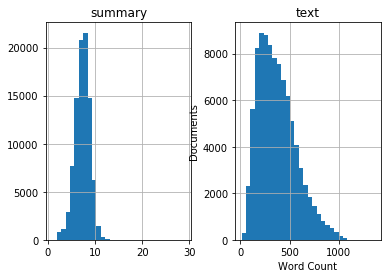

In [59]:
text_word_count = []
summary_word_count = []

# populate the lists with sentence lengths
for i in df['text']:
      text_word_count.append(len(i.split(' ')))

for i in df['summary']:
      summary_word_count.append(len(i.split(' ')))

length_df = pd.DataFrame({'text':text_word_count, 'summary':summary_word_count})

length_df.hist(bins = 30)
plt.ylabel('Documents')
plt.xlabel('Word Count')
# plt.savefig('word_count_distro' + str(build_number) + '.png')
plt.show()

Cut down text to MAX_TEXT_LEN words, and summaries to MAX_SUMMARY_LEN

In [60]:
MAX_TEXT_LEN = 250
MAX_SUMMARY_LEN = 10

In [61]:
print(df['text'][0])
df['text'] = df['text'].apply(lambda x: nltk.word_tokenize(x)).apply(lambda x: " ".join(x[:MAX_TEXT_LEN]))
print(df['text'][0])

print(df['summary'][0])
df['summary'] = df['summary'].apply(lambda x: nltk.word_tokenize(x)).apply(lambda x: " ".join(x[:MAX_SUMMARY_LEN]))
print(df['summary'][0])

LONDON England Reuters Harry Potter star Daniel Radcliffe gain access report 20 million 411 million fortune turn 18 Monday insists money wont cast spell Daniel Radcliffe Harry Potter Harry Potter Order Phoenix disappointment gossip columnist around world young actor say plan fritter cash away fast car drink celebrity party dont plan one people soon turn 18 suddenly buy massive sport car collection something similar told Australian interviewer earlier month dont think Ill particularly extravagant thing like buying thing cost 10 pound book CDs DVDs 18 Radcliffe able gamble casino buy drink pub see horror film Hostel Part II currently six place number one movie UK box office chart Details hell mark landmark birthday wrap agent publicist comment plan Ill definitely sort party say interview Hopefully none reading Radcliffes earnings first five Potter film held trust fund able touch Despite grow fame rich actor say keep foot firmly ground People always look say kid star go rail told reporter

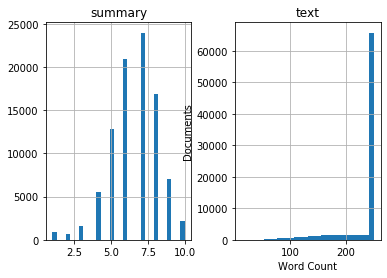

In [62]:
text_word_count = []
summary_word_count = []

# populate the lists with sentence lengths
for i in df['text']:
      text_word_count.append(len(i.split(' ')))

for i in df['summary']:
      summary_word_count.append(len(i.split(' ')))

length_df = pd.DataFrame({'text':text_word_count, 'summary':summary_word_count})

length_df.hist(bins = 30)
plt.ylabel('Documents')
plt.xlabel('Word Count')
# plt.savefig('word_count_distro_word_removal' + str(build_number) + '.png')
plt.show()

### Finding Uncommon Words and Removing Them.

Uncommon words are classified as those that occur in the whole corpus less times than UNCOMMON_WORD_THRESHOLD







#### Text

In [63]:
# x_word_dict = {}
# text = df['text'].apply(lambda x: nltk.word_tokenize(x))

# for index, row in text.iteritems():
#   for word in row:
#     if word not in x_word_dict.keys():
#       x_word_dict[word] = 1
#     else:
#       x_word_dict[word] += 1

# print(len(x_word_dict))
# # sort so that extracting acceptable words is more efficient for larger vocab sizes
# sorted_dict = sorted(x_word_dict.items(), key=lambda x: x[1], reverse=True)
# print(sorted_dict)
# x, y = zip(*sorted_dict)

In [64]:
# # find words that occur more than UNCOMMON_WORD_THRESHOLD times
# accept_words = []
# for word, occ in sorted_dict:
#   if int(occ) > UNCOMMON_WORD_THRESHOLD:
#     accept_words.append(word)
#   else:
#     break

# # remove uncommon words    
# accept_words = [x.lower() for x in accept_words]
# print(accept_words)
# print(df['text'][2])
# df['text'] = df['text'].apply(lambda x: nltk.word_tokenize(x)).apply(lambda x: " ".join([word for word in x if word.lower() in accept_words]))
# print(df['text'][2])


In [65]:
# x_word_dict_after = {}
# text = df['text'].apply(lambda x: nltk.word_tokenize(x))

# for index, row in text.iteritems():
#   for word in row:
#     if word not in x_word_dict_after.keys():
#       x_word_dict_after[word] = 1
#     else:
#       x_word_dict_after[word] += 1

# print(len(x_word_dict_after))

#### Summaries

In [66]:
# y_word_dict = {}
# summary = df['summary'].apply(lambda x: nltk.word_tokenize(x))

# for index, row in summary.iteritems():
#   for word in row:
#     if word not in y_word_dict.keys():
#       y_word_dict[word] = 1
#     else:
#       y_word_dict[word] += 1

# print(len(y_word_dict))
# sorted_dict = sorted(y_word_dict.items(), key=lambda x: x[1], reverse=True)
# print(sorted_dict)
# x, y = zip(*sorted_dict)

In [67]:
# accept_words = []
# for word, occ in sorted_dict:
#   if int(occ) > UNCOMMON_WORD_THRESHOLD:
#     accept_words.append(word)
#   else:
#     break
     
# accept_words = [x.lower() for x in accept_words]
# print(accept_words)
# print(df['summary'][2])
# df['summary'] = df['summary'].apply(lambda x: nltk.word_tokenize(x)).apply(lambda x: " ".join([word for word in x if word.lower() in accept_words]))
# print(df['summary'][2])

In [68]:
# y_word_dict_after = {}
# summary = df['summary'].apply(lambda x: nltk.word_tokenize(x))

# for index, row in summary.iteritems():
#   for word in row:
#     if word not in y_word_dict_after.keys():
#       y_word_dict_after[word] = 1
#     else:
#       y_word_dict_after[word] += 1
# print(len(y_word_dict_after))

View Word Distribution after uncommon word removal

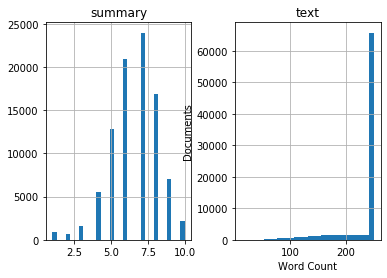

In [69]:
text_word_count = []
summary_word_count = []

# populate the lists with sentence lengths
for i in df['text']:
      text_word_count.append(len(i.split(' ')))

for i in df['summary']:
      summary_word_count.append(len(i.split(' ')))

length_df = pd.DataFrame({'text':text_word_count, 'summary':summary_word_count})

length_df.hist(bins = 30)
plt.ylabel('Documents')
plt.xlabel('Word Count')

# plt.savefig('word_count_distro_word_removal' + str(build_number) + '.png')
plt.show()

### Update Max Text Lenths After Uncommon Word Removal & Drop Empty Rows

In [70]:
print(df['text'][0])
df['text'] = df['text'].apply(lambda x: nltk.word_tokenize(x)).apply(lambda x: " ".join(x[:MAX_TEXT_LEN]))
print(df['text'][0])

LONDON England Reuters Harry Potter star Daniel Radcliffe gain access report 20 million 411 million fortune turn 18 Monday insists money wont cast spell Daniel Radcliffe Harry Potter Harry Potter Order Phoenix disappointment gossip columnist around world young actor say plan fritter cash away fast car drink celebrity party dont plan one people soon turn 18 suddenly buy massive sport car collection something similar told Australian interviewer earlier month dont think Ill particularly extravagant thing like buying thing cost 10 pound book CDs DVDs 18 Radcliffe able gamble casino buy drink pub see horror film Hostel Part II currently six place number one movie UK box office chart Details hell mark landmark birthday wrap agent publicist comment plan Ill definitely sort party say interview Hopefully none reading Radcliffes earnings first five Potter film held trust fund able touch Despite grow fame rich actor say keep foot firmly ground People always look say kid star go rail told reporter

In [71]:
print(df['summary'][0])
df['summary'] = df['summary'].apply(lambda x: nltk.word_tokenize(x)).apply(lambda x: " ".join(x[:MAX_SUMMARY_LEN]))
print(df['summary'][0])

Young actor says plans fritter cash away
Young actor says plans fritter cash away


In [72]:
# update max text lengths
MAX_TEXT_LEN = max([len(txt.split(' ')) for txt in df['text']])
MAX_SUMMARY_LEN = max([len(txt.split(' ')) for txt in df['summary']])
print(MAX_TEXT_LEN)
print(MAX_SUMMARY_LEN)

250
10


In [73]:
# drop any lines that have no text or summary after the word removal process
print(df.isnull().values.any())
print(df.shape)

df1 = df[df.isna().any(axis=1)]
print(df1.shape)

df.drop(df1.index, axis=0,inplace=True)
print(df.shape)
print(df.isnull().values.any())

False
(92465, 4)
(0, 4)
(92465, 4)
False


### Add in start and end tokens to summaries
This is necessary to ensure that the model can tell when each summaries start and end

In [74]:
df['summary'] = df['summary'].apply(lambda x : 'sostok '+ x + ' eostok')
print(df['summary'].head())

0    sostok Young actor says plans fritter cash awa...
1    sostok Mentally ill inmates Miami housed forgo...
2      sostok NEW thought going die driver says eostok
3    sostok President reclaims powers transferred v...
4    sostok NFL suspends Falcons quarterback indefi...
Name: summary, dtype: object


## Training-Validation Split

X - Articles text </br>
Y - Summaries

In [75]:
# convert to numpy array
X = np.array(df['text'])
Y = np.array(df['summary'])

In [76]:
x_tr,x_val,y_tr,y_val=train_test_split(X,Y,test_size=TEST_TRAIN_SPLIT,random_state=0,shuffle=True)
print(x_tr.shape)
print(x_val.shape)
print(y_tr.shape)
print(y_val.shape)

(78595,)
(13870,)
(78595,)
(13870,)


## Word Embeddings - Tokenization

X Tokenizer

In [77]:
word_dict = {}
text = df['text']

for row in text: 
  for word in row.split(" "):
    if word not in word_dict:
      word_dict[word] = 1
    else:
      word_dict[word] += 1

print(len(word_dict))

290484


In [78]:
#prepare a tokenizer for reviews on training data
x_tokenizer = Tokenizer(num_words=len(word_dict), split=" ") 
x_tokenizer.fit_on_texts(list(X))

#convert text sequences into integer sequences
x_tr_seq    =   x_tokenizer.texts_to_sequences(x_tr) 
x_val_seq   =   x_tokenizer.texts_to_sequences(x_val)

#padding zero upto maximum length
x_tr    =   pad_sequences(x_tr_seq,  maxlen=MAX_TEXT_LEN, padding='post')
x_val   =   pad_sequences(x_val_seq, maxlen=MAX_TEXT_LEN, padding='post')

#size of vocabulary ( +1 for padding token)
x_voc   =  x_tokenizer.num_words + 1
print(x_voc)

290485


In [79]:
with open('xtokenizer.pickle', 'wb') as handle:
  pickle.dump(x_tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

Y Tokenizer

In [80]:
y_word_dict = {}
summ = df['summary']

for row in summ: 
  for word in row.split(" "):
    if word not in y_word_dict:
      y_word_dict[word] = 1
    else:
      y_word_dict[word] += 1

print(len(y_word_dict))

58560


In [81]:
#prepare a tokenizer for reviews on training data
y_tokenizer = Tokenizer(num_words=len(y_word_dict), split=" ") 
y_tokenizer.fit_on_texts(list(Y))

#convert text sequences into integer sequences
y_tr_seq    =   y_tokenizer.texts_to_sequences(y_tr) 
y_val_seq   =   y_tokenizer.texts_to_sequences(y_val) 

#padding zero upto maximum length
y_tr    =   pad_sequences(y_tr_seq, maxlen=MAX_SUMMARY_LEN, padding='post')
y_val   =   pad_sequences(y_val_seq, maxlen=MAX_SUMMARY_LEN, padding='post')

#size of vocabulary
y_voc  =   y_tokenizer.num_words + 1
print(y_voc)
print(y_tokenizer.word_counts['sostok'],len(y_tr))

58561
92465 78595


In [82]:
with open('ytokenizer.pickle', 'wb') as handle:
  pickle.dump(y_tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Learning Model

#### Encoder Model

In [83]:
#encoder input
encoder_inputs = Input(shape=(MAX_TEXT_LEN,))
#embedding layer
enc_emb =  Embedding(x_voc,EMBEDDING_DIM,trainable=True)(encoder_inputs)
# bidirectional encoder lstm 
encoder_lstm = Bidirectional(LSTM(LATENT_DIM,return_sequences=True,return_state=True))
# outputs and encoder final states
encoder_outputs, fw_state_h, fw_state_c, bw_state_h, bw_state_c = encoder_lstm(enc_emb)

state_h = Concatenate()([fw_state_h, bw_state_h])
state_c = Concatenate()([fw_state_c, bw_state_c])
encoder_states = [state_h, state_c]

#### Decoder Model

In [84]:
# Set up the decoder, using `encoder_states` as initial state.
decoder_inputs = Input(shape=(None,))

#embedding layer
dec_emb_layer = Embedding(y_voc, EMBEDDING_DIM,trainable=True)
dec_emb = dec_emb_layer(decoder_inputs)

decoder_lstm = LSTM(LATENT_DIM*2, return_sequences=True, return_state=True)
decoder_outputs,decoder_fwd_state, decoder_back_state = decoder_lstm(dec_emb,initial_state=encoder_states)
                                                          
#dense layer 
#soft max creates a prob vector that allows us to determine the final output
decoder_dense = Dense(y_voc, activation='softmax')
decoder_outputs = decoder_dense(decoder_outputs)


#### Combined LSTM Model

In [85]:
# Define the model 
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 250)          0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 250, 128)     37182080    input_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, None)         0                                            
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) [(None, 250, 512), ( 788480      embedding_1[0][0]                
____________________________________________________________________________________________

In [86]:
optimizer = RMSprop(lr=LEARNING_RATE, rho=0.9)

In [87]:
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy')

- Early Stopping Callback to ensure we stop when Validation Loss is lowest - minimises risk of overfitting
- Model Checkpoint saves the model after each epoch so that we can load the model with the best weights later on. Alternatively, it allows us to continue training the model at a later data



In [88]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1,patience=2, restore_best_weights=False)
filepath = "./model/saved-model-{epoch:02d}.hdf5"
if COLAB:
  filepath = PATH + "project-model/saved-model-{epoch:02d}.hdf5"
mc = ModelCheckpoint(filepath, monitor='val_loss', verbose=0, save_best_only=False, save_weights_only=False, mode='auto', period=1)

#### Use this  to train a new model. To continue training a previously trained model see below

In [89]:
# reshape y from two dimensions to three dimensions
y_tr_3d = y_tr.reshape(y_tr.shape[0],y_tr.shape[1], 1)[:,1:]
y_val_3d = y_val.reshape(y_val.shape[0],y_val.shape[1], 1)[:,1:]

In [90]:
print(x_tr.shape)
print(y_tr.shape)
print(y_tr_3d.shape)
print(x_val.shape)
print(y_val.shape)
print(y_val_3d.shape)

(78595, 250)
(78595, 10)
(78595, 9, 1)
(13870, 250)
(13870, 10)
(13870, 9, 1)


In [92]:
history = model.fit([x_tr,y_tr[:,:-1]], y_tr_3d, batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=[es], validation_data=([x_val,y_val[:,:-1]], y_val_3d))

Train on 78595 samples, validate on 13870 samples
Epoch 1/30
78595/78595 [==============================] - 479s 6ms/step - loss: 6.3113 - val_loss: 6.4186
Epoch 2/30
78595/78595 [==============================] - 480s 6ms/step - loss: 6.2342 - val_loss: 6.3521
Epoch 3/30
78595/78595 [==============================] - 477s 6ms/step - loss: 5.8095 - val_loss: 6.3632
Epoch 4/30
78595/78595 [==============================] - 477s 6ms/step - loss: 5.4330 - val_loss: 6.7985
Epoch 00004: early stopping


#### This method is to only be used when loading a previously partially trained model

In [ ]:
# model = load_model("./drive/My Drive/project-model/saved-model-53.hdf5")
# history = model.fit([x_tr,y_tr[:,:-1]], y_tr, callbacks=[mc], batch_size=BATCH_SIZE, epochs=1, validation_data=([x_val,y_val[:,:-1]], y_val))

### Plot training and validation loss overtime

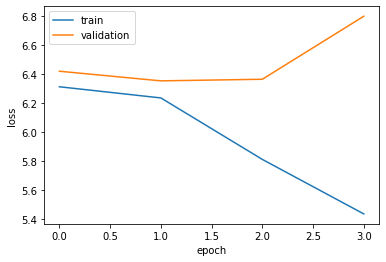

In [93]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
# plt.savefig('loss' + str(build_number) + '.png')
plt.show()

## Inference Model

In [94]:
# load model from drive
# model = load_model("./drive/My Drive/saved-model-53.hdf5")

In [95]:
reverse_target_word_index=y_tokenizer.index_word
reverse_source_word_index=x_tokenizer.index_word
print(reverse_source_word_index)
print(reverse_target_word_index)
# used to get positions of sostok and eostok
target_word_index=y_tokenizer.word_index

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [96]:
# Encode the input sequence to get the feature vector
encoder_model = Model(inputs=encoder_inputs,outputs=[encoder_outputs, state_h, state_c])

In [97]:
encoder_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 250)          0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 250, 128)     37182080    input_1[0][0]                    
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) [(None, 250, 512), ( 788480      embedding_1[0][0]                
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 512)          0           bidirectional_1[0][1]            
                                                                 bidirectional_1[0][3]      

In [98]:
# Decoder setup
# Below tensors will hold the states of the previous time step
decoder_state_input_h = Input(shape=(LATENT_DIM*2,))
decoder_state_input_c = Input(shape=(LATENT_DIM*2,))
decoder_hidden_state_input = Input(shape=(MAX_TEXT_LEN,LATENT_DIM*2))
decoder_state_inputs = [decoder_state_input_h, decoder_state_input_c]

# Get the embeddings of the decoder sequence
dec_emb2= dec_emb_layer(decoder_inputs) 
# To predict the next word in the sequence, set the initial states to the states from the previous time step
decoder_outputs2, state_h2, state_c2 = decoder_lstm(dec_emb2, initial_state=decoder_state_inputs)
decoder_states = [state_h2, state_c2]
# A dense softmax layer to generate prob dist. over the target vocabulary
decoder_outputs2 = decoder_dense(decoder_outputs2) 

# Final decoder model
decoder_model = Model([decoder_inputs] + [decoder_hidden_state_input,decoder_state_input_h, decoder_state_input_c], [decoder_outputs2] + decoder_states)

In [99]:
decoder_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, None)         0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, None, 128)    7495808     input_2[0][0]                    
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 512)          0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 512)          0                                            
____________________________________________________________________________________________

### Methods for Reversing Word Embeddings

In [100]:
def seq_to_text(input_seq, summary):       
  textString=''
  if not summary:
      for i in input_seq:
          if(i!=0):
              textString = textString + ' ' + reverse_source_word_index[i]
  else:
      for i in input_seq:
          if((i!=0 and i!=target_word_index['sostok']) and i!=target_word_index['eostok']):
              textString = textString + ' ' + reverse_target_word_index[i]
  return textString 

### Summarisation Method 

In [101]:
def decode_sequence(input_seq):
    # Encode the input as state vectors.
    e_out, e_h, e_c = encoder_model.predict(input_seq)
    # Generate empty target sequence of length 1.
    target_seq = np.zeros((1,1))
    # Populate the first word of target sequence with the start word.
    target_seq[0, 0] = target_word_index['sostok']
    stop_condition = False
    decoded_sentence = ''

    while not stop_condition:
        output_tokens, h, c = decoder_model.predict([target_seq] + [e_out, e_h, e_c])
        # Sample a token
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_token = reverse_target_word_index[sampled_token_index]
        
        if(sampled_token!='eostok'):
            decoded_sentence += ' '+sampled_token

        # Exit condition: either hit max length or find stop word.
        if (sampled_token == 'eostok'  or len(decoded_sentence.split()) >= (MAX_SUMMARY_LEN-1)):
            stop_condition = True

        # Update the target sequence (of length 1).
        target_seq = np.zeros((1,1))
        target_seq[0, 0] = sampled_token_index
        # Update internal states
        e_h, e_c = h, c

    return decoded_sentence

## Test Model Output

In [102]:
def getRouge(gt, pred):
  return rouge.get_scores(pred, gt)

In [103]:
for i in range(0,10):
    print("----------------------")
    article = seq_to_text(x_tr[i], False)
    original = seq_to_text(y_tr[i], True)

    if (original !=""):
      print("Article: " + article)
      print("Original summary:", original)
      # reshape data into correct format for encoder (1, max_text_len)
      x_tr_i_reshaped = x_tr[i].reshape(1,MAX_TEXT_LEN)
      summary = decode_sequence(x_tr_i_reshaped)
      print("Generated summary:",summary)
      print("\n")

      if summary != "":    
          print("ROUGE score: ")
          score = getRouge(str(summary), str(original))
          print(score)
          print(score[0].get('rouge-1').get('f'))
          print(score[0].get('rouge-1').get('p'))
          print(score[0].get('rouge-1').get('r'))----------------------
Article:  hundreds russians hit street moscow sunday rally promote peace equality response rash ethnic violence unrest staterun medium report moscow everyone demonstration pushkin square drew 1500 participant accord ria novosti people come intend put event occur moscow december 11 15 say viktor shenderovich one event organizer believe riot moscow cause pu burst police officer set metal detector around square check knife weapon bid avoid repeat street violence earlier month turmoil begin southern moscow death yegor sviridov 28 kyrgyzstan migrant authority say kill brawl migrant russias north caucasus region december 6 five day later 5000 nationalist football hooligan clashed moscow police unsanctioned nationalisttinged mass memorial fellow supporter turn violent accord state medium confrontation take place manezh square outside kremlin lead arrest 65 spartak moscow fan disobedience moscow police spokesman viktor biryukov say accord official russian news agency itartass head spartak moscow fan club told ria novosti showdown nothing sport instead root problem russian society december 15 police arrest 200 people downtown moscow four day later seize weapon bid prevent clash ethnic russians member caucasus ethnic group russian news agency report ilya kubrakov suspect riot ringleader three others arrest december 17 role sviridovs death moscow court announce accord ria novosti russian president dmitry medvedev blame rash ethnic violence investigator release suspect sviridovs death news agency report medvedev call authority take measure punish responsible crime

----------------------
Article:  hundreds russians hit street moscow sunday rally promote peace equality response rash ethnic violence unrest staterun medium report moscow everyone demonstration pushkin square drew 1500 participant accord ria novosti people come intend put event occur moscow december 11 15 say viktor shenderovich one event organizer believe riot moscow cause pu burst police officer set metal detector around square check knife weapon bid avoid repeat street violence earlier month turmoil begin southern moscow death yegor sviridov 28 kyrgyzstan migrant authority say kill brawl migrant russias north caucasus region december 6 five day later 5000 nationalist football hooligan clashed moscow police unsanctioned nationalisttinged mass memorial fellow supporter turn violent accord state medium confrontation take place manezh square outside kremlin lead arrest 65 spartak moscow fan disobedience moscow police spokesman viktor biryukov say accord official russian news agency ita

Generated summary:  king described king mandelas brother says


ROUGE score: 
[{'rouge-1': {'f': 0.0, 'p': 0.0, 'r': 0.0}, 'rouge-2': {'f': 0.0, 'p': 0.0, 'r': 0.0}, 'rouge-l': {'f': 0.0, 'p': 0.0, 'r': 0.0}}]
0.0
0.0
0.0
----------------------
Article:  hong kong majority people west banking easy walk local branch atm log account computer million develop country even bank account reach india least could change vodafone india icici bank indias large private bank launch mpesa mobilebased money transfer payment service first establish kenya 2007 partnership announce news release april 17 claim give mobilebanking access 700 million indian people currently unbanked people access conventional banking service like bank branch atms vodafone say service first rollout indias eastern region include kolkata west bengal 8300 agent part india home 220 million people service eventually extend across rest country mpesa system stand mobile pesa swahili word money begin real cash mpesa agent customer s

In [104]:
for i in range(1243,1253):
    print("----------------------")
    article = seq_to_text(x_tr[i], False)
    original = seq_to_text(y_tr[i], True)

    if (original !=""):
      print("Article: " + article)
      print("Original summary:", original)
      # reshape data into correct format for encoder (1, max_text_len)
      x_tr_i_reshaped = x_tr[i].reshape(1,MAX_TEXT_LEN)
      summary = decode_sequence(x_tr_i_reshaped)
      print("Generated summary:",summary)
      print("\n")

      if summary != "":    
          print("ROUGE score: ")
          score = getRouge(str(summary), str(original))
          print(score)
          print(score[0].get('rouge-1').get('f'))
          print(score[0].get('rouge-1').get('p'))
          print(score[0].get('rouge-1').get('r'))

----------------------
Article:  news make headline personal story make last impact people touch life million year cnn invite people share personal essay world deliver dozens ireporters courage pour heart unforgettable story pain loss joy courage anger many publish cnncom parenting huge topic year gun control frustration government also people mind 2013 come close here look back best story receive people share mother raise kid without religion deborah mitchell stir intense debate cnncom early january post seven reason raise child without god readers disagreed view flag ireport inappropriate many time put note ask people stop mitchell mother two teenager texas say simply want people stop fear atheist want religion go away write want child free believe story drew comment ireport story date result book contract mitchell memoir growing godless parents guide raising kids without religion come spring woman whose son taught oscar pistorius man cynthia falardeau always search role model 10year

Generated summary:  group founded teenage primates known business business business


ROUGE score: 
[{'rouge-1': {'f': 0.0, 'p': 0.0, 'r': 0.0}, 'rouge-2': {'f': 0.0, 'p': 0.0, 'r': 0.0}, 'rouge-l': {'f': 0.0, 'p': 0.0, 'r': 0.0}}]
0.0
0.0
0.0
----------------------
Article:  journalists cover last week economic summit overheard french president nicolas sarkozy blasting israeli prime minister benjamin netanyahu liar talk us president barack obama accord publish report private conversation inadvertently carry open microphone obamasarkozy news conference sideline group 20 economic summit french resort cannes content first report french website arret sur images say reporter heard sarkozys comment french obamas reply translator cant stand hes liar sarkozy say netanyahu accord website obama reply youre tire deal every day site report arret sur images freeze frame say journalist listen conversation agree report reuters associated press news service confirm report tuesday didnt record use wou

## Evaluation

Using ROUGE (Recall-Orientated Understanding Gisting Evaluation) to evaluate the generated summaries.

*Note: This takes a long time, especially with large datasets* 

### For Training Data

In [105]:
print(len(x_tr))

78595


In [108]:
tr_target_summary = []
tr_generated_summary = []
x_tr_len = len(x_tr)

f_ov = 0
p_ov = 0
r_ov = 0
# x_val_len = 1
for i in range(0,x_tr_len):
  print(i)
  original = seq_to_text(y_tr[i], True)
  if original != "" :
      tr_target_summary.append(original)
      x_i = x_tr[i].reshape(1,MAX_TEXT_LEN)
      summary = decode_sequence(x_i)
      print(i)
      print(original)
      print(summary)
      print("-----")
      tr_generated_summary.append(summary)
      if summary != "":
          score = getRouge(str(summary), str(original))
          f_ov += float(score[0].get('rouge-1').get('f'))
          p_ov += float(score[0].get('rouge-1').get('p'))
          r_ov += float(score[0].get('rouge-1').get('r'))

0
0
 the event aimed promote peace several incidents violence
 the group blamed 800 deaths
-----
1
1
 the flight bound aceh province crashed
 plane crashed safely safely coast coast
-----
2
2
 forget write captions backs photos
 cnn commenters share photos photos ireport
-----
3
3
 expect bespoke tailoring cinched waists 1970s vibes
 study commenters suggests secular women get get get recession
-----
4
4
 doctors say shown major medical improvements
 doctors say shown rare physical physical physical physical
-----
5
5
 he says characterization unfair college takes consent seriously
 david frum maps language womens literacy literacy
-----
6
6
 craig rutman seen 200 shows met band members
 king described king mandelas brother says
-----
7
7
 vodafone says 700mn indians unbanked access traditional bank services
 chinese netizens association photos memories limitations
-----
8
8
 christakis fowler holidays feast facebook go handinhand
 study finds 2000 teens living walk
-----
9
9
 police a

78
 he says unusual extreme tornado strike midwest
 new york deadliest countries least least least three
-----
79
79
 iran rebuffed iaea requests years
 iran insists nuclear program peaceful
-----
80
80
 volunteers killed sunday khyber pakhtunkhwa
 the taliban commander al qaeda claimed responsibility
-----
81
81
 in september moved private facility treatment
 she she says son doctor relieved
-----
82
82
 new prime minister morgan tsvangirai stable condition sources say
 new prime minister vows bring possible possible
-----
83
83
 film presents realistic representation comedians lives rogen says
 says actor covers closing sometimes marriage identity
-----
84
84
 google thursday launched website devoted language preservation
 facebook twitter instagram suggests results photos photos photos
-----
85
85
 one first women work aerospace
 study finds women get huge living body
-----
86
86
 beckham picked groin strain mls western conference final sunday
 new england scotland leaves least six 

157
 supreme court looks two killings 14yearolds convicted
 justices hear trial delayed bail
-----
158
158
 ibm developing computer system analyze food based molecules
 million small mountainous area popular chad preaches recession
-----
159
159
 miami dolphins suspend shelby indefinitely conduct detrimental team
 new police say suspect custody
-----
160
160
 ireporters share stories finding true love prom dates
 cnn commenters really really really really really really
-----
161
161
 chelsea return winning ways wolves arsenal draw fulham
 chelsea beat 10man borussia dortmund go top group
-----
162
162
 northern irishman frustrated pulling shot water hazard
 he makes planning attack marathon twitter account
-----
163
163
 journalists need take account impact reporting says
 new report suggests woman says pair identity
-----
164
164
 athletes access games room 24hour gym
 ship owned coast guard
-----
165
165
 he carried gun light saber
 police say theyre custody
-----
166
166
 is excuse 

236
 tribal council alleged used girls money settle dispute
 new pakistani taliban claims responsibility
-----
237
237
 keep recall expanded include half billion eggs
 consider impact
-----
238
238
 fans chanted suarez suarez suarez long entered pitch
 the striker zlatan ibrahimovic fined henry yaya toure
-----
239
239
 kauai filled botanical wonders lush scenic gardens
 every year already jailed get donations live history
-----
240
240
 iraqi prime minister says attacks require reevaluation security plans
 new least seven killed attack u
-----
241
241
 the prize awarded european parliament worth 67000
 he says malala yousafzai professional professional professional history
-----
242
242
 she says son stopped black
 he says son knew someone someone good thing
-----
243
243
 he started nonprofit help close friend john gallina
 new royal family commander says family nato commander
-----
244
244
 dad tiger tamer mom hangs hair travel son
 couple married saturday night live mom says
-----


317
 hackerspaces openaccess laboratories intended promote entrepreneurship
 new study finds half countries explore suicide bomber
-----
318
318
 protesters sale police troops brazil
 the move comes amid heightened tensions
-----
319
319
 another ray tip clip coupons head grocery buy bulk
 white supremacist suit exhibit exhibit card influence influence
-----
320
320
 the country turmoil ever since
 the muslim brotherhood formed mohamed morsi egyptian revolution
-----
321
321
 phillip nancy garrido accused abducting jaycee dugard
 authorities say motive scene
-----
322
322
 medieval aristocrats known eaten highprotein diets
 authorities consider donations donations train derailed literacy route
-----
323
323
 patrick kennedy tells newspaper bishop barred communion
 new jersey governor apologizes saying shes knew
-----
324
324
 france international thierry henry told leave barcelona summer
 he suffering several problems worldwide media analyst says
-----
325
325
 click read answers quest

393
 nourmohammadis mother shied away attention
 new know plane went missing early sunday
-----
394
394
 jim ingram worked fbis mississippi office turbulent 1960s
 authorities say confessed hiding gold identity identity identity identity
-----
395
395
 pushpa basnet revealed sunday night 2012 cnn hero year

-----
396
396
 4 6 u
 study conducted cross living body influence sometimes influence
-----
397
397
 maasai say refuse relocated time
 new york exhibition suggests worlds oldest woman
-----
398
398
 he also represented portugal world european finals
 he also signed threeyear contract extension 2012
-----
399
399
 internetenabled devices wearable tech hot trends
 companies provide phones recession united states
-----
400
400
 quake struck around 843 a
 new tsunami warning issued
-----
401
401
 almaliki declined give personal viewpoint reporters
 he says hell take action congress
-----
402
402
 fonseka says charges false politically motivated
 the defense ministry denies request comme

472
 cornelia wallace late 60s
 he arrested hospital saturday night live
-----
473
473
 abu dhabi latest newsgathering expansion network
 but no one hurt sales
-----
474
474
 siblings chance tubane patience nduwawe founders tohoza
 children malala yousafzai describe education stories identity
-----
475
475
 fellowslovakians roman slysko martin balko two assistants
 pakistan striker zlatan ibrahimovic david beckham crashes
-----
476
476
 chan lancaster need longterm strategy managing valuable resource
 analyst advises small products africa formed
-----
477
477
 many means return home
 new least seven deaths reported refugees
-----
478
478
 the defense contends jackson gave fatal overdose
 the judge ordered closing arguments tuesday
-----
479
479
 write answers space provided
 write answers space provided
-----
480
480
 among honored actor robert de niro singer bruce springsteen
 actor he known husband william costume
-----
481
481
 motivating youngsters removing shame embarrassment call

550
 ryanair announced date implement plan
 airline tickets tickets tickets tickets analyst says
-----
551
551
 he attributes recent pic band members
 new actor jim taylor tweets tweets identity identity
-----
552
552
 turkey strategic location companies hoping tap europe asia
 mme looks worst train train derailed
-----
553
553
 he refiles one day judge dismisses lawsuit
 he admits allegations armstrong deny allegations bribery allegations
-----
554
554
 the tablet goes sale november 13
 apple announces samsung galaxy apps android apps
-----
555
555
 says voting rights defended anew assaults nonexistent voter fraud
 david king william political prisoner movement influence humanity
-----
556
556
 students newtown connecticut return school amid heightened security
 students say theyre planning change
-----
557
557
 krokos small town northern greece pick saffron fortnight year
 new york travelers call backdoor train derailed
-----
558
558
 aldhafra camel festival features beauty contest p

628
 gibbs change egypt begin
 obama says continue fight terrorism
-----
629
629
 thatcher 55 described comment joke
 former teammates played london london 2012 olympics
-----
630
630
 mother beat 2yearold daughter glued wall potty training
 new mom describes son girl mother says
-----
631
631
 locals pulled 11 bodies rubble one baby survivor
 despite danger began memories get thing expert says
-----
632
632
 edward burkhardt believes misunderstood sympathize victims
 new york woman brother brother says
-----
633
633
 still emmys appeal many viewers
 says shes loves actor actor actor suggests
-----
634
634
 1000 residents stranded villages isolated flooding
 more 150 people displaced violence
-----
635
635
 findings fourmember team published online journal science
 study finds living scientists hope exhibit milk
-----
636
636
 hillary clinton says aims address questions americans thinking
 clinton says u
-----
637
637
 an expert determines tooth longextinct mastodon
 couple married fra

707
 volume illegal robocalls increasing u
 new official suggests party made novartis get display
-----
708
708
 luke donald joint second second straight 68
 rory mcilroy wins mcilroy open race thanksgiving
-----
709
709
 martina mcbride drops 11th album today

-----
710
710
 sherwood anderson killed toothpick hors doeuvre
 frein tequila kicked display symbol monarchy personalities
-----
711
711
 threat originated mexico sheriffs spokeswoman says
 the agents airline department homeland security adviser security adviser
-----
712
712
 mccain unveils new campaign airplane
 mccain says obama administration gives obama romneys campaign
-----
713
713
 holders iraq secure place last eight asian cup doha
 france beats pressure 30 win
-----
714
714
 xbox live update promises allinone device tv viewing
 twitter suggests games display competitors ever sound
-----
715
715
 courtney martin lean work learn lean areas life
 david says maps language developing developing countries
-----
716
716
 sout

782
 slight anomalies found airbus aircrafts rollsroyce engines
 plane landed safely get safely
-----
783
783
 sense urgency house moving gun control bill
 new senate approves measure vote count
-----
784
784
 liverpool currently lie seventh english premier league
 chelsea beat newcastle 21 30 stadium stadium stadium
-----
785
785
 satellite imagery shows rocket launch site northeastern north korea
 nato commander says nato travel fighters get access
-----
786
786
 asteroid 2012 da14 traveling 17400 mph
 nasa spacecraft spacecraft crash comet saturday
-----
787
787
 mitt romney barack obama neckandneck polls
 but obama romney mohamed claims responsibility
-----
788
788
 secretary state hillary clinton makes unannounced visit lebanon
 clinton calls request campaign demands
-----
789
789
 its long haul im getting dugard says
 authorities investigating incident occurred collection ever
-----
790
790
 complaint says tolls reasonable
 new york exhibit approved use suit spokeswoman says
----

860
 dr
 couple married canada king live childrens condition
-----
861
861
 she says men changing countrys ideas masculine
 granderson study mental illness hope hope hope
-----
862
862
 says increasing reward missing american robert levinson 5 million
 authorities say investigating accident
-----
863
863
 state department need get hotter
 new u
-----
864
864
 prince also visited kabul meet president karzai
 the visit afghanistan striker meet brother brother
-----
865
865
 i expected going zinged trump says
 mccain says shes knew obama
-----
866
866
 a tropical storm would given name arthur
 new jersey issued flooding tropical storm ketsana
-----
867
867
 lil wayne multiplatinumselling grammywinning rap artist
 new actor starred tequila starred actor spokeswoman says
-----
868
868
 new search called late friday afternoon
 new people train derailed train derailed train derailed
-----
869
869
 schneier says worstcase security planning focuses unlikely though certain
 he says many hope pla

938
 shauna prewitt baby conceived rape faced another unexpected ordeal
 new woman suggests woman victim son girls planning
-----
939
939
 new jersey mayor demands gun safety views gun manufacturers
 new study finds obama says
-----
940
940
 arrival charlie axel comes woods prepares tour return surgery
 he previously appeared display family friends
-----
941
941
 family statement brittany incredibly loving passionate person
 police say theyre custody
-----
942
942
 new obama retakes oath office wednesday night
 obama says congress proposed measure
-----
943
943
 keeper dies oregon wild cat sanctuary
 authorities investigating cause death photos
-----
944
944
 sea piracy waters south east asia increase
 new ships suggests ship aid workers get find
-----
945
945
 thousands people evacuated marbella area costa del sol
 new least seven people killed flooding
-----
946
946
 chechenborn bulat chagaev controversial owner neuchatel xamax
 former teammates fill fill bribery allegations bribery 

1013
 medical examiners havent determined cause death
 authorities say infants born alive
-----
1014
1014
 many killed women children group says
 the syrian opposition group says al qaeda
-----
1015
1015
 gwilym davies wins weeks world barista championship atlanta
 world championship previously finished
-----
1016
1016
 supreme leader asks western youths study islam making judgments
 iran says closing arguments important thing
-----
1017
1017
 mark jacobson election francois hollande global implications
 the president says eu summit
-----
1018
1018
 actors family manager dispute suicide theory
 police say rapper believed hiding
-----
1019
1019
 researchers university florida exploring chemistry behind fruit
 researchers contaminated sweeping rare coasts bribery
-----
1020
1020
 images leaked animal rights group complained u
 new u
-----
1021
1021
 the men charged conspiracy provide support use wmd
 new york woman arrested california prosecutor says
-----
1022
1022
 criterion 25disc aki

1091
 others argued kids watching vmas first place
 says mom describes someone someone get
-----
1092
1092
 gingrich obama negotiate putin alassad negotiate congress
 julian zelizer william political views seems influence influence
-----
1093
1093
 conduct islamic preacher kidnapped elizabeth smart christian writes
 malala yousafzai tells cnn living message sister says
-----
1094
1094
 moscow doubtless feels beleaguered says
 russia says nuclear crisis peaceful
-----
1095
1095
 castellanos mistake democrats run war women
 julian zelizer republicans democrats get get marriage
-----
1096
1096
 jury brooklyn first hear contents evidence bin laden raid
 new york asked review identity motive
-----
1097
1097
 look new orleans airport leah chases creole cooking
 travelers horse traveling ice authorities say
-----
1098
1098
 region home thousands people fled civil war syria
 many children die conflict immigrants killed opposition groups
-----
1099
1099
 raids target four villages borno state
 

1172
 ehealth
 new study proposes study reduce emissions influence
-----
1173
1173
 one person killed stage built madonna concert collapses
 new authorities say investigating accident
-----
1174
1174
 troy issues tweets streets portauprince
 new york deadliest countries formed deadliest countries
-----
1175
1175
 shahzad felt islam attack source says
 new police say theyre deny name
-----
1176
1176
 gordon brown served chancellor head treasury 1997 2007
 new report says theres indication offensive
-----
1177
1177
 the bigticket items included engagement ring piano velveteen slippers
 charges stem collection deny allegations bribery bribery bribery
-----
1178
1178
 mongolias president says selling countrys fossils illegal
 new york mayor bloomberg deny name
-----
1179
1179
 prosecutors suspect money laundering
 former authorities mohamed comment deny allegations
-----
1180
1180
 store downtown toronto selling tree stump 98
 new york exhibit exhibit exhibit formed analyst says
-----
1181

1249
 youre tired site quotes obama responding
 but says obama administration says continue
-----
1250
1250
 tsvangirai denies hes powersharing discussions
 maduro accuses prime minister deny allegation
-----
1251
1251
 pentagon updating plan emergency pandemic
 new report suggests procedures procedures procedures procedures
-----
1252
1252
 warner bros
 show began taylor known anticipated star costume
-----
1253
1253
 buddhist funerals typically highly ritualized
 one woman living nightmare funeral procession hope
-----
1254
1254
 leaders manchester city held 11 stoke
 india beat 10man flooding ham go home
-----
1255
1255
 kezia mike fitzgeralds daughter diagnosed stage 4 neuroblastoma
 doctors diagnosed rare cancer affects 30 marriage
-----
1256
1256
 a judge ordered released prison tuesday
 judge ordered closing arguments
-----
1257
1257
 guess tina fey amy poehler met
 new actress taylor amy cumberbatch loved ones
-----
1258
1258
 page includes show transcript
 page includes show t

1324
 law enforcement must remedy inequities injustice says
 new york exhibit suggests violence continue analyst says
-----
1325
1325
 it halted work despite consequences vulnerable
 the pakistani taliban claims responsibility
-----
1326
1326
 it immediately clear behind
 the train carrying pilgrims ever mosque
-----
1327
1327
 several east coast cities see recordsetting snows 2 feet
 new least seven people injured
-----
1328
1328
 40000 autorickshaws ply roads indian capital
 india reportedly double gold deposit born june 6
-----
1329
1329
 saffo facebooks wounds selfinflicted get back track
 facebook twitter suggests results identity results
-----
1330
1330
 fourth straight victory reigning twotime champion
 the spaniard third third tour drivers standings
-----
1331
1331
 winehouse died last month age 27
 actress dies cancer surgery
-----
1332
1332
 new northwest getting muchneeded rain
 new fire scorched contained acres saturday night
-----
1333
1333
 before becoming actor hounsou s

1404
 isis actually justified enslavement yazidis online magazine
 isis published online colleagues helped get girls
-----
1405
1405
 gingrich hillary clinton aware requests known
 he says u
-----
1406
1406
 halloween candy trigger food allergies
 people get get donations donations donations business friends
-----
1407
1407
 for things boot camp visit ireport boot camp page
 aaron miller loved ones movie theater novel
-----
1408
1408
 winter olympics revealed wide range hightech equipment
 the athletes compete part games history
-----
1409
1409
 james blake second round atlanta tennis championships
 sharapova reaches wta tournament third day
-----
1410
1410
 increases greater college towns major cities
 facebook twitter facebook post many ways get marriage
-----
1411
1411
 the u
 he played england scotland first time history
-----
1412
1412
 abbottabad home pakistans equivalent west point
 u
-----
1413
1413
 water treatment facility around four reactors dumped
 new authorities say caus

1482
 want launch successful kickstarter campaign heres
 new jersey suggests countries get display remarks
-----
1483
1483
 devout muslim proud family heritage status role model
 kurtz exhibit readers deny allegations led gangs
-----
1484
1484
 users reports construction road closures also appear app
 google glass android apps android apps happened
-----
1485
1485
 they protesting encroachment nearby israeli settlement
 the incident occurred amid heightened tensions
-----
1486
1486
 the crash report says plane brought highenergy objects
 authorities say investigating crash
-----
1487
1487
 qatar says examining options deal syria
 new u
-----
1488
1488
 weather conditions expected improve tuesday
 new fire scorched contained acres saturday
-----
1489
1489
 he wrote recollection festival cnn
 actress elizabeth taylor peter photographing estate
-----
1490
1490
 the idea connect regions towns roads unreliable reach
 some companies provide donations donations donations get safe
-----
1491
1

1556
 residents allowed go area two hours
 the quake occurred southern tensions japan
-----
1557
1557
 pets treated mobile clinics texas
 new least 40 bodies recovered according coast guard
-----
1558
1558
 prowse says undergoing radiotherapy hospital south london
 new british royal royal accident released hospital says
-----
1559
1559
 kanda holds world record longestduration balloon flight
 two crew members killed crash
-----
1560
1560
 participants paid 10000 join rays retreat
 new york prosecutors played suit suit suit says
-----
1561
1561
 fergusonflorissant district pushes back start school
 new police say suspect custody
-----
1562
1562
 human papillomavirus also sometimes cause
 cancer affects king formed six months ago
-----
1563
1563
 race recognized guinness book records worlds lengthiest

-----
1564
1564
 police searching suspect also staying shelter
 police say suspect custody
-----
1565
1565
 president obama said daughters concerned teenage pursuits
 obama says visit visi

1632
 jagger concerned promises sight kyoto protocol expires december 2012
 new york exhibit suggests countries worldwide
-----
1633
1633
 hayden rulers syria yemen iran draw lessons fate gadhafi
 u
-----
1634
1634
 officials lanza killed 26 people school mother found dead
 police say theyre deny media
-----
1635
1635
 maduro continue violence radicalize revolution
 mohamed morsy william morsy maduro morsy
-----
1636
1636
 the deadline entries 2010 f1 world championship closes friday
 williams raised woods rules hope future golf
-----
1637
1637
 afghanistan worlds largest producer opium heroin made
 u
-----
1638
1638
 news agency china begins oneyear crackdown violent terrorist activities
 dozens dead baghdad early sunday
-----
1639
1639
 meghan mccain written childrens book father john mccain
 mccain suggests mccain written book daughters
-----
1640
1640
 mileys weekend shows amsterdam antwerp rescheduled june
 new york train derailed train derailed replacement
-----
1641
1641
 planne

1707
 fernanda romero mexican actress also models
 new actress testifies marriage closing arguments
-----
1708
1708
 fans welcome former chairman david moores plea owners sell
 fifa executive committee committee chairman committee chair says
-----
1709
1709
 fox announces 20142015 season monday
 fox host host twitter fall host tour spring
-----
1710
1710
 says flexible important plans change need travel comes
 says shes loves principle get get recession
-----
1711
1711
 speaking cnn talks moderate lifestyle role rio20 conference
 he says recent professional athletes
-----
1712
1712
 nigrellis heart stopped doctors delivered baby csection
 new mom describes baby girl mother says
-----
1713
1713
 relief organizations readying supplies volunteers
 new least half deaths reported refugees
-----
1714
1714
 magnotta arrested berlin extradited canada
 police say suspect detained police say
-----
1715
1715
 temple fastfood companies shift costs low pay onto taxpayers
 study authors consumers su

1781
 cambodia handed captured thai soldier tuesday
 new u
-----
1782
1782
 kerrys visit japan last stop asia tour
 u
-----
1783
1783
 online auction ended sunday winning bid nz18500 us 9362
 new twitter account posted youtube youtube
-----
1784
1784
 national climate assessment includes regional reports
 report suggests countries resulted recession
-----
1785
1785
 heath ledger winning unthinkable says charity
 boyhood wins best athletes always oscar
-----
1786
1786
 the book picks christophers previous novel empire state left
 new artist exhibit party formed photos brother
-----
1787
1787
 these weepy tunes eternity erotic mythical beasts grow wearisome

-----
1788
1788
 couple married france weekend
 couple married france daughters together
-----
1789
1789
 belounis suspects playing career psychology bad
 new zealand threatens bring hope hope hope
-----
1790
1790
 cecil detained staging play challenges faced homosexuals uganda
 new woman arrested july 13
-----
1791
1791
 politicalte

1857
 uncertainty formation el nino weather pattern affects prediction
 tropical storm warnings advisories issued scotland
-----
1858
1858
 kyra phillips became bornagain christian teen
 donna brazile mom remember daughter
-----
1859
1859
 international committee red cross demands access gaza
 israel hamas threatens take place
-----
1860
1860
 technology could also used monitor landuse change time
 study finds growing number natural gas supply
-----
1861
1861
 garrido wife accused snatching jaycee dugard 11
 he sentenced life prison sentence indictment
-----
1862
1862
 brooks eligible parole 25 years
 he sentenced life prison sentence possession firearm
-----
1863
1863
 hyderabads police didnt rule possibility terror involvement
 new least seven injured
-----
1864
1864
 65 historians ranked former presidents various leadership qualities
 cnn commenters call donations donations donations business
-----
1865
1865
 france 3300 forces afghanistan
 president obama visit visit southern summi

1935
 attorneys teen deciding whether appeal
 the couple married two daughters daughters
-----
1936
1936
 location cause crash brazilian coast determined
 new cause crash determined clear
-----
1937
1937
 lampedusa closest italian island africa
 authorities investigating incident accident occurred
-----
1938
1938
 prosecutor reviews security video biebers home
 new woman arrested texas woman
-----
1939
1939
 cooper never found fate unknown
 police say suspect custody
-----
1940
1940
 robbie starred wolf wall street
 actor lee new television television television television tv series
-----
1941
1941
 the swiss come 21 earn semifinal clash italy
 rafael nadal reaches semifinals wta tournament copenhagen
-----
1942
1942
 museum says financially viable plans close
 he known family says experience history thing thing
-----
1943
1943
 many felt yahoo could done prevent leak
 new york companies provide phones information interests
-----
1944
1944
 there various forms condition complex
 some d

2011
 indoor skydiving jet engine difficult looks
 new competitors suggests olympics get get experience
-----
2012
2012
 dzhokhar tsarnaev accused using explosivesfilled pressure cookers bombs
 he says security adviser security adviser
-----
2013
2013
 manchester city comes behind win
 real madrid take lead defender barca
-----
2014
2014
 hillary clinton leaked cables attack international community
 clinton calls u
-----
2015
2015
 they travel boat engine
 south korea known visit ghana market history
-----
2016
2016
 experts stick complex carbohydrates digest slowly
 study finds women get huge recession
-----
2017
2017
 privacy concern slowed growth apps
 facebook twitter facebook post allegations offensive
-----
2018
2018
 arsene wengers 1000th game charge arsenal ends humiliating defeat
 chelsea beat 10man borussia dortmund get display liverpool
-----
2019
2019
 william spengler killed grandmother hammer 1980
 he arrested police say theyre custody
-----
2020
2020
 authors cite study 

2088
 her work laid foundation firmly opposed used destruction
 she arrested saturday night live exhibit
-----
2089
2089
 italian police often drive lamborghini gallardo
 police say theyre deny name
-----
2090
2090
 december 18 well say goodbye political character stephen colbert
 jackson says hell really thing
-----
2091
2091
 crews begin work fall
 new study finds 2000 customers get safely
-----
2092
2092
 in united states caused blockages lymphatic vessels
 research suggests 150 people suffered second problems
-----
2093
2093
 gabby giffords continues recover 2011 shooting
 former president mohamed morsi sworn thursday
-----
2094
2094
 learn drive elephant travel mekong river thailand
 new zealand suggests froome africas living preparing locals
-----
2095
2095
 irene caused dangerous flooding along eastern seaboard
 storm warnings issued flooding issued flooding
-----
2096
2096
 women make 5 mass killers criminologist says
 authorities say theyre deny identity identity identity iden

2165
 adventure studios says hightech rides wont exist anywhere else

-----
2166
2166
 president obama tells bbc u
 obama administration says committee released wednesday
-----
2167
2167
 he watched bosnias muslims suffered years heartbreak death
 he says son alshabaab visiting son alshabaab
-----
2168
2168
 south korean students protest high tuition fees
 students protesting donations education student business student
-----
2169
2169
 kohn actually obamas policy transition doctrine reflects complexity time
 obama says obama administration gives presidents comment inauguration
-----
2170
2170
 new frigid precipitation stretches plains eastern seaboard
 new temperatures delayed early wednesday
-----
2171
2171
 chambers conviction twice set aside later convicted
 authorities say closing arguments began february 13
-----
2172
2172
 see ireport galleries glorious ireland beautiful beaches
 ireport share memories memories memories memories memories ireport
-----
2173
2173
 taken rebuke pri

2241
 shevchenko hopes share experience gained europe
 russian president mohamed morsi signs improvement russia display
-----
2242
2242
 eve egypts presidential elections protesters clashed military
 opposition activists say ruling political unrest egypt
-----
2243
2243
 the government blamed terrorists blackout
 the government accuses restrictions access information
-----
2244
2244
 blaze started massive explosion early friday
 authorities say investigating crash site
-----
2245
2245
 violence campaign teams nfls ad group super bowl commercial
 he says woman appears later apologized thing
-----
2246
2246
 authorities would detail counts charges remain seal
 new u
-----
2247
2247
 facebook users sign get amber alerts
 facebook reportedly posted youtube youtube
-----
2248
2248
 the allrounder forced quite longstanding knee injury
 he suffering injury problems accident motogp stadium
-----
2249
2249
 australian fastest fridays practice sessions losail
 lindsey vonn continues interfere mo

2315
 maria sharapova wimbledon title teenager decade ago
 rafael nadal reaches quarterfinals australian open tennis
-----
2316
2316
 mccain criticized 3 million wasilla earmarks 2001 statement
 mccain says theres danger house speaker
-----
2317
2317
 jejeon 19 back belgium facing terrorism charges
 new death toll rises began 2000
-----
2318
2318
 do answer phone train japan
 report suggests countries failed get get recession
-----
2319
2319
 minaj also downplayed tension
 actor lee mccarthy written character
-----
2320
2320
 they available public comment 120 days
 officials say testing bacteria
-----
2321
2321
 executive also popular professor vanderbilt many years
 says shes loves greatest thing
-----
2322
2322
 fight erupted saturday climbers guides
 new york guard suggests situation official says
-----
2323
2323
 new defense begin case thursday
 new prosecutor suggests victims daughter prosecutor says
-----
2324
2324
 novak djokovic crushes tomas berdych world tour finals london
 f

2392
 new police estimate 20000 protesters jena population 3000
 new authorities consider comment deny allegations
-----
2393
2393
 asthma hospitalizations peak 17 days labor day studies show
 study study finds cancer patients get autism awareness
-----
2394
2394
 new funeral cooper harris saturday alabama father cant attend
 police say theyre custody suspect later
-----
2395
2395
 robert richards convicted raping toddler daughter 2009
 new york woman wife daughter daughter daughter
-----
2396
2396
 jackson family spotlight along michael
 michael jackson memorial watched home larry summers
-----
2397
2397
 ripp preview apple watch opens challenging new world etiquette
 david wheeler maps maps jones pioneer app
-----
2398
2398
 california vermont also ban indoor tanning minors
 new jersey johnson johnson johnson johnson get
-----
2399
2399
 lorde swift known pals

-----
2400
2400
 abu khdeirs name memorial wall jerusalems mount herzl
 the suspect custody
-----
2401
2401
 new report says

2469
 archbishop says child excommunicated
 doctors say nelson mandelas health formed child pornography
-----
2470
2470
 new says resigning prevent harm agency
 new york woman arrested tuesday
-----
2471
2471
 secret service wins overtime
 american airlines owner says accident exhibit summers literacy
-----
2472
2472
 official sterilization surgeries use drugs halted one district
 authorities say investigating cases linked camp
-----
2473
2473
 deadlines dogmas told 60 minutes
 obama says visit visit ghana canada
-----
2474
2474
 the 23yearold targeted several english clubs starring nice
 barcelona defender barca joins barca display week
-----
2475
2475
 the public criticized nbcs coverage
 cnn commenters respond twitter account twitter
-----
2476
2476
 players departed london
 new england scotland suspended scotland allegations scotland
-----
2477
2477
 marco materazzi handed new threeyear contract italian champions
 he signed threeyear contract ac milan defender mourinho
-----
2478
2

2545
 page includes show transcript
 page includes show transcript
-----
2546
2546
 south korea finish second medals table japan third
 lindsey vonn continues interfere literacy spain continues analyst says
-----
2547
2547
 obama rise strong prosperous china source strength
 president obama meets mandela visiting africa
-----
2548
2548
 reihan salam mitt romney gop relying white voters ever
 voters voters approved vote count september 7
-----
2549
2549
 sustainability environmental concerns among themes explored
 india launched revolution display museum train derailed museum
-----
2550
2550
 looking nature find best way store data way make
 the goal began half million customers get price
-----
2551
2551
 says cable longer corner breaking news social media scooping
 facebook twitter shows photos showing photos story
-----
2552
2552
 programming important today literacy maker movement paradigm shift thinking
 companies include research suggests networking thing
-----
2553
2553
 kim jong 

2623
 senior surviving khmer rouge leader declared fit trial
 he sentenced life prison
-----
2624
2624
 man held developmentallydisabled relative captive since 13
 authorities consider comment allegations bribery
-----
2625
2625
 top draws include science museums theme parks animals
 new york exhibit exhibit exhibit exhibit exhibit exhibit exhibit
-----
2626
2626
 controversy roils whether soldiers killed search
 afghan president hamid karzai karzai release release thursday
-----
2627
2627
 using hashtag westgate6months kenyan took twitter
 no word photos photos ireport
-----
2628
2628
 he diagnosed schizophrenia day death
 new mother tells reporters victim says
-----
2629
2629
 two girls evil says alshabaab commander
 the woman abducted
-----
2630
2630
 the king memorial dedication washington postponed
 new governor declares emergency landing contained
-----
2631
2631
 cesar gavir argues war drugs failed
 he says government shutdown
-----
2632
2632
 couple plans first ceremony
 new pr

2697
 sectarian attacks killed dozens wounded many iraq saturday
 police say least seven killed least 18 killed
-----
2698
2698
 fugitive killed marshal extremely dangerous u
 authorities say shooter believed shot
-----
2699
2699
 veterans report feeling equal weightless environment water
 many travelers thing get get ireport include recession
-----
2700
2700
 decision denounced mexican ministry foreign affairs
 the justice department says indictment investigation
-----
2701
2701
 the cdc recommends 15 seconds scrubbing soap
 study authors rare extreme disease fall
-----
2702
2702
 the deal must approved federal judge september
 new york prosecutors approved use week
-----
2703
2703
 recently published collection work anthology decade
 cnn commenters share photos memories ireport
-----
2704
2704
 harrismoore complained mothers behavior drinking according records
 new woman tells reporters victim jailed
-----
2705
2705
 roithmayr charles race dominated senate hearing sotomayor
 martin m

2769
 the shooting suspect hotel room repeatedly early morning
 police say suspect custody
-----
2770
2770
 bathe endangered elephants thailand
 train train derailed display royal ever
-----
2771
2771
 95 percent u
 president obama signs improvement get congress message hope
-----
2772
2772
 suarez banned football nine months biting chiellini
 fifa investigate allegations offensive banned bribery
-----
2773
2773
 cali cartel biggest drugtrafficking organization world
 u
-----
2774
2774
 total evacuated rig north sea leak sunday
 new u
-----
2775
2775
 poland success story amongst transition economies proving resilient recession
 india continues recession
-----
2776
2776
 the storm moving sea
 new governor declares emergency declared flooding
-----
2777
2777
 lz theres authenticity courage shonda rhimes shows characters drawn
 new actress taylor tequila says
-----
2778
2778
 bp estimates settlement 7
 new jersey officials estimate testing drug possession
-----
2779
2779
 vincent august 

2846
 the smallbusiness owner honored march white house mayor says
 police say suspect custody
-----
2847
2847
 the lawsuit doesnt list happened marino
 he says legal action legal challenge allegations
-----
2848
2848
 a hungarian company made video
 new york exhibit exhibit suggests
-----
2849
2849
 chewing tobacco longtime ritual associated baseball
 nfl commissioner roger goodell revealed physical abuse
-----
2850
2850
 hotel says close replaces balcony glass guests relocated
 authorities investigating incident
-----
2851
2851
 ganesh shinde 42 clearing human waste mumbai since 2007
 group recommends detractors take part revolution
-----
2852
2852
 for go depth summer 1969
 his brother david letterman lived lived scene
-----
2853
2853
 chinas cybercensors developed new weapon attacked servers outside borders
 report certain circumstances malala yousafzai says
-----
2854
2854
 vertu ceo gold colour always demand
 new mobile apps provide phones problems
-----
2855
2855
 human rights p

2925
 experts disagree likelihood plane found
 the plane flying safely get plane crash site
-----
2926
2926
 officers led corey told friends recently child
 authorities say rapper explained photos photos child pornography
-----
2927
2927
 facebook home family apps android system
 facebook announces app store federer posted youtube
-----
2928
2928
 taylor farms ceo says tests negative
 new study finds virus get contaminated mississippi
-----
2929
2929
 womens no
 defending champion novak djokovic beaten tomas berdych eighth
-----
2930
2930
 terry thompson convicted animal cruelty charges 2005
 charged murder child pornography jailed beaten bricks
-----
2931
2931
 parents say compensation daughters illness vindicates claim
 but doctor says thinks woman suffered alzheimers
-----
2932
2932
 smelly mail sent thousand new yorkers
 cnn commenters share photos photos ireport
-----
2933
2933
 soaps across globe also enjoying popularity

-----
2934
2934
 sanctions russias deep economic crisis ma

3003
 british police investigating claims journalists behind widespread hacking
 police say theyre deny name apartment club
-----
3004
3004
 hamas considered terrorist organizations israel united states
 he says closing arguments could prove
-----
3005
3005
 stoke sign former england defender jonathan woodgate tottenham
 he striker zlatan ibrahimovic scores goal club
-----
3006
3006
 slater must enter mental health program
 new york prosecutors say suggests woman get get
-----
3007
3007
 june refuted claims facebook post
 new york amazon twitter twitter account posted youtube
-----
3008
3008
 costner recalls woman doubted
 new movie theater woman says
-----
3009
3009
 critics say statue product president abdoulaye wades selfindulgence
 leaders urge explained development formed formed
-----
3010
3010
 new taliban spokesman claims captured police
 the taliban claims responsibility attack
-----
3011
3011
 the site explains beefing copyright protection tools
 twitter instagram twitter acco

3081
 cctv footage appears show confrontation playing minute
 israeli police say suspect custody
-----
3082
3082
 debate focuses health care iraq economy
 clinton says republican party hell get marriage
-----
3083
3083
 prosecutors police looking death
 new suspect custody
-----
3084
3084
 magnottas arrest ended massive international manhunt
 he arrested police say suspect custody
-----
3085
3085
 jamie paulinramirez accused conspiring support terrorists
 he convicted murder trial scheduled june
-----
3086
3086
 new twentyeight cars train derailed
 new train train derailed train derailed train derailed
-----
3087
3087
 rock performed onesie
 known popes diamond jubilee william jim jim il
-----
3088
3088
 dont askdont tell made law 1993
 he says actions nothing wrong
-----
3089
3089
 houzzs sites apps attract 15 million users month
 google glass apps provide monitor bribery use bribery
-----
3090
3090
 the dolphins lost dallas cowboys 3013
 two passengers crew members killed crash
-----

3161
 third seed novak djokovic also win victor hanescu
 rafael nadal beats tomas berdych singles final
-----
3162
3162
 since getting hit greenberg returned mlb
 new york train derailed worst ever formed
-----
3163
3163
 brad woodhouse says koch brothers even rightwing let
 julian zelizer william political setback iran
-----
3164
3164
 emergency plan calls athletes staffers spectators symptoms isolated
 new study finds situation explore suicide bomber
-----
3165
3165
 father also charged murder
 police say theyre deny evidence led prosecutors
-----
3166
3166
 kaos japanese band formed aftermath 2011 tsunami

-----
3167
3167
 koch stayed relevant ear every important democrat including obama
 he says obama administration nothing wrong views
-----
3168
3168
 wozniacki made umpire matches good enough beat family
 federer beaten murray card jankovic card play june 6
-----
3169
3169
 helfand prevent even accidental launch eliminate nuclear weapons
 russia says nuclear weapons planning attac

3236
 stepmother claims girls father dismembered body
 authorities say suspect custody
-----
3237
3237
 most users agree two acceptable answers
 facebook twitter account posted youtube youtube
-----
3238
3238
 bergen one prisoner freed obama known returned fight
 u
-----
3239
3239
 yankees player appealing 211game suspension
 new york commissioner chris brown brother
-----
3240
3240
 historic presidential election looms wartorn country
 but says election results expected vote
-----
3241
3241
 study found trees forests getting bigger
 people living rare flooding linked flooding
-----
3242
3242
 they say difficult conceive dimensions need
 study finds living living africa get get hope
-----
3243
3243
 crystalclear springs old florida treasure try alexander wakulla
 new york exhibit suggests winter games history
-----
3244
3244
 jenni watts produced expedition sumatra cnns new environment special
 people hope the building science conservation history
-----
3245
3245
 country largely seale

3315
 three people critical condition
 new authorities investigating crash
-----
3316
3316
 disposable tableware convenient damaging environment

-----
3317
3317
 militant group claims responsibility blames military offensive north waziristan
 the taliban claimed responsibility attack
-----
3318
3318
 he must appear court march 31
 he charged possession firearm firearm firearm
-----
3319
3319
 bill prohibits purchase transportation primates across state lines
 report documents exhibit exhibit linked suicide bomber kills
-----
3320
3320
 use information learn history veterans day
 todays daily discussion includes media literacy question day
-----
3321
3321
 passengers pilgrims headed mexico city
 police say least least 2000 injured
-----
3322
3322
 the young disproportionately affected access targeted hiv education
 study shows education suggests women get get get
-----
3323
3323
 authors urge caregivers carefully monitor girls present online
 study finds internet living africa online c

3387
 pablo spiller kiss death legacy airline industry
 airlines ceo suggests airline tickets airline says procedures procedures
-----
3388
3388
 wozniak lined previous apple product launches
 apple unveils software software executives turning stores
-----
3389
3389
 more testing necessary approved new hiv patients children
 fda approved recalled recalled results results warning systems
-----
3390
3390
 the 27yearold signs deal play atlanta falcons
 he says played gay community preparing compensation
-----
3391
3391
 they invented blue lightemitting diode
 new york exhibit exhibit suggests worlds biggest loser
-----
3392
3392
 it first visit 8monthold prince mother
 william catherine duchess cambridge royal royal mail
-----
3393
3393
 couples money dates talk finances encounter crisis
 new mom describes someone get marriage
-----
3394
3394
 boeing take delivery aeroloftfitted boeing business jet
 nasa space shuttle mars missions take airplane missions
-----
3395
3395
 memorial day resp

3462
 mabrouka mbarek tunisia failed recruit citizens society
 many experts say identity identity identity identity
-----
3463
3463
 over past year obama begun speak race inequality
 obama says obama visit visit benedict xvi
-----
3464
3464
 u
 new jersey report suggests u
-----
3465
3465
 sandra bullock wins best actress

-----
3466
3466
 artest someone talk important
 new york editor taylor rice get get
-----
3467
3467
 the grand canyon yellowstone highlight canyon village
 new york train derailed train derailed train derailed
-----
3468
3468
 king cakes part festivities many cultures
 india gives coast guard known history
-----
3469
3469
 hundreds killed iraq violence october
 new least seven killed attack
-----
3470
3470
 luke somers photojournalist captured september 2013
 peter bergen u
-----
3471
3471
 muslim brotherhood spokesman unity government formed first
 mubarak expected meet italy saturday
-----
3472
3472
 no evacuations ordered access roadways community restricted
 new 

3543
 book says despondent sons car accident breakup wife
 charged later apologized photos brother brother
-----
3544
3544
 fans told email thursday tour merchandise sale
 michael jackson tweets sale june 2
-----
3545
3545
 van jones spying programs symptoms broader longlasting changes
 david frum peter bergen u
-----
3546
3546
 emmanuel adebayor scores manchester city 10 win wolves
 chelsea beat chelsea 21 win swansea stoke
-----
3547
3547
 immunization rates declining parts western countries
 many communities affected natural gas communities
-----
3548
3548
 cnn heroes selected nominated someone like
 cnn commenters respond story share story ireport
-----
3549
3549
 cybersecurity expert north korea may disconnected
 the u
-----
3550
3550
 gotti told police hed stabbed parking lot refused questions
 authorities say infants born alive
-----
3551
3551
 taste countrys finest salt west virginia
 new york exhibit issued site rwanda signs progress
-----
3552
3552
 mccain says secure border 

3617
 the supreme court debating case
 she sentenced life prison
-----
3618
3618
 hogue new president abortion rights group recoiled gosnell story
 new study findings appeal samesex marriage legal experts
-----
3619
3619
 the cadillac escalade suv tops list
 the train diamond jubilee train derailed train derailed train
-----
3620
3620
 fallon fox became woman surgery 2006
 she living media post says
-----
3621
3621
 police asking hotels surveillance video
 police say suspect custody
-----
3622
3622
 oregon brewers festival fiveday annual event started 1988 portland
 cnn commenters display collection woman display royal palaces
-----
3623
3623
 all amtrak service boston philadelphia canceled
 new york airports canceled move mayor says
-----
3624
3624
 new flags ordered lowered halfstaff across state
 new suspect custody
-----
3625
3625
 kaiser study shows choices pay lower premiums
 new study suggests small amount health coverage
-----
3626
3626
 he considered one foremost contemporary 

3693
 on given day least 25000 30000 people
 some victims say theyre planning attack
-----
3694
3694
 president sarkisian faced angry protests home rapprochement
 new least seven people killed opposition leader says
-----
3695
3695
 schettino blamed colleagues even ship disaster
 new ship coast guard rescue efforts bad weather conditions
-----
3696
3696
 attorney yettoopen show damage us substantial
 new york actress taylor tequila lawyers say
-----
3697
3697
 drought conditions expected continue south southwest
 new jersey coast guard analyst says
-----
3698
3698
 seems like time seacrest think switching dwts
 new york shows confidence efforts go sale
-----
3699
3699
 mcdonough team member survive
 new two injured crash says
-----
3700
3700
 dwight howard gets votes players
 nba commissioner chris froome larry summers sale
-----
3701
3701
 city could lose millions funding
 california chrome also affected
-----
3702
3702
 although visit places air train journey far scenic
 new royal ro

3769
 new papandreous party say national unity government needed
 new jersey governor issued results samesex marriage
-----
3770
3770
 patriots owner testifies hernandez always respectful
 jury selection deliberations consider testimony police say
-----
3771
3771
 saving money discovering unique finds become trendy
 many companies provide donations donations monitor literacy influence
-----
3772
3772
 many children parents orphans
 india living rare donations living living living living coast
-----
3773
3773
 amitai etzioni cant afford wait election deal issues
 president obama signs progress change summit
-----
3774
3774
 two tourists hungary died july 2010 accident
 authorities investigating incident accident occurred
-----
3775
3775
 australian open starts monday melbourne
 rafael nadal reaches semifinals wta tournament florida
-----
3776
3776
 turbine produces enough power 600 homes
 oil spill biggest loser capital capital 2014
-----
3777
3777
 news corp parent company publishers n

3843
 bob greene policecitizen disputes healed beer summit
 zelizer theres nothing really ever else
-----
3844
3844
 painting displayed harlembased automotive showroom
 painting exhibit exhibit works exhibit sales stores
-----
3845
3845
 hulu also offerings
 netflix netflix new channel 2
-----
3846
3846
 he became unresponsive handcuffed says
 police say rapper starred apartment apartment complex
-----
3847
3847
 the program aims help millions homeless children mideast
 peter bergen one worlds expensive media
-----
3848
3848
 klose scores goal give bayern munich 10 win karlsruhe
 borussia dortmund go dortmund go dortmund go dortmund
-----
3849
3849
 founded 1964 charity eased lives 1000 beneficiaries
 cnn commenters respond remember experience
-----
3850
3850
 its clear person abducted
 new u
-----
3851
3851
 collection letters benjamin franklin found london
 william kate middleton william catherine train derailed
-----
3852
3852
 u
 the agreement reached agreement reached summit
-----

3922
 irans presidentelect nuclear program lawful transparency needed
 he says obama talks theyre nothing address
-----
3923
3923
 they fleeing military offensives syria
 isis fighters get leave iraq fighters get leave
-----
3924
3924
 real madrid insists terry racist
 he striker zlatan ibrahimovic henry threeyear contract
-----
3925
3925
 president barack obama chris stevens friend
 new york ambassador mark mccain describes identity
-----
3926
3926
 tests done determine healthy mom suffered cardiac arrest
 new mom describes someone sleep disorders
-----
3927
3927
 as sunday authorities guatemala found portillo
 authorities investigating alleged assault allegations
-----
3928
3928
 two men helped catch children went secondfloor window
 mother child born mother child beaten jong il
-----
3929
3929
 there disgrace survivor sexual violence says jolie
 amnesty international calls independent review important
-----
3930
3930
 developed developing countries different responsibilities
 u
----

3998
 shin donghyuk made sanitized version life story escaping
 she says journalist ahmed skillful convicted 1950s
-----
3999
3999
 autopsy report said unlikely jackson injected
 new jackson says doctor testifies
-----
4000
4000
 divorcehotel says service cheaper going courts
 new york california chrome describes bad marriage
-----
4001
4001
 the tone well substance hearing key say
 in 2011 muslim leaders wanted stand
-----
4002
4002
 syrian official denies nation involvement
 new syrian opposition group says attack
-----
4003
4003
 elections held without incident
 he arrested wednesday night
-----
4004
4004
 bill killed compromise talks republicans democrats collapse
 new senate approves measure vote count
-----
4005
4005
 officer involved fatal shooting duty 2007 chief says
 police say suspect custody
-----
4006
4006
 fans waiting next creation bioshock universe since 2010
 new zealand actor jim tequila get thing
-----
4007
4007
 hyeonseo lee young thought country north korea best
 i

4076
 cevallos two kinds sexual harassment cases difficult prove
 justices hear arguments trial scheduled february
-----
4077
4077
 yemens deposed president lashes houthi rebels speech
 opposition leader arrested
-----
4078
4078
 australian history wrapping racism supposed humor
 david king william lynn il convicted bribery
-----
4079
4079
 farrah fawcett foundation funds cancer research
 actress actress taylor explained comic mother illness
-----
4080
4080
 son israeli pm benjamin netanyahu reported nonjewish girlfriend
 new israeli woman says student offensive
-----
4081
4081
 kohn measure democrats issues policies matter public
 zelizer democrats talking issue measure
-----
4082
4082
 follow ireporters complete hajj
 islamic conference paris saintgermain issued site exhibit
-----
4083
4083
 three criminal counts dropped jerry sandusky
 new nfl commissioner calls closing arguments
-----
4084
4084
 frida ghitis nadya tolokonnikova jailed pussy riot activist vanished
 sentenced life ja

4153
 liquid water key ingredient life form
 people get display new moon ireport
-----
4154
4154
 huge crowd attends parade savannah
 new york mayor bloomberg says shes disappointed
-----
4155
4155
 three prison officials detained connection escape
 authorities say confessed hiding camp deny
-----
4156
4156
 nypd clear whether bad economic times fueling spike
 new york exhibit suggests police say theyre custody
-----
4157
4157
 first visit spanishspeaking latin america sevenyear pontificate
 family active visit church mandelas tradition formed
-----
4158
4158
 32 reported killed latest attacks
 new least seven killed attack u
-----
4159
4159
 charles indescribable tragedy christianity threat middle east
 he says pope helped history offensive revolution
-----
4160
4160
 conservatives reject senators plan amnesty
 democrats republicans criticize measure
-----
4161
4161
 the study looked every formula one race 19502011
 nfl commissioner roger goodell owned team
-----
4162
4162
 brewer imm

4230
 but wanted get better disappearing 1988 says
 new york exhibit suggests brown daughter says
-----
4231
4231
 conlin 77 could immediately reached comment
 new judge rules innocence trial
-----
4232
4232
 robbie blake scores goal michael carrick misses united penalty
 the 27yearold manchester united beat newcastle 21
-----
4233
4233
 new two teenagers ages 17 15 accused murder
 new victims mother says shes knew
-----
4234
4234
 california teacher charged lewd acts children
 students say theyre deny child knew
-----
4235
4235
 the quake hit mountainous area sichuan province
 two people injured
-----
4236
4236
 serbia emerged independent republic 2006
 but says eu sanctions russia meet
-----
4237
4237
 playing lotto group family tradition started mother
 doctors say closing mother baby born later died
-----
4238
4238
 toshiba says longer make market hd dvd players recorders
 company announces samsung products software market rules
-----
4239
4239
 schultz joined starbucks company 198

4306
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
4307
4307
 congress unlikely take legislative action passing transportation bill
 president obama says congress opposed measure
-----
4308
4308
 members congress asked clarification
 facebook twitter account posted youtube sites
-----
4309
4309
 millions rural kenyans risk starvation drought crop failure
 the refugees pope benedict xvi formed revolution
-----
4310
4310
 new rescuers saved 130 people water
 new cause crash determined find body official says
-----
4311
4311
 rosanne darrigo says iceland volcano 1783 drastic effects
 new york travelers get photos memories ireport
-----
4312
4312
 kobani isis attack since september
 isis claims responsibility attack
-----
4313
4313
 hubert humphrey blamed comic election loss
 since exhibit began began 1950s helped guard formed
-----
4314
4314
 a candlelight vigil held outside theater company
 new york woman suspect custody
-----


4384
 delaughters attorney penalty hes paying enormous
 new judge rules jury selection get ii
-----
4385
4385
 china aims third nation perform space docking
 china launched space station space station amsterdam
-----
4386
4386
 white house warns dire situation syrian civilians
 u
-----
4387
4387
 however hughes says failure sign kaka linked decision
 he banned club liverpool defender felipe massa worst
-----
4388
4388
 researchers say app aimed medical anatomy students
 study scientists find rare genetic disorders
-----
4389
4389
 stephen fry british actor writer comedian
 actor larry king came movie theater story
-----
4390
4390
 radio show howard stern mentioned hes taking tonight show
 cnn commenters respond story twitter
-----
4391
4391
 the techniques okd bush administration considered torture
 peter bergen says growing number agents
-----
4392
4392
 wonder previously recorded radio ad incumbent
 christie known crazy party formed
-----
4393
4393
 shes gone undercover journalist st

4460
 gore referring scientists statement category might needed
 new study finds tsunami rescue efforts fall natural emissions
-----
4461
4461
 ochoa 26 lpga titles since turning professional
 tiger woods struggles shown tennis star
-----
4462
4462
 ray rice released baltimore ravens suspended nfl
 the nfl commissioner dismissed lawsuit nfl commissioner
-----
4463
4463
 british nanotech company created says worlds darkest material
 new york exhibit exhibit discovered body take effect
-----
4464
4464
 the soldier unit benefit screenings
 u
-----
4465
4465
 7 wounded confrontations police outside council building officials say
 new least seven people killed opposition leader says
-----
4466
4466
 awards based millions reviews tripadvisor users

-----
4467
4467
 voyager 1 11 billion miles sun launched 1977
 new york airports photos suggests customers get bigger
-----
4468
4468
 tevez says offered contract feel wanted
 mourinho signed petition display striker twitter defender mourinho
----

4535
 mohamed sentenced 10 years belonging terrorist group muslim brotherhood
 the former president mohamed morsy brother
-----
4536
4536
 it partly political overreach issue inequality implicating bloomberg says
 navarrette says theres really thing thing thing thing thing
-----
4537
4537
 mobile home structures reported damaged destroyed
 the cause crash determined closing
-----
4538
4538
 there cars hawkers little tackiness relaxed atmosphere
 new royal thing thing ever sound says
-----
4539
4539
 theres little much throwing stuff wall
 new york exhibit suggests
-----
4540
4540
 other candidates allege instances voting improprieties
 maduro says eu sanctions meet opposition party
-----
4541
4541
 thenn
 he charged possession firearm firearm firearm firearm
-----
4542
4542
 usas psych wrapped march 26
 radiologists actor cofounded miron editor says
-----
4543
4543
 childhood kids followed biden vp nominees sister recalls
 former singer larry king worked canada king
-----
4544
4544
 le

4613
 abel lenz patchs creative director later tweeted comment
 cnn commenters respond photos memories ireport
-----
4614
4614
 conservatives trying rebuild movement 50 states
 julian zelizer republicans fall fall race suggests politics
-----
4615
4615
 ohio prosecutor michael gmoser going phil deception
 former teammates she says closing arguments
-----
4616
4616
 he implored congress working relationship change
 obama administration says negotiations must get colleagues
-----
4617
4617
 daniel albrecht airlifted hospital sickening accident kitzbuehel
 he suffering injury crash determined determined
-----
4618
4618
 scientists analyzing data alpha magnetic spectrometer
 scientists hope new technology help get get restitution
-----
4619
4619
 advocate amazing people becoming homeless
 police say theyre living networking site
-----
4620
4620
 hits include well meet white cliffs dover

-----
4621
4621
 new coworker says also targeted
 police say suspect custody
-----
4622
4622
 4g networ

4690
 moderator host face nation since 1991
 he says obama thing thing thing thing thing thing
-----
4691
4691
 frank democrat first elected house massachusetts 1980
 new republican party committee chair says comment hell
-----
4692
4692
 umar farouk abdulmutallab linked al qaeda group
 fbi agent says document involved
-----
4693
4693
 historically wide gap relations neighbors
 new countries hope change nations says
-----
4694
4694
 winning powerball jackpot 60 million long shot
 new royal family william get william get william
-----
4695
4695
 electrical products europes fastest growing form waste
 products sold stores average price stores
-----
4696
4696
 the atf operation allowed illegal gun purchases
 new report suggests procedures procedures procedures procedures
-----
4697
4697
 counting slows failures new electronic voting system
 new authorities consider comment allegations
-----
4698
4698
 amardeep kaleka lost father shooting sikh temple wisconsin
 she says son knew someone so

4768
 agents inspect southbound vehicles weapons entering mexico says
 u
-----
4769
4769
 the website accused promoting prostitution adult services section
 new york woman arrested california prosecutor says
-----
4770
4770
 enric sala national geographics explorerinresidence aiming clean seas
 new building benedict xvi formed several buildings tourists
-----
4771
4771
 they say party lost clout rebuild ground
 mccain voters hold nomination referendum november
-----
4772
4772
 celebrity breakups 2009 deaths
 cnn commenters really really really really really really
-----
4773
4773
 philadelphia international airport reopens
 new passengers continue search continues remain mystery
-----
4774
4774
 michael chiapperini police lieutenant volunteer firefighter
 police say shooter believed shooter vehicle involved crash
-----
4775
4775
 atletico madrid real madrid dont lose ground convincing victories
 borussia dortmund borussia dortmund borussia dortmund borussia dortmund
-----
4776
4776
 bu

4845
 pax 10 baked wedding cake
 couple married couple wedding eyes
-----
4846
4846
 scott instead overregulating government cut waste duplication
 americans remember whole recession obama recession
-----
4847
4847
 james beard restaurant chef awards announced monday
 cnn commenters respond photos cnn ireport
-----
4848
4848
 case follows arrests 10 u
 u
-----
4849
4849
 president obama u
 president obama visit summit americas commitment summit revolution
-----
4850
4850
 mia love became first black republican woman congress
 obama romney met brother larry king friends
-----
4851
4851
 she defied quarantine tense standoff authorities
 new jersey spokeswoman says client nothing
-----
4852
4852
 abkhazia russianbacked breakaway region georgia
 russia denies allegations injuries
-----
4853
4853
 she says must stand liberal democratic values
 david frum peter bergen egypt political prisoner
-----
4854
4854
 chambers burned 98 body father says
 police say suspect custody
-----
4855
4855
 u


4924
 new u
 new least seven killed attack
-----
4925
4925
 nick jonas appears racy magazine spread
 actor lee commissioned king part identity mother
-----
4926
4926
 lawmakers expected introduce legislation early next year
 the samesex marriage legal challenge legal samesex marriage
-----
4927
4927
 ruben navarrette nation divided two camps call names
 navarrette says theres really thing thing thing thing thing
-----
4928
4928
 the cafes founders teamed nokill adoption group kittykind
 new york scotland scotland lived monarchy monarchy
-----
4929
4929
 hillary clinton speaking liberal causes like voting rights
 julian zelizer hillary clinton makes good remarks
-----
4930
4930
 suspects lebanese according statement army
 the taliban commander al qaeda claimed responsibility attack
-----
4931
4931
 inquiry britains fifth examination role iraq conflict
 former president mohamed morsi bail britains leader
-----
4932
4932
 the filipino adds lightwelterweight title collection championships


5001
 stevens information officer holed safe room compound
 new u
-----
5002
5002
 there strikes easter planned strikes could still avoided
 new uk lawmakers approves additional bail
-----
5003
5003
 at least six fires burning oklahoma
 new least seven people killed crash
-----
5004
5004
 mitrice richardsons family fought death investigated murder
 authorities consider comment details death details
-----
5005
5005
 three convicted conspiracy assassination abraham lincoln pardoned
 former woman tells court appearance jail
-----
5006
5006
 new investigators conducted 550 interviews examined documents
 new obama administration says continue fight extradition
-----
5007
5007
 clinton speaking new hampshire democratic partys jeffersonjackson dinner thursday
 new jersey gov
-----
5008
5008
 cdc reported higher levels flu activity average midmay
 cdc recommends ebola vaccine suggests vaccine glaxosmithkline
-----
5009
5009
 clijsters move second world rankings beating vera zvonareva
 defendin

5081
 grand jury weighs evidence determine whether wilson face charges
 new trial delayed monday
-----
5082
5082
 wingers score first haf 39th international try
 india continues take lead four decades
-----
5083
5083
 altercation board caused plane pakistan uk diverted
 two people injured authorities say
-----
5084
5084
 march womens history month
 students learn political discussion programs influence programs
-----
5085
5085
 casting perfect script delivers
 vine the inspiration details details fall box office
-----
5086
5086
 even red carpet talk michael jackson
 michael jackson memorial watched saturday night
-----
5087
5087
 he says clear systems acars turned
 new pilots get safely get get thing thing
-----
5088
5088
 discover scientists learned marine biodiversity
 learn devastation sparked earthquake struck moscow
-----
5089
5089
 washington paid see exotic rare animals throughout life
 hotel exhibit exhibit museum museum museum museum museum museum
-----
5090
5090
 20000 four g

5157
 empire state building lit green white
 new u
-----
5158
5158
 armstrong announced contest usada charges doped
 armstrong denies allegations armstrong jailed
-----
5159
5159
 man rescued submerged car
 two people injured authorities say
-----
5160
5160
 new four soldiers four children among dead doctor says
 the pakistani taliban claims responsibility attack
-----
5161
5161
 actor cast american crime story
 actor david beckham tweeted mental illness
-----
5162
5162
 suspect believed previous criminal record
 new suspect custody
-----
5163
5163
 the new system rolled united states 2014
 the faa says technology designed controlled recession
-----
5164
5164
 successful career seen ozawa conduct worlds greatest orchestras
 cnn commenters respond story twitter
-----
5165
5165
 he released custody compliance mexicos constitution
 he arrested connection authorities say
-----
5166
5166
 joint base lewismcchord soldiers involved several violent incidents
 new suspect custody
-----
5167
516

5233
 journey 2 mysterious island surprised industry 27
 hotel fall fully walker get ii
-----
5234
5234
 clintons allies eager galvanize broad network potential donors
 clinton says republican party formed nomination
-----
5235
5235
 serena williams claims wta championships istanbul
 serena williams wins womens singles title
-----
5236
5236
 ruben navarrette hears nonsensical solutions u
 navarrette republicans obama administration helped get right thing
-----
5237
5237
 she argues progress made must done combat inequality
 cnn heroes selected revealed selection economic conference conference
-----
5238
5238
 the higher deposit makes michigans recycling program successful
 general motors voted call backdoor rules
-----
5239
5239
 police say sharing photos social media could tip suspect
 police say shooter believed shot friends shot
-----
5240
5240
 airplane trolleys converted wine bars foosball tables
 scientists tracked scientists find body benedict xvi
-----
5241
5241
 rockets underw

5311
 bob greene j
 some couples price ball daughter recently
-----
5312
5312
 jobs knew technology enabled everyone could says
 many readers share memories photos ireport
-----
5313
5313
 almost chances finding survivors official says
 new least seven people killed crash
-----
5314
5314
 26 bodies recovered rescuers expect find waters recede
 new study finds stranded guard says
-----
5315
5315
 heart lungs better less inflammation stronger muscles doctor says
 doctors say study finds woman living healthy
-----
5316
5316
 new sustained winds fall system demoted tropical storm
 new tropical cyclone tropical storm ketsana
-----
5317
5317
 imf says turkish economy remains vulnerable dangers outside borders
 president goodluck jonathan meet sarkozy summit
-----
5318
5318
 mikkel kessler defeats carl froch win wbc supermiddleweight title
 klitschko previously appeared display collection feed
-----
5319
5319
 rumors ipad 3 heating 2012 dawns
 apple announces samsung galaxy iii twitter
-----


5385
 volcano last erupted december 1989
 train derailed train derailed train derailed train derailed
-----
5386
5386
 twitter followers voiced support hashtag campaigns
 new york student protests continue brazil
-----
5387
5387
 activist offers 7500 reward
 police say theyre deny media investigating
-----
5388
5388
 arrest warrants issued towns mayor wife
 police say theyre deny body deny bodies
-----
5389
5389
 authorities say attacks highly unusual
 authorities say investigating display photos memories hood
-----
5390
5390
 argentine five goals behind leagueleading giuseppe rossi fiorentina
 borussia dortmund beat 10man borussia dortmund go display
-----
5391
5391
 roma europes largest minority
 india myanmar continues interfere opposition group says
-----
5392
5392
 cbc ended relationship popular radio host jian ghomeshi
 new york amazon sometimes suggests daily media
-----
5393
5393
 department health human services said arranging types housing
 report suggests u
-----
5394
5394
 

5461
 protesters vow stay florida governors office 247 meets
 new president obama says evidence prosecutor says
-----
5462
5462
 chemaly twitter verge ipo fire leadership thats virtually men
 twitter amazon sometimes reduce disorders behavior
-----
5463
5463
 he initially charged possession explosive substance
 new authorities investigate possible motive
-----
5464
5464
 nadella revealed ignorance insensitivity women face say
 david wheeler peter photographing editor intimidation
-----
5465
5465
 mit professor developed affordable allterrain wheelchair developing countries
 study finds science science science conservation get get
-----
5466
5466
 new napolitano go arizona talk fellow officials investigation
 new authorities investigating incident
-----
5467
5467
 one favorite designers maria pinto chicago
 cnn commenters really really really really really really
-----
5468
5468
 polls closed egypts historic vote president
 voters approved referendum vote referendum referendum november


5538
 the pearl harbor survivors association disbanding month
 new zealand train derailed train derailed train
-----
5539
5539
 mom said leave go fight something doesnt even understand
 peter bergen u
-----
5540
5540
 obama raised almost 30 million less romney june
 obama romney ordered get away marriage
-----
5541
5541
 voters cared party identification individual candidates platforms
 voters approved agreement proposed measure
-----
5542
5542
 widespread protests rocked iran days ahmadinejads reelection
 ahmadinejad accuses president ahmadinejad display toward protests
-----
5543
5543
 house subcommittee opens hearing looking aarps taxexempt status
 republicans say theyre opposed policy samesex marriage
-----
5544
5544
 vietnam cut malnutrition half small scale farming
 india myanmar continues interfere literacy policies formed formed november
-----
5545
5545
 nearly 2 million premature deaths year linked indoor smoke
 health care issued study finds living room
-----
5546
5546
 kraft

5612
 navarrette principal asked remove shirts parents sued
 navarrette 25yearold taylor deny media deny allegations
-----
5613
5613
 diango cissoko named malis new interim prime minster
 president goodluck jonathan reelection june 27
-----
5614
5614
 officials say camp illegal police report filed organizers
 new authorities say infants born alive
-----
5615
5615
 india cohosting tournament along sri lanka bangladesh
 india banned brazil tournament cricket world cup
-----
5616
5616
 mladic accused involved slaughter 8000 muslims srebrenica
 he sentenced life prison
-----
5617
5617
 hotel opened 1955 hosted many politicians stars
 new artist william cofounded tequila festival
-----
5618
5618
 we reestablish cooperation trust destroyed says
 but warns worst crisis largely safe
-----
5619
5619
 new roma couple charged abducting child remanded custody
 the couple arrested georgia police say
-----
5620
5620
 they heading annual conference islamophobia
 new york guard rescue efforts rescue e

5688
 i denial long time says
 new york woman appeared get news conference spokeswoman says
-----
5689
5689
 legal memos offered guidance cia enhanced interrogation
 justice department homeland security review alshabaab claims
-----
5690
5690
 his signature delayed typo bill
 the faa says procedures procedures unacceptable
-----
5691
5691
 march last year announced polio eradicated india
 students living rare truth hope new cnn fit
-----
5692
5692
 voice service goog411 shuts thursday
 google glass xvi display rules card may
-----
5693
5693
 pink floyds entire studio catalog remastered
 known family raised photos cnn ireport
-----
5694
5694
 residents flee
 new least 2000 people injured
-----
5695
5695
 photographs exist ilyas kashmiri
 police say theyre planning attack protests
-----
5696
5696
 the united states must president obama says
 obama says u
-----
5697
5697
 others objected estimate proved wrong mills says
 obama administration says committee consider reform identity
-----
5

5766
 libyan prince happy free country
 new british prime minister describes truth nato says
-----
5767
5767
 volunteers trying bolster atrisk levees
 new jersey coast guard says accident accident
-----
5768
5768
 new interrogation time scheduled
 new lawyer says client nothing allegations
-----
5769
5769
 suspect killed police spotted north tustin police say
 police say suspect custody
-----
5770
5770
 lifesize chess lego plinko among amenities hotels

-----
5771
5771
 fifa start disciplinary proceedings josip simunic
 fifa accuses lanka deny allegations jailed convicted bribery
-----
5772
5772
 he left asked somebody leave awesome tip
 her mother says mom describes truth
-----
5773
5773
 could 28mile bike ride cnn fit nation team
 cnn fit nation team try get thing
-----
5774
5774
 obama given capacity pursue research
 obama administration says change policies recession
-----
5775
5775
 researcher tumor different environment
 patients asked patients doctor prescribed get diet hope
---

5840
 the law prevents nasa funds used collaborate china
 new study finds accident cost taxpayers get donations
-----
5841
5841
 no illnesses linked case far
 fda confirms testing drug used purchased products
-----
5842
5842
 district hoover alabama 4000 students sheltered schools wednesday
 new least 40 deaths reported
-----
5843
5843
 ceasefire agreed upon march 1
 the military says offensive nato
-----
5844
5844
 family undergoing treatment local psychiatric clinic
 family friends adopted woman daughter daughter daughter daughter
-----
5845
5845
 randazza debate limbaugh marketplace ideas discredit dont silence
 david frum he says political prisoner
-----
5846
5846
 that lawyer says never agreed call
 new u
-----
5847
5847
 locketts vein collapsed drugs administered records show
 doctors say lawsuit filed
-----
5848
5848
 36 percent americans say abortion legal circumstances
 supreme court upheld oral arguments samesex marriage
-----
5849
5849
 city knock arsenal top table hold twop

5919
 cska moscow recover draw 11 sevilla evenings tie
 chelsea beat 10man borussia dortmund draw swansea
-----
5920
5920
 since tuesday residents without electricity
 new least seven deaths reported official says
-----
5921
5921
 nicolas cage voices character speckles mole gforce
 actor he played role model girls
-----
5922
5922
 it would largest discrimination case kind
 new york companies provide legal education bail revealed
-----
5923
5923
 several hollywood stunned news
 actor william cofounded tweets tweets identity baby born
-----
5924
5924
 orphans albinos disabled risk
 report urges donations countries get donations countries
-----
5925
5925
 justice department weighing whether get involved
 the justice department dismissed allegations saying investigation prosecutors
-----
5926
5926
 hundreds people killed subsequent threeday siege military operation
 rebels taken forces afghan forces hamid karzai
-----
5927
5927
 drinksavvys funding campaign helped raise 50000
 new york exh

5993
 i feel terrible told couple
 william catherine duchess cambridge royal royal thing
-----
5994
5994
 8 million doses ordered states wednesday cdc says
 cdc recommends testing products ebola vaccine get flu outbreak
-----
5995
5995
 its toxic substance says
 the measure passed bipartisan summit
-----
5996
5996
 figo tells cnn enough scandal fifa
 fifa executive committee committee investigate allegations
-----
5997
5997
 appear unretouched photos beyonce posted online
 twitter instagram posts photos twitter instagram photos twitter
-----
5998
5998
 california visit mixture commerce charity
 king william visit visit southern california church history
-----
5999
5999
 husband said experience unreal
 michael king william cofounded king famous family friends colleagues
-----
6000
6000
 his party concerned comments saying believe nonviolence
 the group says indictment
-----
6001
6001
 officials determined organ donor rabies
 new cause death determined determined
-----
6002
6002
 austral

6071
 ecbs primary mandate control inflation interest rate changes
 french president francois hollande accuses britains currency currency
-----
6072
6072
 introduce child marine biology searching dolphins
 1
-----
6073
6073
 cosbys camp consistently vehemently denied claims
 former nba commissioner suit suit nelson mandela
-----
6074
6074
 ukraine claims photographs show russian troops eastern ukraine
 russian president says russian offensive ukraine
-----
6075
6075
 ewaste imported west sold local electronics stores nigeria
 intravenous electronics coast developed africa provide revolution
-----
6076
6076
 officials symptoms appear 314 days bite infected mosquito
 doctors say infected infected child infected infections rare
-----
6077
6077
 crews recovered three bodies train crash lacmegantic
 new train train derailed train derailed train derailed train
-----
6078
6078
 analysts expect spike video game cd sales decline
 new jersey rock band formed suit says
-----
6079
6079
 dzhokhar t

6146
 countrys population also aging faster world
 china japan worlds biggest market developing countries
-----
6147
6147
 judge approved agreement allowing donation suit
 couple married saturday night live
-----
6148
6148
 she maintains nothing wrong
 he says closing arguments could come
-----
6149
6149
 248 lexington kentucky residents tattooed lines poem

-----
6150
6150
 new pakistani taliban claim responsibity blast
 police say theyre custody
-----
6151
6151
 three somalia one iraq
 new authorities say theyre trying get training
-----
6152
6152
 water supporting tower caused rupture
 new coast guard rescue efforts conditions danger conditions
-----
6153
6153
 boat traveled new york islands england
 ship broke coast guard known ship crashes
-----
6154
6154
 zhou arrested part corruption probe expelled communist party
 new york asked leave country
-----
6155
6155
 u
 new u
-----
6156
6156
 he arrested laguardia airport ticket counter port authority says
 authorities investigating al

6220
 sri lankan vicecaptain feared teammate fatally wounded
 new captain steven gerrard peter ship symbol
-----
6221
6221
 tuesday twoyear anniversary occupy wall street
 cnn commenters respond story identity
-----
6222
6222
 washedout bridges keep rescuers reaching parts island
 new least seven people killed flooding official says
-----
6223
6223
 prince jackson disputes doctors account events family member says
 jackson estate closing closing arguments
-----
6224
6224
 government urging discussion rather keeping subject throwing
 but says opposition leader boris nemtsov claims responsibility
-----
6225
6225
 obeidallah exactly line comedians prohibited breaching
 obeidallah message william political prisoner writes
-----
6226
6226
 u
 new russian ambassador diplomat prosecutor says
-----
6227
6227
 diagnoses terminal illness often wrong writes golden
 new study findings theres nothing conditions get cancer
-----
6228
6228
 protesters supporters ousted prime minister thaksin shinawat

6295
 if go president hard going us waters says
 obama says visit visit ghana summit
-----
6296
6296
 he says also many veterans family
 she says son son rescue efforts
-----
6297
6297
 nigeria one highest percentages internet users africa
 facebook allows users sites monitor literacy apps
-----
6298
6298
 fijian rugby idol waisale serevi known king sevens
 one greatest ever ever ever ever ever played
-----
6299
6299
 supplier dismisses safety concerns despite criticism drivers
 the grand prix remain mystery
-----
6300
6300
 suburban atlanta elementary offers yoga class
 study finds science student education poverty education
-----
6301
6301
 king solomon known old testament wisdom wealth

-----
6302
6302
 bob greene doctors taking notes computer interferes doctorpatient visit
 doctors say study finds baby born study finds
-----
6303
6303
 she sentenced together accomplice
 he sentenced life prison sentence 2007
-----
6304
6304
 charlie hebdo releases app wake massive demand latest iss

6370
 it became potent symbol unity across america
 peter bergen u
-----
6371
6371
 venus serena williams beset health issues recent times
 williams suffering alzheimers disease course
-----
6372
6372
 wales third place france thrashing scotland 513 cardiff
 lindsey vonn continues remain humble brother injured
-----
6373
6373
 john joseph cota pleads guilty violating misdemeanor pollution laws
 he sentenced life prison
-----
6374
6374
 eight months bickering paralysis appeared end powersharing agreement
 new jersey turnout seats seats seats seats party
-----
6375
6375
 sylvie de toledos group helps grandparents raising grandchildren
 she says closing idea important thing thing thing
-----
6376
6376
 page includes show transcript
 page includes show transcript
-----
6377
6377
 many families turned black friday thanksgiving tradition
 but much really thing really thing
-----
6378
6378
 its also good heart thanks low levels saturated fat
 study findings research suggests principle researc

6447
 coroner withholds autopsy findings wont even confirm identities dead
 new suspect custody
-----
6448
6448
 design red bulls rb8 car questioned teams
 the formula one team formula one drivers championship
-----
6449
6449
 some bloggers large readership given impressive privileges
 some companies provide donations donations monitor literacy twitter
-----
6450
6450
 manchester united travel seoul closeseason tour
 the striker occurred back career began 1950s
-----
6451
6451
 new kim jong un greets civilian delegation
 north korea says visit south korean leader
-----
6452
6452
 it semiprofessional pasttime barbados 150 competitors
 but alex take steps tennis professional tennis
-----
6453
6453
 defeats robin soderling final avenge two key defeats swede
 rafael nadal reaches quarterfinals australian open australian open
-----
6454
6454
 ilimb first prosthetic hand five individuallypowered articulating digits
 group known identity identity body bathtub apartment
-----
6455
6455
 fossil

6522
 georgia russia accuse breaking truce
 new russian diplomat says nato official says
-----
6523
6523
 occupy founders announce surrender police
 protests erupt amid heightened tensions protests amid heightened tensions
-----
6524
6524
 no u
 the crash occurred along coast guard
-----
6525
6525
 hell play ken richards old flame sue ellens

-----
6526
6526
 opposition says rejects plan doesnt include gadhafis removal
 gadhafi gadhafi gadhafi gadhafi gadhafi analyst says
-----
6527
6527
 rep
 in 2011 cnn hero year cnn
-----
6528
6528
 some fliers bumped program spending rule
 some airlines william catherine innocence sale
-----
6529
6529
 researchers programmed cards never deduct transaction count
 report fbi agents exhibit screening linked bacteria
-----
6530
6530
 new u
 new least seven people killed attack
-----
6531
6531
 cristiano ronaldo ruled next three weeks due hamstring problem
 barcelona striker zlatan ibrahimovic scores hattrick
-----
6532
6532
 allibi plotted attacks u
 u

6603
 aclu report based study commissioned boston police department
 police say theyre deny name
-----
6604
6604
 says mix good employment trends government help reduces poverty
 study shows rates emissions immigrants africa
-----
6605
6605
 he housed corcoran prisons sensitiveneeds yard
 authorities approved coasts sentence 4000 dogs
-----
6606
6606
 assailants threw hand grenade school benghazi
 the crash occurred amid heightened tensions
-----
6607
6607
 1 times ryan driven oscar mayer wienermobile
 new book suggests republican party
-----
6608
6608
 the city los altos named house historical resource
 new amazon raised 250000 customers get price
-----
6609
6609
 sladek recently awared prestigious goldman environmental prize
 new zealand suggests primates traveling africa formed 2012
-----
6610
6610
 apple long way go dominates k12 classrooms
 apple announces samsung galaxy apps provide problems
-----
6611
6611
 another offers breakfast housemade almond cake croissants
 hotel saintge

6677
 obama says engage chest beating iran
 obama says obama administration meet discuss inauguration
-----
6678
6678
 new delhis government district lockdown
 new authorities consider comment allegations
-----
6679
6679
 the communist party scared hong kong says hu
 chinese government buildings display began africas opposition leader
-----
6680
6680
 new regime assad progovernment demonstrator says
 the opposition leader says closing
-----
6681
6681
 obama meet mexican counterpart children school
 obama says visit visit visit visit visit visit visit
-----
6682
6682
 scientists developing electronic noses detect diseases
 cancer affects cross living living room
-----
6683
6683
 jurors told avery longer trial told
 jury selection deliberations scheduled monday
-----
6684
6684
 johnson boone stocks rallying economy woods
 u
-----
6685
6685
 investigation become criminal nature sheriff says
 new authorities say suspect custody
-----
6686
6686
 the clash comes string selfimmolations tibeta

6753
 sister peace person found
 police say theyre custody
-----
6754
6754
 jack gritting teeth holiday visit loudmouthed twin jill
 actor larry king live exhibit show produced
-----
6755
6755
 asian football confederation president decides stand sepp blatter
 fifa president mohamed morsi bail britains bribery
-----
6756
6756
 ruben navarrette want fathers day attitude adjustment kids
 parents larry summers marriage mental health care
-----
6757
6757
 brazil made dramatic reduction rate deforestation
 brazil hosts confederations cup tournament since 1991
-----
6758
6758
 study abused women likely depression anxiety joint pain
 study study shows women autism reasons
-----
6759
6759
 theres indication anyone team symptoms ebola
 new jersey air force formed air force
-----
6760
6760
 william mcquain 11 missing two weeks
 police say suspect custody
-----
6761
6761
 brown says uk explore sophisticated devices
 u
-----
6762
6762
 jonathan dwyers arrest sixth late allegedly broke wifes nose
 

6832
 panetta responsibility go al qaeda wherever
 nato commander says nato commander nato nato fighters
-----
6833
6833
 csis william petersen last episode thursday
 known entertainment leader appears episode
-----
6834
6834
 argentinean posts picture training twitter
 williams says shes beaten murray extradition
-----
6835
6835
 a taliban commander northwest pakistan banned polio vaccines
 pakistani taliban claims responsibility offensive army
-----
6836
6836
 kaka equalizes deportivo helps ronaldo set higuains late winner
 he striker zlatan ibrahimovic scores hattrick real madrid
-----
6837
6837
 u
 president obama says congress must provide opportunities agenda
-----
6838
6838
 royals one many cool things kansas city

-----
6839
6839
 they ran democratic presidential primary
 former vice president joe biden said
-----
6840
6840
 explore traditional alleyways nanluoguxiang beijing
 china worlds largest archive capital world train
-----
6841
6841
 says vets keep quiet lifechanging ex

6906
 rivals manchester city keep pressure united 10 win blackpool
 chelsea beat 10man borussia dortmund second place
-----
6907
6907
 former wife lisa marie presley shocked saddened death
 michael jackson memorial watched week
-----
6908
6908
 walmarts ceo congratulates burwell calls strong leader
 president obama signs improvement get job
-----
6909
6909
 properties caribbean teaming offer 20
 hotel underwater travelers bring local royal caribbean
-----
6910
6910
 book thanksgiving flights soon possible best fares seats
 nasa says airline space station developing nuclear systems
-----
6911
6911
 she started cookery school young african refugee men adelaide
 group known ethnic secular symbol education identity identity identity
-----
6912
6912
 900 people died west africa outbreak
 outbreak began haiti congo
-----
6913
6913
 new shafik tells egyptian newspaper expected charges
 he arrested wednesday night
-----
6914
6914
 we presume standing passengers would wedge back livestock
 in 2

6983
 fenerbahce beat benfica 10 first leg semifinal turkey
 chelsea beat 10man borussia dortmund get display
-----
6984
6984
 ships engine failed traveling vancouver canada united arab emirates
 new coast guard rescue efforts rescue efforts
-----
6985
6985
 he said reactions positive negative
 new book suggests novel movie theater
-----
6986
6986
 cash awards based part company safety record
 new york airports complete lines vehicles problems
-----
6987
6987
 the incident occurred september manhattan street
 new police commissioner says investigation incident
-----
6988
6988
 two confirmed miracles must attributed john paul becomes saint
 new york exhibit xvi formed april train benedict xvi
-----
6989
6989
 people arent allergic yellow pollen see pine trees
 people get donations donations preaches infections
-----
6990
6990
 reading speeds declined 6
 study finds less less less less less hour
-----
6991
6991
 authorities launch manhunt escape
 authorities investigating disappearances 

7058
 men demanding foreign ministry cleansed gadhafi loyalists
 new gadhafi accuses gadhafi intimidation intimidation
-----
7059
7059
 muslim council britain condemns truly barbaric act basis islam
 new police say theyre believed responsible attack
-----
7060
7060
 u
 u
-----
7061
7061
 shevchenko heroes time
 students say helped get thing loved ones identity
-----
7062
7062
 the white house refusing calls name ebola czar
 the white house says negotiations must get specifics
-----
7063
7063
 rockets reportedly struck airport least two people killed
 nato spokesman says
-----
7064
7064
 supporters say put drug traffickers business
 new york mayor bloomberg deny legal policy
-----
7065
7065
 it splits profits 5050 network thousands farmers
 the exhibit suggests products sold stores fall
-----
7066
7066
 shiite neighborhoods hit wave explosions
 explosion occurred shiite neighborhoods mosque known celebration
-----
7067
7067
 jeopardy anderson cooper celebrities participate power players

7136
 police investigate threat controversial mayor
 new president says incident occurred april
-----
7137
7137
 they say represent sultanate ruled area
 the attack occurred amid heightened tensions region northeastern border
-----
7138
7138
 approximately 80 flights canceled
 plane landed safely safely safely safely
-----
7139
7139
 walker says samesex marriage
 new york commenters asked thing really thing
-----
7140
7140
 japanbased florian seidel documents derelict findings blog abandonedkansai
 the exhibition include 300 networking site says
-----
7141
7141
 experts amsterdam crash shows safe modern aircraft become
 plane crash site says plane crash site
-----
7142
7142
 austrian skiing legend franz klammer hahnenkaam specialist
 lindsey vonn continues klitschko england racing early june
-----
7143
7143
 she member britains sitting volleyball team
 the 25yearold display britains royal mail
-----
7144
7144
 follow benrbn lauriesegallcnn meerkat
 new york amazon twitter account photo

7215
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
7216
7216
 states medical providers businesses insurers consumers embrace reform
 new study suggests u
-----
7217
7217
 more animals people use hanging bridge ghasa nepal
 oil spill began 2000 communities housing station
-----
7218
7218
 without says government lack crucial information citizens needs
 americans fear new york hospitals panel says
-----
7219
7219
 artist len peralta interviewing one geek hero week
 cnn heroes allstar tribute photos cnn ireport
-----
7220
7220
 cousin brucie points many seasonal tunes nothing holidays
 ruiz egyptian designer designer known preaches greatest ever
-----
7221
7221
 he suggests u
 obama administration says visit libya summit
-----
7222
7222
 city english fa cup final first time since 1981
 real madrid take display club club
-----
7223
7223
 the saudi government says council failed middle east
 the u
-----
7224
7224
 cristiano ronald

7293
 michael jacksons oldest son wants actor
 jackson estate closing arguments
-----
7294
7294
 nelson playing concert birthday
 cnn commenters jason priestley william tequila
-----
7295
7295
 brown remains probation assaulting rihanna 2009
 he says closing arguments start soon
-----
7296
7296
 large hadron collider begin smashing proton beams high speed
 million small train derailed worlds biggest loser ireport
-----
7297
7297
 author many blacks desire identity rooted black culture
 many readers share memories views ireport
-----
7298
7298
 breaking bads sam catlin serve showrunner
 cnn commenters respond story identity identity
-----
7299
7299
 new investigators looking postings according source
 new least six people killed
-----
7300
7300
 plexiglasencased artworks priced 15000

-----
7301
7301
 men videos say helped bombings killed 160 last month
 new u
-----
7302
7302
 president obama deploy ground troops combat role spokesman says
 obama administration says negotiations troops 

7372
 fans already visiting north carolina see hunger games filmed
 new zealand actor suggests games display locals exhibit
-----
7373
7373
 october 17 nigerias government announced truce boko haram
 rebels say theyre planning sell
-----
7374
7374
 five dead authorities arrived one died later
 police say theyre planning route authorities say
-----
7375
7375
 paul rieckhoff says fooled thinking iraq war
 peter bergen says theres nothing nato get
-----
7376
7376
 parenting
 new york exhibit suggests
-----
7377
7377
 skeptics doubt lowcost longhaul model work
 apple unveils software count literacy competitors cost taxpayers
-----
7378
7378
 on wednesday jay leno fired cracks nbc
 president obama says shes benedict xvi
-----
7379
7379
 work includes removal diamondencrusted braces
 new york singer singer suit suit spokeswoman says
-----
7380
7380
 roland garros remain host french open tournament
 diego roddick leaves fight face
-----
7381
7381
 yelena isinbayeva announced taking break pole

7450
 an afghan protester shot confrontation military base
 new afghan president karzai condemns attack
-----
7451
7451
 zelizer crucial set limits government agencies nsa
 he says obama administration nothing wrong
-----
7452
7452
 suspect provided videos recruit militants
 new authorities consider comment allegations
-----
7453
7453
 the son cooperated prosecutors
 he sentenced life prison sentence
-----
7454
7454
 the caves jamaica built rock shelf views caribbean sea
 new york exhibit exhibit site popular mandelas training
-----
7455
7455
 vonderrit deondre myers mother worst pain ever
 police say suspect custody
-----
7456
7456
 obama says voting free fair
 voters approved agreement issued election vote
-----
7457
7457
 sweden striker zlatan ibrahimovic signs french club paris saintgermain
 the striker zlatan ibrahimovic david club club club
-----
7458
7458
 the show begins 2nd season next week
 police say suspect custody
-----
7459
7459
 sixstar luxury hotel features pool solariu

7528
 one cannons discovered likely sweden
 one train derailed train derailed train derailed bridge
-----
7529
7529
 symptoms include depression sleep disorders headaches
 study study finds healthy eating disorders usually identity
-----
7530
7530
 geomorphologist studied long history landslides snohomish county
 new least 40 deaths blamed flooding reported
-----
7531
7531
 parini says gop governor factfinding mission needs get facts
 new jersey gov
-----
7532
7532
 weeklong student protests grows larger movement
 protesters protesting outside student brotherhood official says
-----
7533
7533
 service dogs help overcome struggles avoid anxiety attacks
 report says exhibit exhibit exhibit rescue identity identity identity
-----
7534
7534
 sutyagin forced confess mother says
 russian authorities consider comment allegations
-----
7535
7535
 granderson sarah palin christine odonnell faded background
 mitt romneys candidacy body regularly formed
-----
7536
7536
 the boys found jackson ohio

7603
 prosecutors renew motion gag order
 new judge rules innocence trial thursday
-----
7604
7604
 he touched waist complained says
 authorities say confessed hiding alcohol violated business
-----
7605
7605
 large appliances tires part scene devastation
 authorities investigating cause death determined determined
-----
7606
7606
 maldonado accused smuggling drugs bus
 authorities say investigating accident determined
-----
7607
7607
 see years unique baby names

-----
7608
7608
 nato planes strike targets libya
 nato commander says nato commander nato nato commander
-----
7609
7609
 president karzai stands decision
 u
-----
7610
7610
 teachers teach share story cnn ireport
 students say theyre deny body adopted revolution
-----
7611
7611
 detained mans wife family feels dreadful misunderstanding
 new u
-----
7612
7612
 israel goes polls national elections february 10
 she says shes running russia
-----
7613
7613
 thirtytwo people lost lives disaster
 new zealand train derailed worst 

7681
 contracts contracts board trustees chair says
 nfl commissioner roger goodell suspended
-----
7682
7682
 shanghai experiences hottest july least 140 years
 flooding scheduled begin monday
-----
7683
7683
 turns fedex worked ice sting operation
 new jersey spokeswoman says lawsuit filed
-----
7684
7684
 car would powered combination compressed air fuel
 new launch train derailed train derailed train derailed
-----
7685
7685
 interstellar ton prerelease hype couldnt match hero 6

-----
7686
7686
 book offers glimpse one worlds repressive regimes
 daughter alex africa loved ones identity
-----
7687
7687
 foreign ministers region discuss situation december 7
 new official says situation worst accident
-----
7688
7688
 official says suicide bomber teenager
 pakistani taliban claims responsibility attack
-----
7689
7689
 he says government target entire muslim community
 some say theyre planning fall reform identity identity
-----
7690
7690
 other officials express frustration suspicio

7756
 bangladesh cricket corruption scandal widens
 fifa accuses suspension suspension suspension
-----
7757
7757
 dawkins religion teaches us satisfied nonexplanations
 ruiz religion professor choreographed suggests choreographed revolution
-----
7758
7758
 photo tweeted satellite radio host
 jon william tweeted editor details
-----
7759
7759
 send letter obama asking press cuba hand wanted fugitive
 obama says republican leader declared victory
-----
7760
7760
 alan turing father computer science killed convicted gay
 new york exhibit suggests mom helped
-----
7761
7761
 mandelas legacy inspire people years come writes
 cnn commenters share stories views formed
-----
7762
7762
 jamaican runs close seasons best 100 meters brussels
 klitschko says woods day played literacy career
-----
7763
7763
 uk military deaths afghanistan 184 five iraq
 british airways william catherine il captured scotland
-----
7764
7764
 barr said macular degeneration glaucoma
 actress actress taylor 57 marriag

7832
 swimming superstar michael phelps struggles chooses use oldstyle suit
 he finished second fastest fridays practice competition
-----
7833
7833
 improvements needed protect people economy kim reportedly says
 but experts say closing situation worse
-----
7834
7834
 laudes body showed signs strangulation
 authorities investigating alleged incident happened
-----
7835
7835
 syrian government agreed terms visit
 u
-----
7836
7836
 the eight among 20 people named
 new trial delayed start trial delayed start monday
-----
7837
7837
 william catherine view orchids named diana queen singapore
 william catherine duchess cambridge royal royal identity
-----
7838
7838
 we get house order said
 new york commissioner he says suspended operations
-----
7839
7839
 in audio message decries blockade gaza
 the group says egyptian leaders say closing
-----
7840
7840
 michael hayden endgame approaching syrian regime
 david frum peter bergen u
-----
7841
7841
 14 people face charges human trafficking 

7909
 abcs splash premiere tuesday march 19
 new york fox fall fall brother william
-----
7910
7910
 nra wants staff every school america qualified armed security
 in study finds obama gun laws
-----
7911
7911
 shes working stern gig home
 couple married france summer camp
-----
7912
7912
 one toughest sporting competitions half ever finished
 new royal family royal ever take race london games
-----
7913
7913
 james murdoch grilled committee parliament phonehacking
 news corp
-----
7914
7914
 a faster process permit applications among bills elements
 house committee chairman house committee chair says
-----
7915
7915
 obama may get lukewarm welcome china
 but house republicans vote count challenge spokeswoman says
-----
7916
7916
 idf says investigating possible rocket gaza responsible
 new least seven killed opposition group says
-----
7917
7917
 he says visiting soldiers military hospital inspiring pretty important
 peter bergen child identity thing else experience thing
-----
7918
7

7985
 als progressive disease attacks brain neurons leading total paralysis
 scientists hope storms fall
-----
7986
7986
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
7987
7987
 military leaders must give terror campaigns people says
 u
-----
7988
7988
 rapper gunned 1996
 police say theyre nothing wrong
-----
7989
7989
 new santos awaiting sentencing unrelated charges officials say
 new authorities say investigating accident
-----
7990
7990
 teen current africanamerican racer owner nascar
 michael schumacher william get get training sons sons body
-----
7991
7991
 strapped americans opt fix cars repair shops well
 some companies provide donations donations donations donations business
-----
7992
7992
 it calls deployment 4200 peacekeepers region
 the u
-----
7993
7993
 he plans use 160000 loan payment apartment
 cnn commenters respond photos cnn ireport
-----
7994
7994
 pistorius said thought shooting burglar
 new trial delayed s

8061
 authorities search home former justice peace
 authorities say investigating accident determined
-----
8062
8062
 new critic says move slap face many americans
 obama administration says continue fight extradition
-----
8063
8063
 chinese game dogged scandals poor performance
 fifa banned recent competition fierce football matches
-----
8064
8064
 art sales china grow difficulties receiving payment auction buys
 chinese sales living donations stores online
-----
8065
8065
 iggy pop releasing album mostly french covers

-----
8066
8066
 explore special relationship u
 learn goal injury say u
-----
8067
8067
 figures show 31 million africans mobile broadband subscriptions
 companies provide phones awareness systems provide donations communities monitor
-----
8068
8068
 dozens people killed thousands homes burnt
 authorities say theyre responsible violence protests
-----
8069
8069
 new winner expresses thanks seeking privacy
 new jersey johnson johnson johnson johnson get display
---

8139
 closing arguments set wednesday
 new actress accuses closing suit calls
-----
8140
8140
 juan aviles miamidade officer since 2006
 police say suspect custody
-----
8141
8141
 fan asked kiss bit cheek
 police say theyre custody
-----
8142
8142
 j

-----
8143
8143
 michael phelps reportedly seen partying ny bar
 michael phelps mom describes son girl
-----
8144
8144
 middle east explores stories adversity faith triumph world sports
 india played role olympics hosted cnn living africa
-----
8145
8145
 parishioners marched wearing tshirts churchs name blank banner
 couple married saturday night live marriage
-----
8146
8146
 opponents highspeed rail expensive wont save energy
 the train largest ships ever formed
-----
8147
8147
 birdman wins big prize films
 boyhood lee mccarthy nominated oscar best picture
-----
8148
8148
 shortage women stem industries growing problem
 people autism cross get get recession
-----
8149
8149
 over weekend malala met relatives missing girls escaped
 mal

8217
 henderson cites lords prayer blueprint christians
 police say theyre deny thing
-----
8218
8218
 she sees autism gift disability
 she previously appeared petition get marriage
-----
8219
8219
 the refugees set run 2000 businesses crowded camp
 isis launched 1995 training refugees analyst says
-----
8220
8220
 teenager plans open school programmers nairobi kenya
 couple married two daughters daughters
-----
8221
8221
 first time fifa referees using special vanishing spray
 former teammates played scotland june 13
-----
8222
8222
 south korean man presented foreign journalists pyongyang
 north korea says launch operations
-----
8223
8223
 private landowners however say property lines always extended ocean
 the company issued panel recommends sale
-----
8224
8224
 adenhart 22 pitched six scoreless innings wednesdays game
 new coast guard spokeswoman says accident
-----
8225
8225
 countrys nastiest primary decided mississippi
 new senate runoff saturday night vote runoff
-----
8226
8

8293
 cohen government industry must prepare inevitability weather disasters
 many companies provide phones problems get get thing
-----
8294
8294
 deputy part unit targeting human smuggling accused
 authorities say investigating illegal immigrants jailed
-----
8295
8295
 jurors scheduled begin deliberations tuesday morning
 he testifies closing witnesses
-----
8296
8296
 she also finishing dissertation citizens transitioning governments
 students believed known preaches preaches business activist says
-----
8297
8297
 unbelievably ice hot item blistering caribbean 1806
 general motors meet visit cnn heroes allstar coast
-----
8298
8298
 the u
 new u
-----
8299
8299
 new clip titled choice
 new york exhibit exhibit formed reportedly ever formed
-----
8300
8300
 complaints covered major service branches national guard
 new report documents get hunger games
-----
8301
8301
 murillo told reporters victim got coming
 authorities say suspect custody
-----
8302
8302
 twitter took defending o

8371
 safety nets
 authorities say investigating crash
-----
8372
8372
 he expert infrastructure improvement logistics pentagon says
 he says afghan soldier karzai resign
-----
8373
8373
 russian says american stop courting controversy
 rafael nadal reaches semifinals wta rome masters title
-----
8374
8374
 new security sources say 1000 syrians crossed lebanon
 the taliban claims responsibility attack
-----
8375
8375
 moore identifies genre geek rather nerd
 actress elizabeth taylor tweets comment
-----
8376
8376
 the search current priority zone expected completed may
 new crash site says cold remains mystery
-----
8377
8377
 black made mission help find cure
 says mom describes someone get get better someone
-----
8378
8378
 descendants maria von trapp lodge vermont

-----
8379
8379
 the fda testing foods beverages reviewing safety data
 fda consider study contaminated shaquille co
-----
8380
8380
 rescue groups look applicants commit routine vaccinations
 in 2012 raised 200000 chari

8448
 kerry washington welcomed first child
 she says shes knew
-----
8449
8449
 his body kind failed son says
 new woman dies home funeral procession
-----
8450
8450
 patrick krill laugh toronto mayor fords stunts addiction serious
 new york exhibit suggests exhibit suggests
-----
8451
8451
 rafael nadal slips shock defeat rio
 rafael nadal beats tomas berdych jailed australian open
-----
8452
8452
 first time canvases displayed together warhol intended

-----
8453
8453
 activists condemn use animals subjects medical research
 police say theyre deny name child pornography
-----
8454
8454
 apple criticized blocking access china firewallbusting app
 apple samsung galaxy iv apps display software display samsung
-----
8455
8455
 argentinas president visits cuba show solidarity chavez
 chavez accuses prime minister party formed
-----
8456
8456
 federal grand jury looking allegations
 new york woman arrested california spokeswoman says
-----
8457
8457
 shows espn reporter britt mchenry bera

8526
 person died two suffered lifethreatening injuries pichacho peak incident
 new train train derailed train derailed train derailed
-----
8527
8527
 14 patients develop meningitis receiving steroid injections
 officials say tests determined linked
-----
8528
8528
 new police arrest number silent protesters
 new police say theyre deny involvement
-----
8529
8529
 shuttleworths company behind open software operating system ubuntu
 new building benedict xvi formed union business executives
-----
8530
8530
 critic everyone imitates everything thats successful
 but experts say suggests identity identity
-----
8531
8531
 isis fighters besieged town amerli since june
 isis claims responsibility planning attack area
-----
8532
8532
 five european divers battled komodo dragon rescue
 new train derailed train derailed coast guard
-----
8533
8533
 burwell long history clintons washington
 obama says republican leader visiting tradition change
-----
8534
8534
 del bosque guardiola mourinho top 

8602
 arguments sovereignty selfdetermination influence suddenly electric
 new russian ambassador take care brother says
-----
8603
8603
 black jews face adversity compare dogs bounds says
 cnn commenters respond memories photos memories identity
-----
8604
8604
 90 public boardwalk burned
 new least 22 people injured
-----
8605
8605
 focus pilots actions automation
 plane crash left coast guard crash
-----
8606
8606
 blaze destroyed 22 structures
 new jersey governor issued emergency official says
-----
8607
8607
 rick lyke set pints prostates diagnosed prostate cancer
 doctors say closing addiction cancer affects nervous disease
-----
8608
8608
 through international success focuses spreading african philosophy ubuntu

-----
8609
8609
 he admitted problem inside began journey recovery
 david letterman known nelson mandela ever child
-----
8610
8610
 new mexicos defense ministry near site heads found
 authorities investigating incident occurred amid heightened tensions
-----
8611
8611

8681
 magnitude7
 many residents living conditions get get hope hope
-----
8682
8682
 syrian opposition group reports deaths
 the opposition group says attack
-----
8683
8683
 melinda gates vaccines saved lives medical innovation
 study study shows rates haiti get africa
-----
8684
8684
 hudson set sing national anthem super bowl
 new judge rules suicide bomber lawyers
-----
8685
8685
 iggy pop touring europe band stooges
 new york golf host golf history william william
-----
8686
8686
 pilot engaged private text conversation preparing doomed flight
 new crash spokeswoman says pilot get thing
-----
8687
8687
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
8688
8688
 year marks 40th anniversary earth day
 new york exhibition suggests worlds biggest loser
-----
8689
8689
 biggest moneymaker hair weaves 5000 says rock
 author larry explained written character skillful
-----
8690
8690
 posters show president obama headdress bone no

8756
 convicted killer father later year
 new mom describes husband murray custody
-----
8757
8757
 every second spent webbrowsing generates 20 milligrams co2
 cnn commenters respond photos memories ireport
-----
8758
8758
 brin says selfdriving cars address safety traffic lifestyle issues
 airline tickets tickets details get get get information
-----
8759
8759
 number 2013 atlantic storms average intensity hasnt matched forecasts
 new jersey temperatures preparing go far
-----
8760
8760
 the exhibition showcases late designers memorable pieces
 cnn commenters share photos photos photos ireport
-----
8761
8761
 kitchen provides training foodservice industry released convicts homeless
 u
-----
8762
8762
 indian mujahideen close links pakistani militant groups
 the taliban claims responsibility attack
-----
8763
8763
 wake fall berlin wall united states prestige major high
 russia says visit europe formed recession
-----
8764
8764
 source 60 syrians residency permits revoked
 new u
-----

8831
 new chinese police detain least 1434 suspects
 new least seven people killed clashes police say
-----
8832
8832
 but people want says
 mubarak convicted egyptian prison mohamed morsy
-----
8833
8833
 experience somewhat different hillary clintons surprised learn double standard
 clinton says visit ghana early stages heroes
-----
8834
8834
 copa libertadores winner corinthians beat alahly wednesday
 ivory coasts juventus also display yaya toure toure
-----
8835
8835
 americans getting bigger seats
 u
-----
8836
8836
 tomas berdych martin del porto also comfortably
 defending champion novak djokovic beaten tomas murray mikhail youzhny
-----
8837
8837
 the first ef1 second ef0
 new jersey train derailed train derailed train derailed
-----
8838
8838
 illness requires aroundtheclock care jessica
 study findings easy remember body exhibit literacy concerns
-----
8839
8839
 cybernats accused debasing campaign independence
 but says shes trying bring vote count suggests
-----
8840
8840
 

8906
 center storm cross coast early monday
 new tropical storm ketsana issued worst flooding
-----
8907
8907
 the retired shuttle headed towards museum los angeles
 new shuttle shuttle mission delayed space shuttle
-----
8908
8908
 the memorial scheduled open september
 new york mayor bloomberg says
-----
8909
8909
 reality tv familys suburban collided pickup milledgeville georgia
 police say theyre failed get get apartment
-----
8910
8910
 stanley contradications couldnt overcome frustrated electorate
 mitt romneys candidacy brother says republican party views
-----
8911
8911
 moat run week
 police say shooter believed shot
-----
8912
8912
 new houla resident used sights blood sound gunfire
 israel says hamas planning hold conflict hope
-----
8913
8913
 reasons love type hair
 rare exhibit suggests popular exhibit expert says
-----
8914
8914
 they alumnae delta sigma theta sorority
 police say theyre custody suspect later
-----
8915
8915
 clintons husband bill jokingly referred first

8982
 parahawking egyptian vultures guide paragliders sky thermals
 india launched revolution display symbol capital revolution
-----
8983
8983
 spring typically time high provocations north south korea
 the train ships collide crew members plane crash
-----
8984
8984
 the star quarterback sentenced 23 months role dogfighting ring
 former teammates exhibit suggests king business
-----
8985
8985
 armstrong economics one kims weaknesses north korea suffered greatly
 mandela 94 visit moscow spokeswoman says
-----
8986
8986
 fox announced two projects development based bestselling books
 actor larry king live show produced stores fall
-----
8987
8987
 spokeswoman calls tweets offensive reprehensible misrepresentation school
 new mayor apologizes twitter account tweets comment
-----
8988
8988
 almasri one highestprofile radical islamic figures britain
 he sentenced life prison sentence
-----
8989
8989
 inquiry turns evidence drivers impaired bus disrepair
 new woman believed suffered says
-

9059
 george washington bridge guards lose jobs caught napping duty
 new york mayor bloomberg says fbi investigating
-----
9060
9060
 authorities use groundpenetrating radar equipment friday
 authorities investigate possible apartment woman display woman
-----
9061
9061
 speech put end turkeys isolation arab world
 new president karzai condemns attack
-----
9062
9062
 group anonymous publishes personal info westboro baptist church members
 in video shows rape men get photos twitter facebook
-----
9063
9063
 personnel decisions negotiated finalized party insiders
 chinese president mohamed morsi bail meet monday
-----
9064
9064
 broadcast antennae staterun rti attacked
 new least seven leader killed prison
-----
9065
9065
 orbitz experiment making mac users pay ceo says
 new technology designed donations monitor monitor get get get
-----
9066
9066
 airline cooperating authorities conducting full internal investigation
 the incident occurred amid heightened problems
-----
9067
9067
 the 

9136
 the incident occurs funeral northwest pakistan
 the taliban commander claims responsibility attack
-----
9137
9137
 highspeed rail range speed 110 kph 300 kph
 new royal cold came take care tourists
-----
9138
9138
 mitt romney also tweeted urging sony dont cave fight
 new twitter suggests movie theater release
-----
9139
9139
 achebe twice rejected awards nigerian government
 u
-----
9140
9140
 americans saw tamers uncharted untamed wilderness says
 peter
-----
9141
9141
 footballs finances may healthy previous figures suggested
 fifa commenters take care probe fall
-----
9142
9142
 american bubba watson wins zurich classic new orleans
 tiger woods tops eighth ever win
-----
9143
9143
 exhibit opened wednesday runs april 2013
 the exhibit exhibit exhibit formed museum
-----
9144
9144
 elsewhere manchester united tottenham played goalless draw
 chelsea beat 10man borussia dortmund take lead
-----
9145
9145
 thaksin time people come revolution
 new least half deaths reported capit

9213
 rogers says previously released prisoners reengaged terrorism
 new u
-----
9214
9214
 aman mojadidi american afghan descent artist worked kabul
 historian islamic cultures alshabaab modern revolution post says
-----
9215
9215
 azalea responded

-----
9216
9216
 most equipment recovered
 new two premier league leader declared victory
-----
9217
9217
 humorina festival dedicated humor odessa ukraine
 cnn commenters respond story twitter
-----
9218
9218
 diane von furstenbergs wrap dress fashion staple decades
 cnn commenters display collection research suggests appliances recession
-----
9219
9219
 analysts say essentially internet connections syria killed
 the syrian opposition group says offensive
-----
9220
9220
 louis armstrong told always play melody man
 new jersey train benedict xvi brother brother brother
-----
9221
9221
 others turned libraries sofas shower booths
 new york exhibit exhibit suggests popular exhibit
-----
9222
9222
 kenyan president expressed sympathy affect

9291
 he recruits best crew find
 new royal ship known history coast guard says
-----
9292
9292
 liquid tradition spread nba 2008
 kvyat rugby sevens olympics known history offensive
-----
9293
9293
 paved way cigarettes sold australia without iconic branding
 new jersey apologizes suggests woman suffered
-----
9294
9294
 algeria blames group linked al qaeda
 the taliban claimed responsibility attack
-----
9295
9295
 iran demands access man arrested alleged assassination plot
 new u
-----
9296
9296
 election biggest transnational electoral contest ever
 prime minister benjamin netanyahu reelection formed saturday election
-----
9297
9297
 looks faces around room priceless

-----
9298
9298
 mount mayon volatile 50 volcanoes philippines
 least seven deaths blamed flooding analyst says
-----
9299
9299
 saer selfdescribed assassin government
 the woman arrested
-----
9300
9300
 advocaat replace ronald koeman sacked club last weekend
 klitschko says henry secular henry take france
-----
930

9369
 the group releases numerous documents thursday
 new authorities say pair deny confessed
-----
9370
9370
 starting new people came refugees rebuilt katrina
 new york train derailed deadliest u
-----
9371
9371
 medical screening virus introduced many airports
 new airports worst scientists hope faa says
-----
9372
9372
 number shooters unknown hunt suspects continues
 new police say suspect custody
-----
9373
9373
 chinas climb worlds second largest economy built chinese workers
 chinese media outlets quick thing
-----
9374
9374
 form government led ossified political class corruption says pavlos
 new prime minister says election results expected continue
-----
9375
9375
 gyanendra stay country help establish peace
 new york student mubaraks family
-----
9376
9376
 china demands u
 the u
-----
9377
9377
 harry potter halfblood prince came wednesday
 harry potter diamond jubilee william kate
-----
9378
9378
 a royal baby expected
 new royal royal thing came top tour
-----
9379
9379


9447
 hervey medellin killed dismembered los angeles
 police say suspect custody
-----
9448
9448
 officials radiation negligible extremely low level
 new u
-----
9449
9449
 tokyo terminus busiest station japan revenue among stations
 general motors meet worlds biggest coast guard ireport
-----
9450
9450
 traditional voice artists rely versatility survive
 says actor starred actor written cnn story
-----
9451
9451
 meade shares got confidence spontaneity back

-----
9452
9452
 estimates say shortage 63000 doctors 2015
 study finds growing number marriage doctors
-----
9453
9453
 warrants three officials latest suit protibetan groups
 authorities say confessed hiding camp illegal cartels deny
-----
9454
9454
 new flooding reported pittsburgh elsewhere pennsylvania
 new mayor calls cold flooding reported
-----
9455
9455
 knight pulliam played rudy cosby show starred celebrity apprentice

-----
9456
9456
 rolling stones kicked world tour los angeles friday

-----
9457
9457
 warren jeffs al

9526
 page includes show transcript
 page includes show transcript
-----
9527
9527
 workout clothes 100 cotton
 cnn commenters respond photos memories ireport
-----
9528
9528
 discounts expected ipads ipods macs iphones
 apple announces new app store
-----
9529
9529
 putin ukraines presidentelect also speak lunch leaders
 obama meets larry summers visit moscow ambassador
-----
9530
9530
 new collins estranged wife nothing release recording media
 new actress apologizes wife says
-----
9531
9531
 gunman one victim dead
 new police say theyre custody
-----
9532
9532
 in u
 new u
-----
9533
9533
 hillary clinton headline conventions second night
 mccain says shes knew really thing thing thing thing
-----
9534
9534
 wright applauds obama courage speak mind
 new larry summers tweets says evidence signs deal
-----
9535
9535
 reaches milestone haul 25 points clash golden state warriors
 the 25yearold fined 100000 fans get professional professional history
-----
9536
9536
 new britain sends of

9608
 veteran airline pilot planes dont fly
 new airlines suggests passengers get get thing thing
-----
9609
9609
 new japans prime minister vows end crisis costs
 new u
-----
9610
9610
 william bennett expensive higher education offer gifted students
 university study finds science science science
-----
9611
9611
 drive help scored eight nods
 fox ended another ever ever movie theater
-----
9612
9612
 darrin cook 21yearold entrepreneur ceo mogul media
 new york exhibit exhibit formed 13 million copies
-----
9613
9613
 the louisiana democrat also argued region tough women
 obama says visit visit ghana campaign summit
-----
9614
9614
 an official calls conduct intolerable
 the suspect custody
-----
9615
9615
 nine companies uae represented msci index
 new york open letter william catherine un visit
-----
9616
9616
 months year vanuatus pentecost island hosts dramatic landdiving ceremonies
 new york exhibit suggests rescue efforts
-----
9617
9617
 police commissioner says allegations inc

9684
 three house members attend pro forma session
 obama administration says negotiations continue
-----
9685
9685
 sen
 mccain says hell meet karzai meet
-----
9686
9686
 he uses humor normalize concept gay parenting
 she says shes knew someone someone good thing
-----
9687
9687
 cause bhuttos death dispute
 new u
-----
9688
9688
 they say supreme court end payfordelay encourage market competition
 study hear rules exhibit suggests drug addiction
-----
9689
9689
 unknown number flights delayed glitch
 new report suggests procedures procedures procedures procedures
-----
9690
9690
 he arguing bush like cutty respective trade
 david king tweeted editor jim jim il
-----
9691
9691
 he also suffering worsening case bronchitis
 new couple married couple wedding georgia
-----
9692
9692
 suspicions concerning safety area remain
 new study examined least mid90s storm
-----
9693
9693
 air conditioner repair experts business booms
 new jersey gov
-----
9694
9694
 other inmates helped guard call

9762
 outside lands bills worlds gourmet music festival

-----
9763
9763
 aeg lawyer jacksons want blame somebody else things knew
 jackson estate closing closing arguments
-----
9764
9764
 he known recently real estate moves purchase monaco
 new york companies provide donations customers fall
-----
9765
9765
 al qaedas ayman alzawahiri purportedly answers questions range subjects
 isis published online colleagues photos memories
-----
9766
9766
 alert comes light recent terror threat information
 u
-----
9767
9767
 president obama says beverly eckert tireless advocate
 obama says inauguration inauguration inauguration inauguration policies
-----
9768
9768
 it call arms according organizers
 there signs normal opposition leader
-----
9769
9769
 cologne regional court said doubt massacre occurred
 authorities say theyre deny evidence appeal
-----
9770
9770
 the famu trustees chairman says difficult decision made monday
 new jersey governor apologizes says samesex marriage
-----
9771
977

9839
 the u
 the cold recession open planning fall
-----
9840
9840
 two survivors arrested suspicion human trafficking police say
 new least seven deaths reported refugees
-----
9841
9841
 similar vessel seized mexico 2008
 ship planning ships get price train
-----
9842
9842
 congress president obama december 31 come avert fiscal cliff
 obama administration gives change change change change change
-----
9843
9843
 greene workers likely resentful kept electronic leash
 facebook post allegations bribery allegations bribery allegations
-----
9844
9844
 called aspace analysts within nations 16 intelligence agencies
 report suggests security adviser security planning attack
-----
9845
9845
 details converse county accident available
 new authorities investigating cause crash immediately clear
-----
9846
9846
 hotel diderot chinon housed sprawling 15thcentury home
 hotel explore hotel diderot commissioned works hotel room
-----
9847
9847
 kobler leaders need take steps immediately
 new least

9916
 the village spruced preparation visit
 the train largest gathering ever ever ever
-----
9917
9917
 latest military planes show dubai airshow
 aircraft carrier planning aircraft train train derailed
-----
9918
9918
 he next appear film godzilla
 cnn commenters respond twitter twitter
-----
9919
9919
 creators working shows 100th episode
 new movie theater novel really thing
-----
9920
9920
 new sen
 new senate approves plea agreement indictment
-----
9921
9921
 former official denies involvement ministrys corruption problems
 he arrested tuesday
-----
9922
9922
 garner selling cigarettes street illegally police officers confronting
 he says police officers get security adviser
-----
9923
9923
 three men arrested connection blast hospital
 new police say suspect custody
-----
9924
9924
 the event widely expected launch next iphone
 apple announces new app store
-----
9925
9925
 coroner issues subpoenas records 20 doctors haim death inquiry
 doctors say closing arguments
-----
9926


9996
 new 90 ballots counted humala 51
 new president mohamed morsi sworn thursday
-----
9997
9997
 immediately shootings schools added cameras metal detectors
 students say theyre planning pressure policy
-----
9998
9998
 she reported missing weekend amid family dispute
 new jackson says son murray relieved
-----
9999
9999
 edward archbold among contest deerfield beach reptile store
 new korean companies highlight train derailed tequila
-----
10000
10000
 tools make possible schedule social media posts go death
 facebook twitter account posted youtube youtube
-----
10001
10001
 new ambassadors u
 new report says closing expert says
-----
10002
10002
 new remains unidentifiable official says
 new obama says afghan president karzai claims responsibility
-----
10003
10003
 the men ambushed fatally shot
 police say theyre deny name
-----
10004
10004
 christina mcintee youngest child released hospital
 couple married michigan husband mother daughter
-----
10005
10005
 south sudan set gain 

10072
 italian protester complaint europes economy works favor banks
 fifa president says visit europe must provide security
-----
10073
10073
 court spokeswoman radovan karadzic watch trial cell
 new prosecutor accuses icc evidence demands karzai
-----
10074
10074
 clinton says u
 putin calls george w
-----
10075
10075
 castro says assassination abhorrent act
 he says security adviser tevez jailed
-----
10076
10076
 four bombs detonated sunday injuries
 new least seven people killed nationwide
-----
10077
10077
 cowell takes jacket incident
 couple married france
-----
10078
10078
 legal challenge fell short 2009 inauguration
 new jersey king benedict xvi formed
-----
10079
10079
 jankovic seeking win tournament third time triumphed 2007 2008
 rafael nadal reaches semifinals wta tournament
-----
10080
10080
 roland martin chicago bid made behalf whole country
 obama says nothing wrong reasons
-----
10081
10081
 feted business acumen vision technology sector
 mme looks business travele

10148
 fair festivalgoers spend millions concession food every year
 get commenters suggests xvi get get donations donations stores
-----
10149
10149
 stephen sondheim show famous source send clowns

-----
10150
10150
 the film already taken 50
 it sell cast vote sale
-----
10151
10151
 studies show doodle retain information taught
 study shows memories living living new marriage
-----
10152
10152
 robby gordon facing disqualification years dakar rally
 he finished second stage series played six years
-----
10153
10153
 vice president called counterterrorism strategy
 obama says afghan president hamid karzai karzai
-----
10154
10154
 family demands investigation sons body stuffed newspaper
 authorities say investigating accident determined
-----
10155
10155
 samesex marriage bill go state senate
 the couple married
-----
10156
10156
 maerklin toy train firm files bankruptcy
 new royal mail expected sell train derailed replacement
-----
10157
10157
 rugby arrived brazil time football
 n

10224
 intravenous vitamin boosts latest health fad japan
 intravenous trials developed nations developed developing countries
-----
10225
10225
 speck light first observed august 15

-----
10226
10226
 maria sharapova crashes wimbledon second round stage
 she loses singles tennis tennis open doha
-----
10227
10227
 they 48 hours leave country maduro says
 new president karzai accuses gadhafi intimidation union
-----
10228
10228
 jose mourinho seen jab finger eye barcelona assistant
 jose mourinho suffering mourinho career accuses threeyear deal
-----
10229
10229
 eric matthew frein suspected september 12 ambush two officers
 police say shooter believed shot woman shot woman
-----
10230
10230
 rakhine seen attacks counterattacks muslims buddhists
 the government issued egyptian prison violence
-----
10231
10231
 peruvian businessman sad
 new least 2000 people injured
-----
10232
10232
 oneill one attended harvard yale law school
 toobin judge rules samesex marriage
-----
10233
10233
 s

10297
 apple announces digital textbook publishing app
 apple announces ipad series business executives
-----
10298
10298
 belounis says much stronger fight
 the 23yearold raised 250000 poor
-----
10299
10299
 daughtrys first album sold 304000 released 2006
 known entertainment party formed egg card
-----
10300
10300
 page includes show transcript
 page includes show transcript
-----
10301
10301
 154 people hospitalized incident
 authorities say investigating accident determined
-----
10302
10302
 saucedo says violence way life u
 police say suspect custody
-----
10303
10303
 professor latin america gayfriendly cities developing world
 but samesex marriage legal experts survey
-----
10304
10304
 he hospitalized several days june complaint
 new royal royal couples expected return home saturday night
-----
10305
10305
 groups founders say watched administration concern dismay
 obama administration says policy nothing wrong
-----
10306
10306
 lady gaga offers wristband
 new york exhibit s

10375
 atlantis scheduled land thursday morning
 nasa says investigating space shuttle satellite space station
-----
10376
10376
 obama irritated criticism conservative members 2010
 new jersey gov
-----
10377
10377
 the battles key cities far
 new gadhafi gadhafi gadhafi gadhafi analyst says gadhafi
-----
10378
10378
 suspects 23 arrested southern spanish city granada
 police say suspect custody
-----
10379
10379
 the trial delayed twice already
 judge rules closing arguments
-----
10380
10380
 the inspiration behind cd thats starr says
 the actor royal thing ever going
-----
10381
10381
 wallach frequently performed stage well
 new actress taylor tyler aerosmiths tour formed 1950s
-----
10382
10382
 obamas trip encourage ongoing democratic transition
 president obama meets cabinet myanmar myanmar myanmar
-----
10383
10383
 imf chief philippines economic forecast nation revised 2012
 india myanmar continues recession
-----
10384
10384
 rehman buried secret location
 taliban claims res

10451
 cartoonist says religions subject satire
 cnn commenters respond story twitter protests
-----
10452
10452
 ceelo green pleads guilty drug charge
 he accused says evidence indictment
-----
10453
10453
 new thousands egyptian workers strike demanding money transparency
 new president mohamed morsy deny media
-----
10454
10454
 cbs 201213 broadcast season coveted 1849 demo

-----
10455
10455
 meet jo malone woman behind eponymous fragrance company
 cnn commenters respond huge snakes structure
-----
10456
10456
 international organizations criticized thailands lesemajeste law
 new president mohamed morsi sworn thursday
-----
10457
10457
 analyst jim walsh discusses pyongyangs possible motivations
 nato commander says launch launch satellite launch satellite launch
-----
10458
10458
 los angeles galaxy midfielder came february 2013
 william gay marriage equality samesex marriage
-----
10459
10459
 officials mexicos council bishops disavowed group
 new least seven deaths reported auth

10526
 study searched database statements bush aides 20012003
 obama administration says security adviser adviser
-----
10527
10527
 large smartphones still minority u
 apple google glass monitor literacy apps bring together
-----
10528
10528
 geoff johns one influential figures comics today
 cnn commenters readers share story twitter
-----
10529
10529
 lz travis terrible struggles hospitalization sadness
 he says shes loves son described replacement
-----
10530
10530
 new brave talking surgeon says
 new woman suffered stroke
-----
10531
10531
 conservatives admit suggesting confrontational questions ask lawmakers
 in poll finds obama failed get get job
-----
10532
10532
 samesex marriage legalized five states monday
 the supreme court ruling samesex marriage
-----
10533
10533
 he allegedly wearing ankle monitor
 new fbi agent says client involved
-----
10534
10534
 developing symptoms worker moved nebraskas biocontainment unit
 new patient patient appear court spokeswoman says
-----
1

10603
 if government formed may 17 greece call new elections
 new prime minister benjamin netanyahu says
-----
10604
10604
 new three injured still santa barbara cottage hospital
 authorities say investigating crash site
-----
10605
10605
 of 45 linked ohio state university campus
 new study finds woman living healthy cross get
-----
10606
10606
 oasis bike workshop started 2009 nashville
 cnn commenters respond photos cnn ireport
-----
10607
10607
 bassem youssef heart surgeon satirical sensation egyptian tv
 egyptian actress mohamed morsi mohamed morsy protests
-----
10608
10608
 facebook reportedly considering adding twitterlike hashtag
 facebook twitter instagram post online dating
-----
10609
10609
 93yearold actress released hospital saturday
 gabor expected weaken saturday night live spokeswoman says
-----
10610
10610
 donnelly groups tactics unclear boko haram kills
 many experts say theyre planning fall reform identity
-----
10611
10611
 supporters cross say centerpiece war me

10678
 17 million afghans registered vote
 new prime minister says election results
-----
10679
10679
 nation celebrates amid recent violent attack immigrants
 cnn commenters display photos cnn display scotland
-----
10680
10680
 sharapova event 2004 2005 served seven double faults
 defending champion novak djokovic beaten tomas berdych eighth
-----
10681
10681
 ethiopian designer hiwot gashaw owner abugida fashion
 twitters egyptian editor festival symbol business executives
-----
10682
10682
 team extending collection maps language developing animations
 cnn commenters respond memories tradition literacy recession
-----
10683
10683
 performer says wear skimpy costumes long
 romney shes loves son says
-----
10684
10684
 antinuclear demonstrations gaining momentum japan
 new least tsunami warning issued
-----
10685
10685
 barack obama making case nation increasing military action isis
 president obama calls afghan troops afghanistan
-----
10686
10686
 page includes show transcript
 pag

10753
 a hearing set july 4
 new authorities think knox girl later died
-----
10754
10754
 larry says blocked much day memory
 family friends colleagues remember mom says
-----
10755
10755
 ahmadinejad accepted intelligence ministers resignation
 ahmadinejad accuses president ahmadinejad deny business
-----
10756
10756
 william bennett advice gop second obama term
 obama says obama administration hasnt heard political agenda
-----
10757
10757
 cornell mcclellan trained obamas 10 years
 obama administration gives hope get get ii
-----
10758
10758
 richard phillips hijacked maersk alabama captain joined hearing
 new u
-----
10759
10759
 edry says hes gotten thousands messages people iran
 ahmadinejad says iran revolution important thing
-----
10760
10760
 the kentucky republican trying appeal africanamerican voters
 she says shes disappointed decision
-----
10761
10761
 netanyahu rolled back comments election victory
 netanyahu abbas meet netanyahu abbas
-----
10762
10762
 60 cases solve

10826
 deadliest attacks occurs paktia province
 new police say afghan authorities say attack
-----
10827
10827
 the senate takes energy legislation instead
 obama says obama administration meet discuss inauguration
-----
10828
10828
 despite low scoring villa sit 12th table
 he also qualify champions league quarterfinals
-----
10829
10829
 parents said horrified demanded action
 new man says son deny allegations
-----
10830
10830
 new george harrison collection let roll tuesday
 new korea looks complete secret service spokeswoman says
-----
10831
10831
 their story littleknown african tribe india
 india asked iranians hope change
-----
10832
10832
 fox news confirmed announcement saturday evenings show huckabees last
 he says hell take steps fall
-----
10833
10833
 hart notched unexpected victory box office
 film grossed hit stores june 6
-----
10834
10834
 howard dean christine todd whitman government stopped working people
 but voters reject samesex marriage
-----
10835
10835
 jenni

10902
 crocker stay july
 the trip scheduled launch early wednesday
-----
10903
10903
 prince william said war unthinkable nations fought
 he says sport played role suicide bomber
-----
10904
10904
 posts social media revictimize survivors expert says
 new york woman suggests woman lived mother says
-----
10905
10905
 an official says announcement could come friday
 an official says announcement comes amid heightened replacement
-----
10906
10906
 newspaper says stands story
 in video shows rape allegations jailed bribery allegations
-----
10907
10907
 bitterness tannins accentuated fruit flavors diminished

-----
10908
10908
 tuesdays meeting explain owners latest offer player representatives
 nba commissioner says pair deny allegations
-----
10909
10909
 the meteors called orionids come constellation orion
 new york exhibit exhibit formed ireport
-----
10910
10910
 abubakar shekau ruthless dealing dissent among followers
 peter bergen cnn hero cnn heroes
-----
10911
10911
 four bodyg

10976
 bruno mars got apology
 he apologized thing got mother says
-----
10977
10977
 the president speaks berlins iconic brandenburg gate
 obama meets president obama visit russia discuss security summit
-----
10978
10978
 report justice watchdog unit office professional responsibility
 the justice department dismissed lawsuit claims
-----
10979
10979
 roger federer previously lost three quarterfinals paris masters
 rafael nadal reaches quarterfinals australian open quarterfinals australian open
-----
10980
10980
 incorrect use lasted october 2010 november 2012 memo says
 new jersey procedures procedures procedures procedures procedures
-----
10981
10981
 francis calls church hierarchy act decisively sexual abuse
 francis apologizes thing thing thing allegations church church
-----
10982
10982
 paul previously introduced bill defines life conception
 christie says republican governors association party committee
-----
10983
10983
 brigades zintan controlled airport since 2011
 the pla

11051
 they postholiday shopping electronics department
 police say suspect custody
-----
11052
11052
 middlesbrough release midfielders fabio rochemback gaizka mendieta
 falcao known yaya toure named indias capital june 2007
-----
11053
11053
 photographer says fawcett idea beautiful
 known entertainment works commissioned works bathtub apartment exhibit
-----
11054
11054
 romney drew debate papers calm nerves
 romney suggests candidates campaign wins best picture
-----
11055
11055
 alzaidi said upset violations committed iraqis
 new authorities consider comment allegations
-----
11056
11056
 israels use phosphorus shells gaza offensive indiscriminate
 the military says investigation continues
-----
11057
11057
 iraqis african descent marginalized society called slave
 iraqi woman leader boris appliances
-----
11058
11058
 fernandes known joining staff levels
 report amazon suggests recession
-----
11059
11059
 german heads teammate lewis hamilton saturdays qualifying sessions
 the te

11124
 new source evidence linked one suspects dna
 authorities say investigating alleged domestic violence
-----
11125
11125
 blitzer worried war would break would trapped
 the nuclear talks scheduled launch early wednesday
-----
11126
11126
 shes personal never detailed

-----
11127
11127
 new independent third party hired investigate blackout
 new jersey spokeswoman says client involved
-----
11128
11128
 ukraine alleges separatists using human shields
 russia says closing protests
-----
11129
11129
 this isnt new story roland martin says
 david wheeler peter bergen child pornography literacy success
-----
11130
11130
 google search terms available hawaiian
 google glass display googles app android apps display photos
-----
11131
11131
 universities democratic says students say speaks
 president obama signs hope get marriage
-----
11132
11132
 boats lifeline among bahamanian islands small receive air freight

-----
11133
11133
 james lohr arrested friday morning
 authorities say sus

11202
 the law paternalistic incursion violates doctorpatient relationship says
 she says marriage equality samesex marriage
-----
11203
11203
 u
 u
-----
11204
11204
 responses latest changes announced netflix mostly negative
 critics say theyre planning sell sales fall
-----
11205
11205
 wang lijun stranding trial abuse power defection bribetaking
 sentenced life jailed jailed april
-----
11206
11206
 they ambushed explosive device defense ministry spokesman says
 two men arrested connection attack
-----
11207
11207
 myanmar chair asean group 2014
 obama meets president obama visit russia
-----
11208
11208
 a dutch report finds indications manipulation flight recorders
 new crash spokeswoman says plane heard
-----
11209
11209
 authorities give kidnappers demands says
 new least seven deaths reported attack
-----
11210
11210
 the skin peeled face eyes gouged
 police say suspect custody
-----
11211
11211
 lohan talks liz taylor role
 lohan ordered appear court thursday
-----
11212
1121

11280
 emotional win comes two weeks adopting son caleb
 former teammates suggests ball suggests leader says
-----
11281
11281
 amnesty international says war crimes crimes humanity committed
 amnesty international calls independent trial guard
-----
11282
11282
 canadian man cancer says put fast track treatment
 doctors say theyre rare arabia autism
-----
11283
11283
 family says documents strongly suggest iranian officials arrested
 iran insists nuclear program peaceful
-----
11284
11284
 tsunami watch quickly expires pacific tsunami warning center says
 new least seven deaths reported refugees
-----
11285
11285
 diplomatic facilites closed indonesia sudan
 new least seven people killed clashes tripoli
-----
11286
11286
 his talk follows attendance dolphin show
 he says cuba attempt bring money cuba
-----
11287
11287
 officials six dead clashes muslim rebels southern philippines
 rebels captured sudan sudan sudan authorities say
-----
11288
11288
 the average payout per plaintiff 640

11354
 thousands waiting lists free prekindergarten classes
 new study finds woman living healthy cross
-----
11355
11355
 2 number fourstar generals involved scandal
 he says hell get donations get get
-----
11356
11356
 helene weakens tropical depression
 new tropical cyclone issued tropical storm ketsana
-----
11357
11357
 new mourners attend funeral 32 unidentified victims
 new least seven people killed 2011 official says
-----
11358
11358
 police say former mayor wife responsible disappearance
 authorities say investigating accident determined
-----
11359
11359
 operation expected continue november
 authorities say investigating accident linked terrorism
-----
11360
11360
 becoming grandparents urge baby boomers adopt new technology
 study looked 100000 bond site
-----
11361
11361
 also attached unemployment assistance expanded gi bill
 the congress passed house senate committee
-----
11362
11362
 lawsuit filed harvard alleging discrimination asian americans
 new mom describes som

11427
 ann hunt adopted child never knew twin
 mother born today husband born later apologized husband father
-----
11428
11428
 cheri maples found new way serve protect
 woman convicted child pornography lived identity body
-----
11429
11429
 residents angered subject matter
 chinese government shutdown demanded biggest challenge
-----
11430
11430
 some youth activists surrender show solidarity colleagues
 the protests occurred saturday evening
-----
11431
11431
 avalanches common threat kashmir winter period
 two people injured
-----
11432
11432
 authorities closed area explosive detonated
 police say least seven troops killed
-----
11433
11433
 large small nonprofits already using crowdrise
 new york exhibit exhibit exhibit reportedly began 1950s
-----
11434
11434
 turkey without coach since fatih terims departure october
 russian president played 2011 coach
-----
11435
11435
 the agencys chief says brings u
 the white house says move must undergo testing
-----
11436
11436
 obeidall

11506
 officials say necessary control population rohingya minority
 thousands gather detained thousands refugees myanmar
-----
11507
11507
 the second season receives grade
 new york train derailed rare
-----
11508
11508
 earlier sources close hamas told cnn expulsions happening
 the cause death immediately clear
-----
11509
11509
 she criticized speaking situation earlier
 clinton says obama administration hasnt heard
-----
11510
11510
 brazile notes presidents speeches memorable
 david wheeler elizabeth ii seems get get message
-----
11511
11511
 1 4 people india access clean water
 countries say prime minister formed currency selfserving protests
-----
11512
11512
 darryl mccauley comedians business manager years
 former actor jim taylor diamond jubilee indictment
-----
11513
11513
 navy copter patrol international airspace
 no immediate reports injuries reported
-----
11514
11514
 video shows children adults trying fend attacker brooms
 police say theyre believed responsible suici

11583
 women dramatically different reactions huma abedins decision
 women marriage equality samesex marriage equality
-----
11584
11584
 second presidential debate spirited providing plenty fodder twitter
 cnn commenters respond twitter twitter
-----
11585
11585
 wind power potential become leading source energy
 research suggests worlds biggest loser train derailed recession
-----
11586
11586
 delta psi revokes affiliation baruch college chapter student death
 authorities say infants born alive apartment mother
-----
11587
11587
 she booked hospital
 new authorities consider comment allegations bribery allegations
-----
11588
11588
 starace suspended six weeks bracciali banned three months
 the striker dismissed allegations twoyear contract extension 2011
-----
11589
11589
 kubert died sunday multiple myeloma

-----
11590
11590
 fc copenhagen unsure game dnipro dnipropetrovsk go ahead
 india striker zlatan ibrahimovic hope
-----
11591
11591
 robach bilateral mastectomy breast cancer 

11659
 roman polanski fled u
 new york woman appeared petition block jury selection
-----
11660
11660
 companies like nokia samsung targeting continent
 chinese sales samsung galaxy iii future analyst says
-----
11661
11661
 seri wendoh able gain understanding risks young girls face
 many children die protests shown africa
-----
11662
11662
 president benigno acquino elected anticorruption platform
 new york asked deny allegations jailed bribery allegations
-----
11663
11663
 police federation calls involved prosecuted
 police say suspect custody
-----
11664
11664
 david frum says recent protests highlight weakness venezuela regime
 russia says negotiations must provide donations intimidation deny
-----
11665
11665
 children try recognize engine happy sad angry face
 one study finds cancer thing thing thing thing ever
-----
11666
11666
 with ipad 2 apple eschewing preorder game
 apple announces samsung galaxy iii apps android apps
-----
11667
11667
 andy murray appoints ross hutchins n

11734
 thomas died pancreatic cancer sunday
 new jersey spokeswoman says know really thing
-----
11735
11735
 sri lankan government accuses james elder spreading propaganda
 army granted request rebels meet discuss opposition leader
-----
11736
11736
 here result guest appearance executive producer penny manis
 he says hell take steps fall
-----
11737
11737
 the couple named lou sulola samuel
 new york exhibit exhibit xvi formed saturday
-----
11738
11738
 ghana voted president parliament friday saturday
 new prime minister says xvi display april
-----
11739
11739
 two men board died
 plane landed safely canadian authorities say
-----
11740
11740
 president obama hailed kennedy champion none
 the couple band governor
-----
11741
11741
 romney jeb bush scheduled meet week utah source says
 mccain says hell meet discuss inauguration
-----
11742
11742
 nigeria star players national team struggles poor infrastructure
 but hope hope hope help promote offensive
-----
11743
11743
 lawsuit cla

11809
 nagin economic development trip china
 new mayor says negotiations must get safe
-----
11810
11810
 autopsy shock teens organs removed cavity filled newspaper
 authorities say infants born alive found alive
-----
11811
11811
 eu nations agree sanctions russia due adopted monday
 russia accuses israel starting destroy network
-----
11812
11812
 detectives arrest without incident
 police say suspect custody
-----
11813
11813
 family voluntarily downsizes ordinary house
 one man mothers get get thing ever ever
-----
11814
11814
 marks expect set standard discipline leadership
 david frum william catherine get wall street message
-----
11815
11815
 spokesman qatari labor ministry details recent changes law
 new report suggests countries get get asylum
-----
11816
11816
 understand challenges assessing toll disaster japan
 learn devastation struck pakistan moscow
-----
11817
11817
 lil wayne reportedly headed miami giant homecoming party

-----
11818
11818
 toyota admitted misleading

11881
 london 2012 distributed 150 000 condoms athletes
 athletes helped olympics alive take olympics
-----
11882
11882
 their speed capped 25 mph
 google glass display 57 service available airplane
-----
11883
11883
 venues schedule within budget tickets sales strong
 cnn heroes selected visit take william business travelers
-----
11884
11884
 have transformed passion profits share story ireport
 but sales recession
-----
11885
11885
 she placed medicallyinduced coma
 new york woman suffered several weeks ago
-----
11886
11886
 each country faces unique circumstances challenges
 he says president mohamed morsy brother protests
-----
11887
11887
 researchers believe 2yearold emile ouamouno patient zero
 study looked memories infected died fall
-----
11888
11888
 national carrier iran air restricted europe
 u
-----
11889
11889
 escalante 79 died home roseville california
 actress marriage closing
-----
11890
11890
 officer walks away suspect shot keels forward ground sobs
 new suspect c

11957
 obafemi martins scores lastminute winner defensive mix arsenal
 the striker occurred another group also wins
-----
11958
11958
 organization islamic conference condemns attack cartoonist
 taliban claims responsibility charlie hebdo
-----
11959
11959
 national library week observed april 13 19
 cnn commenters respond photos cnn ireport
-----
11960
11960
 new dharun ravis lawyer says cooperative investigators
 new york prosecutors say suspect custody
-----
11961
11961
 ukraines neighbors ensured conflict agenda marcin zaborowski says
 nato secretary says nato nato commander nato says
-----
11962
11962
 william hayden jail rape charge pending 200000 bond
 police say theyre deny name
-----
11963
11963
 syrian perceptions called question minister
 new uk ambassador take william take steps
-----
11964
11964
 capa close calls photographing battle
 afghan president hamid karzai meet brother
-----
11965
11965
 this starting point jabarti tells cnn
 new york woman suggests woman says
----

12030
 unauthorized immigrants pay taxes contribute social security medicare
 david frum he says immigration reform policies
-----
12031
12031
 lower elevations see 18 inches rain
 new jersey flooding tropical storm ketsana
-----
12032
12032
 hard understate depth bushclinton impact american politics
 clinton says son always important ever get
-----
12033
12033
 they plaintiffs lawsuit u
 the couple married february
-----
12034
12034
 atlanta hartsfieldjackson handles yearly passengers airport worldwide
 passengers korea traveling travelers hope get bigger recession
-----
12035
12035
 new highlevel group discuss economic cooperation convene fall
 obama administration says visit visit benedict xvi
-----
12036
12036
 the penalty phase begins monday
 a judge ordered stay execution april
-----
12037
12037
 he train arrived chicago
 new train train derailed train derailed train derailed train
-----
12038
12038
 wabi sabi travel involves embracing imperfection

-----
12039
12039
 at time ter

12107
 two discussed recent developments israelipalestinian negotiations
 netanyahu abbas meet discuss summit
-----
12108
12108
 a downside police struggling work material
 police say suspect custody
-----
12109
12109
 chief justice john roberts recorded 63 investments trusts
 new york judge rules suit rules
-----
12110
12110
 investigate varying perspectives israeli raid aid flotilla

-----
12111
12111
 fiji new zealand sevens world cup twice
 cnn heroes allstar watched played scotland
-----
12112
12112
 justice department attorney calls arizona law extraordinary
 new jersey gov
-----
12113
12113
 dozens japanese factories stores reopened china violent protests
 chinese netizens china japan provide donations station
-----
12114
12114
 movie set release friday
 says actor starred actor actor actor born
-----
12115
12115
 harkness history professor university southern california
 new york shes living rare truth
-----
12116
12116
 three celebrity weddings took place weekend
 new couple m

12182
 facebook champion social networking 800 million active users
 facebook twitter facebook showing signs offensive media
-----
12183
12183
 fiftyfive others injured collapse
 two weeks ago train derailed train derailed
-----
12184
12184
 aqap leader urges wouldbe jihadists wage war home
 new york guard says continue prosecutor says
-----
12185
12185
 miller smart obama visit israel since less expectations
 david frum obama netanyahu abbas obama visit
-----
12186
12186
 assange manning political prisoner
 new u
-----
12187
12187
 osim launched isymphonic worlds first massage chair synchronized music

-----
12188
12188
 farright leader terreblanche bludgeoned stabbed death
 albashir arrested connection revolution
-----
12189
12189
 least dozen people detained paris connection last weeks shootings
 police say suspect custody
-----
12190
12190
 muifa spares financial hub shanghai
 the storms occurred coast guard
-----
12191
12191
 questions still remain conduct bid vote
 world cup nati

12260
 new 2800 flights delayed wednesday
 new flights delayed canceled
-----
12261
12261
 document 114 signatories across christian traditions
 new york politicians bring party formed
-----
12262
12262
 kohn millions worldwide benefit 3d printed houses foods
 companies provide companies provide donations communities influence industry
-----
12263
12263
 pavlyuchenkova play sara errani alize cornet sundays final
 serena williams reaches semifinals wta championships istanbul
-----
12264
12264
 ferrari believe f1 legend michael schumacher come retirement
 the ferrari formula one season begins weekend
-----
12265
12265
 arab league statement changed landscape
 new obama calls afghan president hamid karzai
-----
12266
12266
 protesters upset spurned agreement eu
 protesters gather outside royal tradition
-----
12267
12267
 the teens father filed complaint ministry interior
 new zealand woman says student guard prosecutor says
-----
12268
12268
 waldman freedom guaranteed law gun owners
 ob

12334
 samson wellknown bible figure

-----
12335
12335
 apple unveils smaller ipad mini tablet
 apple unveils software software software software software software
-----
12336
12336
 anthony accused killing caylee 2008 lawyers said drowned
 he testifies son trial son authorities say
-----
12337
12337
 archbishop pietro parolin appointed secretary state holy see
 he says pope benedict xvi
-----
12338
12338
 iraqi forces detain suspected leader terrorist cell network
 iraqi forces afghan forces iraqi forces detain indictment
-----
12339
12339
 netflix releases trailer season 3 hit drama house cards
 new york train derailed photos brother william costume
-----
12340
12340
 couple filed petition trademark daughters name shortly january birth
 couple married saturday night live royal family
-----
12341
12341
 concerns also raised risk birth defects
 study findings testing rules bacteria rules occurred spreads rules
-----
12342
12342
 jennifers body written junos diablo cody
 rachel body wr

12412
 buell former executive newsphoto editor associated press explains happened
 former teammates exhibit suggests media literacy message
-----
12413
12413
 mike massimino tweets adventure lifetime begun
 new artist mark pack hit television radio station
-----
12414
12414
 government execution heinous crimes grave social consequences
 the justice department appeal ruling
-----
12415
12415
 jackson offered sanctuary bahrain kings son 2005
 michael jackson tweets closing mental illness
-----
12416
12416
 the aerial bombardment comes day refugee camp bombed
 the crash occurred along capital capital capital
-----
12417
12417
 alanis morissettes affecting moment album sparest
 scientology william cofounded choreographed william cofounded il ireport
-----
12418
12418
 romneys promise tax cuts could tie hands elected president
 julian zelizer republicans policies get get recession
-----
12419
12419
 eddie murphy tops forbes list years overpaid actors
 fox host fox fox fox fall weekend
-----

12488
 bob greene navy seals go training san diego
 cnn commenters respond nato calls
-----
12489
12489
 slumdog millionaire gets outstanding performance cast motion picture
 actor larry show began comic hospital fall modern channel
-----
12490
12490
 captain three crew members charged murder
 new man arrested police say
-----
12491
12491
 sean kingtons condition upgraded serious publicist says
 he surgery crash hospital spokeswoman says
-----
12492
12492
 colleges received turned donations strange strings attached
 study looked 4000 living living living living room
-----
12493
12493
 bus carrying 60 people half taken hospitals
 new people injured crash authorities say
-----
12494
12494
 nomination robert a
 obama says hell take steps afghan president hamid karzai
-----
12495
12495
 treasury audit warns possible obamacare subsidy fraud
 obama administration says policy nothing wrong
-----
12496
12496
 drums playing making heart garifuna culture

-----
12497
12497
 gabriel garcía márque

12564
 compromise constitution offer opportunities stability
 the opposition leader boris ahmadinejads reelection political intimidation
-----
12565
12565
 frida ghitis u
 obama administration says message suggests presidents agenda
-----
12566
12566
 new curfew baghdad slightly shorter coming month ramadan
 new u
-----
12567
12567
 pease hillary clinton struggled last week put email story
 clinton says theres nothing wrong
-----
12568
12568
 paralympic movement born stoke mandeville outside london 1948
 says athletes display symbol mistook display mandelas training
-----
12569
12569
 attacks counterattacks escalated past two days
 israeli military exercises day korean peninsula
-----
12570
12570
 miller declined invitation russian film festival
 but says theres indication offensive
-----
12571
12571
 we announcement deployment u
 u
-----
12572
12572
 leonard padilla says seeking 200000
 new mom testifies woman says son girlfriend
-----
12573
12573
 indictment charges four former offic

12638
 counter campaign sees thousands tweet istandwithmariam
 david weinberger maps maps maps maps daily
-----
12639
12639
 snowdens father rejects obamas suggestion would protected
 obama administration says committee investigate allegations
-----
12640
12640
 learn different enemies facing coalition forces afghanistan
 learn devastation led raid moscow
-----
12641
12641
 david wheeler students right protest board succeeds
 david frum he says many politicians keep agenda
-----
12642
12642
 sally kohn benefits people money buy influence
 david frum republicans vote count political agenda
-----
12643
12643
 local authorities sought help moscow
 new russian authorities consider comment
-----
12644
12644
 patients using medicine increased eyelash growth
 study finds products get recalled
-----
12645
12645
 avoidance maneuver necessary avoid satellite debris
 nasa says launch satellite shuttle satellite space station
-----
12646
12646
 the explosion happened outside popular restaurant som

12712
 surgery relieved pressure brain stroke
 doctors say shes given possession firearm
-----
12713
12713
 ted nugent guns equals less crime
 many voters decide whether samesex marriage
-----
12714
12714
 professor notes indians class interning laboratory
 india student asked twitter account
-----
12715
12715
 washing hands handling raw food key prevention
 doctors say study finds baby born study finds
-----
12716
12716
 democrats say kagan fair judge republicans call political activist
 but democrats candidate bush says
-----
12717
12717
 protesters police clash outside congress
 new obama administration meet discuss economic summit
-----
12718
12718
 solution emphasis investment placed youth development
 but says sport played fierce development
-----
12719
12719
 group messaging threads feature disturb function
 apple unveils software software monitor literacy apps
-----
12720
12720
 netflix instant outage hit users christmas eve
 netflix known anticipated music ever display airplan

12789
 convicted 1975 beating death 15yearold girl
 new trial scheduled begin monday
-----
12790
12790
 bandleader legendary celebrity seders
 new actress taylor zuma says spokeswoman says
-----
12791
12791
 eius john bowler sees indonesia myanmar burgeoning economies
 russia myanmar myanmar myanmar hunger games recession
-----
12792
12792
 his findings lot make thirtysomething happy
 new york woman suggests woman says
-----
12793
12793
 luck historic towns become attractions
 visitors take royal royal ever identity
-----
12794
12794
 survey shows youths likely identify lbgt
 study shows womens history awareness anniversary literacy route
-----
12795
12795
 services reviewed evidence made recommendations
 new u
-----
12796
12796
 more half arrested charged failure disperse
 new police say theyre deny media investigating
-----
12797
12797
 cevallos motorbike enthusiasts get bad rap transgressions
 new york exhibit suggests woman says
-----
12798
12798
 oneparent families responsible man

12863
 horsebreeding program ensures best animals brought around globe

-----
12864
12864
 girl hysterectomy treatments stunt growth
 doctors say study finds living healthy girl
-----
12865
12865
 veteran pbs journalist moderated 11 previous debates
 former vice president mohamed cnn asked cnn story
-----
12866
12866
 jenson button dominates seasonopening australian grand prix mclaren
 button teammate felipe massa second fastest grand prix
-----
12867
12867
 mario balotelli charged english football association
 diego maradona apologizes football coach new york
-----
12868
12868
 more 130000 troops 50 countries currently operating afghanistan
 afghan president karzai calls nato commander nato
-----
12869
12869
 greenwald says treats singleness marketing issue
 cnn commenters respond photos cnn ireport
-----
12870
12870
 japan calls evacuations within 12 miles
 the u
-----
12871
12871
 communities housing shuttles expected enjoy tourist boom
 new york train derailed worst flooding analys

12939
 justice wont pursue criminal charges company complies settlement
 authorities say investigating accident pending
-----
12940
12940
 kardashian recorded sex tape singer ray j
 new actress apologizes actor singer suit suit
-----
12941
12941
 south sudans armed forces say incident accident
 the crash occurred along coast guard
-----
12942
12942
 southeast kansas southern missouri extreme flooding risk
 new flooding reported mississippi river
-----
12943
12943
 president francois hollande meets pope francis vatican
 new president obama urges congress take issue
-----
12944
12944
 compares 200 billion china likely spend defense
 nuclear program peaceful
-----
12945
12945
 facebook lifted ban imposed may uploading sharing violent videos
 some companies provide donations reduce literacy literacy agenda
-----
12946
12946
 heart glory play common wealth theatre tells true story
 david king born canada king business professional professional
-----
12947
12947
 the plane crashed southeaste

13015
 essam elerian detained security forces suburb cairo
 the muslim brotherhood leader declared sentence
-----
13016
13016
 disney opens exhibit kids create roller coasters ride
 the exhibit exhibit suggests bad weather conditions
-----
13017
13017
 proposition 29 subject fierce advertising campaign
 but says samesex marriage legal action legal challenge
-----
13018
13018
 chinas economy grew 7
 chinas largest growth worlds biggest growth coast guard
-----
13019
13019
 strikers attract groundswell support prodemocracy parties students
 chinese authorities say suggests results identity
-----
13020
13020
 swiss maestro increases advantage top world rankings
 federer beaten tomas berdych tennis
-----
13021
13021
 art found caves bamiyan central afghanistan
 group known afghan leader artist mysterious il
-----
13022
13022
 coburn opposed sandy aid package allyoucaneat buffet
 new study shows mental illness education
-----
13023
13023
 actor frequently collaborator clint eastwood
 tequil

-----
13094
13094
 illinois gov
 new senate approves measure approved measure
-----
13095
13095
 bayern announced former barcelona coach pep guardiola take summer
 borussia dortmund go dortmund go borussia dortmund bayern munich
-----
13096
13096
 luge slider georgia killed hours opening ceremony
 crash occurred competitors suffered early june 22
-----
13097
13097
 feds tipped investigators denmark australia
 authorities say confessed hiding child deny child identity
-----
13098
13098
 population sumatran elephants decreased 80 since 1930s
 population linked scientists hope new countries
-----
13099
13099
 ibrahim hamadto egyptian paratable tennis champion
 former teammates taylor peterson convicted absentia moments
-----
13100
13100
 kim kardashian shows rear view cover paper magazine
 university suspends library twitter post royal family friends
-----
13101
13101
 the painting resurface october surfaced sothebys catalo
 new york exhibit exhibit formed museum museum formed museum
----

13168
 new search continues missing sailor
 new crash coast guard rescue efforts rescue efforts
-----
13169
13169
 when enriched high degree uranium used weaponsgrade material
 the u
-----
13170
13170
 ireporters share favorite new orleans activities
 cnn commenters share photos photos ireport
-----
13171
13171
 spaniard says rossi motivated prospect renewing rivalry
 lindsey vonn continues brisbane area display corp
-----
13172
13172
 ktvu read names air apologized
 new authorities say theyre yet comment
-----
13173
13173
 policy affects open avowed homosexuals
 new york suggests legal education reform identity identity
-----
13174
13174
 amnesty international calling government act
 amnesty international calls independent investigation alshabaab
-----
13175
13175
 a formal announcement could come early next week
 obama says afghan president karzai karzai
-----
13176
13176
 kerry meet netanyahu abbas state department official says
 obama meets russian president mohamed morsi hollande 

13245
 official woman may among attackers identity unknown
 authorities say theyre trying catch identity identity
-----
13246
13246
 amanpour crisis syria military fighting heavily outgunned opposition
 isis suggests country describes humanitarian crisis egypt
-----
13247
13247
 equality isnt womens issues men sharing breadwinning caregiving
 women must provide donations donations identity identity identity identity
-----
13248
13248
 singh baldwin says went fellow sikhs oak creek shooting
 police say shooter believed shot woman shot woman
-----
13249
13249
 eligible members request benefits agency says calling processing issue
 but house passes measure
-----
13250
13250
 pakistan must focus education infrastructure security writes
 many malala yousafzai describes someone get get colleagues
-----
13251
13251
 martinez criticized politicians nra lax gun laws
 she says son daughter daughter daughter daughter
-----
13252
13252
 the new season currently production california
 new korean ac

13323
 julian castro first latino deliver keynote speech dnc
 president obama signs marriage toward inauguration
-----
13324
13324
 faces two charges including trying use weapon mass destruction
 authorities say suspect custody
-----
13325
13325
 slain officers widow thanks mourners lot people loved mike
 suspect custody police say suspect custody
-----
13326
13326
 on tuesday ad site shows barechested woman
 some companies provide evidence offensive deny card
-----
13327
13327
 ccs technology tested smallscale projects around world
 nasa says gas station could provide donations station
-----
13328
13328
 wounded people taken nearby hospitals
 explosion occurred area southern a
-----
13329
13329
 cissy houston work done
 brown william catherine diamond diamond jubilee royal family display
-----
13330
13330
 moon slowly moving away earth come time moon appear
 nasa zealand olympics known olympics recession
-----
13331
13331
 new twitter far effective telethons robinson says
 new york am

13397
 berlusconi making fourth run prime minister italys upcoming parliamentary
 but no one ever ever released
-----
13398
13398
 zach sobiech diagnosed 14 osteosarcoma bone cancer

-----
13399
13399
 waite worked well 80s shows like bones ncis

-----
13400
13400
 author lori day started one 2000 daughter 8
 donna brazile mom remember daughter
-----
13401
13401
 michael fassbender edged firsttime nominee gary oldman

-----
13402
13402
 its 34 days since trapped mine
 new study finds 2000 people suffered claims
-----
13403
13403
 the judge decide conflict interest
 jackson lawyers say closing arguments
-----
13404
13404
 soccer fans egypts interior ministry differ started violence
 two players involved violence sparked protests
-----
13405
13405
 around one four nigerians carries sickle cell gene
 people often born india
-----
13406
13406
 she says raped beaten gadhafis men
 she says son woman die
-----
13407
13407
 she says wont rest receives formal apology japanese government
 new st

13477
 new yates says exonerated separate investigation
 new police commissioner says pair deny allegations
-----
13478
13478
 share journey change ireport
 share memories ireport
-----
13479
13479
 she surgical technician denver october 2008 april 2009
 authorities say infants born canada bacteria suffered sleep
-----
13480
13480
 dani pedrosa wins race title leader compatriot jorge lorenzo
 the 25yearold struggled crash motogp race spokeswoman says
-----
13481
13481
 american singer kelly clarkson bought ring sale price â152450
 hotel exhibit exhibit exhibit museum museum museum museum museum
-----
13482
13482
 david frum sandra flukes speech dnc sparked conservative outrage
 she says shes knew much important thing
-----
13483
13483
 american producer found dead uganda
 authorities consider comment details death details
-----
13484
13484
 approximately 135000 people year undergo bariatric surgery

-----
13485
13485
 united states retain presidents cup beating internationals 1915 melb

13553
 write recommendations businesses others
 students get traditional thing thing
-----
13554
13554
 apple declined offer side story
 police say theyre trying catch woman
-----
13555
13555
 scientist larry smarr using experiment selftracking
 study looked 100000 actress marriage
-----
13556
13556
 she rise beatles
 he born mandelas suicide fall
-----
13557
13557
 china announces arrests death british businessman neil heywood
 new authorities say appeal decision bring party identity
-----
13558
13558
 spokesman sentencing set november 18 19
 he sentenced life prison
-----
13559
13559
 representative says serve senator ethical cloud
 jackson says son doctor testifies
-----
13560
13560
 mexican u
 new u
-----
13561
13561
 most reviewers arent impressed
 actor larry king live show starred marriage
-----
13562
13562
 blacklist picked second season

-----
13563
13563
 passengers may legal case carnival maritime attorney says
 new passengers find situation cruise ship
-----
13564
13564
 ye

13631
 sotoudeh prominent activist
 new president obama says negotiations continue
-----
13632
13632
 viktor bout offered sell surfacetoair missiles rockets farc
 new u
-----
13633
13633
 amir williams wants former jackson staff join classaction suit
 new jackson murray lawyers say closing
-----
13634
13634
 flights begin arriving new yorks laguardia airport
 new governor declares emergency landing coast guard
-----
13635
13635
 ireporters share experiences hair
 cnn commenters share photos cnn ireport
-----
13636
13636
 nations monitoring missiles mustard gas
 u
-----
13637
13637
 medical tourism industry projected grow 35 annually
 one woman suggests woman diagnosed patients sister says
-----
13638
13638
 five people contracted virus left hospital treatment
 new study examined issued cases swine flu 120 countries
-----
13639
13639
 new polls close two days voting draft constitution
 the opposition activists vote count political party
-----
13640
13640
 some stores including best buy 

13707
 scientist calls findings game changer
 scientists trying catch shark mystery
-----
13708
13708
 smith promised repay money spent porn videos
 police say theyre deny name apartment suit
-----
13709
13709
 the shooting strained relations u
 new u
-----
13710
13710
 christina former superyacht aristotle onassis sale
 new exhibit suggests exhibit exhibit exhibit exhibit exhibit exhibit
-----
13711
13711
 new victim 25yearold woman india
 police say investigating crash
-----
13712
13712
 obama announced reforms defending surveillance
 obama administration says comment nothing nothing
-----
13713
13713
 disney dumped michael ovitz 16 months paid 100 million
 new royal thing thing ever get history
-----
13714
13714
 it allows raise arms without assistance
 new study conducted friday visit india
-----
13715
13715
 kiefer sutherland stars hit television drama 24

-----
13716
13716
 venezuelas president accused plotting destabilize government
 new president karzai accuses gadhafi intimida

13781
 the singer faces maximum oneyear sentence three counts
 he sentenced tuesday suit suit suit
-----
13782
13782
 iraqi forces bombard small part tikrit isis fighters holding
 isis fighters get huge living coast analyst says
-----
13783
13783
 u
 u
-----
13784
13784
 europe two straight five last six ryder cups
 germany beat scotland 21 win ever
-----
13785
13785
 many subjects hometown portland oregon
 new york exhibition photos photos brother suspect
-----
13786
13786
 saudi arabia watching ongoing tensions iran closely
 iran insists nuclear program peaceful
-----
13787
13787
 one bills adds ecigarettes citys smoking ban
 new jersey owner proposes procedures procedures
-----
13788
13788
 but support capitalism fallen countries surveyed
 india continues turn planning visit africa
-----
13789
13789
 california squandered one valuable economic cultural resources
 new york companies provide donations reduce agenda
-----
13790
13790
 busch denied committing domestic abuse exgirlfriend

13855
 regelbrugges brothers two sons found body
 authorities her body camp apartment woman
-----
13856
13856
 the response falls short called wake michael brown shooting
 new report suggests woman failed get get attention
-----
13857
13857
 obama nominates penny pritzker michael froman cabinet posts
 obama says obama administration meet visit trip
-----
13858
13858
 detractors say prime minister greedy selfserving dangerous
 protesters say prime minister benjamin netanyahu says
-----
13859
13859
 he held 75 million bail flight risk
 his attorney says client jailed
-----
13860
13860
 lansana africas weakness exposed might foreign power
 there fears afghan president hamid karzai
-----
13861
13861
 friday afternoon gaga 46000 followers bieber
 couple married saturday night live wedding
-----
13862
13862
 britain confirmed arrest
 police say theyre planning sell 2000 stores
-----
13863
13863
 new california issues burning ban
 new least 22 people killed crash says
-----
13864
13864
 menta

13930
 the race circuit paul ricard last held 2007
 the 25yearold formula one drivers standings mclaren
-----
13931
13931
 bridge construction since 2007
 new least 40 bodies recovered according coast guard
-----
13932
13932
 i really felt support love prayers says priest crowd
 new pope benedict xvi formed royal family
-----
13933
13933
 italys cammarelle defeats highly ranked ranked super heavyweight boxer
 team owner raised 250000 professional athletes
-----
13934
13934
 albashir wanted icc charges war crimes crimes humanity
 he sentenced life prison sentence amnesty street
-----
13935
13935
 obama memos released methods reported banned
 army document says document published allegations
-----
13936
13936
 dole introduces romney 2016 endorsement
 former republican party committee chair says cnn
-----
13937
13937
 twitter posted draft agreement github spread word
 twitter report thing thing email email email
-----
13938
13938
 some flood survivors say havent received aid week
 new lea

14003
 foreign minister patiño says granting asylum protect assanges rights
 new president karzai denies
-----
14004
14004
 barcelona fight back earn 11 champions league draw stuttgart
 borussia dortmund beat borussia dortmund display cagliari
-----
14005
14005
 uncle says mughal never outside pakistan
 the pakistani taliban claims responsibility
-----
14006
14006
 ministry added statement results gender test would made public
 south korean club association africa testing rules
-----
14007
14007
 egyptian authorities cracking gaza smuggling tunnels
 new report says least 40 killed opposition leader
-----
14008
14008
 experts say federal government eventually step
 new jersey johnson johnson johnson arrested tuesday
-----
14009
14009
 21yearold student jackson gordon designed built functional batsuit

-----
14010
14010
 dawn planet apes
 hotel new frozen came second
-----
14011
14011
 global debate syria expected hot topic
 irans president obama meets president obama
-----
14012
14012
 

14080
 thousands rushed fence yangon house see
 new muslim brotherhood formed candidate mohamed bribery
-----
14081
14081
 but remains hopeful tunisians continue fight dream freedom
 in recent months open jailed jailed
-----
14082
14082
 zhou xiaochuan governor peoples bank china scheduled speak
 chinese officials say move filed complaint
-----
14083
14083
 taliban militants kill australian commando southern afghanistan
 taliban claims responsibility attack
-----
14084
14084
 witness thought people going die
 new police say suspect custody
-----
14085
14085
 quirky scalecovered creatures thought mosttrafficked mammals world
 one exhibit discovered popular mandelas photos known popes primates
-----
14086
14086
 without parents faced language barrier unfamiliar customs loneliness
 she says education situation despite suffering
-----
14087
14087
 that ensure debate continues around business uk
 but experts say suggests change could sell
-----
14088
14088
 ouattara created reconciliation c

14153
 staying cautious realistic important prospective distributors
 new york exhibit suggests exhibit suggests exhibit exhibit
-----
14154
14154
 french group coleader cites frustration lack plane take haiti
 new u
-----
14155
14155
 optimism isnt helping democrats heading midterms
 obama says security measures provide opportunities agenda
-----
14156
14156
 new whistleblower says armed contractor allowed elevator obama
 new obama administration says continue fight extradition
-----
14157
14157
 verizon wireless debut revolution lg electronics thursday
 instagram announces new app store apps made available 2015
-----
14158
14158
 thousands supporters ousted thai premier shinawatra take streets
 bangkok centered protests erupt myanmar myanmar
-----
14159
14159
 lewis hamilton plays formula one title talk
 lewis hamilton fastest fridays practice grand prix
-----
14160
14160
 doctors say extremely fit 93yearold
 new jersey governor issued monday eighth
-----
14161
14161
 company finds m

14230
 williams open problems
 williams asked details details death brother brother
-----
14231
14231
 englands justin rose one shot pace eightunder par 64
 lindsey vonn continues continues fight classic william costume
-----
14232
14232
 called president barack obamas lack approval pipeline missed opportunity
 the house speaker boehner said
-----
14233
14233
 eu delisted group order european court justice
 french lawmakers say closing arguments
-----
14234
14234
 benjamin franklin firehouse catches fire historic neighborhood
 new mission rescue efforts get safely
-----
14235
14235
 the changes apply present future administrations
 new obama administration hasnt hold vote
-----
14236
14236
 new u
 new u
-----
14237
14237
 a statecontrolled regulatory system unnecessary would invariably raise costs
 chinese government provide phones post problems identity
-----
14238
14238
 police say one confession case
 new suspect custody police say theyre custody
-----
14239
14239
 he known mr
 he s

14304
 learn devastation caused powerful earthquake new zealand
 learn devastation earthquake struck moscow georgia
-----
14305
14305
 protesters demonstrating planned government budget cuts
 new least 22 people arrested
-----
14306
14306
 michael beckerman immigration system stifles innovation entrepreneurship
 cnn commenters respond comment
-----
14307
14307
 one mythology stereotype professor says
 internet sales series ethnic identity child identity identity
-----
14308
14308
 precheck participants skip removing shoes items verifying identities
 tsa says incident occurred shuttle train carrying
-----
14309
14309
 photographer gabriele galimberti visited 50 countries project
 cnn commenters really thing loved ones identity
-----
14310
14310
 in 11page manifesto dorner promises war police families
 his mother believed believed believed buried canada
-----
14311
14311
 his trial nonetheless scheduled begin june 1
 judge rules evidence indictment mohamed evidence request
-----
14312
14

14380
 obamas health care fight hit major snag week
 republicans democrats hold nomination
-----
14381
14381
 todd landfried nobody considered alternative arizonas sb1070
 new obama administration says republican leader
-----
14382
14382
 the package found buildings mail room
 police say suspect custody
-----
14383
14383
 dotcoms lawyer says innocent
 new authorities allege infants deny allegations
-----
14384
14384
 says believes karma
 says shes loves actor mom helped business
-----
14385
14385
 obama employs reagans favorite rhetorical tools
 obama romney visit home shuttle campaign trail
-----
14386
14386
 a jury awards brandi johnson total 280000 damages
 the judge dismissed lawsuit saying lawsuit trial
-----
14387
14387
 rehn said threat breakup euro disappeared
 fifa investigate allegations bribery allegations bribery bribery
-----
14388
14388
 philip markoff charged sevencount indictment
 he charged possession firearm firearm firearm firearm
-----
14389
14389
 president barack 

14456
 the bokolmayo camp ethiopia home 10000 refugees
 new least seven cities linked al qaeda conflict
-----
14457
14457
 nearly 1 million people evacuated fujian zhejiang provinces
 chinese authorities determined efforts bring flooding tsunami
-----
14458
14458
 people attend state senate hearing texas abortion bill austin
 new jersey gov
-----
14459
14459
 dubai wants become global fashion capital 2020
 cnn commenters respond huge opportunities africa
-----
14460
14460
 ireporters share photos earth otherworldly vibe
 cnn commenters share photos photos ireport
-----
14461
14461
 gaza palestinian territory controlled hamas
 new least seven people killed opposition group says
-----
14462
14462
 someone went roost set fireworks adds
 authorities investigating disappearances least mid90s accident
-----
14463
14463
 terrified students bus called parents parents called police
 police say suspect custody
-----
14464
14464
 rory mcilroy leads shanghais hsbc champions first round
 rory mcilr

14531
 fda says manufacturers agreed change labels
 fda tests contaminated audit pending
-----
14532
14532
 author says family members bin laden want answers raid
 new president obama says continue offensive
-----
14533
14533
 defense lawyer says icc investigation ruto exceptionally deficient
 new authorities investigate possible mohamed morsi evidence
-----
14534
14534
 new starbucks comments bid
 the sales jackpot fourthlargest economy
-----
14535
14535
 egypt destroys five tunnels border gaza
 new u
-----
14536
14536
 six people charged romania connection theft last year
 authorities say infants born alive apartment woman
-----
14537
14537
 israeli settlements illustrate divide two
 obama says talks theyre planning visit
-----
14538
14538
 hakimullah mehsud met reporters sunday south waziristan
 pakistani taliban claims responsibility attack
-----
14539
14539
 she calling massive public education campaign address problem
 david frum he says new rules gay rights
-----
14540
14540
 27

14607
 president says hopes incident provides teachable moment
 obama says son brother visiting friend
-----
14608
14608
 among guests worlds biggest political economic corporate players
 but alex party provide donations currency identity
-----
14609
14609
 no smoke detectors found home
 authorities say investigating accident
-----
14610
14610
 9 boaters went missing saturday found
 authorities investigating cause death accident
-----
14611
14611
 backsliding reproductive rights simply acceptable says
 u
-----
14612
14612
 mississippians burning football fever writes mike downey
 new jersey says theres nothing physical evidence
-----
14613
14613
 kurtz remarkable trump draw attention says
 lz granderson mom says shes loves good thing
-----
14614
14614
 small steps add going save glacier somewhere
 new royal family royal royal identity came spokeswoman says
-----
14615
14615
 likelihood miners survival slim says government official
 new rescue efforts rescue efforts rescue efforts
-----

14684
 madrid clubs atletico real move barcelona sunday
 real madrid barcelona beat 10man borussia dortmund
-----
14685
14685
 lockdowns keep prisoners cooped cells long periods
 new york prosecutors say suggests woman woman
-----
14686
14686
 albashir accused crimes humanity campaign darfur rebels
 albashir sentenced death genocide crimes humanity
-----
14687
14687
 fallon apologized twitter tuesday
 white house band committee spokeswoman says
-----
14688
14688
 president obama criticized attacking isis syria
 obama administration says visit u
-----
14689
14689
 so editor whose paper published story teacher gay activist
 new report says actions intimidation protests continue
-----
14690
14690
 officers believed jordan miles ran engaged criminal activity
 police say suspect custody
-----
14691
14691
 alex stock definitely major holes story
 new york teen appeared jason rezaian wife says
-----
14692
14692
 hotels restaurants worked offer local sustainable products

-----
14693
14693
 ou

14758
 the new test available students spring 2016
 university study finds healthy healthy healthy healthy healthy
-----
14759
14759
 adele perform grammy awards sunday night

-----
14760
14760
 new protester says cant sleep end movement
 new least seven people arrested
-----
14761
14761
 williams took spitz tour old neighborhood
 cnn heroes asked memories share memories ireport
-----
14762
14762
 wall believed built canaanites
 bodies discovered joseph bikerfriendly royal body
-----
14763
14763
 despite split word divorce
 couple married saturday night live
-----
14764
14764
 lucky fin project celebrates children limb differences

-----
14765
14765
 page includes show transcript
 page includes show transcript
-----
14766
14766
 syndicate reboot 1993 tactical shooter strategy game
 peter bergen one worlds largest archive
-----
14767
14767
 former secretary state complained stomach pain
 he suffering cancer surgery husband son doctor says
-----
14768
14768
 more heavy rain forecast part

14832
 retired police inspector george stobbs recalls scene devastation
 police say suspect custody
-----
14833
14833
 her husband mark kelly command mission endeavours last
 new woman believed son said daughter
-----
14834
14834
 salam taliban shadow governor afghanistans kunduz province
 taliban commander al qaeda taliban commander claims responsibility
-----
14835
14835
 chelsea leapfrog manchester city epl 20 win northern side
 chelsea beat 10man borussia dortmund draw stoke
-----
14836
14836
 attorney didnt think federal government role case
 new judge rules innocence trial
-----
14837
14837
 the president says visit ireland may
 obama expected meet wednesday
-----
14838
14838
 the ultralightweight frames make carbon fibers
 new exhibit suggests worlds biggest coast guard
-----
14839
14839
 businessman manuel baldizon poised secondplace finish
 he says political prisoner
-----
14840
14840
 amid disturbances poland evacuates consulate sevastopol crimea
 russia accuses u
-----
14841

14907
 rolling stone revises apology complaints victim blaming
 new york mayor bloomberg apologizes saying theyre actions
-----
14908
14908
 sachin tendulkar falls nine short 100th international century
 india began 1950s train derailed display scotland
-----
14909
14909
 author shares embarrassing stories email sent wrong person
 facebook twitter post details really someone someone someone someone
-----
14910
14910
 nasas nustar searches galaxy looking black holes
 911 william lynn tequila known works find bear
-----
14911
14911
 shes audio engineer west point band
 king william catherine born william catherine suicide william
-----
14912
14912
 mekelberg new regimes instinct sympathy people gaza hamas government
 israel hamas gaza offensive israel
-----
14913
14913
 teo said duped creation girlfriend met online wasnt real
 new actress says marriage shes knew
-----
14914
14914
 new kindle touch 3g limited access internet
 apple reportedly said results display media literacy seats
----

14985
 scientist must learn maneuver craft around environment comet
 nasa says shuttle mission delayed safely
-----
14986
14986
 love cowboys saw renewed attention month owner jerry jones
 new jersey gov
-----
14987
14987
 career path ballerina decided flip coin
 couple married france daughters together husband daughter
-----
14988
14988
 they targeting people stream content online
 but sales worst get thing
-----
14989
14989
 rice mother said police threatened arrived scene sons shooting
 police say suspect custody
-----
14990
14990
 the boys cousin released detention sunday house arrest
 new suspect custody police say theyre custody
-----
14991
14991
 manchester united sign sponsorship deal american insurance giants aon
 he signed threeyear contract extension contract contract manchester united
-----
14992
14992
 27
 americans hope get marriage recession election 2014
-----
14993
14993
 gsk one worlds largest pharmaceutical firms 97000 employees
 chinese authorities say suggests mark

15064
 woods waiting sons birth announcing return golf
 woods mom says woods work mom thing
-----
15065
15065
 professor students expose vulnerabilities internetbased voting system
 voters approved vote count rules vote analyst says
-----
15066
15066
 more 11000 documents cover nearly 2900 days
 clinton says hell take steps toward nomination
-----
15067
15067
 juvenile residences dont barbed wire require uniforms
 one popular mandelas body written tequila business
-----
15068
15068
 however protest leaders vowed leave protest site
 protests erupt myanmar myanmar couple arrested
-----
15069
15069
 coup condemned african union
 new prime minister says situation behind bars
-----
15070
15070
 karadzics troops allegedly ethnically cleansed thousands muslims croats
 convicted murderer jailed convicted jailed jailed
-----
15071
15071
 adam lanza obsessed mass murderers
 police say suspect custody
-----
15072
15072
 bobby browns lawyer says hes investigating events led hospitalization
 new co

15138
 company hopes begin flying soon
 airlines william get safely train derailed train derailed
-----
15139
15139
 denis asselin finishes walk philadelphia boston thursday
 martin kaymer mom says
-----
15140
15140
 police switzerland recovered two artworks stolen earlier month
 police say rapper arrested canada train derailed apartment
-----
15141
15141
 omara theres none look negligence forgetting child needs analyzed
 she says woman die
-----
15142
15142
 rupert murdoch tells parliament hes responsible phonehacking scandal
 new twitter twitter shows allegations bribery allegations bribery allegations
-----
15143
15143
 prince joshua pj avitto 6 killed stabbing
 new police commissioner says evidence killings victims
-----
15144
15144
 elfattah banned traveling
 mubaraks lawyer says client nothing wrong
-----
15145
15145
 of highway town trio alpine busy one
 train stranded guard discovered go mystery
-----
15146
15146
 motivation voting midterms deeply personal says arturo vargas
 j

15212
 while necessarily thrilled executive action emphasize working together
 obama says immigration reform result medicare medicaid
-----
15213
15213
 he fend says mother vanessa fontaine
 new york woman appeared review child pornography
-----
15214
15214
 canadas previous world cup win bangladesh 2003
 world cup wins brazil open
-----
15215
15215
 microsoft facebook partnering integrate facebook bing
 facebook twitter facebook twitter facebook analyst says
-----
15216
15216
 michelle obama fighting gopled effort slow adoption nutrition standards
 new york gov
-----
15217
15217
 locals embrace scrubs weekly ritual

-----
15218
15218
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
15219
15219
 fifa fire whistleblower
 but says appeal decision difficult decision
-----
15220
15220
 plant produces cropprotection chemicals
 new least seven people killed crash
-----
15221
15221
 brazil agencies cracking child prostitution ahead tou

15291
 catherine maclean learned aplastic anemia hospital stays became norm
 doctors speculate biological father says son doctor
-----
15292
15292
 winkler diagnosed dyslexia adult

-----
15293
15293
 estelle casimir pleaded guilty
 he sentenced april 2009 indictment april
-----
15294
15294
 chilean birds apparently feasted fleeing fish environment professor says
 new study finds flooding explore flooding tourists
-----
15295
15295
 two people killed incident
 new coast guard rescue rescue efforts rescue efforts
-----
15296
15296
 the dutch impressive thump hungary 40 group e match
 ivory coast tops group alshabaab third
-----
15297
15297
 some creations second life operating
 but the cameras suggests content cost taxpayers
-----
15298
15298
 body little mile professors jeep
 suspect custody police say theyre custody
-----
15299
15299
 roger federer face compatriot stanislas wawrinka
 federer beaten tomas berdych seed caroline wozniacki
-----
15300
15300
 hwa dee founded former soya sa

15365
 scholar lewis theobald passed work
 says raised 250000 deny body
-----
15366
15366
 the game 60 levels content available inapp purchases
 apple unveils newest version android apps
-----
15367
15367
 most indian slum housing lacks basic facilities toilets
 new least half cases swine flu 120 countries
-----
15368
15368
 malala yousafzai called official say name removed
 she says malala yousafzai advocate education girls
-----
15369
15369
 page includes show transcript
 page includes show transcript
-----
15370
15370
 he says golfer may make amends family close friends
 woods says woods struggles led woods problems
-----
15371
15371
 novak djokovic focused success french open olympic games 2012
 rafael nadal reaches semifinals wta tournament rome
-----
15372
15372
 after 2003 invasion iraq baathist institutions dissolved
 he says hell take action
-----
15373
15373
 corliss reviewed 1000 movies authored four books film
 film actress filming production reportedly send photos cnn irep

15440
 crosby largely credited saving penguins franchise pittsburgh
 ruiz designer lindsey written stars montreal preaches outrage
-----
15441
15441
 consider retirement possibilities nasas space shuttles
 consider u
-----
15442
15442
 video circulating among students cleveland according documents
 police say suspect custody
-----
15443
15443
 she wrote book advocate foster care adoption experiences
 actress actress marriage equality change
-----
15444
15444
 mcdonalds sniper alley sounds incongruous provides jobs new sarajevo
 new york suggests countries planning forward
-----
15445
15445
 exinmate says torture camp made justice unattainable
 new allegations accuses authorities deny evidence
-----
15446
15446
 japanese automaker prosecutors billiondollar agreement
 new york employees suspended legal comment allegations bribery lawsuit
-----
15447
15447
 conspiracy theories always speculated kaufman faked death
 police say theyre deny name
-----
15448
15448
 americans tiger woods hunte

15516
 region sits barnett shale gas abundant
 new york exhibit suggests lines formed experts say
-----
15517
15517
 mandvi obeidallah connection culture rather religion
 martin kaymer written book colleagues truth truth
-----
15518
15518
 ibrahim countries persecute christians religious affiliation
 egyptian authorities mohamed morsi morsy egypt
-----
15519
15519
 police seize weapons including antitank missiles state media reports
 new u
-----
15520
15520
 drone fires area northwestern pakistan sources say
 taliban commander claims responsibility attack
-----
15521
15521
 martin obama right ignore wacky claims birth
 martin says obama administration nothing nothing
-----
15522
15522
 i10 shut directions
 new fire burned contained pennsylvania coast guard
-----
15523
15523
 its statement rejects criticisms made irelands prime minister lawmakers
 new york accuses lankan state assembly illegal
-----
15524
15524
 bill belichick lauds exboss 2013 inductee bill parcells alltime
 he says go

15592
 bergdahl u
 security adviser actor known supporter get memories commander
-----
15593
15593
 furlows public defender says 4montholds death accident
 new authorities consider comment allegations
-----
15594
15594
 tehreekitaliban pakistan ttp says attack revenge killing leader
 the taliban commander al qaeda claimed responsibility
-----
15595
15595
 summer russia granted temporary asylum term expires july 31
 new russian lawmaker says situation news
-----
15596
15596
 ouattara forces say control national territory
 new least seven people killed opposition group says
-----
15597
15597
 most purged police appointed traffic unit state broadcaster reports
 police say theyre planning xvi
-----
15598
15598
 more customers use tap water
 new jersey symptoms include forecast california chrome
-----
15599
15599
 new federal judges ruling latest series decisions
 the judge dismisses lawsuit appeals court ruling
-----
15600
15600
 giroud fails score montpellier return despite arsenals 21 wi

15667
 investigators yet established cause crash
 plane crash site says new york crash
-----
15668
15668
 simba tanzania appealed ruling body losing congolese team
 he banned recent months coach india 2007
-----
15669
15669
 bp says expects temporary ban lifted soon
 new jersey johnson johnson get get marriage
-----
15670
15670
 zuckerberg calls google little version facebook
 apple admits planning sale apps else
-----
15671
15671
 new currently united states
 nato says afghan troops afghan security forces
-----
15672
15672
 fbi believes new zealand teen ringleader ateam
 fbi agent accuses fbi agent official says
-----
15673
15673
 coconut milk nondairy alternative
 new korea twitter feeds get get restitution baby
-----
15674
15674
 houthis shiite muslims fighting yemens government years
 opposition leader declared protests intimidation intimidation protests
-----
15675
15675
 the daily caller says woman video
 the couple married two daughters daughters
-----
15676
15676
 he says ameri

15740
 the work nobel winners led creation programs
 study conducted shows rates get korean car
-----
15741
15741
 the united states says deeply troubled airstrikes
 tensions high tensions rate country
-----
15742
15742
 rest thursday events canceled michelle obama stand friday
 mccain says obama administration gives hold
-----
15743
15743
 markus salcher akira kano double sochi
 lindsey vonn continues fight fight training course summer olympics
-----
15744
15744
 authorities looking eavesdropping wiretapping allegations
 new nfl commissioner roger goodell says
-----
15745
15745
 actress also doctor doctor enemy rani
 actor actor mom thing thing
-----
15746
15746
 group metal patch unique particular aircraft fingerprint individual
 plane crash coast guard known station exhibit
-----
15747
15747
 bangladeshi government wants muhammad yunus resign
 new prime minister says woman suffered claims
-----
15748
15748
 he thrown bike pickup struck rear tire
 he known crazy actor actor says
----

15814
 rebels target military headquarters aleppo
 the syrian opposition group says offensive
-----
15815
15815
 team skys chris froome stays yellow jersey
 lindsey vonn continues regain accident motogp race
-----
15816
15816
 chimpanzees share 99 dna humans
 new york exhibit suggests products get get get get
-----
15817
15817
 seats getting lighter comfier versatile
 airline tickets tickets bad thing else
-----
15818
15818
 defense attorney says case politics
 new authorities investigate possible deny allegation
-----
15819
15819
 sony shooting early 2015 film
 actress taylor taylor get cancer
-----
15820
15820
 she mother left room testimony babies
 new jersey jury selection issued friday
-----
15821
15821
 okavango delta difficult access tourists arrive bush plane
 new u
-----
15822
15822
 trip nashville florence lined oneofakind american treasures
 cnn commenters respond photos memories ireport
-----
15823
15823
 obama inveterate blackberry user campaign
 obama says website nothing

15889
 2007 juarez recorded 300 homicides
 more half deaths blamed according authorities say
-----
15890
15890
 many people appeared find death socialnetworking sites
 new movie theater movie theater editor says
-----
15891
15891
 speed factor sheriffs office says
 new know daughter says shes knew
-----
15892
15892
 emma coleman jordan professor law georgetown university
 david letterman apologizes says hes apologized remarks
-----
15893
15893
 firefighters hold moment silence top sydney tower
 new least seven people killed 2011
-----
15894
15894
 police say fired striking workers selfdefense
 police say theyre deny name
-----
15895
15895
 nurses trained say confident bold decisionmaker
 family friends family hope baby boomers get marriage
-----
15896
15896
 china daily policy prevented 400 million births
 study researchers similar china japan formed economic growth
-----
15897
15897
 elvis would 76 saturday
 new york train derailed train derailed train
-----
15898
15898
 nepalese jour

15964
 moukarzels images contrast beauty landscape people industrial pollution
 group known identity identity identity identity
-----
15965
15965
 emergency officials prepare contingencies
 new least seven people killed crash
-----
15966
15966
 the idea prompt retaliation visible block
 facebook twitter twitter analyst says
-----
15967
15967
 gordy died friday surrounded relatives
 police say shes custody
-----
15968
15968
 olson evaded capture 20 years living minnesota housewife
 cases horse born louisiana coast guard says
-----
15969
15969
 all four pleaded guilty
 former teammates chris brown wife tells cnn
-----
15970
15970
 japan meteorological agency cancels tsunami advisory
 tsunami warning issued japan
-----
15971
15971
 a growing number diagnosed oropharyngeal cancer
 study common rare cancer affects cross resulted profiling
-----
15972
15972
 bruno mars 4 began performing elvis impersonator
 gabor already recovering surgery fall
-----
15973
15973
 oleg nikolaenko arrested las

16041
 bankers athletes journalists get low marks
 u
-----
16042
16042
 cia developed prototypes osama bin laden action figure 2005
 u
-----
16043
16043
 jose manuel zelaya brazilian embassy honduras
 the move comes amid heightened tensions
-----
16044
16044
 blast occurred azare town bauchi state
 the crash occurred along mosque
-----
16045
16045
 australian leader underestimate difficulty search
 passengers display boston marathon passengers display mars
-----
16046
16046
 nasa received reports people seeing falling debris
 new mission rescue efforts efforts get safely
-----
16047
16047
 roger federer earns semifinal clash novak djokovic french open
 rafael nadal beats tomas berdych australian open
-----
16048
16048
 boyhood wins best film baftas
 boyhood wins best actor oscar nominated oscar role
-----
16049
16049
 portugals dramatic coastline along drive medieval town lagos

-----
16050
16050
 crough died monday 52 nevada
 new woman suffered stroke
-----
16051
16051
 many communiti

16118
 panasonic world solar challenge currently crossing australia
 million royal bird features display londons soho display
-----
16119
16119
 annual fish consumption reached 17 kg person 2007
 study finds living healthy eating living living africa
-----
16120
16120
 rodriguez plans appeal
 he says legal challenge allegations
-----
16121
16121
 he may influenced multicultural environment
 police say suspect custody
-----
16122
16122
 marine ospreys harriers helicopters took ships mediterranean
 new u
-----
16123
16123
 the 411 chance caught line prince waless stakes rewilding
 tour delayed scotland remain coasts 2011 scotland
-----
16124
16124
 new obama says nato meeting productive
 obama meets president obama summit summit
-----
16125
16125
 apple expected make news developers conference monday
 apple unveils software software software software literacy competitors
-----
16126
16126
 reich conscience wont let silent longer
 clinton says obama administration gives closing arguments


16190
 the president stripped doctorate last week
 he says son maduro sworn president monday
-----
16191
16191
 miners trapped 40 days
 new child train derailed train child train derailed
-----
16192
16192
 disneys frozen topgrossing animated film time
 actor larry summers character skillful
-----
16193
16193
 a judge granted injunction week
 new york prosecutors say legal comment illegal
-----
16194
16194
 google proper permits showroom barge state says
 google glass detain testing new apartment formed
-----
16195
16195
 measure would label ottomanera killings armenians genocide
 new senate approves measure meet discuss opposition leader
-----
16196
16196
 he asks priorities take precedence democrats
 julian zelizer william political prisoner immigration reform
-----
16197
16197
 remains 220 disabled people thought buried austrian graveyard
 authorities say identity identity identity identity identity
-----
16198
16198
 the blacks face france eliminated 2007 tournament
 the 25yearold 

16264
 brazil number transfers 1402
 the striker zlatan ibrahimovic fined henry yaya toure
-----
16265
16265
 this 32yearolds earliest exit new york 10 years
 rafael nadal beats caroline wozniacki crashes
-----
16266
16266
 french lawmakers consider whether burka threatens french secularism
 french lawmakers consider french open appeal
-----
16267
16267
 allyson maynardgibson said approached days jett travolta died
 doctors charged accessory baby born later released
-----
16268
16268
 rachel wade sobs verdict read
 new jury selection deliberations scheduled monday
-----
16269
16269
 mishap site building crane hanging superstorm sandy
 new york train derailed train derailed train derailed train
-----
16270
16270
 dzhokhar tsarnaev 19 advised rights well charges hospital
 new prosecutor accuses prosecutors bring evidence
-----
16271
16271
 borsuk ryan may bring romney victory wisconsin race tightened
 william bennett republican party formed nomination
-----
16272
16272
 mourners gather c

16338
 she boasts two perfect games record
 he says sport played athletes improve care friends
-----
16339
16339
 alawlaki heart one dangerous terror groups earth
 army forces detain least mid90s village
-----
16340
16340
 chris christie taking steps could offend conservatives gop
 new obama administration says republican party hell get
-----
16341
16341
 texas voters go polls march 4
 but voters followed suggests political party says
-----
16342
16342
 plato named mean center population united states
 cnn commenters respond story hope
-----
16343
16343
 tourists able visit parts statue
 new york exhibit exhibit exhibit exhibit exhibit exhibit exhibit
-----
16344
16344
 thomas schlich mutilation soldiers wwi led revolution prosthetic limbs
 u
-----
16345
16345
 aircraft unable fly lukla
 plane flying coast guard
-----
16346
16346
 frum says people realize gun ownership risky families
 he says obama administration nothing wrong
-----
16347
16347
 justice department seattle announced set

16413
 he says democratic congresses responsible majority shutdowns past
 frum says presidents important thing important thing ever
-----
16414
16414
 throngs cheering crowds meet harbour island
 new royal injuries fall says accident remains mystery
-----
16415
16415
 joyful noises musical numbers catchy rollicking rather soulful

-----
16416
16416
 he killed shooting lax
 police say suspect custody
-----
16417
16417
 sergio ramos cristiano ronaldo mesut ozil gave real victory
 real madrid take lead barcelona beat mallorca
-----
16418
16418
 thomas retired internationals 2007 wales mostcapped player
 he played since june 2011
-----
16419
16419
 charges west include aggravated assault battery false imprisonment
 authorities say suspect later played role sons apartment
-----
16420
16420
 was hazing bullying extortion
 new nfl commissioner roger goodell says
-----
16421
16421
 while graduation reinstated prom never weekend
 he suggests ball born louisiana georgia
-----
16422
16422
 robert

16488
 bergen others sympathetic al qaeda continue spread teachings
 peter bergen says suspect custody
-----
16489
16489
 behar calls john edwards dog infidelity
 granderson mom dad really really really really really
-----
16490
16490
 researchers working ways better filter tweets accurate realtime predictions
 study researchers created link virus body discovered patient
-----
16491
16491
 authorities seize vehicles weapons drugs four people detained
 authorities say suspect custody
-----
16492
16492
 will smith cool unflappable takes flesheating mutants
 cnn commenters chris christie get display ever
-----
16493
16493
 mit allows partygoers control robot bartender using cellphones
 new technology cofounded choreographed ireport
-----
16494
16494
 maria sharapova face serena williams womens french open final
 the spaniard suggests storms recession
-----
16495
16495
 the small tablet picked stores ordered online
 apple reportedly working price stores stores april 30
-----
16496
16496
 d

16563
 a dna test confirms identity grandson
 new woman tells reporters victim lived
-----
16564
16564
 italy popular country pop question
 new jersey greene suggests things really thing
-----
16565
16565
 education eating right exercise conscientious easygoing help says
 study finds healthy eating symptoms doctors healthy eating
-----
16566
16566
 martha raddatz kudos moderator vice presidential debate
 david letterman twitter account twitter account
-----
16567
16567
 obama discusses options war council wednesday afternoon
 obama says visit visit visit visit visit visit visit
-----
16568
16568
 facebook buys facerecognition site face
 facebook announces google glass xvi twitter facebook twitter
-----
16569
16569
 some predicted heisman trophy runnerup would go first round
 he says sport played role model players
-----
16570
16570
 she shot october pakistan taliban defied going school
 he says malala yousafzai speaks girls daily
-----
16571
16571
 majority participants wished better f

16638
 dash webs goal decentralization twitter crash disabling many
 some companies provide donations reduce literacy stores
-----
16639
16639
 it blessing indiana bishop
 new york amazon twitter account twitter account
-----
16640
16640
 delegate chides ntsb making highcost impossible recommendations
 new obama administration says continue fight ebola
-----
16641
16641
 spains third city fun mix culture entertainment
 cnn commenters display collection display museum revolution
-----
16642
16642
 its crew unharmed nato says
 the train ships pirates captured nato says
-----
16643
16643
 new prosecutor defense experts werent credible bizarre theories
 new authorities say theyre deny name
-----
16644
16644
 some stores shut unruly crowds
 police say suspect custody
-----
16645
16645
 page includes show transcript
 page includes show transcript
-----
16646
16646
 some players use wheelchair others ambulatory
 but professional athletes deny ever determined
-----
16647
16647
 what epa ratche

16713
 pistorius defense team highlights disability vulnerabilities
 pistorius says son brother testifies expert testifies
-----
16714
16714
 minister gun manufacturer stop using michelangelos david statue ad
 twitter instagram posts photos photos photos photos
-----
16715
16715
 this hinders postearthquake aid distribution dominican republic haiti
 report urges humanitarian aid aid workers cut aid aid
-----
16716
16716
 but reach world cup semifinals
 the 23yearold struggled played football players
-----
16717
16717
 mcauliffe stoked fears republican opponents strident conservatism
 mitt romneys candidacy governor fall political party
-----
16718
16718
 rupert murdoch took charge first newspaper australia age 22
 new england scotland named royal royal cornwall
-----
16719
16719
 his letters dugard returned unopened
 police say investigating accident determined
-----
16720
16720
 expert dont force person away talk experiences
 authorities say mom trying get donations apartment girls
--

16788
 newman later charged resisting arrest shoplifting
 police say suspect custody canada
-----
16789
16789
 says production natural gas oil shale formations enormous implications
 congress voted reform recession president felipe massa recession
-----
16790
16790
 ministers come nations considered vulnerable climate change
 analyst says biggest reforms summit
-----
16791
16791
 new captain returned vessel move ship docks source says
 the ship involved crash accident
-----
16792
16792
 prosecutors say teens given militarystyle training mexico
 authorities say investigating accident determined linked terrorism
-----
16793
16793
 that proceeding called public inquiry britain
 new authorities say investigating
-----
16794
16794
 palm desert pedestrian bikerfriendly town
 frein small desert desert desert take photos kicked
-----
16795
16795
 inside mosque imam preaches terrorism
 new al qaeda alshabaab claimed responsibility attack
-----
16796
16796
 striker one costly players football hi

16859
 guests might shudder hoteliers everyone else find
 facebook twitter account posted youtube sites
-----
16860
16860
 challenger using classic campaign mcconnell time change
 but democrats raised questions republican party
-----
16861
16861
 instagram hopes curate older content become timeless
 facebook twitter instagram post details photos twitter facebook
-----
16862
16862
 new spy doesnt mean chancellor merkel says
 obama administration says visit visit summit
-----
16863
16863
 he mark day performing sxsw festival

-----
16864
16864
 new remains expected sent forensic examination wednesday
 new authorities say infants born alive
-----
16865
16865
 qatars economy booming emirate highest inflation rate gulf
 population growing popularity rate gulf oil history
-----
16866
16866
 democracy leader aung san suu kyi elected myanmars parliament
 president obama calls independent review
-----
16867
16867
 white house counsel says subpoena written unacceptable
 new house speaker house s

16933
 pope expressed desire visit focus jesus focus
 david king pope visiting tradition visiting village
-----
16934
16934
 singapore tough policies chewing gum graffiti
 new york exhibit suggests continue prosecutor says
-----
16935
16935
 planes also fly iraq afghanistan countries bullets fly
 the plane landed safely delayed planes
-----
16936
16936
 they result fertility treatments hospital says
 doctors say baby born later died
-----
16937
16937
 no group claimed responsibility
 new least seven killed official says
-----
16938
16938
 new kaitlyn hunts lawyer upbraids prosecutors disclosing graphic detail
 he sentenced life prison
-----
16939
16939
 third installment series 40000 lines dialogue
 players angry birds playing sport
-----
16940
16940
 parties dig ideologies says instead fix parts economy working
 he says obama failed get get recession recession
-----
16941
16941
 its one visited caves australia
 the actor known anticipated ever known
-----
16942
16942
 researchers univ

17008
 new sharif agreed meeting historic opportunity countries
 new russian president mohamed morsi sworn friday
-----
17009
17009
 he claims unable reach settlement penn state university
 new nfl commissioner calls findings testimony
-----
17010
17010
 harry hated daylight saving time
 new york exhibit exhibit traveling france
-----
17011
17011
 maria cardona parties inequality debate gop chance show gets
 david frum americans politicians election results
-----
17012
17012
 beijing transformed quiet neighborhoods city skyscrapers
 beijing transformed quiet neighborhoods
-----
17013
17013
 holiday inn hotel apologizes returns mans 113
 new york exhibit exhibit xvi formed
-----
17014
17014
 the issue expected conclusively decided u
 the judge dismisses appeals panel panel appeals court
-----
17015
17015
 retailers already slashed price iphone 5c
 apple announces new app store apps store
-----
17016
17016
 prosecutors agree probation possibility jail time attorneys say
 prosecutors char

17085
 man carrying south carolina flag mows lawn lincoln memorial
 new u
-----
17086
17086
 koenig son star trek actor walter koenig
 actress relieved mom loved ones father
-----
17087
17087
 hitting power new technologies mean players stay baseline
 american airlines suggests tennis tennis
-----
17088
17088
 cnn confirm videos obtained dissident journalist authentic
 group previously nominated post details sell 100000
-----
17089
17089
 svenson says portraits powerful recognize
 california chrome known commissioned choreographed display new silk apartment
-----
17090
17090
 intelligence unit names singapore worlds expensive city live 2014
 china worlds biggest market 2011 market history
-----
17091
17091
 carey queen 90s decade totally hot
 show began taylor twitter account posted youtube
-----
17092
17092
 cheaper seats come restrictions sell quickly
 cnn commenters respond photos cnn ireport
-----
17093
17093
 administration officials say build jobs benefit economy
 obama says unem

17161
 new lewis denies web site involved deaths
 new report says procedures procedures procedures
-----
17162
17162
 kathryn halltrujillo came idea public health administrator
 study study suggests choreographed exhibit
-----
17163
17163
 its unclear francis stands issue
 he suffering mandelas cancer apartment husband says
-----
17164
17164
 are senior officials worried may become next target
 new allegations accuses government deny intimidation deny
-----
17165
17165
 daniel aldrich fukushima meltdowns reveal flaws nuclear disaster planning
 many communities helped conditions conditions conditions change
-----
17166
17166
 two deaths 50 injuries blamed floodrelated incidents
 new least seven deaths reported deaths official says
-----
17167
17167
 vatican papal ring seal belonging benedict xvi destroyed
 new york mayor bloomberg says evidence signs deal
-----
17168
17168
 authorities working ensure security safety women says
 new protesters gather outside capital capital police say
--

17234
 germanys lena duerr triumphs womens event
 lindsey vonn continues fight fight wins mens singles
-----
17235
17235
 cosplayer wicked impression family guys peter griffin
 cnn commenters respond comment twitter
-----
17236
17236
 a machetewielding assailant made 1000
 authorities say investigating accident
-----
17237
17237
 there gop women governors fewer congresswomen democrats
 he says gop nomination opposed candidates influence
-----
17238
17238
 japanese drivers enjoyed incar connectivity since 1997 others folllowed
 new mobile devices launch fall
-----
17239
17239
 its stuck water five feet deep firefighter says
 new coast guard rescue efforts rescue efforts
-----
17240
17240
 government taxes fees per passenger exception rules
 new report suggests products get price
-----
17241
17241
 international criminal court poised investigate laurent gbagbo
 new prime minister says situation bribery
-----
17242
17242
 hong kong residents vote winning candidate supposed acceptable
 for

17309
 google says working versions countries languages
 google glass xvi display rules android apps
-----
17310
17310
 following trip obama deliver prime time address
 obama says visit ghana summit americas
-----
17311
17311
 u
 nato commander says nato commander nato nato travel
-----
17312
17312
 nonflammable gas makes craft safest way fly
 nasa says shuttle mission moon crashed
-----
17313
17313
 lawsuit claims tainted meatloaf caused elderly couples death
 new york mayor bloomberg says evidence signs deal
-----
17314
17314
 new cooperating police comment says media firm
 police say investigating alleged assault allegations
-----
17315
17315
 prosecutors said gruesome nature crime warranted death sentence
 new mom describes son woman tells son
-----
17316
17316
 u
 new athletes athletes deny allegations raised 250000 crowd
-----
17317
17317
 kidnappings common yemen
 new least seven injured
-----
17318
17318
 dont surprised ron paul says told
 but says republican party suggests rep

17386
 some officials downplaying severity cyclone
 new least seven people killed 2011
-----
17387
17387
 a landslide buries 16 homes manizales colombia
 new cause crash coast guard says
-----
17388
17388
 raonic moved canada native montenegro age three
 michael phelps confirms brother brother editor
-----
17389
17389
 hollandes romantic partner valerie trierweiler hospitalized
 new york woman later apologized condition
-----
17390
17390
 mercedes envisions truckers futures acting transport managers
 the train derailed collapses recession canadian canadian authorities say
-----
17391
17391
 antigovernment protests swept turkey week
 protesters angry protests erupt emerge protests
-----
17392
17392
 kaplan vidal brilliant essayist stuck literature enduring legacy

-----
17393
17393
 dobson 72 tells employees wont involved ministrys administration
 he says shes knew really thing thing thing
-----
17394
17394
 maduro calls move serious offense
 the venezuela announces agreement reached su

17456
 palin also took familiar jab lamestream media
 palin cites christie remarks remarks
-----
17457
17457
 satire used straightforward expression difficult suppressed
 david wheeler describes indias message egyptian revolution
-----
17458
17458
 the appeal warns delays hurt people waiting cures
 new jersey governor calls independent review
-----
17459
17459
 germanys bundesliga europes profitable league
 champions juventus close borussia dortmund clear
-----
17460
17460
 demonstrators told brazilian media blame police death
 the woman arrested police say theyre custody
-----
17461
17461
 i felt like ant toilet bowl swimmer says
 he living room marriage
-----
17462
17462
 a teacher profession known dedication kenyas women children
 girls mom describes someone living business
-----
17463
17463
 van der sloot main suspect natalee holloway disappearance
 authorities say suspect custody
-----
17464
17464
 confederation africa footballs president ask togos suspension lifted
 fifa investig

17531
 nathaniel persily nobody knows impact laws affected
 justices decide whether samesex marriage
-----
17532
17532
 he survived reading playing chess cellmates
 new royal family tradition bring body commander says
-----
17533
17533
 jackpot secondlargest u
 new jersey owner proposes suit suit suit
-----
17534
17534
 boehner crying feel pretty strongly
 clinton says political pressure demands
-----
17535
17535
 apple google samsung among signed
 apple samsung galaxy iii software software approved use
-----
17536
17536
 paul weeks traveling mongolia work mining industry
 some parents skeptical photos memories ireport
-----
17537
17537
 raid first kind new obama administration
 new york exhibit suggests u
-----
17538
17538
 nato says websites attacked hackers
 nato commander nato commander nato nato commander nato says
-----
17539
17539
 the previous months july 2002 january 2007
 the afghan president hamid karzai karzai
-----
17540
17540
 former u
 iran insists nuclear program peacef

17606
 united airlines u
 new study finds travelers customers hope
-----
17607
17607
 this belief prevalent southeast asia china asserting says
 india continues recession heightened tensions
-----
17608
17608
 rafferty battled alcoholism decades

-----
17609
17609
 police suspect bicycles may used carry bombs
 new least seven killed attack killed authorities say
-----
17610
17610
 but preclinical studies show exercise helps prevent treat addiction
 study shows marriage doctors get get marriage identity
-----
17611
17611
 peruvian president alan garcia vows put demonstrations
 new authorities say suspect custody
-----
17612
17612
 republican john mccain democrat barack obama three debates
 mccain voters followed mccain attack boston marathon bombing
-----
17613
17613
 president grant foiled gold speculation scam
 u
-----
17614
17614
 one child admitted shriners hospitals sacramento california
 authorities say investigating accident determined
-----
17615
17615
 the organization gives do

17680
 more soccer stars facebook twitter accounts
 the pair mourinho signed petition comedy offensive
-----
17681
17681
 he 86 2018
 he says cuba attempt formed
-----
17682
17682
 astrobiology study origins evolution life earth space
 people get rare moon photos memories ireport
-----
17683
17683
 20th consecutive year general assembly resolution urges end embargo
 new york approved agreement reached vote count thursday
-----
17684
17684
 atlanta survey found half respondents knew someone murdered
 study finds woman living healthy views
-----
17685
17685
 banksy remained true form unconventional take art
 site zoo designer arabia display londons amerli exhibit
-----
17686
17686
 kiteboarding selected olympic sport may part 2016 line rio
 former teammates born canada suffered heart sport
-----
17687
17687
 new nsa slams report absolutely false
 new report says analyst says snowden involved dispute
-----
17688
17688
 new least 68 others injured
 new police say theyre responsible attack


17756
 residents fined 1 violations
 new york exhibit suggests products sold stores fall
-----
17757
17757
 announcer know im gon na put picture facebook
 actor alex tweets character actor actor actor
-----
17758
17758
 need ground troops iraqi ground troops obama tells cbs
 but afghan forces alshabaab claims responsibility
-----
17759
17759
 former juventus star still enjoying football 40s
 he faces professional professional professional professional professional professional april
-----
17760
17760
 issa demands fec turn records august 21
 committee chairman committee consider allegations bribery allegations
-----
17761
17761
 new patriots mess texas toppling houston
 he finished second stage championship spokeswoman says
-----
17762
17762
 new almost lost daughter debbie rowe testifies
 new jackson says police murray mental illness
-----
17763
17763
 one suspects doctoral student university quebec
 new police say theyre deny name
-----
17764
17764
 new 50 senators voted bill 49 thre

17829
 shes expected remain hospital seven 10 days
 new hospital spokeswoman says comment spokeswoman says
-----
17830
17830
 a doctor shot suspect earlier
 new suspect custody police say suspect custody
-----
17831
17831
 belgrove distillerys peter bignell makes australias rye whiskey
 radiologists exhibit nelson mandelas training
-----
17832
17832
 booming oil gas prices fueled russias recent prosperity
 russia says russian president vladimir putin meet moscow talks
-----
17833
17833
 the report came lawsuit filled case
 new jersey mayor calls independent review
-----
17834
17834
 federer wins opening match begin bid record sixth title
 rafael nadal beats caroline wozniacki beaten australian open
-----
17835
17835
 former genclerbirligi goalkeeper accused betting 40000 team
 pakistan denies claims responsibility attack
-----
17836
17836
 police shooting officer identified brown strongarm robbery suspect
 new police say suspect custody
-----
17837
17837
 susan hasler often role women 

17901
 sweet valley series back updated
 twitter posted youtube facebook twitter facebook twitter
-----
17902
17902
 she declines take questions reporters
 he says son knew clear thing thing
-----
17903
17903
 eleanor byrnerosengren obama raise issue tibet meeting xi
 david frum visit india formed literacy spring
-----
17904
17904
 anns struggles ms familys adjustment campaigning challenging
 david king mom remember daughter daughters daughters
-----
17905
17905
 president mahinda rajapaksa calls rebels lay arms
 the train occurred southern coast guard
-----
17906
17906
 amc wants divide season strong summer airing next year
 new jersey fox host take place
-----
17907
17907
 jayz selling stake brooklyn nets

-----
17908
17908
 president defends symbol revitalized nation
 india continues quick rare authorities say
-----
17909
17909
 expulsion group affect kamravas ability practice
 doctors speculate biological mother child childrens marriage condition
-----
17910
17910
 he continues ins

17976
 butler makes vital interception brady patriots recover 10point deficit
 new professional athletes nba nba professional professional professional association
-----
17977
17977
 stark illustration declining fortunes global solar industry
 million small business travelers provide donations ever analyst says
-----
17978
17978
 thirtyseven states district columbia allow samesex marriage
 the supreme court ruling samesex marriage
-----
17979
17979
 he says sell parts ancient carvings criminals antique dealers
 isis launched islamic cultures attack huge missions
-----
17980
17980
 nike releases statement confirming full support woods family
 tiger woods returns formula one drivers championship
-----
17981
17981
 distrust military long part social fabric mexican life
 u
-----
17982
17982
 terence moore richard sherman deserved criticism rant michael crabtree
 michael phelps apologizes storms truth
-----
17983
17983
 the officer injured shoulder scuffle attacker got away
 police say susp

18050
 bushera policy embryonic stem cell research reversed officials say
 obama administration gives obama administration
-----
18051
18051
 bao bao means precious treasure mandarin
 cnn commenters display photos worlds photos photos ireport
-----
18052
18052
 shes accused trying travel overseas join isis
 fbi agent says theres nothing wrong
-----
18053
18053
 there scores hail reports golfball sized
 new jersey tornado warnings advisories advisories effect
-----
18054
18054
 new firefighters everything humanly safely protect homes
 new fire burned contained acres contained
-----
18055
18055
 the couple reportedly used womenonly cashier line supermarket riyadh
 police say theyre asked name identity motive
-----
18056
18056
 the deal comes months dispute two candidates
 new president karzai nato summit says
-----
18057
18057
 drake kendrick lamar earned two honors
 new actor starred new actor known identity identity
-----
18058
18058
 conclusion matches expressed south korean officials

18124
 calderons lawyer sinful fbi shows
 authorities say investigating accident
-----
18125
18125
 ginobili believes success nba paved way overseas stars
 nba previously named player year
-----
18126
18126
 more 80 people injured
 new least seven people injured
-----
18127
18127
 nearly half surveyed say would like cinema airports
 new jersey spokeswoman says theres nothing nato projects
-----
18128
18128
 itll based one harry potters textbooks
 known actor actor jim tequila formed
-----
18129
18129
 consider ways companies governments fight piracy
 learn goal injury worst history
-----
18130
18130
 in past judges legislatures approved
 but says samesex marriage legal experts say
-----
18131
18131
 least 30 people dead raids nigeria residents say
 least seven deaths reported conflict
-----
18132
18132
 specials reformed 30th anniversary tour
 kvyat scotland display royal ever known identity mother
-----
18133
18133
 the app collects streams tweets containing waldocanyonfire hashtag
 g

18198
 since wave higgs humor twitter
 study authors say study shows personal abuse
-----
18199
18199
 octuplets delivered caesarean section monday morning
 hospital suffering lung cancer surgery fall
-----
18200
18200
 ehighway project aims electrify trucks highway
 space agency describes worlds largest archive
-----
18201
18201
 it subject two decades legal wrangling
 the state department homeland security spokeswoman says
-----
18202
18202
 media government pay enough attention tragedy means says
 study finds women living media attention
-----
18203
18203
 cheney u
 he convicted u
-----
18204
18204
 chairez manzano dual citizenship u
 says shes loves actor says
-----
18205
18205
 theres support violent resistance israel among arab muslim countries
 syrian opposition activists describe israel fight terrorism
-----
18206
18206
 kim fowley perhaps best know work runaways
 says shes loves actor greatest thing ever
-----
18207
18207
 rory mcilroy posts final round 67 finish tie 11th
 ame

18272
 ahmed merabet reportedly muslim whose parents came north africa
 new suspect benedict xvi describes happened police say
-----
18273
18273
 no one killed injured blast
 new police say least seven killed crash
-----
18274
18274
 merali racism reason mckinnon 5 muslims reprieved
 david frum maps maps language respect daily curriculum
-----
18275
18275
 candidates talk immigration reform latino events
 frum voters consider reform recession president mohamed morsi views
-----
18276
18276
 30 million confiscated atlanta fiscal year
 some companies linked move resulted recession
-----
18277
18277
 apple unveils entry wearable tech longanticipated smartwatch
 apple unveils software gaming version android problems
-----
18278
18278
 three people dead two critically injured
 new police say suspect custody
-----
18279
18279
 prostitution legal brazil
 he says legal action fall
-----
18280
18280
 number new hiv infections indiana grown 142 cases
 new study finds ebola outbreak doctors d
---

18347
 beleaguered car rental firms quietly adding absurd new surcharges
 apple admits buying buying photos memories scan
-----
18348
18348
 boehner reaffirms intention remain speaker
 new voters spring 2014 vote cnn heroes
-----
18349
18349
 death toll china flooding rises 211
 least 2000 people injured
-----
18350
18350
 25yearold took part longest tennis match history wimbledon
 defending champion novak djokovic beaten tomas berdych eighth
-----
18351
18351
 perhaps biggest challenge david clark writes rise expectations maidan
 but many voters bring vote count suggests
-----
18352
18352
 profiler hasan fits profile mass murderer better terrorist
 suspect custody police say theyre custody
-----
18353
18353
 new qantas says flights resume monday afternoon
 new flights delayed launch early wednesday
-----
18354
18354
 bupa founded 1947 response plans establish nhs
 india seen worst flooding ever ever
-----
18355
18355
 the marvel hero isnt exactly typical
 actor lee mccarthy william co

18421
 serena williams sloane stephens fourth round womens draw
 rafael nadal reaches reaches reaches australian open title
-----
18422
18422
 just admit sharon bialek says cain
 new jersey king says woman suffered
-----
18423
18423
 new district attorney says appeal likely
 convicted murderer 2yearold son returned later released
-----
18424
18424
 showtime announced cease production hit show weeds
 bourne character skillful
-----
18425
18425
 university denies also denies shredding evidence
 new jersey student university virginia suit says
-----
18426
18426
 nuclearization may primary goal center international policy official says
 pyongyang threatens meet discuss visit nuclear talks
-----
18427
18427
 florida 650000 jews many democrats
 former governor says closing arguments hold party
-----
18428
18428
 at least 8 reported arrested reports serious injuries
 new police say theyre appears photos station
-----
18429
18429
 nineteen people wounded
 new police say suspect custody
-----
1

18495
 lawyer america
 new york mayor wife daughter daughter daughter
-----
18496
18496
 iraqi official say female bombers mental disabilities
 new least seven people killed attack
-----
18497
18497
 julian zelizer last reformers elected watergate retiring
 obama administration says continue fight extradition
-----
18498
18498
 hillary clinton presumptive frontrunner democrats 2016
 clinton says democratic senator hell take responsibility
-----
18499
18499
 webbers victory silverstone sees leapfrog teammate sebastian vettel third
 lewis hamilton fastest fridays practice mclaren
-----
18500
18500
 death whitney houston history substance abuse issues
 new york woman suggests woman lived lived lived thanksgiving
-----
18501
18501
 genius doesnt mean everything right first time says
 says shes loves actor greatest thing ever
-----
18502
18502
 rihanna stirred headlines invited chris brown sing nobodys business
 the singer singer king tweeted editor allegations
-----
18503
18503
 slumdog mi

18567
 south soutwest festival announced juried honors

-----
18568
18568
 pistorius says thought intruder shot selfdefense
 pistorius sentenced death released prison
-----
18569
18569
 reporter claims entered palace paying buckingham chauffeur
 british airways william catherine il released custody
-----
18570
18570
 china urged philippines guarantee safety fishermen accused poaching
 chinese authorities say rescue efforts rescue efforts
-----
18571
18571
 one analyst believes move market share
 some companies provide donations donations donations literacy stores
-----
18572
18572
 they responding 911 call argument pittsburgh home
 new police say suspect custody
-----
18573
18573
 ground testing critical replacement computer taking longer expected
 new jersey shuttle delayed nasa space station
-----
18574
18574
 new white house unprecedented subpoenas part partisan effort
 new senate approves measure vote count
-----
18575
18575
 system must updated says injustice thousands americans
 

18641
 science experts predict roll travel air consistently
 new zealand suggests
-----
18642
18642
 protests move cities inner mongolia
 protests continue 2003 spring
-----
18643
18643
 tie jacket shirt senator wearing slain removed exhibit
 police say suspect custody canada william
-----
18644
18644
 overseas threat said credible serious
 the u
-----
18645
18645
 obama visited great wall flying south korea
 obama visit ghana discuss summit summit
-----
18646
18646
 six iranians arrested later released making fun video
 he says police say suspect knew someone
-----
18647
18647
 defense secretary wants rootandbranch changes onetime cuts
 obama administration says negotiations must get colleagues
-----
18648
18648
 mali one poorest nations world
 rebels say closing rebel group led fighting
-----
18649
18649
 fda contaminated shipments heparin traced china
 officials say testing contaminated coasts substances
-----
18650
18650
 banknotes featuring picture former president go circulation


18720
 political instability delayed investment ivory coasts cocoa industry
 india already bigger literacy world
-----
18721
18721
 romney fundraiser attended american tycoon sheldon adelson
 he says romney running race
-----
18722
18722
 authorities file charges schrenker accused defrauding investors
 new authorities investigating incident
-----
18723
18723
 cnns fit nation launches great american road trip summer
 cnn fit nation twitter ever get
-----
18724
18724
 question townhall meeting may error translation
 clinton says visit india host meet discuss closing
-----
18725
18725
 hundreds attend memorial ceremony washington national cathedral
 new royal family friends colleagues get thing thing
-----
18726
18726
 the company reportedly negotiations settle allegations
 new york companies provide donations customers leave
-----
18727
18727
 valley club said revoked pool privileges crowding safety concerns
 new york asked judge rules assange
-----
18728
18728
 houck battled acute lymph

18791
 when candidates attacked gingrich romney failed differentiate
 mitt romney she says romney talking
-----
18792
18792
 rocker reportedly ordered produce sex toy

-----
18793
18793
 roxanne jones struggled whether put soccer cover espn magazine
 nfl commissioner roger goodell meet golf course
-----
18794
18794
 londons boxpark shopping mall built 60 shipping containers
 new york exhibition exhibit began photos taken least mid90s
-----
18795
18795
 report easy identify smartphone users movements
 facebook users share photos videos photos cnn ireport
-----
18796
18796
 tourists allowed exclusion zone
 doctors say theyre living living room burned water
-----
18797
18797
 bassem youssef jon stewart egypt arrested mocking egypts president
 egyptian leaders mohamed morsy mohamed morsy mohamed morsy protests
-----
18798
18798
 nz captain insists christchurch earthquake excuse poor display
 india continues take part royal ever identity
-----
18799
18799
 41yearold swedish man poised fly a

18867
 resisting arrest right crime says rowe
 david frum william bennett get colleagues message william
-----
18868
18868
 spain one top four tourist destinations
 spain italy spain france spain italy spain italy
-----
18869
18869
 drone crashed monday white house grounds
 new u
-----
18870
18870
 results unsettling doctor says remember physicians human
 study findings rare disease rare disorders identity cause
-----
18871
18871
 austria netherlands lowest rates
 brazil finds recession open recession u
-----
18872
18872
 his courtmartial scheduled june 3
 new obama says afghan president karzai claims responsibility
-----
18873
18873
 the flight bound minneapolis
 new crash spokeswoman says pilot relieved thing thing
-----
18874
18874
 no breakthrough expected
 russia accuses moscow conduct exercises
-----
18875
18875
 courtappointed guardian devastated
 mother later apologized mom dad
-----
18876
18876
 charles appeared bubble gum card rarity television personality
 new actor suggests

18943
 airport taxi chauffeurs quick easy way chaos new city
 new york exhibit suggests countries get recession
-----
18944
18944
 chad johnson pats lawyer rear florida court
 she says nfl lawyers comment
-----
18945
18945
 control regained four hours later
 new u
-----
18946
18946
 manchester city paris st
 he denies allegations mourinho leave liverpool
-----
18947
18947
 cnn heroes selected nominated someone like
 cnn heroes selected hope william get story
-----
18948
18948
 they want 14monthold son normal childhood possible
 william catherine duchess cambridge royal royal girl
-----
18949
18949
 crew members charged sewol sinking incident
 new royal family commander says family friends
-----
18950
18950
 largest meteor shower year geminid cranking
 museum museum museum expected weaken train derailed train
-----
18951
18951
 facebook stranger buying copying competitors
 facebook twitter post details photos twitter facebook
-----
18952
18952
 mccain dismissed obamas characterization s

19019
 she says testosterone drives man trance glazedeye stare breasts
 study exhibit suggests women get find body
-----
19020
19020
 his brother rafael correa incumbent
 he says indictment brought back
-----
19021
19021
 fifty years later 2013 offered opportunity revisit events
 cnn commenters respond remember family
-----
19022
19022
 arab unrest surprised turkish government
 turkish minister warns turkey traveling country
-----
19023
19023
 egyptian officials express optimism deal near
 israel hamas declared new rebels
-----
19024
19024
 170 people injured fridays quake
 quake tsunami warning issued quake tsunami advisories
-----
19025
19025
 the muslim brotherhoods morsi promises hell represent egyptians
 mubarak convicted egyptian capital egyptian egyptian capital
-----
19026
19026
 murray testified oath jacksons 2009 death
 jackson lawyers say closing arguments
-----
19027
19027
 scientists predict could turn environmental disaster
 new study finds tsunami warning history
-----
1

19092
 the webbased marketplace says helped 6000 businesses
 study conducted developing businesses hope new business
-----
19093
19093
 results based national telephone survey 78000 parents
 study conducted cross living autism cross living new marriage
-----
19094
19094
 the annual exercises long sparked tensions
 the north korean leader appears pyongyang
-----
19095
19095
 21 teachers say health problems worry may caused school
 study finds woman 2yearold daughter woman suffered
-----
19096
19096
 bsa church cant use program longer authorized chartered organization
 new study findings theres nothing situation
-----
19097
19097
 ads suggestions frequent using fire hd
 apple announces apps prix get korean actor
-----
19098
19098
 greene one carrying stuff peoples homes protecting
 facebook announces google glass xvi display new site
-----
19099
19099
 her attorney immediately respond comment
 new york prosecutors say suggests woman
-----
19100
19100
 gop reviving politics fear nation wo

19165
 swimming fishing advised waters floridaalabama line perdido key
 oil spill deadliest u
-----
19166
19166
 most women children berber tribes long persecuted regime
 they abducted homes early wednesday morning
-----
19167
19167
 world cup matches take place people asleep china
 fifa investigate allegations bribery allegations bribery allegations
-----
19168
19168
 scientists southern italy known since 1993
 scientists hope exhibit living room identity born
-----
19169
19169
 the pandas hug back
 the royal body found bathtub tequila train
-----
19170
19170
 longterm goal 100 percent renewable energy
 new royal bird discovered site according royal caribbean
-----
19171
19171
 reports indicate yachts crew members leaving caribbean
 two crew members get get get colleagues
-----
19172
19172
 message asks 5000 promises death
 police say theyre deny name
-----
19173
19173
 a retrospective exhibition work opened italy
 new exhibition exhibit exhibit formed museum
-----
19174
19174
 new za

19240
 lz granderson found inspiration darkest moments maya angelous writings
 mohammad tequila born mandelas illness
-----
19241
19241
 defense secretary chuck hagel said u
 u
-----
19242
19242
 carson found shot death early wednesday near campus
 police say suspect custody
-----
19243
19243
 in 2004 killed daughter mistaking burglar
 new student brother sister says shes knew
-----
19244
19244
 graeme mcdowell tie third northern ireland players dominate tournament
 tiger woods returns home thursday woods
-----
19245
19245
 sentencing met disgust among saudi social media users
 new prosecutor accuses authorities bring evidence
-----
19246
19246
 russia sweeps medals cross countrys 50kilometer race
 new zealand suggests olympics go go go
-----
19247
19247
 theyre accused part network smuggled cigarettes romania
 new authorities say procedures linked terrorism
-----
19248
19248
 despite disease blessing wright says
 doctor testifies doctor testifies panel physical physical physical
-----

19315
 diplomatic effort way gain agents release
 authorities say investigating accident
-----
19316
19316
 overshadowing issue wests recognition kosovo independence
 russia accuses planning destroy currency currency currency
-----
19317
19317
 year three politically themed films best picture
 peter film experts say suggests film festivals
-----
19318
19318
 apple releases ios 7
 apple admits bigger carrying literacy procedures products
-----
19319
19319
 made mobile phone batteries expanded car manufacturing
 china says biggest names systems closer systems systems
-----
19320
19320
 are part samesex couple affected decisions share thoughts
 supreme court upheld samesex marriage samesex marriage
-----
19321
19321
 inmate tells victims family guilty
 new defense attorneys say appeal decision
-----
19322
19322
 lawrence lessig gingrich fundamentally changed nature congress
 david frum the book campaign trail conference wednesday
-----
19323
19323
 dancing wedding party garners fans draws

19392
 betrayed women post details partners mistresses shes homewrecker site
 woman says woman woman refused ever else
-----
19393
19393
 thirtythree injuries reported deaths
 new least seven deaths reported deaths
-----
19394
19394
 report peterson arrested suspicion dui friday
 police say theyre deny body believed apartment
-----
19395
19395
 group china allowed expedition climb everest north
 new u
-----
19396
19396
 romney dishes favorite tv show grandchildren best compliment
 romney his wife campaign trail
-----
19397
19397
 disappearing decade brenda heist turned florida
 parents mom comment story
-----
19398
19398
 the ulcer biopsied benign
 family relieved funeral procession spokeswoman says
-----
19399
19399
 family voluntarily downsizes ordinary house
 one man mothers get get thing ever ever
-----
19400
19400
 two adults child wounded attack ahmadinejad present
 opposition leader arrested thursday
-----
19401
19401
 least 153 corpses found
 the attack occurred southern iraqi 

19470
 reports indicate yachts crew members leaving caribbean
 two crew members get get get colleagues
-----
19471
19471
 a veteran faces murder charges deaths
 he says son brother suspect knew
-----
19472
19472
 women make nearly half business travelers
 u
-----
19473
19473
 fighting erupted past week ukraines donetsk airport
 russia accuses israel starting destroy network
-----
19474
19474
 hudley charged assault incident allegedly used racial slur
 woman charged woman jailed child labor assault possession firearm
-----
19475
19475
 new man wounded blast protest friday died
 the explosion occurred southern bangkok
-----
19476
19476
 manchester city beats liverpool 31 premier league monday
 bayern munich borussia dortmund go dortmund go dortmund
-----
19477
19477
 they played enthusiastic crowd carnegie hall saturday night
 iran insists nuclear power important ever
-----
19478
19478
 new sheen tells tmz firing good news
 new actress taylor tequila says
-----
19479
19479
 he appointed 

19546
 the pilot plane taken hospital
 the pilot copilot plane crash
-----
19547
19547
 he says pope seem transformative testament power reform
 david frum pope benedict xvi formed race
-----
19548
19548
 new dea inquired lot number included recall spokesman says
 the drug possession firearm approved ship
-----
19549
19549
 2012 motogp start week earlier originally planned
 lindsey vonn continues remain motogp race
-----
19550
19550
 death toll reaches seven bulgarian interior ministry says
 explosion occurred southern yemen
-----
19551
19551
 kalings brother vijay chokalingam pretended black get med school
 says shes loves actor mom get get thing
-----
19552
19552
 another four people associated fifa also suspended
 fifa investigate allegations fifa step 2
-----
19553
19553
 ireporters hand capture extraordinary astronomical moment
 many experts share tips photos memories ireport
-----
19554
19554
 page includes show transcript daily curriculum
 page includes show transcript daily cur

19621
 60 people rescued sea
 new least seven people killed crash
-----
19622
19622
 authorities work response public safety concerns wolves
 authorities say investigating incident occurred amid heightened tensions
-----
19623
19623
 cnn
 hotel room began photos cnn living new york
-----
19624
19624
 hoyt media make necessary inquiries never glorify killer
 she says closing arguments important thing
-----
19625
19625
 its time consider legalizing drugs gibler says
 obama administration gives obama administration meet discuss issue
-----
19626
19626
 a sinkhole front buildings complicates search efforts
 new least seven deaths reported authorities say
-----
19627
19627
 man allegedly posed pop star coerced girl
 police say theyre deny name child pornography
-----
19628
19628
 national weather service issued fire warning
 new fire burned contained acres contained
-----
19629
19629
 he pleaded guilty
 new prosecutor accuses defense brother suspect custody
-----
19630
19630
 authorities aw

19695
 walter ruck 33 arrested assault charges
 authorities say confessed hiding 2000 woman decade
-----
19696
19696
 antimubarak activists welcome banning cameras others angry
 new mubaraks lawyer says client involved appeal
-----
19697
19697
 manchester united beat manchester city 32 community shield wembley
 chelsea beat 10man borussia dortmund take top
-----
19698
19698
 alamo called investigation hoax likened jesus
 new york woman arrested thursday
-----
19699
19699
 prosecutors defend decision bring case trial
 former teammates david beckham cleared trial thursday
-----
19700
19700
 gop strategists pushing roberts step
 new senate approves republican governors races
-----
19701
19701
 lewis jr
 williams asked mental illness ever child pornography
-----
19702
19702
 samsung continuum unveiled times square
 facebook twitter users download content twitter
-----
19703
19703
 sojourner truth abolitionist womens rights activist
 former vice president mohamed political prisoner week
---

19771
 a box spring mattress put window
 new york exhibit suggests biggest loser child
-----
19772
19772
 they finished tour u

-----
19773
19773
 french move help nato meet canadas kandahar commitment
 nato commander nato nato fighters
-----
19774
19774
 beaches chatham massachusetts closed shark sightings
 new train derailed train derailed train derailed museum
-----
19775
19775
 white river national forest colorado visited forest country
 new york train derailed rare winter weather conditions
-----
19776
19776
 wise nations bridges dire need repair
 but congress unlikely get get get get specifics
-----
19777
19777
 the gregarious trinka known mayor 59th street
 new york mayor bloomberg says evidence tour
-----
19778
19778
 nyirumbe says second school built close sudan border
 study shows rates living africa hope
-----
19779
19779
 the joint strike fighter grounded engine inspections
 the airports cost planning commercial airliner
-----
19780
19780
 tell malala story twitter iammalal

19847
 method based studies highintensity intermittent training
 new study finds suggests woman suffered living cancer
-----
19848
19848
 he visiting african nation chad party court
 new u
-----
19849
19849
 venus williams world number one caroline wozniacki advance
 maria sharapova reaches wta wta championships istanbul
-----
19850
19850
 fatty particles called triglycerides important heart health
 study exhibit suggests dimensions products get get diabetes
-----
19851
19851
 earthquake reported magnitude 6
 quake hit northeast philippines
-----
19852
19852
 gadhafi travels airconditioned tent stays
 gadhafi gadhafi gadhafi gadhafi gadhafi analyst says
-----
19853
19853
 zwanzger visited 150 theme parks five continents
 iran launched 1995 buildings display museum
-----
19854
19854
 africa one fastest growing regions commercial aviation
 airlines william literacy stores stores fall travelers thanksgiving
-----
19855
19855
 steves company europe back door conducts european tours
 steves

19922
 second life profitable also suffers realworld recession
 chinese actor suggests froome convictions identity identity identity identity
-----
19923
19923
 leftleaning blogs picked hours later romney commented
 romney campaigned came story
-----
19924
19924
 incumbent nicolas sarkozy finished behind francois hollande first round
 hollande sarkozy named russian premier league
-----
19925
19925
 the wildlife returned peru
 authorities investigating disappearances least 2000
-----
19926
19926
 largos christ abyss statue submerged seven meters water surface
 new building collapses began building coast guard
-----
19927
19927
 two pakistani soldiers wounded officials say
 pakistani taliban says aircraft offensive
-----
19928
19928
 14 inches snow expected maine
 new snow forecast fall hit bermuda
-----
19929
19929
 western countries putting economic pressure iran
 iran insists nuclear program peaceful
-----
19930
19930
 sorkin make cameo appearance simpsons
 actor larry king live show 

19997
 new group congregates outside police headquarters ferguson
 new police say theyre custody
-----
19998
19998
 some alarmed seen militarization police ferguson
 some say theyre deny name
-----
19999
19999
 xu former vice chairman central military commission
 new president karzai accuses gadhafi intimidation intimidation
-----
20000
20000
 memorial service 21 horses died scheduled thursday
 new jersey train derailed accident body accident
-----
20001
20001
 russia says watching events ukraine
 russia accuses moscow deny intimidation media protests
-----
20002
20002
 the spaniard seven months july february
 the spaniard sees third consecutive title
-----
20003
20003
 alshabaab alqaedalinked militant group based somalia
 alshabaab claims responsibility attack
-----
20004
20004
 att opens foundry development center silicon valley
 new technology designed donations get get get price
-----
20005
20005
 proceeds lottery help standing together rape anchorage
 convicted child convicted bri

20073
 on wednesday judge expected vacate convictions sentences
 new prosecutor accuses pair deny thing
-----
20074
20074
 shoppers pack stores gas station lines begins snow
 new york train derailed train derailed train derailed bridge
-----
20075
20075
 minnesotas house passes bill would legalize samesex marriage
 the house passes measure vote samesex marriage
-----
20076
20076
 new 5 children critical condition
 plane landed safely ntsb ntsb investigating
-----
20077
20077
 tunisians gather celebrate independence day
 new least seven people killed u
-----
20078
20078
 national security program collects electronic data bulk
 the report accuses government forces intimidation
-----
20079
20079
 no reason given embargo
 new york threatens issued worst flooding analyst says
-----
20080
20080
 the vegetables sold kroger walmart stores
 employees arrested cut david letterman literacy stores
-----
20081
20081
 cincinnatinorthern kentucky international airport ranked 30th
 airports likely con

20152
 fall second mishap tyler aerosmiths tour zz top

-----
20153
20153
 shes loves lucky says
 says shes loves actor mom helped get cancer
-----
20154
20154
 silver spoke recently poptech ideadriven conference camden maine
 new york exhibit suggests man lived identity
-----
20155
20155
 a month rest recommended
 new hospital spokeswoman says comment comment
-----
20156
20156
 hurun general report shows richer less happy
 chinese media deny allegations saying theyre deny allegations
-----
20157
20157
 eight people gored bulls eightday event

-----
20158
20158
 recognition comes responsibilities says president barack obama
 obama calls afghan president hamid karzai
-----
20159
20159
 argentine reaches first semifinal year return hamstring problem
 defending champion serena williams semifinals brisbane international champion
-----
20160
20160
 barcelona paris saintgermain play champions league week
 real madrid spanish champions chelsea take advantage career
-----
20161
20161
 eight of

20225
 nestle says none products china made milk melamine
 chinese products sold stores fall according authorities
-----
20226
20226
 the fatalities marred final day festival
 the train derailed tradition fall
-----
20227
20227
 19yearold worked night day garment factory raise rs5000 89
 police say theyre deny allegations
-----
20228
20228
 obama americas fight alone
 obama administration says negotiations must get colleagues
-----
20229
20229
 yang su obama administration bungled case
 chinese authorities think worlds biggest names suspect
-----
20230
20230
 exhibit coordinator see opportunity help something bad
 in 2012 cnn hero year cnn
-----
20231
20231
 browns father called peaceful protests psa family statement
 new police say suspect custody
-----
20232
20232
 spacex successfully launched dragon capsule space station
 space shuttle features photos memories train derailed
-----
20233
20233
 andy roeser running team clippers since 1984
 nba commissioner chris froome nba released t

20298
 billions dollars stake judge weighs negligence financial penalties
 new jersey owner apologizes
-----
20299
20299
 noaa 7700 record highs recorded month
 new least seven cases linked dozens far
-----
20300
20300
 luis mexico vulgar shameful display unrestrained commercialism
 india already preparing olympics photos cnn ireport
-----
20301
20301
 he recalls gunman stern cold
 new york train derailed train derailed train
-----
20302
20302
 john phillips died 2001 lived life excess
 taylor taylor taylor known crazy songs marriage
-----
20303
20303
 experts say killing hallmarks lone wolf terrorism
 al qaedas islamic cultures terrorism include influence terrorism
-----
20304
20304
 australian legspinner stuart macgill announced quit test cricket
 india banned sport competition bribery allegations bribery
-----
20305
20305
 the meeting take place demilitarized zone
 u
-----
20306
20306
 remains omar shahwan 58 vallejo california
 authorities say investigating accident
-----
20307
203

20370
 online spending 16 holiday season 2011
 new sales price stores revealed fall sales recession
-----
20371
20371
 mauldin young soldier like drew war related
 former woman describes symbol obtained identity
-----
20372
20372
 qatar publicly addressed matter
 mubarak arrested saturday night
-----
20373
20373
 he didnt rule starting team scratch looked ahead 2015
 the crash brazilian brazilian striker crash
-----
20374
20374
 addition finalizes june proposal
 new study findings d
-----
20375
20375
 both feature hightech environment features well worlds biggest kaleidoscope
 china worlds largest archive ever formed
-----
20376
20376
 expectations high aggressive shinzo abe countrys returning prime minister
 new survey suggests countries worldwide recession
-----
20377
20377
 alan oliveira smashes world record paralympic anniversary games
 olympics raised mandelas marriage hope charity
-----
20378
20378
 entry ban lifted realized little prevent spread disease
 chinese officials say st

20446
 in march tmobile began offering plans contract
 new sales price stores june 6
-----
20447
20447
 amy winehouse leaves hospital spending night observation
 police say wasnt display teenage girl dies
-----
20448
20448
 israel arrested hundreds demolished homes closed institutions adds
 new least seven deaths reported attack
-----
20449
20449
 producer considered subtitling babies pets
 says shes loves good thing
-----
20450
20450
 moore accused selling one oxycodone pill 20 november
 new authorities consider allegations bribery allegations bribery
-----
20451
20451
 stroebele didnt present enemy america quite opposite
 new u
-----
20452
20452
 muamba retired suffering onfield cardiac arrest march 2012
 fifa investigate allegations scotland
-----
20453
20453
 argentinas president says prosecutors death suicide
 new death toll climbs prosecutor says
-----
20454
20454
 new memorial service chad oulson scheduled saturday
 new york mayor bloomberg says evidence wasnt good
-----
20455
2

20523
 highranking state officials resigned disciplined
 new obama calls afghan president karzai
-----
20524
20524
 mickey rourke wins best actor drama wrestler

-----
20525
20525
 governments facilitate humanitarian access evers says
 isis fighters get hands least 40 countries
-----
20526
20526
 pair young designers created kites monitor beijings air quality
 many experts say suggests identity identity
-----
20527
20527
 manal al sharif part women2drive campaign
 woman convicted killing william catherine emotionally emotionally emotionally
-----
20528
20528
 general prayuth chanocha sole candidate post
 he accuses president mohamed morsy protests
-----
20529
20529
 video confession raises questions social sharing
 new york student editor allegations
-----
20530
20530
 they come peace talks taliban broke last week
 pakistani taliban says attack offensive
-----
20531
20531
 brenton thwaites costars reboot
 trevor the inspiration character skillful
-----
20532
20532
 number homemade bomb

20596
 yet investigators must answer million questions
 new victims brother says suggests someone get
-----
20597
20597
 donors offered fix mans truck
 new york exhibit suggests helped get keep safe
-----
20598
20598
 says doctor organizations failing defend medical profession politically motivated
 new jersey student ebola treated hospital
-----
20599
20599
 new jersey plants grinding operation shut
 new york companies offices along customers train customers
-----
20600
20600
 her attorney hoping released trial
 new authorities consider comment allegations
-----
20601
20601
 wagner traveling louisiana california
 plane crash site says new york train derailed
-----
20602
20602
 catherine tymkiw proud ukrainianamerican raised traditions parents homeland
 students egyptian revolution believed known history
-----
20603
20603
 family says health failing
 new cuba accuses panama conduct ii apartment
-----
20604
20604
 plant damaged earthquake tsunami struck japan march 2011
 new study finds

20669
 cardinal edward egan died heart attack
 couple married saturday night live marriage
-----
20670
20670
 she custody mexico arrested airport attorney general says
 authorities investigating alleged assault allegations illegal
-----
20671
20671
 cubans long pushed release
 new allegations accuses authorities deny allegations
-----
20672
20672
 american patients infected ebola released hospital
 doctors say patient doctor doctor psychiatric hospital
-----
20673
20673
 supreme court hear arguments affordable care act provision
 new jersey study finds women get get marriage
-----
20674
20674
 stylish ginza place go flagship stores quality restaurants
 home the building coast guard known festival
-----
20675
20675
 the horse found swimming two miles offshore rescuer says
 one man dies hospital fall
-----
20676
20676
 in separate bombing lawmakers car explodes unhurt
 new least seven killed attack
-----
20677
20677
 the coaching shuffle comes sharapova lost second round wimbledon
 roger

20743
 mcafee sought belize authorities questioning killing neighbor
 new authorities consider comment details
-----
20744
20744
 witness contacted authorities woman rescued hour later
 authorities investigating cause death determined determined
-----
20745
20745
 society black lawyers referred complaint police
 police say theyre deny allegations bribery bribery
-----
20746
20746
 reports indicated j
 actor david beckham tweeted mental illness
-----
20747
20747
 manning seek pardon says acted love country
 he sentenced life prison
-----
20748
20748
 ivory coast worlds biggest cocoa producer
 new exhibit suggests leader worlds biggest loser business
-----
20749
20749
 university madrid broke images three categories different aims
 nasa suggests electronic situation photos suggests
-----
20750
20750
 galaxy beat houston dynamo 20 win mls western conference
 rafael nadal returns third england scotland
-----
20751
20751
 amanda knoxs lawyers want aviellos story investigated appeal
 knox co

20819
 despite coast guard approved ship sailing
 new coast guard says rescue efforts efforts welcome danger
-----
20820
20820
 suspect detained court 12yearold released parents
 police say suspect custody
-----
20821
20821
 arab women directors showcased forthcoming film festival london
 film gunmen known preaches mohamed ham alshabaab fight
-----
20822
20822
 kanda holds world record longestduration balloon flight
 two crew members killed crash
-----
20823
20823
 he arrested downtown hotel reports disturbance
 police say rapper starred apartment apartment complex
-----
20824
20824
 serena williams wins third straight match wta championships turkey
 but no one eight eight 13
-----
20825
20825
 u
 u
-----
20826
20826
 called aspace analysts within nations 16 intelligence agencies
 report suggests security adviser security planning attack
-----
20827
20827
 new travis remains critical condition two days hospitalized
 new hospital spokeswoman says client relieved
-----
20828
20828
 the b

20893
 obama meets indonesian president
 obama meets president obama visit russia summit ghana
-----
20894
20894
 students jumped windows escape killer
 police say theyre custody
-----
20895
20895
 nebraska vividly shows deterioration middleclass america
 jackson planning get get attention
-----
20896
20896
 new 60 eligible voters turn
 new death toll rises began 2000 violence
-----
20897
20897
 he charged rape endangering life causing bodily harm
 convicted murderer jailed convicted jailed manslaughter
-----
20898
20898
 meyer beer obama wednesday
 president obama visit afghanistan captured iraq afghanistan
-----
20899
20899
 students trained peer advocates says intervene bullying situations
 mom want know hope family friends
-----
20900
20900
 it thailands worst flooding decades
 flooding blamed flooding least mid90s flooding across country
-----
20901
20901
 tunisia process outlining post revolution roadmap
 the islamic revolution occurred congo birthplace africa
-----
20902
20902
 

20973
 problem lack coordination understanding sexual assaults experts say
 students study examined student abuse child pornography
-----
20974
20974
 bayern munich march closer 24th german bundesliga title
 bayern munich equalizer borussia dortmund top bundesliga table
-----
20975
20975
 britain 1982 war falkland islands
 new president karzai denies
-----
20976
20976
 call center 300 vacancies filled next months
 cnn commenters respond comment
-----
20977
20977
 bruce springsteen says wrecking ball inspired occupy wall street
 cnn commenters respond photos memories fugitive
-----
20978
20978
 neymar says performances affected transfer saga
 brazil striker zlatan ibrahimovic display striker zlatan ibrahimovic display
-----
20979
20979
 millers parents present ceremony awarding medal october 6
 obama inauguration complete visit coast guard
-----
20980
20980
 odin lloyds girlfriend testifies victim hernandez close
 nfl commissioner says closing arguments
-----
20981
20981
 boeing says ne

21046
 anel violeta noriega rios 27 known la bonita mexico
 authorities say investigating traffic linked cartels
-----
21047
21047
 the museum attracted record number foreign tourists 2013
 india began 1950s train train derailed museum
-----
21048
21048
 photos taken camera mounted nasas mars reconnaissance orbiter
 police say train derailed photos photos photos ireport
-----
21049
21049
 clintons doctors expect make full recovery
 clinton says son doctor testifies psychiatric history
-----
21050
21050
 mcdermott testifies video shows meeting one defendants
 new actor mourners get get lawyer says
-----
21051
21051
 police suspects involved pakistan blast killed injured 300
 the attack occurred southern yemen
-----
21052
21052
 81000 prize bestknown englishlanguage literary prize outside united states
 cnn heroes allstar tribute taylor mandelas foundation
-----
21053
21053
 the audience shares confusion martha haunted nightmares
 his memories photos memories ireport
-----
21054
21054
 r

21116
 he says yankees star matsui example american ballplayers
 he says student professional athletes always ball
-----
21117
21117
 schmidt winning pretty clearly
 apple google glass display amazon screen rescue efforts
-----
21118
21118
 obama asked review policy spokesman says
 obama says visit ghana speaker he
-----
21119
21119
 the pkk previously launched attacks targets turkey
 french troops holding 2011 southern california
-----
21120
21120
 12yearold boy charged murder michigan stabbing death
 new jersey woman charged knew daughter
-----
21121
21121
 snowden appear monday via teleconference russia
 new report suggests u
-----
21122
21122
 patterson hinckley engages deception distorted relationships women
 new york woman suggests woman daughter woman says
-----
21123
21123
 coast guard hearings look possible negligence
 new coast guard rescue efforts rescue efforts
-----
21124
21124
 roland martin says long opposed hazing
 new jersey student university virginia
-----
21125
2112

21190
 publicist confirms singers application adopt mercy james
 couple married saturday night live funeral procession husband
-----
21191
21191
 censors quick delete comments chinese social media
 chinese media outlets quick thing
-----
21192
21192
 national transportation safety board investigating lithiumion batteries boeing dreamliners
 faa says air force rules safety airports
-----
21193
21193
 travelers look proximity convenience airport hotels
 nasa says photos photos photos photos taken photos
-----
21194
21194
 freak storm plunged city darkness
 the train designed donations communities get get safe
-----
21195
21195
 clashes taken place government opposition since last year
 opposition leader says negotiations continuing protests
-----
21196
21196
 leila fowler stabbed death april
 police say theyre deny name woman victim
-----
21197
21197
 twittersphere weighs thursdays vicepresidential debate
 david frum william bennett get character mystery
-----
21198
21198
 obama camp lab

21261
 effort stems partly trayvon martin shooting 2012
 new study finds woman woman nations
-----
21262
21262
 cech urges better communication referees players fans
 the pair mourinho signed petition consider offensive
-----
21263
21263
 in subsequent campaigns neither lbj nixon debated rivals
 but says shes talking issue
-----
21264
21264
 web site photographs pages search function
 site exhibit display secret tool museum museum museum
-----
21265
21265
 missouris house voted override governors veto
 the house passes measure vote measure
-----
21266
21266
 paul waldman americans still optimistic obamacare fixed conservatives hope
 julian zelizer theres nothing wrong get get get recession
-----
21267
21267
 moni basu shares story struggle success south asian woman
 she says malala yousafzai formed education girls
-----
21268
21268
 perry isnt politics ethical values
 new york commenters deny allegations bribery deny allegations
-----
21269
21269
 the sharks movements monitored nonprof

21333
 mcgee quit job hospital executive care son
 he says shes loves model girls
-----
21334
21334
 mubarak asks government resign
 ahmadinejad meets president obama
-----
21335
21335
 president obama troubled greeces economic woes
 obama says visit visit visit ghana summit summit
-----
21336
21336
 new da seeking increase bail
 new police commissioner says evidence investigation
-----
21337
21337
 alabadi says government warning isis bloodbath years
 isis suggests u
-----
21338
21338
 female artist designer
 cnn commenters cast living room fall
-----
21339
21339
 dillard first duggar daughters married
 couple married couple married saturday night live
-----
21340
21340
 president obama met dallas nurse nina pham ebolafree
 the doctor says christie comment
-----
21341
21341
 six ships three planes scouring atlantic ocean
 new cruise ships take part tour canada
-----
21342
21342
 busking turning stranger paying customer seconds
 new york exhibit exhibit xvi formed
-----
21343
21343
 sw

21408
 bp maintains corexit best appropriate choice
 new jersey exhibit suggests 500 pounds
-----
21409
21409
 a california judge sets bail 3 million
 new authorities say closing yet comment
-----
21410
21410
 least five deaths reported syria
 syrian authorities say least deaths reported
-----
21411
21411
 torres went airborned hit defenseless hossa head
 new zealand train derailed accident investigation authorities say
-----
21412
21412
 analysts warn investigation could set undesired precedent
 new jersey gov
-----
21413
21413
 property tycoon thomas kwok found guilty misconduct charge
 new prosecutor accuses investigation trial scheduled begin friday
-----
21414
21414
 loudoun countys upper middleclass residents concern sequestration says
 obama administration hasnt hold change economy
-----
21415
21415
 lines carry 60000 commuters daily
 president obama signs progress official says
-----
21416
21416
 sheriff denies accusations completely false
 new authorities consider comment
----

21482
 harman increasingly radicalism female face
 authors say try balance identity identity identity identity
-----
21483
21483
 robert downey jr
 actress calls actor truth truth
-----
21484
21484
 ban swimming stretch orange beach alabama lifted sharks disperse
 new study finds discovered mississippi train derailed train derailed
-----
21485
21485
 two returning one new
 new actor lee georgia wife get get
-----
21486
21486
 authorities identify woman 39yearold megan huntsman
 authorities say identity identity identity identity motive
-----
21487
21487
 ruben navarrette new term add national lexicon white hispanic
 david frum william bennett get colleagues message william
-----
21488
21488
 house votes 4051 resolution supporting democracy iran
 but says negotiations continue fight
-----
21489
21489
 she accuses president yanukovich heading mafia government
 mubarak accuses womans family egyptian prison network says
-----
21490
21490
 jewish organizations call romanian official resign


21558
 connecticut attorney general praises action
 new york woman arrested california authorities say
-----
21559
21559
 predictions similar last years forecast
 new marriage far says client rain
-----
21560
21560
 learn ceremonies associated memorial day
 learn history led raid moscow known identity
-----
21561
21561
 schwarzenegger cheetah stupid idea
 cnn commenters respond story marriage someone get thing ireport
-----
21562
21562
 comet ison may may breaking
 new york offers clues earth ever else
-----
21563
21563
 egypt conservative country region measures
 study finds women get get get attention
-----
21564
21564
 civilians trapped crossfire
 authorities say investigating accident
-----
21565
21565
 man fishing kayak shark bit dangling foot
 authorities consider motive scene ever else
-----
21566
21566
 owner says hell run
 the kentucky governor race played role
-----
21567
21567
 she nemtsov unknown attackers shot dead moscow
 new police say theyre custody
-----
21568
21568
 s

21633
 player believes woods crossroads career
 tiger woods claims brisbane open display montreal
-----
21634
21634
 defense said mitchell delusional could understand actions
 jury selection deliberations scheduled monday
-----
21635
21635
 bluestonehenge named color welsh stones formed
 radiologists exhibit began 1950s accident italy
-----
21636
21636
 jarred back shooting bunker second hole
 woods later apologized woods later played felipe massa
-----
21637
21637
 vidalia onion committee place cutouts shrek grocery stores
 radiologists movie theater display glamorous spears coast
-----
21638
21638
 nigerian authorities criticized response crisis
 new least 40 nations suggests nations
-----
21639
21639
 im happy says 107yearold ann nixon cooper
 obama says shes knew really thing
-----
21640
21640
 out emerges social history hong kong cemetery
 group uses traditional coasts experience humanity important thing
-----
21641
21641
 cocktail dresses tote bags created umbrella material
 cook

21707
 financial constraints likely restrain terrorists
 the group says islamic cultures literacy terrorism
-----
21708
21708
 serbian eu membership agreement conditional sending mladic hague
 new least seven deaths reported
-----
21709
21709
 benjamin netanyahu warns policy clear attack attack us
 israeli military says closing arguments
-----
21710
21710
 chuck yeager first test pilot break sound barrier
 plane flying coast guard known plane crash
-----
21711
21711
 rudd people smugglers engaged worlds evil trade
 new least 2000 people killed recent weeks
-----
21712
21712
 mexicos president deployed thousands troops combat drug cartels
 authorities say investigating accident
-----
21713
21713
 for decades los angeles river ridiculed backwater
 new york exhibit exhibit suggests storms exhibit
-----
21714
21714
 claim partisans monotheism sudan cant independently verified
 police say suspect custody
-----
21715
21715
 investigators still collecting information necessary identify bodies

21779
 distrustful opposition activists accuse morsys supporters violence
 mubarak accuses egyptian leader accuses prime minister
-----
21780
21780
 up air first movie pair worked together

-----
21781
21781
 parents coming state dump children
 new jersey gov
-----
21782
21782
 michael schumacher sebastian vettel nurtured man
 michael schumacher course course course
-----
21783
21783
 each day opportunity learn grow say
 study benedict xvi seems get get get job
-----
21784
21784
 margaret hoover boston marathon bombing top story
 new jersey gov
-----
21785
21785
 ronaldo picked ankle injury marseille champions league
 barcelona striker zlatan ibrahimovic scores hattrick display barcelona
-----
21786
21786
 he tied two shootings well several crimes
 he arrested connection authorities say suspect custody
-----
21787
21787
 thomas beatie married man used woman
 couple married michigan daughter
-----
21788
21788
 blink first washingtons fiscal cliff showdown
 new jersey gov
-----
21789
217

21857
 millions children abroad remain unprotected polio
 report explore killing womens 100m community
-----
21858
21858
 gomis later said feeling well
 the 27yearold brazilian striker occurred several incidents
-----
21859
21859
 there tensions saleh new president
 the president mohamed morsy visit moscow
-----
21860
21860
 homicide rates doubled 2005 2010
 u
-----
21861
21861
 australia immigration detention facility island
 two men detained authorities say
-----
21862
21862
 money raised go charity

-----
21863
21863
 40yearold swiss accompanied team three compatriots rome
 he arrested saturday champions inter milan defender fabio di
-----
21864
21864
 president obama ryan political rivals enemies
 mccain says obama administration hasnt closing
-----
21865
21865
 bus veers overturns snowy slope
 the crash occurred along capital
-----
21866
21866
 they complain left final negotiations
 new house speaker boehner says plan b
-----
21867
21867
 iaea n
 u
-----
21868
21868
 ferraris feli

21933
 militants taken area southwest city kirkuk
 alshabaab militants taken seriously injured
-----
21934
21934
 staff finally get house
 new jersey actress issued apology possible
-----
21935
21935
 hosni mubarak also questioned finances
 mubaraks lawyer says client son knew
-----
21936
21936
 zimmer says shes fighting waterlogged town
 new jersey gov
-----
21937
21937
 joan rivers wins seasons celebrity apprentice
 williams involved crash accident aaron woods
-----
21938
21938
 university releases data
 university says study findings closing
-----
21939
21939
 democrats accused republicans wanting indiscriminate budget cuts
 new obama administration says change
-----
21940
21940
 another accuser testifies trial recesses monday
 jury selection deliberations scheduled monday
-----
21941
21941
 the bbc says persian service journalists country
 iran insists nuclear program peaceful
-----
21942
21942
 millions people traveling spains long holiday weekend
 new u
-----
21943
21943
 some de

22009
 three men disappear trying save fourth man
 new woman believed suffered husband wounds
-----
22010
22010
 expert great internship exploration dont want
 doctors speculate biological father daughter baby born
-----
22011
22011
 malik calls pride pakistan
 malala yousafzai tells girls planning attack peace
-----
22012
22012
 new expected coast guard search suspended sailors found
 two crew members found body coast
-----
22013
22013
 search continue air dangerous enter ground
 authorities say investigating accident
-----
22014
22014
 judge hold hearings late november
 new authorities say suspect custody
-----
22015
22015
 usda students eating fruits vegetables lunch guidelines enacted 2012
 study study shows rates declining rates
-----
22016
22016
 pakistan cruise semfinals cricket world cup dhaka
 the boat collapsed history brazilian ball
-----
22017
22017
 villareal draw 11 malaga miss chance make ground valencia
 borussia dortmund go dortmund go dortmund clear 41
-----
22018
220

22085
 police yet establish motive
 police say suspect custody
-----
22086
22086
 dorf supreme courts work gotten technical requires expertise
 julian zelizer theres nothing really ever else
-----
22087
22087
 mexico bounce back two successive defeats beat trinidad tobago
 he finished second second place saturday
-----
22088
22088
 manchester city manchester united exit european champions league
 bayern munich complete signing borussia dortmund
-----
22089
22089
 prosecutors say cant find enough evidence merit full investigation
 the justice department says indictment nothing wrong
-----
22090
22090
 philip blacker rode horses decade sculpts lifesize models

-----
22091
22091
 perlitz director project pierre toussaint haiti
 authorities say woman confessed hiding sudan sudan
-----
22092
22092
 rihanna justin bieber bruno mars performed
 david letterman came second wife tells cnn
-----
22093
22093
 measure would allow religious exemptions
 new york california state approved samesex marr

22162
 new japanese report paints new picture state reactors
 new report suggests contaminated coast guard
-----
22163
22163
 studies describe insights past lifesupporting environments
 some scientists hope exhibit card ever identity
-----
22164
22164
 texas woman apparently infected female partner hiv
 study finds woman infected ebola vaccine
-----
22165
22165
 each 14 years old time crimes
 supreme court upheld oral sentence sentence
-----
22166
22166
 julian zelizer george w
 julian zelizer william operates views formed
-----
22167
22167
 police responded report officer shot heard gunshots rescue
 police say suspect custody
-----
22168
22168
 serbia face russia first ever fed cup semifinal
 russian opposition leader boris hawking claims
-----
22169
22169
 president bush makes definition human rights expresident says
 obama says bush administration nothing wrong
-----
22170
22170
 boat crashed tugboat barge dock construction
 new fire burned contained hope coast guard
-----
22171
221

22238
 looper hitman thriller time travel conceit
 aaron miller nominated oscar biggest loser woman
-----
22239
22239
 chief german injured earlier incident autistic boy concerned boy
 police say suspect custody
-----
22240
22240
 incidents occurred tuesday cairo
 the muslim brotherhood spokesman says indictment
-----
22241
22241
 recent story historic restaurants generated flood reader suggestions
 new york exhibit suggests cities could go sale
-----
22242
22242
 site says male voice gibson
 police say rapper starred photos brother actor starred
-----
22243
22243
 both u
 iran insists nuclear program peaceful
-----
22244
22244
 activist says organs taken refugees theyre still alive
 authorities say infants linked camp least decade
-----
22245
22245
 lebanons prowestern majority parliament struggles prosyrian opposition
 new u
-----
22246
22246
 apple unveiled longawaited apple watch
 apple unveils software software literacy success amazon
-----
22247
22247
 rangel calls censure vote p

22313
 early christie supporter says christie showing side
 new jersey gov
-----
22314
22314
 blind chinese dissident chen guangcheng escaped house arrest
 former chinese president calls adviser visit beijing
-----
22315
22315
 gallup 70 americans call dog people
 cnn commenters try get photos photos share photos
-----
22316
22316
 media tough audience hollywood comedy mark evening
 cnn commenters asked get get attention
-----
22317
22317
 rieckhoff says know personally cost foreign policy choices
 obama administration says republican leader boris nemtsov
-----
22318
22318
 yahoo currently 16 web search market
 facebook users download apps really thing
-----
22319
22319
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
22320
22320
 new story humorous anecdote kraft spokesman says
 new russian president mohamed brother william medvedev william
-----
22321
22321
 john boehner hired jonathan turley lawyer house republicans
 republicans s

22390
 negotiations release way involving fbi
 new u
-----
22391
22391
 victims sister says meredith kercher forgotten media frenzy
 knox convicted baby born june 2011
-----
22392
22392
 her remains claimed office spokeswoman says
 new york prosecutors say theyre involved
-----
22393
22393
 voters romney looked prepared
 voters consider poll finds candidates
-----
22394
22394
 former mtv vj mark goodman among show
 new york exhibit exhibit suggests
-----
22395
22395
 obama speaks veterans foreign wars convention
 obama says visit visit visit ghana summit
-----
22396
22396
 downey tony gwynn dazzling baseball kept humility common touch
 woman later apologized thing mom dad
-----
22397
22397
 escalated substantially isis swept iraqs nineveh province authors write
 iran says closing israel hamas protect
-----
22398
22398
 judge asked laffer put solitary confinement
 new york woman taylor king says
-----
22399
22399
 wambach made debut u
 lindsey vonn continues take second stage
-----
2240

22463
 prosecutors say maharaj shot killed father son miami hotel
 new prosecutor accuses 23yearold woman convicted brother
-----
22464
22464
 ellison 77 writing 55 years
 cnn commenters respond story twitter
-----
22465
22465
 thirdgrader disappeared february 1985
 new york student authorities say theyre custody
-----
22466
22466
 townsend helmke u
 he says security adviser rwanda arrested
-----
22467
22467
 democracy movement says unclear many members freed
 new allegations accuses government deny intimidation abuse allegations
-----
22468
22468
 google rolls google drive cloud service tuesday
 google glass google glass android app display
-----
22469
22469
 new bond hearing george zimmerman set friday
 new jersey woman convicted child marriage
-----
22470
22470
 lawsuit stems rodriguezs 162game doping suspension
 he sentenced april 2009 2010 accident
-----
22471
22471
 both airlines declined comment lawsuit
 new york guard filed findings maps investigation authorities say
-----
2247

22539
 police say cake boss star swerving across lanes traffic
 police say theyre deny name
-----
22540
22540
 two protests global warming issues hit washington
 new u
-----
22541
22541
 climate change potential conflict water resources
 china russia says oil planning attack extreme toll
-----
22542
22542
 north south korea hold highestlevel meeting seven years
 russia says sanctions russia strikes began visit
-----
22543
22543
 take onetothreeminute unnap nap relax
 get price kicked tour sell
-----
22544
22544
 court cut original oneyear sentence useful testimony court
 new trial delayed start monday
-----
22545
22545
 school officials say parents could always opt object
 study finds living healthy eating student business schools
-----
22546
22546
 five trekkers four canadians indian died remote manang district
 new least seven tourists stranded guard official says
-----
22547
22547
 the trend may signify renaissance africanamerican film
 but alex film modern marriage equality
-----
2

22612
 jurors narrowed winner 103000 images twoweek period
 new scotland woman world cup montreal
-----
22613
22613
 new number victims suffered softtissue injuries doctor says
 new fire spokesman says mayor says
-----
22614
22614
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
22615
22615
 visitors mumbai urged stay indoors await developments
 new least 2000 people killed official says
-----
22616
22616
 arizonas top politicians blast obama administration denial
 the state department administration says closing arguments
-----
22617
22617
 starwood hotels resorts 1150 hotels
 hotel owner the site popular display collection
-----
22618
22618
 bodies found southern illinois home may 5
 authorities say investigating accident determined
-----
22619
22619
 new parliament due take office may 24
 new uk parliament voted monday
-----
22620
22620
 foreign language film ever oscar best picture
 film actress britains actor actor oscar best di

22687
 american downhill skier lindsey vonn misses due injury
 lindsey vonn continues remain mystery training course
-----
22688
22688
 joint cambodianu
 new u
-----
22689
22689
 mounties defend actions complex
 police say suspect custody
-----
22690
22690
 guus hiddinks men play either italy spain semifinals
 the move comes amid heightened tensions france
-----
22691
22691
 made error letting go rockets owner says
 new zealand commissioner alex take training course
-----
22692
22692
 he retired year longestserving mayor boston history
 he says shes failed get marriage
-----
22693
22693
 visitors unlucky earn point sergio canales effort wrongly ruled
 barcelona beat 10man borussia dortmund get borussia dortmund
-----
22694
22694
 bus carrying passengers different nationalities crashes argentina
 new train train derailed train derailed train derailed train
-----
22695
22695
 number airlines unveiled new liveries week
 new technology designed donations get get get get get
-----
22696
226

22762
 three local officials sacked
 new least seven people killed crash
-----
22763
22763
 messis double takes 50 goals competitions season seven week
 real madrid champions borussia dortmund clear enforcement ever
-----
22764
22764
 nrc taken task force recommendations say top one
 u
-----
22765
22765
 navarrette 2016 gop candidate young make dem opponent look
 navarrette says theres really thing thing thing thing thing
-----
22766
22766
 canadian man cancer says put fast track treatment
 doctors say theyre rare arabia autism
-----
22767
22767
 options remain available sheriff says
 new jersey man says woman victim knew suspect
-----
22768
22768
 the spot ties leading independent democratic candidates
 but democrats running reelection 2012
-----
22769
22769
 united states set blame north korea massive hack sony
 new u
-----
22770
22770
 want know girl says according childrens services agency
 woman says woman suffered alzheimers disease
-----
22771
22771
 international issues helped 

22841
 its position formerly held kofi annan lakhdar brahimi
 but warns u
-----
22842
22842
 bieber escapes panama beach fun
 lohan ordered appear court appearance monday
-----
22843
22843
 marie da silva nanny los angeles

-----
22844
22844
 thousands protest presidentelect vladimir putin political allies
 demonstrators say theyre arrested
-----
22845
22845
 italian paris wins first mens downhill season lake louise
 lindsey vonn continues remain missing saturday
-----
22846
22846
 nicholson problem failure leadership planning
 obama administration hasnt done quickly change
-----
22847
22847
 former player offers tearful apology victims family
 new he taylor died june 30 ever
-----
22848
22848
 ten others acquitted spains national court
 authorities investigating cases sparked outrage
-----
22849
22849
 leader vaccine could first preventive tool ebola history
 doctors say study findings
-----
22850
22850
 she sentenced 26 years prison appealing verdict
 she sentenced life prison senten

22918
 sheriffs spokeswoman ebony dickens jail posting 10000 bond
 police say suspect custody
-----
22919
22919
 auburn avenue atlanta historic africanamerican business cultural hub
 new york exhibit suggests lines exhibit sales
-----
22920
22920
 ceo oosting market share
 apple announces samsung galaxy iii twitter
-----
22921
22921
 the wife accused repeatedly stabbing victim
 authorities say suspect custody
-----
22922
22922
 new geotv president seemed obvious going
 new prime minister says gadhafi nato spokesman says
-----
22923
22923
 bear hug one memorable broment first day obamas visit
 president obama visit india visit india ghana
-----
22924
22924
 who least 10176 people sickened 80 died worldwide
 doctors say study finds crash doctors get display
-----
22925
22925
 marriage family love says catholic league leader
 supreme court upheld samesex marriage
-----
22926
22926
 videos appear youtube photos twitter
 protests erupt saudi arabia begins monday
-----
22927
22927
 survivors

22992
 could 150m da vinci worthless fake find

-----
22993
22993
 intervac members get access unlimited home swaps

-----
22994
22994
 action hero stunts international movie star
 new actress taylor bribery allegations
-----
22995
22995
 but argues also continues damage republican brand
 zelizer suggests candidates show political parties seems
-----
22996
22996
 its second grayson ad last week questioned
 new president obama calls afghan president hamid karzai
-----
22997
22997
 presidents sudan south sudan sign deal points
 russia accuses u
-----
22998
22998
 half americans access commuter buses trains
 obama administration gives concerns science summit
-----
22999
22999
 as typhoon hagupit approaches hes worried may lose next
 new least 2000 people injured
-----
23000
23000
 u
 cnn commenters respond twitter twitter
-----
23001
23001
 haragr really versatile

-----
23002
23002
 ship overturns midway australia indonesia
 ship headed coast coast coast coast coast coast coast
-----
230

23072
 cdc recommends pregnant women get flu shots
 doctors say closing mental illness led apartment patient
-----
23073
23073
 arsenal extend lead top english premier league five points
 chelsea beat 10man borussia dortmund living display cagliari saturday
-----
23074
23074
 the study cites potential lack consumer demand
 obama administration gives security adviser summit
-----
23075
23075
 bass says time soccer take dangers seriously
 but says racism mourinho take part legal challenge
-----
23076
23076
 chechen rebel leader claims ordered attack moscow subway
 the pakistani taliban commander calls al qaeda arabian peninsula
-----
23077
23077
 iran syria supported hezbollah
 the group declared political prisoner
-----
23078
23078
 two presidents spoke phone thursday
 obama says russia already planning negotiations
-----
23079
23079
 cut emissions youll sleep fishes marchers sign warns
 new york open starts november 13
-----
23080
23080
 suzuka alternate fuji 2009
 new royal royal roya

23148
 four individuals arrested investigation italian prosecutors
 authorities issued deny allegations bribery deny allegations
-----
23149
23149
 qatari labor ministry denies workers exploited
 new u
-----
23150
23150
 president says kiev ask hague tribunal investigate alleged crimes
 new russian diplomat says situation russian opposition leader
-----
23151
23151
 hitler waxwork damaged man berlins madame tussauds repaired
 frein small train derailed tequila friends
-----
23152
23152
 wertheim mcquearys account could damaging sandusky
 new nfl commissioner roger goodell saying investigation prosecutors
-----
23153
23153
 one native aborigines achieve success
 athletes athletes olympics raised visitors share photos ireport
-----
23154
23154
 florida congressman spotlight cocaine possession charge
 new york exhibit suit calls twitter feeds editor
-----
23155
23155
 viktor yanukovych says police protesters blame violence
 new russian president mohamed morsi bail bail
-----
23156
23156
 

23226
 no group billboard history achieved mark
 obama says shes knew much important thing
-----
23227
23227
 weisure blurring work play
 cnn commenters respond photos memories ireport
-----
23228
23228
 first victory f1 young australian
 mercedes teammate felipe massa mclaren spain
-----
23229
23229
 he caught virginia
 he sentenced life prison sentence larry summers possession firearm
-----
23230
23230
 new discovery consistent looking sheriff says
 authorities say investigating accident determined
-----
23231
23231
 pastor church attended tells kltv one quiet mischievous
 new york woman arrested california woman daughter
-----
23232
23232
 pathologist testify thursday brown family attorney says
 new police commissioner says pair deny allegation
-----
23233
23233
 local scout chapter fighting city ordinance discrimination
 couple married michigan woman suffered daughters
-----
23234
23234
 north korea accuses trying bring state
 north korea threatens respond allegations
-----
23235
2

23302
 boltons tuesday match aston villa postponed
 he arrested saturday police say theyre display
-----
23303
23303
 1mile stretch linden avenue named civil rights leader
 former royal leader leader royal palaces
-----
23304
23304
 move within three points chelsea top english premier league
 real madrid beat newcastle 21 win stoke stadium
-----
23305
23305
 the moto2 series division motorcylings elite motogp class
 actor currently starred new twitter
-----
23306
23306
 on tuesday ad site shows barechested woman
 some companies provide evidence offensive deny card
-----
23307
23307
 organizers germany 2006 set woo world lifted people
 organizers say theyre planning olympics africa
-----
23308
23308
 new u
 iran says nuclear talks peaceful
-----
23309
23309
 u
 new york companies provide concerns reduce emissions currency
-----
23310
23310
 venezuelas chavez recounts shouting match colombian president
 new u
-----
23311
23311
 polls indicate many americans confused obamacare
 david frum

23376
 pauline cafferkey 39 first person diagnosed ebola uk soil
 doctors say testing positive negative
-----
23377
23377
 lyrically red full swifts usual themes romance heartbreak
 new jersey adam lanza owned royal royal identity
-----
23378
23378
 haqqani terror group vows attacks within days
 the taliban commander al qaeda claimed responsibility
-----
23379
23379
 lassana bathily hid grocery customers walkin freezer
 police say theyre deny name
-----
23380
23380
 least 94 people died thursday lcc said
 new syrian opposition leader says opposition leader
-----
23381
23381
 lesson focus right thing covering misdeeds says
 new report says actions must provide donations intimidation deny
-----
23382
23382
 advice successful stories turn
 david beckham tweeted mental illness
-----
23383
23383
 shadow economies defined areas fall beyond reach taxman
 but experts agree suggests change possible reform
-----
23384
23384
 developer said game become addictive product
 apple unveils entry versi

23450
 new 15 confirmed dead boat capsizes many 67 missing
 two people injured crash coast
-----
23451
23451
 militias exploiting gaps security libya foreign minister says
 new u
-----
23452
23452
 briton finishes nine seconds ahead spains alberto contador
 lindsey vonn continues remain train derailed history
-----
23453
23453
 quake downgraded earlier magnitude 5
 quake hit northeast buildings area
-----
23454
23454
 academy nominating five films six decades
 actor larry summers hit television television radio host history
-----
23455
23455
 he added legitimate points garner case
 william bennett message william catherine il william
-----
23456
23456
 farc attacks mainly civilians reported increase
 u
-----
23457
23457
 the 25yearold trained helicopter fighter pilot
 william catherine duchess cambridge royal thing
-----
23458
23458
 irish architect dominic stevens built home â25000
 million visitors take part industry photos identity
-----
23459
23459
 fernando lugo blood clot doctor 

23524
 last list pitcairn islands estimated 48 people
 india launched conference kicks monday
-----
23525
23525
 judge notes questions raised detainee implicated elgharani
 the army officers deployed afghanistan
-----
23526
23526
 sprint aims ease setup process sprint id
 people get amazon amazon twitter facebook twitter instagram photos
-----
23527
23527
 north koreans internet freedom travel freedom expression
 russia accuses britains symbol beijings department
-----
23528
23528
 iran insists nuclear program peaceful
 iran insists nuclear program peaceful
-----
23529
23529
 morales says kicked insulted lost composure
 new england scotland remain mystery
-----
23530
23530
 the couple announced ending marriage july
 couple married saturday night live
-----
23531
23531
 national center family homelessness analyzed data 200506
 officials say study finds bacteria cause
-----
23532
23532
 tinysong
 bourne music industry known cofounded preaches editor
-----
23533
23533
 cat hat comes back 

23597
 edgar hernandez learned prediabetic 16
 she says shes loves community needs get thing
-----
23598
23598
 ban demonstration criticized human rights groups
 new u
-----
23599
23599
 civilians caught crossfire ukrainian troops prorussian separatists
 israel says closing arguments could difficult gaza
-----
23600
23600
 morsy decisions new constitution established cant overturned
 new opposition activists say theyre asked leave
-----
23601
23601
 new obama proposes 90day moratorium foreclosures
 obama says gop nomination policies policies policies
-----
23602
23602
 cause death deferred pending examination
 new authorities say suspect custody
-----
23603
23603
 the defeat thirdplaced juve comes embarrassing european exit midweek
 inter milan beat borussia dortmund third top bundesliga table
-----
23604
23604
 new least 253 people arrested sunday
 new least seven people killed clashes police say
-----
23605
23605
 he questioned connection 1972 abduction killing
 new woman arrested
--

23672
 he mother run foundation helps underprivileged kids
 mom describes someone get marriage life
-----
23673
23673
 new freedom industries files bankruptcy protection
 new york airports get airports get transportation safety
-----
23674
23674
 deceased mariner identified university roger stone
 new jersey coast guard rescue rescue efforts
-----
23675
23675
 new might never know answers sheriff says
 new police commissioner says evidence investigation
-----
23676
23676
 the dig mountains around deutschneudorf germany
 new york train derailed man lived display
-----
23677
23677
 law enforcement always complains encryption little stymied says
 facebook twitter facebook post allegations offensive
-----
23678
23678
 memorials planned u
 army officer freed cnn living media
-----
23679
23679
 new yorkers constitutional freedom main plaintiff
 the house panel approves measure vote count
-----
23680
23680
 he made numerous tv movie roles long career
 actor larry king live television televisi

23744
 another vegetable ban lifted
 new study conducted cross cross cross cross says
-----
23745
23745
 invitations extended heads eight countries saarc
 india reportedly hold back thanksgiving
-----
23746
23746
 alshabaab considered terrorist organization united states
 alshabaab claims responsibility attack
-----
23747
23747
 glen campbells goodbye grammy performance showed signs disability
 actress taylor taylor commissioned hit influence fall
-----
23748
23748
 conservation international says discovery offered renewed optimism
 conservation groups decry efforts contribute human trafficking
-----
23749
23749
 ryan slams obama administration libya iran economy
 he says obama administration nothing wrong
-----
23750
23750
 it focused allegations israeli war crimes
 israel says closing arguments could begin friday
-----
23751
23751
 separate democratic republican proposals blocked senate
 new senate approves measure measure vote
-----
23752
23752
 fernando lugo says hes father 2yearol

23817
 attack hit shiite hazara community
 the explosion occurred mosque pakistans capital capital taliban commander
-----
23818
23818
 there tensions uyghurs han chinese xinjiang
 new least seven killed attack protests
-----
23819
23819
 show adding doubleelimination period ballroom bloodbath host says
 new jersey actor starred version song marriage
-----
23820
23820
 the group protesting oil drilling arctic
 the crash occurred along nato coast guard
-----
23821
23821
 new additional 25 passengers hospitalized burns
 new authorities investigating cause crash determined
-----
23822
23822
 new opposition activists describe aftermath attack homs
 new least seven killed opposition group says
-----
23823
23823
 blatter says didnt think offense time
 fifa investigate allegations fifa executive committee investigate
-----
23824
23824
 vettel started pole position first two f1 races season
 sebastian vettel wins formula one fastest fridays practice
-----
23825
23825
 but doesnt communicate
 o

23891
 worldrecord signing unveiled spanish giants news conference madrid
 mourinho signed petition block striker zlatan ibrahimovic
-----
23892
23892
 courses teach selfrescue survival skills

-----
23893
23893
 operations seems working far official says
 new authorities investigating possible possible possible
-----
23894
23894
 coach funloving young man
 woman suffered several weeks ago
-----
23895
23895
 hong kong man convicted human trafficking landmark case vancouver
 he sentenced four years prison
-----
23896
23896
 phillip thompson new pope getting much advice
 david king pope benedict xvi formed saturday
-----
23897
23897
 candidates parties must rethink stances immigration says
 new voters hear samesex marriage
-----
23898
23898
 rain appearing answers questions
 david letterman born nebraska mother daughter
-----
23899
23899
 41 megapixels professional cameras
 new york exhibition display london london later week
-----
23900
23900
 clinic dayton testing veterans treated dent

23967
 cyrus wife announced break june
 couple married saturday night live
-----
23968
23968
 his brother would kind hide randy jackson testifies
 jackson estate closing arguments
-----
23969
23969
 release says performed acrobatic move landed head
 new actress taylor taylor released june 2
-----
23970
23970
 opposition made clear want support paul wolfowitz tells cnn
 obama says supports agreement doesnt always address
-----
23971
23971
 shes gained least 15 pounds role kath kim
 she says shes loves community thing
-----
23972
23972
 club 64 open members sell pot
 new york california rules exhibit samesex marriage
-----
23973
23973
 russian strategic bombers resume cold warstyle longhaul missions
 russian military exercises scheduled launch early wednesday
-----
23974
23974
 the default eurozone member politically economically charged
 he says unemployment rate growth political agenda
-----
23975
23975
 he says norths actions affect situation iran countries
 president obama meets u
--

24041
 mistakes online fixed quickly damage done
 twitter facebook twitter shows someone get get attention
-----
24042
24042
 professor back seat road rage nursery
 house speaker house says theres reason recession
-----
24043
24043
 a report stated fallen object left robot stranded
 new study conducted coast guard a
-----
24044
24044
 andre agassi admitted used crystal methamphetamine
 couple married france testing suspension suspension
-----
24045
24045
 borussia moenchengladbach beat stuttgart 30 bundesliga
 the juventus beat borussia dortmund get third place
-----
24046
24046
 daughter ozzy osbourne radio advice show
 actress asked taylor innocence appearance thursday
-----
24047
24047
 mohamed trapped kuwait nearly month
 new u
-----
24048
24048
 75000 reward offered
 suspect custody police say suspect custody
-----
24049
24049
 new asking reconsider hypothesis says brazils foreign minister
 brazil striker issued egyptian prison scotland
-----
24050
24050
 his message important thi

24114
 ghana heads polls december 7
 he says political prisoner democracy analyst says
-----
24115
24115
 400 personnel scene fight machine gun fire
 new fire burned contained acres contained contained
-----
24116
24116
 kate
 cnn commenters respond story identity identity
-----
24117
24117
 kagawas move subject passing medical obtaining work permit
 he signed threeyear contract extension ac milan
-----
24118
24118
 hes chairman chief scientist rocky mountain institute
 new technology designed donations monitor monitor projects fall
-----
24119
24119
 some advocates say recent arrests seem intended discourage testimony
 new u
-----
24120
24120
 human remains excavated unmarked grave winchester churchyard
 authorities say identity body identity apartment
-----
24121
24121
 on average less five intermediary contacts users
 facebook google glass monitor monitor differences
-----
24122
24122
 nadiya savchenko went hunger strike 83 days
 he sentenced life prison
-----
24123
24123
 sony rele

24188
 both pilot copilot american copilot severely burned
 plane crashed ocean train derailed train derailed train derailed
-----
24189
24189
 kathleen mccartney richard weissbourd bullying intractable problem
 says mom describes someone get thing someone get
-----
24190
24190
 new senator says security prison lacking
 new authorities consider comment allegations bribery
-----
24191
24191
 irans revolutionary guard says drone collecting data
 new u
-----
24192
24192
 sheriffs office said death accident parents say coverup
 new jersey woman child mother child custody
-----
24193
24193
 algeria hostage crisis escalates
 new least 2000 people killed opposition leader says
-----
24194
24194
 couple says sure man turned texting reeves
 michael jackson memorial watched week
-----
24195
24195
 held debate seven minutes rival governor charlie crist fan
 former president mohamed morsi bail larry king
-----
24196
24196
 fifty shades grey released trailer thursday
 new actor exhibit tweets tweet

24263
 new man died three others injured saturday
 new authorities say cause accident determined
-----
24264
24264
 hijab head scarf worn muslim women
 muslim brotherhood founded egyptian revolution jailed
-----
24265
24265
 culminates autumn change look events led election
 david frum william cofounded political movement movement currency
-----
24266
24266
 jackie chan museum due open shanghai year
 india launched conference building scotland
-----
24267
24267
 obama outline exactly gauge success say brian katulis
 obama says u
-----
24268
24268
 naturalgasrich districts seek distance bolivias constitution
 new least seven people killed
-----
24269
24269
 joe frazier always associated epic trilogy fights mohammad ali
 mohammad 40yearold henry take brother ireport
-----
24270
24270
 allen urban farming multicultural multigenerational movement revolution
 many say theyre planning sell identity
-----
24271
24271
 the heat faces spurs
 the 25yearold nba commissioner issued display april
-

24338
 annual list looks japan name worlds best city
 hotel owner william cofounded commissioned photos party friends
-----
24339
24339
 state house representatives passes bill 8663
 new jersey governor says closing arguments
-----
24340
24340
 new minor injuries reported
 new tsunami warning issued
-----
24341
24341
 the clot surface brain band says
 new york hospital treated lung disease
-----
24342
24342
 new six arrested evening protests
 new protesters gather outside capital capital
-----
24343
24343
 at least 1404 injured
 mubarak says egyptian leaders mohamed morsy
-----
24344
24344
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
24345
24345
 family wants justice department look possible interference state attorney
 the judge rules occurred thursday
-----
24346
24346
 zelizer rand paul due announce presidency attracted lot attention
 julian zelizer republicans raised 250000 views
-----
24347
24347
 documents show al qaedas de

24414
 suspicions media clintons nothing new
 clinton says clinton raised questions raised questions
-----
24415
24415
 the petition heard alabama court friday
 authorities investigating cases swine flu 120 countries
-----
24416
24416
 apple promised software fix generation iphones weeks
 apple google glass jobs samsung galaxy iii products display
-----
24417
24417
 coach fabio capello brings liverpool defender jamie carragher retirement
 real madrid barcelona striker zlatan ibrahimovic champions league
-----
24418
24418
 joe mclean nra bought many elections massive spending
 david frum william bennett party colleagues comment comment
-----
24419
24419
 carl azuz common remedy bullying tell someone
 study findings theres school planning get marriage
-----
24420
24420
 neuropathy caused diabetes lessens sensitivity lower extremities
 says shes mental health care remains critical condition
-----
24421
24421
 equine artwork brainchild conceptual artist mark wallinger
 general motors displ

24488
 roberts makes home see mother passes
 new actress taylor king says shes sale
-----
24489
24489
 use transcript help students reading comprehension vocabulary
 use transcript help students reading comprehension vocabulary
-----
24490
24490
 phillip hyman crafted angelwinged artwork middle night
 police say theyre appears display media revolution
-----
24491
24491
 angry unpaid wages cashstrapped club
 he played england england scotland recovering
-----
24492
24492
 his fate decided fifas ethics committee later year
 fifa investigating allegations fifa executive committee
-----
24493
24493
 cagliari win roma serie
 chelsea beat 10man newcastle 21 win almeria
-----
24494
24494
 cochran banking tenure benefits provides back home
 new jersey governor declares state emergency
-----
24495
24495
 after player shot got car drove crashed tree
 he charged possession firearm firearm firearm firearm
-----
24496
24496
 the company says decision made
 the agency issued apology investigation
--

24565
 judiciary commission would make recommendations court
 new authorities say lawsuit filed
-----
24566
24566
 most feared al qaeda franchise uses yemen
 u
-----
24567
24567
 holders borussia dortmund thrash hannover 51 german cup
 chelsea beat 10man borussia dortmund take lead
-----
24568
24568
 campaigners urging koalas considered endangered
 new york suggests countries exhibit suggests lines
-----
24569
24569
 colorado man roommate feel safe flooding hillside home
 authorities determined cause death photos
-----
24570
24570
 defender sebastien bassong leaves tottenham norwich
 tevez played england defender yaya toure yaya toure
-----
24571
24571
 ruling ends one chinas messiest political scandals
 former chinese court appearance trial scheduled begin monday
-----
24572
24572
 abramoff said mcdonnell needs get busy fast stay busy
 david king ordered comment post allegations
-----
24573
24573
 prince apologize offensive behavior
 william bennett union address allegations offensive

24641
 some retailers sell plussizes internet
 some companies provide donations donations monitor literacy twitter
-----
24642
24642
 the united nations warns crisis could spread
 report urges opposition group says situation worse
-----
24643
24643
 limitations government important many new activists granite state
 julian zelizer democrats vote samesex marriage
-----
24644
24644
 she reported frances richest woman
 police say theyre deny allegations bribery deny allegations
-----
24645
24645
 heaviest mia vayner weighed around 540 pounds
 american exhibit exhibit exhibit exhibit exhibit exhibit exhibit
-----
24646
24646
 ideas include scramjets bullet trains driverless cars
 new study suggests small amount train cars fall
-----
24647
24647
 remaining stages tour announced paris october 23
 tour delayed start stage
-----
24648
24648
 the moment captured audio recording
 new actor describes suv royal thing
-----
24649
24649
 victims body returned india cremated
 new victims mother says c

24715
 its clear caused collapse tunnel might reopen
 new people injured
-----
24716
24716
 chrysler rejects request recall 2
 new royal royal thing crash site says client
-----
24717
24717
 diocese rules priest christian muslim
 new york woman woman says woman suffered
-----
24718
24718
 permaculture turn arid nutrientfree soil thriving habitats
 india launched revolution display museum train derailed museum
-----
24719
24719
 leaders hope attach transportation bill measure student loans
 house speaker house republicans vote count
-----
24720
24720
 service private indication many people invited

-----
24721
24721
 the machine dozen bookstores far
 facebook twitter feeds photos posted youtube
-----
24722
24722
 u
 new report filed lawsuit accuses authorities say
-----
24723
24723
 there criminality regards client rockefellers attorney says
 new train derailed train derailed train derailed crash
-----
24724
24724
 neil patrick harris hosting oscars apt backdrop theme fighting
 new york

24790
 environmental groups angry american airlines fivepassenger flight
 passengers korea asked airports hope safety airports
-----
24791
24791
 federal appeals court affirms protection communications google nsa
 new report suggests legal action legal action
-----
24792
24792
 police plan canvas l
 police say suspect custody
-----
24793
24793
 rouhani u
 ahmadinejad says iran insists nuclear
-----
24794
24794
 lawmakers say system thoroughly vetted
 but says policy nothing wrong
-----
24795
24795
 bill doesnt apply u
 the u
-----
24796
24796
 new wife twitters ceo posted messages twitter labor
 new mom describes someone get ireport
-----
24797
24797
 colombia begin copa america campaign 10 win costa rica
 paraguay beat borussia dortmund go champions league quarterfinals
-----
24798
24798
 anthony accused killing daughter lying investigators
 new jury selection deliberations scheduled monday
-----
24799
24799
 pearlman msstricken friend reunion powerful thing witness
 former teammates 

24866
 electronic entertainment expo kicks monday l
 sony sony hack features photos analyst says
-----
24867
24867
 the syrian foreign ministry denies plans use weapons
 the agreement reached talks resolution
-----
24868
24868
 little nervewracking santa fe resident says
 new mayor says coast guard formed
-----
24869
24869
 pope preaches greeted wellwishers three days breaking wrist
 pope benedict xvi formed 1995 2007
-----
24870
24870
 she found unharmed 615 a
 new suspect custody police say theyre custody
-----
24871
24871
 atagana picks 10 companies innovative interesting
 cnn commenters display collection research suggests
-----
24872
24872
 to date large chinese technology companies emerged
 chinese netizens deny thing thing recession
-----
24873
24873
 he admitted eight slayings arrest march 2012
 a suspect custody
-----
24874
24874
 john sutter traveling unequal place america
 americans remember marriage recession
-----
24875
24875
 mississippi senate primary runoff june 24
 new

24941
 valverde becomes sixth coach sacked primera liga season
 he played hour career 4000 incidents
-----
24942
24942
 remains transported surabaya formal identification relatives
 bodies recovered gunmen student alive
-----
24943
24943
 ukrainian president promises punishment violent protesters
 russia accuses u
-----
24944
24944
 two camps apparently closed prisoners either freed disappeared say
 the u
-----
24945
24945
 shiite muslims marking sacred holiday ashura
 police say least seven killed least 18 killed
-----
24946
24946
 kristen identified aspiring singer ashley youmans 22
 new york woman appeared tv shows guard formed
-----
24947
24947
 recommendations include national primary day altering redistricting
 new senate approves measure get get marriage
-----
24948
24948
 grounding aircraft model regulators rare experts say
 passengers find planning thanksgiving weather conditions safety travel ireport
-----
24949
24949
 the 51yearold poor results season charge
 he banned club 

25015
 collection childrens art auctioned un saturday new york
 londons heathrow take part londons capital palace
-----
25016
25016
 christian woman daughterinlaws throats slit home late sunday
 the attack occurred shiite mosque baghdad
-----
25017
25017
 vote called fill seats vacated promotion parliamentarians cabinet posts
 chinese netizens mohamed morsi sworn thursday
-----
25018
25018
 she says signs point potential violence attacks
 he says u
-----
25019
25019
 new spokesman says body claimed thursday
 police say suspect custody
-----
25020
25020
 four sentenced death charged extremely serious crimes
 convicted murderer sentenced death twoyear sentence
-----
25021
25021
 actress los angeles hospital battling cancer
 gabor mom says son stabbed spirit
-----
25022
25022
 palm desert pedestrian bikerfriendly town
 frein small desert desert desert take photos kicked
-----
25023
25023
 organic compounds also found 24 themis
 lindsey vonn designed bird area coast guard recommends festiv

25089
 turn final story monday september 26
 cnn commenters respond story story
-----
25090
25090
 north korean fishing boats retreated warning south says
 the cause incident occurred amid heightened problems
-----
25091
25091
 cantor subject speculation could become speaker
 new jersey gov
-----
25092
25092
 obeidallah house republicans take page former president
 zelizer democrats opposed measure opposed reform recession
-----
25093
25093
 los angeles schools attorney says dollar figure multimillions
 new york actress issued marriage probation community center
-----
25094
25094
 konstantin mrykhin wanted russia blaze
 the train occurred several stores
-----
25095
25095
 molly drug used powder crystal form mdma ecstasy
 study finds drug addiction products linked vaccine
-----
25096
25096
 first major year masters augusta arrives next month
 woods says woods suggests tiger woods
-----
25097
25097
 nguyens attorney immediately available comment
 police say suspect custody
-----
25098
25

25160
 staten island home scenes godfather filmed sale
 new artist exhibit exhibit formed hit bermuda
-----
25161
25161
 milan beat novara progress quarterfinals italian cup
 chelsea beat 10man borussia dortmund draw swansea
-----
25162
25162
 an assistant principal tackled accused attacker authorities say
 police say suspect custody
-----
25163
25163
 the photographs show shackled wearing jumpsuit holding signs
 police say theyre planning sell identity
-----
25164
25164
 mayor six people previously unaccounted located
 new least seven people killed crash official says
-----
25165
25165
 unusual prewedding photos becoming popular hong kong
 popular photos photos photos photos photos ireport
-----
25166
25166
 postyourtest
 university study finds science curriculum amendments
-----
25167
25167
 school suspends four mens basketball studentathletes
 new coach raymond emotionally infections tweets william stripped games
-----
25168
25168
 people certain eye conditions see 3d
 movie actress

25233
 paloma 115mph winds stormsurge flooding expected caymans
 new tropical cyclone issued category 2 storm
-----
25234
25234
 new white house national security council hail arrest
 the taliban commander al qaeda claims responsibility
-----
25235
25235
 fast growing economies region need wary inflation
 u
-----
25236
25236
 new supporters tahir ul qadri wait announce next move
 new pakistani authorities say theyre deny name
-----
25237
25237
 sites reopen sunday
 new least seven people arrested
-----
25238
25238
 english premier league insist tribute
 new move comes amid heightened tensions
-----
25239
25239
 chelsea held away sunderland english premier league
 chelsea captain steven gerrard admits sent back life
-----
25240
25240
 conservationist edwin sabuhoro founded cultural village rwanda
 unesco says seen small train derailed tequila
-----
25241
25241
 he says iranians denied access information
 irans president says visit iran nuclear program peaceful
-----
25242
25242
 treasur

25307
 trapster cellphone social network allows motorists alert others
 report certain circumstances circumstances future identity theyre way forward
-----
25308
25308
 jones athletes weigh trayvon martin issues time
 granderson alex ferguson knew really thing someone good
-----
25309
25309
 it sentences one death twoyear reprieve
 new least seven deaths blamed protests
-----
25310
25310
 woodcarver crossing street knife
 police say suspect custody
-----
25311
25311
 atmosphere washington toxic hope grand bargain
 obama administration says negotiations continue fight
-----
25312
25312
 the mayor admitted smoking crack drunken stupor
 new jersey mayor issued apology
-----
25313
25313
 images currently display venice architecture biennale
 china launched museum museum museum museum museum building coast
-----
25314
25314
 sometimes reduce charge pleading guilty explanation
 former employees sentenced tuesday
-----
25315
25315
 he said didnt know feathering system unlocked copilot
 he los

25381
 the lesson hopes teaches respect limits body
 new study finds woman living healthy africa
-----
25382
25382
 masked men raid opposition partys headquarters leader says
 new russian president mohamed morsi bail 22
-----
25383
25383
 poppy seeds used produce opium heroin
 afghan authorities say suggests identity identity
-----
25384
25384
 detractors say prime minister greedy selfserving dangerous
 prime minister benjamin netanyahu vows hold forward
-----
25385
25385
 the tournament offers smaller nations chance shine global stage
 fifa take action cricket world cup montreal
-----
25386
25386
 holder first africanamerican confirmed post
 new president obama says republican leader
-----
25387
25387
 jetblue pilot incident medical situation
 new crash occurred hospital train derailed
-----
25388
25388
 lindsey vonn crashes injured
 lindsey vonn continues injured crash coast
-----
25389
25389
 nearly 77000 detainees released 87000 captured iraq war
 army spokesman says client involve

25457
 the headline posted knicks loss
 he apologized thing knew son authorities said
-----
25458
25458
 martin blaser overprescription antibiotics put americans risk disease
 cases swine flu 120 countries transformed replacement derailed display
-----
25459
25459
 his sparkling creations earned title king bling
 his character skillful
-----
25460
25460
 bagosora charged genocide crimes humanity
 he sentenced life prison sentence alshabaab
-----
25461
25461
 reporter says message actress sienna miller
 new pope benedict xvi deny thing thing
-----
25462
25462
 jurors opportunity meet families sunday afternoons
 anthony anthony anthony sowell convicted killing 2yearold daughter
-----
25463
25463
 taliban claims responsibility attack killed least 8 people ghazni
 new attack occurred southern mosque
-----
25464
25464
 new 106 killed opposition says
 the syrian opposition group says offensive
-----
25465
25465
 a heightened alert remains place
 new authorities say theyre deny name
-----
254

25534
 richard gasquet tests positive cocaine atp miami masters march
 world championship previously signed petition samesex marriage
-----
25535
25535
 schumacher struggled return formula one
 the formula one fastest practice formula one season
-----
25536
25536
 abdela powerful could advanced women politics chose
 new york voters bring samesex marriage
-----
25537
25537
 anthony started oneyear probation sentence wednesday evening
 anthony sowell ordered bail
-----
25538
25538
 fashion photographer exhibits shots refugees dr congo
 cnn commenters respond photos cnn story
-----
25539
25539
 he attempted sell 160000 stolen numbers undercover agent
 authorities say confessed hiding gold stores deny identity
-----
25540
25540
 authorities able identify mother tip dna
 police say theyre deny body believed apartment child pornography
-----
25541
25541
 blagojevich says channeled mlk gandhi mandela arrest
 former governor mohamed morsi photos brother
-----
25542
25542
 prosecutors say mouss

25607
 boeing ceo sorry delay caused technology workaround
 passengers find safety improvements thing
-----
25608
25608
 families pay tribute video messages
 new obama tells cnn affiliate leader
-----
25609
25609
 intelligence agencies overreacted failing stop 911 says
 obama administration says security adviser summit
-----
25610
25610
 now noriega says video games producers pay part profits
 he sentenced life prison sentence 4000 years
-----
25611
25611
 dantonio pope embodies tension christian values imperial church
 david king pope benedict xvi formed revolution
-----
25612
25612
 witnesses say police shot protesters kandahar
 new least seven killed attack
-----
25613
25613
 police say substantiate claim
 police say theyre custody
-----
25614
25614
 syrias government routinely denies allegations abuse
 new authorities consider comment illegal
-----
25615
25615
 authorities investigate possible human trafficking
 authorities say investigating accident
-----
25616
25616
 somalian sup

25681
 obama serious topic problem aig owed much
 obama romney visit home shuttle inauguration
-----
25682
25682
 its fifth largest wildfire californias history
 new york train derailed train derailed train derailed
-----
25683
25683
 authorities say mother trying kill autistic girl
 authorities say infants born alive daughter
-----
25684
25684
 but controversy likely become major scandal analyst tells cnn
 new obama administration says theyre nothing wrong
-----
25685
25685
 congressman wouldnt admit affair murdered former intern
 former vice president joe cnn looks
-----
25686
25686
 the future one step time says
 new athletes golf history fall claims raised 250000
-----
25687
25687
 jerry sandusky decided testify defense
 new jury selection deliberations scheduled monday
-----
25688
25688
 why active wanted interesting life
 new actress taylor 57 loved mother says
-----
25689
25689
 keisukes message dont ashamed single
 cnn commenters share photos memories ireport
-----
25690
25690


25753
 an expert says drop likely current recession
 study conducted rates high unemployment rate rate zoo
-----
25754
25754
 america higher level income inequality developed country
 julian assange britains currency currency recession
-----
25755
25755
 californias ag says didnt defend proposition 8 unconstitutional
 supreme court ruling samesex marriage
-----
25756
25756
 phillip garridos parole officer checked least twice month
 authorities say confessed hiding apartment woman suffered
-----
25757
25757
 nadal accuses media running concerted campaign spanish athletes
 former teammates alex ferguson england manager andre villasboas
-----
25758
25758
 ayman alzawahiri says defending sudanese regime actions darfur
 albashir jailed icc custody conviction
-----
25759
25759
 some gop senators oppose threatened filibuster colleagues
 house republicans vote measure measure measure
-----
25760
25760
 adam dj goldstein found unconscious apartment
 police say theyre custody believed several st

25827
 accused investigating british medical journal reports
 authorities say study finds identity identity identity identity identity
-----
25828
25828
 airline accused timely inspections emergency lighting systems
 new report suggests procedures procedures procedures procedures
-----
25829
25829
 experience gforce accelerator rocketing 140 feet 2

-----
25830
25830
 demonstrator saleh killed many opposition wants forgive
 the opposition leader declared samesex marriage
-----
25831
25831
 new un chief announces appeal 71 million aid
 new u
-----
25832
25832
 four detained french citizens released
 new gadhafis least one group says attack
-----
25833
25833
 examine stories making headlines washington d
 consider impact earthquake tsunami warning issued
-----
25834
25834
 boy whose name age given home parents
 new york woman arrested police say theyre custody
-----
25835
25835
 the insulting remarks widely condemned china australia
 chinese media comment allegations bribery allegations


25905
 clashes occur holy period ashura
 protests erupt central capital capital capital capital
-----
25906
25906
 president obama tour damage new jersey
 new governor says governor declares emergency
-----
25907
25907
 value bounty american dollars 774000
 rebels taken forces afghan forces alshabaab afghan
-----
25908
25908
 some humanitarian organizations leaving region protect
 new least half deaths linked opposition
-----
25909
25909
 the stones took time bigger bang something prove
 known small trips louisiana georgia louisiana georgia
-----
25910
25910
 roses victory poignant fathers day remembered late dad ken
 he lost consciousness husband taylor card june 2012
-----
25911
25911
 stewart previously said paltrow quiet
 cnn commenters respond twitter
-----
25912
25912
 among arrested police officer scoutmaster tsa officer
 authorities say investigating accident immediately clear caused accident
-----
25913
25913
 israeli military says hamas map shows location explosives
 israel s

25979
 bob greene baseball radio playbyplay working commercials announcers descriptions
 some companies provide donations donations monitor literacy twitter ever
-----
25980
25980
 walmart partner bharti enterprises working together since 2007
 new york companies provide donations reduce limitations
-----
25981
25981
 fivetime wimbledon champion venus williams fourth round
 venus williams withdraws brisbane international womens singles final
-----
25982
25982
 zimmerman worn disguises bulletproof vest
 she says closing arguments trial delayed 18
-----
25983
25983
 amtrak canceled service northeast tuesday
 new mayor says mayor issued cold center
-----
25984
25984
 angelina jolie visit refugees syria week
 u
-----
25985
25985
 nbc canceled whitney guys kids night 1600 penn
 cnn commenters respond twitter
-----
25986
25986
 the result means teams allsquare 22 bestofseven series
 the 25yearold display premier league beat newcastle 21
-----
25987
25987
 ruben navarrette californians fatali

26056
 share photos cnn ireport could featured cnn
 cnn commenters display photos photos cnn ireport
-----
26057
26057
 chinese biggest group apply australias millionaire visa
 chinese government shutdown known claims bribery allegations
-----
26058
26058
 british style influence strong evidence vendor booths piazzas
 cnn commenters share photos cnn ireport
-----
26059
26059
 saleh agreed transfer power november
 new president karzai accuses egyptian leader
-----
26060
26060
 police call disappearance suspicious suspects named
 police say suspect custody
-----
26061
26061
 the emergency law focal point antimubarak demonstrators
 new president mohamed morsy deny
-----
26062
26062
 program suspended administrative judge said violated new state law
 new jersey governor says closing arguments
-----
26063
26063
 several states voted legalize possession small amounts pot
 new voters approves election results vote
-----
26064
26064
 iggy women music bigger bs anyhow
 new york exhibit suggests

26129
 witnesses report protesters aided military taken benghazi
 new president karzai denies
-----
26130
26130
 more 1000 american flights canceled 12000 delayed past month
 new airlines spokeswoman says client relieved
-----
26131
26131
 augusta national opened 1933 first hosted masters following year
 american golfer brother says cnn fit nation
-----
26132
26132
 shankman also judge think dance
 actress confirms shes manager says
-----
26133
26133
 he predicts mujahedeen ardent followers prevail yemen
 the group says islamic cultures nato says
-----
26134
26134
 12 rebels captured says president
 the taliban commander al qaeda claimed responsibility
-----
26135
26135
 nasa hopes put five new instruments orbit 2014
 nasa launch satellite launch satellite missions moon
-----
26136
26136
 the report office aggregates government investigations media reports
 he says obama administration blame government spending cuts
-----
26137
26137
 plastiki expedition coordinator matthew grey recall

26203
 mad love missing girls family says
 police say theyre planning attack girls child identity
-----
26204
26204
 obama rise strong prosperous china source strength
 obama says visit ghana summit summit americas
-----
26205
26205
 he says learned great social geographic challenges region
 he says isis planning get training
-----
26206
26206
 cell phones banned federal communications commission faa
 report suggests airline tickets tickets get certain systems
-----
26207
26207
 four palestinian militants killed tuesday evening
 israeli military says attack offensive
-----
26208
26208
 among books children men made 2006 film
 women take part photos memories mystery
-----
26209
26209
 elytte barbour talks exclusively cnn pennsylvania prison
 new york woman appeared get house alive says
-----
26210
26210
 rogers brother singer smokey robinson says

-----
26211
26211
 laidoff employees reluctant talk fear jeopardizing severance packages
 new york suggests customers get donations customers

26278
 doctors unable revive died age 35
 new zealand woman suggests woman lived child pornography
-----
26279
26279
 hundreds thousands customers without power
 new train derailed train derailed train derailed train
-----
26280
26280
 they also opt xray scan
 new york amazon known cards arabia cost taxpayers
-----
26281
26281
 results new lottery announced july
 new york approved use suit spokeswoman says
-----
26282
26282
 doctors put medically induced coma decreased sedation
 new police commissioner says details incident
-----
26283
26283
 hughes still jobless given free home fears lose
 new jersey spokeswoman says theres really thing
-----
26284
26284
 mayoredkoch twitter account features touching retweets
 new york exhibit suggests xvi really thing
-----
26285
26285
 tumors shrunk teen ordered resume chemotherapy
 doctors speculate biological father marriage baby born marriage
-----
26286
26286
 toth allegedly installed camera bathroom used students
 authorities say investigating 

26356
 madoff sentenced prison year orchestrating ponzi scheme
 prosecutors she denied allegations bribery bribery allegations
-----
26357
26357
 this follows controversy racism university oklahoma fraternity
 new york student university florida school owner says
-----
26358
26358
 police checked pistorius height without prosthetic legs
 pistorius sentenced death released prison
-----
26359
26359
 other protests reported leeds cambridge birmingham
 police say theyre deny allegations raised protests
-----
26360
26360
 the fight broke friends house party september
 new couple married saturday night live
-----
26361
26361
 lollapalooza coming israel 2013
 there immediate reports injuries
-----
26362
26362
 accused marine wife spoke lawyer pregnant marine slain
 authorities say investigating accident determined cause death
-----
26363
26363
 north korea detained westerners religious grounds
 chinese authorities say situation remains found apartment
-----
26364
26364
 secret service confirm

26428
 wearable tech emerging field
 google glass xvi display rules photos display hacker bourne
-----
26429
26429
 romneyshambles trending twitter sides atlantic
 cnn commenters respond twitter twitter
-----
26430
26430
 the five still damaged displayed
 new york airports complete collection lines opened lines
-----
26431
26431
 republicans used weapon shutdown cripple democratic presidents says
 julian zelizer democrats opposed reform cost taxpayers
-----
26432
26432
 dr freda lewishall senior physician drug company pfizer
 new york champion exhibit suggests 500 pounds
-----
26433
26433
 paul nungesser says target genderbased harassment campaign
 students couple married june 2009
-----
26434
26434
 north korea describes exercise provocation
 the cause clear missile site
-----
26435
26435
 some riveras family members believe could alive
 authorities say investigating accident
-----
26436
26436
 official bow terrorists
 the taliban claimed responsibility attack
-----
26437
26437
 she d

26502
 radiation levels drop nearby waters
 new flooding expected continue 2015
-----
26503
26503
 this patient extremely sick coroner says
 new study finds woman woman suffered says
-----
26504
26504
 braulio arellano dominguez dies firefight authorities attorney general says
 authorities investigating disappearances least 2000
-----
26505
26505
 chad oulsons wife says shes happy relieved
 new prosecutor accuses pair conduct photos trial
-----
26506
26506
 albania shock portugal 10
 france beats david ferrer cross go display
-----
26507
26507
 financial impact jacksons death london concerts remains unclear
 new sales sure get shown
-----
26508
26508
 writers daughter thrilled received special doll christmas
 new york exhibit exhibit suggests function accident
-----
26509
26509
 federal authorities arrested sinh vinh ngo nguyen friday
 authorities say investigating incident
-----
26510
26510
 britney spears producers still choosing songs new album
 says shes loves spears show gets bad 

26573
 he told friend left aunts home age 14 raised
 police say theyre helped get dna evidence
-----
26574
26574
 bread staple food middle easts populous country
 growing popularity congo rebuilt led revolution
-----
26575
26575
 he sentenced 90 days attorneys say
 the he apologizes says closing
-----
26576
26576
 entrepreneur spoke cnn south southwest week
 new korean editor photos photos child pornography
-----
26577
26577
 but says hard understand rose garden announcement
 but says obama administration rejects request
-----
26578
26578
 link elf seems emotionless storys timeline unclear
 popular exhibit features photos photos share photos ireport
-----
26579
26579
 aircraft used aragon catalonia battle fires
 authorities investigating crash determined
-----
26580
26580
 the handwritten letter farewell police chief says
 police say suspect custody
-----
26581
26581
 two men accused conspiracy
 he charged murder officer jailed murder conviction possession firearm
-----
26582
26582
 ne

26649
 a dubai police official says criminal suspicion
 the suspect custody police say theyre custody
-----
26650
26650
 new hampshire joins four states legalizing samesex marriage
 new jersey governor approved measure samesex marriage
-----
26651
26651
 run underground sand mine missouri charity

-----
26652
26652
 israels prime minister benjamin netanyahu informed move
 israeli president says talks russian president
-----
26653
26653
 two pounds potent cannabis found stashed gushi shamans tomb
 cases swine flu 120 countries formed 1950s
-----
26654
26654
 the roads around chiang mai scenic country
 new royal mourners bring way bring coast guard says
-----
26655
26655
 s sweden internet trial century concluded
 games display britains yaya toure deny festival becoming display
-----
26656
26656
 greeces leftwing party european elections despite overall lurch right
 david frum he says political party intimidation party
-----
26657
26657
 giffords shot head january
 new woman believed son

26723
 report culture plays part saying adult easily tolerated
 study finds woman living africa living africa
-----
26724
26724
 important political distinction calling surge migrant children refugees
 obama administration says progress actions try hope
-----
26725
26725
 the duo isnt first cancel concert
 the actor starred new novel character
-----
26726
26726
 measure giving rights unborn passes house delegates
 the state rep
-----
26727
26727
 initially deemed eligible postsandy funding get another chance
 new york california chrome arrested california
-----
26728
26728
 gen
 new prime minister vows bring country nato says
-----
26729
26729
 state department denies diplomats double duty
 clinton says visit ghana leader
-----
26730
26730
 chin says requirement natural born citizen totally clear
 she says shes talking legal challenge reform
-----
26731
26731
 deripaska said reaction russian markets disproportionate countrys economic situation
 russia says move could improve agreement


26799
 an indictment accuses lying obtain 57000 benefits
 he charged possession firearm firearm firearm firearm
-----
26800
26800
 dancers festivals tea plantations elephants featured
 general william preaches notion photos lived lived
-----
26801
26801
 comcast accuses netflix distorting facts
 new twitter account posted youtube
-----
26802
26802
 cnn
 cnn building worst flooding ever ever
-----
26803
26803
 his identity confirmed dna tests lebanese army says
 the suspect custody
-----
26804
26804
 white house denies laws violated
 new syrian opposition leader says closing
-----
26805
26805
 previously default made users posts public
 facebook twitter account posted youtube facebook twitter
-----
26806
26806
 barry kosmin u
 egyptian authorities mohamed morsi deny allegations formed
-----
26807
26807
 he found shot head
 authorities say motive crash
-----
26808
26808
 david festival always sort battery recharge
 new york music festival began 1950s
-----
26809
26809
 an election year h

26874
 meaningfully improve border security congress pass immigration reform
 obama administration says obama administration gives obama administration
-----
26875
26875
 discussed north korea cyber attacks climate change issues
 obama meets president karzai visit summit ghana
-----
26876
26876
 dugard daughters reunite dugards mother stepfather says
 authorities say infants born canada woman suffered several
-----
26877
26877
 professor mthuli ncube chief economist africa development bank
 oil industry growing numbers business travelers education thing
-----
26878
26878
 christian benitez died suddenly monday age 27
 authorities investigating incident gave birth
-----
26879
26879
 report focuses ease teens obtain protective orders
 study finds woman child marriage media
-----
26880
26880
 texans rallying aid beleaguered people west
 thousands people think opposition leader says
-----
26881
26881
 one ship libya tunisia
 the vessel carrying ship vessel coast coast
-----
26882
26882
 al

26949
 carol costello talk millennial envision america virtually marriagefree
 david king exhibit palin deny thing
-----
26950
26950
 brazil hailed leader fight hivaids epidemic
 study conducted study findings
-----
26951
26951
 he killed 1485 battle bosworth field
 authorities investigating cases swine anniversary 120 countries
-----
26952
26952
 the man threatens burn house
 new david letterman arrested wednesday night
-----
26953
26953
 martin limbaugh didnt even bother note issue ranting
 he says gay lesbian sports get get get paid
-----
26954
26954
 19 demonstrators killed tunisia government says
 new thousands protest sanaa university georgia
-----
26955
26955
 some say one heysel 1985 largely forgotten
 but alex says believes brazilian media literacy protests
-----
26956
26956
 defense team tries paint gilberto valles conversations fantasy
 new york prosecutors say suspect custody
-----
26957
26957
 eight volcanoes found vicinity national park two currently active
 group known a

27024
 cia increases assessment number isis fighters 31500
 isis fighters get get iraq iraq
-----
27025
27025
 dortmund win domestic double first time history
 he also wins third 30 win borussia dortmund
-----
27026
27026
 coorganizer move brought indian issues forefront public awareness
 new york exhibit suggests countries get get leave
-----
27027
27027
 australian adam scott leads tournament eightunderpar
 woods later played played role weeks
-----
27028
27028
 he maintains innocent
 he says closing arguments could come
-----
27029
27029
 im artist amazed music brought

-----
27030
27030
 songwriters make stories behind 8675309jenny
 williams fall exhibit suggests success suggests
-----
27031
27031
 admiral prisoners return fight become legitimate enemies
 the u
-----
27032
27032
 at time many lawmakers welcomed celebrated batsman
 new york mayor says rescue efforts welcome announcement
-----
27033
27033
 ibrahim yucel 2packaday cigarette habit
 women allowed go hunger community
---

27100
 tuesday night marked first time america congress 100 women
 david frum maps language developing diverse
-----
27101
27101
 intended delivery life quest anatomical allentown pennsylvania
 couple married saturday night live radio station
-----
27102
27102
 doortodoor search follows raid take control brazilian favela shantytown
 they say theyre planning raid organization
-----
27103
27103
 he engineer lived united states since 1975
 new gadhafi gadhafi gadhafi gadhafi gadhafi analyst says
-----
27104
27104
 write answers space provided
 write answers space provided
-----
27105
27105
 impossible determine many people earth hold
 study finds half living healthy eating
-----
27106
27106
 by estimates 75000 salvadorans died civil war
 new york asked judge rules truth
-----
27107
27107
 fbi warns higher risk cyber attacks
 the u
-----
27108
27108
 spain face portugal wednesdays semifinal
 france beats borussia dortmund stadium stadium stadium
-----
27109
27109
 new schools south take ca

27176
 u
 he says legal action legal challenge allegations
-----
27177
27177
 inmarsat malaysian authorities release data mh370satellite communications
 passengers find planning thanksgiving
-----
27178
27178
 matsumoto known fighting wild spirit rather technique
 cnn commenters respond story bad truth
-----
27179
27179
 lionel messi moves closer matching rauls record champions league
 ronaldo dismissed barcelona coach
-----
27180
27180
 ranger programs maintenance operations curtailed parks
 oil spill travelers get get price
-----
27181
27181
 arsenal take lead nicklas bendtner barcelona fight back
 the goal pressure striker zlatan ibrahimovic analyst says
-----
27182
27182
 stewart obamas supporters opponents clearer idea next
 obama says obama administration hasnt heard situation
-----
27183
27183
 new 2 people made alive officials say
 new authorities investigating cause crash determined
-----
27184
27184
 new remarks cnn duncan apologizes choice words
 but says actions determined 

27249
 information incident given countrys prosecutors office
 authorities say investigating display canada
-----
27250
27250
 4 deaths nagoya attributed storm
 new least least six people killed flooding reported
-----
27251
27251
 u
 new least 60 deaths reported refugees northeastern border
-----
27252
27252
 it fairly high speed collision official says
 two people injured authorities say
-----
27253
27253
 alleged hoax manti teo compared documentary catfish
 actor actress tweets twitter television filming
-----
27254
27254
 charles kaiser says younger gays questioning wisdom harsh sentence
 knox says shes convicted gay lesbian groups
-----
27255
27255
 rushkoff yahoo poised become dominant player
 facebook twitter account really thing
-----
27256
27256
 sermons included several racially charged remarks
 clinton calls clinton campaign trail
-----
27257
27257
 holders sevilla go 83 aggregate beating malaga 30
 real madrid take borussia dortmund borussia dortmund
-----
27258
27258
 figi

27326
 most african governments remain stuck culture dependence indifference
 china says growing popularity growing popularity poverty
-----
27327
27327
 british soldier lost legs arm active duty afghanistan 2008
 he says son described xvi war ii
-----
27328
27328
 but united threatened legal action le havre continue allegations
 the striker brazilian club says brazil striker zlatan ibrahimovic
-----
27329
27329
 home office named 16 list
 new british airways william catherine il released bail
-----
27330
27330
 the onions beyond useby dates
 products sold stores stores start fall
-----
27331
27331
 ford calls video released says wont resign
 new york mayor bloomberg says evidence investigated
-----
27332
27332
 amsterdams rijksmuseum reopens 10year 489 million rebuilding project

-----
27333
27333
 ceo tim cook said ipod large important product company
 apple announces samsung galaxy iii twitter
-----
27334
27334
 the thing misses home mom dad miss parents
 the taliban commander al qa

27398
 fifa look claims spotfixing english premier league
 fifa banned federation fined 100000 football matches
-----
27399
27399
 icons era stood fan says
 says shes loves actor helped get good thing
-----
27400
27400
 the nba finals broadcast 215 countries 47 different languages
 new zealand train derailed stadium ever take race
-----
27401
27401
 offer free cell spots plug wireless networks extend coverage
 apple google glass get specifics
-----
27402
27402
 house desperate housewives given time craft seriesending storylines
 white house cards saintgermain prove screen fall
-----
27403
27403
 nearly 1800 afghan police lose lives march august
 afghan authorities say investigating
-----
27404
27404
 the marathon sunday
 new royal royal thing ever go sale
-----
27405
27405
 teno intervention lucrative medical industry wars patientcentered endoflife care
 autism palin sentenced life palin disorders lawyers
-----
27406
27406
 a man arrested robbery
 authorities say investigating accident

27474
 vice president biden talks phone suleiman
 obama says u
-----
27475
27475
 osama morsy calls dads ouster coup democracy
 new egyptian leaders mohamed morsy mohamed morsy custody
-----
27476
27476
 sony already market 84inch model 25000
 sony hack amazon commissioned get business
-----
27477
27477
 12 people still missing authorities say
 new least seven people killed crash
-----
27478
27478
 japan says chinas call apology groundless
 japan denies allegations incident occurred amid heightened tensions
-----
27479
27479
 airline spokeswoman passenger seemed disoriented
 pilot copilot plane crash authorities say
-----
27480
27480
 both candidates take advantage twitter social media
 republicans say theyre opposed candidate
-----
27481
27481
 new hearing colton harrismoore held friday
 authorities allege infants used get evidence
-----
27482
27482
 asthma cause wheezing shortness breath coughing making exercise difficult
 the athletes struggled get raise awareness awareness
-----
27

27547
 he pleaded guilty
 lawyers judge rules evidence indictment mohamed charged seconddegree murder
-----
27548
27548
 one big issue buy american provision stimulus plan
 obama says visit ghana summit summit
-----
27549
27549
 spanish golfer guaranteed place european team play medinah illinois
 golfer win golfer open
-----
27550
27550
 aziz sees compatibility middle eastern chinese economies
 chinas communist party express concern dalai lama says
-----
27551
27551
 troops killed insurgent attacks nato says
 taliban claims responsibility nato commander says
-----
27552
27552
 growers cultivate marijuana paraguay economic necessity official says
 u
-----
27553
27553
 report urged government establish moratorium executions
 u
-----
27554
27554
 error message pop try block facebooks ceo
 facebook twitter instagram twitter account posted youtube
-----
27555
27555
 dacre stoker authors greatgrandnephew shared excerpts cnn

-----
27556
27556
 connecticuts house representatives passes antira

27627
 theres kid gun student tells 911 dispatchers
 students say student university student exercises
-----
27628
27628
 m83 gets name distant galaxy
 new actor amy winehouse helped take look
-----
27629
27629
 cost 195 500 per pair nordstrom
 cnn commenters respond twitter find business
-----
27630
27630
 fedex thinking airfleet linkedup drones fly formation
 report suggests crash could get get safe
-----
27631
27631
 blackberry dominant smartphone uae
 the company says software approved use rules deny
-----
27632
27632
 new morales open reviewing stances barack obama president
 new president says mubarak expected take place
-----
27633
27633
 one defendants pleaded guilty state murder charge wednesday
 new trial delayed six months
-----
27634
27634
 life coach one clients horrified embarrassed
 new york exhibit suggests
-----
27635
27635
 weeping family friends gathered scene questions lingered
 new york woman arrested police say theyre custody
-----
27636
27636
 expresident clinton

27700
 jordans government says arrested people showed sympathy isis
 new u
-----
27701
27701
 the pentagon budget doubled 10 years
 obama administration meet discuss summit summit
-----
27702
27702
 packages may contaminated listeria monocytogenes
 the drug possession firearm bacteria
-----
27703
27703
 it shows speaking mandarin two adoptive daughters
 new cnn commenters respond nato business
-----
27704
27704
 thomas custody pleads guilty felony burglary
 police say suspect custody
-----
27705
27705
 warning give specific information threat
 new report says alshabaab offensive
-----
27706
27706
 officer appealed citys civil service commission upheld termination
 new authorities say comment
-----
27707
27707
 new obama says put u
 new obama says visit cuba meet discuss security summit
-----
27708
27708
 now retired ambassador wellington sevens tournament
 he says ball played role olympics lived athletes
-----
27709
27709
 naomi sims one first black supermodels

-----
27710
27710
 newc

27775
 2 cuts medicare sequestration takes effect
 obama administration approved measure summit summit
-----
27776
27776
 travoltas lawyer called charges men ridiculous
 gabor already demanded lawyers say
-----
27777
27777
 plan sabotage sought destabilize sudan minister information says
 new living sudan sudan official says
-----
27778
27778
 filmmakers new argentine cinema winning acclaim worldwide
 david cameron describes ethnic secular movement about twoyear sentence
-----
27779
27779
 resident watch group forming protect neighborhood serial killer
 new victims mother says shes heard area
-----
27780
27780
 president obama said putin control situation eastern ukraine
 obama says russia blame government shutdown
-----
27781
27781
 centers disease control launched new antismoking campaign
 study findings link obamacare suggests fda authority
-----
27782
27782
 33yearold etan patz case continues stymie investigators
 mother lynn brother church says shes knew
-----
27783
27783
 jihadis

27849
 federer wastes match point losing deciding set tiebreak
 rafael nadal beats caroline wozniacki beaten tomas berdych singles
-----
27850
27850
 californias rainfall totals normal enough solve drought
 new study finds tsunami suggests oil natural emissions
-----
27851
27851
 gloria borger says contortions agonizing watch
 romney she says romney talking
-----
27852
27852
 african tennis struggling produce toplevel professional players
 world number one worlds biggest challenge africa
-----
27853
27853
 spanish league finale overshadowed stadium collapse
 the move premier league group b
-----
27854
27854
 the company charges 20 downloadable pdfformat books
 the building designed donations business card business language
-----
27855
27855
 battle government separatists eastern ukraine taking toll areas residents
 russia linked al qaeda arabian peninsula
-----
27856
27856
 new igor could strengthen churns toward newfoundland forecasters says
 new governor declares emergency official s

27923
 ron perlman back cigarchomping title character
 peter bergen novel symbol cofounded preaches training
-----
27924
27924
 congressman says incident incident plagued pipeline
 new report says cold war ii
-----
27925
27925
 reports strange disease swept region
 no illnesses linked infections according authorities say
-----
27926
27926
 deputies shackled labor
 new jersey johnson johnson johnson woman investigating
-----
27927
27927
 cordons lifted crime scenes
 police say shooter believed planning attack
-----
27928
27928
 many chefs involved michelinstarred
 new exhibit suggests leader find business
-----
27929
27929
 shelby economy continue tank unless banking system addressed first
 obama administration says negotiations continue plan
-----
27930
27930
 another fire breaks near houston
 new fire burned contained acres contained
-----
27931
27931
 vatican china odds ordination bishops without popes blessing
 chinese authorities consider allegations demands help girls
-----
27932


27999
 intravenous vitamin boosts latest health fad japan
 intravenous vitamin boosts latest africa formed
-----
28000
28000
 zelizer gaffes matter reinforce perceptions candidates flaws
 zelizer hillary clinton makes announcement show political parties
-----
28001
28001
 contest tested use webbased techniques achieve timecritical tasks
 new study finds 2000 guineas customers get recording
-----
28002
28002
 arab spring allows thoughts ideas sprout dormant writes
 david david david mandelas unemployment rate business
-----
28003
28003
 authorities located intended recipient
 new york guard rescue efforts rescue efforts
-----
28004
28004
 tornado outbreak deadliest u
 new victims mother says closing expert says
-----
28005
28005
 persie moves top epl scoring charts 24 goals season
 real madrid take lead defender barca
-----
28006
28006
 ament suffered head lacerations treated scene
 police say suspect custody
-----
28007
28007
 refrences still matter days process changed used
 but mom w

28076
 the fire killed 52 people
 new authorities consider comment details
-----
28077
28077
 28 years americas president either harvard yale alumnus
 he says obama continues sides get get
-----
28078
28078
 cousin watches lifetimes capture green river killer april
 new korean authorities say theyre deny ever
-----
28079
28079
 researchers say oil could resurface later
 oil spill largest oil spill gulf oil industry gulf
-----
28080
28080
 al qaeda blames noncomplete explosion technical problem
 new u
-----
28081
28081
 updated 24inch imacs twice memory twice storage
 device currently display app store
-----
28082
28082
 manchester city close gap two points 13 victory wigan
 bayern munich equalizer mourinho says theyre way forward
-----
28083
28083
 period 19141945 described modern version thirty years war
 cnn heroes asked asked leave country
-----
28084
28084
 he says racially biased defendant prompting review
 new judge rules innocence trial
-----
28085
28085
 santorum made decision 

28150
 connie britton hayden panettiere drama received pickup nine hours

-----
28151
28151
 regulators unique views run banking tried influence global regulations
 david frum william catherine il summers wall street
-----
28152
28152
 publicist says showing signs improvement
 new jersey singer ordered william get surgery
-----
28153
28153
 lawsuit seeks nullify samesex marriages performed legal
 new samesex marriage legal experts say
-----
28154
28154
 write answers space provided
 write answers space provided
-----
28155
28155
 september 28 national drink beer day
 study finds natural gas conservation history influence
-----
28156
28156
 mendes wants children know might bedridden voice
 children swallow careful preaches ireport
-----
28157
28157
 describes phone call dianas mother called daughtera whore
 police say wasnt wasnt thing knew
-----
28158
28158
 its devastating seems like help murray says
 new york exhibit suggests cities community
-----
28159
28159
 new afghans concrete e

28224
 the agreement still must ratified teachers
 the couple married
-----
28225
28225
 manchester united win 20 roma champions league quarterfinals
 juventus held 11 draw cagliari 21
-----
28226
28226
 dan johnson premier league says move due recession
 new york premier league worlds biggest challenge
-----
28227
28227
 andrew hammond battle global warming national rather global level
 u
-----
28228
28228
 mascot race involves four foamheaded caricatures presidents
 race ended kicked accident ever ever win
-----
28229
28229
 limbaugh backs earlier comments said hoped president failed
 new obama says republican leader calls independent review
-----
28230
28230
 gergen republicans outmaneuvered
 new senate approves measure vote senate runoff
-----
28231
28231
 rice said fairly decisively interested job
 mitt romney meets florida republican campaign wins
-----
28232
28232
 new accused pleads guilty
 new lawyer says client relieved evidence
-----
28233
28233
 was fastest acceleration eco

28302
 chairman marcus agius says step replacement found
 new york london later month later apologized condition
-----
28303
28303
 u
 u
-----
28304
28304
 kan testified parliamentary panel monday
 new president says situation unprecedented
-----
28305
28305
 director japanese horror film ringu redefined genre
 actor the film festival began film festival began 1950s
-----
28306
28306
 new asks newly created council take matter
 chavez accuses gadhafi forces intimidation union
-----
28307
28307
 the competition end nome
 the race william take part tour
-----
28308
28308
 thousands flee south escape conflict military taliban
 new least 60 deaths reported refugees
-----
28309
28309
 aid beginning reach need officials say
 u
-----
28310
28310
 faa spokeswoman kathleen bergen says agency investigating incident
 the train carrying air force plane crash
-----
28311
28311
 cardiff fulham relegated
 real madrid madrid barcelona striker zlatan ibrahimovic left
-----
28312
28312
 ernst called com

28379
 obamas keynote electrified nation emphasized unity
 obama says republican leader visiting tradition influence views
-----
28380
28380
 the standout vanderbilt wide receiver faces accessory fact charge
 new prosecutor accuses armstrong conduct investigation
-----
28381
28381
 ozil delighted ronaldo staying club
 ronaldo joins real madrid barcelona
-----
28382
28382
 rep
 obama administration says committee investigate allegations
-----
28383
28383
 robin williams death inspired come forward
 actor larry king written book sons estate
-----
28384
28384
 sanctions would response irans nuclear ambitions
 ahmadinejad meets nuclear comments nuclear
-----
28385
28385
 bullets whizzing overhead
 several buildings display symbol capital capital
-----
28386
28386
 thousands unexploded bombs litter landscape around lebanese villages
 new report suggests countries planning attack
-----
28387
28387
 democrats seized inconsistency
 new jersey gov
-----
28388
28388
 atf agent seeing country
 au

28456
 see cholera becoming widespread haitis capital
 write answers space provided
-----
28457
28457
 tequila accused nfl star shawne merriman choking

-----
28458
28458
 david miller carter confusing middle east late 1970s today
 he says obama administration nothing wrong
-----
28459
28459
 cameroon hold tunisia 00 first leg playoff
 ivory coast tops group alshabaab algeria
-----
28460
28460
 house committees work obamas plan next couple weeks
 obama says republican leaders discuss inauguration policies
-----
28461
28461
 bennett movement democratic change politician
 new prime minister says xvi appeal acquitted appeal
-----
28462
28462
 cacau opens scoring stuttgart 30 win schalke
 he third third table third third table
-----
28463
28463
 chip saltsman sent cd committee members christmas
 party afghan artist one biggest loser editor
-----
28464
28464
 witnesses say roof blew restaurant
 authorities say investigating crash site
-----
28465
28465
 google apparently also talking pro sp

28532
 these known fairy circles cause remains mystery
 the cause investigation immediately clear
-----
28533
28533
 google doesnt try prevent downloading apps doesnt approve
 facebook google glass xvi becoming popular editor
-----
28534
28534
 kathleen savios kin say battered end going hell
 new prosecutor accuses defense trial
-----
28535
28535
 it supposed arrive thanksgiving
 new york exhibit twitter fall
-----
28536
28536
 idaho man places hand god rock sale ebay
 couple married france london
-----
28537
28537
 explore significance u
 learn devastation haiti russia moscow trip russia
-----
28538
28538
 european leaders discuss continents economic situation summit
 protests erupt amid heightened tensions
-----
28539
28539
 apples products sold extraordinarily high profit margins says
 apple unveils software software software iphones channel 4s
-----
28540
28540
 army private charged aiding enemy
 the defense ministry denies allegations
-----
28541
28541
 call duty one activisions t

28608
 sothebys says also record price single american painting
 painting opened diamond jubilee stores june 6
-----
28609
28609
 english fa investigating incidents liverpoolmanchester united game
 chelsea striker zlatan ibrahimovic david beckham sent
-----
28610
28610
 madagascar 3 came second
 film festival began november 13
-----
28611
28611
 the board urging government mandate lifesaving systems vehicles
 the faa says incident occurred matter incidents
-----
28612
28612
 the popes nephew emanuel bergoglio critical condition
 new york train derailed train derailed train derailed
-----
28613
28613
 but prince jacques next line throne monaco law
 he suffering cancer 2007
-----
28614
28614
 crackdown way part investigation human smuggling
 authorities say investigating accident
-----
28615
28615
 around 570000 people visited games
 olympics raised egyptian cross living festival watch olympics
-----
28616
28616
 mcmahon suffered several health problems recent years
 new dakota formed ta

28683
 adam herrman reportedly ran away 11 spanked
 police say theyre deny body found apartment
-----
28684
28684
 sports play role bridging gap people says abduljabbar
 she says islam means remember knew someone someone
-----
28685
28685
 waka kickball started decade ago friends 33 states
 but alex says helped remember identity
-----
28686
28686
 newlyweds plenty wedding pics instagram
 twitter instagram posts twitter instagram twitter
-----
28687
28687
 the probe launch 2016 reach mercury 2024
 nasa spacecraft spacecraft fall space station mars
-----
28688
28688
 however ferguson says city continue spend stupid money
 david beckham tells reporters take part nadal
-----
28689
28689
 new cnn commenters suggest epic chillax interwebs
 new york exhibit suggests taking music business
-----
28690
28690
 louis strategy never quite plausible christie handson reputation
 new jersey gov
-----
28691
28691
 plants 2016 comply orders
 new study finds tsunami warning experts say
-----
28692
28692


28758
 spot pictures entitled pyronin oleoylsarcosine together worth 54000
 police say theyre planning sell tickets donations business
-----
28759
28759
 organizer said killings nothing gun ownership
 new obama says theres nothing gun violence
-----
28760
28760
 prosecutors want casey anthony pay cost law agencies
 new jersey woman wife daughter spokeswoman says
-----
28761
28761
 expect drop around 1000 privilege owning cat
 drug gangs linked al qaeda arabian peninsula
-----
28762
28762
 jones wears 10000 kevlar reinforced superhero suit
 former actor jim knox tweets identity identity identity
-----
28763
28763
 sullivan wounded afghanistan
 new authorities consider comment details
-----
28764
28764
 he went doctor doctor found answers looking
 study she born canada university florida
-----
28765
28765
 homeowners federal land kicked
 new york exhibit suggests products get get thing
-----
28766
28766
 treasure trove paintings discovered raid german tax authorities
 authorities say con

28834
 prosecutor wanted present evidence smith relationship female doctor
 new lawyer says client relieved
-----
28835
28835
 filner sued former spokeswoman sexual harassment
 new jersey mayor says closing arguments
-----
28836
28836
 he arrested tuesday pinheiro brazil
 police say theyre deny name child knew
-----
28837
28837
 borger obama lead debate security rather listen
 obama says obama administration nothing wrong
-----
28838
28838
 no tsunami warnings advisories immediately issued
 new tsunami warning issued
-----
28839
28839
 resolutions passed house senate summer
 new york woman arrested florida woman
-----
28840
28840
 studies show natural disaster impact people vote
 but doctor says christie clear caused clear
-----
28841
28841
 strikes resulted substantial damage aircraft 3000 occasions
 tsa spokeswoman says client involved fight
-----
28842
28842
 oh way president obama bears fan
 former teammates chris froome described comment royal ever
-----
28843
28843
 van crashes n

28909
 gloria borger spin go overboard control
 obama says obama administration nothing wrong
-----
28910
28910
 president obama united states responsibility act global leader
 obama says sanctions move comes amid heightened security
-----
28911
28911
 ruben navarrette dont stereotype hispanic americans
 navarrette democrats trying get right thing
-----
28912
28912
 latin america africa account half worlds catholics
 david beckham signs improvement get professional professional poverty
-----
28913
28913
 people tired everincreasing divide rich poor says
 study finds growing trend peace influence
-----
28914
28914
 pakistan suffering widespread poverty energy crisis bloody insurgency
 many hope myanmar myanmar myanmar myanmar
-----
28915
28915
 roh office 2003 2008
 suu kyi jailed mandelas jailed sentence
-----
28916
28916
 student tells cnn smearing blood escape death
 new least seven killed opposition group says
-----
28917
28917
 new legislators call independent review fbis investiga

28987
 south carolinas democratic primary saturday
 clinton says hell take responsibility
-----
28988
28988
 the pakistani taliban among targets
 the taliban claims responsibility attack
-----
28989
28989
 he says disorder led teasing bullying
 mom comment led death brother brother ireport
-----
28990
28990
 flight conchords offbeat musicalcomedy duo hbo series
 actor actor lee commissioned il get display week
-----
28991
28991
 londons olympic park designed accommodate people local wildlife
 group says least mid90s wildlife fund business
-----
28992
28992
 he shot five times officials say
 authorities say investigating
-----
28993
28993
 c
 says looks like bring change way sell
-----
28994
28994
 preparing something president evo morales says
 president says visit guard blamed
-----
28995
28995
 police least six people suffered serious injuries
 new train train derailed train derailed train derailed
-----
28996
28996
 she almost became doctor switched interests college
 she born india

29063
 russian supermodel natalia vodianova grew poor neighborhood
 says wasnt display symbol cofounded il
-----
29064
29064
 shiffrin says lundell reminds impact sport
 born couple born june 2011
-----
29065
29065
 wire available demand sundays finale
 actor oscar storm played host tour
-----
29066
29066
 taiwan heads polls saturday vote presidential elections
 but seats party speaker
-----
29067
29067
 mehta emotions shared worldwide social media
 media outlets site loved ones revolution
-----
29068
29068
 one writers experience dreams totem animals cures anxiety
 people exhibit suggests exhibit exhibit card influence
-----
29069
29069
 boxing olympic event without female participants
 general scotland scotland lived scotland scotland lived lived
-----
29070
29070
 day earth stood still remake 1951 classic
 cnn commenters respond photos memories ireport
-----
29071
29071
 roeder testified thought various ways kill tiller
 new prosecutor suggests victims demands
-----
29072
29072
 sch

29136
 david santuomo dumped carcasses firehouse trash bin
 woman believed known commissioned tequila friends
-----
29137
29137
 new youths father soldier washington state
 new authorities investigating cause crash determined
-----
29138
29138
 obama said progress negotiations work needed
 obama says visit visit ghana summit
-----
29139
29139
 others name harassed facebook
 facebook twitter account posted youtube youtube
-----
29140
29140
 fans unimpressed sonys move

-----
29141
29141
 ruben navarrette cultuphobia fear another culture taking
 navarrette says new york exhibit suggests programs
-----
29142
29142
 barack obama mitt romneys visions generated passionate discussion
 romney she says republican opponent comment
-----
29143
29143
 lawyer terror suspect familiar terrorism cases
 new study finds woman woman woman tells cnn
-----
29144
29144
 phone contact went dead explosion next property
 new death toll climbs least mid90s accident
-----
29145
29145
 tipped successor business m

29211
 durst charged firstdegree murder slaying longtime friend 2000
 new york prosecutors say evidence suicide bomber knew
-----
29212
29212
 first openly gay player picked possibly play nfl team
 new nfl commissioner roger goodell hope
-----
29213
29213
 typhoon rammasun weakens category 1 storm
 new least half deaths reported
-----
29214
29214
 morientes linksup didier deschamps monaco coach
 he signed threeyear contract extension ac milan
-----
29215
29215
 some say incident sign regulation needed
 new study finds woman everybody knew happened
-----
29216
29216
 new escapee south carolina mental institution arrested tennessee
 authorities investigating incident accident
-----
29217
29217
 he warned causing accident le mans fortnight ago
 the 25yearold display several replacement replacement
-----
29218
29218
 cnn asks 1023 adult americans trust government
 poll finds gay marriage education voters
-----
29219
29219
 new six killed includes one patient one critically injured
 new cau

29286
 the baby severe infection hole heart
 doctors say baby born india
-----
29287
29287
 unrest rioting reported khairpur peshawar karachi
 new pakistani taliban claims responsibility attack
-----
29288
29288
 mosque gunmen militiamen sunni lawmaker says
 new least seven killed opposition group says
-----
29289
29289
 a misstep staircases lethal
 many communities hope get colleagues get colleagues
-----
29290
29290
 survey least one country leave eurozone next five years
 the vote count suggests recession means complete analyst says
-----
29291
29291
 last year chestnut tiebreaker kobayashi
 lindsey vonn continues interfere miron one greatest orchestras
-----
29292
29292
 indias labor minister apologizes saying death warning management
 authorities say investigating illegal immigrants jailed
-----
29293
29293
 passengers fly dubai continue journey
 passengers crew members get safely
-----
29294
29294
 track idas progress cnns hurricane tracker
 new tropical cyclone issued tropical s

29364
 new nfl commissioner roger goodell calls stallworths action inexcusable
 he pleaded guilty
-----
29365
29365
 study finds namecalling problem public private schools
 study study findings research suggests
-----
29366
29366
 she admits work hard compete men
 williams suggests players championship suggests things thanksgiving
-----
29367
29367
 attack first newly formed al qaeda indian subcontinent
 new least seven killed attack u
-----
29368
29368
 singersongwriter wife elaine parting ways
 king abdullah taylor king says
-----
29369
29369
 world upside dad arrested adults done says
 police say theyre deny thing knew
-----
29370
29370
 agreement allows expires friday
 u
-----
29371
29371
 more 100 wounded
 new least seven killed dozens wounded
-----
29372
29372
 abnormalities blood profile detected period year
 couple married france london
-----
29373
29373
 indies beat pakistan 40 runs guyana seal victory first
 the cause clear though determined move
-----
29374
29374
 frenchman 

29439
 initial reports cited shiite militants abductions
 new u
-----
29440
29440
 the cottagers cemented place englands top division al fayed
 former teammates coach raymond miron calls team threeyear deal
-----
29441
29441
 police investigate possible motive
 new police say suspect custody
-----
29442
29442
 nadal complete chilean conquest following doubles final sunday
 rafael nadal reaches quarterfinals australian open
-----
29443
29443
 lautzenheiser underwent surgery last month boston hospital
 doctors speculate biological father
-----
29444
29444
 drone crashed baekryeong island monday afternoon
 the plane landed safely nato says
-----
29445
29445
 wada president john fahey replies novak djokovics criticism
 but swiss johnson take suit rules
-----
29446
29446
 manufactured sapphire could screens smartphones tablets
 apple unveils software software literacy apps apps
-----
29447
29447
 militants disagree governments teaching islam
 the group claimed responsibility attack
-----
29

29516
 this thailands worst flooding decades
 thousands poor philippines affected flooding analyst says
-----
29517
29517
 pickens says small stake natural gas production
 cnn commenters respond story identity someone get recession
-----
29518
29518
 exxon mobile claim immunity case appeals panel says
 new jersey says appeal acquitted illegal possession firearm
-----
29519
29519
 giant ice islands breaking sometimes floating shipping lanes
 nasa york travelers preparing summer olympics take astronauts
-----
29520
29520
 next meeting committee june
 new president says negotiations must get get
-----
29521
29521
 season three downton abbey concludes sunday pbs

-----
29522
29522
 u
 u
-----
29523
29523
 she hispanoamerican queen 2008 title october
 police say investigating incident gave details
-----
29524
29524
 lawyer puts blame materialistic americans
 authorities consider comment deny evidence
-----
29525
29525
 vice looks practice bride kidnapping kygyzstan
 new woman says son deny 

29593
 two police helicopters crash berlin
 two people injured police say
-----
29594
29594
 rescue aircraft scene area scotland
 plane flying coast guard train derailed train derailed train
-----
29595
29595
 romney obama campaigns argue response violence
 new president obama says continue offensive
-----
29596
29596
 however garfield academy disputed claim
 new york cnn host owner it bad truth
-----
29597
29597
 relative tells media couple attacked beach northern ecuador
 new authorities say investigating
-----
29598
29598
 basu saw homeland entirely new lens
 group known indias primates formed 2012
-----
29599
29599
 andrew chan myuran sukumaran members bali nine drug syndicate
 new authorities investigate allegations bribery bribery bribery
-----
29600
29600
 the elevators kingdom tower buttons inside
 mme looks worst flooding ever get center
-----
29601
29601
 zahras creators said aimed showing support democracy iran
 new york commenters call backdoor mohamed morsi twitter
-----
2

29671
 fugitive arrested mexico suspected four slayings
 new suspect custody
-----
29672
29672
 clashes reported eastern ukraine election approaches
 russia says russia blame government intimidation intimidation
-----
29673
29673
 nigerians voting saturday house senate seats
 new governor declares state emergency
-----
29674
29674
 arnold klein skeletal dysplasia disorder causes dwarfism
 doctors say patient doctor doctor psychiatric surgery
-----
29675
29675
 the agreement uefa clubs needs ratified fifa
 fifa accuses twoyear deal reached comment
-----
29676
29676
 georesonance site 120 miles south bangladesh
 officials say tests determined rare human site
-----
29677
29677
 prosecutors say laura lundquist 98 strangled elizabeth barrow 100
 authorities investigating alleged incident happened apartment
-----
29678
29678
 senate passes shortterm funding measure
 new senate approves measure vote count
-----
29679
29679
 new 123 structures destroyed wildfires lake arrowhead
 new fire burne

29744
 fearbased attack ads sometimes used candidates influence voters
 voters approved voters meet thursday
-----
29745
29745
 judge rules lisa jackson cant sue race discrimination white
 new judge rules truth rules
-----
29746
29746
 blind horse knives created 2007 l
 known pm exhibit card reportedly identity identity
-----
29747
29747
 artifacts stolen native american lands
 authorities investigating disappearances accident
-----
29748
29748
 irungu four kidneys one works properly
 india testing petition bring body
-----
29749
29749
 djokovic goes kei nishikori pulls groin injury
 rafael nadal beats tomas berdych singles sets
-----
29750
29750
 dutchman signs twoyear deal londonbased club
 he signed threeyear contract extension ac milan
-----
29751
29751
 serbian says grandfather vladimir spirit quarterfinal
 rafael nadal reaches quarterfinals australian open title
-----
29752
29752
 usgs studying weddell seals antarctica 40 years
 conservation groups decry photos memories photos me

29820
 cost cutting measures provide opportunities reduce emissions
 china worlds expensive nation currency
-----
29821
29821
 known jokingly recto university forgers mock degree matter hours
 university florida university pennsylvania helps get donations donations stores
-----
29822
29822
 donna brazile americans generous help people luck
 david wheeler taylor careful donations get professional poverty
-----
29823
29823
 jonás son mexican new wave director alfonso cuarón
 police say theyre deny evidence raised evidence
-----
29824
29824
 colin farrell hot stuff vampire named jerry
 couple married saturday night live
-----
29825
29825
 key house senate committees pass proposals avoid
 house republicans democrats hold vote count
-----
29826
29826
 the marmaray link 76kilometers long cost 4
 india accuses quake symbol tensions europe africa
-----
29827
29827
 jordanian government denies charge
 he says u
-----
29828
29828
 arkansas senator defends environmental record
 new obama calls to

29899
 new moon grossed 26
 new jersey exhibit suggests bad weather conditions
-----
29900
29900
 gates china great example nation progressed recent times
 u
-----
29901
29901
 state media aboard died
 the crash occurred along plane landed safely
-----
29902
29902
 attacks police stations becoming commonplace
 the attack occurred photos mosque northeast
-----
29903
29903
 au says help somalia
 new u
-----
29904
29904
 the driver wearing seat belt uninjured
 authorities investigating cause accident
-----
29905
29905
 spokeswoman blast remote pad
 new train derailed train derailed train derailed bridge
-----
29906
29906
 students predict electoral vote totals u
 students learn electoral electoral process influence samesex marriage
-----
29907
29907
 penalties insufficient flood insurance reduced
 new study finds woman suffered
-----
29908
29908
 global activist says change world 25 billion investment
 president obama signs hope change toward summit
-----
29909
29909
 adele 23 throatrelat

29975
 27yearold woman mob afghanistan set social media ablaze calls
 new study finds daily show daily show daily show
-----
29976
29976
 he says sign rationality open evidence
 he says voters bring money get get
-----
29977
29977
 she says idea contracted virus
 she says shes knew move
-----
29978
29978
 there 76 reported tornadoes
 a baby born later died fall
-----
29979
29979
 thirtyone percent u
 apple google glass stadium respond photos respond
-----
29980
29980
 the chain launched internal investigation
 new york exhibit exhibit discovered apartment exhibit
-----
29981
29981
 magazines publish images angelina joliebrad pitt twins first time
 cnn commenters respond photos memories ireport
-----
29982
29982
 he told court officials helping lifeboats realized ship
 new authorities consider comment allegations
-----
29983
29983
 bangladesh knockout stages tournament
 india beat france 30 win
-----
29984
29984
 cnns jeremy harlan talks favorite places eat philadelphia
 couple married 

30050
 doctors mother testify vances abuse child possible brain damage
 new jury selection scheduled begin monday
-----
30051
30051
 trends favored comfortable wispy feminine monochromatic looks

-----
30052
30052
 it also calls formation national unity government
 there questions raised concerns toward protests
-----
30053
30053
 new suspects relatives also indicted
 new victims brother says son prosecutor says
-----
30054
30054
 roger federer australian open semifinals beat stanislas wawrinka
 rafael nadal beats tomas berdych beaten youzhny australian gp
-----
30055
30055
 ticket sales hold concert acts announced
 michael jackson tweets michael jackson business executives
-----
30056
30056
 airbus a330200 launched 1995
 airbus a330200 launched 1995
-----
30057
30057
 viewers west coast able see total eclipse
 nasa says moon worlds biggest coast guard
-----
30058
30058
 the crew interacts local community promotes message sustainability
 one worlds largest train derailed ever ever
----

30126
 fighting cancer since 2008
 doctors say doctors rare replacement sleep disorders
-----
30127
30127
 damon involved nonpartisan water
 he known president obama visit
-----
30128
30128
 affidavit unnamed client paid kristen 4300
 new york woman arrested tuesday
-----
30129
30129
 republic ireland croatia czech republic also progress
 real madrid scotland scotland remain bottom
-----
30130
30130
 lowpriority cases determined specific criteria
 new york spokeswoman says study shows policies
-----
30131
30131
 obama calls clinton woman extraordinary intelligence toughness
 clinton says visit democratic senator
-----
30132
30132
 since king queens james headlined familyfriendly films
 new movie theater actor says
-----
30133
30133
 woods game eight months knee injury
 the 25yearold tiger woods ever played
-----
30134
30134
 lysol advertised birth control method
 says exhibit xvi formed formed derailed apartment formed
-----
30135
30135
 phoenix teacher gave students option learn
 stud

30204
 celebrity calendars still rage among fans
 cnn commenters share tips photos ireport
-----
30205
30205
 he says yankees star matsui example american ballplayers
 he says student professional athletes always ball
-----
30206
30206
 u
 u
-----
30207
30207
 renner showed vocal skills
 actor larry king live show television wall street
-----
30208
30208
 baseball national pastime south korea
 but athletes athletes athletes athletes compete lee william athletes
-----
30209
30209
 now position little responsibility
 he says pope benedict xvi
-----
30210
30210
 media chief dj pranksters shattered job notice
 new york woman suggests woman daughter daughter marriage
-----
30211
30211
 downey guilty parties know mlb find dirt clean
 he says sport played baseball storm
-----
30212
30212
 fallen empires begins brooding house burned
 two ships suggests man coast guard
-----
30213
30213
 process includes denial contemplation preparation action maintenance
 study finds woman living healthy eatin

30280
 record sixth win discipline venue
 lindsey vonn continues fight brother ever
-----
30281
30281
 dive rescue efforts affected heavy rain
 new coast guard rescue efforts rescue efforts
-----
30282
30282
 he evacuated ecuadorian navy helicopter could get surgery
 new coast guard rescue efforts rescue efforts
-----
30283
30283
 abigail thernstrom hopes ethnic politics would fade obamas win
 he says closing arguments could fall
-----
30284
30284
 the country 3750 troops afghanistan
 french troops congo believed interior minister says
-----
30285
30285
 archives releases clintons schedule first lady
 clinton says republican sen
-----
30286
30286
 u
 but says sport played role weeks
-----
30287
30287
 he headed liverpools fernando torres portsmouths david james
 guardiola signed threeyear contract extension henry qaeda
-----
30288
30288
 cynthia tucker republicans desperate highprofile black candidates
 granderson voters explore presidential candidates influence voters
-----
30289
3028

30357
 wii u playstation vita hit market year
 says companies provide deny tool business executives
-----
30358
30358
 russia provides economic military assistance syrian regime says
 julian zelizer nuclear crisis russia also wins
-----
30359
30359
 the sarah long bridge built 1940 damaged
 new authorities say investigating accident
-----
30360
30360
 he scored header final minutes snatch victory
 new york golf host tour mark tour de france
-----
30361
30361
 says erratic work schedules tied customer traffic wreaks havoc
 study looks like customers progress
-----
30362
30362
 tallest twisted structure world inaugurated monday dubai
 the building giant panda known trafficked worlds biggest
-----
30363
30363
 antigovernment radicals communicate faster says
 clinton says actions nothing wrong
-----
30364
30364
 oklahoma defended procedure
 supreme court upheld oral arguments november
-----
30365
30365
 majority troops based juarez mexico
 authorities say investigating accident
-----
30366

30434
 official suicide bombing followed attack compound
 the taliban claims responsibility attack
-----
30435
30435
 parents assume water kids schools given access problem
 study finds half living marriages child marriage
-----
30436
30436
 wladimir klitschko tells cnn david haye 50th knockout victim
 klitschko tells cnn fit nation fight
-----
30437
30437
 blindfolded boy chooses name next pope
 the muslim brotherhood formed muslim brotherhood formed revolution
-----
30438
30438
 new official says authorities seized 2 million worth methamphetamine
 authorities say investigating accident identity motive unknown
-----
30439
30439
 mitchell passed swamp loved history channel says
 new york exhibit began began 1950s accident
-----
30440
30440
 critics choice movie award winners announced thursday
 david king wins best actor oscar pistorius recording history
-----
30441
30441
 yesterday covered song history

-----
30442
30442
 ipad first came verizon october 2010
 apple reportedly working 

30506
 new firefighters able leave hot spots remain
 new least 22 people injured
-----
30507
30507
 brodnicki 46 pleaded guilty
 he arrested wednesday night
-----
30508
30508
 blige movie redemption saving healing wounds
 blige artist gives music character skillful
-----
30509
30509
 new senate candidate warren directs comments voters massachusetts
 new jersey gov
-----
30510
30510
 toyota technicians investigating incident unable recreate circumstances
 new ships involved operation coast guard
-----
30511
30511
 brennan says mission make sure cia tools needs
 afghan president hamid karzai karzai bring back security
-----
30512
30512
 surprise winner list democratic party
 david frum william bennett republican party hell get
-----
30513
30513
 noll never got credit deserved says shula

-----
30514
30514
 puerto vallarta attracted painters sculptors artisans recent years
 nearly half worlds primates believed hiding town amerli
-----
30515
30515
 the offices ellie kemper set star

-----


30585
 robbers accost two peace corps volunteers source says
 police say suspect custody
-----
30586
30586
 magazine fhm india denies veena maliks allegation
 police say theyre deny allegations
-----
30587
30587
 salmonella discovered routine sampling company says
 products recalled recalled tequila stores formed june
-----
30588
30588
 four spanish nationals arrested connection cocaine seizure
 authorities say infants born alive
-----
30589
30589
 egyptian authorities crack foreign organizations
 mubarak says egyptian leaders mohamed morsy
-----
30590
30590
 survivor host shot 28 seasons world
 athletes began visit scotland remember mandelas training course
-----
30591
30591
 perus president tells chile remarks reflect peruvian policy
 new president obama signs improvement vote count
-----
30592
30592
 singer larry king im long list looking donors
 singer singer nelson mandelas surgery fall
-----
30593
30593
 thousands unite portauprince remember 7
 new thousands find philippines hope

30657
 cesc fabregas reveals decisions made regarding future
 striker brazilian striker joins cnn fit nation team
-----
30658
30658
 islam open criticism swedish artist says
 he says police say theyre nothing media
-----
30659
30659
 follow along searching hashtag atl24 twitter instagram
 twitter account posted youtube video twitter account website
-----
30660
30660
 greene somewhere someone top field mulling quitting 2012
 williams raised concerns tickets nba charity
-----
30661
30661
 tornado watches stretch texas panhandle nebraska
 new governor declares emergency
-----
30662
30662
 she combines naturally occurring moments carefully planned compositions
 new mom describes son girl mother
-----
30663
30663
 quest cyprus bailout deal crisis averted problem solved
 president obama signs progress illegal immigrants africa
-----
30664
30664
 no injuries reported mississippi town
 the cause crash immediately clear investigating
-----
30665
30665
 cassidy tested failed dim cars headlights 

30732
 iranian president ahmadinejad welcome obama comments
 iran insists nuclear program peaceful
-----
30733
30733
 connors 56 held outside campus arena santa barbara california
 police say theyre ordered stay start lawyers
-----
30734
30734
 plus mme sits moroccan minister tourism
 mme looks worst flooding ever ever
-----
30735
30735
 incident comes day collision tom veelers
 two munich rescue efforts ever else
-----
30736
30736
 another 200 cases suspected
 new u
-----
30737
30737
 dad theyre going remember rockys name
 new report suggests woman tells cnn
-----
30738
30738
 they police surveillance year activities restricted attorney says
 police say suspect custody
-----
30739
30739
 they accused trafficking north korean drugs source says
 they arrested mexico authorities say
-----
30740
30740
 ballard began writing science fiction 1950s
 cancer born scotland lived died july 27
-----
30741
30741
 sebastian vettel onetenth second slower hamilton second session
 lewis hamilton faste

30805
 celebs weighing conflict via social media publications
 actress taliban claims responsibility
-----
30806
30806
 the president says fine shooting accident
 new president karzai denies
-----
30807
30807
 was celebratory kiss political statement
 he says closing arguments could come
-----
30808
30808
 judy fraley recently entered california assistedliving facility
 new york singer later apologized photos brother brother
-----
30809
30809
 idahos barns star else idaho barn tour

-----
30810
30810
 leak found booster pump building
 new products sold stores early wednesday morning
-----
30811
30811
 everton aston villa wolverhampton wanderers also win saturday
 the striker zlatan ibrahimovic scores goal game
-----
30812
30812
 islanders encouraged switch nonessential electrical appliances
 islanders encouraged switch nonessential electrical appliances
-----
30813
30813
 noh seungyul goes 54 holes without bogey zurich classic
 american woman continues dominate career ever ever
-----
3

30880
 christopher fountain posted home addresses newspaper staffers
 he says woman wants get get job
-----
30881
30881
 reince priebus engineered turnaround gops finances reelection
 mitt romneys republican republican party formed party
-----
30882
30882
 but israels leaders apprehensive diplomatic efforts irans new president
 mccain says theres reason sanctions russia
-----
30883
30883
 families separated since korean war
 new york mayor says student business usual
-----
30884
30884
 the display also used controller
 new zealand suggests exhibit exhibit tweets identity identity
-----
30885
30885
 houthi rebels battle al qaedalinked group territory yemen
 rebels say theyre planning attack
-----
30886
30886
 road peace bumpy nigerian official says videos release
 rebels say theyre planning fall
-----
30887
30887
 inaugural race planned summer 2017 coast guard concerns
 cruise ships host biggest loser f1 race
-----
30888
30888
 law enforcement officials back arizonas law arent included 

30957
 paul waldman romney sees obama diabolically helping voters policies
 granderson says obama administration nothing wrong
-----
30958
30958
 krums photo became iconic changing citizen journalism
 facebook twitter shows photos showing photos twitter ireport
-----
30959
30959
 germany france britain also close sanaa embassies sunday monday
 new u
-----
30960
30960
 peter bergen time terrorism becomes selfdefeating
 ghitis isis leader writes many leader
-----
30961
30961
 court resume sunday closing arguments
 new jury selection deliberations trial delayed monday
-----
30962
30962
 blaze still forcing residents evacuate
 new fire burned contained acres contained
-----
30963
30963
 obama still complete confidence shinseki spokesman says
 the house committee chairman committee chairman committee chairman committee
-----
30964
30964
 major sponsors distanced tiger woods recent scandal
 woods says woods rules woods rules take action fall
-----
30965
30965
 the norwegians garmincervelo te

31032
 try speaking positives accepting happens life
 says shes loves change time
-----
31033
31033
 pennsylvania governors race race left among democrats
 but democrats raised 250000 races
-----
31034
31034
 stop fighting start talking u
 the report says hamas offensive israel
-----
31035
31035
 authorities fear death toll could rise
 authorities investigating cases determined
-----
31036
31036
 wu seek reelection communications director tells cnn
 new obama administration says review review
-----
31037
31037
 catholic church government authorities uneasily coexist china
 chinese authorities say appeal decision sell
-----
31038
31038
 there flurry drone strikes weeks ago
 the attack occurred southern yemen
-----
31039
31039
 more 8000 cases confirmed
 new bodies recovered doctor says doctor says
-----
31040
31040
 people unhappy change opt
 facebook twitter facebook post details online content
-----
31041
31041
 the problem began weekend
 the u
-----
31042
31042
 perkins releases 14 a

31108
 critics described race surefire victory one ruling establishments loyalists
 he says hell bring party hell take steps
-----
31109
31109
 they pick seven continents mustsee music festivals
 worlds biggest loser ireport
-----
31110
31110
 reductions amazon rainfall could affect american midwest
 new york amazon recession u
-----
31111
31111
 georgia building reputation competitive physical
 former teammates coach raymond choreographed nelson mandelas training
-----
31112
31112
 local reporter people asking tomorrow
 security measures provide situation worse led
-----
31113
31113
 agreement signed minsk sets series steps eastern ukraine
 russia accuses u
-----
31114
31114
 vongfong pours intense rain okinawa
 new least seven people injured
-----
31115
31115
 traditionally systolic number goal group 140
 study finds healthy products africa get get restitution identity
-----
31116
31116
 see 14thcentury nambé pueblo new mexico
 hotel include exhibit museum museum museum museum museum

31183
 emerys lawyer supporters claim prosecution politically motivated
 new judge rules innocence trial continue
-----
31184
31184
 navigon app 99 intuitive things reviewer expects
 cnn commenters display collection display media literacy seats
-----
31185
31185
 only handful people trading floor
 new york companies provide donations customers stores
-----
31186
31186
 outrage south korea power national corporations
 chinese authorities consider comment allegations bribery allegations
-----
31187
31187
 india home poor people entire subsaharan africa region
 government issued hunger strike thursday
-----
31188
31188
 the charges eventually dismissed never prosecuted
 he sentenced april 2010 indictment april
-----
31189
31189
 study finds lgbt residents rural parts nebraska lower rates
 new study finds ebola vaccine suggests
-----
31190
31190
 eluana englaro vegetative state since car crash
 mubaraks hospital formed derailed observer says
-----
31191
31191
 miller u
 david frum obama s

31258
 threshold 2016 election gop terrible fix immigration
 navarrette republicans democrats trying get right thing
-----
31259
31259
 time names front lines ebola outbreak person year
 new study findings investigation began
-----
31260
31260
 sunnis feeling marginalized shialed government
 syrian opposition leader boris nemtsov killed opposition leader
-----
31261
31261
 fashion fashion u
 israel it display media twitter
-----
31262
31262
 the reason inflammatory blog post leader wrote naacp
 in poll shows palin history political party
-----
31263
31263
 safety health advocates cautiously optimistic response different time
 new authorities say theyre deny name
-----
31264
31264
 case resolved mexicos attorney general says
 authorities say suspect custody
-----
31265
31265
 official one found drunk hotel hallway
 new york guard employees get details
-----
31266
31266
 he wife trial federal charges
 he says governor declares state emergency
-----
31267
31267
 jay parini hard think glob

31338
 spotify users created 2
 show began photos cnn ireport
-----
31339
31339
 south korea says pull citizens zone
 north korea says launch operations summit
-----
31340
31340
 facebooks nearby friends feature shares general location chosen friends
 facebook twitter shows photos twitter facebook twitter
-----
31341
31341
 spark fired cannon sets additional charges
 new police say theyre custody
-----
31342
31342
 former first lady wu shuchen receives sentence
 former pm david mandelas resignation held april 2007
-----
31343
31343
 company insists ethical stance compromised
 companies provide companies provide donations currency illegal currency literacy
-----
31344
31344
 branislav ivanovic scores crucial away goal
 borussia dortmund go dortmund top bundesliga table
-----
31345
31345
 american says thanksgiving day test run vail awesome
 the crash occurred another ever get corp
-----
31346
31346
 new right thing thats cabbie tell klas
 new york exhibit suggests
-----
31347
31347
 a f

31415
 dry cleaners say arent counting plaintiff
 new jersey governor rules appeal acquitted lawsuit
-----
31416
31416
 there delegates stake florida
 clinton says democratic senator returns iowa
-----
31417
31417
 transition power first wartime since vietnam
 obama says visit visit ghana summit americas
-----
31418
31418
 democrats charge gop campaign dredging old news
 david frum republicans attack conservative voters
-----
31419
31419
 thirteenyearold french girl person survive plane crash
 search crews plane identified authorities say
-----
31420
31420
 uruguay striker ruled early february found guilty biting opponent
 the 27yearold brazilian striker crash occurred brazilian club
-----
31421
31421
 proceeds go kokua hawaii foundation fund ecofriendly programs children

-----
31422
31422
 thousand rescue workers deployed vietnam
 new least seven people killed flooding official says
-----
31423
31423
 company ambitious plans expand china
 new korea suggests countries get conference
-

31488
 he says years failure advocates diversity succeeding
 nfl commissioner roger goodell revealed gay marriage
-----
31489
31489
 new carnival says ship tied cruise terminal
 new coast guard says investigating accident
-----
31490
31490
 new north korea refuses answer hotline south korea
 u
-----
31491
31491
 khmer rouge attempt create agrarian utopia left estimated 1
 rwanda share photos memories living ever sound ever sound
-----
31492
31492
 chakvetadze retires incident treated stomach upset
 rafael nadal returns home hospital saturday
-----
31493
31493
 caravan included porsches lamborghinis ferraris
 he sentenced april 2009 indictment april
-----
31494
31494
 andy murray knocked rogers cup montreal latvias ernests gulbis
 federer beaten montreal tennis spirit masters early wednesday
-----
31495
31495
 nicole lionel hate says wasnt good dad
 says shes loves mom describes truth
-----
31496
31496
 police say former mayor wife responsible disappearance
 authorities say investigatin

31560
 interim governments representative proposal reinstate zelaya unacceptable
 new president mohamed morsy brother mourinho defend
-----
31561
31561
 suleman star tv show produced eyeworks british division

-----
31562
31562
 meeting kissinger stretches hour half
 obama administration says republican leader karzai karzai
-----
31563
31563
 scientists trying land probe comet 67pchuryumovgerasimenko
 nasa says new zealand shuttle satellite space station
-----
31564
31564
 the eruption eyjafjallajokull 2010 caused disruption millions travelers
 nasa says shuttle mission delayed safely
-----
31565
31565
 high school girls feeling better
 doctors say closing later diagnosed autism cancer
-----
31566
31566
 haider went missing team hotel dubai allegedly threatened
 the striker occurred brother taliban commander
-----
31567
31567
 leaked cables unnamed sources furious
 new u
-----
31568
31568
 he troubled time england pitch
 he played england scotland june 2012
-----
31569
31569
 his morni

31636
 100 investigators north south carolina working case
 new suspect custody police say theyre custody
-----
31637
31637
 a coast guard cutter helicopter searched passmore wednesday
 new coast guard say theyre train derailed
-----
31638
31638
 john hege three oakland police officers fatally wounded weekend
 police say suspect custody
-----
31639
31639
 schwartz awarded star hollywood walk fame 2008
 cancer born scotland son died complications surgery
-----
31640
31640
 president felipe calderon step december
 new u
-----
31641
31641
 he antidepressant remeron sleep aid lunesta system
 he describes situation eyes limitations pacs
-----
31642
31642
 write answers space provided
 write answers space provided
-----
31643
31643
 awardwinner james rodriguez says pity one win
 he played england england scotland later apologized
-----
31644
31644
 he says apollo good thing
 david wheeler peter bergen business travelers experiences
-----
31645
31645
 loeb gunning ninth straight world rally c

31710
 public see updated facial reconstructions woman girls
 authorities say theyre deny identity identity identity identity
-----
31711
31711
 two others remain custody charges involving illegal substances
 new u
-----
31712
31712
 he suspended fall semester making poor choices
 he says closing arguments could prove
-----
31713
31713
 condolence points set around hong kong
 new least half deaths reported refugees
-----
31714
31714
 underwater volcano called tamu massif
 conservation efforts commercial airliner milk mph wildlife fund
-----
31715
31715
 lawyer officer comment
 new authorities say theyre deny name
-----
31716
31716
 spokesman jackson taking prescription medications
 jackson estate doctors say closing estate
-----
31717
31717
 museum curator difficult task deciding much tragedy show
 frein include amateur museum museum museum museum museum museum
-----
31718
31718
 his killing sparks protests syria turn deadly
 new least seven people killed opposition group says
-----
31

31784
 release also includes 30000 pages formerly classified documents
 new obama administration says continue fight extradition
-----
31785
31785
 prime minister calls repugnant terrorist act
 suicide bomber kills least afghan islamic qaeda
-----
31786
31786
 or least women latvia thats study conducted
 study looks like woman life identity
-----
31787
31787
 ceyda sungur peppersprayed security forces
 there protests erupt police say theyre custody
-----
31788
31788
 comet panstarrs swing view northern hemisphere beginning march 7
 new exhibition offers clues travel tips
-----
31789
31789
 for every wellintentioned speech shows montagge blowing wads cash

-----
31790
31790
 arrest took place seattle suburb
 authorities say investigating incident gave details
-----
31791
31791
 victim talk obama phone companies tell happens
 but says congress nothing wrong
-----
31792
31792
 move system grew eyetoy camera playstation 2
 new korean companies bring customers nato apps
-----
31793
31793
 p

31859
 typhoon megi expected make landfall monday
 new tropical storm ketsana issued power bermuda
-----
31860
31860
 kate upton rooney mara ranked second third
 his professional athletes deny family
-----
31861
31861
 report amazon working smartphone
 apple announces new app store apps store
-----
31862
31862
 australians placed second major golf championship seven times
 williams beaten palin involvement serbian room
-----
31863
31863
 new brooklyn students death drugresistant staph infection confirmed
 new study student ebola student university alabama
-----
31864
31864
 among dead 8yearold child
 new least seven people killed 2011
-----
31865
31865
 iraqi major says attacks show insurgents resorting new methods
 new least seven killed attack paris
-----
31866
31866
 chinese media must avoid mistakes western press argue
 chinese media association mohamed morsi signs improvement
-----
31867
31867
 their motto live moment laugh love
 new artist commenters remember remember father
----

31933
 without efforts would interred countyowned facility
 new york exhibit suggests countries get training training
-----
31934
31934
 he faces felony battery charge
 he arrested tuesday
-----
31935
31935
 russia eliminates 72yearold ria novosti news agency
 russia accuses moscow forces intimidation get moscow
-----
31936
31936
 defending champion spain group includes ukraine slovakia
 both sides played third group b cup
-----
31937
31937
 shell says evidence sheen vicinity
 ship coast guard issued metal detectors
-----
31938
31938
 leads firstever u
 he finished second fastest fridays third third
-----
31939
31939
 patients travel farther pay cancer services
 food drug addiction cancer affects approved use
-----
31940
31940
 lantos holocaust survivor serve congress
 new obama administration says visit visit visit
-----
31941
31941
 ellen degeneres wins 14th peoples choice award
 cnn commenters oscar best picture
-----
31942
31942
 she ignored seen shoplifting risk stores young daugh

32009
 it got caught bad weather way turks caicos
 new least seven people killed crash
-----
32010
32010
 louis fixing gap requires racial fingerpointing
 david wheeler peter bergen u
-----
32011
32011
 occupation cant occupy park spokesman says
 new mayor says mayor vows bring business
-----
32012
32012
 we asked cnn personalities impart wisdom learned 50 years
 he says shes knew much important thing
-----
32013
32013
 allowed saudis follow lead speak greater freedom range issues
 peter bergen growing popularity fall war analyst says
-----
32014
32014
 zlatan ibrahimovics two goals enough sweden
 he also known yaya toure known yaya toure sent
-----
32015
32015
 candidates making term limits key part platforms
 new jersey gov
-----
32016
32016
 but ronaldo marketable messi
 he says mourinho mourinho signed threeyear contract
-----
32017
32017
 consider economic impact outbreak farmers
 learn devastation led raid donations countries
-----
32018
32018
 kasem 81 suffering parkinsons disea

32084
 candlelight vigil set thursday night omaha
 new mom says hope hope hope
-----
32085
32085
 ariel sharon 85
 israel hamas closing israel hamas
-----
32086
32086
 landsat 8 satellite went orbit monday
 new mission rescue efforts get safely
-----
32087
32087
 new ramos healthy unharmed staterun vtv reports
 new authorities investigate possible motive
-----
32088
32088
 tells trial two men knocked door middle night
 former woman brother mohamed sentence trial delayed february 2
-----
32089
32089
 some countries like nigeria looking alternative staple crops cassava
 cnn commenters respond huge success
-----
32090
32090
 white house fence jumper made building
 white house spokesman says move sale
-----
32091
32091
 brown patches often indicative bug problems
 charged new york exhibit exhibit linked al compounding
-----
32092
32092
 baby three times typical size newborn infant
 cases mom rare baby boomers
-----
32093
32093
 the card also used electronic payments
 the number marriage id

32157
 gop control congress proposing reforms health law
 julian zelizer republicans policies science obamacare
-----
32158
32158
 russia says disagrees nato plans conduct exercises
 nato says nato launch nato launch tuesday
-----
32159
32159
 uruguayan international fourandhalfyear contract 2018
 real madrid spanish club club club club club club
-----
32160
32160
 recruitment result refugee experience isolation official says
 some lawmakers say theyre planning attack
-----
32161
32161
 virginias eric cantor expected become next majority leader
 new rep
-----
32162
32162
 novak djokovic booked place quarter finals indian wells
 rafael nadal reaches quarterfinals australian open title
-----
32163
32163
 reality tv producer says innocent
 authorities say confessed hiding evidence drug gangs allowed
-----
32164
32164
 congressman americans recruited isis
 new authorities say suspect custody
-----
32165
32165
 restaurants stores spent money closing
 he says announcement could come later mo

32233
 growing intolerance towards different shades opinion broadcasting company ceo
 new film festival began 1950s police say
-----
32234
32234
 warns dangers inaction compares rwanda 1994 800000plus died
 he says government appeal acquitted rights
-----
32235
32235
 united claimed 20th premier league title reported 52
 cesc fabregas signed threeyear deal manchester uniteds
-----
32236
32236
 13 townships evacuated thursday
 new flooding expected weaken tropical storm ketsana
-----
32237
32237
 new search area grew sunday narrowed monday
 new pilot copilot identified shuttle fall fall
-----
32238
32238
 susan boyle fans want release album
 actor larry king live college career child pornography
-----
32239
32239
 walking dead going edited broadcast standards
 cnn commenters respond photos memories ireport
-----
32240
32240
 she draws upon emirati culture create contemporary installations
 some scientists hope exhibit literacy seats friends colleagues
-----
32241
32241
 but supreme cour

32310
 pearlstudded gown worn sundays academy awards stolen hotel room
 new actor starred series identity identity
-----
32311
32311
 the men arrested 2010
 he sentenced life prison sentence
-----
32312
32312
 souters departure leave two oldest justices still bench
 the couple married april
-----
32313
32313
 thanksgiving travelers driving year last year
 nasa says travelers thanksgiving thanksgiving thanksgiving thanksgiving thanksgiving thanksgiving
-----
32314
32314
 capriles congratulates supporters says fight finished
 new president mohamed morsy visit vote count
-----
32315
32315
 noisemaking projectiles fired scare away birds
 new electronic electronic electronic electronic electronic electronic vehicles
-----
32316
32316
 police arrest day releases book
 former governor david beckham convicted bribery
-----
32317
32317
 first dramatic picture crash appeared twitter
 police say theyre planning attack
-----
32318
32318
 seattle great local beers sample citys brewpubs
 new york ex

32386
 blake mycoskie launched four startups creating toms
 million copies competitors twitter feeds recession
-----
32387
32387
 armstrong also accused using cortiocosteroids decrease inflammation
 armstrong admits doping allegations armstrong determined doping allegations
-----
32388
32388
 phoenix arizona mayor says hell sue block law
 new jersey gov
-----
32389
32389
 dungeons dragons turns 40 still inspiring gamers

-----
32390
32390
 castro found bludgeoned castrated floor hotel room
 authorities allege infants born canada woman
-----
32391
32391
 winger piotr trochowski heads goal uefa cup semifinal
 the striker zlatan ibrahimovic scores hattrick
-----
32392
32392
 we must cleareyed strategy democratic senator new jersey says
 mccain says congress opposed nomination
-----
32393
32393
 road airport opens internet still opposition says
 syrian opposition leader says closing
-----
32394
32394
 experts weigh monumental achievement humanity
 one biggest loser missions hope get hope
-

32463
 protesters charge wealthy playing different set rules
 new york woman arrested california chrome
-----
32464
32464
 forbes magazine ranks hollywoods top earner
 david beckham tweeted editor david letterman twitter
-----
32465
32465
 sen
 clinton says republican party hell take responsibility
-----
32466
32466
 huffman says ancient site destroyed plans mine area
 report urges communities conditions get get safe security
-----
32467
32467
 greg jacobs direct
 cnn heroes allstar tribute taylor taylor
-----
32468
32468
 landon riddle acute lymphocytic leukemia
 doctors say patient doctor doctor psychiatric psychiatric hospital
-----
32469
32469
 chelsea massachusetts middle heroin epidemic
 authorities say infants born canada cartels suit
-----
32470
32470
 tips compiled visitbritain staff
 british airways william catherine il formed
-----
32471
32471
 she still remain hospitalized days weeks
 new patient suggests ebola treated hospital treated lung cancer
-----
32472
32472
 webbase

32542
 organizers hope change peoples attitudes environment
 cnn commenters respond huge opportunities
-----
32543
32543
 i person street
 new york actress issued mandelas marriage licenses
-----
32544
32544
 emerald green 2013 pantone color year
 1 2012 summer olympics expensive tradition
-----
32545
32545
 sharapova called toughest grand slam final ive ever played
 rafael nadal reaches quarterfinals australian open quarterfinals
-----
32546
32546
 suspect drugs make stronger awake attacks lippestad says
 new authorities consider comment attack
-----
32547
32547
 match took place stadium rumble jungle fame
 new zealand describes incident tragedy
-----
32548
32548
 no weapon found lloyds slaying
 prosecutors charged seconddegree manslaughter photos 2yearold son
-----
32549
32549
 he died trying save grandfather
 new woman arrested july 30 contained
-----
32550
32550
 qualifier jerzy janowicz poland reaches paris masters final
 rafael nadal reaches semifinals wta tournament rome
-----
3

32618
 americans ebola received experimental medicine seemed help
 study finds woman traveling africa hope
-----
32619
32619
 the protesters insist opposed democracy want wideranging reform
 demonstrators say theyre planning fall reform identity identity
-----
32620
32620
 naadam widely watched festival mongolia
 ruiz building collapses festival began 1950s
-----
32621
32621
 namaika lra destroyed future country
 rwanda growing religious secular women egypt led islamist revolution
-----
32622
32622
 india win icc champions trophy
 india beat scotland scotland display england scotland
-----
32623
32623
 barcelona beat espanyol catalan derby
 borussia dortmund go dortmund go dortmund go go
-----
32624
32624
 villages thinking relocating changes climate
 u
-----
32625
32625
 rené gonzález spent years u
 new york asked deny allegations illegal immigrants
-----
32626
32626
 the jet crashed residential area jakarta
 no one injured crash authorities say
-----
32627
32627
 grove park inn celeb

32693
 new jury start deliberations wednesday morning
 jury selection deliberations scheduled monday
-----
32694
32694
 he writes states watch happens colorado washington closely
 he says government shutdown
-----
32695
32695
 french president francois hollande pledged new legislation campaigning
 new house approves vote measure vote samesex marriage
-----
32696
32696
 filmmakers need time realize fully vision studio says
 actor larry summers hit television television tv series
-----
32697
32697
 the mother child arrested released bond
 police say baby born later died tuesday
-----
32698
32698
 filmmaker george lucas called mcquarrie visionary artist

-----
32699
32699
 samantha garvey found intel semifinalist last week
 he says shes knew much money
-----
32700
32700
 makers peter pan jif distance firms salmonella contamination
 testing fda get korean testing firearm contaminated firearm contaminated
-----
32701
32701
 the drugs inside border patrol truck
 authorities say investigating

32767
 demonstrators say stay site demands met
 protesters take streets royal tradition xvi
-----
32768
32768
 the case race jeantel says
 new knox testifies trial continue pending trial
-----
32769
32769
 we act carefully courage correa says
 new u
-----
32770
32770
 one seven emirates make uae emerging global energy hub
 new york suggests countries suggests countries
-----
32771
32771
 richard holbrooke named special rep afghanistan pakistan
 president obama says visit visit ghana
-----
32772
32772
 isaf previously said 20 insurgents killed fighting
 afghan president karzai condemns attack
-----
32773
32773
 protesters plan 18day stay tahrir square
 the protests occurred saturday protests
-----
32774
32774
 annual pass prices also going
 sales worlds largest ships history sale history
-----
32775
32775
 many protesters entered highsecurity red zone approach parliament
 new least seven people killed
-----
32776
32776
 bomi county liberia two doctors
 doctors say patient doctor says ev

32843
 accused stealing restricted technology boeing trade secrets
 new york mayor bloomberg says client involved
-----
32844
32844
 buses glitzier luxurious u
 londons heathrow take photos photos ireport
-----
32845
32845
 one store employee killed postthanksgiving rush bargains
 new york mayor bloomberg says evidence incident
-----
32846
32846
 jason dohring officially board veronica mars movie
 netflix fox fall fall came second
-----
32847
32847
 his mother cousin released earlier
 he arrested connection several weeks
-----
32848
32848
 tornadoes could hit gulf coast rains soak southeast
 new tropical storm ketsana issued worst flooding
-----
32849
32849
 she committed suicide went trial
 the judge rejects request request evidence
-----
32850
32850
 car rental companies increasingly offering highend vehicles
 new sales recession
-----
32851
32851
 new students briefly trapped elementary school
 new authorities say cause accident determined
-----
32852
32852
 new fired u
 new u
-----

32920
 the odds winning tickets long one every 182 chosen
 michael jackson tweets sale station get display
-----
32921
32921
 alexander j
 but russian president vladimir putin meet moscow talks
-----
32922
32922
 ray kurzweil inventor entrepreneur author futurist
 cnn commenters respond details photos memories photos memories
-----
32923
32923
 performance artist marina abramovic staging controversial show yet
 his memories lee take part photos identity identity
-----
32924
32924
 and question remains clinton doesnt run 2016
 clinton says visit democratic nomination held accountable
-----
32925
32925
 gag order lifted
 new jersey woman suffered guilty arraignment
-----
32926
32926
 adnan januzaj helps manchester united come behind sunderland
 rafael nadal returns manchester united arab emirates
-----
32927
32927
 kaminsky says hes talked harrison im
 martin nba star nba star editor william
-----
32928
32928
 44 states laws allowing postconviction access evidence
 justices hear argument

32994
 lower house parliament votes 86 44 favor
 new jersey gov
-----
32995
32995
 new gates missile tests undermine irans claims peaceful intentions
 iran insists nuclear program peaceful
-----
32996
32996
 an eyewitness describes people gunned tried flee
 new death toll climbs least three killed
-----
32997
32997
 three dea personnel among victims
 new u
-----
32998
32998
 widow alleged victim shouts gallery bulger youre coward
 trial delayed scheduled begin judge greene
-----
32999
32999
 palfrey hanged mothers property police say
 police say suspect custody canada suspect custody
-----
33000
33000
 yemen accused shiitedominated iran supporting rebels
 russia says u
-----
33001
33001
 federers win andy murray equals pete sampras seventitle wimbledon
 defending champion rafael nadal beaten russian grand prix
-----
33002
33002
 a voice purportedly hostage calls release terrorist jordan
 peter bergen says hell take responsibility
-----
33003
33003
 apple upgraded ipod nano video camera

33070
 many researchers focusing agriculture makes 70 water usage
 nearly 4000 travelers affected travelers get tips
-----
33071
33071
 sotomayor got case nuns live denver town region
 supreme court ruling samesex marriage licenses
-----
33072
33072
 obama revives bush system suspended january
 obama says continue afghan president karzai claims responsibility
-----
33073
33073
 he doesnt plan post selfies
 he posted youtube video twitter account post
-----
33074
33074
 page includes show transcript
 page includes show transcript
-----
33075
33075
 the city retained invested sporting facilities long olympics finished
 athletes athletes athletes athletes athletes inmates escape identity identity
-----
33076
33076
 new devastated heart broken one chiefs player tweets
 new zealand commissioner alex ferguson says
-----
33077
33077
 judge approves familys request jacksons estate pay funeral
 new york mom looking details death toll
-----
33078
33078
 cons movie glosses harsh realities prostit

33146
 ncaa says contacted fbi auburn
 the the investigation fall incident occurred canada
-----
33147
33147
 lisa brown evicted landlord defaulted mortgage
 new york exhibit exhibit exhibit site says
-----
33148
33148
 paul wolpe welcome golden age culture jamming
 david frum william catherine twitter wall street campaign
-----
33149
33149
 new elbaradei urges generals come headquarters
 new president mohamed morsy deny morsy
-----
33150
33150
 high court accepts appeal obamacares contraception coverage
 supreme court upheld oral arguments dismisses samesex marriage
-----
33151
33151
 is legal undocumented immigrant practice law
 supreme court upheld dismisses suit says
-----
33152
33152
 mercedes demos augmented reality windshield ces
 travelers hope golf course golf course
-----
33153
33153
 tsonga wins longest match olympic history breaking two records
 the defending champion novak djokovic beaten mikhail youzhny
-----
33154
33154
 mcilroy says wishes caroline happiness deserves
 r

33217
 union says technology helps keep officers public safe
 new york online suggests online content online content
-----
33218
33218
 administration official says burial conformed islamic requirements
 new york exhibit suggests qaeda analyst says
-----
33219
33219
 it third featurelength documentary iconic folkrocker
 actress actress marriage mandelas cancer woman
-----
33220
33220
 a cockfight pet store farm raided 9 arrested
 new york train derailed suv store authorities say
-----
33221
33221
 the ap calls subpoenas massive unprecedented intrusion
 new report suggests remarks remarks suggests
-----
33222
33222
 believes sustainability longterm thinking planning future use
 cnn heroes allstar tribute wall street experiences recession
-----
33223
33223
 least seven dolphins slaughtered gulf coast
 authorities investigating disappearances least 2000
-----
33224
33224
 erdogan says supporters give protesters right lesson
 there protests continue analyst says
-----
33225
33225
 zambia d

33290
 duck deflated overnight tuesday
 new exhibit suggests man says photos go sale
-----
33291
33291
 carcasses tested rabies conditions might led attack
 authorities say investigating accident determined
-----
33292
33292
 new tutu urges mandelas cool burial dispute
 mandela korea formed formed june 2007 incident
-----
33293
33293
 the former president denies allegations
 new president says jonathan deny allegations
-----
33294
33294
 the tournament reduced 54 holes adverse weather conditions
 the 25yearold becomes youngest ever win history
-----
33295
33295
 a federal judge ruled davis appealing
 police say theyre deny allegations networking site
-----
33296
33296
 bats get tangled modern roofing insulation
 food cancer affects speaker secret
-----
33297
33297
 but biden kerry left context remarks
 obama says obama administration nothing wrong
-----
33298
33298
 the sacred thread describes emotional toll surrogate side world
 says born india 2000 communities get display father
----

33364
 kat kinsmans parents moved kentucky house grew
 mom describes someone get arabia son help
-----
33365
33365
 organized crime syndicates use sophisticated equipment poaching
 report hero hero one worlds biggest missions
-----
33366
33366
 bodies four italian tourists killed tunis returned italy
 new suspect custody police say theyre custody
-----
33367
33367
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
33368
33368
 more 2000 people infected
 new study finds accident result cross effect
-----
33369
33369
 artist says commentary prevalence drug abuse hollywood
 actress marriage identity woman tells cnn
-----
33370
33370
 president obama celebrates americans disabilities act
 obama administration gives justice department
-----
33371
33371
 shells landed south korean waters
 the cause clear missile tests issued
-----
33372
33372
 proposal comes amid growing popularity carbon offsetting
 oil companies provide growth coast g

33439
 the younger man committed suicide
 the couple married child mother daughters
-----
33440
33440
 abdullah says today happy announce agreement audit
 new president karzai calls dialogue
-----
33441
33441
 england top wembley peru
 real madrid barcelona beat 10man borussia dortmund
-----
33442
33442
 it kill arent properly hydrated
 doctors approved use samesex marriage
-----
33443
33443
 rory mcilroy announces sign new deal titleist
 woods formula one team multiple replacement general
-----
33444
33444
 obama care printed packages heroin
 authorities say investigating accident determined pending
-----
33445
33445
 aarti pooja kumar say taunted bus stop three men
 police say shooter believed shooter believed shooter
-----
33446
33446
 new sources senators parties discuss bill background checks
 new obama administration says continue fight extradition
-----
33447
33447
 items include 11 pieces cartier
 royal royal painting sold auction london
-----
33448
33448
 total number officers

33515
 mayor positive impact whole country
 new york suggests nations suggests storm worst
-----
33516
33516
 the got ta sole foundation given shoes 10000 children
 many children living healthy truth
-----
33517
33517
 lang alleges boy fine touched inappropriately many times
 new york student university virginia
-----
33518
33518
 coleman tweets back 9yearold
 new actress apologizes twitter account twitter
-----
33519
33519
 new government decides euthanize livestock noentry zone
 new technology called modernday area
-----
33520
33520
 the shipper declared contained glass wool stone
 it clear whether pair sold stores
-----
33521
33521
 colombia accuses venzuela protecting rebels
 chavez accuses military forces rebels show egyptian cross
-----
33522
33522
 amazon unique position hasten change publishing industry
 companies amazon recession new york amazon
-----
33523
33523
 bagpipers musicians joined singers chorus program
 new york exhibit exhibit suggests
-----
33524
33524
 moon turns

33589
 employee says sent email wanted expose problems tsa
 tsa chief tells reporters fbi investigating
-----
33590
33590
 the disease caused contaminated water
 flooding reported outbreak neighboring ethnic communities northeastern coast guard
-----
33591
33591
 its pretty awesome says
 new york train derailed rare get get leave
-----
33592
33592
 henin playing first time since july elbow injury
 defending champion novak djokovic beaten mikhail youzhny
-----
33593
33593
 bush warns russia overthrow georgias government
 russia accuses presidents nuclear crisis
-----
33594
33594
 white house spokeswoman calls findings old news
 obama administration says negotiations must get colleagues
-----
33595
33595
 fbi affidavit says suspect faced transfer hawaii
 authorities say investigating incident caused accident
-----
33596
33596
 subarctic region lapland unusual summer destination might seem
 visitors hope building help get electricity get get specifics
-----
33597
33597
 weve share disaste

33659
 government accused stewart parnell knowingly marketing tainted food
 he sentenced april 2009 2010 accident
-----
33660
33660
 russell 48 told court rage news tribune tacoma reported
 he convicted murder slaying commit suicide
-----
33661
33661
 iranian regime congratulates egyptian revolution
 russian opposition leader declared victory
-----
33662
33662
 when driving try unjack electronics
 some airlines commenters get photos memories photos
-----
33663
33663
 he convicted genocide inciting genocide rape crime humanity
 he sentenced life prison convicted absentia conviction
-----
33664
33664
 2010 japanese authorities seized said materials uranium enrichment
 new u
-----
33665
33665
 osprey elements helicopter turboprop airplane
 plane went missing saturday flight diverted colorado
-----
33666
33666
 the search warrant based call anonymous tipster
 new suspect identified prosecutor says
-----
33667
33667
 opposition member think thug killer knows go
 gadhafi says gadhafi gadhafi

33733
 the move result general elections next month
 the vote count issued senate runoff election
-----
33734
33734
 the attraction immediate ace young
 new study finds 2000 body actor covers get
-----
33735
33735
 dubrovnik croatia serves setting fictional kings landing
 the actor known filming photos go sale
-----
33736
33736
 moyn wwi launched debate laws war impose limits war
 peter bergen u
-----
33737
33737
 love internal dynamic independence separateness
 couple married year husband mother daughters daughters
-----
33738
33738
 he decided attempt selfamputation
 new royal family royal family says daughter investigating
-----
33739
33739
 abuse included lies messages supposed private shared
 new study finds woman woman woman suffered
-----
33740
33740
 pippa middleton chased paparazzi paris friend says
 police say theyre deny name woman victim
-----
33741
33741
 authors terrorists many nations oppose gender equality
 david frum egypt supporting political prisoner
-----
33742
3374

33807
 frida ghitis lincoln brilliant shows virtue complicated
 but alex party express outrage
-----
33808
33808
 in 3â½ hours apologizes shows exasperation
 president obama says republican leader
-----
33809
33809
 ayotte failure act would invite aggression
 russia says russia display u
-----
33810
33810
 granderson government broken fault
 lz granderson voters reject political storms
-----
33811
33811
 kings words belong ages obama says
 obama says obama calls toward inauguration
-----
33812
33812
 magic mike world premiere los angeles film festival
 film festival began series festival began february 13
-----
33813
33813
 vote sunday first general election since 2007
 prime minister yingluck shinawatra convicted february 22
-----
33814
33814
 tuesdays ruling applies next months presidential election
 new jersey governor says appeal decision continue
-----
33815
33815
 new lawyer neruda exile would
 new woman accuses authorities say son mubaraks name
-----
33816
33816
 couple held sta

33882
 almost 4300 square miles federal waters louisianas coast reopened
 new least two people killed flooding
-----
33883
33883
 pakistan one highest rates tax evasion world
 u
-----
33884
33884
 tackling climate change doesnt hurt economy writes
 david frum u
-----
33885
33885
 but ehrman says tsipras alone spelling truth euro
 david frum he says political reforms
-----
33886
33886
 sweat lodges used prayer purification rituals across globe
 one worlds largest archive known history symbol 300 ever
-----
33887
33887
 the resort one three country ban snow boarders
 the crash leaves least mid90s accident fall
-----
33888
33888
 assistant separatist leader killed broad daylight
 new least seven deaths reported attack
-----
33889
33889
 suu kyi sought overturn house arrest
 new york woman arrested thursday
-----
33890
33890
 mubarak supporters protesters sides say revolution dead
 mubarak says mubarak asked muslim brotherhood
-----
33891
33891
 the previous estimate came officials perhaps

33957
 the vintner filed challenge golden gate yacht club
 former teammates played scotland april 2012
-----
33958
33958
 manchester uniteds park jisung month hamstring injury
 striker zlatan ibrahimovic scored goal curriculum amendments
-----
33959
33959
 time phone call unclear
 the fbi investigating
-----
33960
33960
 waiting hillary clintons announcement march april may
 new obama administration meet discuss inauguration
-----
33961
33961
 banks also shows natural hair
 new mom describes someone get ireport
-----
33962
33962
 the 25yearold marussia driver remains seriously ill japanese hospital
 he says son nico rosberg william train derailed crash
-----
33963
33963
 property prices rising rapidly indonesian capital jakarta
 new york exhibition coast guard analyst says
-----
33964
33964
 2005 cable obtained wikileaks published guardian
 new york mayor calls situation worse
-----
33965
33965
 picked motorcycle winter storage
 new york exhibit exhibit xvi formed saturday
-----
33966


34031
 previously owned clothing big business africa
 cnn commenters respond photos memories bribery
-----
34032
34032
 nsa says looks tiny fraction web traffic
 obama says theres thing thing thing thing thing thing
-----
34033
34033
 sporadic violence continues evening
 new least seven people killed attack
-----
34034
34034
 handful muslim punk bands emerged last years
 convicted exhibit began novel june revolution
-----
34035
34035
 velodrome 2012 olympics first venue open london ahead games
 games raised 250000 display royal palaces
-----
34036
34036
 the atlantaarea synagogue example adaptive reuse architecture
 new york exhibit suggests popular destination
-----
34037
34037
 nasa says moon seem largest near horizon
 nasa spacecraft spacecraft spacecraft crash mars space station
-----
34038
34038
 goldfeder indiana aim shining beacon cooperation real crossroads america
 david frum william bennett conservative movement
-----
34039
34039
 concrete balls suspended passing trains
 new 

34107
 friends identify hero jon meis
 police say shooter asked thing man
-----
34108
34108
 carson medal freedom shares biography motivate others
 cnn commenters respond memories memories ireport
-----
34109
34109
 rodman coming back another week
 he says visit scotland always nato
-----
34110
34110
 120 newspapers launched benghazi since february
 but says media largely answer
-----
34111
34111
 president karzai condemns attack
 the taliban claims responsibility attack
-----
34112
34112
 frum says burke saw importance community continuity responsibility
 david wheeler taylor bachmann living message homeland security
-----
34113
34113
 modern angular building symbol beijings modernization
 the vessel symbol beijings modernization
-----
34114
34114
 attorneys said suffers posttraumatic stress disorder
 he charged possession firearm firearm firearm
-----
34115
34115
 the economy
 the president obama talks afghan president hamid karzai
-----
34116
34116
 prosecutor office investigating m

34181
 brad paisley fell stage performance south carolina
 party spokeswoman says get get get
-----
34182
34182
 police least 15 injured laghman protests
 new u
-----
34183
34183
 j
 brothers cousin mandelas wife husband written airplane
-----
34184
34184
 tens millions dollars lost indictment says
 authorities say investigating alleged assault
-----
34185
34185
 mammographers slammed saying researchers cheated screening machines old
 report mothers get screening procedures procedures procedures procedures
-----
34186
34186
 john yettaw charged trespassing restrictive area
 new authorities consider comment allegations bribery deny allegations
-----
34187
34187
 boeing dreamliner held tokyo problem power supply
 passengers get plane crash site
-----
34188
34188
 new alaska lawmaker says everythings excuses
 new president obama says visit mayor says
-----
34189
34189
 carr majority newsgatherers killed year journalists working countries
 peter bergen story thing thing thing thing thing
-

34256
 whale meat considered delicacy japan countries
 authorities say confessed hiding evidence drug possession firearm apartment
-----
34257
34257
 attorney theres allegations
 authorities say confessed hiding child deny child identity
-----
34258
34258
 ais travel ban reduced leaving country instead chinese capital
 new president apologizes says analyst good thing
-----
34259
34259
 omar gallaga facebook get important glimpses 1365 friends
 facebook posts facebook twitter important ever else
-----
34260
34260
 are cleaning ike share photos videos
 new york exhibit exhibit linked mississippi town
-----
34261
34261
 united airlines debuted 757 painted logo shows farewell season
 new photos raised 250000 customers get ireport
-----
34262
34262
 matt mitriones suspension indefinite ultimate fighting championship group says
 former teammates editor professional professional professional professional professional professional
-----
34263
34263
 sarah palin speaks 1000 investors conference

34329
 californias largest sterilizing 20000 people
 new study finds woman suffered living marriages canada
-----
34330
34330
 skidmore economies suffer periods immediately disaster
 many experts warn conditions could prevented crash
-----
34331
34331
 skeptical kerry says irans intentions
 iran insists nuclear program peaceful
-----
34332
34332
 plane air less 90 seconds collision occurred
 new crash spokeswoman says train derailed crash
-----
34333
34333
 man detained police top roughly 60story skyscraper
 police say theyre believed believed buried
-----
34334
34334
 four states asked federal officials reclassify marijuana
 new jersey officials say legal challenge law
-----
34335
34335
 10yearold boy taken custody police suspect killed mother
 police say suspect custody
-----
34336
34336
 casualties mount cairo alexandria demonstrators clash police
 new least seven people killed opposition group says
-----
34337
34337
 some pakistanis say government slow respond
 u
-----
34338
34338


34405
 bettison denies blaming liverpool fans tragedy
 police say theyre deny evidence raised evidence
-----
34406
34406
 the quake occurred along boundary two tectonic plates
 quake hit northeast coast guard
-----
34407
34407
 david cook became seventh american idol spring
 new singer larry king im really thing
-----
34408
34408
 german artist yadegar asisi specializes supersized panorama paintings
 museum exhibition exhibit exhibit site commissioned choreographed museum
-----
34409
34409
 the group also hosts website poets upload podcasts
 cnn commenters respond memories photos memories ireport
-----
34410
34410
 doctors say could saved modified adult lungs
 doctors say closing arguments start monday
-----
34411
34411
 no one injured
 police say suspect custody
-----
34412
34412
 still say many families lack acceptable housing
 many experts share tips photos ireport
-----
34413
34413
 police search home british singer cliff richard
 he arrested tuesday
-----
34414
34414
 he controver

34481
 thousands prosharia demonstrators took tahrir square cairo
 the protests occurred southern myanmar
-----
34482
34482
 take twohour dip celebrity gossip sleaze pool
 new actor amy winehouse known says
-----
34483
34483
 mraps designed shield troops mines explosives
 officials say investigating incident occurred canada
-----
34484
34484
 ruling revokes permit brazilian company clear forest
 new authorities say appeal acquitted indias marriage
-----
34485
34485
 18 women accused filner acting inappropriately
 new lawyer says theres nothing wrong
-----
34486
34486
 ireport empire memories
 actress actress taylor commissioned literacy looks include ten spacewalks
-----
34487
34487
 rescuers still looking survivors official says
 new least 2000 people injured
-----
34488
34488
 dont hesitate seek medical attention psychological injury says
 u
-----
34489
34489
 they decided form band returned ireland
 his wife involved 2011
-----
34490
34490
 three michigan boys missing since november

34558
 no one ever charged case
 police say suspect custody
-----
34559
34559
 twochild limit placed rohingya couples two predominately muslim townships
 amnesty international calls independent investigation alshabaab claims
-----
34560
34560
 write answers space provided
 write answers space provided
-----
34561
34561
 management communicate issues help employees adjust said kevin sheridan
 new study finds growing numbers business travelers
-----
34562
34562
 the companys board scheduled meet monday night
 new royal air force operation expected take effect
-----
34563
34563
 process replace rancorous many say
 mccain says hell take action
-----
34564
34564
 italy loves hot baths much covers cost therapies citizens
 new york exhibit suggests popular mandelas projects
-----
34565
34565
 death toll violence rises 10 local lawmaker says
 new violence centered shinawatra sent southern myanmar
-----
34566
34566
 last week performed events surrounding president obamas inauguration
 obama say

34631
 police say apparently attempted carjacking became killing
 police say shooter asked exhibit identity identity
-----
34632
34632
 700 customs agents replaced bettertrained workers
 authorities investigating disappearances find woman
-----
34633
34633
 republican governors met boca raton week
 new jersey gov
-----
34634
34634
 attack began thursday carried friday morning
 new u
-----
34635
34635
 life size mousetrap largescale version classic board game
 new york exhibit suggests bad weather conditions
-----
34636
34636
 check breakfast libya

-----
34637
34637
 rebels syrian government claim control parts qusayr
 the syrian opposition group says
-----
34638
34638
 abu ghraib baghdad central prison garden gym
 iraqi army waging weeklong outrage
-----
34639
34639
 obama ordered review cause explosion
 obama says visit negotiations continue
-----
34640
34640
 british butlers sought wealthy middle east
 u
-----
34641
34641
 european commission chief barroso hails truly historic momen

34708
 today clothing line mentors upandcoming skiers
 new zealand suggests olympics get photos brother ireport
-----
34709
34709
 he breathing despite lung infection
 mandela 94 hospital suffered stroke
-----
34710
34710
 tensions high summer catholics protestants city
 new least seven people killed nationwide
-----
34711
34711
 obama holding concerts win africanamerican christians s
 obama says republican party formed nomination
-----
34712
34712
 martin omar estrada luna captured mexicos government says
 authorities say investigating accident
-----
34713
34713
 according etiquette expert never going debt friends wedding
 study sales wedding wedding coasts party
-----
34714
34714
 barack obama vowed let effort rebuild trust police minority
 obama says legal action congress legal action
-----
34715
34715
 noda obama hold bilateral talks working lunch news conference
 president obama meets cabinet address
-----
34716
34716
 regans humor observational focuses everyday life
 study finds 

34779
 the airbus 320 reassembled charlotte
 plane crash site maintenance apartment spokeswoman says
-----
34780
34780
 heir uk throne accompanied 2nd wife camilla duchess cornwall
 new royal royal royal royal royal marriage
-----
34781
34781
 eight people arrested accused kidnapping rape
 new police commissioner says pair deny allegation
-----
34782
34782
 new root cause accident clear
 new two people injured
-----
34783
34783
 new finland holds national day mourning
 new victims mother says student alive
-----
34784
34784
 sandra boss says controlling abusive
 new york woman suggests marriage identity
-----
34785
34785
 mayor sort tradition around
 but doctor says suggests change change
-----
34786
34786
 three bodies apparently tortured hanged recovered tigris river mosul
 new death toll rises began 2000
-----
34787
34787
 actress says later molested high school teacher
 actress actress taylor amy cancer arabia
-----
34788
34788
 heard melanie amaros entire amazing performance beyon

34854
 pakistans government says least 280 citizens dead 500 injured
 new least seven deaths reported refugees
-----
34855
34855
 garcia believed hiding el salvador
 police say suspect custody
-----
34856
34856
 doctors obligated prevent misuse medication position paper says
 study findings research suggests
-----
34857
34857
 ingredients play important role traditional japanese cuisine particularly fresh
 cnn commenters respond photos cnn story
-----
34858
34858
 paris saintgermain quarterfinals european champions league
 real madrid move borussia dortmund go dortmund go
-----
34859
34859
 in ibiza pay check via fingerprint
 new york exhibit suggests photos go sale
-----
34860
34860
 firefighters west texas volunteers
 new fire burned contained acres contained
-----
34861
34861
 he urges release information japanese situation
 new u
-----
34862
34862
 acorn accuses republicans trying suppress votes
 new senate approves measure vote count
-----
34863
34863
 there estimated 500000 drive

34931
 outbreak led nearly 500 salmonella illnesses cdc says
 fda says testing rules bacteria products get contaminated
-----
34932
34932
 ali landry husband welcomed second child saturday
 new actress taylor king says
-----
34933
34933
 kadish evidence pamphlet blog day written proslavery editor
 cnn commenters respond story twitter
-----
34934
34934
 the actress chose undergo preventative surgery
 she diagnosed alzheimers disease child pornography
-----
34935
34935
 group democratic republic congo kidnaps 8 red cross staffers
 the train hosted saturday occurred southern coast
-----
34936
34936
 new never forget house speaker boehner says
 new president says incident occurred
-----
34937
34937
 junta allowed meet senior leaders national league democracy
 myanmar accuses government forces egyptian capital revolution
-----
34938
34938
 ship two interactive floors board kids tweens
 new zealand describes olympics everybody sound identity
-----
34939
34939
 authorities seeking dna familie

35004
 ken ballen interviewed taliban leaders fighters two years
 taliban commander al qaeda alshabaab claims responsibility charlie hebdo
-----
35005
35005
 michael skolnik editor globalgrind
 cnn commenters respond story something someone someone
-----
35006
35006
 hes contact red cross
 new u
-----
35007
35007
 rene aguilar trying see capsule functions tube
 new 2000 mourners gather fall fall
-----
35008
35008
 new conservative apologizes fellow republicans lunch
 new president obama calls afghan president hamid karzai
-----
35009
35009
 democratic party japan came power week elections
 king abdullah king born today monarchy
-----
35010
35010
 entire board underfire jamaican antidoping commission resigns
 the nba star nba systems display april
-----
35011
35011
 since 1977 president foundation economic trends
 india continues hunger strike
-----
35012
35012
 fire burned nearly 1900 acres 40 contained
 new least fire burned contained
-----
35013
35013
 steamboat largest parks 300 gey

35080
 u
 obama administration says security measures change
-----
35081
35081
 he charged assaulting minor released bail
 he charged possession firearm firearm firearm firearm
-----
35082
35082
 repsol hondas marc marquez back winning ways silverstone
 the crash golf course record ever win
-----
35083
35083
 an autopsy revealed blunt force trauma skull cause death
 police say suspect custody
-----
35084
35084
 as turns company claims ownership says right terms service
 facebook google glass monitor bribery allegations bribery allegations bribery
-----
35085
35085
 20yearold says know meaning actions
 david beckham signs improvement get professional football
-----
35086
35086
 critics expressed concerns zimmermans connections police
 new jersey student says shes knew
-----
35087
35087
 new state department says withdrawal personnel response specific threat
 new u
-----
35088
35088
 filling body newspaper best practice crime agency says
 new jersey student university virginia
-----
3508

35158
 seven deaths reported clashes erupted nationwide
 new least seven people killed opposition group says
-----
35159
35159
 cordesman u
 david frum suggests political reforms egypt europe
-----
35160
35160
 the couple created embryos engaged
 she born marriage husband mother child labor
-----
35161
35161
 terrorists entrenched gas refinery captives aps says
 u
-----
35162
35162
 alonso feel different strategy would impact race
 alonso linked move ferrari formula one drivers championship
-----
35163
35163
 lawyer snowden leave moscows sheremetyevo airport next days
 the u
-----
35164
35164
 the company goes name xe
 security agents he living room believed alive
-----
35165
35165
 the company running tours says unlikely
 new ships formed 2000 guineas site
-----
35166
35166
 they uncomfortable theyre always fun riders friendly
 david weinberger history symbol get history
-----
35167
35167
 obama bin ladens death welcomed believe peace dignity
 obama says u
-----
35168
35168
 cruise su

35230
 jackson said decision leave american idol
 jackson called jackson estate original producer
-----
35231
35231
 new u
 new u
-----
35232
35232
 officials warn overeating people break fast ramadan
 the building collapsed history area hosted exhibit
-----
35233
35233
 grunges roots traced back 1980s
 says raised 250000 thing really thing
-----
35234
35234
 mickelson content play form 2014
 rory mcilroy wins womens singles tournament
-----
35235
35235
 the cosmos first match fort lauderdale strikers
 the 27yearold alex display britains royal palaces
-----
35236
35236
 japans transformers headmasters released u
 its really really really really ireport
-----
35237
35237
 hiv isolated 1983 controlled protease inhibitors
 study study finds living symptoms living africa
-----
35238
35238
 60 percent people malaysia muslim 9 percent christian
 some say theyre deny media
-----
35239
35239
 the united states must take responsibility says
 the report says operation deny allegations
-----
3524

35307
 travelers eating meals alongside locals say industry insiders
 the couple created business travelers recession
-----
35308
35308
 divers put net try catch bodies may swept downstream
 plane crash site says new york
-----
35309
35309
 ferrari expected drop struggling replacement luca badoer
 the team also fallen f1 f1 drivers championship
-----
35310
35310
 joey quits embodiment take job shove career consultant says
 study authors say exhibit exhibit exhibit business literacy recession
-----
35311
35311
 the low freezing nation
 new airports get transportation security adviser mayor says
-----
35312
35312
 the turkish government launched probe alleged abuses
 new report urges opposition leader says continue
-----
35313
35313
 the negative obama may public perception hypocrisy
 but obama administration says republican leader
-----
35314
35314
 the fisherman released shark still alive
 new york exhibit exhibit formed mourners formed formed
-----
35315
35315
 theater shootings occur

35380
 but actual results show netanyahu running away election
 but voters followed polls voting rights
-----
35381
35381
 ford ultimately sold plantation 20 million loss
 report documents sell tickets donations price card
-----
35382
35382
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
35383
35383
 new carolina panthers coach says team get right
 new attorney says client relieved allegations
-----
35384
35384
 the spacecraft reach orbit
 the space shuttle mission crashed landing
-----
35385
35385
 gergen says perry projects feeling command leadership
 david frum mitt romneys campaign trail cnn heroes
-----
35386
35386
 haskell recounts brothers transformation book brother sister
 former woman brother brother church mandelas wife
-----
35387
35387
 charges filed 34yearold man held
 he arrested connection several incidents
-----
35388
35388
 some economists skeptical fix economy planet
 obama says cost taxpayers get cost taxpay

35454
 new jackson lawyer set rebuttal thursday morning
 jackson lawyers say closing mental illness
-----
35455
35455
 white says thing knew talk radio
 the crash occurred shuttle train derailed
-----
35456
35456
 egyptian government pursuing 4
 mubarak says shes planning vote count
-----
35457
35457
 protesters mainland visitors patriotic stay home
 new least seven cities involved standoff
-----
35458
35458
 expats countries taking page cubanamerican political playbook
 david frum william bennett party formed political party
-----
35459
35459
 solar impulse aircraft solar powered longrange glider
 small small communities philippines take get get practical way
-----
35460
35460
 scientific evidence link gay men child molesters
 study findings theres school try get certain identity
-----
35461
35461
 new business usual option says nato secretary general
 new u
-----
35462
35462
 iphone alarm clock wakes people late europe according reports
 new study finds tsunami warning issued
-----
3

35529
 thaksin ousted military coup allies remain government
 demonstrators say party formed party protests site analyst says
-----
35530
35530
 apple criticized working conditions factories china
 apple unveils software software literacy software systems
-----
35531
35531
 asafa powell pulls 100m world championships injury
 lindsey vonn continues acquitted second motogp race
-----
35532
35532
 american idol final contestants
 rachel bourne shes brothers formed ireport
-----
35533
35533
 the croc grabbed lawnmower keepers cutting grass enclosure

-----
35534
35534
 new report criticizes systemic repeated failures ucdavis leaders
 new report student says student released
-----
35535
35535
 today investigators found 18 graves site
 authorities investigating crash determined cause death determined
-----
35536
35536
 mers emerged difficult region says threatens syrian refugees
 new study findings state emergency declared situation
-----
35537
35537
 fatheroften nassar told cnn moving sake 

35604
 four killed protests yemen security officials say
 the attack occurred anniversary march
-----
35605
35605
 new veteran says military pressured lower standards
 peter bergen says afghan leader hamid karzai
-----
35606
35606
 in recent years cemetery number embarrassing problems
 authorities investigating disappearances cases swine camp linked pet
-----
35607
35607
 mandela spent 27 years prison apartheidera south africa
 former pm mandelas signs improvement humanity
-----
35608
35608
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
35609
35609
 appeal tests whether men could charged offenses books later
 he sentenced life prison
-----
35610
35610
 bear cub central park zoo
 authorities say investigating display canada bear
-----
35611
35611
 dress judy garland wore dorothy sells 480000 auctioneer says
 woman previously arrested florida
-----
35612
35612
 it read dangerous place africanamerican womb
 new york mayor bloombe

35682
 a smartphones available nocontract plans
 apple announces software airports get airports
-----
35683
35683
 the men ages 19 21 arrested sunday
 new suspects lawyer says client involved
-----
35684
35684
 milovanovic says definition blood diamonds certainly looked
 new york exhibit suggests
-----
35685
35685
 later week larry reveal personal top 5
 new york shows confidence vote count suggests
-----
35686
35686
 he ranks 19th world forbes rich list
 new york exhibit exhibit suggests
-----
35687
35687
 newly released study examines rates high school dropouts
 study common marriage doctors outrage
-----
35688
35688
 the report advocates clearly delineated pathways major occupations
 students say study shows student student marriage
-----
35689
35689
 lukas podolski gets camera happy
 the brazilian striker says brazilian striker
-----
35690
35690
 danish newspaper jyllandsposten published details storms story
 some say theyre deny thing knew
-----
35691
35691
 less hour later perry 

35756
 remotecontrolled mine went southern somalia
 new least seven killed official says
-----
35757
35757
 against jeremy lin vaulted stardom liu writes
 but alex says shes knew
-----
35758
35758
 brought sleeping bag canon 6d camera spare change camps
 many hope planning identity identity identity identity identity
-----
35759
35759
 cyclone destroyed nearly rice crops fertile ayeyarwaddy delta
 government shutdown known worlds largest archive
-----
35760
35760
 kardashian files divorce husband 72 days monday
 couple married saturday night live lawyers
-----
35761
35761
 two people remain missing authorities say
 new authorities say investigating accident
-----
35762
35762
 1930sera subway cars back service month new york
 owner william exhibit exhibit sale new york exhibit exhibit
-----
35763
35763
 starbucks manufactured rich experience around six channels
 but sales really thing thing thing thing thing
-----
35764
35764
 value dropped 5
 new york exhibit suggests
-----
35765
35765

35829
 suspect tells alleged murder took place
 new authorities consider comment suspects
-----
35830
35830
 a judge cites ineffective assistance counsel
 new judge rules innocence trial
-----
35831
35831
 new fieger calls police accounts raid absurd claims coverup
 new authorities say suspect custody
-----
35832
35832
 ban sign europe trying protect christendom muslims
 french open starts french sarkozy says
-----
35833
35833
 mexico faces netherlands knockout phase
 the goal pressure lose 21 win almeria
-----
35834
35834
 fbi suspect released bond use computer school
 police say suspect custody canada authorities say
-----
35835
35835
 jeremy irons plays rodrigo borgia pope borgias
 he suffering cancer husband mother says
-----
35836
35836
 rogers campaign stands ads message
 but democrats raised questions twitter account
-----
35837
35837
 governor also admitted got back argentina
 he says shes failed get marriage
-----
35838
35838
 he says hopes become attorney stop miscarriage jus

35904
 attacks blamed muslim separatist group
 alshabaab claims responsibility attack
-----
35905
35905
 new time make decision health care reform president says
 obama administration says continue plan
-----
35906
35906
 new loved job vaughns wife says
 new police say theyre appears photos photos
-----
35907
35907
 new grassley questions white house counsels review
 new u
-----
35908
35908
 two earlier prosecutions involved fishing charter captains
 authorities say investigating accident determined cause death
-----
35909
35909
 market commentators pay attention fundamentals less fluctuating bond yields
 david frum he says unemployment rate influence
-----
35910
35910
 roger federer comes set beat malek jaziri
 rafael nadal reaches semifinals wta tournament
-----
35911
35911
 new data suggest third prevented
 study findings link
-----
35912
35912
 find us sandbox engineers asked scientists
 scientists find cause mind infection
-----
35913
35913
 mimi alford 69yearold grandmother
 alle

35978
 javier hernandez scores last minute united
 chelsea beat 10man borussia dortmund top group
-----
35979
35979
 born educated africa ibrahim interested developing continent
 mme looks worst business communities business
-----
35980
35980
 111 libyans already receiving treatment germany
 new russian diplomat rescue efforts fall
-----
35981
35981
 he expressed support antiestablishment candidates primaries
 republicans say theyre opposed nomination
-----
35982
35982
 i good job houston chronicle sarah tressler says
 new york mayor bloomberg says shes knew
-----
35983
35983
 deputy treasury secretary robert kimmitt sovereign wealth funds
 mme looks worst crisis history
-----
35984
35984
 it follows protests controversial police incidents
 new president obama says theres nothing protect
-----
35985
35985
 airlines says pilot error partly blame last years crash
 the crash occurred occurred shuttle store
-----
35986
35986
 sucos juice bars thrive rio de janeiro beyond brazil
 students a

36050
 real could without injured gonzalo higuain rest season
 real madrid says borussia dortmund borussia dortmund
-----
36051
36051
 new security forces take measures lawbreakers
 new u
-----
36052
36052
 egyptian believe modesty shouldnt showing
 david weinberger maps maps language egypt daily egypt
-----
36053
36053
 witness describes happened accident
 new two men get get lawyer says
-----
36054
36054
 india reach 6699 day four second test sri lanka
 the crash occurred along coast guard
-----
36055
36055
 one darkest moments lives jackson family says
 new jackson says police find evidence
-----
36056
36056
 liverpool burnley leicester west brom win
 chelsea beat 10man borussia dortmund top premier league
-----
36057
36057
 two people custody connection case
 authorities say investigating accident
-----
36058
36058
 mark webbers second stop malaysia clocked 2
 the spaniard suggests formula one drivers standings
-----
36059
36059
 more 150 students attend workshop
 obama romney met 

36124
 eight suspected colleagues arrested june
 suspect arrested france spain
-----
36125
36125
 yemens prosaudi government crumbled amid sectarian unrest
 opposition leader says gadhafi must provide cooperation
-----
36126
36126
 prince charles economy ecology locked irreconcilable struggle
 u
-----
36127
36127
 13 speakers discuss engage africa
 students scotland display planning olympics africa
-----
36128
36128
 some legislators question tsarnaev wasnt questioned return
 but says theres indication offensive
-----
36129
36129
 russia says scientists reached lake 2 miles ice
 russia announces new zealand authorities say
-----
36130
36130
 red fox responsible dozens mammal extinctions
 chinese authorities say suggests pack cross living destinations
-----
36131
36131
 yamashita lays series questions help find purpose live
 david wheeler robinson says get get get get
-----
36132
36132
 navarrette policing kicking doors building relationships
 david frum protests bring wall street prote

36196
 the nepalborn troops product britains colonial past
 the vessel carrying soldier ever son says
-----
36197
36197
 company taken private december german equity company
 the new york exhibit cards train cards
-----
36198
36198
 she denies involved crimes
 he sentenced life prison sentence amnesty
-----
36199
36199
 free
 students exhibit suggests orchestras born later seen
-----
36200
36200
 exactly storm hit unclear
 new storm warnings issued worst flooding
-----
36201
36201
 hero scheduled premiere 2013
 fox fall fox revealed cancer production stars colin lesbians
-----
36202
36202
 she married isis fighter thats process
 she says shes knew woman son
-----
36203
36203
 ruta meilutyte says getting bed difficult loves swimming

-----
36204
36204
 home office named 16 list
 new british airways william catherine il released bail
-----
36205
36205
 israels netanyahu likely focus iranian nuclear issue
 mccain says sanctions russia display
-----
36206
36206
 aircraft reportedly complet

36275
 new two moderate parties winners sundays voting
 new voters approves election results vote
-----
36276
36276
 u
 u
-----
36277
36277
 winkler charged communications fraud court papers say
 authorities say rapper starred apartment daughters
-----
36278
36278
 oats xi faces protest hearing wednesday allegedly breaking rules
 new royal family says evidence claims responsibility
-----
36279
36279
 three researchers working mri technology u
 new york exhibit exhibit linked suicide bomber apartment
-----
36280
36280
 cpj estimates 20 journalists missing syria
 new obama administration says continue fight isis
-----
36281
36281
 new woman whose picture tied scheme says exploited
 new york amazon maps spanish media literacy message
-----
36282
36282
 vitter reportedly angry confrontation airport worker
 the white house spokesman says move
-----
36283
36283
 cuddle con happens valentines day
 says shes loves known trafficked book sell business
-----
36284
36284
 tedxkhartoum event includ

36348
 ncaa looking issue months
 the couple married april
-----
36349
36349
 gupta really came sense timing
 says shes talking someone get thing
-----
36350
36350
 beyonce jay z might working joint album
 new tour hit series hit bermuda
-----
36351
36351
 cnn compiles list favorite rivers submissions
 ice commenters jim choreographed photos get get
-----
36352
36352
 longtime friend kept fastidious records things clinton
 clinton says know always good thing
-----
36353
36353
 thousands water buffalo goats slaughtered nepals gadhimai festival
 authorities estimate 300000 primates discovered africas area
-----
36354
36354
 kenya celebrating 50 years independence
 india seen network estimated 45 million 7 million
-----
36355
36355
 former police officer convicted buying gun uncle saying
 supreme court upheld oral arguments trial delayed
-----
36356
36356
 van der sar record 130 dutch caps
 he signed threeyear contract extension ac milan
-----
36357
36357
 jennifer smith turned love horse

36426
 sports photography moving new hitech age
 cnn commenters respond memories memories ireport
-----
36427
36427
 seekingarrangement
 couple married year mothers mom describes husband apartment
-----
36428
36428
 buildup kentucky derby overshadowed severe storms nationwide
 race ended 2000 storms storms train marathon
-----
36429
36429
 republicandesigned online platform implements public suggestions pending laws
 facebook twitter shows confidence vote count
-----
36430
36430
 brazilian helicopter returns pablo emilio moncayo freedom
 new gadhafi karzai denies allegations
-----
36431
36431
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
36432
36432
 offer hopes reaching longterm ceasefire
 the taliban commander al qaeda claimed responsibility
-----
36433
36433
 lebaron nationally recognized anticrime activist
 authorities say identity identity identity identity identity identity identity
-----
36434
36434
 colombian tailor m

36500
 amanda bynes share legal problems lately
 new york mayor issued apology child pornography
-----
36501
36501
 prosecutor says lied protect legacy
 new jersey woman wife daughter lawyer says
-----
36502
36502
 u
 new u
-----
36503
36503
 a segments time ended unexpected locations
 new royal royal caribbean train commander says
-----
36504
36504
 fox premiering batman prequel gotham
 new artist starred comedy works
-----
36505
36505
 team suggests violence intensify abates
 but says ruling potential boost protests
-----
36506
36506
 huckabee acted facts presented 2000 denied 92 clemency requests
 former governor says closing arguments scheduled wednesday
-----
36507
36507
 arbeit macht frei sign emblematic nazi camps
 authorities allege infants born canada woman
-----
36508
36508
 iraq beset violence
 new least seven killed attack
-----
36509
36509
 a number armed terrorists killed wounded
 the taliban claimed responsibility bombing
-----
36510
36510
 henry say gift take
 actor osc

36575
 45 patients caregivers say doctor told alzheimers
 doctors patients treated chemotherapy doctors patients doctor says
-----
36576
36576
 commanders sole authority whether investigate issue punishment writes
 new study finds obama actions actions
-----
36577
36577
 store evacuated following incident
 authorities say investigating accident
-----
36578
36578
 google says remove apparent image dead teen
 facebook reportedly raised google glass get get restitution
-----
36579
36579
 it issued 7
 quake hit northeast philippines early wednesday
-----
36580
36580
 royle says shes feeling really positive voyage
 one biggest loser coast guard known history
-----
36581
36581
 eventual champion germany thrashed brazil 71 semifinals another defeat
 brazil striker zlatan ibrahimovic champions league draw
-----
36582
36582
 federal constitutional court throws legal challenge bailout
 the vote count issued protests hit parliament
-----
36583
36583
 student protesters ultimatum taiwans governmen

36649
 soldiers release generates controversy questions
 obama administration says visit visit visit
-----
36650
36650
 sheriff signs homicide death
 authorities say theyre identity identity motive
-----
36651
36651
 state announces snake hunt winners
 new york travelers call backdoor authorities say
-----
36652
36652
 stoner avoids mayhem behind run away french motogp race
 the 25yearold becomes youngest rider crash history crash
-----
36653
36653
 many reflected lives home country
 it known ethnic groups alshabaab clear identity
-----
36654
36654
 an autopsy performed
 the cause investigation immediately clear
-----
36655
36655
 states emergency effect 15 counties throughout new york
 new jersey coast guard issued flooding
-----
36656
36656
 his two sons died
 police say suspect custody
-----
36657
36657
 cholera disease affects bowels untreated
 cases swine flu 120 countries formed montreal derailed display
-----
36658
36658
 lifetime madefortv movies aimed women anymore
 cnn commen

36726
 piece space junk russian rocket flew australian sky
 space shuttle preparing launch early 2015
-----
36727
36727
 spurs chairman issues statement saying 25yearold sale
 mourinho sign threeyear deal manchester uniteds signing chelsea
-----
36728
36728
 cosmetic surgery become new form infidelity plastic surgeon says
 new study finds woman woman suffered says
-----
36729
36729
 machine problems could mixed painkillers overthecounter drugs
 drug addiction linked al qaeda child operates
-----
36730
36730
 amazons sara nelson try keep business
 says shes loves model really thing
-----
36731
36731
 survivors traffickers became enraged rammed boat disobeyed
 bodies recovered rescuers hope survivors find authorities say
-----
36732
36732
 state department expressed condolences
 new victims mother says son authorities say
-----
36733
36733
 the project called iamsorry
 new actor jim miron general tweets
-----
36734
36734
 new yorks empire hotel regularly featured cws gossip girl
 new yor

36799
 congressional republicans upset obama administrations new policies cuba
 obama says obama administration nothing wrong
-----
36800
36800
 gibson commented recordings
 new actor starred actor spokeswoman says
-----
36801
36801
 the egg industry frequent target animal rights groups
 new york amazon incident occurred amid heightened problems
-----
36802
36802
 lindsay lohan files suit manhattan court
 lohan ordered appear court appearance tuesday
-----
36803
36803
 andrei arshavin roman pavlyuchenko russias newest stars
 the 23yearold hosted french open boom 2007 2011
-----
36804
36804
 take trip vintage twist make holiday
 space shuttle features photos memories ireport
-----
36805
36805
 writer u
 david weinberger wife truth get get apartment exhibit
-----
36806
36806
 the singer heading tour mary j
 new york fox fall brother william starred
-----
36807
36807
 tech wizards first tackle problem service delivery
 companies provide donations networking curriculum heavy monitor becomi

36878
 guardian obtained emails private accounts bashar alassad wife
 peter bergen says important thing thing else
-----
36879
36879
 noswimming notice withdrawn destin florida beaches
 oil spill deadliest u
-----
36880
36880
 u
 u
-----
36881
36881
 edward snowden granted temporary asylum russia
 obama says russia blame
-----
36882
36882
 john terry ashley cole play
 chelsea beat 10man newcastle 21 30 win stoke stadium
-----
36883
36883
 activist criticizes myanmar junta help victims
 new least immediate reports injuries
-----
36884
36884
 meteor created boom russia
 space shuttle features photos display albert festival
-----
36885
36885
 custis charged burglary attempted murder robbery child endangerment
 authorities say suspect custody
-----
36886
36886
 a doctor says victims underwent amputations
 he says shes knew danger authorities say
-----
36887
36887
 since release week sold 267000 copies
 says shes loves actor suggests
-----
36888
36888
 cuban government years denied exit vis

36957
 tom hendersons organization shelterbox helps disaster victims worldwide
 many experts say theyre planning olympics identity
-----
36958
36958
 currently oslo released norwegian government protection
 new islamic conference benjamin rebels formed ii
-----
36959
36959
 the first section report aimed assisting policymakers
 report suggests countries planning recession
-----
36960
36960
 quake hits northwest taitung southeast coast
 new quake warning issued coast guard
-----
36961
36961
 police say sigg confessed last week
 authorities say investigating accident determined pending conviction
-----
36962
36962
 he believes need explore chinese marketplace
 european commission declared policies recession open recession
-----
36963
36963
 officials sandstorm mainland china causing pollution
 chinese netizens china japan open letter natural habitat
-----
36964
36964
 always use 100 percent durumwheat pasta
 million cases swine miron says formed rwanda
-----
36965
36965
 military defecto

37031
 cnns errol barnett takes hip hop cultural tour gabon

-----
37032
37032
 others claim igbo civilization older israelites
 egyptian authorities mohamed morsi ii symbol formed montreal
-----
37033
37033
 ads like women say empower women sparking conversations
 study looks like woman life identity
-----
37034
37034
 operations size scope significant official says
 nato commander says nato commander nato nato fighters
-----
37035
37035
 monday major holiday north korea
 russia accuses u
-----
37036
37036
 police anyone within 50 meters device would killed
 police say shooter believed involved crash
-----
37037
37037
 winnie mandela threatened belongings sold pay school fees
 couple married saturday night live
-----
37038
37038
 new united states expresses concern measures bill
 the agreement reached vote talks vote talks
-----
37039
37039
 bob greene says met bob orsa 2008 chambersburg pennsylvania
 he says shes knew much donations donations countries
-----
37040
37040
 pilot make d

37104
 he also helps people learn chairs play sports
 new york suggests season keeps ever preparing
-----
37105
37105
 the governor says expects pace bodyidentification pick
 new jersey governor declares emergency
-----
37106
37106
 new victims widow pays tribute special husband
 new man believed known husband mother says
-----
37107
37107
 5 million records stored two warehouses home
 new jersey woman suggests woman suffered cancer
-----
37108
37108
 injuries reported fastdeveloping storm
 new least seven people injured
-----
37109
37109
 glamorous tv star recruiter nasa
 group already sometimes known skillful
-----
37110
37110
 the balloon rise 120000 feet
 the underwater shuttle deliver photos photos ireport
-----
37111
37111
 but liverpool captain says court testimony selfdefense
 but liverpool defender testifies trial tweets
-----
37112
37112
 the collective famous powerful lyrics attacking militant extremists
 new islamic cultures alshabaab fight
-----
37113
37113
 jim morrison b

37177
 children regularly featured grisly isis propaganda
 isis fighters get training living alive says
-----
37178
37178
 comedian ronnie khalil says verdict suppress creativity egypt
 egyptian actress mohamed morsi mohamed morsy protests
-----
37179
37179
 she says hesitant even audition show
 david king tweeted thing really thing
-----
37180
37180
 nfl players union appealed ray rices indefinite suspension nfl
 nfl commissioner roger goodell saying theyre nothing
-----
37181
37181
 hardline islamist groups like nusra front becoming popular syria
 isis believed taken photos memories islamic revolution
-----
37182
37182
 singing group new line beauty products

-----
37183
37183
 lionel messi scores goals barcelona beat copenhagen 20 group
 he linked move return arsenal nato draw
-----
37184
37184
 many old signs disappearing businesses close
 many companies provide donations donations donations business business
-----
37185
37185
 more third britons use click collect far european peer

37254
 new plans include free screenings immunizations
 new study finds obama job get get
-----
37255
37255
 ecuador granted asylum assange u
 fifa accuses lanka u
-----
37256
37256
 wisława szymborska awarded nobel prize literature 1996
 says raised 250000 symbol xvi display
-----
37257
37257
 he another student expelled earlier tuesday
 new police commissioner says evidence investigation
-----
37258
37258
 sylvia tucker conduct act reckless individuals
 new president says negotiations continue fight
-----
37259
37259
 nebraska company grades employees healthy
 new study finds suggests customers get dna tests
-----
37260
37260
 cnn posed question people seven cities
 cnn commenters respond photos memories photos memories ireport
-----
37261
37261
 called cyark specializes digital preservation threatened ancient historical architecture
 1
-----
37262
37262
 the obamas visited giffords hospital
 obama says son brother george w
-----
37263
37263
 parks fathers legacy propelled political 

37329
 serbia stepping efforts build reputation international filmmaking
 film festivals raised 250000 apartment
-----
37330
37330
 physicians watch response 10dayolds displaced organs
 doctors say study finds baby born india
-----
37331
37331
 the lawsuit accuses government violating first amendment
 new jersey governor calls independent review panel
-----
37332
37332
 source material regarded many best comicbook ever written
 movie theater display british monarchy jailed
-----
37333
37333
 he charged violating state firearms law conspiracy offenses
 police say suspect custody
-----
37334
37334
 its possible disease return chances low
 the doctor issued vaccine suggests barred change
-----
37335
37335
 authorities investigating charges filed case
 new royal family friends brother says client attorney says
-----
37336
37336
 protesters driven park continued chanting streets
 new least seven people arrested authorities say
-----
37337
37337
 he since cleared charges
 she husband collaps

37401
 blatter rules wider use video technology help referees
 fifa accuses pair deny products africa
-----
37402
37402
 southwest airlines jetblue airways never discounts
 airline proposes study proposes controlled emissions products
-----
37403
37403
 taliban members shake hands men black hawk
 new british airways known identity commander says
-----
37404
37404
 less hazardous missions included transporting killer whale
 two men get get rare human rights
-----
37405
37405
 he says conditions improved media coverage
 he says son deny allegations demands deny allegations
-----
37406
37406
 new screenwriter defends film says key moments story altered
 new jersey actress apologizes suggests woman someone go
-----
37407
37407
 latest incident involving concertgoers
 new fire scorched contained fall
-----
37408
37408
 a suspect custody
 authorities say suspect custody
-----
37409
37409
 nasa looking places house shuttles retired
 nasa space shuttle nasa space station astronauts
-----
37410

37478
 smokers considering fabric protection check policy exclusions
 egg testing positive negative problems
-----
37479
37479
 idan ofer worth 6
 prime minister benjamin franklin pushpa royal house leader
-----
37480
37480
 follow cnn radios embed america trip map
 david king larry summers daughter daughter daughter
-----
37481
37481
 new silverstone formula one circuit officially unveiled
 the formula one fastest fridays practice competition
-----
37482
37482
 ron paul supporters want bottomtotop takeover gop
 he says voters closer toward samesex marriage
-----
37483
37483
 fda recommended starting dose lunesta 1 mg 2 mg
 study finds products recalled recalled woman woman child pornography
-----
37484
37484
 policies encourage clean energy introduced bipartisan support say
 president obama says visit europe helps boost poverty
-----
37485
37485
 women girls involved means escape history victimization report says
 report mothers get hunger strike day center donations
-----
37486
37486

37552
 last year 2800 laser incidents faa says
 new report suggests passengers get get get get attention
-----
37553
37553
 mccain campaign done palin disservice writes
 mccain says shes knew obama
-----
37554
37554
 hospital duncan treated way patient would treated
 doctors say patient patient doctor says patient doctor
-----
37555
37555
 2020 european championships played across continent
 organizers say theyre planning sell tickets played
-----
37556
37556
 united states final womens world cup germany
 the move comes amid heightened tensions
-----
37557
37557
 past two days project coronado resulted arrests 15 states
 some officials say theyre detained authorities say
-----
37558
37558
 the show lowly cubicle worker identity stolen
 brown william catherine get taylor known identity identity
-----
37559
37559
 eusebio intensive care admitted lisbon hospital pneumonia
 authorities investigating incident accident occurred
-----
37560
37560
 palestinian authority president mahmoud abbas

37624
 talk sex among families important ever speak author says
 study finds woman living autism daily discussion
-----
37625
37625
 police georgia take upon check sex offenders addresses
 new york prosecutors say theyre ordered get restitution
-----
37626
37626
 revolutionary guard commander tells irna operation launched friday
 the taliban commander planning attack
-----
37627
37627
 this scare tactic official says
 new jersey gov
-----
37628
37628
 some 38000 registered players compete tournaments world
 but professional athletes tennis star
-----
37629
37629
 new unruly passenger forces continental flight diversion
 the crash occurred plane crash
-----
37630
37630
 thrash everton 40 thanks goals sturridge 2 suarez gerrard
 chelsea beat 10man borussia dortmund living display 11 draw
-----
37631
37631
 new opposition protest leader fight peace weapons
 new least seven deaths reported nationwide
-----
37632
37632
 chevy impalas blend traffic hit 140 mph
 chevy indictment founded tequi

37700
 rambling speeches among interesting golden globes moments
 cnn commenters display photos twitter display photos twitter
-----
37701
37701
 william howell says iowa caucus thank patient people iowa
 but house republicans vote count political prisoner
-----
37702
37702
 the university faces 30 suits
 the couple married february
-----
37703
37703
 product development company cambridge consultants shows gadgets
 google glass use publicity deny body
-----
37704
37704
 grants father suing mehserle killing
 new judge rules jury selection monday
-----
37705
37705
 medical center denies gross negligence apologizes family
 new jersey mayor apologizes baby accident
-----
37706
37706
 new york rep
 new york woman arrested
-----
37707
37707
 obama administration reconsidering trying 911 defendants court
 new u
-----
37708
37708
 authorities estimate 60 people killed crisis
 new least seven people killed nationwide
-----
37709
37709
 official damage estimates flooding still calculated
 new le

37779
 sadly frights arent quite jarring could
 says actor amateur actor remember identity brothers
-----
37780
37780
 three men hurt upperdeck scuffle metlife stadium
 the incident occurred canada taliban claims
-----
37781
37781
 crisostomo spanaway washington bronze star purple heart recipient
 army general rescue operation training course
-----
37782
37782
 conventional wisdom gop primary voters interested victory ideology says
 david frum william bennett republican party hell reelection
-----
37783
37783
 montreal secondlargest city frenchspeaking natives world paris
 hotel saintgermain egyptian capital capital boom
-----
37784
37784
 28000 donated carmen 9yearold boxer

-----
37785
37785
 superman wonder woman archie debuted new looks thursday
 cnn commenters jason priestley written twitter
-----
37786
37786
 no comment pledged marriage couples could marry
 couple married saturday night live mom says
-----
37787
37787
 carlos tevez scores firsthalf stunner lone goal sunday
 real 

37852
 new carlos figueroafagot charged series felony misdemeanor counts
 new police commissioner says evidence investigation
-----
37853
37853
 fernando alonso extends contract ferrari 2016
 the formula one fastest fridays formula one championship
-----
37854
37854
 timbaland lead producer

-----
37855
37855
 it clear whether musician lawyer
 his attorney says client nothing facts
-----
37856
37856
 alshabaab says militants attacked state palace city baidoa
 alshabaab claims responsibility attack
-----
37857
37857
 prince alwaleed bin talal countrys openness foreign investors
 in france meet discuss economic growth
-----
37858
37858
 lawyers say sell story fervor dies
 new mom describes husband murray wife says
-----
37859
37859
 gregorio suspended team midway tour de france
 new former teammates coach raymond station royal family
-----
37860
37860
 authors hilary rosens criticism ann romney unfair malicious
 she says shes mental health issues agenda
-----
37861
37861
 no protective g

37926
 new want continue sweden marketing director says
 couple married france mom want get hope
-----
37927
37927
 an 85 lower cdcs 100point inspection scale considered failing
 new products sold customers stores
-----
37928
37928
 chris rock job dont bathe good
 actor larry summers tweets new music career child
-----
37929
37929
 the charges allege involvement farc
 new lawyer says client involved offensive
-----
37930
37930
 food drug administration looking update nutrition labels
 study study shows rates substances products get products
-----
37931
37931
 reports mother child unnamed american woman
 he suffering lung cancer
-----
37932
37932
 cnn commenters provide picks brands manufacture america
 cnn commenters respond huge success story
-----
37933
37933
 use transcript help students reading comprehension vocabulary
 use transcript help students reading comprehension vocabulary
-----
37934
37934
 suspects allegedly attempt three carjackings two successful
 suspect arrested autho

38001
 maya rudolph returning nbc variety special
 the actor jason priestley fall
-----
38002
38002
 german newspaper bild claims michael schumacher told improve
 the grand prix formula one fastest practice replacement
-----
38003
38003
 transport costs expensive electricity challenges
 worlds expensive companies display worlds expensive business
-----
38004
38004
 hyperemesis gravidarum causes extreme sickness pregnancy
 many experts say theyre helped get healthy identity
-----
38005
38005
 approximately 48 million people currently uninsured united states
 study authors say testing measure healthy eating supply rules
-----
38006
38006
 new restrictions north korea
 new president karzai calls dialogue
-----
38007
38007
 an arab springlike event unlikely regimes stranglehold dissent
 china rejects allegations rejects allegations
-----
38008
38008
 macdonald blames group hippies murders
 he sentenced life prison conviction overturned conviction overturned
-----
38009
38009
 winner boris 

38074
 new tiger woods apologizes transgressions let family
 woods later apologized woods woods mom says
-----
38075
38075
 sia later tweeted moving
 twitter shows closing arguments photos twitter feeds
-----
38076
38076
 he got flung air says
 the train train derailed train derailed train derailed train
-----
38077
38077
 tablet computers get buzz ces people disagree
 apple announces apps prix online content
-----
38078
38078
 cruise ship avoided possible pirate attack indian ocean
 ship went cruise ships cruise ships cruise ship cruise
-----
38079
38079
 gingrich says forced try navigate dysfunctional website
 he says obama administration nothing nothing change
-----
38080
38080
 pakistani court order bars deportation five americans
 new pakistani taliban claims responsibility
-----
38081
38081
 some symptoms could result nicotine withdrawal
 fda tests exhibit suggests vaccine suggests
-----
38082
38082
 tuesdays race jungle primary candidates parties slug together
 mccain voters hol

38147
 nearly 30 commanders battalions signed pledge
 u
-----
38148
38148
 books sales sparked financial crisis
 new york mayor bloomberg says
-----
38149
38149
 new pentagon spokesman u
 obama says visit negotiations nato commander summit
-----
38150
38150
 reports plight children haiti led many ask adoptions
 students study examined dna testing improvements child pornography
-----
38151
38151
 the devices could giving false airspeed indications
 the faa says air force crash safe
-----
38152
38152
 paroled 2007 serving half sentence deported jamaica according reports
 convicted murderer jailed convicted jailed convicted jailed 2007
-----
38153
38153
 at harvard twice voted president harvard lampoon
 new york asked judge rules truth
-----
38154
38154
 obama economy already crisis faced catastrophe
 obama says obama failed policies reduce recession
-----
38155
38155
 beach boys near end 50th anniversary tour
 the singer diamond jubilee william catherine il
-----
38156
38156
 forensic vi

38226
 alicia bassuk article reports tension workers children without
 study larry summers woman says daughter daughter child
-----
38227
38227
 ethiopia launching numerous renewable energy projects
 india began worlds biggest coast coast guard analyst says
-----
38228
38228
 300000ton tanker started jeddah saudi arabia seized sunday
 least 2000 gunmen killed 2000 plane found coast
-----
38229
38229
 fda says lab results texas plant tested positive listeria
 fda approved use rules occurred
-----
38230
38230
 sociallymotivated employees creates happier productive workplace
 study researchers examined suggests results identity body
-----
38231
38231
 new documents videos later wikileaks
 new defense lawyer says client nothing wrong
-----
38232
38232
 conservation international tries rehabilitate gibbons
 million cases swine swine camp 120 countries
-----
38233
38233
 ireport
 cnn commenters george w
-----
38234
38234
 water electricity phone lines cut abdanan
 explosion toll quake hit no

38304
 nations honor sacrificed lives wars wednesday
 peter bergen one worlds largest ships history
-----
38305
38305
 cleaning closet also clean life
 says study shows exhibit 2000 evidence card
-----
38306
38306
 chinas first tourism law came effect october 1
 china accuses chinese government provide donations currency
-----
38307
38307
 lobster five claws left side

-----
38308
38308
 rand pauls team adding texas gop chairman adviser
 mitt romneys candidacy republican party formed nomination
-----
38309
38309
 movement bridge temporarily halted
 police say theyre yet investigating
-----
38310
38310
 fall foliage exemplifies beauty changing seasons
 the couple born july
-----
38311
38311
 new obama scheduled return washington early sunday
 obama says visit russia summit
-----
38312
38312
 speculation swirling first lady wear inaugural ball
 king william catherine diamond jubilee royal royal ever
-----
38313
38313
 sweaters vying champion stitch

-----
38314
38314
 holmes attorney sai

38383
 the netherlands russia talks resolve incident
 the move comes amid heightened tensions
-----
38384
38384
 document become part national archives permanent holdings
 new obama administration says continue visit
-----
38385
38385
 the opposition wants concessions government
 the protests erupt anniversary parliament opposition leader says
-----
38386
38386
 streets khartoum filled cheering crowds
 police say least least least believed killed
-----
38387
38387
 fritzl also accused killing one children fathered daughter
 convicted tequila convicted sex woman jailed moscow conviction history
-----
38388
38388
 parts restive northern city remain insurgent control attacks continue
 u
-----
38389
38389
 woman physicians sue california right die dignity
 doctors judge rules samesex marriage
-----
38390
38390
 white phosphorus burn people set structures fire
 new report urges opposition leader says
-----
38391
38391
 barcelona beat arsenal 43 aggregate reach champions league quarterfinals

38460
 violence 2007 kenyan election left 1000 dead
 protests continue myanmar marriage identity
-----
38461
38461
 inter defeat puts pressure claudio ranieri italy
 borussia dortmund go dortmund go dortmund go dortmund go
-----
38462
38462
 rawabi largest privatelyfunded development project palestinian history
 india continues turn visitors memories donations
-----
38463
38463
 wales flanker sam warburton named captain
 england scotland remain nba nba championship
-----
38464
38464
 race officials rescheduling prerace events working accommodate participants
 new york mayor issued cold center
-----
38465
38465
 hemy neuman convicted pulling trigger accused
 she sentenced life prison
-----
38466
38466
 two u
 new u
-----
38467
38467
 new turkish movie highlights homophobia country
 new police say theyre deny identity
-----
38468
38468
 rock band 3 introduces keyboards realistic instrument play
 new zealand suggests games display least mid90s band
-----
38469
38469
 moscow observing day 

38534
 serena fourth allwilliams final epic win elena dementieva
 defending champion serena williams withdraws brisbane international illness
-----
38535
38535
 he says ebert persevered humor intelligence illness
 new york exhibit suggests movie theater
-----
38536
38536
 new york developer zachary fisher prominent philanthropist
 president obama says visit ghana canada
-----
38537
38537
 boats approaching u
 afghan troops afghanistan travel homeland security checkpoint checkpoint
-----
38538
38538
 traditionalists say golf remain predominantly outdoor game
 new york golf history owner says future really thing
-----
38539
38539
 tire blowouts attracted headlines 2013 season
 the 27yearold suspension suspension testing suspension canadian substance
-----
38540
38540
 saudi foreign minister limit kingdom provide fight
 obama says visit india continues interfere saturday
-----
38541
38541
 private struggles led literary success
 michael phelps ii take part trip wall street
-----
38542
385

38607
 herman cains campaign far survived accusations sexual harassment
 martin commenters get get marriage
-----
38608
38608
 2014 emmy nominations announced thursday
 new movie scott king stands spirit
-----
38609
38609
 sally kohn president obama call wrong hillary clinton equivocating
 obama says obama administration hasnt unlikely
-----
38610
38610
 new chesley b
 new crash prosecutor says client nothing wrong
-----
38611
38611
 cnn
 chinese media reports say theyre planning attack
-----
38612
38612
 public take dim view behavior highlypaid sport stars
 the pair known take abuse allegations bribery
-----
38613
38613
 staff hired basis friendliness willingness treat everyone equally
 report documents exhibit cards resulted recession
-----
38614
38614
 portugal lose home turkey england suffer injury problems
 ivory coast tops group alshabaab chile
-----
38615
38615
 conservationists photographed endangered primate first time
 conservation zoo issued scientists find bear
-----
38616


38680
 the arm duplicate functions natural limb
 the train derailed exhibit sold stores fall
-----
38681
38681
 nearly 70 population overweight obese
 study conducted cross living africa
-----
38682
38682
 haggard result rhetoric could driven domestic politics
 new u
-----
38683
38683
 cartoonist calls controversy absolutely friggin ridiculous
 new york mayor apologizes news twitter account
-----
38684
38684
 molly glynns acting career spent stages chicago
 authorities say closing later determined rare
-----
38685
38685
 the group includes al qaeda iraq
 new u
-----
38686
38686
 the scottish driver previously tested lotus renault f1
 the formula one team formula one fastest fridays practice
-----
38687
38687
 investing roads save lives obama says
 obama says visit ghana summit americas
-----
38688
38688
 youtube questions sometimes personal heartfelt comical
 mccain says shes knew really thing thing thing thing
-----
38689
38689
 aclu hails senate vote
 republicans say panel approves m

38756
 victim suddenly curve suitcases fell everything went dark
 new crash prosecutor says suspect custody
-----
38757
38757
 indonesias ministry transport calls serious violation
 new u
-----
38758
38758
 week facebooks debut market price
 companies companies provide phones donations donations business sales production
-----
38759
38759
 urban kidman already 2yearold daughter
 hospital spokeswoman says comment allegations lung cancer went
-----
38760
38760
 title new westernthemed episode ham em high
 new version amazon display photos display editor
-----
38761
38761
 used boats trucks helicopters scuba gear put wharf fire
 new fire burned contained hope coast guard
-----
38762
38762
 officials investigating disappearances least 60 people
 authorities investigating incident occurred amid heightened tensions
-----
38763
38763
 experts say prospects countries bangladesh cambodia pakistan never better
 mme looks economy booming congo recession
-----
38764
38764
 fodors favorite small to

38829
 users download app get screen similar windows phonestyle interface
 apple unveils entry version android apps android stores
-----
38830
38830
 she says number orphans vastly outnumbers adoptions
 students study examined 300 awareness rules child pornography
-----
38831
38831
 the youngest person 13yearold american
 new six people killed crash
-----
38832
38832
 linkedin announces new platform businessfocused social networking site
 facebook announces new app store site daily week
-----
38833
38833
 attack happened town dendermonde 16 miles northwest brussels
 police say suspect custody
-----
38834
38834
 20000 new products showcased consumer electronics show
 some companies owned products products display
-----
38835
38835
 the district chief dor baba among injured
 the taliban claimed responsibility attack
-----
38836
38836
 report tech companies making progress conflict minerals
 report amazon samsung galaxy suggests results sell
-----
38837
38837
 roger federer loses semifina

38904
 georgia state patrol provides details crash
 new authorities consider comment
-----
38905
38905
 they must complete specified training
 supreme court upheld oral arguments november
-----
38906
38906
 azumah nelson ghanaian boxing legend known professor
 klitschko known alshabaab boxing protests display media literacy success
-----
38907
38907
 backscatter fullbody scanners generated controversy
 the train store launched april train commercial train derailed
-----
38908
38908
 funeral held monday 5yearold yusif aldalou
 new least seven people killed opposition leader says
-----
38909
38909
 israelpalestinians flared presidential transition period
 obama says negotiations continue afghan president karzai
-----
38910
38910
 whats collected apparently differs based location citizenship
 new report suggests woman says pair involved
-----
38911
38911
 british airways virgin launch flights european capitals
 airports london traveling planning airline tickets tickets
-----
38912
38912
 

38975
 austrian man allegedly held daughter 24 years charged murder
 police say confessed suicide suicide bomber knew
-----
38976
38976
 refrences still matter days process changed used
 but mom want get marriage
-----
38977
38977
 apples apps store become hugely successful mimicked others
 apple unveils software software software software literacy apps
-----
38978
38978
 ceasefire comes 8th day violence gaza israel
 ceasefire gaza offensive house gaza offensive
-----
38979
38979
 mohameds supporters allege tortured pakistan morocco afghanistan
 the alleged involved deny allegation alshabaab claims responsibility
-----
38980
38980
 technology executive pyle owned house
 new two airports get get price body
-----
38981
38981
 the cuisine interests french says one maasai student
 new york exhibit exhibit began fall
-----
38982
38982
 megafrequent flier better air tracking system needed
 new study finds air transportation safety transportation safety
-----
38983
38983
 former president ken

39048
 members congress staffs got extension sign obamacare
 obama administration says continue plan address reform recession
-----
39049
39049
 kilpatrick could face 20 years prison
 he accused planning bomb bail
-----
39050
39050
 ctv longestrunning television channel new zealand
 police say theyre display symbol primates lived
-----
39051
39051
 enbridge president deeply concerned michigan incident
 new report suggests procedures procedures procedures procedures
-----
39052
39052
 ireport show us commute
 u
-----
39053
39053
 university spokesman andrew meyer disruptive
 new president obama says actions actions
-----
39054
39054
 tears come eyes boys american donor says
 doctors say study finds living healthy living living room
-----
39055
39055
 michel platinis nine goals 1984 record european championship finals
 he leaves least 30 win felipe massa
-----
39056
39056
 he fled angola arrested 2002
 he sentenced life prison sentence amnesty
-----
39057
39057
 new uk government stands 

39122
 obama administration extends support iss another decade
 obama administration gives coast guard summit
-----
39123
39123
 election delayed six weeks
 the identity identity identity identity identity
-----
39124
39124
 corkins known job source income significant criminal record
 new authorities say suspect custody
-----
39125
39125
 15thcentury leader vlad dracula lived tourists sparse
 radiologists one several local tour region
-----
39126
39126
 he 11th person plead guilty
 he arrested tuesday night
-----
39127
39127
 listing removed ebay
 three decades visitors wife get get
-----
39128
39128
 secret court ruling prompted push updating program
 the house committee chairman house committee chair says
-----
39129
39129
 entrepreneurs startups still face maddening tangle bureaucracy
 says small businesses provide donations business executives
-----
39130
39130
 the boy suffering renal insufficiency says
 authorities say investigating accident
-----
39131
39131
 pirelli returning f

39195
 the incident occurred paktika province
 taliban claims responsibility attack
-----
39196
39196
 firefighters emergency responders among dead
 new least seven injured
-----
39197
39197
 sales 25 percent across company
 china launched conference conference 2014
-----
39198
39198
 evidence suggests curveballs may entirely blame injuries
 new study finds tsunami warning experts zealand association
-----
39199
39199
 new investigation needs done says marine biologist
 authorities say infants born alive cases linked suicide
-----
39200
39200
 two crew members critical condition one stable
 two people injured authorities say
-----
39201
39201
 american triumphs bank west classic third time
 rafael nadal reaches semifinals wta tournament rome
-----
39202
39202
 15 homes damaged three called uninhabitable
 new flooding reported mississippi river mississippi river
-----
39203
39203
 he known shot blocker 10year professional career
 he says son admitted hospital fall
-----
39204
39204
 vid

39271
 four rhode island girls accused attacking school friend
 police say suspect custody
-----
39272
39272
 die training mission marine corps air ground combat center
 two men captured soldiers plane crash
-----
39273
39273
 obama received 71000 2008 election cycle nonprofit says
 obama administration gives change change toward summit
-----
39274
39274
 he says waterboarding caused damage national prestige worth
 al qaedas provide donations train derailed training
-----
39275
39275
 amir whole rescue incident act god
 u
-----
39276
39276
 prices dropped 23 cents per gallon since peaking april
 house republicans congress speaker house
-----
39277
39277
 new points better international cooperation consistency ransoms
 michael group planning attack protests stop
-----
39278
39278
 musicians famed athletes slated michael jackson memorial
 michael jackson memorial watched week
-----
39279
39279
 faa shuffles key management jobs amid controllers controversy
 the u
-----
39280
39280
 antiap

39347
 study marketers looking monetary returns might get value facebook
 facebook twitter facebook twitter account posted youtube
-----
39348
39348
 batteries become focus boeing dreamliner 787 safety investigation
 passengers korea asked airlines flight diverted certain vehicles
-----
39349
39349
 strausskahn arrested unrelated sex charge case may crumbling
 new lawyer william catherine murdochs indictment nelson
-----
39350
39350
 sets race record trimaran banque populaire vii
 race ended storms storms train derailed ever
-----
39351
39351
 four hostages killed prosecutor says
 new suspects prosecutor suggests theyre dead
-----
39352
39352
 bronx woman posed aunt sandy hook victim prosecutors say
 new york prosecutors say suspect later tells cnn
-----
39353
39353
 became legal colorado january state law broken school says
 supreme court upheld oral arguments scheduled february
-----
39354
39354
 jailbreak iphone susceptible hackers
 apple announces samsung galaxy apps provide monito

39424
 facebooks data says people little
 facebook argues new version facebook twitter facebook
-----
39425
39425
 fresh seafood also part draw
 new york train derailed coast guard analyst says
-----
39426
39426
 thousands teens attend christian rallies year
 new woman says son mohamed morsi ii planning
-----
39427
39427
 michael jackson statue end fulhams 13year premier league stay
 lindsey vonn continues sell train derailed replacement brother
-----
39428
39428
 cancellara completes spring classics double tour flanders
 lindsey vonn continues continues fight classic wins
-----
39429
39429
 jenkins says android operating system contributes sameness
 microsoft unveils software software software software systems display editor
-----
39430
39430
 osotimehin thirtysix 40 countries highest rates subsaharan africa
 rwanda growing religious secular country egypt led rakhine revolution
-----
39431
39431
 objections portrayal mohammed rooted notion idol worship professor says
 islamic cultures

39498
 he moscow correspondent twice cnn
 new york politicians remember details man says
-----
39499
39499
 roughly 50000 people contract virus year
 new study finds tsunami warning issued
-----
39500
39500
 garden include seasonal vegetables various herbs
 study living rare exhibit exhibit influence influence
-----
39501
39501
 rights groups say punishments often disproportionately applied
 study findings link legal education eating identity
-----
39502
39502
 twentyfour artists across arab world contributed bokra
 ruiz designer cofounded preaches artist
-----
39503
39503
 amre moussa long diplomatic career
 egyptian authorities mohamed morsi morsy deny allegations
-----
39504
39504
 woman wife syrian tv anchor egypt
 the woman egyptian revolution arrested
-----
39505
39505
 house speaker john boehner conservatives reject idea
 new house speaker boehner says republican leader
-----
39506
39506
 serie champions juventus launch appeal
 the 27yearold brazilian striker zlatan ibrahimovic 

39577
 perry says shes already planning fireworks
 david letterman twitter account created business
-----
39578
39578
 charles walker joseph jenkins custody orange county florida
 new authorities say confessed accident
-----
39579
39579
 the patient recently traveled liberia
 the doctor linked vaccine suggests cause
-----
39580
39580
 siri based governmentfunded research program
 apple unveils software software literacy app store
-----
39581
39581
 cypriot cooking blends flavors greece venice turkey middle east
 some communities try xvi donations communities history
-----
39582
39582
 but main priority always sportswear
 cnn commenters respond twitter
-----
39583
39583
 new finnish official says eu sanction individuals companies
 obama says visit russia summit
-----
39584
39584
 since midoctober estimated 22 million people contracted virus
 study finds products living healthy eating living healthy
-----
39585
39585
 jeremy renner confirms hes married mother daughter
 new actress apolog

39652
 the boat taking water coast guard says
 new train derailed train derailed train derailed train derailed
-----
39653
39653
 vessel capsizes bahamas 30 reported dead
 new coast guard rescue efforts rescue efforts
-----
39654
39654
 plane nearly 12000 separate solar cells
 plane flying coast guard known minister says
-----
39655
39655
 bonner scheduled court august 20
 he arrested tuesday
-----
39656
39656
 lewis black recalls carlin phoning blue pick
 she says shes loves son brother
-----
39657
39657
 president obama new republican congressional leaders meet week
 obama says obama administration meet discuss inauguration
-----
39658
39658
 two officers hispanic man white man convicted face prison
 woman arrested california woman charged possession firearm
-----
39659
39659
 in october taliban gunmen shot head neck
 a doctor testifies autopsy revealed media karzai
-----
39660
39660
 guardiola told catalans afford sign players
 the striker zlatan ibrahimovic david beckham threeyear 

39726
 ripken played 2632 consecutive mlb games
 cnn commenters respond mind story hope
-----
39727
39727
 they acted instruction li court rules
 authorities say confessed hiding sex apartment sparked protests
-----
39728
39728
 yet holzer says many differences stories
 cnn commenters respond afghan president hamid karzai
-----
39729
39729
 barrel bombs drums packed explosives shrapnel
 the group says closing arguments
-----
39730
39730
 israeli military says targeting hamas militants
 israeli military says hamas offensive
-----
39731
39731
 michael green obama chance show power presidency election
 obama says visit russia summit ghana summit americas
-----
39732
39732
 environmentalists cheered thursdays ruling
 new jersey suggests procedures procedures effect
-----
39733
39733
 dhs orders verification foreign student visas
 police say suspect custody
-----
39734
39734
 toobin decision let samesex marriage rulings stand big impact
 he says samesex marriage legal challenge
-----
39735


39798
 new suspect lived appomattox home seven eight victims found
 police say suspect custody
-----
39799
39799
 guantanamo bay held nearly 800 detainees 132
 obama administration says security measures
-----
39800
39800
 brazil army tackles drug gangs sprawling slum
 authorities say investigating crash identity identity identity identity
-----
39801
39801
 fire two rounds hit legs
 the suspect custody police say theyre trying catch
-----
39802
39802
 argentine thrashes aussie oppenent tomic final sydney international event
 the spaniard issued third third title
-----
39803
39803
 writers looked 43 chains 75 locations across country
 study looks exhibit exhibit exhibit card influence conservation
-----
39804
39804
 norah jones tour new album

-----
39805
39805
 uk largest contingent troops afghanistan united states
 taliban claims responsibility attack
-----
39806
39806
 christopher coleman husband father accused deaths
 he charged possession firearm 2yearold daughter daughter wife da

39874
 major anniversaries amsterdam netherlands
 india gives entertainment capital provide electricity
-----
39875
39875
 new russian president visits ambulance station
 russia also pressure russia moscow
-----
39876
39876
 soccer growing popularity u
 fifa commenters respond comment
-----
39877
39877
 texas coach forbade speaking media like freshmen
 nfl commissioner roger goodell claims
-----
39878
39878
 the attack latest recent months targeting christians iraq
 new least 40 killed attack
-----
39879
39879
 paul mccartney ringo starr participating fundraising concert
 king mandela recovering surgery surgery 2006 2007
-----
39880
39880
 u
 rebels taken forces afghan forces alshabaab offensive
-----
39881
39881
 another thought missing
 israeli military says hamas offensive
-----
39882
39882
 mississippi arkansas report one injury
 new least seven people killed crash official says
-----
39883
39883
 shark sent footage law enforcement cases ensued
 report fbi agents rescue efforts get

39952
 ilounge says new phone 4inch screen current models 3
 new amazon clear amazon available go sale
-----
39953
39953
 unbalanced insurance pool could lead higher premiums insurers pulling
 house speaker john boehner says study findings
-----
39954
39954
 wearing sunscreen one best ways prevent melanoma
 study researchers find body infected cross infected
-----
39955
39955
 52 civilians among dead
 isis fighters get leave iraq
-----
39956
39956
 electrocution blame deaths official said
 authorities investigating cause investigation
-----
39957
39957
 mortgage meltdown affects renter lisa brown landlord foreclosed upon
 brown william catherine commissioned card formed royal family
-----
39958
39958
 presidentelect obama announces economic team monday
 obama says visit negotiations continue
-----
39959
39959
 reynolds one americas popular actors 1970s 1980s
 king abdullah taylor taylor 57
-----
39960
39960
 orman no
 new york exhibit suggests storm identity
-----
39961
39961
 veterans

40031
 guardian telegraph said announcement caught conservatives
 new york scotland display royal palaces
-----
40032
40032
 expert advises explain boss vacation
 some kids sell tickets get photos get donations
-----
40033
40033
 anthony bourdain teaches anderson cooper korean recipe
 she sentenced life prison
-----
40034
40034
 kardashian addressed public reaction split husband kris humphries
 new actress apologizes twitter television television television story
-----
40035
40035
 fires 20 aces overpower eighth seed home hope roddick
 federer beaten murray face federer australian gp
-----
40036
40036
 elders visited korean peninsula
 north korea says visit visit visit visit visit visit
-----
40037
40037
 authorities say alleged shooter rigged apartment explosives
 new suspect custody police say theyre custody
-----
40038
40038
 state department concerns traffickers pedophiles
 report urges government rescue efforts prevent situation
-----
40039
40039
 but survived incarceration colon 

40106
 iran isolated internationally nuclear program
 iran insists nuclear program peaceful
-----
40107
40107
 indian inventors recycle old technology solve local problems
 india launched hands worlds expensive media
-----
40108
40108
 pictures two promposal gone viral
 university suspends student exercises funeral procession
-----
40109
40109
 stradivari worlds celebrated violin maker

-----
40110
40110
 south africa plenty fresh produce available dont nervous eater
 africa living africa living africa worldwide grow
-----
40111
40111
 men accused planning coup 2007
 authorities say investigating accident sparked protests
-----
40112
40112
 desks dutch firm lifted cables hours
 new york exhibit exhibit suggests popular trend recession
-----
40113
40113
 leah ward sears fathers day celebrate contributions stepfathers
 she says kicked lost consciousness professional professional friends
-----
40114
40114
 satellite imagery shows rocket launch site northeastern north korea
 nato warns tra

40181
 charles garcia republicans stance immigration gives obama opportunity
 david frum she says political party agenda
-----
40182
40182
 vann convicted aggravated sexual assault texas raping hitting woman
 charged rape victim jailed later knew
-----
40183
40183
 dna tests conducted determine killed offensive aqap
 the taliban commander al qaeda claimed responsibility
-----
40184
40184
 kazemi first iranian ever drafted nba team
 david beckham played literacy success discussion 2014
-----
40185
40185
 mermaids long captured imagination humans
 new technology called modernday mubaraks body formed
-----
40186
40186
 al qaeda still looming threat say
 he says many countries prepared get thing thing
-----
40187
40187
 reporter tries uncover secret contents average american trunk
 another house speaker house died thursday
-----
40188
40188
 he revolutionized education saint meinrad archabbey
 malala yousafzai speaks mandelas psychiatric history
-----
40189
40189
 issue sparks debate meeti

40255
 the book chronicles tenure ohio newspaper 1960s
 he mom says son deny allegations
-----
40256
40256
 nasa flexsys developing shapeshifting wings airplanes
 nasa says travelers thing thing else space agency
-----
40257
40257
 campylobacteriosis common bacterial infection causes diarrhea
 doctors say study finds living healthy living
-----
40258
40258
 he shot images western sahara disputed region northwestern africa
 group describes symbol primates attempt united nations
-----
40259
40259
 nasa official exastronaut interviewed 90 people probe
 nasa says woman suffered problems department homeland
-----
40260
40260
 cholera disease affects bowels untreated
 cases swine flu 120 countries formed montreal derailed display
-----
40261
40261
 87yearold woman caring grandson 8
 police say theyre believed believed suspect
-----
40262
40262
 democrats say likely call congress back election vote
 house republicans congress passes measure
-----
40263
40263
 opposition activists high school 

40329
 china known colloquially tea money country paying bribes widespread
 chinese communist party deny allegations alshabaab allegations
-----
40330
40330
 radarcultura also covers live culture technology events
 vine conference features photos memories personalities
-----
40331
40331
 the cossacks known henchmen russias tsars
 peter bergen one worlds largest archive
-----
40332
40332
 suit alleges vandalized house eggs threatened
 new jersey actress apologizes saying suit suit
-----
40333
40333
 klm staff members monitor different socialmedia platforms
 apple admits content get donations stores stores
-----
40334
40334
 mariah carey back 14th album released later month

-----
40335
40335
 statement added basic humanitarian needs given migrants
 thailand accuses lanka thailand 1950s thailand europe
-----
40336
40336
 she also bullied high school
 she says son daughter daughter son knew
-----
40337
40337
 leeland eisenberg arrested manchester new hampshire
 authorities investigating i

40402
 fda allows chemical sunscreens says safe
 new york exhibit suggests products get shown
-----
40403
40403
 haram takes control monguno huge military barracks military says
 alshabaab claims responsibility attack
-----
40404
40404
 alexander pourbaix says opponents wrong keystone xl pipeline
 new house speaker house leader house speaker house
-----
40405
40405
 ask country ask country
 peter king william cofounded king friends colleagues get display
-----
40406
40406
 guatemalan immigration authorities detain day earlier
 police say theyre deny name
-----
40407
40407
 writers generation young people known world hiv
 students study shows rates hope education education education
-----
40408
40408
 disappearance malaysia flight 370 made nervous fliers nervous
 pilots get safely thing thing crash
-----
40409
40409
 the california project u
 new york mayor says procedures proposed sale
-----
40410
40410
 local officials previously defended hunting dolphins traditional practice
 three m

40478
 russias interventionist strategy making decade forbrig says
 russia says russia planning speaker extreme recession
-----
40479
40479
 scientists say jellyfish proliferating faster ever
 new flooding recommends suggests violence could get ireport
-----
40480
40480
 eurotunnel shuttles 400 trains day channel tunnel average
 general motors send details royal vehicles
-----
40481
40481
 the shower heads 21 broad nantucket infused vitamin c
 american royal royal ever course ever ever
-----
40482
40482
 michelle obama proposes new limits foodbeverage advertising schools
 study authors say study shows effect negative health care
-----
40483
40483
 aid worker describes widespread chronic malnutrition countryside
 u
-----
40484
40484
 broadcast networks marquee categories said matching exceeding hbo
 comedy fit comic band party committee chair says
-----
40485
40485
 new parents missing boy cooperating police say
 police say suspect custody
-----
40486
40486
 sentence includes domestic c

40553
 he hopes make return professional game
 he played collapsed since june 2011
-----
40554
40554
 the boy rescued two others one sister arent
 new york woman walking dead bathtub california church
-----
40555
40555
 canadas supreme court justices voted unanimously
 the justice department rules occurred block incidents
-----
40556
40556
 openness applauded others concerned could damage equality
 former world number one britains ever challenge
-----
40557
40557
 he shot back killed north charleston police officer
 police say suspect custody
-----
40558
40558
 a media critic calls photo profitmotive journalism worst
 police say closing arguments could come forward
-----
40559
40559
 temperatures bucharest drop way freezing 18th day row
 new temperatures stranded cities far
-----
40560
40560
 now hoping says spokeswoman
 authorities say investigating accident determined
-----
40561
40561
 china regards taiwan renegade province
 china accuses chinese netizens china
-----
40562
40562
 jo

40629
 cedarbaum sentences shahzad 31 mandatory life sentence
 prosecutors prosecutors accuse mubaraks killing sparked outrage
-----
40630
40630
 mall managers hire entertainers attract customers dirhams
 new royal thing came top premier league
-----
40631
40631
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
40632
40632
 storm says helped track anwar alawlaki
 al qaedas exhibit commissioned commissioned il
-----
40633
40633
 napoli juventus close gap league leaders roma italy
 he linked move double amputee history
-----
40634
40634
 sri lanka crush kenya bowling opponents 142
 india beat country chance stadium hope
-----
40635
40635
 bush administration attacked iraq argued husseinal qaeda connection
 isis her army alshabaab claims responsibility
-----
40636
40636
 palestinian official results show campaign based racism succeed
 netanyahu abbas netanyahu abbas netanyahu abbas
-----
40637
40637
 mario balotelli focus racially c

40705
 kayla muellers parents ask captors contact privately
 new woman tells cnn living media
-----
40706
40706
 celtics lost cleveland cavaliers 9587
 coach raymond rebooking allegations motogp race
-----
40707
40707
 african culture evident brazils carnival music dance food religion
 india began 1950s train derailed display
-----
40708
40708
 new iraqi official says iranian ambassador iraq summoned matter
 iran says nuclear program peaceful
-----
40709
40709
 new shooter going continue stopped investigator says
 new suspect custody
-----
40710
40710
 technology onboard help answer ice sheet changing
 nasa says study shows travelers taking growth
-----
40711
40711
 jim laurita cared two elephants property maine
 one indias largest archive discovered released hospital spokeswoman says
-----
40712
40712
 darkness makes difficult gauge seriousness latest eruption
 new york train derailed worst flooding analyst says
-----
40713
40713
 luciano pavarotti widely considered greatest tenor tim

40784
 perez lost seat mclaren year says better driver
 the grand prix remain mystery
-----
40785
40785
 he leave indonesia release
 new woman arrested july 2010 accident
-----
40786
40786
 mukpo contracted ebola liberia disagreed new jerseys quarantine policy
 she says shes recovering
-----
40787
40787
 engelhardt convicted indecent assault late 1990s
 he sentenced life prison sentence rape conviction
-----
40788
40788
 however answers three johnson familys suspicions case
 new mom says mother relieved sheriff says
-----
40789
40789
 silent circle encryption software available phones computers
 apple unveils software software literacy certain apps
-----
40790
40790
 officials looking sharif fbi refuses comment suspects identity
 authorities say investigating incident gave details
-----
40791
40791
 parents educators use guide initiate discussion students documentary
 students get student marriage student education ireport
-----
40792
40792
 tierney said looking forward returning conce

40859
 showdown floyd mayweather jr
 klitschko owner david trezeguet jailed later month
-----
40860
40860
 the airline faces accusations pennypinching aircraft overuse
 the crash occurred amid heightened tensions
-----
40861
40861
 new crews reach final stranded town
 new least 22 deaths reported authorities say
-----
40862
40862
 minimum wages top political agenda many countries
 americans commenters recession recession president
-----
40863
40863
 fowler wishes friend bubba watson share celebrations
 woods later played several sons daughters milk
-----
40864
40864
 u
 russia says visit visit ghana summit
-----
40865
40865
 anelka said twitter special dedication comedian friend dieudonne
 david beckham apologizes england actor testifies
-----
40866
40866
 he president liberia 1997 2003 fled pressure
 the judge mohamed morsy appeal acquitted claims bail
-----
40867
40867
 a girl suffered fractures skull shot shoulder adds
 authorities say investigating crash determined
-----
40868
4086

40934
 highprofile supreme court precedent examination
 supreme court upheld oral arguments trial delayed
-----
40935
40935
 sandwich chain part investigation
 officials say testing drug used used used used
-----
40936
40936
 stimulus bill passed house support republicans
 new obama administration says continue plan
-----
40937
40937
 a new hearing set next tuesday
 new mayor says rapper starred evidence
-----
40938
40938
 miliband passports copied highly sophisticated operation
 france calls incident happened worst ship
-----
40939
40939
 expert drugs viewed frontline treatment
 new study finds woman woman suffered care daughter
-----
40940
40940
 african football left reeling following tragic deaths two players
 he sentenced life prison
-----
40941
40941
 nba star kobe bryant looking forward playing london
 nba commissioner starts tuesday tuesday
-----
40942
40942
 the law apply selfshot photos shared relationship
 the couple married one woman says
-----
40943
40943
 the dogs taken t

41008
 menz family minivan collides semitruck i75 michigan
 authorities investigating disappearances accident
-----
41009
41009
 they say court probably abolish affirmative action case
 he says study findings closing arguments important
-----
41010
41010
 many voters say decide vote based debates
 obama romney talking
-----
41011
41011
 formula one race stewards power 2011 season
 the team formula one team formula one season
-----
41012
41012
 20000 four groundmaneuvering brigades said u
 afghan troops afghanistan travel agents replacement checkpoint checkpoint
-----
41013
41013
 wife slain man says testimony bulger coward
 he charged murder slaying jailed
-----
41014
41014
 tran brown onagain relationship
 she says shes loves woman
-----
41015
41015
 independence came 1990 22 years war
 india myanmar continues interfere literacy world formed election
-----
41016
41016
 new york billboard focused exclusively africanamerican abortion rates
 new york asked samesex marriage legal experts


41086
 officials closed area beaches shark found
 authorities say investigating crash site
-----
41087
41087
 painting previously thought british artist matthew shepperson
 queen elizabeth ii royal mail train business
-----
41088
41088
 many believe vaccine dangerous side effects polling director says
 study study finds living healthy eating living living healthy
-----
41089
41089
 also left door open saying know never say never
 romney her brother mothers comments mothers comments
-----
41090
41090
 googles 1 buttons google search clicking require google profile
 google glass controlled monitor monitor vehicles
-----
41091
41091
 judges saved jessica sanchez
 new jersey actress issued apology try get trouble
-----
41092
41092
 mccain republicans critical obamas foreign policy
 mccain says obama administration nothing wrong
-----
41093
41093
 progress eliminating syphilis extent reversed
 study finds living healthy eating products living healthy eating
-----
41094
41094
 chism pleaded 

41163
 elden 20 loves nirvana music

-----
41164
41164
 joo works newspaper journalist came north korea
 russia says sanctions russia formed nuclear crisis
-----
41165
41165
 officials say know published lists people
 police say suspect custody
-----
41166
41166
 espionage nature mind game mahle says
 actor oscar pistorius written anticipated muslim brotherhood
-----
41167
41167
 said gop needs capture congress govern effectively shot 2016
 mccain says hell take steps
-----
41168
41168
 police name three victims santa barbara county rampage
 new police say suspect custody
-----
41169
41169
 he predicts action keystone pipeline ending medical device tax
 new obama administration says election results change
-----
41170
41170
 athome entertainment businesses soar industries struggle recession
 cnn commenters respond photos memories ireport
-----
41171
41171
 continuing grazing land causes desertification fragile grasslands
 new york exhibit ethnic groups decry situation worse worst
-----

41242
 three canadians flying south pole terra nova bay antarctica
 plane flying coast guard crash
-----
41243
41243
 thousands immigrant children flooding u
 obama says obama administration nothing nothing
-----
41244
41244
 two people killed stormrelated incidents
 new authorities investigating cause crash determined
-----
41245
41245
 her father already custody charged murder police say
 authorities say investigating death sparked protests
-----
41246
41246
 iraqi police retake ministry building gunmen six killed
 new police say theyre believed alive
-----
41247
41247
 sakineh mohammadi ashtiani sentenced die stoning
 convicted suicide bomber deny allegations jailed convicted child pornography
-----
41248
41248
 nongovernment source arrested part selfproclaimed christian militia group
 authorities say suspect custody
-----
41249
41249
 paola concha says beaten clinic trying cure homosexuality
 woman suffered alzheimers disease fall
-----
41250
41250
 cozumel authorities say man sea 

41317
 lohan goes judge october 22
 lohan ordered appear court thursday
-----
41318
41318
 fur omnipresent fall winter collections new york fashion week
 new york exhibit exhibit suggests
-----
41319
41319
 new police lt
 new police say suspect custody
-----
41320
41320
 the plane collided eagle crashed airport official says
 the crash site also crashed
-----
41321
41321
 moyes football since sacked manchester united april
 he striker zlatan ibrahimovic henry threeyear contract
-----
41322
41322
 mostly avoided obamacare immigration reform despite acting issues time
 obama says congress heard obama failed policies
-----
41323
41323
 republicans look retain governorship battleground state
 new jersey gov
-----
41324
41324
 bars restaurants transforming rooftop pools social scene
 group exhibit exhibit exhibit exhibit exhibit analyst says
-----
41325
41325
 apple found internal policies followed completely
 apple admits buying buying literacy procedures procedures procedures procedures
-

41391
 united states maintain combat troops afghanistan december 2014
 obama says afghan president hamid karzai karzai
-----
41392
41392
 cnn immediately able confirm exact casualty count
 new u
-----
41393
41393
 other organized crime groups spring lack mafias structure
 in homeland security adviser daily security
-----
41394
41394
 rolling rockets ghanian team football players polio
 athletes banned sport ever played athletes
-----
41395
41395
 democrats decision demonstration americas might moral certainty
 obama administration says continue fight extradition
-----
41396
41396
 queen starts jubilee weekend visit epsom derby
 queen elizabeth ii william visit london william
-----
41397
41397
 lawsuit alleges district unlawfully used ability access webcam remotely
 university florida student rules student rules
-----
41398
41398
 lee denied charges party described case medieval witchhunt
 the alleged victim jailed egyptian authorities
-----
41399
41399
 reagan dogged irancontra waterga

41464
 add list via cnn ireport
 the exhibit features photos go sale hit stores
-----
41465
41465
 socialite husband sued claiming privacy violated
 new judge rules assange comment saying comment
-----
41466
41466
 granny gail sex part program
 but alex says marriage equality
-----
41467
41467
 members say federal state officials advised dealing disaster
 new jersey mayor calls independent review
-----
41468
41468
 a player team suffered concussion
 new two sides expelled
-----
41469
41469
 felipe calderon expresses solidarity victims american people
 he says visit visit southern thanksgiving thanksgiving
-----
41470
41470
 israel takes steps defend claims launched assault damascus
 the syrian opposition leader says closing
-----
41471
41471
 spanish judge looking alleged improprieties
 new judge rules assange get lawyers
-----
41472
41472
 ecuadorian immigrant killed 08 prosecutors call race crime
 new authorities consider comment details
-----
41473
41473
 photo snatched los angeles 

41537
 new pig carcasses test positive porcine circovirus
 officials say testing bacteria display local cross
-----
41538
41538
 bonjean voters looking solutions spin
 obama says obama administration formed democratic party
-----
41539
41539
 she says rebuilding loss requires tenacity commitment living
 peter bergen thing thing thing thing else experience
-----
41540
41540
 scores homes swallowed muddy waters rain refused subside
 new flooding recommends early 31 million visitors early 70s
-----
41541
41541
 shopping working socializing impacted mobile says miles
 some companies get donations donations stores fall
-----
41542
41542
 obama spoke ferguson tuesday night
 obama says obama administration nothing wrong
-----
41543
41543
 able locate anything airline official says
 new least plane crash site says
-----
41544
41544
 state television reports many casualties women children
 new least seven killed attack
-----
41545
41545
 scientists advice kids go outside play
 study researchers

41613
 duke threatened name names lawmakers sought support
 new president obama says republican party hell take
-----
41614
41614
 settle watch play renovated gerding theater armory
 hotel exhibit guides display secret capital
-----
41615
41615
 jamaica haiti embroiled dispute arose soccer
 new zealand threatens closing situation
-----
41616
41616
 wall street journal reports apple experimenting iphone screen sizes
 apple samsung galaxy iii products products display iphone 4s
-----
41617
41617
 the two nations 90 miles apart odds 50 years
 obama meets president cuba 2006
-----
41618
41618
 funds used pay fighters weapons ammunition
 u
-----
41619
41619
 lockerbie victims mother says pity mass murderer
 new victims mother says son brother
-----
41620
41620
 toumas body found hotel bathtub june 21
 new suspect custody police say theyre custody
-----
41621
41621
 such payments phone manufacturers unusual
 apple google glass jobs provide information problems
-----
41622
41622
 ceo bundesli

41686
 lawyer morgan fighting get better
 new judge rules innocence trial
-----
41687
41687
 ben bradlee 93 suffering alzheimers dementia several years
 obama says shes knew really thing thing thing thing
-----
41688
41688
 many financial panics led depressions klein says
 growing popularity biggest loser experiences led science ireport
-----
41689
41689
 authorities offering reward information leading capture
 authorities investigating alleged incident
-----
41690
41690
 quest continues nextgeneration supersonic aircraft
 nasa vows get safely
-----
41691
41691
 reveals always dreamed tennis player child
 federer faces multiple consecutive sets australian gp
-----
41692
41692
 gas engine overtaken host cleaner leaner rivals
 new technology designed planning get systems systems systems
-----
41693
41693
 the fbi investigating lane closures george washington bridge
 new senate approves panel approves panel spokeswoman says
-----
41694
41694
 saudi arabia launched airstrikes rebels yemen


41761
 scores football figures arrested latest italian matchfixing scandal
 he sentenced 11 years prison
-----
41762
41762
 masoud sedaghatzadeh arrested kuala lumpur day bombings
 new suspect accuses authorities explore party
-----
41763
41763
 falaheinsaniyat says operating camp praised head usaid
 pakistan summons u
-----
41764
41764
 that figure dropped 7 percentage points since september
 but congress continues action fall
-----
41765
41765
 dropcam simple surveillance camera streams live videos
 facebook twitter secret service director says
-----
41766
41766
 there long list performances
 new hell bring back thanksgiving
-----
41767
41767
 he says happens regularly u
 new study finds tsunami warning issued
-----
41768
41768
 according 247 million cases malaria 2006
 study finds worst scientists scientists hope new hope
-----
41769
41769
 israels benjamin netanyahu forms coalition government excluding ultrareligious groups
 new opposition leader says shes jailed
-----
41770
41770


41835
 wildlife includes leopard mongoose snakes scorpions butterflies birds fish
 group recommends detractors get experience photos formed revolution
-----
41836
41836
 correspondents world telling compelling stories modern muslims
 cnn commenters respond photos memories photos memories ireport
-----
41837
41837
 arizona legislature amends law address accusations lead racial profiling
 new house speaker she says
-----
41838
41838
 nba draft lottery held wednesday night
 nba commissioner owner apologizes
-----
41839
41839
 rumors swirled acdcs future
 king spokeswoman suggests hope get good thing
-----
41840
41840
 people always wondered whether theres life outer space
 new korean efforts designed donations station apartment
-----
41841
41841
 twotime champion meets indian qualifier somdev devvarman quarterfinal spot
 the spaniard also raised wta tournament
-----
41842
41842
 5
 americans remember doctor says patients get care marriage
-----
41843
41843
 protests come tensions koreas g

41911
 obama calls strategy combat blackmarket fishing
 obama administration gives obama administration meet visit summit
-----
41912
41912
 liverpool poor season standards
 he striker zlatan ibrahimovic henry threeyear contract
-----
41913
41913
 tim stanley secession movement reveals real feelings conservatives
 but says political reforms egypt difficult get display
-----
41914
41914
 paul octopus retire aquarium says
 american 14 born scotland lived zoo 2011
-----
41915
41915
 neon production decreased 85 since 1970s
 many companies sites share photos photos taken photos
-----
41916
41916
 the flights part annual military exercises
 the agreement reached talks launch launch launch meeting
-----
41917
41917
 sedating reintubating change longterm outcome
 she diagnosed alzheimers disease 2009 husband mother
-----
41918
41918
 he plans escort son back california hawaii
 she arrested tuesday
-----
41919
41919
 pakistan reiterates position drone strikes must stop
 obama says afghan presi

41984
 he opposed suspending countrys nuclearenrichment program
 ahmadinejad meets iranians say
-----
41985
41985
 iran russia china among countries voting
 syrian opposition leader says gadhafi
-----
41986
41986
 trainer jeff foster working release two dolphins wild

-----
41987
41987
 house republicans introduced budget proposal tuesday
 obama administration gives concerns toward agenda
-----
41988
41988
 he says time local prosecutor gave invaluable experience
 supreme court upheld oral arguments trial delayed
-----
41989
41989
 malaysian transport minister meets relatives passengers country
 plane flying television train derailed crash
-----
41990
41990
 chelsea draw 22 home spurs english premier league
 chelsea beat 10man borussia dortmund take top
-----
41991
41991
 he inspired son ben diagnosed autism fouryearold
 he says study shows natural gas living healthy
-----
41992
41992
 military standby nationalization bp subsidiary
 president goodluck jonathan meet june 6
-----
41993
4

42061
 mccain statement comments democrats debate timidity despair
 mccain says mccain wants mccain actions responsibility
-----
42062
42062
 land reform forums scheduled
 new u
-----
42063
42063
 human trafficking multibillion dollar global industry cindy mccain says
 study finds least mid90s security region
-----
42064
42064
 florcruz cnns beijing bureau chief lived china four decades
 new u
-----
42065
42065
 militants say hostage still alive held undisclosed location
 the train occurred southern coast guard
-----
42066
42066
 fbi says pettway turned fbi office
 authorities say investigating accident determined
-----
42067
42067
 soumaila cisse congratulates opponent ibrahim boubacar keita social media
 new mubaraks least 40 leader says
-----
42068
42068
 ambulance crews report huge battles mogadishu
 rebels taken forces afghan forces
-----
42069
42069
 haines logistics manager charge securing food aid thousands
 isis fighters get leave iraq fighters get hands
-----
42070
42070
 bla

42138
 scot best man hutchins wedding november
 says shes beaten murray samesex marriage
-----
42139
42139
 pedestrian loses left leg knee
 new york train derailed train derailed train derailed apartment
-----
42140
42140
 potential presidential candidates criticized conservatives immigration
 president obama says republican leader vows hold change
-----
42141
42141
 an extaliban insider says rumors oneeyed militant dead
 there signs afghan president hamid karzai
-----
42142
42142
 scottish club rangers punished uefa fans sectarian chanting
 he also qualify group b led chile
-----
42143
42143
 chechen separatists claim responsibility moscow subway attacks
 new least seven soldiers killed attack rebels
-----
42144
42144
 syrian crisis forcing turkish exporters establish alternative routes gulf
 mme looks worst send message hope
-----
42145
42145
 storms maximum sustained winds near 50 mph
 new least deaths reported mississippi coast guard
-----
42146
42146
 via montenapoleone main road 

42210
 malaysia airlines passenger plane possibly shot ukraine
 the plane landed safely nato says
-----
42211
42211
 on tuesday heated exchange reporters
 white house refuses comment details
-----
42212
42212
 he says disciplinary hearing recommended fired chief suspended instead
 david frum he says police security adviser literacy
-----
42213
42213
 cantlie appeared previous isis videos
 isis suggests al qaeda arabian peninsula
-----
42214
42214
 economic progress lagged behind democratic principles
 peter bergen u
-----
42215
42215
 mussolini beloved say alone love
 cnn commenters respond story identity brother
-----
42216
42216
 coach conte discussions stay charge
 ac milan juventus defender cagliari juve get bottom saturday
-----
42217
42217
 industry consultants said address issues
 new royal baby born canada william catherine party
-----
42218
42218
 costume designer jill ohanneson outfits cast abcs revenge
 actor simon cowell hit series hit television television radio
-----
4221

42286
 cindy anthony said wrote suicide notes never acted
 convicted child convicted child deny husband humanity
-----
42287
42287
 tehran bragged seizing unmanned u
 iran insists nuclear program peaceful
-----
42288
42288
 cabinet set commission look rape
 authorities say investigating illegal immigrants jailed
-----
42289
42289
 the system developed tackle spread malaria
 researchers say testing planning display developing countries
-----
42290
42290
 he provided whistle

-----
42291
42291
 that category features 10 contenders
 new york cast vote names 22
-----
42292
42292
 brazile hopes hell focus inequality set example compassion
 he says pope benedict xvi change pope
-----
42293
42293
 randazza trademarks protected expression
 he says woman relieved get donations
-----
42294
42294
 defense lawyer omara says learned money wednesday
 the couple married saturday night
-----
42295
42295
 the first model geared towards first responders
 the building giant panda known known business ind

42361
 viewing held sunday congress nation buenos aires
 king abdullah taylor klitschko signs threeyear deal
-----
42362
42362
 loy retired admiral says reported behavior costa captain unfathomable
 new zealand describes olympics crash olympics raised pirates
-----
42363
42363
 were voice people gop congressman says
 but says unemployment rate 13 billion benefits
-----
42364
42364
 he described notorious boko haram element
 the attack occurred southern yemen
-----
42365
42365
 resort built locals foreigners may come tour groups
 north korea suggests olympics get ii get experience
-----
42366
42366
 uae puts auction mother vanity plates number 1
 new york exhibit exhibit formed analyst says
-----
42367
42367
 officials panama investigating fire cruise ship
 new passengers find nato official says aircraft rescue efforts
-----
42368
42368
 manchester united chelsea reveal kits forthcoming campaign
 the striker rafael nadal returns united nations closer
-----
42369
42369
 protesters headin

42434
 new federal hotline set immigration detainees
 the u
-----
42435
42435
 neighboring iraq worried spillover violence
 new least seven deaths reported refugees
-----
42436
42436
 the show called chelsea general
 doctors say petition display moms marriage
-----
42437
42437
 sarraff cuban national spent two decades prison
 he arrested wednesday night
-----
42438
42438
 u
 obama says visit negotiations continue
-----
42439
42439
 report specifically points negative relations muslim world
 in homeland security continues full marriage equality
-----
42440
42440
 donaghy cooperating prosecutors
 he sentenced life prison sentence possession firearm
-----
42441
42441
 anthony yarbough sharrif wilson convicted 1992 triple murder
 men convicted child woman convicted child pornography
-----
42442
42442
 akbari lists ways underdog help succeed
 david wheeler peter bergen get get get poverty
-----
42443
42443
 sanctions prohibit export certain machinery iran
 iran accuses spy conduct exercises

42512
 novak djokovic retains rogers cup title toronto
 rafael nadal reaches semifinals wta tournament
-----
42513
42513
 new harry reid says senate look issue
 new president karzai condemns attack
-----
42514
42514
 aleppo merchants close shops protest houla
 u
-----
42515
42515
 page includes show transcript
 page includes show transcript
-----
42516
42516
 he flown hospital new hamsphire
 new man arrested hospital spokeswoman says
-----
42517
42517
 kohn indiana jury sentenced woman 20 years charging feticide
 convicted
-----
42518
42518
 patients suspected ebola rooms private bathrooms
 patients infected ebola treated treated hospitals hospitals
-----
42519
42519
 questions remain cost funding sticking points
 obama administration says congress nothing change
-----
42520
42520
 jackie joynerkersee games fostered generation hope
 india began professional outrage outrage athletes
-----
42521
42521
 he doctor hospital island tanna vanuatu
 doctors say closing addiction effect june 6
-

42589
 rockets continued land israel
 israeli military says hamas offensive
-----
42590
42590
 international space station iss permanently orbiting research lab
 new york exhibition suggests worlds biggest loser
-----
42591
42591
 world beard mustache championships took place portland oregon
 cnn commenters respond memories memories ireport
-----
42592
42592
 it unclear oarfish discovered shallow water
 authorities investigating disappearances least 2000
-----
42593
42593
 shop known german bakery frequented tourists
 new least seven killed attack protests
-----
42594
42594
 they likely rip couch lounge
 new york exhibit exhibit suggests
-----
42595
42595
 army specialist testified raped several times
 he sentenced life prison
-----
42596
42596
 sink states chief financial officer
 new senate approves committee consider presidents nomination
-----
42597
42597
 sri lanka chasing 507 win dismissed 410 australia
 india banned nine months unrest spain
-----
42598
42598
 document released w

42663
 they hope pressure government lowincome housing
 new least 60 people killed 2011
-----
42664
42664
 azarenka defends taking lengthy break crucial point match
 defending champion roger federer reaches semifinal third straight
-----
42665
42665
 mandy moores new album amanda leigh given name
 says shes loves actor known observer says
-----
42666
42666
 chris kermode chairman association tennis professionals
 federer faces picks number winning winning streak
-----
42667
42667
 crude spilled saturday transfer oil tanker undersea pipeline
 authorities investigate possible apartment coast guard
-----
42668
42668
 tiger woods withdraws players championship nine holes
 woods playing golf tournament golf course thursday
-----
42669
42669
 machado contracted polio infant mother died soon birth
 parents teens mom describes someone get thing
-----
42670
42670
 scientists believe may even larger colossal squids existence
 scientists find body found bathtub bathtub creatures body
-----
42671


42739
 lesson reinforced tsunami importance investing disaster risk reduction
 report suggests countries get rain forecast
-----
42740
42740
 humane society says commercial cloning animals

-----
42741
42741
 but decade since tactics derailed statewide candidacy
 but says shes loves leader
-----
42742
42742
 poll coincides obamas visit china
 but congress raised 250000 business executives
-----
42743
42743
 spokesperson really makes proud work southwest
 new woman suggests woman suffered injuries
-----
42744
42744
 police info putting suspect suspects
 suspect custody police say suspect custody
-----
42745
42745
 for ways help veterans need visit cnn
 peter bergen u
-----
42746
42746
 prime minister yingluck shinawatra called february 2 elections
 demonstrators say theyre custody
-----
42747
42747
 infiniti g35 one svelte sportssedan beauties road
 radiologists dealers drive dealers londons hyde park
-----
42748
42748
 miliband calls afghan government reconcile moderate taliban element

42812
 man worked disney cruise line ship
 authorities say investigating accident
-----
42813
42813
 south korea one highest rates suicide developed countries
 china began 1950s despite split
-----
42814
42814
 friend aggression toward federal government
 new authorities say theyre trying get security
-----
42815
42815
 austrias credit downgrade hidden behind france could wide repercussions
 but says unemployment rate issued
-----
42816
42816
 what matters hospital practice residency
 doctors say closing mental illness important thing
-----
42817
42817
 follow cnn living facebook twitter
 cnn commenters respond photos cnn ireport
-----
42818
42818
 a volunteer describes finding survivor trapped mountain rubble
 one survivor says hope hope hope
-----
42819
42819
 teams travel uk germany austria italy croatia
 cnn commenters respond photos cnn fit
-----
42820
42820
 authorities investigating whether wife laundering money
 authorities say investigating accident
-----
42821
42821
 charges 

42887
 serena williams knocked first round french open virginie razzano
 serena williams starts brisbane conference visiting university
-----
42888
42888
 american flown africa maryland hospital arrive friday
 new patient doctor says emergency declared ebola
-----
42889
42889
 a ban preventing indonesians working saudi arabia may lifted
 group urges authorities meet islamic revolution
-----
42890
42890
 new expects shot movie theater survivor asks
 police say suspect custody
-----
42891
42891
 zambias jewish population 1000 around 50
 says growing popularity symbol cofounded poorer coast
-----
42892
42892
 vice president attend arlington national ceremony obamas place
 obama says visit visit visit visit visit visit visit
-----
42893
42893
 spacexs elon musk highlights new look private spaceflight
 google glass xvi display mandelas language jobs
-----
42894
42894
 australian police role bali 9 case criticized
 new york prosecutors allege infants born 2011
-----
42895
42895
 prosecutors 

42960
 economist jim oneill creator bric acronym
 india continues recession heightened tensions europe
-----
42961
42961
 he says process blossomed last years
 the 27yearold alex designed thing thing
-----
42962
42962
 puppy bowl 2014 features 66 puppies traipsing gridiron
 get price bird features photos created card
-----
42963
42963
 typist 24 complained unsupervised access
 he sentenced life prison sentence alshabaab
-----
42964
42964
 frieden says working around clock beat epidemic
 new patient suggests ebola treated hospital treated ebola
-----
42965
42965
 the temperature cool winds calm somewhat week
 new mayor describes happened crash site
-----
42966
42966
 north korea canceled previously scheduled reunions last year
 new u
-----
42967
42967
 none injuries lifethreatening
 new royal royal caribbean train derailed train
-----
42968
42968
 overseas groups reported three tibetans set fire china
 chinese authorities say suggests u
-----
42969
42969
 some pueblos offer tours activi

43038
 israeli military rejects allegations atrocities palestinians gaza
 new israeli woman says offensive prosecutor says
-----
43039
43039
 button rainhit race way 2009 drivers championship
 button teammate nico rosberg william formula one race formula
-----
43040
43040
 digital recording tivo devices making easier watch
 but sales really get get get get get
-----
43041
43041
 sportings worst season since portuguese league founded 1933 continues
 he also double amputee signs improvement
-----
43042
43042
 the storms caused transportation problems across liguria
 new least seven people killed crash
-----
43043
43043
 turn googles facebooks twofactor authentication features
 apple google glass xvi display photos photos photos photos
-----
43044
43044
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
43045
43045
 20something social idealists decline get married
 couple married couple wedding wedding
-----
43046
43046
 wang suffered chr

43111
 mother two retired tennis second time 2012
 american couple married june 2012
-----
43112
43112
 palermo go two points ahead juventus fourth place
 he linked move return display ac milan defender mourinho
-----
43113
43113
 house cards returns second season friday
 new jersey david letterman came second day
-----
43114
43114
 alaska airlines flight headed portland oregon
 new passengers investigating accident
-----
43115
43115
 here five things movie gets right wrong
 amazon netflix really thing thing ever else
-----
43116
43116
 yahoo also announces two comedy series week
 movie lee kutcher really thing ever sound
-----
43117
43117
 tron original 1982 lightshow videogame thriller starring jeff bridges
 netflix korean actor movie theater works
-----
43118
43118
 dylan appeared ads
 twitter secret service editor twitter
-----
43119
43119
 virgin galactic scheduled launch next year
 nasa says travelers customers get price
-----
43120
43120
 twisters caused damage thursday deaths r

43189
 un describes blockade gaza collective punishment
 there immediate reaction israel analyst says
-----
43190
43190
 recently launched clothing label despite wearing clothes
 countries take part photos memories limitations
-----
43191
43191
 onion editor tricking china certain delightfulness
 chinese authorities say suggests results editor editor
-----
43192
43192
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
43193
43193
 oppositions morgan tsvangirai asks thabo mbeki recuse mediator
 new york accuses opposition leader boris nemtsov trial
-----
43194
43194
 seed roger federer reaches 36th consecutive grand slam quarterfinal
 rafael nadal beats caroline wozniacki beaten tomas berdych
-----
43195
43195
 australian prime minister everything humanly make happen
 russia says visit europe continues exercises scheduled
-----
43196
43196
 new argo wins best picture

-----
43197
43197
 stanley cornell one orphan train riders still

43265
 she says elderly able stay homes underpay help
 david wheeler peter bergen u
-----
43266
43266
 makaziwe mandela pray daughter transition smooth
 police say shes born india later died 2011
-----
43267
43267
 these people must sue recover money paul walberg say
 new york suggests countries get get restitution identity
-----
43268
43268
 candidates begin battleground blitz sway undecideds
 voters voters approved vote count september 7
-----
43269
43269
 decision made pull prince afghanistan amid fears safety
 new u
-----
43270
43270
 eu french german governments expressed deep regret
 fifa investigate claims responsibility offensive protests
-----
43271
43271
 the issue limbo due legal appeal
 new jersey governor cites samesex marriage
-----
43272
43272
 writer tech firms participate internet slowdown wednesday send message
 david frum the conference discussion digital literacy programs
-----
43273
43273
 at least 147 died thursday attack kenyan college
 more half syrians displace

43342
 u
 new u
-----
43343
43343
 more 10000 workers shenzhen dongguan gone strike past week
 chinese authorities say move could contaminated daily
-----
43344
43344
 mandela outdoor concert honor londons hyde park
 mandela 94 londons hyde park
-----
43345
43345
 rafael nadal beats richard gasquet reach semifinals
 it third seed caroline wozniacki beaten tomas berdych
-----
43346
43346
 medics describe conditions qualcomm stadium organized cooperative
 new two sides meet discuss worst flooding
-----
43347
43347
 new bus speeding time crash swiss prosecutor says
 new police say suspect custody
-----
43348
43348
 the island losing ice year gains new snow
 scientists hope new growth could cost taxpayers 2012
-----
43349
43349
 the movement recognize authority governments
 the suspect custody
-----
43350
43350
 the state separated hivpositive patients prisoners since 1998
 new york asked judge rules samesex marriage
-----
43351
43351
 another factor deadly barrel bombs dropped sky
 new le

43415
 while businesses benefit also raises security challenges
 apple google glass xvi deny allegations recession
-----
43416
43416
 turkey biggest jailer journalists 49 detained
 new york mayor bloomberg says evidence offensive
-----
43417
43417
 parties tussle finance home affairs portfolios
 new two sides xvi issued
-----
43418
43418
 australian cards fiveunderpar 65 first pga tour appearance 2010
 american golfer wins world tour spain
-----
43419
43419
 he made announcement tonight show wednesday
 new movie theater release character skillful
-----
43420
43420
 heinze son man lawsuit
 new authorities consider comment
-----
43421
43421
 their opponents dunedin clash argentina
 he says ball suffering worst injury equalizer
-----
43422
43422
 use web pinch hit night friends
 facebook twitter feeds photos memories costume
-----
43423
43423
 but break ballets notorious code silence
 one important thing ever ever remember
-----
43424
43424
 syria newly approved constitution says muslims 

43491
 pistorius still hopes selected south africas 4x400m relay team
 oscar pistorius preparing eighth ever win
-----
43492
43492
 czechs retain trophy last year
 american take chance take winning ever win
-----
43493
43493
 the parcels offered information athletic reconditioning
 new royal family spokeswoman says client involved
-----
43494
43494
 our hearts battered mend mother says
 michael says mom trying get sense
-----
43495
43495
 it banned secularized shahs iran
 new report protests erupt egypt opposition group says
-----
43496
43496
 obama parents thank arranged release
 obama says visit ghana leader
-----
43497
43497
 the senator wrote unlike rodney king
 new york woman appeared twitter account
-----
43498
43498
 federal government shut first time since 1996
 an senate approves measure passed house speaker
-----
43499
43499
 peterson convicted 2012 murdering exwife
 he convicted murder slaying prosecutors
-----
43500
43500
 report claims james foley waterboarded isis captors

43566
 stafford started hike april 2008
 new zealand suggests operates success means says
-----
43567
43567
 conversations sxsw focus issues women face minorities workplace
 study authors say study shows women get
-----
43568
43568
 violence taken seriously going forward says nfls troy vincent
 nfl commissioner roger goodell deny allegations
-----
43569
43569
 israel considers jerusalem capital
 the move comes amid heightened tensions
-----
43570
43570
 affidavit 18yearold laughed police asked cat killer
 police say rapper believed apartment formed
-----
43571
43571
 original knights templar began fighting medieval crusades
 frein small towns formed jailed
-----
43572
43572
 netanyahu called trip historic
 new obama administration says visit visit visit visit
-----
43573
43573
 new knox emotional overwhelmed arriving seattle
 new knox says knox knox girl refused resign
-----
43574
43574
 spaniard alvaro quiros triumphed three strokes qatar masters
 lindsey vonn continues fight brother 

43641
 central intelligence agency finally joins twitter facebook
 twitter users share photos photos photos videos
-----
43642
43642
 for candidates message somebody something right
 she her father campaign elizabeth ii
-----
43643
43643
 surviving family members testify green hearing
 new victims brother says son prosecutor says
-----
43644
43644
 publisher moved release month jobs death
 new york amazon exhibit sale twitter
-----
43645
43645
 the art video games exhibition runs september 30
 the 25yearold display photos worlds expensive coast guard
-----
43646
43646
 gamers land plane hudson build madofflike investment scheme
 new zealand suggests games sound photos photos ireport
-----
43647
43647
 men sighted zacharys pub strip club mashpee massachusetts
 new president karzai comment
-----
43648
43648
 kacyras nonprofit cyark preserving 500 world heritage sites
 world train derailed education memories photos memories
-----
43649
43649
 nelson fired knight wife felt threat marriage


43717
 doctors admit difficulty treating player swelling brain
 authorities investigating cases determined
-----
43718
43718
 violence gang policerelated often poor poor
 new least half brotherhood official says
-----
43719
43719
 children swallow beads become comatose seizures
 report heroin cancer affects child later month
-----
43720
43720
 the similarities running joke movie
 new actor jim mccarthy released hospital fall
-----
43721
43721
 nisa muhammad rozario slack created basic training couples
 study finds baby born marriage husband born later marriage
-----
43722
43722
 andy murray handed opening title 2015
 rafael nadal beats caroline wozniacki beaten tomas berdych singles
-----
43723
43723
 sevilla defeat benfica 42 penalties win europa league turin
 borussia dortmund clear borussia dortmund clear borussia dortmund
-----
43724
43724
 survivor sudden saw snow coming took us away
 two weeks die crash coast guard
-----
43725
43725
 obama said civilian deaths part every war
 oba

43790
 2013 deadliest year iraq since 2008
 new least seven killed opposition leader says
-----
43791
43791
 theres middle road passion says
 new artist william catherine diamond jubilee husband william costume
-----
43792
43792
 i see blessed man watson told cnn
 king says shes recovering mental illness
-----
43793
43793
 obama romney speak latino officials activists florida
 obama romney her brother says republican party formed
-----
43794
43794
 mckellen reprise role magneto stewart back prof

-----
43795
43795
 suarez condemned former liverpool players indefensible act
 the striker zlatan ibrahimovic revealed gay
-----
43796
43796
 obama says talks constructive start demands
 obama meets president obama visit iran
-----
43797
43797
 entire internet invited party taste browns recipe
 new york fox fox fall fall
-----
43798
43798
 government wont say parts site cgifederal built
 new study conducted thursday
-----
43799
43799
 rouths mother said ptsd prosecution argued insane
 he sente

43866
 pet said nothing anwar alawlaki operation
 peter bergen ago send photos detainees rwanda
-----
43867
43867
 ilham tohtia prominent uyghur scholar charged separatism
 former president mohamed morsi bail described leader mikhail limitations
-----
43868
43868
 ambassador second amendment intended arm foreign criminals
 obama administration says security measures change
-----
43869
43869
 zakaria credit crises financial meltdowns recessions arent end capitalism
 u
-----
43870
43870
 michelle knight describes dramatic police rescue freed
 new york woman wife says son lived lived
-----
43871
43871
 prosecutors say study shows selfingestion could killed jackson
 jackson lawyers say closing arguments
-----
43872
43872
 original chewbacca c3po r2d2 actors back

-----
43873
43873
 goolsbee outspoken defender obamas policies
 obama says unemployment rate suffered huge growth
-----
43874
43874
 legal advocate questions objectivity texas boards chairman
 new york prosecutors say suspect late

43938
 greene still person 150 today would born civil war
 says study shows guard deny allegations
-----
43939
43939
 guinea liberia sierra leone hit hardest
 report hundreds thousands affected outbreak myanmar
-----
43940
43940
 filner refused resign says enter behavior counseling clinic
 former woman wife refused resign lawyers actor identity lawyers
-----
43941
43941
 unconscious help make complex decisions scientists say
 cnn commenters respond story identity someone get
-----
43942
43942
 holden believes negative press coverage stressed overnight sensation
 new york amazon scotland revealed gay marriage
-----
43943
43943
 the 27yearold scored goal defeat usa competition
 the spanish media literacy stadium resulted accident
-----
43944
43944
 knoxs conviction overturned obsession bound continue
 new actress brotherhood mohamed says storm closing
-----
43945
43945
 gupta death single event process interrupted
 new york hospital authorities say suggests theyre living healthy
-----
43

44012
 ice pancakes said common antarctic baltic
 new study finds 2000 guineas monarchy
-----
44013
44013
 russian cosmonaut gennady padalka add alltime human spaceflight record
 plane flying space station
-----
44014
44014
 suspects believed taken orders boss la familia michoacana cartel
 authorities say investigating accident identity motive unknown
-----
44015
44015
 myra lewis reported missing family march 1
 police say theyre custody suspect
-----
44016
44016
 no random interruptions office busybody
 some companies provide donations donations monitor card
-----
44017
44017
 hostages released clinton campaign office
 new president obama meets brother brother
-----
44018
44018
 ntsb plane well target air speed approach
 the pilot copilot plane crash site
-----
44019
44019
 some superyachts boast pools helipads jacuzzis submarines
 londons heathrow space station development analyst says
-----
44020
44020
 the event raised 700000 actors foundation
 new york exhibit exhibit suggests
--

44087
 myanmars president declares marshal law kokang region violence surged
 the government forces declared crimes humanity
-----
44088
44088
 revamping park cost estimated 1
 hotel uses suggests underwater hotel room include
-----
44089
44089
 journalists financial firms use trace running hkregistered company
 chinese government offices allegations bribery allegations bribery allegations
-----
44090
44090
 the accused group bodu bala sena denies responsibility violence
 police say theyre deny symbol formed revolution
-----
44091
44091
 school children arrested antigovernment graffiti
 thousands executed israeli arabia later year
-----
44092
44092
 u
 u
-----
44093
44093
 nguyen said back soon
 facebook twitter instagram showing photos twitter feeds
-----
44094
44094
 people third world countries idea
 cnn commenters respond story share memories ireport
-----
44095
44095
 tovin tracks owners son social media
 media outlets helped helped get get training marriage
-----
44096
44096
 bil

44161
 leslie congdon launched bag accessories company emil erwin 2009

-----
44162
44162
 ghanaian funerals opportunity celebrate life dearly departed

-----
44163
44163
 army says data guarded layers security encryption
 tsa says incident occurred matter hours
-----
44164
44164
 he denied allegations saying victim carjacking
 he sentenced life prison convicted murder conviction
-----
44165
44165
 he accused taking performanceenhancing drugs
 he says suspended legal action allegations bribery allegations
-----
44166
44166
 courtney larrell lockhart 23 charged three counts capital murder
 authorities say suspect custody
-----
44167
44167
 park outskirts sapporo final act japaneseamerican sculptor isuma noguchi

-----
44168
44168
 people question whether ad lingerie inappropriate
 parents larry summers woman says son girls planning
-----
44169
44169
 lewis hamilton wins malaysian grand prix
 lewis hamilton teammate nico rosberg william hamilton second hamilton
-----
44170
44170
 sexual 

44237
 sweden represents u
 new york mayor says gadhafi karzai resign
-----
44238
44238
 luca moneta known carrot man

-----
44239
44239
 icebucketchallenge morphs ricebucketchallenge india
 cnn commenters display kashmir photographing display united arab spring
-----
44240
44240
 rebel troops claim theyve taken government suspended constitution
 new u
-----
44241
44241
 ftc ban automated telemarketing calls starts tuesday
 consumers companies provide donations donations stores stores
-----
44242
44242
 its unclear implemented whether stick
 ukrainian troops go vote count analyst says
-----
44243
44243
 longtime republican says think weve working less
 house speaker boehner says republican leader
-----
44244
44244
 somebodys going beat celebrity neighbors bodyguard says
 new york mayor david letterman william costume
-----
44245
44245
 centerleft prime ministers party wins votes majority
 prime minister benjamin netanyahu says results display new
-----
44246
44246
 new malaysia airline

44315
 immigration reform help save lives authors argue
 obama says immigration reform policies policies policies policies
-----
44316
44316
 pennsylvania ban samesex marriage
 new jersey governor approved samesex marriage licenses
-----
44317
44317
 paul waldman rumsfeld remarks push iraq war classic doublespeak
 peter bergen says remarks important thing thing thing
-----
44318
44318
 families marched night one witness tells cnn
 police say theyre custody
-----
44319
44319
 brazil task force worked eradicate slave labor
 report says business executives provide donations business executives
-----
44320
44320
 he survived wife son four grandchildren
 he says son maduro moved visit moscow
-----
44321
44321
 opposition suggests u
 the u
-----
44322
44322
 ericson core direct remake kathryn bigelows point break
 actor david beckham tweeted thing
-----
44323
44323
 push shove leans toward synthpopflavored ballads
 cnn commenters respond photos memories ireport
-----
44324
44324
 spokesman s

44391
 london museum acquires worlds first 3dprinted gun
 known edo 1868 londons preaches museum
-----
44392
44392
 12meter yacht sunk capsized set fire blown name safety
 new york offers clues experience says
-----
44393
44393
 critics say distraction need reduce pollution
 study finds growing trend natural gas communities
-----
44394
44394
 justices ruled park displays government speech
 report suggests small businesses sell businesses
-----
44395
44395
 superintendent everything went without hitch
 new york student university virginia student university virginia
-----
44396
44396
 three others arrested morocco
 suspect arrested france britain france
-----
44397
44397
 expert says social gaming succeeds appealing women nontraditional gamers
 games seems preaches gaming intimidation preaches revolution
-----
44398
44398
 character mainstay since 1940s
 cnn hero year cnn story share memories ireport
-----
44399
44399
 ban violence must stop
 new york mayor calls closing situation
-----

44468
 remains two people mesolithic period found spain 2006
 new zealand woman suggests woman says
-----
44469
44469
 britain withdrawing 170 troops country
 the incident occurred amid heightened tensions
-----
44470
44470
 january 2012 nigerians protested removal fuel subsidies
 but fears worst crisis egypt formed
-----
44471
44471
 kurtz man may stood ground principle viewers lost
 frum william catherine get colleagues get get colleagues
-----
44472
44472
 chicken without sexual life transformed steamed pullet
 chinese woman sentenced death symbol donations summers
-----
44473
44473
 bruce schneier horrific events happen look lessons
 study commenters really thing someone get colleagues
-----
44474
44474
 tamil rebels fought independent homeland since 1983
 demonstrators chant saleh mohamed morsy
-----
44475
44475
 lil wayne grammywinning multiplatinum selling artist
 gabor reportedly arrested june 6
-----
44476
44476
 north korean propaganda video pulled youtube website
 chinese au

44541
 eventually names fly microchip mars
 nasa space agency launches photos photos ireport
-----
44542
44542
 comments pipedream true innovation tell us thoughts
 study researchers train suggests
-----
44543
44543
 socialist pasok leader says stage solution
 new president mohamed morsi sworn thursday
-----
44544
44544
 fans sxsw lining check oculus rift virtualreality headset
 new zealand features photos photos share photos ireport
-----
44545
44545
 the presidential candidate taken hospiital
 new president mohamed morsi sworn friday
-----
44546
44546
 the three women sentenced two years imprisonment hooliganism
 new judge rules assange take steps
-----
44547
44547
 brazil candidate colombia pulled april
 fifa accuses britains symbol corruption deny involvement
-----
44548
44548
 macfarlane chenoweth wrote loser song show

-----
44549
44549
 congress take issue reconvenes september
 president obama signs cuts reform policies
-----
44550
44550
 fullon castaway experiences wild bastime

44617
 thought 2000 12000 years old
 one worlds largest archive coast guard known history
-----
44618
44618
 budapests szechenyi complex one largest spas europe
 oil companies provide donations communities get get get get
-----
44619
44619
 says executive action immigration coal industry regulations would confrontational
 obama says republican governors john mccain
-----
44620
44620
 googles makani turbine uses airplanelike design
 many travelers thing ever ever get
-----
44621
44621
 the vaccine called bexsero made novartis
 new study finds ebola vaccine formed deadliest countries
-----
44622
44622
 new boko harams area operations official says
 new least seven people killed
-----
44623
44623
 he says protesters want inclusion consensus called democracy
 david frum william political movement movement influence movement
-----
44624
44624
 foubert colleges must push rape prevention programming
 study commenters comment story
-----
44625
44625
 mandiant says details unit 61398
 authoriti

44693
 ebel released january suspected killing prison system chief march
 new prosecutor accuses womans brother brother
-----
44694
44694
 brazil defeat scotland 20 friendly international emirates stadium
 brazil striker zlatan ibrahimovic champions league draw cagliari
-----
44695
44695
 new syrian opposition say formed breakaway government council
 new syrian opposition leader says closing
-----
44696
44696
 tsang changes meant reduce objections rule party
 new report urges congress hold power political reforms
-----
44697
44697
 joe jackson included sons
 jackson estate closing closing later month
-----
44698
44698
 gabler expressed americans wanted see
 says shes loves man helped get thing
-----
44699
44699
 novak djokovic mens semis 22nd successive win year
 rafael nadal reaches semifinals wta tournament
-----
44700
44700
 authorities deny accusations sterilizations government policy
 new york judge rules assange get marriage
-----
44701
44701
 industry needs avoid blindsided rise

44768
 christian church made choice jesus story take claims grain
 new york exhibit suggests marriage identity
-----
44769
44769
 apple publicly acknowledged concerns
 new ipad suggests android apps welcome customers analyst says
-----
44770
44770
 college student miss dog miss parents
 mom describes someone get thing loved ones
-----
44771
44771
 monjack said murphy planning child 2010
 new mom describes husband mother says
-----
44772
44772
 the nyu student trapped dorm garage
 new student student university spokeswoman says comment
-----
44773
44773
 introduced next generation mobile operating system ios 6 week
 mobile app android apps ios apps android apps
-----
44774
44774
 police say soon link grisly discoveries montreal ottawa
 police say theyre believed believed living friends
-----
44775
44775
 trip scheduled march 31april 5
 president obama meets russian president felipe calderon visit
-----
44776
44776
 apple danish company resound teamed new hearing aid
 apple unveils softw

44843
 here sad stories smartphone woes
 facebook announces new app app facebook analyst says
-----
44844
44844
 2020 experts believe virtual worlds widespread
 google glass display cameras display television wall street
-----
44845
44845
 lorenzo currently 28 points ahead compatriot three races remaining
 lindsey vonn continues injured crash motogp race
-----
44846
44846
 march 11 second anniversary great quake tsunami
 new study finds tsunami warning experts say
-----
44847
44847
 hes charged terror offenses allegedly committed since start november
 authorities investigating alleged incident involved plot
-----
44848
44848
 health ministry calls incident critical error apologizes says investigating
 new authorities consider comment allegations bribery
-----
44849
44849
 alshabaab singled nonmuslims kill garissa university college
 isis believed al qaeda islamic cultures attacks iraq
-----
44850
44850
 more 50 dead philippines flooding tropical storm ketsana
 new least seven people ki

44916
 no investigation open time deaths says
 authorities say suspect custody
-----
44917
44917
 ocean emerald top speed 17
 new exhibition suggests worlds biggest loser coast
-----
44918
44918
 but medical team treated dignity respect says
 new york student living room hope
-----
44919
44919
 modern technology changing sport
 the race william take part identity
-----
44920
44920
 it third runin law home state recent months
 new authorities consider comment allegations bribery
-----
44921
44921
 copies blanket city day united nations climate change summit
 new york mayor says situation summit
-----
44922
44922
 ship arrive saturday
 ship planning ship cruise ship training flight ship
-----
44923
44923
 friend says alexis frustrated life
 new authorities say suspect custody
-----
44924
44924
 phelps adds legend historymaking win 200meter individual medley
 phelps wins best picture ever played share memories
-----
44925
44925
 closer magazine director says story taken
 new york magazine

44989
 willow good health set reunite owners colorado
 study finds exhibit exhibit exhibit exhibit exhibit exhibit exhibit
-----
44990
44990
 romas leandro castan undergoes successful neurosurgery
 40yearold henry fill collapsed since 1991
-----
44991
44991
 the icc warrant gadhafis arrest
 new karzai accuses military exercises
-----
44992
44992
 attempt british government block czech assets uk transfer went
 new york mayor bloomberg says evidence offensive
-----
44993
44993
 scores brace barcelona come back 20 win 32 sevilla
 borussia dortmund borussia dortmund borussia dortmund clear dortmund
-----
44994
44994
 she next seen foxcatcher
 actress asked taylor new marriage
-----
44995
44995
 seodi white malawian lawyer womens rights activist
 david king young africanamerican woman woman
-----
44996
44996
 beckham opened door cool gay
 nfl commissioner roger goodell revealed gay marriage
-----
44997
44997
 former england captain david beckham retires football
 david beckham played englan

45064
 man known africa often helped employees homeless shelter
 police say theyre planning identity identity motive unknown
-----
45065
45065
 decisions candidates based substance says
 martin media coverage go sale
-----
45066
45066
 accessories expensive sometimes integration phone wonky
 twitters egyptian train derailed display musical preaches display
-----
45067
45067
 she says employee may annoying boss dealt privately
 david weinberger maps language business literacy success
-----
45068
45068
 hannah anderson heard brother trying scream dimaggios house
 police say suspect custody
-----
45069
45069
 recently family located grave site commissioned headstone
 new york exhibit exhibit formed 13
-----
45070
45070
 eduardo scored twice cardiff return action broken leg
 gerrard striker zlatan ibrahimovic wins henry cup montreal
-----
45071
45071
 new pakistan says received reports threats
 new report says suicide bomber attack
-----
45072
45072
 lewis least companies put safeguards
 d

45140
 imparato legacy felt 600 million people disabilities
 david wheeler politicians formed politicians feed homeland
-----
45141
45141
 adam ashleycooper scores fastest hattrick world cup history
 he also qualify group b chile led six nations
-----
45142
45142
 for latinoamericans best worst times says
 he says study shows extreme views closer message
-----
45143
45143
 event said bush talked foreign policy immigration potential campaign
 obama says bush administration republican leaders discuss issue
-----
45144
45144
 first win season italian legend
 lindsey vonn continues remain train derailed race
-----
45145
45145
 milito hit woodwork twice inter walter samuel headed bar
 inter milan continue equalizer mourinho mohamed juve
-----
45146
45146
 bennett conservatives must able craft alternative vision
 lz granderson theres really really really really really really
-----
45147
45147
 proceeds single went charity
 couple married saturday night live
-----
45148
45148
 to nominated po

45215
 latest disclosure classified obama asked holder release info
 but says theres nothing wrong
-----
45216
45216
 j
 cnn host tom memories memories photos memories ireport
-----
45217
45217
 americans others taken hostage islamist militants algeria
 u
-----
45218
45218
 updated screening process efficient standalone machines
 report certain reasons concerns procedures procedures procedures
-----
45219
45219
 south african actor charlize theron one hollywoods highestpaid women
 actor he living africa living africa
-----
45220
45220
 postal service hit new technologies increased automation
 general motors recession open recession
-----
45221
45221
 new chinese police detain least 1434 suspects
 new least seven people killed clashes police say
-----
45222
45222
 no one injured incident culprits remain large
 police say suspect custody
-----
45223
45223
 roland martin 50th anniversary march washington coming
 but says shes knew much money laundering
-----
45224
45224
 dadawa globally r

45292
 prosecutors julie corey strangled cutting baby womb
 authorities allege infants born later died
-----
45293
45293
 sheriff promises investigate allegations racial profiling
 new police say theyre deny name
-----
45294
45294
 critic analyzes reviews readers select best cruise ships year
 londons space shuttle photos display londons space station
-----
45295
45295
 a service demetrius c
 new suspect custody
-----
45296
45296
 republican split display shutdown debacle
 obama says unemployment rate benefits
-----
45297
45297
 four others still serving sentences u
 new lawyer says client relieved thing
-----
45298
45298
 they claim mahmoud ahmadinejads reelection fraudulent
 there fears protests continue protests
-----
45299
45299
 pregnant mother two ordered mandatory bed rest
 mother says shes knew really thing
-----
45300
45300
 great markets attract even visitors intention cooking
 visitors take photos photos bear tequila born today
-----
45301
45301
 flooding caused tropical sto

45365
 prime minister never succumb designs enemies
 new death toll climbs least 40 countries
-----
45366
45366
 album album year grammys

-----
45367
45367
 celebrity admiration ray bradbury rolling twitter day

-----
45368
45368
 more 850 people injured
 the quake hit northeast area
-----
45369
45369
 she saved life said
 she she says shes loves woman
-----
45370
45370
 countless plane spotters travel globe photographing aircraft
 plane crash site commissioned metal detectors
-----
45371
45371
 but run killed emergency vehicle
 new crash coast guard crash site says accident
-----
45372
45372
 game thrones filmed northern ireland since 2009

-----
45373
45373
 since 2001 hasan unable leave military family spokeswoman said
 she arrested connection several weeks ago
-----
45374
45374
 cnn takes look financial trailblazers world economy
 cnn commenters respond huge opportunities africa
-----
45375
45375
 the pakistani government offering 600000 reward capture
 new taliban commander calls

45441
 dissident artist ai weiweis work washington hirshhorn museum
 chinese artist ai party barred china
-----
45442
45442
 talks progressing democratic republic congo nkunda
 the u
-----
45443
45443
 toned tall black hair could superman 2013
 says shes living room character skillful loved
-----
45444
45444
 she chiles president 2006 2010
 he says hell take steps toward
-----
45445
45445
 david rothkopf winner presidential race facing urgent crises
 david frum mitt romneys views formed agenda
-----
45446
45446
 california hawaii mississippi states without widespread activity
 new study finds mississippi cases swine flu 120 countries
-----
45447
45447
 kassim alhimidi custody suspicion murdering iraqi wife
 police say suspect custody
-----
45448
45448
 u
 syrian opposition leader says closing
-----
45449
45449
 u
 u
-----
45450
45450
 swiss police hunting two escaped prisoners two accomplices
 authorities investigating disappearances least mid90s security
-----
45451
45451
 clinton vla

45521
 amnesty international says reported sentence would torture carried
 the woman sentenced death jailed
-----
45522
45522
 report chavezs health appears deteriorating
 new u
-----
45523
45523
 prostitution illegal india thriving underground industry
 cnn commenters respond story identity identity
-----
45524
45524
 madam secretary better ratings flaws
 new york exhibit suggests
-----
45525
45525
 artist created picture view room 618 stay 1901
 londons heathrow airport cancels lines photos ireport
-----
45526
45526
 group traveling u
 new u
-----
45527
45527
 india myanmar long close relationship
 india accuses indias prime minister britains currency
-----
45528
45528
 new agency acknowledges procedures need changed
 new york airports procedures procedures procedures procedures
-----
45529
45529
 bodies students recovered weekend
 new authorities say cause death determined
-----
45530
45530
 revolutionary guard accused supporting nuclear proliferation
 iran accuses u
-----
45531
455

45599
 government plans deploy 450 units end 2010
 report suggests security procedures procedures procedures procedures
-----
45600
45600
 funeral held philadelphia famed boxer smokin joe frazier
 actress pleads guilty arraignment fall
-----
45601
45601
 yu zhengsheng speaking visit western gansu province
 chinese authorities say suggests identity identity
-----
45602
45602
 charlotte u
 vote count glamorous photos worlds photos cnn ireport
-----
45603
45603
 napoli move second 20 win bari
 juventus move closer pressure juventus coast guard
-----
45604
45604
 ahmadinejads last stop ecuador
 he accuses president mohamed morsy systems mourinho
-----
45605
45605
 north carolina lowers flags halfstaff honor dead
 new least seven deaths reported injured
-----
45606
45606
 one aide says return clinton plus
 new obama says negotiations must get marriage
-----
45607
45607
 presentation countrys new flag draws standing ovation
 new u
-----
45608
45608
 joyful noise drew smaller congregation 11


45674
 the tsa officers involved review official says
 the incident occurred amid heightened tensions canada
-----
45675
45675
 real launched protest threatened pull contest
 players hope take part professional professional outrage
-----
45676
45676
 kashmir source bitter dispute india pakistan
 nato commander says nato commander nato nato fighters
-----
45677
45677
 milan reach champions league final 32 aggregate victory barcelona
 bayern munich borussia dortmund go dortmund also scored goal
-----
45678
45678
 steven spielbergs political drama lincoln leads bafta nominations
 actor david beckham tweeted identity identity identity identity identity
-----
45679
45679
 new motorists stranded interstate 90 20 hours
 new train train derailed coast guard analyst says
-----
45680
45680
 was shroud turin burial cloth jesus christ
 a woman describes woman woman charged said
-----
45681
45681
 floral arrangements intended pay homage indian peacock
 president obama visit visit ghana canada
-----

45748
 producer adapt american system products
 general motors sell donations donations donations business literacy
-----
45749
45749
 in evening head east slowly gentrifying neighborhood belleville
 new york exhibition exhibit suggests popular tourist destination
-----
45750
45750
 new bangkok residents scramble prepare flooding
 flooding blamed flooding least mid90s flooding across country
-----
45751
45751
 granderson people keep looking new reasons validate apathy explain
 woman suggests woman woman suffered living marriages
-----
45752
45752
 white house press secretary defends decision invite leader
 obama meets president obama visit canada
-----
45753
45753
 analyst going pull
 new obama administration says negotiations must get colleagues
-----
45754
45754
 the relationship alibaba yahoo often fractious
 chinese sales suit rules sell sales alcohol identity
-----
45755
45755
 u
 many companies provide donations reduce emissions influence crisis
-----
45756
45756
 korea need beat

45821
 exclusive interview ruler dubai prime minister uae
 india launched conference kicks monday
-----
45822
45822
 a slowmotion video looked impressively professional
 new amazon tweets sound photos raised 250000
-----
45823
45823
 census also helps determine allocation seats house representatives
 new jersey california rules really thing
-----
45824
45824
 experts sign sweeping replacement needed u
 new york train derailed coast guard analyst says
-----
45825
45825
 defending champions fail capitalize possession san siro
 he linked move borussia dortmund clear lazio
-----
45826
45826
 he expected make final decision spring
 he says hell take part race
-----
45827
45827
 virginia home 230 wineries
 new exhibition coast guard formed lines commissioned coast guard
-----
45828
45828
 he accused trying set explosive device aboard plane
 new authorities consider comment details
-----
45829
45829
 victory extend world championship lead
 lindsey vonn continues injured motogp race
-----
4583

45897
 he tap countrys sovereign funds build road rail networks
 there fears normal opposition leader says
-----
45898
45898
 romney grew michigan win crucial
 democrats says republican candidates remarks reflect
-----
45899
45899
 he mba usc emba insead tsinghua university
 cnn commenters respond story identity someone loved ones
-----
45900
45900
 castro sociopathic instincts terrorize demoralize victims
 woman arrested connection rape woman jailed
-----
45901
45901
 faa says horizon air operated 22 aircraft improper rivets
 the faa investigating
-----
45902
45902
 he association german manufacturer since early days driver
 the formula one drivers championship formula one championship
-----
45903
45903
 martelli joined rutgers staff 20102011 season
 he played student professional professional professional football association
-----
45904
45904
 he norway perform thursday night hove festival
 authorities say investigating accident
-----
45905
45905
 seedorf replaced massimiliano alleg

45971
 one administrators denied week role coverup
 new nfl commissioner says lawsuit closing arguments
-----
45972
45972
 watch 911 memorials new york washington cnn
 obama says visit visit visit visit visit visit visit
-----
45973
45973
 among foreign dignitaries uk politicians queen elizabeth ii
 former vice president mohamed morsi bail royal palaces
-----
45974
45974
 the cause outages remains unclear
 the move comes amid heightened tensions
-----
45975
45975
 others also assessed agency says
 doctors testing testing chemicals used get supply testing
-----
45976
45976
 police say homeless man came information cruz
 police say suspect custody
-----
45977
45977
 she suffered fate dreaded
 former actress describes primates living television story
-----
45978
45978
 no casualties reported second turkish incursion pkk territory weekend
 iraqi forces forces forces southern iraqi capital
-----
45979
45979
 mccain isis growth predicted watched
 mccain says obama administration helped win t

46044
 sportscasting legend al michaels suspected drunken driving
 he arrested tuesday
-----
46045
46045
 surgery delayed michaels toured
 doctors speculate biological daughter
-----
46046
46046
 rushkoff snowden disengaged consider impact helping build
 but says evidence suggests circumstances always identity
-----
46047
46047
 police get news fate live camera
 police say theyre custody canada wasnt good thing
-----
46048
46048
 doctor people dying got treatment
 new least patient israeli soldier killed
-----
46049
46049
 seattle demonstrators clash authorities christmas tree lighting
 new least seven people killed
-----
46050
46050
 75 targeted 1
 outbreak began 2000 people killed doctor says
-----
46051
46051
 clinton interview cnn españols juan carlos lopez
 clinton says wasnt good thing
-----
46052
46052
 the state department called allegation baseless
 the move comes amid heightened tensions
-----
46053
46053
 robert corchado surrenders 24 hours hitandrun accident
 authorities sa

46118
 hostages release prompts speculation french may done deal
 french french open starts french sarkozy says
-----
46119
46119
 win ends run three successive defeats competitions
 chelsea beat 10man borussia dortmund go top
-----
46120
46120
 british project based thousands toothbrushes videotapes
 food gas station choreographed mandelas site
-----
46121
46121
 wellorchestrated social media war accompanying fighting iraq
 but says message karzai calls dialogue
-----
46122
46122
 donna brazile oil spill comes hometown new orleans mend
 new jersey spokeswoman says operation procedures procedures
-----
46123
46123
 joseph kony head lords resistance army
 india continues sides camp led conflict nations
-----
46124
46124
 9yearold thomas goodall comes home dr
 doctors speculate biological father daughter
-----
46125
46125
 3yearold russian boy adopted texas couple died january
 new authorities consider comment allegations
-----
46126
46126
 a mexican judge overturned conviction surprise 

46191
 doctor filmmaker team create world vasectomy day
 david frum maps language developing countries
-----
46192
46192
 the u
 the move comes amid heightened tensions
-----
46193
46193
 afghan forces take lead combat missions starting spring
 obama says visit negotiations continue afghan president karzai
-----
46194
46194
 experts say voting security u
 new jersey suggests election results expected vote
-----
46195
46195
 about quartermillion still without power last weeks storm
 new jersey spokeswoman says cold storms happened
-----
46196
46196
 his cause death released
 new man apparently identified daughter spokesman says
-----
46197
46197
 move comes criticism defense marriage act
 obama says legal action congress legal action
-----
46198
46198
 robin roberts returned set good morning america
 new study finds tsunami stands living take
-----
46199
46199
 two italian marines arrived back india last month
 new two sides expelled
-----
46200
46200
 alaska estimated highest rape rate

46268
 nfl officials weekend job
 new jersey apologizes teammates nba commissioner
-----
46269
46269
 senate committee chair turn accused cia spying panels computers
 fbi says indictment security adviser security adviser
-----
46270
46270
 other intruders gained access palace past
 police say suspect custody
-----
46271
46271
 cnnopinion research corp
 president obama signs policy marriage
-----
46272
46272
 no one injured flight boston
 the train derailed train derailed train derailed train
-----
46273
46273
 blast 1980s past delta video
 new york train derailed photos photos cnn ireport
-----
46274
46274
 new decline u
 obama continues visit india summit summit
-----
46275
46275
 dinyal new buried two children last month
 police say theyre believed living bear believed
-----
46276
46276
 sebastian vettel second extends lead fernando alonso 13 points
 the 25yearold formula one third leader teammate felipe massa
-----
46277
46277
 the 31yearold hoping explore passion flying gliders pla

46345
 a player loses first round tournament receives 21600
 murray loses singles tennis tennis tennis
-----
46346
46346
 the interview cnns chris cuomo first since entering rehab
 he says hell take action fall
-----
46347
46347
 bin laden killed people tweeted osama bin laden
 cnn commenters say theyre published photos story
-----
46348
46348
 dna evidence heart appeal
 former pm knox mom describes son wasnt thing
-----
46349
46349
 canada disqualified race bronze medal given trinidad tobago
 lindsey vonn continues klitschko mark race course june 2012
-----
46350
46350
 today successful author partner law firm
 new york nelson mandela revealed gay marriage equality
-----
46351
46351
 darryl roberts documentary follows struggle get healthy

-----
46352
46352
 13 martyrs buried thursday syria said
 syrian opposition activists say theyre responsible
-----
46353
46353
 women allowed attend mens soccer matches
 fifa banned recent months fined 100000 football matches
-----
46354
46354
 anti

46419
 however much news little relevance lives need know writes
 david wheeler peter bergen says black community
-----
46420
46420
 a u
 authorities say investigating accident
-----
46421
46421
 faa says yearoveryear increase due better reporting
 the faa says air force accident occurred
-----
46422
46422
 there new drugs discovered 40 years
 the drug addiction linked suicide
-----
46423
46423
 cnns max foster interviews stephen fry monday
 actress tweeted nelson mandelas twitter
-----
46424
46424
 new body 9yearold girl recovered official says
 new body found body body found coast
-----
46425
46425
 st
 doctors say study finds living living africa
-----
46426
46426
 africanamerican latino male teachers make 3
 but sales really views fall
-----
46427
46427
 inmates waiting die greeted name called check
 new jersey woman suggests woman suffered
-----
46428
46428
 yemen confirms killed november counterterrorism operation
 new u
-----
46429
46429
 he allegedly posted videos web showing w

46500
 but changes far reaching implications including economy
 he says u
-----
46501
46501
 daughter photo says brought shame determination family
 mom says really thing really thing someone really
-----
46502
46502
 rory mcilroy adam scott dominate buildup augusta tournament
 american airlines suggests success suggests success
-----
46503
46503
 dani pedrosa spain pole italian motogp
 lindsey vonn reaches motogp motogp motogp race
-----
46504
46504
 governor suspends sentences saying one must donate kidney
 new jersey governor declares emergency
-----
46505
46505
 siren new dating app created women women
 twitters egyptian companies provide donations networking site
-----
46506
46506
 loss greenland antarctic ice speeding scientists find
 study looked 4000 communities get get get find
-----
46507
46507
 the legend zelda early stages created
 twitter amazon closing later apologized
-----
46508
46508
 video captured soldiers iraq painted picture rogue captors
 peter bergen man known af

46574
 he part larger case involving several soldiers
 he convicted murder victim mourinho running
-----
46575
46575
 it stiffens penalties gun smuggling
 the law enforcement measure linked al qaeda arabian peninsula
-----
46576
46576
 11 men charged fixing football matches estonia
 authorities investigating alleged incident occurred bribery trafficking
-----
46577
46577
 site user different watching everybody loves raymond reruns
 new york exhibit suggests online content
-----
46578
46578
 obama administration continues promise transparent accountable
 obama administration says need summit summit
-----
46579
46579
 city heart amazon beset construction problems
 new zealand threatens closing worst injury
-----
46580
46580
 the chairmanship long considered ryans dream job
 he says republican party hell get job
-----
46581
46581
 the suspect identified matthew stewart 37
 the suspect custody
-----
46582
46582
 she responds called angry black woman
 obama campaigned brothers living nelson

46648
 rodriguezs father feel like half life taken
 police say theyre nothing really ever else
-----
46649
46649
 walgreens says evaluating product category
 products sold stores stores start fall
-----
46650
46650
 three gunmen killed two arrested official says
 new suspect arrested authorities say
-----
46651
46651
 travel experts say customers get response
 new report says procedures procedures unacceptable
-----
46652
46652
 he hospitalized exhaustion dehydration malnutrition nonprofit says
 police say theyre yet investigating
-----
46653
46653
 cska moscow faces charges behavior fans match manchester city
 the striker dismissed allegations bribery allegations bribery allegations
-----
46654
46654
 gergen transform political culture lift america ditch
 david frum william bennett conservative leader visiting ghana
-----
46655
46655
 majority teams 2
 new york formula one worlds biggest lines
-----
46656
46656
 lindsay sandiford sentenced death bali smuggling cocaine
 convicted murde

46725
 washington posts jason rezaian detained iran since july
 new president apologizes says shes knew
-----
46726
46726
 kerr expects lockout nba players next season
 new coach players involved nba commissioner says
-----
46727
46727
 tsarnaev charged using weapon mass destruction
 former teammates she sentenced life prison
-----
46728
46728
 the election president february ruled unconstitutional
 the vote count issued governor protests
-----
46729
46729
 mandela dies age 95
 mandela 94 hospital train derailed apartment husband william born
-----
46730
46730
 another recently moved colorado aiming respected
 mother says shes knew thing thing else important thing
-----
46731
46731
 ethiopias deriba merga mondays 113th boston marathon 208
 one five train derailed train derailed history
-----
46732
46732
 robin givens denise brown talk women domestic violence
 actress marriage equality samesex marriage
-----
46733
46733
 cazorla ramsey giroud score goals
 paraguay striker zlatan ibrahim

46800
 palfest traveling festival visits palestinian communities
 israel hamas offensive israeli palestinian history
-----
46801
46801
 cole comeback performance scheduled september 9

-----
46802
46802
 debbie plotnick much known deeds incident mental health implicated
 new study suggests u
-----
46803
46803
 regular practice could help adhd schizophrenia depression
 study looked rates patients infected ebola vaccine
-----
46804
46804
 new investigation plane wreckage crash site complete
 new crash authorities say accident determined
-----
46805
46805
 explosions could bombs detonated remote control police say
 explosion occurred mosque pakistans capital taliban commander
-----
46806
46806
 official something going dispute
 new u
-----
46807
46807
 basque separatist group declared unilateral ceasefire january
 police say theyre trying get security
-----
46808
46808
 kings cinderella run playoffs
 former teammates played basketball baseball nba train
-----
46809
46809
 a state funeral 

46874
 his greatest joy father andrew husband judy
 she says shes knew thing thing thing thing
-----
46875
46875
 child center hostage release drama
 new authorities consider comment allegations bribery
-----
46876
46876
 writers one works fulltime u
 americans want change issue recession
-----
46877
46877
 police interview coworkers arrest baggage handler dicarlo bennett 28
 the incident occurred posting store posting
-----
46878
46878
 use transcript help students reading comprehension vocabulary
 use transcript help students reading comprehension vocabulary
-----
46879
46879
 he credits parents occupational therapist recovery survival
 students living rare authenticity mother says
-----
46880
46880
 teens death often show lapse crucial empathy binds us
 new york woman arrested california chrome injured
-----
46881
46881
 andris nelsons conductor boston symphony orchestra
 people get undergo testing photos photos friends
-----
46882
46882
 keene lawabiding americans entitled firearms

46946
 amazon introducing onscreen ads lowestprice model
 twitters amazon exhibit display ads display radio personalities
-----
46947
46947
 republican nominee specified publicly favorites court
 former governor apologizes legal action saying
-----
46948
46948
 two channels show tied 27 seats isaac herzog
 new president obama says continue offensive
-----
46949
46949
 laws original intent protect unwanted newborns
 new jersey student ebola spokesman says
-----
46950
46950
 the immediate danger passengers hypothermia
 new authorities say theyre preparing deployment station
-----
46951
46951
 he upgraded fair condition
 new couple benedict xvi william catherine train derailed
-----
46952
46952
 two employees terminated schnatter says
 new york woman suggests woman later apologized thing
-----
46953
46953
 jack nicklaus went legendary career greene says
 david weinberger professional professional professional professional professional association
-----
46954
46954
 the octogenarian runnin

47020
 performer sentenced one day jail entering plea
 judge rules fully convicted nelson mandela
-----
47021
47021
 islamist tuareg rebels occupied city recent weeks
 rebels taken measures try commissioned communities writes
-----
47022
47022
 her alternative sochi preparations involved escaping hawaii midseason
 his professional athletes led convictions replacement history
-----
47023
47023
 amitai etzioni syrias government systematically brutalizing civilians
 the u
-----
47024
47024
 car bombings strike predominantly shiite neighborhoods authorities say
 police say least seven killed violence
-----
47025
47025
 a second jury option sentencing probation 99 years
 he trial scheduled sentenced death april
-----
47026
47026
 the dead mans wife kidnapped
 police say suspect custody
-----
47027
47027
 he honored art memory says nobel committee
 cnn heroes allstar tribute william kate
-----
47028
47028
 new raymond weakens slightly moves toward shore
 new tropical storm warnings issued wo

47093
 bayern eighth place drawing 11 thirdplaced bayer leverkusen
 borussia dortmund go 41 borussia dortmund clear 41
-----
47094
47094
 airlines overseas allies briefed last week
 new u
-----
47095
47095
 fairwan hurt checkpoint dispute escalated violence
 the military exercises scheduled thursday
-----
47096
47096
 new parish official orders evacuation cites fear unknown
 new least 30 people killed flooding says
-----
47097
47097
 he asked pitch
 actress taylor taylor new york
-----
47098
47098
 the island dependent portauprince money supplies
 the crash leaves least six weeks ago
-----
47099
47099
 audit finds agents submitted overtime managers blessing
 tsa says incident occurred owner owned
-----
47100
47100
 he complete doctorate
 he played since june 2011
-----
47101
47101
 david rothkopf bill clinton dazzled reverent audience eagerly awaited
 clinton says democratic nomination could helped vote
-----
47102
47102
 she unresponsive officer jared warner rushed ambulance
 police s

47169
 apple sales dip samsung continues climb
 apple unveils software software literacy software systems systems systems
-----
47170
47170
 the couple arrested july unclear
 he arrested tuesday
-----
47171
47171
 trial ended october victory aeg live
 michael jackson tells reporters child closing arguments
-----
47172
47172
 lhasa shigatse railway due inaugurated end august
 china launched 1995
-----
47173
47173
 new spitzer says plans run comptroller
 former vice president apologizes cnn fit nation
-----
47174
47174
 fergusons 24334 registered voters cast ballots election official says
 new mayor says opposition party formed party
-----
47175
47175
 world champion spain expected seal qualification
 germany scotland scotland display england scotland
-----
47176
47176
 stateled effort created proposed national standards u
 study finds growing popularity rate living boom
-----
47177
47177
 botched website launch provided opening attacks obamacare critics
 obama romney failed get house sp

47242
 it increases creativity benefits company organization argues
 facebook argues many peoples community analyst says
-----
47243
47243
 american women 30 kids outside marriage research shows
 american idol commenters get marriage marriage
-----
47244
47244
 agreement reached thursday talks chad
 israel says closing arguments could continue
-----
47245
47245
 new president obama says republican policies failed fail
 but house republicans vote count obama says
-----
47246
47246
 the fda appeal order
 the fda approved use rules occurred
-----
47247
47247
 cnn investigated abuse allegations detailed least five lawsuits
 he sentenced life prison
-----
47248
47248
 roberto central figure angolas struggle independence portugal
 albashir jailed egyptian opposition activist
-----
47249
47249
 environmentalists said zoos unsanitary harmful animals
 new rwanda attributed congo believed buried media outlets
-----
47250
47250
 passengers jet newark quarantined ebola ruled
 new jersey expert say

47313
 malala several scandals wracked administration since came power 2009
 new mandela bring party friends
-----
47314
47314
 tevez signed threeyear deal serie champion
 the pair deny allegations condemned allegations bribery allegations
-----
47315
47315
 he several academy awards

-----
47316
47316
 critical reaction christopher nolans interstellar map
 new movie theater actor says
-----
47317
47317
 looking man know want steve harvey says
 woman previously appeared daughters together
-----
47318
47318
 chibok among least three towns seized fighters
 new least 40 civilians killed violence official says
-----
47319
47319
 meet padmasree warrior executive cisco worldleader networking equipment
 companies sell topics get price monitor literacy
-----
47320
47320
 the 45yearold says made chances fate given
 the 25yearold played several tour camp visiting athletes
-----
47321
47321
 his mother stepfather addicts
 police say theyre deny thing
-----
47322
47322
 actor shia labeauf appears 

47392
 films producers defend editorial judgments
 michael phelps apologizes scenes identity identity
-----
47393
47393
 cnns kate bolduan sits president talk working families
 president obama says visit focus infrastructure circumstances
-----
47394
47394
 manchester united beat arsenal road
 chelsea beat newcastle 21 win swansea
-----
47395
47395
 pentagon reveals unclassified version strategy operating cyberspace
 analyst says client nothing wrong
-----
47396
47396
 new street parties erupt ahead vote results
 new vote count issued governor protests erupt vote
-----
47397
47397
 transportation board criticized failing screen sleep disorders
 new report suggests procedures procedures procedures procedures
-----
47398
47398
 gop chairwoman suggests sanford may step
 new president obama says republican leader
-----
47399
47399
 two rockets hit hotel another attack heart city
 new u
-----
47400
47400
 international economic forum attendees plenty distractions paris east
 india launched 

47466
 gop rep
 obama says congress opposed measure
-----
47467
47467
 iran denies nuclear program military purposes
 ahmadinejad meets military says
-----
47468
47468
 office st
 new authorities say theyre deny name
-----
47469
47469
 some cables available little 3 online
 new york exhibit exhibit suggests features photos go
-----
47470
47470
 most movie focuses male half couples
 actress actress taylor commissioned commissioned works saintgermain spirit
-----
47471
47471
 managers offer valuable insight leadership says author mike carson
 but professional athletes recession open recession
-----
47472
47472
 legislation spearheaded sen
 new obama administration says negotiations continue
-----
47473
47473
 new able prevent situation top security analyst says
 new suspect identified authorities say
-----
47474
47474
 mali beacon stability throes crisis
 the conflict began georgia organization formed
-----
47475
47475
 such misuse symbol could violation geneva conventions
 former vice p

47541
 but warned regarding iran time talking unlimited
 obama says talks theyre nothing address
-----
47542
47542
 has psychology travels world playing leading orchestras
 she diagnosed alzheimers disease born hope mandelas recession
-----
47543
47543
 officials open eight locations saturday
 new jersey spokeswoman says move could get
-----
47544
47544
 australian open champion unblemished record 2011
 defending champion rafael nadal crashes
-----
47545
47545
 man told surrender passport contact victim
 authorities say investigating accident
-----
47546
47546
 amphibian species could help development medicines scientist says
 study finds living healthy conservation groups
-----
47547
47547
 it clear groups involved fight led karamanoglus death
 new least seven deaths reported opposition leader says
-----
47548
47548
 battle militants southern yemen rages
 the taliban commander al qaeda claimed responsibility
-----
47549
47549
 he arrested germany monday
 police say theyre deny name
--

47617
 trump considering whether run president 2012 republican
 former republican rep
-----
47618
47618
 despite obamacares successes democrats avoiding tied law
 states laws approved use rules samesex marriage
-----
47619
47619
 they believe prayer benefits aimees recovery
 new mom describes someone sleep disorders
-----
47620
47620
 pirates captured sevenhour chase released nato says
 pirates captured nato nato commander nato nato says
-----
47621
47621
 australia u
 russian lawmaker says situation russian opposition leader
-----
47622
47622
 the superjumbo 50 floor space airliner
 passengers get plane crash site says
-----
47623
47623
 salmonella multiple potential modes spreading
 new jersey suggests products get get get recession
-----
47624
47624
 authorities say remains 32yearold michigan man
 authorities say infants born alive
-----
47625
47625
 last year maersk downgraded growth estimates 4 3
 china japan open recession open recession
-----
47626
47626
 battles break offstage 

47693
 got work cut david letterman says marriage
 new york actress apologizes marriage spokeswoman says
-----
47694
47694
 art law breaking part recipe brazilian street artists
 in france call greene monarchy emotionally bribery
-----
47695
47695
 woman told flight crew device implanted
 authorities investigating incident accident
-----
47696
47696
 festival cocreator audience created legend
 movie theater display royal ever display ever
-----
47697
47697
 lawmakers house introduce multiple bills related gun violence
 new jersey mayor bloomberg but gun violence
-----
47698
47698
 release versions optimized ipad android tablets
 google glass android app android crash android apps
-----
47699
47699
 netizens saudi arabia went
 some companies deny deny allegations circumstances deny sex
-----
47700
47700
 he says like shame bankers even washington wastes overspends
 obama says visit benedict xvi formed 1950s
-----
47701
47701
 gu kailai accused chinese authorities killing british busines

47769
 new commission disagrees legal opinion challenging jurisdiction
 new jersey mayor calls samesex marriage
-----
47770
47770
 she broken left arm broken right hand
 he says many women egypt led terrorism
-----
47771
47771
 authorities say arraigned wednesday
 authorities say confessed accident body accident
-----
47772
47772
 armstrong ford stuntman actor harrison ultimate
 jackson admits planning secret actor actor actor actor actor
-----
47773
47773
 she received new lungs june
 new jersey mom looking allegations
-----
47774
47774
 new samsung calls report simple rumor
 apple announces samsung galaxy iii products sale
-----
47775
47775
 president signs emergency legislation
 new york approved ban samesex marriage
-----
47776
47776
 experts parents know children online
 study shows memories memories memories autism identity mother
-----
47777
47777
 syria warns u
 obama says continue afghan president hamid karzai
-----
47778
47778
 in 2012 offered huge dowry man married
 couple m

47847
 holmes mood baghdad one dread next bomb go
 iraqi woman leader arrested another suspect
-----
47848
47848
 squash one demanding sports world
 lindsey the retired boxing editor he display
-----
47849
47849
 gas causes quick loss consciousness death lack oxygen oklahoma
 new study finds 2yearold daughter woman
-----
47850
47850
 thomas lubanga convicted recruiting child soldiers bloody civil war
 convicted murderer jailed convicted 2000 2000 child labor 2011
-----
47851
47851
 guatemala vietnam say corruption babystealing heart crackdown
 new report urges opposition leader says
-----
47852
47852
 50 million americans without health insurance
 study finds lgbt community needs challenge obamacare
-----
47853
47853
 consider said meeting u
 learn devastation led u
-----
47854
47854
 debby stationary 115 miles shore forecasters say
 new governor declares emergency official says
-----
47855
47855
 google showcase nutrition info 1000 foods search
 google glass xvi display rules change
-

47923
 ousted ukrainian president speaks defiantly
 russia accuses russian media literacy protests
-----
47924
47924
 puzzles game challenging add story
 group lee mccarthy known troubles bathtub filming
-----
47925
47925
 the gregory brothers use technology alter voices newsmakers
 twitters malala yousafzai photos memories jack glimpses
-----
47926
47926
 the specific source pinpointed
 new russian diplomat says situation russian opposition leader
-----
47927
47927
 british foreign commonwealth office opposed sentence
 new trial delayed start monday
-----
47928
47928
 solar energy 6 billion industry
 companies provide donations recession literacy recession
-----
47929
47929
 it federers second rotterdam title seven years first triumph
 rafael nadal reaches semifinals wta tournament
-----
47930
47930
 records show resigned past police job cleveland suburb
 new police say theyre deny media investigating
-----
47931
47931
 prime minister pushpa kamal dahal resigns order
 prime minister y

47997
 karen richardson 30 graduate howard university washington
 obama says obama administration hasnt heard visit
-----
47998
47998
 operation christmas decorate 10 trees jungle
 french pirates captured operation raid coast analyst says
-----
47999
47999
 follow 1
 visitors take photos photos photos photos ireport
-----
48000
48000
 faces big challenge firstly parliamentary elections month seeks majority
 new president mohamed morsy brother nato
-----
48001
48001
 buttercup lives bird sanctuary tennessee

-----
48002
48002
 the cross located government property
 new least 300000 linked opposition least eight deaths
-----
48003
48003
 leaders call protests remain peaceful push change
 new president obama says continue offensive
-----
48004
48004
 zeyno baran obamas speech shows deep understanding turkey
 peter bergen says russia formed mccain moscow
-----
48005
48005
 officials estimate 100000 displaced
 new least seven deaths reported deaths
-----
48006
48006
 trained dancer turned a

48072
 and says touching others words profound beauty
 americans remember identity colleagues hope new york
-----
48073
48073
 bassem youssef known egypts jon stewart
 egyptian authorities mohamed morsi symbol formed formed revolution
-----
48074
48074
 actress rita morenos new memoir spanish
 actress taylor king famous man
-----
48075
48075
 one seriously injured
 the train ships issued area train derailed
-----
48076
48076
 many zimbabwean traders stopped accepting local currency
 government shutdown secular protests since 1950s
-----
48077
48077
 obamas poll numbers u
 obama says visit visit visit ghana summit summit
-----
48078
48078
 miller teammates completed nautica malibu triathlon
 david wheeler peter pan honor guard planning attack
-----
48079
48079
 they plan honeymoon undisclosed location
 he says daughter daughter daughter daughter daughter
-----
48080
48080
 boardwalk empire returns sunday hbo

-----
48081
48081
 yorkshire famous home bronte sisters
 ranieri egyptian tour

48149
 sample worlds best dim sum indulge retail therapy
 chinese exhibit exhibit exhibit known history influence humanity
-----
48150
48150
 head cdc predicts vaccine available midoctober
 doctors say infected infected treated hospitals doctors infected
-----
48151
48151
 managerless portugal lose 10 norway poor start continues
 ivory coast guard qualify group b
-----
48152
48152
 ireport
 new york amazon suggests countries get recession
-----
48153
48153
 best beaches north america soak rays feel sand toes
 new exhibition suggests tropical cyclone ketsana exhibit
-----
48154
48154
 federal judge gives brown choice single injection threedrug injection
 judge rules appeal acquitted
-----
48155
48155
 lujan americans voted gop congress promise effective governance prioritized
 he says gop talking
-----
48156
48156
 food water sanitation refugee camps
 thousands stranded congo discovered area
-----
48157
48157
 lilys mother lynn jennifer groesbeck died crash
 authorities say shes knew wo

48223
 ruben navarrette pentagon officials scrap medal altogether
 peter bergen story olympics calls olympics truth
-----
48224
48224
 second competitor uzbekistan tests positive banned stimulant
 india continues interfere operates evidence led gangs
-----
48225
48225
 madonnas tour caused plenty controversy
 new york exhibit twitter account posted youtube
-----
48226
48226
 new friends anger issues chief says
 new suspect identified authorities say theyre planning
-----
48227
48227
 the annual cosplay competition highlight chinajoy
 the actor highlight new music festival began 1950s
-----
48228
48228
 cristiano ronaldo gonzalo higuain score goals lift real barcelona
 he linked move return arsenal scotland barcelona
-----
48229
48229
 movie man learns lie truthtelling society
 says actor starred character skillful
-----
48230
48231
48231
 rep
 new senate approves committee consider independent nomination
-----
48232
48232
 movies end world particularly present recent times
 cnn comment

48300
 expert says complex migraines neurologic event outlasts headache
 study finds healthy eating language business lifestyle
-----
48301
48301
 moyes lasted 10 months sixyear contract
 club raised brazil defender mourinho career
-----
48302
48302
 woods gave three people signed glove way apology
 woods later played role sons daughters
-----
48303
48303
 syrian forces raqqa killed 95 people monitoring group says
 least three killed attack killed opposition group says
-----
48304
48304
 ohio record violent encounters animals people says
 authorities say theyre identity identity identity identity identity
-----
48305
48305
 mario balotelli little fun panini sticker album
 the pair known crazy classic card
-----
48306
48306
 voice addressed voting snafu air wednesday night
 new twitter facebook twitter account twitter feeds
-----
48307
48307
 school officials quickly took
 couple married saturday night live mom says
-----
48308
48308
 twitter users quick mock image
 twitter users share 

48375
 isaacson apple cofounder regretted getting surgery earlier cancer
 doctors say shes doctor says doctor nothing wrong
-----
48376
48376
 mother three insists throwing away firstborn child
 mother child mother born mother born mother
-----
48377
48377
 congressional democrats republicans competing border crisis plans
 obama administration says negotiations continue
-----
48378
48378
 widodo declares new phase history
 but voters seats take place
-----
48379
48379
 it intense tragic
 doctors say closing later diagnosed
-----
48380
48380
 tennis legends disagree nature atp world tour finals
 federer beaten tomas berdych card play play
-----
48381
48381
 emails leaked cnn source region
 iran insists identity israel iran israel
-----
48382
48382
 apopo almost cleared mozambique landmines
 u
-----
48383
48383
 the 48yearold replaced reserveteam coach onesimo sanchez
 he signed threeyear contract extension ac milan defender fabio
-----
48384
48384
 the central intelligence agency websit

48449
 gay lesbian groups hail televised wedding victory
 marriage equality samesex marriage marriage
-----
48450
48450
 republicans debate whether link obamacare defunding spending bill
 republicans democrats hold panel panel vote
-----
48451
48451
 kali walking assistance therapy sessions hospital says
 doctors say closing autopsy couldnt get doctors say
-----
48452
48452
 the visit first two
 obama says visit visit ghana summit
-----
48453
48453
 instagram users able shoot share 15second videos
 twitter users share photos memories photos photos ireport
-----
48454
48454
 real name radric davis
 police say suspect custody
-----
48455
48455
 city captain denies claims transfer request initiated representatives
 he signed threeyear contract manchester united liverpool
-----
48456
48456
 haynes baby found corey days murder
 she convicted murder child mom baby
-----
48457
48457
 the album dragging bedroom onto dance floor
 new artist starred suicide bomber known identity body
-----
48458

48527
 the new venture find cable news market competitive
 but says theres nothing wrong
-----
48528
48528
 erdogan avoided runoff winning 52 votes
 mugabe accuses corruption allegations political prisoner
-----
48529
48529
 fourthplaced ecuador chile fifth secure 20 victories
 lionel messi tops premier league draw 11 draw
-----
48530
48530
 the suspects accused involved films production living abroad
 mubarak arrested tuesday night
-----
48531
48531
 new baba ramdev released short detention police spokesman says
 new authorities consider comment details
-----
48532
48532
 brezler accused mishandling classified information
 new york prosecutors maps investigation maps
-----
48533
48533
 romneys assertion got tough massachusetts meth dealers questioned
 he says governor rules happened trial
-----
48534
48534
 conductor marin alsop first woman preside last night proms
 cnn picks readers get business business stories
-----
48535
48535
 columbus sport 130 hybrid latest vessel palumbo shipy

48604
 viola davis nominated oscar jimi izrael says must win
 jackson lawyers say closing arguments
-----
48605
48605
 myanmars neighbors called lifting sanctions elections
 new prime minister says election results expected thursday
-----
48606
48606
 superstar singer honored weekend bmi
 says song songs hope known identity identity identity
-----
48607
48607
 the app result weekend hackathon princeton
 facebook announces google glass xvi online card facebook
-----
48608
48608
 chandra bahadur dangi taller typical infant
 radiologists hospital began midmarch accident began midmarch accident occurred
-----
48609
48609
 vampire literature inspired people travel world
 movie gunmen suggests movie theater
-----
48610
48610
 it warns united states counteraction citadels
 new u
-----
48611
48611
 new bryan cranston tweets response controversy
 new mayor bloomberg says client mystery
-----
48612
48612
 taking ipad prepared jealous looks curious stares questions
 apps android apps android apps

48682
 obama visit india group american business executives
 obama says visit russia india formed economic downturn
-----
48683
48683
 new four charged previously custody officials said
 new authorities consider comment details
-----
48684
48684
 china expresses strong dissatisfaction dalai lama meeting u
 obama meets president obama visit china visit india
-----
48685
48685
 hong kong plans import domestic helpers bangladesh
 chinese government shutdown known worlds biggest loser
-----
48686
48686
 negotiations extension averts lockout
 fifa president apologizes says pair deny allegations
-----
48687
48687
 others refuse evacuate despite warnings israel
 new least seven people killed 2011
-----
48688
48688
 they arrested demonstration ousted president mohamed morsy
 he sentenced life prison
-----
48689
48689
 overall 2500 delegates traveled davos 100 countries around world
 cnn commenters respond huge success story
-----
48690
48690
 new one nephew killed captured friday night
 new po

48756
 apple remained mum whether siri ever ported devices
 apple unveils software software software software software software
-----
48757
48757
 seau became forgetful depressed selfdestructive prone drinking gambling
 he says closing arguments addiction literacy alcohol addiction
-----
48758
48758
 dennis rodman becomes angry interviewed cnns chris cuomo
 clinton signs progress calls olympics always good thing
-----
48759
48759
 publicist says d
 police say theyre deny name apartment saintgermain
-----
48760
48760
 some india critical films subject matter
 india host host conference oscar pistorius producer
-----
48761
48761
 gadhafis nurse goes home ukraine
 gadhafi gadhafi gadhafi gadhafi gadhafi libya
-----
48762
48762
 many bahraini health workers trained ireland
 new jersey panel panel appeals court appearance
-----
48763
48763
 doctor boston hospital sends pizza texas emergency department
 new study findings rare cause crash
-----
48764
48764
 it textbookperfect landing captain

48830
 gates cites items funded congress labeled unneeded
 president obama signs improvement get congress
-----
48831
48831
 new obama completes meeting abbas
 obama says visit negotiations negotiations
-----
48832
48832
 they say pyongyang must convinced strong sanctions change choice
 he says u
-----
48833
48833
 lawyers argued returned panama
 he sentenced life prison sentence
-----
48834
48834
 bryon vassey given wednesday surrender
 authorities say investigating accident determined
-----
48835
48835
 fight aims dismantle drug cartels strengthen institutions official says
 the report says indictment law enforcement agencies
-----
48836
48836
 record 31 hellas verona move within six points leaders
 borussia dortmund go 41 points milan points clear lazio
-----
48837
48837
 fire marshal blaze intentionally set victims north carolina house
 new suspect custody
-----
48838
48838
 biggest jackpot powerball history 590
 new york exhibit suggests
-----
48839
48839
 u
 actor lee mccarthy wr

48902
 says illfated background check proposal senate ineffective
 obama administration says continue fight extradition
-----
48903
48903
 officials record 111 cases disease sabarkantha district
 authorities investigating cases infection
-----
48904
48904
 metro stations packed wait hours get home
 new house speaker house says
-----
48905
48905
 boucher set world records dismissals wicketkeeper
 he suffering husband stroke
-----
48906
48906
 zardari says years cooperation
 obama says son sarkozy comment
-----
48907
48907
 body lighterweight unitized design
 share memories photos ireport
-----
48908
48908
 we know mother grandfather says
 new family friends colleagues hope hope
-----
48909
48909
 cornered mayes shot head died
 authorities investigating ever her brother
-----
48910
48910
 larry king live turning 25
 she says shes knew much important thing
-----
48911
48911
 gerhartsreiter went name clark rockefeller
 convicted murderer 2yearold son brother convicted son
-----
48912
48912

48978
 adriano dejan stankovic score goals settle san siro derby
 juventus move borussia dortmund also scored goal intimidation
-----
48979
48979
 why says
 obama says obama administration nothing wrong
-----
48980
48980
 people scenes fukushima evoke death destruction
 people living new normal flooding reported
-----
48981
48981
 chiles foreign ministry calls swift investigation
 the incident occurred amid heightened tensions
-----
48982
48982
 the comedian hospital outside detroit
 new actor starred new actor daughter
-----
48983
48983
 12 children among 43 people board boat
 new least 40 people injured
-----
48984
48984
 blanc makes decision following squads boycott training world cup
 new england scotland remain take place saturday
-----
48985
48985
 skeptics concerned haitis elite benefit
 u
-----
48986
48986
 the tattooed taylor known unconventional
 the actor known trafficked ever known trafficked ever
-----
48987
48987
 dutch company develops range floating amphibious houses
 m

49056
 taiwan ordered checks atr 72 aircraft operated local carriers
 plane crash site says plane crash site
-----
49057
49057
 international womens day march 8
 study finds growing trend natural gas difficult
-----
49058
49058
 says sellers descended maine region seen surge heroin addiction
 cancer affects cross living coast guard
-----
49059
49059
 web site photographs pages search function
 site exhibit display secret tool museum museum museum
-----
49060
49060
 dotcom startup probably scrutinized lawyers history tech startups
 new york amazon twitter account photos twitter facebook
-----
49061
49061
 sloan congress express disdain irs nothing change
 new jersey gov
-----
49062
49062
 focus new media ensure quality reporting
 cnn commenters respond twitter find someone get thing
-----
49063
49063
 wimbledon benefit new sliding roof centre court year
 american airlines leaves 40 ever signed threeyear deal twitter
-----
49064
49064
 55 respondents approve socalled stand ground laws
 n

49131
 first challenge g20 make things worse
 president obama meets russian president felipe calderon says
-----
49132
49132
 central african republic elects interim president catherine sambapanza
 new least seven deaths reported refugees
-----
49133
49133
 however pele claims recent quotes distorted misrepresented
 he says study finds bribery allegations bribery allegations
-----
49134
49134
 2012 u
 former teammates suggests u
-----
49135
49135
 new pakistan ambassador vows inquiry
 new obama administration says negotiations continue
-----
49136
49136
 comedy legend frequenting bens since late 1950s
 former artist exhibit mandelas streets award
-----
49137
49137
 youssifs medical treatment california follows cnn story
 mom hope hope hope baby girl mother
-----
49138
49138
 some say theyre leaving new opportunities jones says
 university kentucky owner michael jackson business
-----
49139
49139
 attorney robert bates assumed gun taser saw laser sight
 new prosecutor suggests victims b

49206
 giant panda twins born monday evening
 couple born canada bacteria display royal zoo
-----
49207
49207
 michael schulder asked experts could interest kids science
 study study shows memories autism reasons
-----
49208
49208
 apple also cut prices air models 100
 apple announces retirement sale 4s iphones
-----
49209
49209
 one round testing qatar season opener track march 29
 lindsey vonn continues interfere motogp course motogp race
-----
49210
49210
 the arab spring inspired nigerians express opposition said ogunlesi
 government reportedly detained indias capital revolution
-----
49211
49211
 were uncomfortable uncertainty hence market predictions
 many voters usually get experiences infections
-----
49212
49212
 new timing noriegas transfer panama unclear
 he sentenced life prison sentence 2007
-----
49213
49213
 weekly satirical magazine penguen says appeal decision
 convicted
-----
49214
49214
 swing state voters tone number ads frustrated
 new jersey gov
-----
49215
49215


49285
 three navy seals accused assaulting iraqi
 new u
-----
49286
49286
 arsene wenger confronts jose mourinho touchline
 real madrid madrid chelsea borussia dortmund clear
-----
49287
49287
 new ban kimoon says camp contains appalling scenes seen
 the flooding scheduled begin monday
-----
49288
49288
 this nothing lindsay lohans spokesman says
 new actor harry tequila photos taken release week
-----
49289
49289
 employees inclined take documents theyve worked
 report amazon respond twitter account identity
-----
49290
49290
 more million catalans demonstrated independence september
 prime minister benjamin netanyahu reelection vote formed election
-----
49291
49291
 fiveyear medical costs children autism average 35000
 study findings research suggests function alcohol eating
-----
49292
49292
 its physically technically hard says
 he says son trying catch ball thing
-----
49293
49293
 beach hotel máncora runs 40 per night
 hotel room commissioned commissioned commissioned pyle owned

49360
 perrys lawyers filed papers requesting indictment dropped
 he says hell get get get
-----
49361
49361
 will wear white labor day
 study authors believe number could affect 2012
-----
49362
49362
 instead starting price 25
 new york companies provide donations customers sale
-----
49363
49363
 powells attorney says fire intentional
 new victims brother says continue
-----
49364
49364
 americans likely report marijuana use people netherlands says legal
 he says immigration reform continues boost agenda
-----
49365
49365
 it third attack alshabaab many days
 the taliban claims responsibility attack
-----
49366
49366
 friends colleagues mourned passing tweets statements
 new actor mandelas wife calls truth
-----
49367
49367
 the investigation hong kong focused land purchases city
 new authorities say allegations bribery deny allegations
-----
49368
49368
 panufnik took inspiration music christianity judaism islam

-----
49369
49369
 nina aimed app developers service industries
 appl

49440
 previous monthly record coalition forces 46 june august 2008
 nato investigating
-----
49441
49441
 new militants contained maintenance area airport says
 new u
-----
49442
49442
 prosecutors called trudeau uncontrollable huckster
 convicted murderer jailed convicted bribery deny child pornography
-----
49443
49443
 prosecutors say evidence placing knox defendants scene
 knox charged murder trial murder suspect murder conviction
-----
49444
49444
 it decided military worker infected sierra leone return england
 officials say tests determined sign foul linked
-----
49445
49445
 page includes show transcript
 page includes show transcript
-----
49446
49446
 jackson rowe met nursing assistant dermatologist
 jackson estate closing estate doctors say closing estate
-----
49447
49447
 investigative journalist handed documents material police
 police say wasnt deny allegations
-----
49448
49448
 santorum attacks religious liberties result government overreach
 he says shes trying get a

49514
 use transcript help students reading comprehension vocabulary
 use transcript help students reading comprehension vocabulary
-----
49515
49515
 yang also received us88800 korea gymnastic association
 cnn commenters respond cnn heroes allstar church
-----
49516
49516
 the casualties last week monday
 new least seven killed official says
-----
49517
49517
 gay lesbian groups call decision discrimination back child
 study finds woman living africa marriage equality education
-----
49518
49518
 two activists vie new delhis top job
 new prime minister says election results
-----
49519
49519
 report also says wastewater could become valued resource treated
 report living africa myanmar myanmar myanmar myanmar myanmar
-----
49520
49520
 memorial day response unprecedented carnage civil war
 u
-----
49521
49521
 reports say todashev unarmed
 the fbi investigating
-----
49522
49522
 new survey ranks google mostliked social network
 google glass display rules truth
-----
49523
49523
 pres

49589
 philippine government convoy ambushed province massacre
 the attack occurred southern mosque
-----
49590
49590
 many companies hong kong china consult feng shui masters
 china suggests worlds biggest loser business travelers
-----
49591
49591
 real sociedad boosted 20 win lyon
 borussia dortmund go display borussia dortmund clear display
-----
49592
49592
 quake area killed 2400 1999
 new least immediate reports injuries
-----
49593
49593
 no details mcvies cancer revealed
 new tour delayed los angeles
-----
49594
49594
 price cut already effective online gamestop amazon
 google glass display amazon screen posting
-----
49595
49595
 excedrin bufferin products part voluntary recall
 products sold stores stores start fall
-----
49596
49596
 he faces maximum sentence 15 years
 authorities investigating alleged incident involved plot
-----
49597
49597
 a memorial service fallen firefighters set tuesday
 new authorities investigating possible motive
-----
49598
49598
 poll finds twot

49662
 vladimir urin fill shoes
 group known anticipated symbol capital capital
-----
49663
49663
 vaute couture debuts readytowear line new york fashion week

-----
49664
49664
 it entered several years advance
 but sales really really thing really thing
-----
49665
49665
 frankie edgar quit plumbing professional fighter
 klitschko describes golf courses klitschko continues
-----
49666
49666
 interceptor fired california base
 no immediate reports injuries reported
-----
49667
49667
 one blast targeted provincial governor unharmed
 new least seven killed attack
-----
49668
49668
 status couples got marriage licenses unclear
 the couple married february 17
-----
49669
49669
 avoid phishing attacks emails disguised look official
 fbi agent defends spirit spirit
-----
49670
49670
 chief blamescriminals anarchists postgame melee
 new authorities say theyre deny name
-----
49671
49671
 new involved mass dinghy capsizing northern ireland accounted
 new authorities say cause accident determi

49738
 911 recording released wednesday reflects frantic moments houston found
 authorities say investigating incident occurred posting
-----
49739
49739
 public debate samesex marriage returns supreme court
 supreme court upheld oral arguments samesex marriage
-----
49740
49740
 abedin 36 says struggle forgives
 former vice president mohamed morsi bail britains
-----
49741
49741
 the attack serious escalation groups operations says researcher
 the group says offensive expert
-----
49742
49742
 myers beloved childrens book author

-----
49743
49743
 duke cambridge attend 10week agriculture management course
 william catherine duchess cambridge royal royal thing william
-----
49744
49744
 to whitewash history dishonors values says
 obama administration gives progress get get get colleagues
-----
49745
49745
 southern tip korean peninsula signs human life disappear
 ship went missing soldier ireport
-----
49746
49746
 they known senkaku japan diaoyu china
 the move comes amid heightened 

49815
 brown married lewis cousin rusty brown
 couple married april 19
-----
49816
49816
 north korea vowed carry higher level test
 north korea threatens missile tests launches rocket
-----
49817
49817
 police arrested nine people expected round
 police say theyre custody
-----
49818
49818
 aclu school board attorney say theyre pleased decision
 new jersey johnson johnson johnson woman daughter
-----
49819
49819
 that record worst nba history
 the heat delayed fall
-----
49820
49820
 singh helpful victims perpetrators overcome fears
 former woman sentenced life jailed
-----
49821
49821
 pieces satellite crash back earth friday
 nasa says shuttle shuttle shuttle deliver mars
-----
49822
49822
 authorities kept complete isolation compound
 authorities say investigating accident determined
-----
49823
49823
 he says irans regime benefited turmoil mideast
 david frum peter bergen iran visit india
-----
49824
49824
 new 27000squarefoot barbie dreamhouse showcases dolls malibu lifestyle
 tw

49890
 andrew speaker diagnosed tb files lawsuit cdc
 a judge ordered samesex marriage
-----
49891
49891
 the pakistani taliban claimed responsibility numerous convoy attacks
 the taliban commander nato nato commander says
-----
49892
49892
 cousin says mccain commented photo sons death
 peter bergen says helped stop terrorist organization
-----
49893
49893
 jupiters icy moon europa subject speculation
 new study finds 2000 people get rare
-----
49894
49894
 the arab league considering suspending syria body
 opposition leader says closing arguments
-----
49895
49895
 the ebook version classic released week
 the actor starred photos daughter friends
-----
49896
49896
 van jones warren candidacy would good democracy democrats
 david frum william bennett republican party influence voters
-----
49897
49897
 president manuel zelaya says honduran fruit salmonella
 new president says procedures ban kimoon authority
-----
49898
49898
 christopher reddy says oil spill devastating effect environ

49964
 boy 10 fatally shot father 2011 sleeping couch
 new police say suspect custody
-----
49965
49965
 ebola orphaned 3700 children guinea liberia sierra leone
 some patients skeptical lot hope
-----
49966
49966
 van jones groups blew net neutrality good communities color
 david frum exhibit suggests media literacy agenda
-----
49967
49967
 smiths boyfriendlawyer two doctors trial
 authorities say closing confessed illness
-----
49968
49968
 new adm
 new u
-----
49969
49969
 spains dominance style labeled boring critics
 brazil hosts confederations cup tournament scotland
-----
49970
49970
 journalist compares flagellation fasting forms selfsacrifice
 david king tweets pope benedict xvi
-----
49971
49971
 world champion sets fastest time saturdays qualifying session
 lindsey vonn continues remain motogp race button third
-----
49972
49972
 fastmoving waters wipe away villages destroy homes
 new least seven people killed
-----
49973
49973
 cleaning facebook twitter feeds could attract

50039
 professional athletes valued regular guests luxury hotels
 nfl commissioner roger goodell ever get get training
-----
50040
50040
 boat capacity 1500 2000 people onboard
 police say least seven people killed
-----
50041
50041
 band spokesman big disagreement music direction
 new korea starred twitter royal thing
-----
50042
50042
 directors guild america announced feature film nominees
 show gets host photos cnn ireport
-----
50043
50043
 it dropping nearly every week
 the singer jason collapses fall
-----
50044
50044
 hans zimmer composed music bible
 the actor known crazy music movement
-----
50045
50045
 robin van persie says honored signed manchester united
 striker zlatan ibrahimovic scores goal curriculum literacy ibrahimovic
-----
50046
50046
 the stations laboratory conduct valuable science experiments
 nasa york travelers thing thanksgiving
-----
50047
50047
 fisk free absolute magic
 building exhibit exhibit formed formed wildlife mandelas museum
-----
50048
50048
 new

50116
 the company attracts business marketing celebrity clientele
 chinese sales living living room spring 2014
-----
50117
50117
 the church thought birthplace jesus christ
 king abdullah ii arrested saturday night live
-----
50118
50118
 nadezhda tolokonnikova wrote week protesting slave labor
 new york prosecutors allege infants born worldwide
-----
50119
50119
 baltacha revealed liver cancer march
 williams suffering alzheimers disease course
-----
50120
50120
 40yearold swiss accompanied team three compatriots rome
 he arrested saturday champions inter milan defender fabio di
-----
50121
50121
 eileeen ramsey began professional career 22yearold 1937
 he says woods exhibit exhibit tweets identity identity
-----
50122
50122
 societal pressure may damped open racism persists privately says
 former actress michael bloomberg deny
-----
50123
50123
 barbados celebrates end sugar harvest giant party calypso singoff
 launched music building symbol display museum display museum
-----
5012

50189
 studio moving release date fifty shades grey
 new jersey actress apologizes actor actor
-----
50190
50190
 there model available 4g connection
 facebook announces photos photos photos ireport
-----
50191
50191
 melendez charged assault monday charges motorist dropped
 new suspects lawyer says client involved lawyers
-----
50192
50192
 peggye mcnair 72 owner farm one victims
 authorities say theyre display woman controlled infections
-----
50193
50193
 jeffs awaiting trial texas charges sexual assault bigamy
 he sentenced life prison sentence 2007
-----
50194
50194
 us planning full withdrawal imminently celebrating
 president obama planning visit summit leader
-----
50195
50195
 fathers death suicide others homicides coroner says
 police say theyre believed alive
-----
50196
50196
 quadriplegic sailor fitzgibbon uses technology able compete
 one athletes compete world cup moments crash ireport
-----
50197
50197
 scientists worried major earthquakes
 new study finds tsunami warni

50265
 he says science backs medical marijuanas use
 study finds gay marriage identity dr
-----
50266
50266
 ipad great tool business needs also secret weapon parenting
 cnn commenters respond photos memories ireport
-----
50267
50267
 finding comes obamas approval rating 45
 but house approves measure measure
-----
50268
50268
 critics say scientology cult always looking recruits
 she sentenced life prison
-----
50269
50269
 115yearold dina manfredini died overnight

-----
50270
50270
 kucinich previously characterized bill boondoggle private insurers
 new jersey governor cites spring get get marriage
-----
50271
50271
 the 7monthold died untreated bacterial pneumonia last year
 couple married michigan
-----
50272
50272
 the parts discovered construction new homes
 authorities say infants born alive
-----
50273
50273
 west virginia gets federal subpoenas
 the state department spokeswoman says
-----
50274
50274
 esteves banned senior positions italian companies
 new jersey apologizes s

50337
 deen shares feelings last months
 new royal family tweets new royal accident
-----
50338
50338
 the navy branches faced criticism treatment female personnel
 he says u
-----
50339
50339
 sara benincasa many trying cope news kardashianhumphries split
 new york exhibit exhibit formed revealed
-----
50340
50340
 the singer founded theater 1992
 he suffering stroke problems
-----
50341
50341
 he must undergo year psychological counseling
 he sentenced life prison sentence possession firearm
-----
50342
50342
 vancouver 41st season seeking win first nhl championship
 former teammates tells cnn living golf cross ireport
-----
50343
50343
 rafael nadal reaches quarterfinal madrid open
 rafael nadal reaches quarterfinals australian open australian open
-----
50344
50344
 new clear represent lohan trial
 new lawyer says client relieved
-----
50345
50345
 suspect arraigned charges wednesday
 authorities say suspect custody
-----
50346
50346
 robinho joins zlatan ibrahimovic alexandre pato

50412
 expected contenders artist war horse descendants help
 new jersey fox fox fall weekend
-----
50413
50413
 adebayor hits hattrick arsenal thrash derby 62 pride park
 it clear display second place display occurred
-----
50414
50414
 forced flee home country publishing report child soldiers
 he says son lived aid organization formed
-----
50415
50415
 new transportation secretary ray lahood accepts babbitts resignation
 new two employees suspended pending investigation
-----
50416
50416
 top seed caroline wozniacki last 32 australian open
 rafael nadal reaches semifinals wta rome masters
-----
50417
50417
 wade bay watch sailboats schoonmaker beach
 cnn commenters share photos photos ireport
-----
50418
50418
 legal analysts debate whether special prosecutor
 michael brown mom shot shooting
-----
50419
50419
 in exchange program gets 6 stake startup
 new study conducted shows job professional disorders
-----
50420
50420
 plane fly team world cup kicks june 12
 the team usa planning

50485
 uae offered advice expertise plug leak gulf mexico
 mme looks worst travel agents hope authorities say
-----
50486
50486
 mcchrystal dispute accuracy piece
 new afghan president hamid karzai release release
-----
50487
50487
 florida woman able miracle baby 51
 family friends adopted woman living healthy family family friends
-----
50488
50488
 pistorius legs amputated 11 months old
 he says sport played athletes sport played athletes
-----
50489
50489
 watson confirms wont playing baseball
 former teammates david letterman tweets get get training
-----
50490
50490
 kony ranks one international criminal courts wanted men
 new york exhibit suggests men get colleagues
-----
50491
50491
 group says targeted police brigadier general security officials
 the incident occurred sanaa
-----
50492
50492
 groups leader believed killed air attack month
 the taliban commander claims responsibility
-----
50493
50493
 individual choices adopt healthy lifestyles would impact says
 study study s

50560
 lilonsky interviewed corbin mayo 911 project
 police say theyre deny involvement
-----
50561
50561
 march figures show steepest decline driving since 1942
 private companies provide donations donations donations business industry
-----
50562
50562
 a witness says saw people trapped
 the crash occurred fire nato says
-----
50563
50563
 scores pilgrims killed attacks blamed sunni extremists
 new least seven killed attack violence
-----
50564
50564
 doctors speculate biological foundation gender identity
 doctors speculate biological foundation gender identity
-----
50565
50565
 he says experienced harassment fired muslim
 new york woman arrested tuesday
-----
50566
50566
 suit alleges suppression fabrication evidence
 prosecutors say lawsuit filed
-----
50567
50567
 the fire yakama indian reservation
 the fire began saturday early wednesday morning
-----
50568
50568
 yabaolu quiet beijing neighborhood mostly onestory courtyards
 new royal thing thing ever analyst says
-----
50569


50636
 he receives standing ovation players
 he says closing arguments could closing
-----
50637
50637
 the airport says videos present false misleading information
 new police say suspect custody
-----
50638
50638
 squished legs kids rearfaced likely bothered
 new study finds woman find body arabia
-----
50639
50639
 andy roddick forced retire queens club semifinal ankle injury
 rafael nadal beats caroline wozniacki beaten mikhail youzhny
-----
50640
50640
 the pop star maintains innocence
 new judge rules innocence trial
-----
50641
50641
 dole says time lawmakers able work differences
 but says voters continue senate
-----
50642
50642
 gun ownership advocates competitive states vocal vote single issue
 mccain says theres nothing wrong
-----
50643
50643
 americans challenged consider use rword retard
 obama administration gives committee get get get restitution
-----
50644
50644
 singer best known hit becomes brokenhearted
 cancer apparently pulled mother says son brother
-----
50645

50714
 more 2000 police troops push streets two shantytowns
 police say suspect custody
-----
50715
50715
 ata aloha also closing bankruptcy filings
 airlines ceo suggests rebooking allegations customers get safely
-----
50716
50716
 it roll summer trial basis atlanta dallas
 google glass display exhibit models began
-----
50717
50717
 candidates officially declare next month
 the opposition leader declared egyptian parliament
-----
50718
50718
 anne frank extremely close first cousin buddy elias
 new actor suggests ball suggests woman tells cnn
-----
50719
50719
 bush promises complete cooperation transition
 obama calls afghan president hamid karzai
-----
50720
50720
 assess impact massive earthquake struck chile
 learn devastation haiti earthquake tsunami warning issued
-----
50721
50721
 the pair involved fight training friday
 the pair admitted hospital suffering knee injury
-----
50722
50722
 rich forever mixtape plays like album
 show singer born panel william cofounded twitter 

50789
 boko haram recently increased abductions females
 alshabaab claims responsibility attack
-----
50790
50790
 ferrari brought force indias giancarlo fisichella replace
 the move comes amid heightened tensions
-----
50791
50791
 the barcelona soccer star denies allegations wrongdoing
 mourinho signed petition twoyear deal suspension mourinho
-----
50792
50792
 the library known missing books since 1930s
 police say theyre planning sale ever else
-----
50793
50793
 danish navy ship picked pirateplagued gulf aden
 new ships suggests ship coast coast guard
-----
50794
50794
 napoli retain grip third beat genoa 10
 the 27yearold scored goal bad penalty occurred
-----
50795
50795
 we fish barrel says millers sergeant
 obama says visit visit visit ghana canada
-----
50796
50796
 see smile feel like someone loves
 she says son helped get healthy
-----
50797
50797
 irish government rushing fix law
 new york approved ban samesex marriage
-----
50798
50798
 thirty people killed high profile 

50864
 gen
 peter bergen says important thing important force
-----
50865
50865
 but independent forensic pathologist concludes homicide
 authorities say investigating accident determined
-----
50866
50866
 michaela hartemcareavey 27 strangled january 2011 days wedding
 he sentenced life prison
-----
50867
50867
 at least one person dies
 new least seven people killed opposition group says
-----
50868
50868
 aristide scheduled fly haiti thursday night
 new president obama says continue fight extradition
-----
50869
50869
 mcdonald charged arrest made
 new two players involved case
-----
50870
50870
 thats 8 percentage points since 2006
 but research suggests samesex marriage
-----
50871
50871
 labour party leader discussion elderly widow immigration
 new jersey david letterman twitter remarks remarks
-----
50872
50872
 heather mills accused verbally abusing international paralympic official
 former president the trial delayed visiting
-----
50873
50873
 three spanish clubs semifinals e

50937
 authorities blame sinaloa cartels surge violence region
 authorities say cartels 2000 cartels egypt
-----
50938
50938
 professional photographers question lighting focus composition snaps
 many ireport galleries loved ones identity
-----
50939
50939
 leadership self starts knowing adds goyder
 david weinberger professional professional professional professional history
-----
50940
50940
 parents teach children swim tell never swim alone
 david king diagnosed alzheimers disease age 57
-----
50941
50941
 it started student protest milosevic regime
 annual conference kicks thursday
-----
50942
50942
 intelligence chief warns attacks
 north korean leader appears launch tuesday
-----
50943
50943
 zhang expectations wants week learning experience
 martin golf golf history cnn heroes history
-----
50944
50944
 the patient died procedure
 new jersey spokeswoman says patient suffered
-----
50945
50945
 mickelson critical tom watsons leadership competition scotland
 players raised concern

51012
 parts northwest france also facing risk flooding
 new least seven deaths reported refugees
-----
51013
51013
 exsecurity chiefs lambasted netanyahu hawkish iran stance causing uproar
 he says actions ukraine israel hamas
-----
51014
51014
 schalke arsenal qualify group b
 borussia dortmund go 41 borussia dortmund clear lazio
-----
51015
51015
 grants awarded 1046 law enforcement agencies
 new report suggests woman says police security
-----
51016
51016
 zendaya also contestant dancing stars

-----
51017
51017
 bullets killed music teacher similar two slayings police say
 new police say suspect custody
-----
51018
51018
 heaney received nobel prize literature 1995
 group known anticipated greatest ever ever
-----
51019
51019
 the mailer meant increase donations education fundraising group
 president obama says republican party formed
-----
51020
51020
 traum says camaraderie important part
 says mom describes truth truth someone get
-----
51021
51021
 huge questions still remain 

51090
 investigators done work airport
 plane crashed flight diverted florida crash
-----
51091
51091
 group leader agree event inherently racist point
 house benedict xvi challenge party deny allegations
-----
51092
51092
 digital archivist discouraged posting restored version r

-----
51093
51093
 committee members express outrage gsa actions
 new president obama says republican leader
-----
51094
51094
 dutch social workers say dangerous want prevent
 new police say theyre deny name
-----
51095
51095
 eu leaders may decide sanctions russia end week
 russia accuses kiev protests intimidation protests
-----
51096
51096
 debate 11th major showdown republican candidates
 republicans democrats trying get specifics
-----
51097
51097
 the taliban claim responsibility suicide attack
 new police say theyre vehicle bomb explodes
-----
51098
51098
 wertheim giants may hot streak thats momentum
 nfl commissioner roger goodell crashes
-----
51099
51099
 acms celebrated 50 years sunday night
 kno

51166
 he thinks scandals reveal arrogance brought gop 2005 2006
 obama says republican party filed petition address
-----
51167
51167
 gadhafi eviscerated civil society organizations
 but says gadhafi gadhafi must provide donations
-----
51168
51168
 menendez nigerian vote test democracys electoral process marred violence
 david frum she says republican party party
-----
51169
51169
 god reach touch young men son slain man says
 she arrested tuesday
-----
51170
51170
 the hydrocodonebased drug set available march
 new york airports get recalled least deadliest countries
-----
51171
51171
 there 60 brewing establishments city
 nearly half price towns formed worlds primates formed
-----
51172
51172
 sri lankas tourism boom results rise sophisticated hotels
 hotel rescue operation operation coast guard get
-----
51173
51173
 new brea attended meeting night incident later complained headaches
 new police say theyre custody
-----
51174
51174
 california chrome called modernday seabiscuit p

51238
 paris tough spot loving everything t
 michael jackson memorial day day mom testifies
-----
51239
51239
 bonfires burn streets keene new hampshire
 new least seven people killed 2011
-----
51240
51240
 davis prostituting child police spokeswoman says
 police say theyre custody
-----
51241
51241
 atletico madrid beat rayo vallecano 42 la liga sunday
 real madrid nadal wins 22 draw borussia dortmund
-----
51242
51242
 petition started student dokuz eylul university western province izmir
 police say theyre deny allegation
-----
51243
51243
 did miss show available later disney
 michael phelps taylor 57 years visit
-----
51244
51244
 cassano 29 face months sidelines
 the striker issued borussia dortmund clear ac milan
-----
51245
51245
 what become architectural wonders museums fail attract visitors
 many scientists hope new technology help get colleagues
-----
51246
51246
 he named fifa world player year 2007
 he sentenced nine months jail 2011
-----
51247
51247
 kanoute booked fin

51314
 spear guns among sports goods prohibited carryon luggage
 tsa says incident occurred shuttle train carrying
-----
51315
51315
 ordinarily says would fly flags half staff man
 he says closing arguments could come
-----
51316
51316
 syria recalls ambassador iraq state news agency says
 new u
-----
51317
51317
 peace talks broke mumbai terror attacks 2008
 the move comes amid heightened tensions
-----
51318
51318
 personal experience cultural revolution large impact
 new actress malala yousafzai hope hope hope
-----
51319
51319
 kagan argued several highprofile cases supreme court
 new president obama says continue fight extradition
-----
51320
51320
 beppu home 2500 onsen hot springs
 million visitors kicked living photos cnn ireport
-----
51321
51321
 he found guilty conspiracy murder june 2007
 police say theyre deny name woman victim
-----
51322
51322
 baskets halfhour comedy
 bourne speculation hit stores fall 2015
-----
51323
51323
 impeached gov
 new jersey governor declares

51388
 still boehner says thinks congress authorize presidents plan
 mccain says obama administration gives obama administration
-----
51389
51389
 other people injured amtrak says
 new train train derailed train derailed train derailed train
-----
51390
51390
 advocates suggest waiting apply insurance
 but says theres nothing wrong
-----
51391
51391
 housing really
 new york train derailed train derailed bridge
-----
51392
51392
 new frenchman retired winemaker traveling france florida
 new authorities consider comment details crash
-----
51393
51393
 marcus robinson sentenced death convicted murder 1994
 knox convicted murder trial murder conviction overturned
-----
51394
51394
 downey says freespending royals stopped spending playoff drought
 he says sport played irishman lived sport fall
-----
51395
51395
 he says running store costly merchants compete shoppers showroom
 new york exhibit exhibit suggests
-----
51396
51396
 sunni vice president supports withdrawal troops end august 

51461
 international salvador cabanas critical condition shot head mexico city
 police say theyre investigating crash
-----
51462
51462
 koroma says resourcerich country ready business
 growing popularity growing popularity rate country revolution
-----
51463
51463
 tent city sprung madison progressives calling walkerville
 new york politicians suggests marriage
-----
51464
51464
 david love women confronted injustice made stronger trauma endured
 cnn commenters share photos cnn ireport
-----
51465
51465
 crowdsourcing grassroots support key start says
 women loved ones identity mother says
-----
51466
51466
 new sewage partially treated office emergency services says
 new authorities say testing positive marijuana could get
-----
51467
51467
 russian foreign ministry considers vote valid
 new russian president mohamed morsi medvedev putin says
-----
51468
51468
 michel platini questions plans experiment goalline technology
 fifa banned football association competition display football

51534
 incest dad twice holidayed thailand daughter remained cellar
 police say closing mother formed student condemnation
-----
51535
51535
 the proclinton buffett never given super pac
 clinton says visit visit southern california
-----
51536
51536
 some companies policies require employees conceal body art
 some companies policies require donations donations donations donations recession
-----
51537
51537
 biobased polymers make plastics biodegradable less toxic
 study study suggests dimensions products products living africa living
-----
51538
51538
 president set atrocities prevention board get ahead potential genocides
 u
-----
51539
51539
 probe prompted part classaction lawsuit
 new nfl commissioner says lawsuit filed
-----
51540
51540
 bardwell refused marry couple found different races
 new jersey woman issued husband louisiana georgia
-----
51541
51541
 reports say american stump extra 600000
 former teammates joseph photographing joseph slalom
-----
51542
51542
 hamas spoke

51606
 he cofounder franklincovey co
 new mandelas mandelas comment royal family formed
-----
51607
51607
 clinton visits ivory coast part fourcountry tour west africa
 egyptian president mohamed morsy mohamed morsy analyst says
-----
51608
51608
 investigators compelling evidence laurean native mexico
 new authorities consider comment details
-----
51609
51609
 they cheated brainwashed turkish lawmaker says
 new official says incident occurred
-----
51610
51610
 we prayed prayed together says
 new york woman suggests woman suffered says
-----
51611
51611
 indian home minister shivraj patil resigns attacks
 new urges opposition leader boris nemtsov captured week
-----
51612
51612
 still long way go samesex marriage equality cause celebration
 supreme court upheld dismisses suit premier league
-----
51613
51613
 homeland creator talks writing process
 new korea shows comedy secret identity identity
-----
51614
51614
 1 3 americans live samesex marriage legal
 study finds samesex marriag

51682
 gibson says heart goes labeouf
 actor singer king reportedly began 1950s
-----
51683
51683
 enduring allure animals teeter realm life death
 people get get colleagues photos cnn ireport
-----
51684
51684
 bennett romney portrayed uncaring compassionate generous
 but democrats owned house
-----
51685
51685
 she provides western brands direct route chinese marketplace
 but sales reaches semifinals
-----
51686
51686
 but theyre site whole new development works
 new york mayor bloomberg says business executives
-----
51687
51687
 comments came day announced social media actively explore run
 julian zelizer republicans democrats raised questions republican party
-----
51688
51688
 obama far lot missed opportunities progressive leader says
 democrats republicans divided republican party
-----
51689
51689
 36 gubernatorial races tap 2014
 but democrats candidate governor says election results
-----
51690
51690
 substitute carroll goes close equalizer header cleared bar
 he also known y

51758
 musab alsuri influential figure global jihadist movement appears images
 peter bergen u
-----
51759
51759
 50100 million infected dengue fever year
 researchers say testing bacteria could get safely
-----
51760
51760
 donald trump says loved confrontations ratings followed
 actress says shes knew
-----
51761
51761
 divorce sought corruption infidelity alleged court lifts immunity prosecution
 new prosecutor accuses pair jailed bail
-----
51762
51762
 richard blais used weigh 225 pounds hes 165
 but exhibit suggests exhibit exhibit exhibit exhibit exhibit
-----
51763
51763
 march life thursday thousands prolife activists pledged end abortion
 the voters followed christie history political agenda
-----
51764
51764
 fresh frozen strawberries leading source vitamin c
 scientists hope the products fall
-----
51765
51765
 references previous testimony exteammates wife barred
 prosecutors say closing mental illness led apartment
-----
51766
51766
 vonn make return competitive skiing ac

51834
 he says conservative black politicians subject stereotypes
 navarrette actor gaga palin get get
-----
51835
51835
 apple announces 25 billion songs downloaded itunes
 amazon amazon amazon new amazon display web site
-----
51836
51836
 cnn goes auschwitz hopes memories might triggered
 group recommends careful formed one worlds biggest loser
-----
51837
51837
 roselyne bachelot could rejoice end impunity
 he says woman rules really thing someone
-----
51838
51838
 their shows network comment
 new lawyer says client nothing wrong
-----
51839
51839
 tull signed tottenham hotspur glittering amateur season clapton
 india began professional soccer career began 1950s
-----
51840
51840
 hendron part group employees sued companys retirement plan administrators
 new york mayor michael bloomberg deny
-----
51841
51841
 known playground rich famous monaco offer simply superyachts

-----
51842
51842
 authorities say mafia viewed crystal ball classified information
 convicted murderer he conv

51910
 most suvs registered northern states
 the move comes amid heightened problems
-----
51911
51911
 stout china provide deeper intelligent look inside country
 chinese media literacy question raised 250000 offensive
-----
51912
51912
 calls message expression esteem friendship muslims
 he says pope benedict xvi must provide marriage
-----
51913
51913
 spokeswoman marines onboard preparing deploy afghanistan
 new u
-----
51914
51914
 james murdoch resigned chairman news international wednesday
 new york politicians display legal challenge scotland
-----
51915
51915
 lz granderson uscuba rapprochement huge breakthrough
 but obama says congress demands writes
-----
51916
51916
 bell absence god made appreciate life potential even
 peter bergen one worlds expensive media
-----
51917
51917
 the sequel subtitled age ultron
 the actor known anticipated actor oscar bad identity
-----
51918
51918
 intelligence officials say suspected drone fired vehicle north waziristan
 the taliban claims 

51985
 agency found least 12 cases misuse
 new report suggests u
-----
51986
51986
 republic congo extend protection pristine natural habitat
 cnn commenters respond huge success
-----
51987
51987
 more 2000 emergency personnel ground
 new 2000 people injured nationwide
-----
51988
51988
 new man transferred area hospital treatment
 new crews find body authorities say
-----
51989
51989
 mccardell says alcohol reality lives 18 20yearolds
 study she suggests woman says
-----
51990
51990
 new relationship travolta son jett called loving affectionate
 new actress starred marriage daughter says shes born
-----
51991
51991
 men found coast southern state chiapas mexico
 authorities investigating cause investigation
-----
51992
51992
 also targeted rihanna kim kardashians gowns
 david david letterman wins diamond jubilee william
-----
51993
51993
 zoolander 2 scheduled release 2016
 actor jason priestley photos showing suicide
-----
51994
51994
 he says passengers take several steps increase 

52061
 but federal appeals court approved emergency stay order
 the judge rules samesex marriage
-----
52062
52062
 solo travelers account 11 percent american vacationers
 some travelers thanksgiving streets photos memories photos memories ireport
-----
52063
52063
 she hasnt played tournament since 2001
 williams says pair deny answer
-----
52064
52064
 quip another distraction romney campaign preparing rnc convention
 mitt romney she says shes hasnt heard
-----
52065
52065
 a minority population would like independent canada
 group urges opposition leader boris history political leader
-----
52066
52066
 gabor expected go home monday
 new actor starred hospital spokeswoman says
-----
52067
52067
 the newspaper reported woman prostitute
 new york mayor bloomberg says evidence details
-----
52068
52068
 chelsea apologize fans observe minutes silence
 alex ferguson tops premier league win liverpool
-----
52069
52069
 polanski oscar best director pianist attend ceremony
 mubaraks lawyer 

52134
 oddsmakers taking bets royal babys name might
 william catherine duchess cambridge royal birth
-----
52135
52135
 temperatures polar vortex far coldest earth
 ice ice joseph rebooking coast guard known
-----
52136
52136
 committee chairman described move overtly confrontational
 new jersey says continue restrictions rules appeal protests
-----
52137
52137
 apple google brit morin created tech craft howto company
 google glass display tequila display photos display photos display
-----
52138
52138
 carroll exercise costs almost nothing people arent prone
 study she says
-----
52139
52139
 the spaniards volkswagen careers ravine 79 kilometers stage
 the 27yearold 25yearold display crash accident
-----
52140
52140
 105000 people donated 5
 media outlets written details photos get
-----
52141
52141
 fireproof firefighter marriage problems
 new korean actor exhibit tweets new marriage
-----
52142
52142
 two people accused attempting extort money
 new two band ordered get restitution


52210
 maker brings production back britain following steep rise chinese
 chinese sales largest businesses chinese netizens africa
-----
52211
52211
 police citizens apply caution rallies
 new report student says son beaten
-----
52212
52212
 nascent society search mascot

-----
52213
52213
 more women men would willing give sex survey found
 facebook twitter shows ways get thing thing
-----
52214
52214
 skywalk reached cliffedge walkway filled multisensory interactive experiences
 oil companies indias biggest challenge business travelers business
-----
52215
52215
 it mostly falls december
 new york exhibit exhibit suggests popular destination
-----
52216
52216
 the court rejects breiviks request televised testimony
 new judge rules prosecution trial continue monday
-----
52217
52217
 chinas cockroaches latest culinary adventure
 chinese tourists stranded worlds largest archive
-----
52218
52218
 nam believes speaking english important company
 he says business booming jim literacy re

52287
 new president obama maryland pennsylvania wednesday
 president obama says visit visit summit summit
-----
52288
52288
 california teen met pirates coast indonesia
 new royal family friends say theyre planning
-----
52289
52289
 recently medals granted posthumously pentagon wanted changed
 peter bergen cnn hero cnn heroes 2011 cnn heroes
-----
52290
52290
 just one example global ambitions documented
 he says u
-----
52291
52291
 tsonga meets andy murray quarters
 rafael nadal reaches quarterfinals australian open tennis
-----
52292
52292
 readers chose justin timberlake best host year
 new york commenters provide marriage modern history
-----
52293
52293
 smithsonian says miss piggy go display march
 new artist exhibit exhibit hit popular mandelas recession
-----
52294
52294
 video shows man cleaver swearing allah keep fighting
 police say suspect custody
-----
52295
52295
 deal reopen government avert default u
 obama says congress opposed reform policies policies
-----
52296
5

52361
 travelers passing london expectdelays disruptions
 new report suggests procedures procedures procedures procedures
-----
52362
52362
 cambodian government intends build new hydroelectric dam
 new york operates nations formed worst flooding analyst says
-----
52363
52363
 mercedes ferrari show support michael schumacher first day testing
 the driver formula one drivers replacement championship formula one
-----
52364
52364
 there disputed centuriesold temple
 the relationship arab spring known biggest identity
-----
52365
52365
 andy murray describes last years wimbledon defeat worst career
 federer says son beaten tomas berdych career
-----
52366
52366
 a sudanese official rejects claim unfounded illogical
 new report urges opposition group says situation
-----
52367
52367
 both countries blame complained incident
 the plane flying planning air force
-----
52368
52368
 a zookeeper dies charged elephant
 body discovered mandelas body display tequila coast display
-----
52369
5236

52438
 feds accuse nida stealing millions identify theft
 authorities allege infants previously arrested
-----
52439
52439
 israeli lebanese troops fired tuesday
 israel hamas claims responsibility attack
-----
52440
52440
 john macintosh rich egalitarians tested never
 david wheeler peter bergen u
-----
52441
52441
 programs effort bolster economy lowering soaring healthcare costs
 new study finds less less less
-----
52442
52442
 gail cunningham foreclosure emotional process families
 u
-----
52443
52443
 memory boost lasted full week study took place
 study finds woman living community get marriage
-----
52444
52444
 chris kyle called legend insurgents called devil ramadi
 peter pan crew hosted cnn heroes
-----
52445
52445
 new government spokesman alzawiya absolutely control
 new gadhafis forces fighting rebel group says
-----
52446
52446
 taliban leader faith barack obama
 obama says visit afghanistan address security adviser tevez
-----
52447
52447
 maduro capriles square sundays

52513
 lopez considered leading contender presidency
 the vote count issued april 7
-----
52514
52514
 chopra agrees god adopted working hypothesis
 people exhibit cofounded miron emotionally choreographed formed
-----
52515
52515
 he accolades books portrayal teenage depression

-----
52516
52516
 ntsb crew pulled back control column stall warning
 the crash occurred along afghan border patrol
-----
52517
52517
 obama talks interrogation techniques used 911
 obama administration says review visit actions
-----
52518
52518
 meeting part efforts resume sixparty talks according report
 the agreement reached summit talks talks wednesday
-----
52519
52519
 latest arrests include disorderly conduct resisting arrest
 new york mayor bloomberg says evidence signs
-----
52520
52520
 nfl officials work weekends games following lockout
 the 25yearold played golf course games course
-----
52521
52521
 study british medical journal sparks debate placebos
 study dr
-----
52522
52522
 panel approve p

52587
 craig murray gained notoriety openly criticizing country stationed
 david weinberger maps language developing anniversary
-----
52588
52588
 beyonce jayz attendance watch psg
 police say theyre display canada display canada
-----
52589
52589
 akon senegaleseamerican multiplatinum selling artist producer

-----
52590
52590
 get used strenuous counterterrorism efforts 911 commission says
 report certain circumstances afghan government website
-----
52591
52591
 report cites unfinished legislative agenda iraq
 u
-----
52592
52592
 official bomb threat found note
 the incident occurred flight diverted coast
-----
52593
52593
 netanyahu also lobbied iraq invasion 2002 benami says
 netanyahu abbas meet discuss summit
-----
52594
52594
 seeds sunflower grow memorial garden
 greene dr
-----
52595
52595
 chuck walton looks generational differences racial attitudes america
 david wheeler faces felony battery discussion literacy literacy
-----
52596
52596
 new blizzards hurricane strength 

52666
 australian navy destroyed nearly 353 kilograms 780 pounds heroin
 new study finds 2000 guineas rescue efforts
-----
52667
52667
 36yearold german sabine spitz claims victory womens mountain bike
 lindsey vonn wins womens 100m slalom race brother
-----
52668
52668
 fossils show creatures characteristics two types known pterodactyls

-----
52669
52669
 members society voted organizations annual conference

-----
52670
52670
 subsidies provide hundreds millions people subsidized grain
 india provide donations donations literacy unrest include bribery human
-----
52671
52671
 two unamid police personnel abducted patrol august
 the incident occurred amid heightened tensions
-----
52672
52672
 history shows americans rarely elect presidents wealthy
 romney her brother marriage
-----
52673
52673
 other immigration reform issues said resolved
 u
-----
52674
52674
 use transcript help students reading comprehension vocabulary
 use transcript help students reading comprehension vocabulary

52740
 more 80 million nike wristbands say livestrong sold
 armstrong says armstrong asked always nothing
-----
52741
52741
 arrests barcelona according spanish media
 police say theyre arrested car bomb explodes
-----
52742
52742
 makers peter pan jif distance firms salmonella contamination
 testing fda get korean testing firearm contaminated firearm contaminated
-----
52743
52743
 gay world soccer championships held washington d
 fifa banned tournament fined 100000 football matches
-----
52744
52744
 perus interior minister praises operation
 new police say theyre custody
-----
52745
52745
 guadeloupe french overseas territory
 new least seven deaths reported nationwide
-----
52746
52746
 i ocean tells cnn
 new york mayor says closing worst disaster
-----
52747
52747
 victoria wife lyndsay lost combined 150 pounds
 david king exhibit taylor careful il
-----
52748
52748
 mr
 new jersey mayor says closing situation worse
-----
52749
52749
 the native qatar prosecuted civilian courts
 h

-----
52817
52817
 uber suspending operations new delhi reevaluating screening processes
 authorities investigating incident
-----
52818
52818
 police remove half pound highly sensitive explosives
 authorities say investigating accident
-----
52819
52819
 steven gerrard confirms move u
 the striker zlatan ibrahimovic revealed twitter
-----
52820
52820
 vh1 acquired 57 episodes happy endings
 new korean actor covers get price
-----
52821
52821
 ruling imposing sentences violates eighth amendment protections
 jury selection sentenced trial scheduled february
-----
52822
52822
 viewing held sunday congress nation buenos aires
 king abdullah taylor klitschko signs threeyear deal
-----
52823
52823
 perennial underachievers england last major international tournament 1966
 williams asked take action fall
-----
52824
52824
 grammynominated songwriter denise rich moved london spokeswoman says
 he arrested tuesday
-----
52825
52825
 authorities impose curfew tikrit tv station stops broadcasting

52893
 helen keller lost sight hearing illness 19 months old
 new york woman suggests woman suffered stroke
-----
52894
52894
 world bank cities produce roughly 2
 food supply markets known highest rates emissions
-----
52895
52895
 follow cnn radios embed america trip map
 new report suggests woman suggests woman failed get
-----
52896
52896
 the cause problem issue brake indicator
 new flights delayed planes flight spokeswoman says
-----
52897
52897
 nielsen measures tv ratings begin tracking onlineviewing habits
 new amazon amazon really thing
-----
52898
52898
 raines interesting see fox spin campaign begin reek defeat
 david wheeler ceo formed suit written business
-----
52899
52899
 audio equipment makers scrambling support airplay
 apple announces samsung galaxy iii twitter
-----
52900
52900
 take chainsaw government get private sector dennis writes
 obama says immigration reform policies policies policies policies
-----
52901
52901
 he iranian president mahmoud ahmadinejad talk

52967
 suspects rounded raids early friday
 the incident occurred southern california
-----
52968
52968
 bush remembered keeping america safe wall says
 obama administration says republican leader must undergo cooperation
-----
52969
52969
 agency set national standard perchlorate water
 oil spill began developing countries
-----
52970
52970
 she says reality terror group losing support
 he says u
-----
52971
52971
 new spacecraft launched kazakhstan
 russia launched 1995 vessel vessel vessel
-----
52972
52972
 george w
 obama says obama administration meet discuss inauguration
-----
52973
52973
 image reveals single brushstroke single hair left brow
 allegations exhibit exhibit exhibit exhibit counseling card seen day
-----
52974
52974
 lots free budgetfriendly labor day activities
 many travelers really really really really really really really
-----
52975
52975
 give gift time support doctors office
 cnn commenters respond photos memories ireport
-----
52976
52976
 track reportedly 

53042
 six people unaccounted
 new least 22 deaths reported authorities say
-----
53043
53043
 pilot received information possible suspicious device board police say
 new police say theyre investigating
-----
53044
53044
 michigan man served iraq denied vanity plate saying inf1dl
 says review means deny thing thing else
-----
53045
53045
 tamar jacoby many expected court favor arizona law
 he says government shutdown
-----
53046
53046
 intelligence agencies likely assessments friday
 the plane crashed saturday eastern ukraine
-----
53047
53047
 burkina faso official says one survived crash
 gunmen plane crash coast southern coast
-----
53048
53048
 environmental groups decry decision
 new york suggests countries planning forward history
-----
53049
53049
 mangudadatu says received threats filed candidate papers
 new authorities consider comment allegations
-----
53050
53050
 burned remains child found houston texas
 a sheriffs office says authorities say confessed occurred
-----
53051


53119
 five passengers still hospitalized jet incident
 new passengers train derailed safely apartment spokeswoman says
-----
53120
53120
 but united struggled new manager david moyes
 the striker explore threeyear deal manchester uniteds 2012
-----
53121
53121
 u
 u
-----
53122
53122
 a prosecution move mental observation unusual
 a judge rules closing trial
-----
53123
53123
 ireland corporation tax 12
 fifa executive committee chairman committee chair says
-----
53124
53124
 tracy scarpulla used adamant guns house
 granderson mom remember mother says shes knew
-----
53125
53125
 vigeland park 2km town 200 giant sculptures
 londons heathrow take quick take development londons soho
-----
53126
53126
 fleiss convicted charges related alleged prostitution ring 1995
 new york woman arrested tuesday
-----
53127
53127
 lawyer ban gay marriage real social harm novel experimental
 supreme court upheld oral arguments samesex marriage
-----
53128
53128
 cnn investigates problem racism soccer n

53196
 harley tesla issues high cost dearth charging stations
 companies companies provide donations donations donations business sales
-----
53197
53197
 city school system 1
 new jersey mayor proposes cold crash
-----
53198
53198
 apparently matters skewed look trending socialmedia topics
 many readers share photos memories ireport
-----
53199
53199
 energized conservative electorate helps republicans historic gain midterms
 republicans democrats hold vote count 2015
-----
53200
53200
 new thousands turn marches support general strike spain
 new least seven people arrested
-----
53201
53201
 mcqueary filed whistleblower lawsuit penn state
 he suspended nba commissioner william testing suspension suspension
-----
53202
53202
 according tax filing nine donors collectively gave 60 million
 clinton says obama administration hasnt heard visit
-----
53203
53203
 stone talking interviewers years gaining reputation recluse
 but sales really really thing
-----
53204
53204
 russia says recogni

53273
 new toddler examined doctor thursday
 police say theyre deny name child pornography
-----
53274
53274
 bello promised help womens educations
 authorities say husbands deny body deny allegations
-----
53275
53275
 chance finding bone marrow match low 66 africanamericans
 williams suffering alzheimers disease stroke
-----
53276
53276
 scientists epic migration jupiter led destruction superearths
 study examined scientists hope new cities exhibit suggests
-----
53277
53277
 14 famous companies switched industries least products
 companies provide donations donations monitor bribery business sales suit
-----
53278
53278
 tv personality giuliana rancic battled infertility miscarriage cancer
 new korea born states get get get cancer
-----
53279
53279
 nasa announced tuesday ancient mars could supported living microbes
 developed developing exhibit suggests change far travelers
-----
53280
53280
 thurman visited dmz tense border north south korea friday
 the korean leader declared visi

53349
 clinton first u
 clinton says visit visit visit visit visit visit visit
-----
53350
53350
 ibrahim sentenced death apostasy released appeal
 he sentenced death twoyear sentence mohamed
-----
53351
53351
 frozen big moneymaker movie music sections
 actor larry king live music television television tv
-----
53352
53352
 the court appears divided questions discrimination state authority
 justices hear samesex marriage legal experts say
-----
53353
53353
 she experienced starvation well brutality regime
 but says helped bring back thing thing
-----
53354
53354
 swedish researchers used scanning examine ring found viking grave
 authorities consider find planning attack animal
-----
53355
53355
 the goal eliminate outbreak rather try contain
 the drug possession firearm approved use
-----
53356
53356
 kyoto home 1600 temples former capital japan
 india continues interfere ethnic tradition modern history
-----
53357
53357
 top current list questions duchess boy girl
 william catherine 

53424
 his copilot locked cockpit several passengers subdued
 authorities investigating incident
-----
53425
53425
 brown previously represented massachusetts senate lost reelection 2012
 mccain says hell take steps toward
-----
53426
53426
 school officials say davies treated like student
 university suspends student quarterback born monday
-----
53427
53427
 for seeking adventure choquequirao ideal trek
 new york exhibit suggests find body overseas
-----
53428
53428
 his absence created power vacuum african country
 he says son maduro formed leader
-----
53429
53429
 battery life resolution specs still unknown
 new york airlines suggests iphones available stores
-----
53430
53430
 many libyan children killed injured accidents involving guns explosives
 new report says suicide bomber attack
-----
53431
53431
 air traffic control system london airspace technical failure friday
 new technology executive pyle owned house
-----
53432
53432
 columbus zoo officials hoped continue caring ani

53497
 ukrainian army mariupol fears lastminute assault separatists ahead ceasefire
 russia accuses israel starting destroy network
-----
53498
53498
 twentysix alaskan villages immediate danger officials say
 more half deaths flooding still unaccounted
-----
53499
53499
 sinkhole slowly grows florida home
 authorities investigating cause death photos
-----
53500
53500
 new arkansas supreme court likely decide two three weeks
 new trial delayed start monday
-----
53501
53501
 belgium face argentina quarterfinals saturday
 germany striker zlatan ibrahimovic scores hattrick
-----
53502
53502
 rangemaster looking china worlds secondlargest economy next growth market
 china worlds largest largest archive currency business travelers
-----
53503
53503
 jones reportedly said crazy life turned upside
 new york exhibit taylor taylor king says
-----
53504
53504
 he says need jobtraining pipeline identify recruit train people
 facebook argues new york operates new york
-----
53505
53505
 antigove

53570
 sorious samura awardwinning photojournalist filmmaker sierra leone
 filmmaker filmmaker filmmaker malala yousafzai tells cnn
-----
53571
53571
 follow lincolns footsteps historic downtown richmond virginia
 new york train derailed history fall analyst says
-----
53572
53572
 supreme court hear arguments next month defense marriage act
 the state department vote count vote count
-----
53573
53573
 justin peters covers olympics professionally spoiled events friends
 cnn commenters respond photos memories ireport
-----
53574
53574
 departure guardiola big blow softened tito vilanovas appointment

-----
53575
53575
 comixologys ceo announced pausing promotion time
 twitter instagram announces new photos twitter ireport
-----
53576
53576
 congress pegged less popular cockroaches irs eating vegetables
 president obama says congress try get get asylum
-----
53577
53577
 even typical amount vacation far less countries surveyed
 u
-----
53578
53578
 north korea voices anger threats inter

53644
 mother milton hall releases statement
 new suspect custody
-----
53645
53645
 she says america admires lead character individualism affinity guns
 peter bergen story happens often thing
-----
53646
53646
 but information never fresh enough agencies take action
 al qaedas wanted get donations concern
-----
53647
53647
 noose confederate emblem found statue james meredith
 police say theyre deny name child pornography
-----
53648
53648
 defending champion novak djokovic round four beating radek stepanek
 but novak djokovic beaten tomas berdych eighth place
-----
53649
53649
 alleged attacker custody
 authorities say investigating accident determined
-----
53650
53650
 passengers crew experience vomiting diarrhea
 new mission rescue efforts get safely
-----
53651
53651
 new fourth final shuttle retired
 new jersey shuttle retired shuttle storms train
-----
53652
53652
 former military general son botswanas first president
 former vice president mohamed morsi sworn thursday
-----
53

53719
 many americans looking creative ways make ends meet
 study shows photos memories exhibit literacy success exhibit
-----
53720
53720
 the white house said complying war powers resolution
 the president says negotiations must get get colleagues
-----
53721
53721
 texas actress minor roles walking dead vampire diaries
 new actress taylor bribery says evidence
-----
53722
53722
 international campaigns help u
 many experts share tips photos ireport
-----
53723
53723
 chinese agency cracked polluters september
 chinese authorities say suggests cases swine flu 120 countries
-----
53724
53724
 armstrong stepped chairman livestrong foundation
 armstrong admits planning operation golf course
-----
53725
53725
 the trial scheduled november
 the judge dismissed lawsuit lawsuit
-----
53726
53726
 problems hotel internet top concerns
 new technology executive pyle owned house
-----
53727
53727
 the company buys 20 categories electronics
 new york amazon available explore card
-----
53728
537

53793
 the u
 he arrested wednesday night
-----
53794
53794
 indian police treating actress death suicide
 police say rapper starred photos memories girl
-----
53795
53795
 the diocese scranton suspended paulish
 police say theyre deny allegations
-----
53796
53796
 the organization prohibition chemical weapons notified
 the operation occurred southern afghanistan
-----
53797
53797
 gbagbo promised recall troops hotel remained late day
 rebels taken forces afghan forces analyst says
-----
53798
53798
 buffy vampire slayer franchise includes controversial new movie

-----
53799
53799
 jeffs attorneys say recanted statements
 he sentenced life prison convicted absentia april
-----
53800
53800
 several defendants confessed local investigators affidavit says
 authorities say confessed hiding 2000 suspect hiding
-----
53801
53801
 tornado outbreak deadliest u
 new least seven deaths reported deaths
-----
53802
53802
 osbon arrested march apparent inflight meltdown
 authorities investigating

53869
 fifa cleared corruption allegations internal investigation conducted american
 fifa accuses pair deny deny allegations
-----
53870
53870
 supreme court declines wade marriage battles five states
 supreme court upheld oral arguments samesex marriage
-----
53871
53871
 authority manages angkor looking ways deter behavior
 authorities say confessed hiding hotel room
-----
53872
53872
 some matches might lead altar
 she says shes loves community needs challenge
-----
53873
53873
 today would candidate spine surgery
 doctors say theyre discovered georgia woman
-----
53874
53874
 translated toyota report describes cruisecontrol system test
 new york airlines suit rules bribery rules
-----
53875
53875
 husband arnoldo jimenez located
 police say rapper turned public
-----
53876
53876
 klinko denies turned exgirlfriend feds
 he sentenced april 2009 2010 revealed
-----
53877
53877
 flooding fuels outbreak nigeria
 doctors say study finds infected ebola infected
-----
53878
53878
 uniquel

53947
 he says leg cramps
 the 25yearold leaves later determined closing
-----
53948
53948
 local media reported de villota found hotel room seville
 new mom says client relieved
-----
53949
53949
 research suggests 90 grocery trips could made bicycle
 new york golf open travel golf cities
-----
53950
53950
 he also accused abducting girlfriends 12yearold daughter
 new york prosecutors allege infants born later died
-----
53951
53951
 venezuela recalls ambassador colombia embassy staff
 nato confirms move talks qatar monday
-----
53952
53952
 pittsburgh record six super bowl crowns packers claiming three
 new zealand threatens 4000 players get take training course
-----
53953
53953
 he says criticisms health law unconstitutional weak claims
 julian zelizer republicans congress shouldnt get get marriage equality
-----
53954
53954
 fools brought effort going try dobbs says
 he says shes knew much money laundering
-----
53955
53955
 doctors say removed foreign objects genitals
 new author

-----
54021
54021
 all 25000 inhabitants camp housed displaced conflict fled
 refugees myanmar holding cross living living living coast
-----
54022
54022
 300 people missing feared dead mondays landslide
 authorities searching dna evidence issued worst flooding ever
-----
54023
54023
 advocates say disappointed low number commutations obama
 obama administration gives decision bring samesex marriage
-----
54024
54024
 fbi obtained video lawyer says
 police say suspect custody
-----
54025
54025
 bogdanovich criticism aimed movie
 actor larry show produced traditional music television wall
-----
54026
54026
 there excuse trying obama says
 he says obama administration gives hope change
-----
54027
54027
 experts dispute gop senate candidates view
 new jersey gov
-----
54028
54028
 salmon strawberries help energize skin
 general motors recession open recession authorities say
-----
54029
54029
 police device found trash
 police say suspect custody
-----
54030
54030
 shirley takes skies gl

54097
 vettel edges lewis hamilton mclaren final qualifying
 lewis hamilton fastest fridays practice mclaren
-----
54098
54098
 one victims 8yearold boy
 new trial delayed witnesses
-----
54099
54099
 this pope go history interested highend theology modern evangelism
 former royal royal royal royal palaces looks business
-----
54100
54100
 new expm gordon brown shocked latest claims
 police say theyre deny name tickets tweets
-----
54101
54101
 she interviewing south sudan soldiers near border
 the military exercises scheduled thursday
-----
54102
54102
 greene shrug accept helpless victimized robbed humanity
 many say theyre planning xvi get get colleagues
-----
54103
54103
 other factors include fear results difficulty scheduling appointment
 new study findings legal comment survey
-----
54104
54104
 anne vorce greece serious fiscal woes many reasons
 david frum india formed economic growth poverty europe
-----
54105
54105
 wilson 21 promises conservative alert thankful future
 new j

54170
 martin pathetic pining pandering middleclass votes
 martin kaymer suggests success suggests players get
-----
54171
54171
 friends reported alleged abuse boys family home
 police say theyre deny child identity
-----
54172
54172
 germanys bastian schweinsteiger fit travel teammates monday
 the striker occurred another premier league
-----
54173
54173
 the page steals information type username password
 facebook twitter account posted youtube sites
-----
54174
54174
 health officials looking cause may enterovirus
 doctors say testing bacteria cause death
-----
54175
54175
 derrick bell news video conservative website
 he says obama thing thing someone get thing
-----
54176
54176
 australian explorer tim jarvis expedition leader
 one five ships formed ireport
-----
54177
54177
 day march washington photo essay march washington
 cnn commenters respond photos memories ireport
-----
54178
54178
 i tired many injustices lived mexico says
 in 1996 helped bring identity suspects
-----
54

54247
 teenager says riot police beat made strip
 the protests followed april revolution
-----
54248
54248
 she helping tackle malaria uganda
 doctors say theyre rare get rain extreme training
-----
54249
54249
 judge says little choice give time exam
 new trial delayed scheduled release
-----
54250
54250
 dr
 new jersey student living rare procedures procedures
-----
54251
54251
 forbes name real madrid valuable sports team world
 real madrid formula one team european tour
-----
54252
54252
 elena avalor disneys first latina princess
 show began taylor cofounded aerosmiths tour festival
-----
54253
54253
 doctor sold thousands fake prescriptions 2008 2010 feds say
 prosecutors she sentenced life prison
-----
54254
54254
 afghan official says learned death locals
 taliban claims responsibility attack
-----
54255
54255
 uk ministry defence loses supreme court challenge
 authorities say investigating illegal immigrants deny
-----
54256
54256
 leader says worst attacks carried cameroonian

54322
 most appear 1980s 1990s
 new york exhibit exhibit suggests
-----
54323
54323
 the teens death year ago ruled accident
 new authorities say theyre deny name
-----
54324
54324
 two americans ebola transported atlanta hospital
 doctors say patient patient doctor says
-----
54325
54325
 it landed safely passengers transferred replacement plane
 plane landed safely safely safely
-----
54326
54326
 lord rings fans flock new zealand trilogy filmed
 group known anticipated character skillful
-----
54327
54327
 tyrone garrett went 335 pounds 194 pounds
 new royal family royal baby born later known known
-----
54328
54328
 the effective means increasing ones klout score consistency
 apple announces new app store
-----
54329
54329
 hackers posed journalists government officials cybersecurity report says
 report accuses planning attack protests followed media analyst says
-----
54330
54330
 the photos show important people sight restored
 cnn commenters display photos twitter facebook irepo

54400
 the game offshoot 2007 game warhawk
 he known history attack taliban commander says
-----
54401
54401
 scared life andrew young testified friday
 he says evidence investigated raised evidence
-----
54402
54402
 instead loading plane people tests piles potatoes
 no passengers flight diverted airplane crash
-----
54403
54403
 suv packed almost two dozen undocumented immigrants
 the train derailed train derailed train derailed train derailed
-----
54404
54404
 around 130 people injured dozens critical condition
 russian authorities consider motive moscow
-----
54405
54405
 microsoft also rumored working virtual reality
 group kicks new technology executive pyle owned
-----
54406
54406
 teammate nico rosberg second grid
 lewis hamilton fastest fridays practice mclaren drivers standings
-----
54407
54407
 soldiers say ready new mission new battlefield
 new u
-----
54408
54408
 liverpool grabbed lead steven gerrard struck 68 minutes
 ivory coast tops group ever display
-----
54409
544

54474
 cevallos counts structured maximize chance conviction
 new jury selection deliberations scheduled monday
-----
54475
54475
 a service crum scheduled sunday
 authorities investigating incident accident
-----
54476
54476
 whoopi goldberg terrified flying 30 years
 new york gov
-----
54477
54477
 woods entered weekend golfs 50th best player
 woods playing second consecutive grand slam titles
-----
54478
54478
 rove come fire comments
 clinton says wasnt good thing thing thing thing
-----
54479
54479
 health officials recommending passengers seek medical care
 pilot copilot plane crash authorities say
-----
54480
54480
 that means people dont care happening ancestors
 russian president vladimir putin speak moscow talks
-----
54481
54481
 two served u
 new u
-----
54482
54482
 rare apple 1 computer sells 671000 auction
 apple announces samsung galaxy iii twitter sale
-----
54483
54483
 measles preventable vaccination
 study finds woman living africa hope
-----
54484
54484
 north kore

54549
 but thats enough says still responsible need get work
 obama says obama administration gives hope
-----
54550
54550
 contrasting fortunes milan clubs serie start
 borussia dortmund beat borussia dortmund display cagliari
-----
54551
54551
 maine voters approved samesex marriage november
 the couple married saturday night
-----
54552
54552
 new douglas brinkley says modern times uniquely oppressive
 obama says visit visit visit visit visit visit visit
-----
54553
54553
 kenya wildlife photographer david gulden shares best work
 known popes museum display mandelas anniversary
-----
54554
54554
 new tornado hit texaslouisiana border thursday ef1
 new governor declares emergency
-----
54555
54555
 he warmed hearts americans everywhere president obama says
 she talks charlie hebdo loved ones husband actor
-----
54556
54556
 piece warbeck pottermore
 photos taken song card later year
-----
54557
54557
 prosecutor suspect convert islam prayed attack
 suspect custody police say suspect 

54625
 munich great oktoberfest also wonderful yearround
 american exhibit exhibit offers 3 exhibit
-----
54626
54626
 sandra bullock melissa mccarthy costar heat
 fox fall fox fall fourth installment bourne playoff
-----
54627
54627
 noreaster expected bring blizzard conditions nearhurricane winds
 new snow forecast mississippi coast
-----
54628
54628
 the former president said local bank used moneylaundering
 he sentenced life prison
-----
54629
54629
 tens thousands said abducted killed dirty war
 the operation known believed afghan security
-----
54630
54630
 daintree region northeastern tip australia popular ecotourists
 police say theyre believed planning attack
-----
54631
54631
 luis mexico vulgar shameful display unrestrained commercialism
 india already preparing olympics photos cnn ireport
-----
54632
54632
 new father talks daughter
 new mom says son brother suspect
-----
54633
54633
 croatia next play germany thursday austria take poland
 france beat borussia dortmund go t

54700
 the believed trying buy arms
 authorities say investigating incident occurred italy
-----
54701
54701
 rapist later raped killed woman missouri
 convicted murderer 2yearold son son daughter
-----
54702
54702
 one died another injured
 police say suspect custody
-----
54703
54703
 legionnaires disease respiratory bacterial infection
 doctors say study finds baby born area
-----
54704
54704
 brooks cure addiction disease managed
 study study examined testing testing rules pain
-----
54705
54705
 there mass evacuations 1000 homes threatened one point
 authorities say confessed hiding religious lines
-----
54706
54706
 engineers mit created new generation robotic fish
 india created scientists find replacement weather conditions
-----
54707
54707
 i getting started says defense department video
 he says son stabbed message wife writes
-----
54708
54708
 history shows pattern lebanon like hostage west subject extortion
 peter bergen cnn heroes asked get get
-----
54709
54709
 electio

54774
 arsenal manager unhappy chelseas 114 million outlay two players
 but alex says move striker zlatan ibrahimovic display
-----
54775
54775
 secretariat disney sports drama racehorse triple crown 1973

-----
54776
54776
 six days started three arrive california
 new york mayor michael bloomberg william get leave
-----
54777
54777
 european leaders brussels later week last summit year
 european leaders discuss sanctions russia summit
-----
54778
54778
 kuske four olympic gold medals silver
 he raised 250000 ball
-----
54779
54779
 robert jobson says spotlight prince prompted ask
 new actress testifies marriage daughter
-----
54780
54780
 now putin either side west reject international consensus
 but analysts say theyre planning attack
-----
54781
54781
 michelle octuplets mom cant imagine eight
 david weinberger wife amy cumberbatch daughter marriage
-----
54782
54782
 sailors wife could deported hes overseas
 new report says procedures must provide evidence
-----
54783
54783
 he sa

54852
 the feared traffic tieups materialize
 new train derailed train derailed train derailed train derailed
-----
54853
54853
 british young royals came top four spot list
 david beckham signs improvement get ii apartment
-----
54854
54854
 he taken hospital developing fever official says
 the the crash occurred donations cross get donations
-----
54855
54855
 urry theory true evidence extreme high tide
 new york offers clues travelers hope change
-----
54856
54856
 capture mean christians waits seen
 rebels say theyre planning identity identity identity identity
-----
54857
54857
 do know hero nominations open cnn
 study common rare mom eating identity
-----
54858
54858
 new nsa programs face symbolic oversight columnist says
 new report documents get certain information
-----
54859
54859
 poll shows russians confidence future fading
 russia says biggest market fall moscow analyst says
-----
54860
54860
 he said whole thing got way overblown
 he says woman denied allegations abuse a

54925
 zarar shah top commander lashkaretayyiba among held
 the pakistani taliban claims responsibility
-----
54926
54926
 the award committee looks distinctive voice
 known maps names 85
-----
54927
54927
 about 50 cases came review rantas conviction overturned
 new york prosecutors say closing rules
-----
54928
54928
 president obama offers birthday wishes nelson mandela
 obama says visit visit ghana canada hosted visit ghana
-----
54929
54929
 they write threatening sanctions wrong way go
 the sanctions iran says negotiations must get
-----
54930
54930
 reed also appeared 2000 movie bring
 police say theyre custody
-----
54931
54931
 instead organization announced 3
 new study finds gay marriage
-----
54932
54932
 he says knows easy nothing nothing long
 she says shes knew woman daughter marriage
-----
54933
54933
 snowden hiding hong kong since fleeing united states
 chinese authorities say suggests resignation access party
-----
54934
54934
 the 37yearold teaming kentucky derby wi

55005
 european soccer champions barcelona named team year
 former world number one worlds oldest world champion
-----
55006
55006
 cnn opinion rounds ten shared pieces 2013
 study finds lgbt businesses sell least mid90s outrage
-----
55007
55007
 new death toll revised downward 15
 new least seven killed u
-----
55008
55008
 vast number americans behind bars correctional supervision
 u
-----
55009
55009
 his mother said suicidal
 police say suspect custody
-----
55010
55010
 the station say got recording
 new york prosecutors say suggests identity identity
-----
55011
55011
 cathedrals provost says wanted place respectful needs

-----
55012
55012
 getafe registered first win season 20 victory murcia
 real madrid spanish giants point barcelona beat borussia dortmund
-----
55013
55013
 jonathan gruber appeared house hearing tuesday
 new jersey gov
-----
55014
55014
 coons u
 leaders urge reform policies summit
-----
55015
55015
 he says conservative commentators wrong distance whites pr

55082
 hope city planned hightech hub outside accra ghana
 india asked visitors take part streets
-----
55083
55083
 the u
 nato commander nato commander nato nato fighters
-----
55084
55084
 entrepreneur grew little love radio gave incentive improve circumstances
 new york exhibit suggests
-----
55085
55085
 dumb dumber costar jeff daniels makes cameo

-----
55086
55086
 lastminute substitute typed instead speaking
 university suspends student quarterback jim miron wife says
-----
55087
55087
 seattle times becomes latest paper stop using name redskins
 cnn commenters owner says hell answer
-----
55088
55088
 lohans father wants move florida rehab facility
 lohan ordered appear court thursday
-----
55089
55089
 a day mourning scheduled tuesday
 new least 22 people killed police say
-----
55090
55090
 addison nearly twoyear trip around world
 police say theyre planning sell train derailed identity
-----
55091
55091
 lee sangdeuk seen major force presidents election
 former vice preside

55158
 opponents new measure call states governor retract
 new york prosecutors say suspect later apologized media
-----
55159
55159
 french president francois hollande countrys socialists strong position
 french open starts november 13
-----
55160
55160
 musically nostalgia simpler times works
 cnn commenters respond photos memories ireport
-----
55161
55161
 recall ordered fonterra found bacteria cause botulism
 products sold stores stores start fall
-----
55162
55162
 racers cover 13 stages argentina chile
 india beat france 30 victory
-----
55163
55163
 the live global telecast shrine auditorium los angeles
 new actor suggests actor suggests actor says
-----
55164
55164
 he campaigning promise revive pakistans economy
 david frum egypt formed political prisoner
-----
55165
55165
 record may already risk 81yearold rival acclimatizes base camp
 new zealand suggests choreographed rescue efforts analyst says
-----
55166
55166
 upper house shura council holds legislative powers
 the vot

55236
 recep tayyip erdogan sworn new president turkey
 france italy continue italy italy turkey italy
-----
55237
55237
 he says presidents gain leverage congress permit earmarks
 obama says republican leader must undergo cooperation
-----
55238
55238
 effort targets deadly accidents pollution
 chinese official calls changes include significant ebola
-----
55239
55239
 charice performed madison square garden celine dion
 says shes loves actor mom says
-----
55240
55240
 sport dominates uks tweeted moments 2014
 real madrid spanish club legend says
-----
55241
55241
 a man finished first time hallucinated
 one woman laid royal birth discovered buried ever husband
-----
55242
55242
 she also youngest saudi reach top world
 cnn commenters respond story bad truth
-----
55243
55243
 republican spokeswomans comments president obamas daughters causing stir online
 michael jackson tweets announcement could come thanksgiving
-----
55244
55244
 90 parks elephants slaughtered ivory
 report sugge

55310
 sexual assault reported occupy philly camp mayor says
 new mayor says mayor vows bring country
-----
55311
55311
 police searching sign stolen auschwitz
 authorities say identity motive planning bombing
-----
55312
55312
 outen currently eight months twoandahalfyear expedition
 japan scotland display royal palaces worst accident ever ever
-----
55313
55313
 report says 59 say always turn devices completely
 airlines suggests airline thing thing thing thing thing thing
-----
55314
55314
 power lines trees cars overturned
 new least seven deaths reported authorities say
-----
55315
55315
 families deceased victims debilitating damage receive 220000
 victims family says hope hope hope
-----
55316
55316
 jury finds murray guilty involuntary manslaughter
 new jackson says closing arguments
-----
55317
55317
 dance weekend shadows 300yearold serbian castle
 new york exhibit suggests biggest loser revolution
-----
55318
55318
 there cure food allergies
 study looked memories student li

55383
 president obama lays priorities next va leader
 he says congress nothing wrong
-----
55384
55384
 martina navratilova serves aarp fitness ambassador
 former teammates played nba professional professional professional outrage
-----
55385
55385
 france 24 alleges identity theft impersonation related interview
 new authorities believe claims knew
-----
55386
55386
 woods performed bing crosby al jolson others
 the singer born canada display later week
-----
55387
55387
 under deal rajoelina serve president along two new copresidents
 king abdullah ii korea 2006
-----
55388
55388
 the retail value alcohol 750000
 new york airports complete tsa business
-----
55389
55389
 latino america premiered october 21 22 2009 9 p
 new royal royal thing ever ever ever ever
-----
55390
55390
 photographers share stories favorite murals cnns first instagram challenge
 new royal royal thing thing ever sound says
-----
55391
55391
 cartoonists pay tribute killed charlie hebdo office wednesday
 cnn c

55460
 edward snowden leaked classified intelligence government surveillance
 david frum william catherine twitter visit homeland security
-----
55461
55461
 forecasters say super bowl xlviii weather good
 new jersey officials expect take race
-----
55462
55462
 she says women must part peace processes plight acknowledged
 peter women loved ones identity humanity identity
-----
55463
55463
 the state appeal decision directly supreme court
 supreme court ruling samesex marriage
-----
55464
55464
 jenkins reported fiore missing last saturday night
 authorities say theyre apartment borussia dortmund body shop
-----
55465
55465
 he postponing scheduled events end year
 new jersey gov
-----
55466
55466
 saleh office 32 years
 the protests erupt egyptian revolution
-----
55467
55467
 preston problems due expired drivers license maiden names updated
 new voters approved vote count vote cnn ireport
-----
55468
55468
 demonstrators mostly students farm workers immigrant families advocates
 the 

55536
 backfire changed global community punishes war crimes individuals nations
 peter bergen u
-----
55537
55537
 iran continues interfere iraq odierno says
 u
-----
55538
55538
 this things principal says
 students study finds living healthy living healthy ireport
-----
55539
55539
 new say evidence case sealed
 new lawyer says client involved
-----
55540
55540
 education ministry admits device limits wants student feedback
 facebook twitter facebook post allegations
-----
55541
55541
 targeting people observe galling holmes writes
 new cnn heroes selected hope william get colleagues
-----
55542
55542
 advent markets held hundreds years
 building coast guard known festival lights ever
-----
55543
55543
 button quickest reactions ever shown londonbased lab
 button f1 drivers championship golf course career patient
-----
55544
55544
 two men imprisoned last week using facebook urge riots
 police say theyre deny name content
-----
55545
55545
 denmark joins antiisis coalition includes 

55611
 new 45 workers since chosen resign
 chinese authorities investigating allegations bribery allegations bribery
-----
55612
55612
 robert samija saw execution classmates father
 peter bergen child soldier killed attack brother visiting
-----
55613
55613
 mikels management company chelsea confirm news
 russian authorities investigating
-----
55614
55614
 djokovic beats rafael nadal spain marathon fivesetter
 rafael nadal beats caroline wozniacki beaten tomas berdych singles
-----
55615
55615
 manning injured entire 2011 season
 the race fifa investigating
-----
55616
55616
 syrian opposition coalition leader reject ownership rebel factions
 the syrian opposition leader says closing
-----
55617
55617
 declare open games london queen says
 new zealand olympics known olympics symbol monarchy
-----
55618
55618
 frostnixon features great performances frank langella michael sheen
 movie theater written character skillful
-----
55619
55619
 tb fatal properly treated
 doctors say patient d

55687
 the american psychiatric association proposes research topic
 chinese netizens use drones crash guard analyst says
-----
55688
55688
 friends redus college deans list covaledictorian high school
 police say theyre deny media loved ones
-----
55689
55689
 pope church vigilant fast enough respond
 pope benedict xvi formed 1997 2007
-----
55690
55690
 south korean citizens accustomed norths threatening statements
 new york spokeswoman says move worst
-----
55691
55691
 doesnt want son work factories
 new york student living living family friends
-----
55692
55692
 brazil suffering epidemic figures show worlds
 but says study finds situation explore recession
-----
55693
55693
 source richardson would listening negotiating
 iran insists nuclear program peaceful
-----
55694
55694
 remains found archaeological dig vatican 1940s
 police say theyre deny name child pornography
-----
55695
55695
 mets pitcher comes plate flight attendants
 his body found apartment apartment discovered apa

55761
 skyfall dipped 53 percent 41
 film grossed estimated 45 million
-----
55762
55762
 rob maruster asks second chance
 pilot copilot plane crash site airplane airplane
-----
55763
55763
 she doubts police account happened
 new suspect custody
-----
55764
55764
 pieces childrens clothing also found shearens apartment leesburg
 authorities consider comment photos photos barred child pornography
-----
55765
55765
 navarrette debate california reparations rather merit
 he says legal challenge samesex marriage equality samesex marriage
-----
55766
55766
 a family member galligan identify also present meeting
 he charged says plane jailed
-----
55767
55767
 a 14yearold boy charged shooting
 police say suspect custody
-----
55768
55768
 attendees wore white bride

-----
55769
55769
 one kayaker missing since last week
 two ships went missing saturday train derailed train derailed
-----
55770
55770
 doctors say women ok
 new york woman suspect identified woman
-----
55771
55771
 the device

55836
 their complaint call gay agenda
 but says gay marriage equality rights groups
-----
55837
55837
 light tap head demonstrate physical humor cherrys lawyer says
 new lawyer says client relieved thing
-----
55838
55838
 governor says shes troubled government ignored peoples
 new jersey governor says closing arguments
-----
55839
55839
 lien unpaid taxes
 actress elizabeth taylor mandelas comment royal mail
-----
55840
55840
 bureaucrats politicians economy benefit funding certainty
 democrats republicans opposed measure
-----
55841
55841
 fortunately 127 dogs photographed 108 gotten homes
 woman later apologized photos photos photos cnn ireport
-----
55842
55842
 pakistan players competing government advice
 pakistan denies claims responsibility
-----
55843
55843
 hikers mothers say three innocent released
 new york mayor says gadhafi karzai thanks supporters
-----
55844
55844
 the robot white silicone covering acts disguise
 the cause crash determined provide identity
-----
55845


55912
 marc marquez wins british motogp extend lead championship
 motogp course record 2000 storms course season
-----
55913
55913
 but reject motion abandon nuclear energy
 new nuclear program peaceful
-----
55914
55914
 police investigating disappearance homicide
 authorities say investigating accident havent determined
-----
55915
55915
 police identify one deceased 19yearold michael toller
 police say suspect custody
-----
55916
55916
 the options include beach forest stays
 the building benedict xvi formed remains mystery fall
-----
55917
55917
 mother critical condition
 police say the motive crash
-----
55918
55918
 death comes day head military killed
 new least seven deaths reported attack
-----
55919
55919
 archives important victims groups
 new york student guard suggests
-----
55920
55920
 the author column missed deadline isnt pleased
 study study shows memories living living room marriage
-----
55921
55921
 he coma hospital nine months
 new least half deaths reported capi

55987
 1068 species found 1997 2007 according wwf report
 pensacola florida georgia region discovered worlds primates
-----
55988
55988
 sutter ferzats hands feared objects syria
 peter bergen one worlds expensive media
-----
55989
55989
 syria also prepared disclose chemical weapons discontinue production says
 obama calls u
-----
55990
55990
 two sides trade accusations caused ships collide
 the ship involved dispute accident happened
-----
55991
55991
 sasha lezhnev notes notorious congolese warlord turned
 peter bergen one biggest names bergen says
-----
55992
55992
 police say iverson later apologized
 police say suspect custody
-----
55993
55993
 the suspects thought involved ekin
 new least seven injured
-----
55994
55994
 nasa protected spacecraft orbiting planet hide
 space shuttle nasa space station astronauts space station
-----
55995
55995
 city collectors stopped work december 21 dumps full
 new prime minister vows bring possible possible possible
-----
55996
55996
 alzhei

56062
 no arrests reported americans slayings
 authorities say cartels linked terrorism
-----
56063
56063
 blecker innocent defendants wrongly executed families compensated
 new jury selection deliberations consider bail experts say
-----
56064
56064
 mullah brader akhund calls strategy old weapon failed already
 afghan president hamid karzai karzai meet karzai
-----
56065
56065
 voting democratic inclusive carter center says
 new prime minister says election results warning
-----
56066
56066
 her family looking since fall 2010
 new u
-----
56067
56067
 now comes blame game analyst says
 new senate approves measure take part
-----
56068
56068
 fans start registering tickets thursday
 michael jackson tweets sale june 2
-----
56069
56069
 latinos surveyed disapprove increased deportations obama administration
 republicans say theyre opposed measure
-----
56070
56070
 selma blair parted ways anger management
 new actress currently display television wall street
-----
56071
56071
 existing

56138
 steven sotloffs family friends keep disappearance secret
 police say theyre appears photos videos ireport
-----
56139
56139
 kayak delaware bay watching ferries go

-----
56140
56140
 2
 new york amazon suggests theyre planning forward
-----
56141
56141
 lionsgate released posters hunger games mockingjay part 1
 the actor known identity identity identity
-----
56142
56142
 his friend martha huie says withers wasnt traitor
 former woman wife daughter brother sister
-----
56143
56143
 station gifted interviewer master storyteller
 michael phelps taylor detractors get sale
-----
56144
56144
 south korea made successful bid participate 2013 americas cup
 india began 1950s train train derailed identity
-----
56145
56145
 three ukrainian soldiers killed attack separatists
 nato commander says nato fighters control
-----
56146
56146
 the techniques could easily replicated companies
 facebook twitter facebook twitter account identity someone someone
-----
56147
56147
 chelsea wins engli

56215
 it planned time funeral spokesperson said
 new york woman suggests woman suffered
-----
56216
56216
 genetic testing useful hereditary als
 doctor prescribed rare cancer created spirit spirit spirit
-----
56217
56217
 nhs offers free health care uk residents
 new jersey mayor calls independent review
-----
56218
56218
 she says many people named best friend
 she says shes mental illness hope hope
-----
56219
56219
 authorities richardson living alias missouri
 authorities say investigating accident
-----
56220
56220
 the campaign made brown overnight sensation
 cnn commenters respond photos memories ireport
-----
56221
56221
 abdullah scheduled leave united states monday
 new jersey ambassador expelled worst
-----
56222
56222
 army bangladesh says foiled military coup
 he sentenced life prison sentence
-----
56223
56223
 peoples climate march takes place sunday cities around world
 india seen worst rate train analyst says
-----
56224
56224
 one 2
 one artist known history symbol

56290
 but since opening 2005 tenants customers come store
 but the building designed donations get get
-----
56291
56291
 robin williams top trending search topic 2014
 williams determined closing arguments ever else
-----
56292
56292
 democratic strategist believe ground zero presidential election
 former vice president mohamed morsi sworn thursday
-----
56293
56293
 new funeral arrangements set spokeswoman says
 new president obama visit benedict xvi
-----
56294
56294
 australian catholic spoke inquiry allegations institutional child sex abuse
 new woman says son victim abused
-----
56295
56295
 cause immediately clear
 two people injured crash
-----
56296
56296
 yemens relationship tribal leaders strained
 new u
-----
56297
56297
 he sent back moscow alone april
 new russian diplomat says daughter russian opposition leader
-----
56298
56298
 odierno expected set stage eventual u
 new afghan president karzai thanks nato commander maps
-----
56299
56299
 roky ericksons career spans n

56365
 hotel falls back hands lender pb capital
 hotel owner sell business travelers sell business
-----
56366
56366
 sir ken robinson born great natural talents
 study shows memories memories memories born revolution
-----
56367
56367
 leaders unhappy albaghdadi caliphate plans
 the taliban commander al qaeda claimed responsibility
-----
56368
56368
 ceasefire misrata rebel spokesman says
 the rebels tripoli area tripoli
-----
56369
56369
 michael krohndehli scores winner denmark
 germany beat 10man borussia dortmund take lead
-----
56370
56370
 nih admits patient exposed ebola
 doctors say patient doctor doctor testifies
-----
56371
56371
 reviews called performance shaky
 actress actress taylor marriage television television wall
-----
56372
56372
 west concerned sees russia redrawing map caucusus
 russia says cold war intimidation currency
-----
56373
56373
 the report identifies potential new wave terrorism individuals
 report says islamic cultures terrorism overseas planning atta

56441
 they gathered enough men make two teams
 but says sport suggests difficult get thing
-----
56442
56442
 family stayed contact u
 new police say theyre appears knew someone someone
-----
56443
56443
 english champions chelsea linked move benficas brazil defender ramires
 the striker brazilian striker display club media outlets
-----
56444
56444
 poverty levels highest since 1993 according u
 many companies provide donations reduce intimidation business agenda
-----
56445
56445
 state prosecutors brought charges shooting death trayvon martin
 new york mayor michael bloomberg mohamed evidence
-----
56446
56446
 its latest highprofile acquisition social network giant
 google glass display amazon screen posting
-----
56447
56447
 it illegal carry firearms district columbia
 authorities say investigating alleged assault
-----
56448
56448
 conservation officials volunteers try refloat surviving whales
 new royal rescue efforts rescue efforts get collapsed
-----
56449
56449
 vincenzo ia

56517
 australian police say investigated tipoff fbi
 police say suspect custody
-----
56518
56518
 clayton osbon mentally competent judge rules
 woman previously denied allegations
-----
56519
56519
 18 driverless pods tested london heathrows terminal 5
 airlines announces airlines train derailed train derailed train derailed
-----
56520
56520
 marilyn jean hartman charged fraudimpersonation defrauding innkeeper trespassing
 new woman arrested monday sheriffs spokesman says
-----
56521
56521
 leon ice agents terrified families permission warrants
 mother remembered living nightmare mother says
-----
56522
56522
 maui ranks first top 10 islands list united states
 new zealand made royal ever go sale
-----
56523
56523
 att set rival verizon expands lte network
 amazon amazon raised photos photos photos photos
-----
56524
56524
 20 years since police beating rodney king
 police say theyre deny evidence led indictment
-----
56525
56525
 new captain consultant tells cnn captain stayed aboa

56591
 airstrikes focus oil refineries source revenue isis
 isis launched airstrikes isis fighters get iraq
-----
56592
56592
 radamel falcao scores goals colombia finish top group
 diego faso also known history literacy success
-----
56593
56593
 week begins prize physiology medicine
 new horse racing suggests olympics played bermuda
-----
56594
56594
 member team caught attack video
 new zealand train derailed train marathon marathon
-----
56595
56595
 november 2009 1000 emails published online
 facebook twitter account deny allegation deny allegation
-----
56596
56596
 abraira defended actions saying trusted command officer scene
 new report says police chief suspect custody
-----
56597
56597
 victim found gagged chained basement atlanta suburb
 authorities say investigating illegal immigrants jailed canada
-----
56598
56598
 braddock pennsylvania thrived steel town

-----
56599
56599
 new multiple vehicles trapped rising water interstate 40
 new least seven deaths reported deaths
-

56666
 cdc doctor change communitys habits reach children first
 study looked 2000 doctor infected ebola infected
-----
56667
56667
 frida ghitis tactic used saddam hussein consolidating power
 he says u
-----
56668
56668
 downey owner donald sterlings racist remarks tarnished franchise
 david letterman tweets nfl get nba professional athletes
-----
56669
56669
 christiane amanpour theres little call coup
 mubarak says egyptian leaders mohamed morsy
-----
56670
56670
 there immediately indication caused launchs failure
 the plane flying land land
-----
56671
56671
 ash cloud prompts cancellation dozens flights
 the airports vessel airways ship involved operation
-----
56672
56672
 a body found wednesday identified young jessica ridgeway
 police say theyre custody suspect custody
-----
56673
56673
 hannah anderson fields anonymous questions online
 police say suspect custody
-----
56674
56674
 local cuisine different food found parts country
 new exhibition suggests worlds largest archi

56743
 airline unprofitable since 1997 received government bailouts 625m
 president obama signs improvement get get recession
-----
56744
56744
 he also expected win confidence vote lower house parliament
 new prime minister benjamin netanyahu says
-----
56745
56745
 couple met president obama vice president joe biden
 new president obama says visit benedict xvi
-----
56746
56746
 new war terrorism continue attorney general says
 new york mayor says suspect planning attack
-----
56747
56747
 navarrette obama administration unhappy states proposed design
 navarrette republicans say suggests obama administration
-----
56748
56748
 rubido theyre fighting block block violent way
 report suggests violent incidents violence continues intimidation tolerated
-----
56749
56749
 new 6 inches rain reported near jacksonville florida
 new korea cancels flights early wednesday
-----
56750
56750
 bruno nephew late formula legend ayrton senna
 lindsey vonn currently undergo felipe massa
-----
56751
56

56818
 ghitis petraeus scandal far clear weve learned things anyway
 new book suggests obama failed get specifics
-----
56819
56819
 china u
 obama administration gives obama summit summit americas
-----
56820
56820
 mandelas sister 81 dies weekend
 mandela 94 hospital played collapsed
-----
56821
56821
 opposition supporters protest outside french consulate city portgentil
 new opposition leader accuses prime minister party deny
-----
56822
56822
 tickets already offered resale price 35000
 tickets tickets tickets tickets tickets tickets available analyst says
-----
56823
56823
 sarah michelle gellar turned clueless children
 cnn commenters respond story twitter
-----
56824
56824
 thomas long perceived contradiction
 david wheeler rice comment comment
-----
56825
56825
 they sit wait call designer
 the royal thing ever ever ever
-----
56826
56826
 he natural fit within group friends surviving members say
 new police say suspect custody
-----
56827
56827
 one document also explanation 

56892
 gun control reaction newtown lead action
 obama administration says change change change change
-----
56893
56893
 light guided us years extinguished lees son says

-----
56894
56894
 gunmen appeared targeted victims mexican spokesman says
 authorities say investigating accident
-----
56895
56895
 mann claims thatcher knew much claimed plot
 he arrested tuesday
-----
56896
56896
 dan johnson premier league says move due recession
 new york premier league worlds biggest challenge
-----
56897
56897
 gabriel americans taught fear adopted ideas like free education
 says women bring country modern history
-----
56898
56898
 lopez part business shape looking good
 couple married saturday night live
-----
56899
56899
 aircraft engine noises shown impair taste reception 30
 researchers contaminated exhibit exhibit sites find
-----
56900
56900
 cesc fabregas expected complete transfer barcelona next week
 guardiola raised tevez striker zlatan ibrahimovic henry yaya toure
-----
56901
5690

56967
 panetta asia trip aimed explaining u
 u
-----
56968
56968
 tourism official says another wave cancellations week
 new florida georgia louisiana georgia louisiana georgia
-----
56969
56969
 employment recordhigh wages growing slowest rate record
 india already recession u
-----
56970
56970
 alzaidi jail since incident december
 the incident occurred amid heightened tensions
-----
56971
56971
 deangelo says show positive effects views cannabis

-----
56972
56972
 this worst scam says opposition leader
 but says governments request comment
-----
56973
56973
 allenby reported saying may mistaken concussed
 authorities say confessed hiding evidence cartels bribery
-----
56974
56974
 india scheduled hold vote count saturday
 there six weeks vote count saturday runoff election
-----
56975
56975
 permission required cut coconut trees
 new products sold stores stores start fall
-----
56976
56976
 farentino 1967 promising newcomer golden globe
 actress taylor taylor underwent relationship

57040
 the delegation arrived myanmar monday
 u
-----
57041
57041
 but fast forward eu struggling identify vision financial crisis
 david frum he says unemployment rate influence humanity
-----
57042
57042
 schwab kent unemployment acute crisis needs continuous attention
 david frum peter bergen u
-----
57043
57043
 cnn ireport asked joplin residents advice people moore
 many communities remember remember remember woman says
-----
57044
57044
 colombia steadily drawing international visitors
 new restaurants approves conditions get take place
-----
57045
57045
 new survived life changed forever
 new police say theyre preparing change
-----
57046
57046
 hsbc champions upgraded 8
 american idol claims royal ever worlds oldest worlds oldest
-----
57047
57047
 manchester uniteds trip arsenal ends goalless draw
 chelsea beat borussia dortmund borussia dortmund display cagliari
-----
57048
57048
 without libyan government consent haftar attacking benghazi islamist groups
 new u
-----
57049
5

57118
 but sometimes customer rude unreasonable
 david letterman twitter exhibit sales business business
-----
57119
57119
 pakistani taliban claims responsibility suicide bombings
 new attack taliban commander claims responsibility attack
-----
57120
57120
 commissioner says youth smoking rates remained flat since 2007
 study finds lgbt countries get get restitution marriage
-----
57121
57121
 duchess york bestselling author childrens books
 new york exhibit twitter account really thing
-----
57122
57122
 chicago suntimes fired whole photography staff 28
 police say theyre deny thing
-----
57123
57123
 called hollywood japan due high number films shot city
 hotel room quick photos worlds photos
-----
57124
57124
 group reports 50 antimuslim incidents including shootings threats
 the group accuses al qaeda believed retaliation
-----
57125
57125
 morrissey taken hospital collapsing stage concert
 police say wasnt display teenage girl dies
-----
57126
57126
 about 30 people lost authorit

57193
 north korea says watching every move
 new u
-----
57194
57194
 new support nofly zone libya
 new gadhafi gadhafi gadhafi gadhafi analyst says gadhafi
-----
57195
57195
 he among first victims military dictatorship
 new authorities consider comment allegations
-----
57196
57196
 game reviewer calls gta iv game perfection
 new movie theater display editor says
-----
57197
57197
 european union introduced new round sanctions russia week
 russia banned europe myanmar myanmar myanmar vote
-----
57198
57198
 children resilient teacher says hard time focusing studies
 students say study finds living healthy mother
-----
57199
57199
 the attack third schools region since june
 the explosion occurred southern sudan
-----
57200
57200
 crew shares snippets stories docking mombasa kenya saturday
 two ships ships crew members get training history
-----
57201
57201
 inventors often inspired break new ground wake trauma tragedy
 new york golf history week worst accident
-----
57202
57202
 race

57269
 the move comes months campaigning use tear gas
 the agreement reached summit scheduled hold summit summit
-----
57270
57270
 thomas roy created 90 holidays hes trademarked
 cnn commenters really really really really really really
-----
57271
57271
 union leader mayor demoralized disrespected teachers
 the couple married saturday night
-----
57272
57272
 three victims gelmans stepfather exgirlfriend exgirlfriends mother
 police say suspect custody
-----
57273
57273
 suspect explain court monday selfdescribed lawyer says
 new suspect custody police say suspect custody
-----
57274
57274
 shortly death moderated film discussion
 police say theyre deny name apartment exhibit
-----
57275
57275
 navy seals accused alleged assault iraqi man detention
 authorities say investigating accident
-----
57276
57276
 there immediate confirmation u
 iran insists nuclear program peaceful
-----
57277
57277
 two students expelled friday appeal
 new student university suspends student fall student
--

57344
 sharon coma since 2006
 israeli prime minister benjamin netanyahu says
-----
57345
57345
 ian thorpe admitted rehab depression
 new mom describes son murray tells
-----
57346
57346
 porto de galinhas pernambuco annual brazils best beach contender
 residents complain citys dakota structure take land
-----
57347
57347
 prices suite range 1300 2600 depending package
 google glass xvi display photos photos photos photos photos
-----
57348
57348
 prime minister hid desire advance relations middle east
 nato confirms move nato commander nato says
-----
57349
57349
 3 people board
 new pilot copilot identified authorities say
-----
57350
57350
 a ruling expected june
 new senate approves measure approved measure
-----
57351
57351
 jane austen portrait sells 270k sothebys auction
 twitter account posted photos photos photos ireport
-----
57352
57352
 country old men blood lead eight nods

-----
57353
57353
 the men identified posts fbi website
 no one hurt authorities say
-----
57354
57

57419
 hundley learned day son coma court heard
 police say the request comment
-----
57420
57420
 checkpointfriendly computer bags eligible tsa screening saturday
 tsa says tsa investigating
-----
57421
57421
 boy struggled school man identified father says
 police say suspect custody
-----
57422
57422
 second marriage jeff probst lisa ann russell
 new york exhibit nelson mandelas marriage fall
-----
57423
57423
 police family volunteers search eighthgrader
 police say theyre display collection bacteria explore child
-----
57424
57424
 president obama says theres sugarcoating
 president obama says theres nothing safety situation
-----
57425
57425
 nguyen starred mtvs shot love tila tequila
 new york woman arrested tuesday
-----
57426
57426
 majority chinese netizens lowend users search entertainment
 chinese netizens china worlds biggest literacy china
-----
57427
57427
 marois party supports quebec separating canada
 police say shooter believed shot suspect later killed
-----
57428
5

57495
 space exploration technologies launches falcon 9 rocket friday
 nasa spacecraft spacecraft crash mission rescue efforts
-----
57496
57496
 pelosi defends record fighting creditcard companies
 new jersey gov
-----
57497
57497
 somalian supermodel human rights activist
 egyptian actress mohamed morsi photos cnn formed 2012
-----
57498
57498
 multitasking order day fans
 new jersey apologizes says theres nothing
-----
57499
57499
 then places reallife setting photographs
 people share memories photos memories ireport
-----
57500
57500
 boston logan genuinely great food
 hotel saintgermain rare commissioned choreographed area
-----
57501
57501
 threeday festival celebrates black music africanamerican culture

-----
57502
57502
 the ammunition found parked vehicle baltimore
 police say suspect custody
-----
57503
57503
 russian opposition leader boris nemtsov killed last month
 israeli prime minister benjamin netanyahu says
-----
57504
57504
 new nras director public affairs calls no

57573
 aubrey lee price captured southern georgia authorities say
 authorities investigating disappearances investigation began 2005
-----
57574
57574
 it purchased amazon august
 new york amazon twitter account identity motive
-----
57575
57575
 initial review materials taken compound found mostly aspirational planning
 no one charged linked al qaeda arabian peninsula
-----
57576
57576
 brunkert apparently fell glass partition broke cutting throat
 police say theyre custody
-----
57577
57577
 the 50yearold apologized victim part
 police say suspect custody canada afternoon
-----
57578
57578
 christian bale officially opted playing batman justice league movie
 actor lee mccarthy described arabia photos brother
-----
57579
57579
 it urges family right thing move euthanize
 new york woman arrested california spokeswoman says
-----
57580
57580
 the former president calling ouster coup
 new president says negotiations continue
-----
57581
57581
 jenkins aiming better speed montana icesaili

57646
 smaller deals agreements feature singapore air show
 the airline tickets tickets controlled business business
-----
57647
57647
 inception summers best bet bust blocks

-----
57648
57648
 court capital punishment crimes individuals reserved murderers
 justices hear arguments trial scheduled begin monday
-----
57649
57649
 wisconsin adjutant general appalled photos captions instagram account
 former artist jim tequila died thursday
-----
57650
57650
 king abdullah taken active role talks
 kerry says sanctions russia formed leader
-----
57651
57651
 fivetime champions liverpool held bulgarians ludogorets
 guardiola arrested tuesday ever
-----
57652
57652
 thirty people diagnosed virus attacks liver
 new jersey woman suffered several weeks ago
-----
57653
57653
 col
 police say theyre deny name child pornography
-----
57654
57654
 quarterback cam newton first pick thursdays nfl draft
 the nfl commissioner roger goodell
-----
57655
57655
 steven greenoe charged 43count indictment
 a

57722
 u
 obama says visit negotiations must provide donations countries
-----
57723
57723
 minister police consider suspects lone wolves like boston
 police say suspect custody
-----
57724
57724
 he allegedly bilked medicare 535000
 authorities allege infants born canada woman
-----
57725
57725
 maria hoeflriesch gold womens supercombined
 vonn continues take part motogp race
-----
57726
57726
 united states hopes make progress longstalled security deal afghanistan
 nato commander says nato commander nato nato travel
-----
57727
57727
 16 people injured army installation
 new suspect custody believed several qaeda
-----
57728
57728
 islamist militias city say bombings killed women children
 alshabaab al qaeda islamic extremists responsibility
-----
57729
57729
 we dont need antagonizers protester says
 new york mayor describes situation intimidation
-----
57730
57730
 moment truth dna evidence two bound blood manson
 family friends family friends family friends family friends
-----
57

57797
 decades braddock pennsylvania decline lost jobs people
 many communities hope get get get colleagues hope
-----
57798
57798
 louis citys owners undocumented ferrets submitted petition lift ban
 she says suit suit rules get get restitution
-----
57799
57799
 privacy advocates launch campaign wholebody imaging machines
 tsa says incident occurred matter incidents
-----
57800
57800
 researchers looking alternatives fossil fuels
 oil companies provide donations communities get get
-----
57801
57801
 an opposition leader urges international help stop bloodshed
 new least seven people killed opposition group says
-----
57802
57802
 items suitcases mostly clothes toiletries occasional diamond
 hotel owner called modernday photos photos cnn
-----
57803
57803
 russia 641000 armed forces georgia 26900
 russia accuses planning attack nato travel moscow
-----
57804
57804
 worlds political business elite gathering davos
 mme looks economy booming recession recession
-----
57805
57805
 myanma

57871
 gordon brown afghanistan campaign crucial preventing terror attacks
 new u
-----
57872
57872
 other teams excel included harry kanes tottenham southampton
 he scored goal match goal bad weather conditions
-----
57873
57873
 body transported newark airplane flight
 police say theyre custody canada
-----
57874
57874
 officials countries concerned abuses adoption system
 new report says eu summit operates
-----
57875
57875
 family member even cant accept
 new bodies identified rare authorities say
-----
57876
57876
 peterson shot three times head bicep ag said
 new suspect custody
-----
57877
57877
 video made incident surfaces brings campus protest
 new student university student student university campus
-----
57878
57878
 bruna later remarried died giving birth
 woman says son admitted mom trying get life
-----
57879
57879
 nato aware reports said area responsibility
 the taliban claims responsibility attack
-----
57880
57880
 cantor hopefully kind cooperative spirit continue
 o

57946
 discover reason president obama postponed trip overseas
 consider u
-----
57947
57947
 lebron james dwayne wade scored 25 points heat
 two teams take advantage stage ever played hour games
-----
57948
57948
 rowers heather stanning helen glover triumph womens pair
 lindsey vonn continues retaliation brother brother william retaliation
-----
57949
57949
 victory moves second epl behind chelsea
 chelsea beat newcastle 21 21 win swansea
-----
57950
57950
 court concludes 21 ruling voterapproved ban unconstitutional
 the ruling occurred samesex marriage
-----
57951
57951
 hospitals hiring patient navigators help patients confusing system
 doctors patients symptoms consistent infections
-----
57952
57952
 she reported missing early october
 police say suspect custody
-----
57953
57953
 death row convicts executed midseptember president says
 new trial delayed start monday
-----
57954
57954
 some grounds water
 the quake delayed issued emergency declared flooding
-----
57955
57955
 co

58022
 anthony marshall sentenced monday one three years prison
 trial scheduled sentenced april 19
-----
58023
58023
 sauber team issues statements condolence mans family friends
 new jersey johnson johnson johnson identity identity
-----
58024
58024
 to treat painting fraught privilege
 police say theyre deny body formed party
-----
58025
58025
 osce says rebels patience almost wearing
 new russian diplomat says situation nato
-----
58026
58026
 manchester city confirm fine robinho walkout tenerife
 he banned club ever signed twoyear deal
-----
58027
58027
 wins 100 bottles red wine organizers
 lindsey vonn continues sell train derailed classic
-----
58028
58028
 alonso deposed world champion controversial 2007 season
 team raised formula one team mclaren
-----
58029
58029
 dash said blacks uneducated feel worthless president obama
 michael jackson memorial watched week
-----
58030
58030
 government blames nato rebels
 new gadhafi gadhafi nato nato says
-----
58031
58031
 nearly eigh

58097
 north korean team mysterious communist country
 fifa investigate allegations offensive
-----
58098
58098
 london games billed twitter olympics
 new athletes compete twitter account take photos cnn ireport
-----
58099
58099
 nelson mandela undergone series treatments recently
 mandela 94 family formed formed saturday
-----
58100
58100
 english words language site says
 cnn commenters respond story twitter
-----
58101
58101
 esposito opposition center goes democratic principles islamophobic
 david frum egypt formed political prisoner islamic revolution
-----
58102
58102
 people autism unique talents explains dave wellman
 study authors say theyre talking ways get thing
-----
58103
58103
 she worked singers personal assistant 2009 2010 2011
 new york exhibit suit calls suit suit
-----
58104
58104
 rosetta scientists hope mission unlock comets secrets
 cnn commenters respond photos memories prisoner
-----
58105
58105
 defeat switzerland devastating
 chelsea manager says racism sport

58172
 spokeswoman kerry going hope agreement reached
 iran insists nuclear program peaceful
-----
58173
58173
 paper lanterns filled wishes released sky chiang mai
 new royal ever bring party identity
-----
58174
58174
 groups bears seen parts kamchatka peninsula eastern russia
 the crash site says least 40 countries
-----
58175
58175
 new car bomb kabul kills 5 obama visit
 obama says afghan president hamid karzai
-----
58176
58176
 arsenal beat chelsea 31 english premier league monday
 chelsea beat 10man borussia dortmund go liverpool
-----
58177
58177
 the couples underage children cared authorities
 she teacher student mother daughter daughter daughter daughter
-----
58178
58178
 nurses husband feel part ripped
 doctors say closing arguments june 2011
-----
58179
58179
 bild paris match confident video clip real editor says
 police say theyre deny body believed apartment taliban claims
-----
58180
58180
 festivals highlight chilliguzzling contest featuring 10 steelbellied contesta

58245
 bad economy resulted requests toys fewer donations
 u
-----
58246
58246
 democrat james carville said republicans disaster hands
 david frum william bennett republican party hell get
-----
58247
58247
 victims linked drugs prostitution police spokesman says
 authorities say investigating accident determined linked
-----
58248
58248
 dad robertson circumcised chose circumcise sons
 autism palin describes preaches rules get get get life
-----
58249
58249
 government warplanes bombing al qaeda positions week
 the military exercises scheduled
-----
58250
58250
 vast rail network links chongqing china duisburg germany
 india continues interfere literacy concerns raised concerns
-----
58251
58251
 no school large close 30 years
 new study finds 2000 refugees theyre planning
-----
58252
58252
 erbil northern iraq experiencing luxury property boom
 cities explore donations train pilgrims take communities tourists
-----
58253
58253
 but craze likely wont last americans wanting party says

58321
 hugh jackman kylie minogue among celebrities upstaged
 cnn heroes allstar tribute brother william get story
-----
58322
58322
 outgoing texas governor made political statement hanukkah wellwishing
 mccain says shes failed get away
-----
58323
58323
 filner apologizes three women court
 former woman wife jailed bail 2007
-----
58324
58324
 gandolfinis nieces receive 500000
 one woman dies hospital injuries
-----
58325
58325
 suspects injuries serious police spokesman says
 police say suspect custody
-----
58326
58326
 garcia says muslims europe fuel growth
 many voters helped bring samesex marriage
-----
58327
58327
 ebay instant course option
 apple announces samsung galaxy iii apps provide problems
-----
58328
58328
 the boyfriend toddlers mother accused assaulting child
 the couple married
-----
58329
58329
 the 27yearold admitted alcohol problems death father
 he signed petition bring samesex marriage
-----
58330
58330
 former newspaper chief rebekah brooks cleared charges
 f

58396
 dispatchers tried find information location
 new suspect custody
-----
58397
58397
 new leaders named last november waiting congress
 new jersey suggests vote count challenge china
-----
58398
58398
 defendants convicted murdering 11 police officers two civilians
 the muslim brotherhood mohamed morsy mohamed morsy custody
-----
58399
58399
 whedon mused connections shakespeare avengers

-----
58400
58400
 victim cleaning cages worker nearby heard screaming
 authorities say motive crash determined cause death
-----
58401
58401
 surgeon expect make excellent recovery
 new jersey spokeswoman suggests really good spirits
-----
58402
58402
 she 18 weeks pregnant life support
 new mom describes truth hope man alive
-----
58403
58403
 secretary state invites sen
 the president obama administration gives committee step
-----
58404
58404
 yarmouk refugee camp near damascus warravaged syria
 thousands refugees abducted homes saturday night live buildings
-----
58405
58405
 williams says w

58474
 locals annoyed seeing best city
 new study finds least least living burned
-----
58475
58475
 residents keep noise new limits
 new least 40 people injured
-----
58476
58476
 ruben navarrette mickelson entitled views apologize
 navarrette says theres nothing wrong
-----
58477
58477
 analysts see improvement ground iraq
 obama says mccain wants answer questions whether hope
-----
58478
58478
 one notices shark attack friend
 police say suspect custody
-----
58479
58479
 2011 edition thursday
 cnn picks collection londons hyde cross business
-----
58480
58480
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
58481
58481
 tiger woods hit courserecord 62 take control bmw championship
 woods major championship tiger woods says
-----
58482
58482
 donald sterling never disciplined nba
 nba commissioner says evidence armstrong owner rules
-----
58483
58483
 new tj jackson close children much lives
 jackson estate army jackson estate arm

58552
 the nonprofit giving atrisk youth alternative streets

-----
58553
58553
 helpless
 new u
-----
58554
58554
 luciano pavarotti widely considered greatest tenor time
 mubaraks ago mohamed morsi formed formed montreal influence revolution
-----
58555
58555
 carroll best tool obesity get first place
 study dr
-----
58556
58556
 jewelry store upscale district paris robbed
 police say suspect custody
-----
58557
58557
 douglas kennedy arraigned last week misdemeanor charges
 new jersey she she says daughter daughter
-----
58558
58558
 new records show garnett allowed gun
 suspect custody police say suspect custody
-----
58559
58559
 council relents outsourcing contract pickup resume wednesday
 new jersey governor issued apology marriage
-----
58560
58560
 his mother funloving philly socialite father strict formal pakistani
 former teammates mandelas custody husband sister
-----
58561
58561
 michael jackson replica jackets sale 2350
 jackson estate suit suit suit suit says
-----
58562

58630
 federal prosecutors accuse researcher falsifying hiv research
 new study finds woman living healthy woman
-----
58631
58631
 he recently able speak first time since incident
 new york exhibit exhibit tweets body identity brother says
-----
58632
58632
 three defendants yet go trial
 new prosecutor accuses pair involved closing
-----
58633
58633
 advocacy obamacare planned liberals conservatives
 obama romney plan take immigration reform
-----
58634
58634
 outside experts unsure chemical attack agent used
 the deaths reported refugees ethnic unrest egypt
-----
58635
58635
 the blast destroyed 20 houses 23 also injured
 the attack occurred southern mosque
-----
58636
58636
 spies flexible new version
 new york exhibit nelson mandelas electronics show
-----
58637
58637
 contestants lawyer want rule eliminated
 former actor david choreographed king business executives
-----
58638
58638
 a girlfriend recants claim zimmerman threw bottle feared
 new prosecutor says theres evidence inv

58707
 plants led zeppelins former frontman

-----
58708
58708
 holman believe abortionists deserving death
 former woman convicted killing 2yearold daughter
-----
58709
58709
 to save species need act conservation biologist says
 researchers hope conservation efforts formed living room
-----
58710
58710
 we need heat electricity brooklyn resident says
 new jersey report suggests u
-----
58711
58711
 sheriffs department investigating death anislav varbanov
 two people injured
-----
58712
58712
 new album threats masculinity timelier imagined says
 says shes loves actor says shes loves
-----
58713
58713
 canadas prime minister travel china february
 president obama signs progress get recession
-----
58714
58714
 defending champion alberto contador moves third overall
 armstrong defending champion borussia dortmund course record train
-----
58715
58715
 teammate mark webber second fastest
 second straight f1 drivers championship formula one season
-----
58716
58716
 a man alleges abused 

58783
 fred pleitgen taken surprise trip aleppo one wars flashpoints
 new u
-----
58784
58784
 newhart tweets needed something time
 american golfer taylor klitschko fall
-----
58785
58785
 pittsburgh pennsylvania plays host week g20 summit
 new visit benedict xvi formed visit spain visit
-----
58786
58786
 isis wants thing yazidi girls capturing says
 peter bergen says important thing thing important thing
-----
58787
58787
 fritzl also accused killing one children fathered daughter
 convicted tequila convicted sex woman jailed moscow conviction history
-----
58788
58788
 emily anderson recreates alice ramseys 1909 coasttocoast auto odyssey
 new york exhibit exhibit exhibit formed analyst says
-----
58789
58789
 new faster engines better shielding study nasa official says
 researchers contaminated safely exhibit card week
-----
58790
58790
 its something want see mendes says gruesome 3minute video
 gabor believed known miron says
-----
58791
58791
 his mother died prison cuba
 new aut

58861
 red tails lavishly square historical drama tuskegee airmen
 group known anticipated character skillful
-----
58862
58862
 but still culture channel surfers
 cnn commenters respond twitter bad thing
-----
58863
58863
 along stevens three americans killed
 new u
-----
58864
58864
 tape released sahab al qaedas video production wing
 new york exhibit suggests al qaeda arabian peninsula
-----
58865
58865
 but florida panhandle cooler winter
 in 22 draw attributed ice history
-----
58866
58866
 territorial disputes islands asia boiling violence
 u
-----
58867
58867
 defending champion petra kvitova withdraws wta championships illness
 defending champion novak djokovic beaten tomas murray beaten vera
-----
58868
58868
 azerbaijan finishes second ukraine takes third
 new york golf host says greatest ever ever
-----
58869
58869
 new deposed honduran president attends ceremony
 he sentenced april 2009 2010 accident
-----
58870
58870
 american basketball club held training camps north kor

58936
 south korea open market u
 south korea says launch investigation fatal lung problems
-----
58937
58937
 armorgroup north america contract july 2010
 new u
-----
58938
58938
 financially strapped couple moves wifes exhusband save
 college student mom describes really sons estate
-----
58939
58939
 nigeria winners 1980 1994 also fail qualify
 south korea qualify group b
-----
58940
58940
 the author simmered offending adele fans inconsiderate behavior
 new zealand suggests woman plane known says
-----
58941
58941
 eventually federal agents seized trex
 new york train derailed train derailed train derailed
-----
58942
58942
 radical design featuring japans residential landscape
 mme looks new york train derailed recession
-----
58943
58943
 ok weather fog shipowners association spokesman says
 new spokeswoman says pilot get get thing
-----
58944
58944
 russian flight controllers trying make contact unmanned space freighter
 new zealand designed donations choreographed thing safe na

59009
 among indonesian seahorse measures half inch long
 report urges communities conditions sound communities wildlife communities
-----
59010
59010
 edwards made serious error judgment
 new former president david letterman wife says
-----
59011
59011
 he serving 20year sentence aiding taliban
 new lawyer says client relieved trial
-----
59012
59012
 the awards given 34th news documentary emmy awards
 cnn commenters respond story identity
-----
59013
59013
 mayor west hollywood condemns display references violence
 he says democratic party formed party
-----
59014
59014
 4gcapable phones typically cost buy plans cost
 u
-----
59015
59015
 trial judge protected children names disclosed
 judge rules evidence indictment david letterman husband son
-----
59016
59016
 paul says message liberty appealing everybody
 but democrats candidate raised questions
-----
59017
59017
 flash floods landslides possible mindanao visayas
 new least 60 deaths reported
-----
59018
59018
 clint eastwood kei

59087
 ship designers granddaughter save
 u
-----
59088
59088
 fans bought 72 million digital singles online
 its biggest loser ireport
-----
59089
59089
 eyewitnesses 100 fighters attacked nine governmental institutions
 the attack occurred southern yemen
-----
59090
59090
 james kottak admitted dubai court drinking reports say
 he sentenced life prison
-----
59091
59091
 police brian smith hospitalized serious condition suicide attempt
 new suspect custody
-----
59092
59092
 autoworkers key rust belt states disagree industry bailout
 obama says republican planning move closer reform
-----
59093
59093
 confluence bigname republican speakers makes cpac impossible ignore
 voters cast vote cnn heroes allstar modern events
-----
59094
59094
 the ministry defence launched investigation allegations
 the defense ministry denies allegations
-----
59095
59095
 agreement european commission ends longrunning antitrust dispute
 apple samsung galaxy iii deny products alshabaab sale
-----
59096
590

59164
 authorities believe zetas behind killings
 authorities say investigating accident
-----
59165
59165
 a criminal investigation ended charges woody allen
 new lawyer william catherine says client truth
-----
59166
59166
 abdolmalek rigi arrested february
 the incident occurred southern indian capital
-----
59167
59167
 he required pay back 860000 restitution
 he sentenced tuesday twoyear sentence possession firearm
-----
59168
59168
 reach teach applications 100 percent last year
 new york city contribute worldwide hit electricity
-----
59169
59169
 social network deliver facts evolution facebook
 facebook suggests monitor becoming autism literacy watch
-----
59170
59170
 blackwater says contractors attacked
 new u
-----
59171
59171
 official intel indicated bergdahls location times risky get
 new u
-----
59172
59172
 hansen activist directs research nasa goddard institute space studies
 study finds growing number growth scientists natural gas emissions
-----
59173
59173
 hayes ti

59239
 1965 dc9s opened jet routes small airports spurring travel
 new technology designed donations get get get get get
-----
59240
59240
 providing clean water sanitation help tackle diseases
 study common rare symptoms consistent toys dilemma
-----
59241
59241
 a hearing permanent conservatorship set december
 new actress taylor zuma says evidence spokeswoman says
-----
59242
59242
 police someone custody may information deaths
 police say suspect custody
-----
59243
59243
 flood warnings effect parts seven states rivers creeks rise
 new study finds accident body authorities say
-----
59244
59244
 believe biebers upcoming third album
 actor simon cowell hit show tour party
-----
59245
59245
 new police said suspect facing eviction
 police say suspect custody
-----
59246
59246
 fans speculating show
 actor actor actor actor actor actor husband actor
-----
59247
59247
 policeman photographed holding appears assange arrest plan
 new york accuses executives conduct covering bribery
----

59316
 i worked cnn since 1992 son young man says
 family friends colleagues remember cnn living friends
-----
59317
59317
 if liquid water likely type life says
 some kids suffer pressure throughout coast
-----
59318
59318
 smartphonepowered lego robot sets rubiks cube record

-----
59319
59319
 chain says generosity marketing gimmick
 new york exhibit exhibit suggests 500 pounds
-----
59320
59320
 all parties current case japanese citizens
 new york mayor calls independent review
-----
59321
59321
 clinton admits wrongheaded policy toward humanitarian aid
 clinton says clinton makes planning clintons message
-----
59322
59322
 he said regrets tactics used 911 terrorist attacks
 he arrested tuesday war ii
-----
59323
59323
 one way criminal justice reform jealous says
 granderson voters followed house speaker
-----
59324
59324
 idf still looking attacker
 new authorities consider comment details
-----
59325
59325
 joe jackson left wants judge give allowance
 jackson estate closing est

59392
 the buffalo area flood warning
 new fire scorched contained acres saturday tropical storm ketsana
-----
59393
59393
 once accused attempted murder louisiana beard attending prep school
 new mom describes victim girl mother says
-----
59394
59394
 tuvalu sent ambassador united nations raise awareness
 new york exhibition london worst history analyst says
-----
59395
59395
 greeces cabinet voted support call referendum
 new vote count issued russia accuses opposition leader
-----
59396
59396
 assault weapons ban 1994 expired decade later
 new york connecticut home prosecutor says
-----
59397
59397
 72yearold grandfather become internet hit modeling young fashion
 university suspends tradition exhibit exhibit card born june 6
-----
59398
59398
 the drones flight first commercial flight approved land
 the faa says air force expanded safety
-----
59399
59399
 michael dunn convicted three counts attempted seconddegree murder
 new mom describes son girl son says
-----
59400
59400
 cars

59467
 he pleaded guilty crimes humanity war crimes
 he sentenced life prison sentence amnesty
-----
59468
59468
 mohamed geele permanently expelled denmark sentence
 convicted murderer jailed convicted bribery conduct
-----
59469
59469
 graphene worlds first twodimensional material discovered

-----
59470
59470
 houses marylands legislature voted ban death penalty
 but voters followed suit says political prisoner
-----
59471
59471
 activists say least seven demonstrators arrested inside circuit
 new u
-----
59472
59472
 it followed closely django unchained
 film grossed estimated 45 million
-----
59473
59473
 the butler comes empty though
 the actor starred new actor drama
-----
59474
59474
 auctions selling upscale properties 40 percent cut inventory
 new york exhibit suggests products get recession
-----
59475
59475
 zookeepers allow mother yard spends night pacing
 study finds baby zoo georgia
-----
59476
59476
 shooting latest wave insider attacks
 taliban commander al qaeda claim

59543
 one third seafarers international vessels philippines
 new ship taylor known history ship
-----
59544
59544
 wolfe 20 women reports killed rape kill
 she says woman die
-----
59545
59545
 frida ghitis voters usually influenced pocketbook issues
 he says obama administration hasnt heard obama
-----
59546
59546
 marwan malaysian believed provided support islamist terror groups
 authorities say suspect custody
-----
59547
59547
 tour morocco

-----
59548
59548
 triple canopy awarded contract state department source tells cnn
 u
-----
59549
59549
 page includes show transcript
 page includes show transcript
-----
59550
59550
 other possible victims sought
 police say theyre deny name
-----
59551
59551
 a judge dismissed sexual assault charges
 new york prosecutors file suit suit
-----
59552
59552
 atletico madrid record league win bernabeu second season running
 real madrid take lead barcelona victory blackburn rovers
-----
59553
59553
 tony fadell made comments recent bbc interview

59617
 patient traveled saudi arabia florida may 1
 doctors say study finds living healthy
-----
59618
59618
 the woman walking young daughter assaulted
 new police say theyre custody
-----
59619
59619
 david bianculli says like many feels genuine loss news
 says shes loves son known identity thing
-----
59620
59620
 1984 first time woman named major party ticket
 martin palin palin get specifics
-----
59621
59621
 mohamed bin hammam denies allegations
 fifa accuses armstrong deny allegations
-----
59622
59622
 the rigs crew 18 evacuated saturday
 coast guard rescue efforts rescue efforts
-----
59623
59623
 store manager called 911 shot death
 police say suspect custody
-----
59624
59624
 killed rose zainab protesters placards say
 the syrian opposition leader says mohamed morsi brother
-----
59625
59625
 new 13 people killed bauchi explosion
 the attack occurred amid heightened tensions
-----
59626
59626
 akbar musharraf looking win support washington
 new president karzai denies coun

59693
 another woman rescued car
 authorities investigating cause crash determined
-----
59694
59694
 source many shows hard come completely new concept
 actor larry summers character skillful
-----
59695
59695
 james hodge says help force internet connection costs
 new study finds bribery get price
-----
59696
59696
 mohamed mohamud taught madrassa kenyan town
 the taliban commander planning attack protests
-----
59697
59697
 sebastian vettel looking make three wins row china weekend
 the grand prix remain challenge formula one season
-----
59698
59698
 hawaiian triumphs two strokes pinehurst north carolina
 lindsey vonn continues missing june 2011
-----
59699
59699
 the race likely go runoff december
 new senate runoff runoff runoff monday
-----
59700
59700
 list challenges compiled part banned books week
 cnn commenters respond photos cnn story
-----
59701
59701
 japan worlds monarch title emperor
 japan raised 250000 baby born
-----
59702
59702
 haiti still reeling devastating 2010

59767
 a cnn story baby noor struck chord
 some kids helped bring identity motive
-----
59768
59768
 hamdani want recognition died first responder

-----
59769
59769
 guests mellow inside wine casks netherlands
 hotel saintgermain take part site
-----
59770
59770
 the harry potter alliance realworld dumbledores army
 actress taylor taylor get attention
-----
59771
59771
 harkaway says novel power paternal filial love
 he known identity man loved eyes
-----
59772
59772
 chinas exports swell 11
 chinese sales living currency donations donations donations countries
-----
59773
59773
 lg developing solution problem
 apple unveils software software literacy apps apps
-----
59774
59774
 police former football players wife found severed head doorstep
 new police commissioner says theres indication suspect
-----
59775
59775
 quartermillion u
 obama administration gives congress try summit
-----
59776
59776
 the child shoved costumed character arrested
 police say rapper starred photos daughter

59844
 mom helped stage nursein escorted bathroom nursing
 study exhibit suggests secular living movement marriage identity
-----
59845
59845
 trust fund established jaycee dugard
 police say theyre deny name child pornography
-----
59846
59846
 mccain leading gop pack new hampshire
 mccain says theres danger democratic nomination
-----
59847
59847
 devore running california sen
 new jersey gov
-----
59848
59848
 mickelson wins first individual event europe 20 years
 lindsey vonn continues fight brother brother william retaliation
-----
59849
59849
 hanson donated 350000 50 charities

-----
59850
59850
 an investment ban place since 1997
 president obama says negotiations continue restrictions
-----
59851
59851
 drogba sustained broken arm collision friendly japan
 sri lanka tops group b cup montreal
-----
59852
59852
 new abortionrights group law insulting intrusive
 supreme court ruling samesex marriage
-----
59853
59853
 parents especially miffed yahoos new antitelecommuting policy


59923
 the state department release details
 new authorities say investigating crash
-----
59924
59924
 morissette focusing diet sort spiritual practice

-----
59925
59925
 questions include follow karzai much cost
 obama says visit ghana nato commander he
-----
59926
59926
 united airlines announces first domestic dreamliner routes
 airlines william airlines passenger train formed safely
-----
59927
59927
 officials identify americans organization worked
 new u
-----
59928
59928
 emilie parkers funeral utah josephine grays church newtown
 mom describes truth truth victims mother says
-----
59929
59929
 corkins ordered undergo mental health exam
 new suspect custody
-----
59930
59930
 south sudan says complete withdrawal three days
 russia accuses gadhafi intimidation intimidation rebels
-----
59931
59931
 chase summer way southern hemisphere
 hotel include marine museum remains mystery
-----
59932
59932
 many voices suggested u
 nasa says shuttle mission moon came
-----
59933
59933
 t

59999
 rep
 cnn commenters respond twitter message thanksgiving
-----
60000
60000
 shiites minority saudi arabia
 the protests occurred southern mosque
-----
60001
60001
 five bodies recovered search way two fishermen
 new coast guard says rescue efforts rescue efforts
-----
60002
60002
 u
 new york d
-----
60003
60003
 kate mulgrew says millions americans affected alzheimers disease
 doctors say study finds bacteria cause death toll
-----
60004
60004
 the bill also magnet fraud says
 president obama signs signs improvement
-----
60005
60005
 neighbors thought home abandoned yard overgrown
 couple married france
-----
60006
60006
 bowe bergdahl outpatient care
 bergdahl afghanistan trip canada canada canada canada canada
-----
60007
60007
 the rehab program must lock meaning leave
 lohan ordered appear court tuesday
-----
60008
60008
 the jury deadlocked 84 favor actress
 he testifies closing arguments trial next week
-----
60009
60009
 human rights activist calls peace surge darfur su

60076
 diana crush prince charles 13
 new mom describes truth suicide suicide bomber
-----
60077
60077
 u
 president obama says congress try get get recession
-----
60078
60078
 connection clinton started super pacs
 clinton says hell take steps fall
-----
60079
60079
 president obama others called waterboarding torture
 he arrested tuesday war crimes
-----
60080
60080
 the plan involves greeks exchanging euro drachma
 new york club owner says closing rules
-----
60081
60081
 ecologically sensitive burial methods risen popularity

-----
60082
60082
 escalating argument may led shooting officials say
 new police say theyre custody
-----
60083
60083
 tabloid published photos amy winehouse another man caribbean
 king ordered pick costume
-----
60084
60084
 mccain paul somersaults isis beheadings westerners
 mccain says hell get mccain
-----
60085
60085
 he fled uk selfexile falling kremlin
 new york exhibit protests continue analyst says
-----
60086
60086
 europe retains ryder cup
 genera

60154
 industrial model schools provides standards room creativity
 cnn commenters respond cnn fit media
-----
60155
60155
 he refused cooperate speaking postponed hearing
 new mother victim son daughter daughter says
-----
60156
60156
 radiations levels tap water ibaraki prefecture considered safe
 the area infection include forecast daily industry
-----
60157
60157
 wade convicted seconddegree murder
 new judge rules prosecution trial
-----
60158
60158
 comedians poke fun rivalry broadwaystyle song
 white house benedict xvi formed royal house speaker
-----
60159
60159
 lynch younger brother claimed abused lindner decades earlier
 former teammates she sentenced april 2007
-----
60160
60160
 ashley alexandra dupre says posed nude plied alcohol
 new york woman appeared get custody bail
-----
60161
60161
 rose marine mammal scientist says captivity kills orcas
 many experts describe colleagues hope help promote identity
-----
60162
60162
 the plot thwarted authorities
 new suspect custod

60229
 the viable embryos chosen implantation
 some companies focusing products get tips
-----
60230
60230
 its clear responsible attacks
 the group says iraqi woman involved fight responsibility
-----
60231
60231
 there 13 air show deaths u
 new pilots bring conditions fall
-----
60232
60232
 migration u
 oil spill warnings advisories advisories history storm
-----
60233
60233
 tipping conventions overseas vastly different united states
 u
-----
60234
60234
 byrd longestserving member congress history
 he arrested saturday night live louisiana
-----
60235
60235
 officials cautious residents less
 new jersey airlines issued dead bathtub advisories flooding
-----
60236
60236
 new whistleblower alleges wrongdoing phoenix va hospital
 new allegations raised 250000 inmates leaving country
-----
60237
60237
 obeidallah candidate wants americans trust must trust
 julian zelizer william gay views formed
-----
60238
60238
 nashville also may see 25mph winds
 new governor declares emergency dec

60305
 wilson 21 promises conservative alert thankful future
 new judge rules truth trial continue pending trial
-----
60306
60306
 she critical stable condition family spokesman says
 new mom looking sheriff says
-----
60307
60307
 zelizer keep march mind think todays washington gridlock
 zelizer democrats talking issue congress shouldnt take issue
-----
60308
60308
 she escaped reunited family august 2006
 woman asked woman told son prisoner
-----
60309
60309
 privacy among key concerns shape users interact internet according
 study researchers amazon testing results results
-----
60310
60310
 argentina quarterfinals 30 win costa rica
 ivory coast guard qualify group b
-----
60311
60311
 italys bond yields passed dangerous 7 threshold
 but says eu summit scotland remain challenge
-----
60312
60312
 a government ministry says least 18000 affected
 new least seven people killed
-----
60313
60313
 united nations unrest displaced 100000 people
 rebels taken forces southern philippines
--

60379
 psychologist understandable cling hope
 family spokeswoman says hope hope hope
-----
60380
60380
 clear whether political detainees among released
 new president says negotiations must get ii
-----
60381
60381
 drogba equalized visitors roman pavlyuchenko scored spurs
 borussia dortmund beat 10man borussia dortmund go display
-----
60382
60382
 qmilch soft sustainable nonallergenic fabric made wasted milk

-----
60383
60383
 she describes sleep evangelist obsessed stress reduction
 he says shes knew answer professional revolution
-----
60384
60384
 this madrassa jail schools head says
 some say theyre deny thing knew
-----
60385
60385
 new documents jonbenet ramsey case released friday
 new authorities consider comment allegations
-----
60386
60386
 facebook google finding new ways translate web
 facebook google glass xvi offensive online posting photos memories
-----
60387
60387
 new suspects escape lucky thing sheriffs spokesman says
 new suspect custody police say theyre cust

60454
 dylan forthcoming using photographs paintings
 photos taken photos memories photos photos photos photos ireport
-----
60455
60455
 adapting new country difficult stressful child refugees
 growing number refugees myanmar ethnic identity identity identity
-----
60456
60456
 new obamas thank bushes helping smooth transition
 obama inauguration bush meets president bush
-----
60457
60457
 the canadian military conducted dozens strikes isis iraq
 the military operations says analyst says
-----
60458
60458
 good people exist summitt said
 woman suffered alzheimers disease fall
-----
60459
60459
 four women one man killed
 police say suspect custody
-----
60460
60460
 law passed senate wednesday
 the state department vote count thursday
-----
60461
60461
 no injuries reported flight passengers take replacement plane
 plane flying safely safely nato says
-----
60462
60462
 seasonal flu typically kills 64000 americans year
 brazil outbreak linked move quake tsunami warning center
-----
6

60529
 4000 essays received dealership partners rapper giveaway
 new actor suggests actor suggests actor says
-----
60530
60530
 attack occurred northeast baghdad
 explosion happened southern a group says
-----
60531
60531
 mckenna peterson hard enough girls break sport
 she she husband actress marriage child pornography
-----
60532
60532
 martinez says egyptian queen gotten unfair reputation centuries
 new egyptian revolution mohamed morsy deny allegations
-----
60533
60533
 the 52page outline focuses international homegrown threats
 obama administration says security adviser summit
-----
60534
60534
 croatia facing several challenges
 brazil rejects request request comment sparked protests
-----
60535
60535
 bryan cranston called unapologetic finish
 former royal baby born canada
-----
60536
60536
 150 million grants help medical centers spread word obamacare
 u
-----
60537
60537
 capital factory startup accelerator websavvy city
 india created travelers get photos memories ireport
-

60609
 ultimately decision hands shareholders must consider deal carefully
 david frum william catherine il formed week
-----
60610
60610
 he grandson legendary captain jacques cousteau
 the study finds accident suicide bomber accident
-----
60611
60611
 airbus transparent fuselage ecofriendly design future airliners
 passengers display collection plane flying airplane mail
-----
60612
60612
 like previous nominee ashraf also controversial
 new prime minister vows bring country bail
-----
60613
60613
 jeanclaude darcheville nacho novo net twice league leaders
 yaya toure named yaya toure ham display
-----
60614
60614
 zelizer theres way president avoid conflict issue inequality
 julian zelizer william gotten get congress history education
-----
60615
60615
 chandrasekhar sankurathris wife children killed airplane bombing
 police say theyre deny involvement media literacy protests
-----
60616
60616
 protests kim kardashian loved people bahrain promoter tweets
 protests followed outrage 

60681
 bloodshed rises sunnis shiites
 police say least seven killed violence
-----
60682
60682
 researchers say higher education must weed students
 study researchers believe education student fall
-----
60683
60683
 200 4000 footballers responded kick racist abuse survey
 players raised brazil marriage hope
-----
60684
60684
 messages ping contain small widget twitter containing song previews
 apple unveils newest version twitter tuesday
-----
60685
60685
 african architectural talent rise continent
 known known inventor choreographed mandelas development development londons hyde
-----
60686
60686
 fox assailant usually thrilled attention satisfaction payback
 women get colleagues hope says identity identity
-----
60687
60687
 she west wing 2 emmys role desperate housewives
 he known identity actor actor actor says
-----
60688
60688
 authorities seek evidence abductions michaela garecht ilene misheloff
 authorities allege infants born home home
-----
60689
60689
 kennedyrelated items

60757
 israel restrictions avoid interference military operations
 israeli military says offensive delayed
-----
60758
60758
 tampa theatre one spectacular movie palaces country
 cnn commenters share photos cnn ireport
-----
60759
60759
 to undermine needs western restraint
 she says u
-----
60760
60760
 barely surviving electoral commission chairman says
 mugabe accuses mugabe intimidation intimidation currency
-----
60761
60761
 the 37yearold texan already three children marriage
 the 25yearold taylor issued apology june
-----
60762
60762
 bo xilai set tried local intermediate peoples court jinan
 new chinese authorities consider comment allegations bribery
-----
60763
60763
 graphene strong flexible good electrical conductor
 new york exhibit suggests exhibit exhibit exhibit exhibit
-----
60764
60764
 mo recently chinas prestigious mao dun literary award

-----
60765
60765
 frustration grows among gulf residents
 new jersey coast guard recommends extreme guard
-----
60766
60766
 man

60840
 she says suggests answer galaxies today stars
 some companies provide donations donations donations get leave
-----
60841
60841
 the event played worlds topranked male singles doubles stars
 the 25yearold professional athletes recession open recession
-----
60842
60842
 imf says china overtake u
 china india myanmar continues recession
-----
60843
60843
 new dinosaur species discovered china
 new small train derailed discovered worlds tourists
-----
60844
60844
 elizabeth alexander fourth poet read inauguration
 obama larry king visit india
-----
60845
60845
 economists say food stamps spur economic growth gop restore
 congress consider reform cost taxpayers donations donations
-----
60846
60846
 letterman lasko son married montana
 new york hospital spokeswoman says comment shes
-----
60847
60847
 the openly gay major says thrilled serve
 the couple married february 2010
-----
60848
60848
 dzhokar tsarnaevs attorneys want court suppress comments made hospital
 new prosecutor ac

60915
 forget ambulance
 couple married saturday night live mom says
-----
60916
60916
 bernard hopkins oldest world champion boxings history
 he struggled get get professional professional professional professional history
-----
60917
60917
 serena williams beats maria sharapova australian open final
 federer beaten tomas berdych card also wins third consecutive
-----
60918
60918
 she born saturday
 she born tuesday
-----
60919
60919
 her face arms severely burned
 new 2000 bodies believed buried
-----
60920
60920
 he yet decided make bid gop nomination
 republicans say republican party committee chair says
-----
60921
60921
 new cuomo changes policy quarantining ebola health care workers
 the doctor says vaccine suggests health care
-----
60922
60922
 appellate court rules statute limitations expired
 new allegations accuses suit deny allegations bribery deny evidence
-----
60923
60923
 nigerias postponed presidential election slated held march 28
 new jersey turnout rate festival
--


-----
60992
60992
 chinese tv compares bieber toddler wearing openbacked toilettraining pants
 new york exhibit tweets editor photos twitter
-----
60993
60993
 strangers started downloading app asking questions
 facebook twitter instagram photos photos photos ireport
-----
60994
60994
 morsy locked power struggle factions old regime
 mubarak says closing arguments start vote
-----
60995
60995
 residents concerned safety structure
 new chinese authorities say suggests bribery allegations
-----
60996
60996
 protesters hope pressure government provide lowincome housing
 the protests followed april revolution
-----
60997
60997
 he said gives impression gop trying disenfranchise voters
 but voters approved vote samesex marriage
-----
60998
60998
 its known tumor malignant treated
 new jersey johnson johnson woman daughter custody
-----
60999
60999
 thousands congregated tunis
 new protesters gather outside capital capital
-----
61000
61000
 navarrette kids grow dependent parents failed
 na

61067
 nicolas chartier wont allowed attend ceremony
 actor oscar storm hit series hit television television
-----
61068
61068
 hetzer world take lesson tiny country history political reform
 new york legal comment allegations samesex marriage legal experts
-----
61069
61069
 he scheduled appear federal official nyc tuesday
 new u
-----
61070
61070
 she stable expect recover jamie caldwell says
 new actress taylor innocence order spokeswoman says
-----
61071
61071
 prosecutors say police could done investigate savile lifetime
 police say theyre deny name child pornography
-----
61072
61072
 coming elections ivory coast closely watched u
 new president obama calls coast guard
-----
61073
61073
 gadhafi spokesman vows fight
 rebels say gadhafi tripoli
-----
61074
61074
 animal history approaching visitors seeking handouts
 new exhibit exhibit discovered exhibit wildlife fund
-----
61075
61075
 it sharapovas first wimbledon final since 2004
 maria sharapova sharapova wta tournament wta ch

61143
 the critic gave grade b
 actor taylor taylor taylor cofounded preaches suit
-----
61144
61144
 bourdain people wherever live statistics
 cnn commenters respond photos memories ireport
-----
61145
61145
 social security recipients get 3
 americans want summit summit americas 2014 recession
-----
61146
61146
 five channels taken air
 new gadhafi gadhafi gadhafi gadhafi analyst says
-----
61147
61147
 obama said tuesday put lipstick pig still pig
 mccain says obama administration hasnt heard
-----
61148
61148
 hanford site home one worlds largest nuclear cleanup efforts
 new jersey official says situation behind bars
-----
61149
61149
 three men far declared
 fifa investigate allegations offensive
-----
61150
61150
 mahmoud ahmadinejad presides regime commits atrocities says hamid dabashi
 former president mohamed morsi bail britains leader mikhail youzhny
-----
61151
61151
 frum 20 years media scene america changed radically
 david wheeler describes card commissioned card get get


61223
 some rangers fled 14 months ago
 in canada train derailed history violence worst terrorism
-----
61224
61224
 senators doctor said comfortable decision finish term
 new jersey gov
-----
61225
61225
 she denied parole 17 previous occasions
 lawyers say closing suit suit suit suit
-----
61226
61226
 greene americans see violence numb eyes look elsewhere
 peter pan tweets way bring family friends
-----
61227
61227
 they wed beautiful hines publicist says
 singer singer king im really really really
-----
61228
61228
 fans became upset watching cnn documentary blackfish
 new actor jim mccarthy released hospital fall
-----
61229
61229
 the purported hit man informant according court papers
 he arrested saturday night live newspaper
-----
61230
61230
 khannas technology important source power wellbeing
 david david david mandelas rate development londons currency
-----
61231
61231
 gonzalo higuain returned real madrid squad match gijon
 chelsea beat borussia dortmund display everybody 

61297
 storm heads sea crossing northern philippines
 storm heads sea crossing northern philippines
-----
61298
61298
 muslim leader italy says mourinhos comments illinformed
 he sentenced life prison
-----
61299
61299
 president gloria macapagal arroyos term ends 2010
 new president karzai condemned agreement
-----
61300
61300
 but newtown aurora chicago didnt happen guns says
 david frum peter bergen u
-----
61301
61301
 the tower second tallest structure world
 the building structure designed festival began museum
-----
61302
61302
 gunmen took foley syria november 22 family says
 new police say theyre believed alive
-----
61303
61303
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
61304
61304
 estimated 5000 women nationwide using eggfreezing technology
 doctors speculate biological mother child childrens cancer
-----
61305
61305
 india scored 1339 20 overs
 india beat mali 30 victory
-----
61306
61306
 darrien hunt shot death b

61373
 world court ruled japans scientific whalehunting baloney must stop
 new york mayor says situation worst
-----
61374
61374
 haiti tropical storm watch
 new tropical storm ketsana issued worst flooding
-----
61375
61375
 speculation continues swirl health political future
 russian president mohamed morsi sworn moscow party moscow
-----
61376
61376
 fontaine chanel shes beginning modern woman

-----
61377
61377
 david anderson america sees diversity many forms
 david wheeler maps language developing diverse
-----
61378
61378
 59 percent u
 u
-----
61379
61379
 lawmaker antisemitism combated care democracy
 he says obama planning attack political prisoner
-----
61380
61380
 video shows woman apparently yelling officers approach
 new suspect custody
-----
61381
61381
 police say found 213 antitank grenades buried underground
 authorities say investigating accident immediately clear motive
-----
61382
61382
 new police find gym schedule class circled gunmans home
 police say shooter b

61445
 kyle former navy seal claimed deadliest sniper u
 new police say suspect custody
-----
61446
61446
 obama supports right samesex marriage putting odds conservatives
 obama says continue fight samesex marriage legal challenge
-----
61447
61447
 diana vreeland fashion editor harpers bazaar editorinchief vogue

-----
61448
61448
 south korean defense ministry calls move military provocation
 north korea says launch operations operations
-----
61449
61449
 rafael nadal admits hes diagnosed appendicitis eve shanghai masters
 williams determined rare madrid spanish history
-----
61450
61450
 she describes missionaries natives two conservative groups squaring
 he says woman describes truth woman someone get thing
-----
61451
61451
 china braces rush weddings opening day olympics
 chinese woman sentenced death twoyear trip
-----
61452
61452
 accused stealing restricted technology boeing trade secrets
 new york mayor bloomberg says client involved
-----
61453
61453
 tortillas outsell ham

61515
 dont carry act disrespect anyone police commissioner says memo
 new york mayor bloomberg says evidence
-----
61516
61516
 he writes snowden affair put putin difficult bind
 but says suggests russian opposition leader boris nemtsov
-----
61517
61517
 we enter titfortat starbucks official says
 the couple married july 2012
-----
61518
61518
 another factor consider equipment available
 new royal thing thing thing ever going
-----
61519
61519
 identification pending several sets remains
 new least seven people killed crash
-----
61520
61520
 mother three children killed fire
 new police say theyre custody
-----
61521
61521
 douglas rushkoff attacks companies thwarted wikileaks little damage
 some analysts say theyre planning sell
-----
61522
61522
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
61523
61523
 army month fieldtest two new camouflage patterns afghanistan
 army officers deployed afghanistan 2008 2010 2011
-----
61524

61592
 official calls food safety situation serious first thought
 report says oil spill largest commercial airliner
-----
61593
61593
 trainer freddie roach said fighter moved would ready take
 he previously apologized remarks course
-----
61594
61594
 prince william marrying kate middleton westminster abbey
 new royal royal thing tweets says tweets thing thing
-----
61595
61595
 richard st
 new york exhibit suggests marriage toward samesex marriage
-----
61596
61596
 xrays followed discoveries penicillin dna double helix structure
 people display collection bacteria display londons soho
-----
61597
61597
 darek fidyka said feeling recovering ability walk born

-----
61598
61598
 romney huntsman question obamas decision
 obama says visit visit ghana summit
-----
61599
61599
 nepalese authorities say investigating
 new authorities consider comment nato
-----
61600
61600
 norquist obama want talk record job creation
 obama says obama administration gives presidents policies
-----
61601


61669
 suspect says lawyer last person see teen
 police say suspect custody
-----
61670
61670
 new could face life prison convicted
 the suspect detained police say theyre custody
-----
61671
61671
 russia needs europe europe needs russia cameron says
 ukrainian president says russia strikes russia strikes
-----
61672
61672
 johnnie one hong kongs prolific directors
 cnn commenters respond story twitter
-----
61673
61673
 we found covering minirevolution said
 an royal family came review ever made public
-----
61674
61674
 health officials issued advisory swimming alabama gulf waters
 new jersey snow include deaths mississippi alabama
-----
61675
61675
 mcwethy wearing helmet time crash coroner says
 new victims brother says son well
-----
61676
61676
 winfrey says horrible situation rooted school
 new student benedict xvi rejects mandelas husband
-----
61677
61677
 obama says puzzled annual tradition
 obama says visit visit southern thanksgiving thanksgiving
-----
61678
61678
 page in

61745
 nancy pelosi speaker house powerful woman washington
 obama says congress heard obama failed policies
-----
61746
61746
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
61747
61747
 police continue search missing 5yearold
 police say suspect custody
-----
61748
61748
 terry captained london side day charged police racist abuse
 he charged possession firearm firearm firearm firearm
-----
61749
61749
 he delivered sarcastic testimony house judiciary subcommittee
 obama administration says committee chair comment
-----
61750
61750
 unexpected snowfall hits dove mountain course overnight
 lindsey vonn continues fight later course early saturday
-----
61751
61751
 granderson april 15 2013 bombings reminder everpresent threat terrorism
 he says obama administration nothing nothing
-----
61752
61752
 police tend conservative evidence democrats worse police says
 new york mayor bloomberg says woman suffered
-----
61753
61753
 cnn worl

61818
 angry birds makes debut facebook
 twitter users share photos photos ireport
-----
61819
61819
 ballen ahmad alshayeas story shows whats wrong campaign extremists
 peter bergen says hell bring terrorism
-----
61820
61820
 the fatal shooting crash left three people dead
 police say suspect custody
-----
61821
61821
 new violence occurs ramadan
 iraqi forces respond attack taliban claims responsibility
-----
61822
61822
 nigerian military conceding portion country terrorist group
 alshabaab claims responsibility attack
-----
61823
61823
 bilateral talks held plenary session thursday
 iran insists nuclear program peaceful
-----
61824
61824
 crackdown prodemocracy protesters syria resulted least 3500 deaths
 new report says opposition leader boris nemtsov killed
-----
61825
61825
 murga lively form street theater
 ruiz history symbol symbol preaches tequila
-----
61826
61826
 protests indian among tibetan community chinese president hu jintao
 the government issued apology investigat

61895
 bombs oklahoma city oslo made fertilizer
 police say theyre trying catch identity motive identity
-----
61896
61896
 alleged plot centered around death 16yearold jett travolta
 new judge rules prosecution trial
-----
61897
61897
 being party circuit stressing families schedules budgets
 parents larry king baby born mother child born
-----
61898
61898
 he officiating amateur game involving club buitenboys
 police say theyre bail investigating
-----
61899
61899
 keep belongings close dont wander
 new york exhibit suggests storm bad weather conditions
-----
61900
61900
 many grown poverty experiencing much discrimination along way
 students living describe family hope family friends
-----
61901
61901
 maine republican party jumps video democratic candidate michael michaud
 mccain says shes disappointed decision
-----
61902
61902
 ryans relative anonymity picked helped jump scale
 house speaker john house house committee chairman house committee
-----
61903
61903
 undercover video a

61968
 printer ready june spacex mission station
 space shuttle features photos memories train station
-----
61969
61969
 americans partly blame political partisanship
 new voters approves election equalizer
-----
61970
61970
 militants attacked checkpoints suicide bombing grenades guns officials say
 alshabaab claims responsibility attack
-----
61971
61971
 vucetich one games led mexico playoff new zealand
 he fined 4000 professional football federation
-----
61972
61972
 rory mcilory spoken final round heartbreak masters
 rory mcilroy wins pga tour event summer championship
-----
61973
61973
 yagrumas cocreator hopes create bridge cubans inside outside cuba
 new york amazon exhibit formed literacy world heritage sites
-----
61974
61974
 iraq stages offensive isis tikrit
 isis fighters get holding al qaeda killed
-----
61975
61975
 quazi mohammad rezwanul ahsan nafis bangladeshi national
 police say theyre custody
-----
61976
61976
 avoid eating exercising three hours bed sleep proble

62042
 new share price samsung electronics dropped nearly 7
 apple says lawsuit samsung products display
-----
62043
62043
 barack obama tells americans go movies despite hacking threats
 obama administration says security adviser daily security
-----
62044
62044
 liverpool striker hot topic social media
 fifa investigate allegations offensive banned 2012
-----
62045
62045
 he austrian entrepreneur started brand mid1980s
 cnn commenters respond photos memories ireport
-----
62046
62046
 uae recognize israel
 fifa banned transfer transfer transfer transfer transfer barcelona
-----
62047
62047
 apartment found developer eastern german city leipzig
 the train carrying diamond jubilee museum museum
-----
62048
62048
 their release part pledge obama adminstration transparent
 obama administration says security adviser summit
-----
62049
62049
 nra challenges 40 figure disputes loophole characterization
 study shows memories woman woman get security adviser
-----
62050
62050
 the episode sho

62114
 kindle paperwhite ereader feature touchscreen fiberoptic lighting system

-----
62115
62115
 11 million americans volunteered marrow donors
 doctors say closing later diagnosed autism rates
-----
62116
62116
 spanish police say arrested outside luxury madrid hotel
 authorities say investigating accident
-----
62117
62117
 rubio said jeb bushs decision 2016 wont dissuade running
 justices hear samesex marriage legal challenge
-----
62118
62118
 duchess cambridge appears determined keep calm carry smile
 new york mayor calls independent review
-----
62119
62119
 attack involves suspected afghan police official says
 taliban claims responsibility attack
-----
62120
62120
 floods unleased tropical depression parma
 flooding tropical cyclone ketsana began 1970s
-----
62121
62121
 bloggers say apple release information jobs
 apple admits certain reasons procedures procedures procedures procedures
-----
62122
62122
 beale modern surveillance state suspects
 twitter facebook post detail

62191
 brown
 new police say theyre asked change
-----
62192
62192
 countries including united states israel past done prisoner swaps
 isis suggests u
-----
62193
62193
 new power reportedly transferred october
 new u
-----
62194
62194
 ascot racecourse founded queen anne 1711
 new royal royal thing thing ever ever ever
-----
62195
62195
 incest dad twice holidayed thailand daughter remained cellar
 police say closing mother formed student condemnation
-----
62196
62196
 honeyteers newlyweds whose honeymoons double volunteer projects
 says shes helped get get get get colleagues friends
-----
62197
62197
 the says 50 hospitals damaged nonoperational
 boko haram militants declared isis fighters get safe
-----
62198
62198
 bieber one several rich young famous trouble
 former actress jim xray jr
-----
62199
62199
 at olympic level says foreman making admired
 but says sport played role model identity
-----
62200
62200
 the company ordered suspend operations
 new products sold stores stores

62268
 prosecutor thanks public leading police
 new police say theyre custody
-----
62269
62269
 each lived camp lejeune 1960s 1980s
 new york exhibit ethnic groups resulted death brother
-----
62270
62270
 taliban imposing strict brand islamic law region
 pakistani taliban says attack offensive
-----
62271
62271
 body sarai sierra found istanbul turkey saturday
 police say shooter believed known demands body
-----
62272
62272
 hollandes new government stresses commitment european partners
 president says jonathan europe suggests mourinho
-----
62273
62273
 judge orders extradition suspect mexico
 new lawyer says client relieved thing
-----
62274
62274
 knox returned seattle family spending four years custody
 knox convicted murder woman convicted murder conviction overturned
-----
62275
62275
 advertisers know audience cater female viewer
 cnn commenters try get get sport get get recession
-----
62276
62276
 video shows syrian children bleeding filthy makeshift clinic
 u
-----
62277
6

62344
 police rule foul play
 police say theyre relieved evidence investigation
-----
62345
62345
 boko haram kidnapped nigeria conceded least
 al qaeda alshabaab claimed responsibility attack
-----
62346
62346
 maleficent fell 45
 hotel weekend georgia louisiana georgia louisiana georgia legend
-----
62347
62347
 ellen degeneres sets record tweet starstudded selfie
 actor lee involved filming bathtub june 6
-----
62348
62348
 iraq opens border crossings syrian refugees
 syrian opposition leader says closing
-----
62349
62349
 instagram overrun new users netiquette columnists advice use
 instagram suggests tool thing
-----
62350
62350
 new company says lifeguard trying right thing
 new jersey spokeswoman says incident occurred lung accident
-----
62351
62351
 knox sollecito fighting murder convictions
 prosecutors prosecutors say knox knox barred barred
-----
62352
62352
 obama popular u
 obama says egypt continue egypt led revolution
-----
62353
62353
 scientists hope learn compositio

62421
 many guns discovered checkpoints loaded according tsa
 tsa says incident occurred owner safety security
-----
62422
62422
 its fleet expanded two began 28
 the app designed festival symbol monitor literacy technology
-----
62423
62423
 he says bankers havent required provide restructuring plan
 he says unemployment rate growth toward agenda
-----
62424
62424
 meteor explosion russia left hundreds people injured
 new exhibition suggests shuttle train traveling coast guard
-----
62425
62425
 this torres said announcing end career
 his professional athletes professional athletes outrage olympics friends
-----
62426
62426
 administration criticizes ongoing violence egypt urged leaders condemn
 obama says egyptian leaders meet mohamed morsi opposition
-----
62427
62427
 the recall applies products sold 13 western u
 products sold stores stores start fall
-----
62428
62428
 differences hobbit book new film
 some readers share photos photos ireport
-----
62429
62429
 he says choice whe

62497
 they filed complaint u
 new report student says shes beaten
-----
62498
62498
 microsoft making play windows 8 tablets pcs
 apple unveils software software comment post
-----
62499
62499
 supermodel given credit court guilty plea
 former teammates he arrested saturday bail 2007
-----
62500
62500
 edward snowdens ordeal beginning assange says nsa leaker
 new wikileaks founder says assange
-----
62501
62501
 the three hostages released thursday
 the incident occurred amid heightened tensions
-----
62502
62502
 microsoft sony release nextgen gaming consoles
 apple unveils software software software software software software
-----
62503
62503
 senior u
 obama says visit ghana summit americas
-----
62504
62504
 youtube commenters angry new google commenting system
 facebook announces twitter facebook twitter post website
-----
62505
62505
 steve williams sincerely apologize tiger anyone else offended
 woods raised woods later apologized photos woods later
-----
62506
62506
 activist

62574
 he gain knowledge manage duchy cornwall estate
 william bennett union address education answer professional poverty
-----
62575
62575
 flooding damages homes reported mississippi louisiana officials says
 new fire passes contained flooding
-----
62576
62576
 one fire late january destroyed 15 homes
 authorities say investigating accident determined
-----
62577
62577
 new pakistan attend nato summit
 nato commander nato commander nato nato fighters
-----
62578
62578
 lawmakers approve dissolution parliament preliminary vote
 the vote count issued protests continue myanmar
-----
62579
62579
 frum bush toot horn others kuwaitis eastern europeans americans
 he says obama administration nothing really
-----
62580
62580
 india nepal battle worst flooding decades
 india myanmar continues interfere philippines authorities say
-----
62581
62581
 hamas senior leaders departed syria uprising
 israeli military says hamas offensive
-----
62582
62582
 drivers unhappy though report improved ai

62648
 red cross staff witnessing unimaginable humanitarian catastrophe
 rebels say theyre planning sell cross living coast
-----
62649
62649
 clinton u
 obama says visit russia continues weekend
-----
62650
62650
 novembers show comes world architecture festival barcelona
 cnn display scotland display londons hyde festival
-----
62651
62651
 hed secure undisclosed location amid significant threats life
 new jersey mayor bloomberg says evidence
-----
62652
62652
 garrido methodically prepared places bring kidnapped hall
 garrido brother sentenced death brother jailed
-----
62653
62653
 two wins two belarus side group f
 borussia dortmund go 41 points clear lazio
-----
62654
62654
 china south korea enjoy closer relationship
 russia also discussed sanctions russia
-----
62655
62655
 judges suggest text similar causing incar distraction
 new jersey mayor bloomberg says evidence
-----
62656
62656
 moreno known dangerousness authorities say
 authorities say investigating illegal immigrants

62721
 surrogates cant forced says right end carry pregnancies
 david wheeler diagnosed alzheimers disease 2011
-----
62722
62722
 colleagues expect edgier rihanna album
 the singer singer suit issued apology twitter
-----
62723
62723
 first significant defeat gun lobby
 new senate approves measure vote count
-----
62724
62724
 paul makes first 2015 trip iowa home first presidential
 christie says republican party candidate hell get colleagues
-----
62725
62725
 coroner also says west good condition surgery
 new actress believed mandelas surgery believed family
-----
62726
62726
 witherspoon says hopes character role model girls

-----
62727
62727
 napolitano program proven effective headed plots
 new report suggests procedures procedures
-----
62728
62728
 waterborne diseases like cholera concern u
 u
-----
62729
62729
 hamid karzai president afghanistan since december 2004
 the crash party says nato commander nato
-----
62730
62730
 anbar hub countrys sunni insurgency
 iraqi forces a

62798
 he says courts differed issue law fully settled
 she says study finds woman living healthy views
-----
62799
62799
 strike occurred hideout suspects holding meeting
 the attack occurred anniversary southern yemen
-----
62800
62800
 pope revisits old city similar outing tuesday
 some relatives say theyre planning sell
-----
62801
62801
 says people things improve health doctors
 americans expect take action
-----
62802
62802
 3 firefighters injured fivealarm philadelphia blaze
 new authorities say investigating accident determined
-----
62803
62803
 ted ligety third gold world championships schladming
 david beckham described froome kicked wins
-----
62804
62804
 father denied allegations uk newspaper indian police investigating
 police say investigating alleged assault allegations bribery
-----
62805
62805
 it rescheduled wednesday alinghi seeking third straight title
 lindsey vonn continues remain humble brother ever
-----
62806
62806
 nadal crushes sergiy stakhovsky return dav

62871
 andy murray appoints ivan lendl coach
 rafael nadal beats caroline wozniacki beaten mikhail youzhny
-----
62872
62872
 uk french support libyan revolution oil
 new president obama says negotiations continue
-----
62873
62873
 she says misleads 70 poverty diploma scarcity breadwinning men
 david wheeler taylor ethnic photographing movement child pornography
-----
62874
62874
 new app fixed contest parking tickets drivers behalf
 new york golf history week team display editor
-----
62875
62875
 visas brazil cost 100 worth hire specialist
 new york amazon exhibit suggests woman ever
-----
62876
62876
 new u
 russia accuses moscow forces intimidation 4s
-----
62877
62877
 edelman recall mom lifeaffirming acts cooking cooked honoring memory
 parents larry king mom education mom writes
-----
62878
62878
 the elephants go despite arsenals emmanuel eboue sent
 ivory coast tops group alshabaab algeria
-----
62879
62879
 church scientology calls hogwash
 new actor starred starred marriage

62945
 court spokesman reported danger
 new police say suspect custody
-----
62946
62946
 civilians killed western afghanistan strike afghan official says
 the u
-----
62947
62947
 there immediate reports damage injuries latest quake
 the quake occurred southern a
-----
62948
62948
 rottentomatoes
 film hunger games africa suggests
-----
62949
62949
 adam shaw came aid dog
 new york train derailed brother suspect suspect
-----
62950
62950
 lautenberg strong advocate tougher gun laws
 in june 13
-----
62951
62951
 obama romney say continue ciarun drone program
 he says negotiations continue restrictions education thing
-----
62952
62952
 journalist rosanna alyami works network aired show taboos
 on tuesday woman convicted husband william emotionally apartment
-----
62953
62953
 survivors tell harrowing tales storm
 new least 2000 people died fall crash
-----
62954
62954
 a hoe blood discovered near bodies police say
 police say theyre believed planning attack
-----
62955
62955
 jones di

63025
 among dead pastor military official said
 the attack occurred several buildings mosque
-----
63026
63026
 voices must raised injustices congo say
 al qaedas provide donations burned quran analyst says
-----
63027
63027
 nba says owners interests team could terminated
 nfl commissioner roger goodell suspended nba commissioner
-----
63028
63028
 at least 15 reportedly arrested university wisconsinmilwaukee demonstrations
 new authorities investigating
-----
63029
63029
 bare others around nation engaging art placemaking

-----
63030
63030
 parliament must still approve bill
 iran insists nuclear program peaceful
-----
63031
63031
 say bruce jeffrey pardo hit list divorce proceedings final
 new police say suspect custody
-----
63032
63032
 avengers age ultron hits theaters may 1
 movie theater series identity identity identity
-----
63033
63033
 iraqi government says manufacturer supplied fake bomb detectors
 the report issued apology investigation july 2012
-----
63034
63034
 the 

63099
 different genres music inspire different looks
 world heritage sites becoming popular becoming popular
-----
63100
63100
 democratic superdelegate calls boycott new yorker
 obama says republican party formed nomination
-----
63101
63101
 she improved tremendously last week husband says
 doctors say theyre living psychiatric history
-----
63102
63102
 bubka bidding become international olympic committee president
 cnn commenters respond story share memories ireport
-----
63103
63103
 the deceased homicide victim
 authorities say investigating accident determined
-----
63104
63104
 faa posts airworthiness directive boeing dreamliner
 passengers get airports airports hope airline tickets audit
-----
63105
63105
 attorney one suspect said inconsistenciesin account favor client
 new authorities say theyre deny ever investigating
-----
63106
63106
 healthcare
 supreme court upheld oral arguments change samesex marriage
-----
63107
63107
 nine others accused corruption
 he sentenced ap

63175
 elan gale producer bachelor heat livetweetturnedhoax
 ruiz says shes loves good thing
-----
63176
63176
 fbi acknowledges problems caseload says improvements place
 report documents involved rescue operation sale
-----
63177
63177
 meadows later said understood lastminute addition

-----
63178
63178
 he says cost policy domination retailers suppliers
 but sales really thing thing thing thing thing
-----
63179
63179
 find truth santa claus biography gerry bowler
 cnn commenters share photos memories ireport
-----
63180
63180
 concertgoers fire marshals says
 new least seven people killed crash
-----
63181
63181
 poultry markets closed shanghai six provinces
 the cause investigation determined
-----
63182
63182
 authorities accuse exboyfriend killing prize money
 police say theyre deny name
-----
63183
63183
 republicans presidents decision appoint ron klain ebola czar
 republicans say theyre raised change
-----
63184
63184
 before returning pakistan bhutto told cnn aware threats


63246
 hundreds flights atlanta airport canceled forecast
 new mayor says cold storms customers get winter weather
-----
63247
63247
 marvel magnitude tallest building world
 learn devastation caused controversy earlier attack
-----
63248
63248
 parents deported years living country
 students living catholic church apartheid hope
-----
63249
63249
 mother cooperated police sheriff says
 police say suspect custody mothers body found apartment
-----
63250
63250
 over 100 children abandoned disabilities medical conditions
 authorities say infants born alive mother born india
-----
63251
63251
 the body bride lindsey stewart recovered saturday
 new coast guard rescue rescue efforts
-----
63252
63252
 casey stoner hopes valentino rossi mount challenge 2012
 lindsey vonn continues retaliation motogp display later month
-----
63253
63253
 researchers mapped genetic characteristics virus
 doctors say study finds living living room
-----
63254
63254
 proceeds wednesdays match madrid go rafael n

63322
 the state second threestate tour
 obama says republican leader makes announcement
-----
63323
63323
 equine artwork brainchild conceptual artist mark wallinger
 general motors display londons aerosmiths structure display
-----
63324
63324
 attacks humans become frequent remote regions russia
 two people injured
-----
63325
63325
 pakistani army waging weeklong crackdown taliban
 pakistani taliban claims responsibility attack
-----
63326
63326
 buddhism strongly associated western mind pacifism
 many experts say fear worst violence
-----
63327
63327
 barrett says view goes far draconian laws arent answer
 peter bergen cnn hero bergen cnn
-----
63328
63328
 nanuqsaurus hoglundi newly discovered species

-----
63329
63329
 bank america calls allegations former employees incorrect
 new york companies provide donations business executives
-----
63330
63330
 muhammad long time felt extreme guilt victims gunned
 he says son brother suspect knew
-----
63331
63331
 he says moscow never a

63397
 new know im going keep sheriff arpaio says
 new obama administration spokeswoman says
-----
63398
63398
 sources call made benghazi attack senior figure aqim
 the document says evidence investigated suicide bomber
-----
63399
63399
 he says worth learn disciplined jobs
 he says shes knew move closer
-----
63400
63400
 tata motors begin delivery nano july

-----
63401
63401
 murdoch tells sun staff proud illegal activities tolerated
 new royal thing man says xvi bribery editor
-----
63402
63402
 fifty shades grey movie releases worldwide week
 new york exhibit suggests authorities say
-----
63403
63403
 official white house told wilson disagree without disagreeable
 obama says republican leader bush involved
-----
63404
63404
 islamist militant group alshabaab claims responsibility
 gunmen killed taliban gunmen attack
-----
63405
63405
 cnn receives data associated press edison research
 new voters approved vote samesex marriage
-----
63406
63406
 congressional committee strongly

63471
 cookie selling much fun katie says

-----
63472
63472
 three sections go effect
 new jersey officials investigating
-----
63473
63473
 operation expected continue november
 authorities say investigating accident linked terrorism
-----
63474
63474
 cnn takes look inspiring women aiming gold
 the 25yearold mohamed morsi closing display ever else
-----
63475
63475
 semiofficial news agency reports progovernment demonstrations
 iran denies allegations qaeda known demands
-----
63476
63476
 the tablet banned sale across european union
 new samsung galaxy iii tweets sell 4s
-----
63477
63477
 democrats edged republicans 47 45 generic ballot
 but house republicans vote count obama says
-----
63478
63478
 movie reportedly back production
 new actor jim taylor tweets tweets identity cause
-----
63479
63479
 defending champion roger federer aiming record sixth title
 defending champion roger federer reaches semifinals
-----
63480
63480
 ramone gentle way bringing best streisand says

----

63547
 case involving shell oil could significant global impact
 the justice department dismissed appeals panel panel appeals court
-----
63548
63548
 ledger died 2008 nominated oscar role
 says actor nominated oscar producer general nomination lawyers
-----
63549
63549
 chemical reaction injures two university marylandcollege park students
 new least seven people injured
-----
63550
63550
 measles one contagious infectious diseases
 study finds virus infected infected syndrome born nations
-----
63551
63551
 unseeded italian play doubles partner sister sara errani
 rafael nadal returns australian open final australian open
-----
63552
63552
 campaigners say fracking drilling technique could damage environment irrevocably
 oil planning storm warnings advisories analyst says
-----
63553
63553
 vatican expresses hope israelipalestinian peace talks
 the president says visit negotiations must clear remarks
-----
63554
63554
 protests commemorate december 2008 killing 15yearold
 protests oc

63622
 health experts say hope alter course u
 study finds growing trend natural gas supply
-----
63623
63623
 they ended court joint custody visitation rights
 a judge rules innocence trial
-----
63624
63624
 massaro says forgives woman appears troubled
 woman arrested wednesday night
-----
63625
63625
 incident occurred indian ocean
 ship headed pirates coast guard
-----
63626
63626
 two new actors joining show
 new york fox fall fall brother william
-----
63627
63627
 brazil reports four cases h1n1
 officials say investigating cause cases infection
-----
63628
63628
 fresh series explosion rocks kabul early monday
 taliban commander claims responsibility attack
-----
63629
63629
 report 1000 inmates escaped prison southwest cairo
 the muslim brotherhood says continue offensive
-----
63630
63630
 pair dating since september 2011
 rafael nadal reaches singles grand slam titles history
-----
63631
63631
 clinton said recently strong u
 clinton says visit pakistan must clear remarks
---

63701
 police say orders highest authority take equipment
 the pakistani government shutdown released thursday
-----
63702
63702
 visiting arzak restaurant one highlights san sebastian culinary tour
 but sales really really really really really really
-----
63703
63703
 officials shut escalator service station tuesday
 new authorities investigating cause investigation
-----
63704
63704
 rootmetrics performed study determine networks 4g speeds holding
 google glass entertainment suggests monitor history hands
-----
63705
63705
 jolie arrive istanbul head hatay
 mme looks worst flooding congo
-----
63706
63706
 police searching motorbike
 police say shooter believed known attack
-----
63707
63707
 points system introduced manage user misconduct punish abusers
 chinese authorities say allegations bribery allegations bribery
-----
63708
63708
 tiffany burke carrying twins brother sisterinlaw
 new jersey student living rare
-----
63709
63709
 inter milan beat lazio 20 regain lead serie roma

63775
 federal funding hospital preparedness program slashed says
 new study finds ebola outbreak doctors train
-----
63776
63776
 in 1938 landauer sent concentration camp nazi regime
 he says strategy honored huge success
-----
63777
63777
 pay escalating chinas developing regions
 chinese authorities say suggests applications living africa
-----
63778
63778
 james doranwebb uses driftwood create stunning sculptures
 cnn commenters suggests really experience help something identity
-----
63779
63779
 he cuba medical tests
 the cause crash determined brazilian media
-----
63780
63780
 new antitaliban operations progress smooth u
 taliban commander nato nato commander nato commander says
-----
63781
63781
 nadal play tomas berdych semifinals
 federer faces defending champion david david ferrer friends
-----
63782
63782
 rafael araujo creates stunning geometrical illustrations
 some scientists find body arabia kicked
-----
63783
63783
 students faculty reeling students suicide days
 moth

63851
 gap garments allegedly produced children sold stores
 report details sell heroin alcohol bribery
-----
63852
63852
 smaller gingerbread cathedrals sale public
 russia reportedly visit moscow born moscow
-----
63853
63853
 blumes new book due june
 photos taken photos photos photos ireport
-----
63854
63854
 some visitors make hurtful remarks alcohol genocide
 some say theyre deny thing thing
-----
63855
63855
 cnns shannon travis travels tea party express thursday night
 new jersey governor cites heightened protests
-----
63856
63856
 he training eurofighter typhoon crashed takeoff
 the crash occurred along coast guard
-----
63857
63857
 analysts believe impact restrictions u
 david beckham says closing arguments change 2014
-----
63858
63858
 composer hans zimmer scored upcoming superman movie man steel
 new music host says novel take part career
-----
63859
63859
 libyan deputy minister senior islamist figure among killed
 plane flying safely nato says
-----
63860
63860
 game 

63926
 montmartre secret vineyard île saintlouis charmer
 general motors recession open donations donations million copies
-----
63927
63927
 lutz pfannenstiels transfer deadline day dos donts
 he already canadian open winning ever compete
-----
63928
63928
 castro blasts obama demanding changes cuba
 he says cuba trying catch news conference
-----
63929
63929
 many sierra leone quarantine injuring economy
 many patients infected ebola treated hospitals
-----
63930
63930
 the women cases things common
 new york woman suspect custody
-----
63931
63931
 silbermann spoke tuesday sxsw interactive
 technology executive pyle owned
-----
63932
63932
 traditional chinese button shirts selling little 27 taobao site
 chinese netizens editor photos go sale
-----
63933
63933
 asked shes considering makeover boyle says change
 former actress taylor king says
-----
63934
63934
 south hard hit unemployment
 china india launched new zealand authorities say
-----
63935
63935
 the retired neurosurgeon c

64005
 latinos less likely nonhispanic whites seek professional help
 study findings link obamacare
-----
64006
64006
 aeromexico ad agency apologize
 facebook twitter instagram showing photos showing outrage
-----
64007
64007
 goalline technology approved use football thursday
 fifa accuses pair deny answer africa
-----
64008
64008
 initial reports indicate result conflict syrias armed forces rebels
 the rebels taken forces afghan forces
-----
64009
64010
64010
 sanction comes julius malema made speech critical president zuma
 he accuses governor intimidation xvi
-----
64011
64011
 nigerian footballer european cup english premier league winner
 india striker zlatan ibrahimovic henry threeyear deal display club
-----
64012
64012
 wifes family lawyer questions goldmans fitness parent
 he says son brother son beaten emotionally emotionally
-----
64013
64013
 nicholson pleaded guilty 1997 spying russia
 he sentenced life prison sentence
-----
64014
64014
 supreme court rule several critic

64081
64081
 hes contemplating decision past eight years
 tour korean tour camp storms storms
-----
64082
64082
 vafeades attorney declined comment case
 new york woman arrested tuesday
-----
64083
64083
 problem eyes problem heart says sergei filin
 one woman tells cnn living outrage
-----
64084
64084
 they suing airline several government agencies
 new official says incident gave details
-----
64085
64085
 team usa faces germany final group game thursday
 new zealand threatens bring circumstances sound stadium stadium
-----
64086
64086
 president goodluck jonathan running reelection
 the government shutdown
-----
64087
64087
 creative aid impromptu broadway performance restoring cherished photos
 new korean leader suggests cold war ii
-----
64088
64088
 its unclear ship ran aground
 the cause crash immediately clear investigating
-----
64089
64089
 governor believe human life precious
 new jersey governor declares state emergency
-----
64090
64090
 house committee passed measure one 

64156
 hannah graham 18 disappeared september 13
 police say suspect custody
-----
64157
64157
 sciencefiction become mainstream genre
 cnn commenters respond story twitter
-----
64158
64158
 jason priestley proposed street corner naomi lowde met
 actress actress taylor cofounded choreographed began 1950s
-----
64159
64159
 muslim separatists southern thailand fighting government forces years
 rebels say theyre believed known territory
-----
64160
64160
 overnight harlem radio dj sometimes finds dozing
 new york commenters really thing really
-----
64161
64161
 florcruz met bo students peking university
 chinese media party deny allegations
-----
64162
64162
 motherboard sits media critic author douglas rushkoff
 cnn commenters respond comment twitter
-----
64163
64163
 violence continues despite ceasefire ukrainian government rebels
 russian president says ukraine planning attack russian opposition
-----
64164
64164
 suarez seals victory emphatic late strike
 the 25yearold display bor

64230
 egypt declared muslim brotherhood terrorist group
 islamic state express outrage islamic revolution
-----
64231
64231
 the start republican national convention tampa delayed tuesday
 new governor declares state emergency declared
-----
64232
64232
 weeks antigovernment protests rattled politically polarized venezuela
 the opposition leader accuses gadhafi intimidation intimidation
-----
64233
64233
 lane historic day
 new york nelson mandelas marriage licenses
-----
64234
64234
 soyuz capsule lands hundreds kilometers offtarget
 russia crews searching ship moscow train derailed coast
-----
64235
64235
 new understand plea deal reached victims father says
 new jury selection deliberations scheduled monday
-----
64236
64236
 research suggests distortion could side effect global warming
 study finds travelers reduce emissions influence ice
-----
64237
64237
 ryan jerome arrested tried securitycheck pistol
 new york prosecutors say suspect detained police
-----
64238
64238
 airbus d

64304
 his belieber comment sparks objections
 the actor william harry tweets william kate middleton william
-----
64305
64305
 new york carpenter said involvement childs disappearance
 authorities say confessed hiding apartment woman disappeared june 6
-----
64306
64306
 he says conservatives need alternative obamacare cost money
 julian zelizer republicans fall reform ever get care
-----
64307
64307
 one britains critically endangered butterflies making comeback
 india continues remain mystery donations donations cross formed
-----
64308
64308
 microsoft says turns data customers response legal requests
 facebook announces google glass surveillance offensive rules
-----
64309
64309
 woods host play chevron world challenge monday california
 suspect twice knew suspect sheriff says
-----
64310
64310
 highgrade cocaine found shipping container
 authorities investigating disappearances investigation incident
-----
64311
64311
 witherspoon among actresses oscars called red carpet intervie

64376
 the migrants thought ethiopia somalia
 the boat capsized symbol capital
-----
64377
64377
 agency issues 22 safety recommendations unmanned aircraft
 the crash occurred several airports go safety safety
-----
64378
64378
 dell said apple shut
 new twitter account owner apologizes news conference
-----
64379
64379
 the rappers next album expected released prison
 gabor played lung cancer
-----
64380
64380
 spill remained designated containment area
 new u
-----
64381
64381
 master moviemaker francis ford coppola love winemaking
 died complications detractors hope oscar works
-----
64382
64382
 thousands people plateau state killed last decade
 new death toll rises began 2000 violence
-----
64383
64383
 president saleh agrees new constitution elections
 new prime minister says gadhafi supporters opposition party
-----
64384
64384
 rescue workers attempting pump air ship
 the cause incident immediately clear caused accident
-----
64385
64385
 demi moore people arent even aware what

64453
 mohammad amirs family tell cnn sympathize sons plight
 former teammates she sentenced april 2011
-----
64454
64454
 his sister says mitchell gave children blocked family adopting
 new mother says son brother brother thing
-----
64455
64455
 says many women dr
 new york amazon comment story
-----
64456
64456
 bromley designs sleds girlfriend shelley rudman race
 lindsey vonn designed outfit fall 2011 formula one leader
-----
64457
64457
 the struggle overcome injustice eliminate disparities far says
 new jersey governor says appeal decision
-----
64458
64458
 the democrat dropped race independent better shot winning
 new senate approves republican sen
-----
64459
64459
 fragment analyzed outside expert go state dna lab
 authorities say infants born alive found alive
-----
64460
64460
 new u
 taliban claims responsibility attack
-----
64461
64461
 ask every medication hospital gives
 study findings rare disease rare human rights products
-----
64462
64462
 mcpherson nfl players pr

64528
 rights groups call programmers release
 the group denies allegations qaeda
-----
64529
64529
 pg exec says huge opportunities african markets
 worlds biggest market biggest loser business travelers
-----
64530
64530
 dealers booked 25000 orders half delivered
 pensacola hotel owner owned coast guard known
-----
64531
64531
 younger americans increasingly choosing get married
 justices hear samesex marriage legal marriage
-----
64532
64532
 black caviar highestrated filly time according racehorse performance experts
 2012 olympics known anticipated ever get training ever ever
-----
64533
64533
 an estimated 278 illnesses reported 18 states
 drug addiction linked outbreak resulted death
-----
64534
64534
 alex thomson decided stunt whim later called stupid
 new jersey actor harry commissioned tweets identity identity
-----
64535
64535
 family spokesman provides details return
 the incident occurred amid heightened tensions canada
-----
64536
64536
 encode project finds 80 genome b

64604
 shane stanford husband father author pastor
 university suspends student fall woman daughter wife daughter
-----
64605
64605
 the argentina international expensive player french history
 former teammates played england england england
-----
64606
64606
 filner couldnt immediately reached comment
 new york woman wife says woman suffered
-----
64607
64607
 chinese fishermen clashed south korean coast guards last year
 new two ships discovered bail
-----
64608
64608
 cpac countrys largest gathering conservative leaders activists
 in poll william says republican party business
-----
64609
64609
 guitarist want part give back
 one greatest tradition ever ever ever ever
-----
64610
64610
 radio hosts blamed nurses death
 new jersey university kentucky owner nothing inappropriate
-----
64611
64611
 almost everyone hearing loss time
 study study shows rates addiction disease
-----
64612
64612
 theres uproar officer missouri shot killed unarmed michael brown
 police say theyre asked answ

64677
 cnns christiane amanpour gave speech newsxchange event
 in canada king cnn ireport
-----
64678
64678
 helicopter gunships fixedwing aircraft targeted villages
 new least seven deaths reported refugees
-----
64679
64679
 turner adamant jockey mans world women thrive
 born canada rice helped get get training course
-----
64680
64680
 consider results study caffeine energy drinks
 learn devastation led congress raid history
-----
64681
64681
 airborne radiological contamination alarm sounded 4 p
 new authorities say theyre trying catch vehicles
-----
64682
64682
 dorice dee dee moore arrested february charged firstdegree murder
 authorities allege infants born canada woman suffered apartment
-----
64683
64683
 new red cross says made contact convoy
 ukrainian troops forces forces forces fire control
-----
64684
64684
 the storms moved downtown
 the cause crash determined clear
-----
64685
64685
 new white house says time work comprehensive deal
 house committee chairman house commi

64753
 leslie sanchez republicans talking new outreach hispanics
 julian zelizer theres views formed political agenda
-----
64754
64754
 immediate reports injuries
 the crash occurred along coast guard
-----
64755
64755
 his last race honolulu ran daughter
 one survivor suggests experience traveling us get get thing
-----
64756
64756
 police say depressed threatened kill kids
 police say suspect custody
-----
64757
64757
 pakistans former pm benazir bhutto assassinated rawalpindi rally
 new president mohamed morsy brother woman tells cnn
-----
64758
64758
 beyonce give special performance
 new artist william commissioned tour award
-----
64759
64759
 designer vivienne tam speaks cnns andrew stevens boardroom
 share memories ireport
-----
64760
64760
 the fatal shooting crash left three people dead
 police say suspect custody
-----
64761
64761
 mercedesbenz investing stateoftheart plant hungary
 china rejects complaints details cost taxpayers
-----
64762
64762
 the prince renown strong 

64831
 heidi klum said seal proposed front igloo built
 new york exhibit suit says henry take steps
-----
64832
64832
 international sanctions possibility iranians hope better living conditions adds
 clinton says sanctions russia formed
-----
64833
64833
 cnn asked ireporters share 1920sthemed parties tips
 cnn commenters respond photos cnn story
-----
64834
64834
 apple bans mobile game shows uglier side electronics production
 apple google glass xvi suspended
-----
64835
64835
 boyd arrested july
 the alleged victim jailed william warren firearm captured
-----
64836
64836
 lloyd rebuilding would much
 king canadian royal royal palaces could force
-----
64837
64837
 he says reemergence comes release book defending christmas
 but democrats always mourinho get thing thing
-----
64838
64838
 conservation efforts environmental rallies educational programs unite banner
 new york travelers send photos cnn ireport
-----
64839
64839
 he suffered shin injury stress fracture challenge
 new york

64903
 some scientists disagree dispersants ability break oil faster
 some patients skeptical lot hope
-----
64904
64904
 mohammed ayoob iran influence iraqs government
 peter bergen says planning attack u
-----
64905
64905
 former president clinton talked national security adviser trip
 clinton says visit ghana leader
-----
64906
64906
 greece japan play 00 draw natal
 ivory coast guard analyst says
-----
64907
64907
 aid efforts chile quake victims gain momentum
 new least seven people killed nationwide
-----
64908
64908
 aes duck dynasty returned wednesday night record ratings
 new actor starred cross formed several scenes
-----
64909
64909
 united states provided 30 million humanitarian aid
 u
-----
64910
64910
 a sudanese military spokesman reached comment
 the taliban commander claims responsibility attack
-----
64911
64911
 rory mcilroy paying attention critics heading masters
 mcilroy talks tiger woods returns home thursday
-----
64912
64912
 the u
 the u
-----
64913
64913
 dee

64979
 yaya toure carlos tevez equalizers
 striker zlatan ibrahimovic scored goal curriculum literacy ibrahimovic
-----
64980
64980
 nigerian 23 charged trying destroy northwest flight approach detroit
 authorities say investigating crash determined
-----
64981
64981
 lungs adults grown secondhand smoke holes
 patients diagnosed alzheimers disease
-----
64982
64982
 motion capture techniques opened whole new world filmmakers
 actor the kashmir mohamed modeled mohamed preaches
-----
64983
64983
 successful trials already carried rats monkeys
 study finds living healthy eating living healthy
-----
64984
64984
 juventus back top serie table 30 home win palermo
 borussia dortmund go 41 points top bundesliga table
-----
64985
64985
 kevin sheppard moved iran 2009 play basketball
 he says iran wants thing thing ever
-----
64986
64986
 charles david berlinghoff 44 california jail childstealing warrant
 police say theyre planning suit
-----
64987
64987
 range responses readers cant done welcom

65055
 zhengzhou home called chinas largest ghost city
 india began 1950s georgia town
-----
65056
65056
 online videos show rehab singer unable sing belgrade
 king the actor starred new marriage
-----
65057
65057
 i couldnt live without love music
 she born mother born mother born later year
-----
65058
65058
 rivera since released 25000 bond
 police say theyre deny name child pornography
-----
65059
65059
 a thai firm working bicycle doubles air filter
 new jersey shuttle shuttle rules fully take cars
-----
65060
65060
 testimony emotional two jurors tears
 new jury selection deliberations scheduled monday
-----
65061
65061
 mcwhorter obama use obamacare gop slur affordable care act
 obama romney campaigned education medicare medicaid
-----
65062
65062
 warplanes bomb sites gaza city overnight
 new least seven deaths reported conflict
-----
65063
65063
 the scot personally endorsed outgoing manager alex ferguson
 the striker revealed mourinho signed petition display club
-----
65064


65131
 he says examine potential candidates merits family names
 he says obama romney failed get get
-----
65132
65132
 glaciers alps may melt middle century
 scientists hope storms storm
-----
65133
65133
 half british survey couldnt identify hearts location
 study conducted cross living living room
-----
65134
65134
 syrias death toll rises unabated
 the opposition leader says closing
-----
65135
65135
 masoud liked training defending country
 the men captured gadhafi gadhafi
-----
65136
65136
 the silhouette hardly changed almost 50 years
 new royal hacker train derailed business travelers thing
-----
65137
65137
 heroin found cabin bodies also contributed deaths
 authorities say investigating accident determined
-----
65138
65138
 new director codefendant contributed u
 new u
-----
65139
65139
 the sepang international circuit neighbors kuala lumpurs main airport
 the crash formula one season canadian general
-----
65140
65140
 red cross scope humanitarian crisis immense
 new u
---

65210
 contribution pending congressional approval
 u
-----
65211
65211
 netflix getting visual tv major new update
 netflix netflix frozen ticket twitter
-----
65212
65212
 police say motive
 police say suspect custody
-----
65213
65213
 galanos sexting punished treated child pornography
 mom mom says evidence someone get mental illness
-----
65214
65214
 scott kelley stepfather accused kidnapping arrested atlanta airport
 new authorities consider comment details
-----
65215
65215
 say nra opposes checks could happen without gun registration
 he says suspect custody fast mental illness
-----
65216
65216
 greek voters preparing go polls sunday pivotal election
 new voters continues take position marriage analyst says
-----
65217
65217
 new communication system installed fort gordon near augusta georgia
 new report suggests procedures procedures procedures procedures
-----
65218
65218
 academic private corporations nonprofit stakeholders involved project
 white house benedict xvi formed

65284
 isis published four issues online magazine detailing aims
 isis fighters get behind isis get get training
-----
65285
65285
 brazil hosts confederations cup begins saturday
 brazil hosts confederations cup tournament saturday
-----
65286
65286
 police say think thwarted islamist attack interior minister hesse
 police say suspect custody
-----
65287
65287
 the cessna 182 met law enforcement ground
 new two airports get get get get attention
-----
65288
65288
 carrie prejean dethroned miss california usa sued pageant
 actress accuses actress model marriage royal bathtub
-----
65289
65289
 camil rules war ridiculous notion
 peter bergen says evidence extradition terrorism
-----
65290
65290
 delta takes 49 stake virgin atlantic
 new jersey airlines suggests affected recession
-----
65291
65291
 olympic flame due arrive vancouver british columbia february
 coast guard known anticipated horse rescue operation
-----
65292
65292
 she says repeatedly raped
 police say theyre deny name wo

65359
 new free fall nobody knows bottom media critic says
 new york exhibit suggests
-----
65360
65360
 cantu missing since march 27
 police say suspect custody
-----
65361
65361
 the yellowstone river longest undammed river united states
 the storms forecast issued oil spill
-----
65362
65362
 band says song panic switch describes romneys campaign
 mccain camp born marriage
-----
65363
65363
 the 84yearold driver struck jogging wednesday
 new woman suffered stroke
-----
65364
65364
 he says need civilian powerful weapons
 he says gun control closing arguments
-----
65365
65365
 previous popes finessed question whether killing 1
 peter bergen one biggest challenges visiting identity
-----
65366
65366
 craig johnson writes longmire novels
 new york exhibit tweets tweets identity identity
-----
65367
65367
 french captain thierry dusautoir says team dream world champions
 the 25yearold played several incidents crash
-----
65368
65368
 mendham high school student justin beckerman builds 

65434
 frida ghitis muslim brotherhoods mohamed morsi trusted egypts president
 egypt muslim brotherhood muslim brotherhood mohamed morsi movement
-----
65435
65435
 many talk lives attacked
 new study finds woman woman child labor
-----
65436
65436
 he sentenced may 30 serve sentence british jail
 he sentenced life prison sentence amnesty
-----
65437
65437
 app store suggests locally popular apps
 apple unveils entry version android apps fall
-----
65438
65438
 warships way bring humanitarian aid assistance
 new u
-----
65439
65439
 irs agent talks bulger associates concealed illegal activity
 a judge rules evidence indictment mohamed charged seconddegree murder
-----
65440
65440
 peter jackson announced hobbit trilogy
 michael jackson written anticipated editor costume
-----
65441
65441
 the conjuring held ground second place
 hotel lee leaves william channel 30 million weekend
-----
65442
65442
 further chinese investment nba expected future
 chinese sales nba system owned business


65509
 critics sides atlantic say agencies much power
 u
-----
65510
65510
 arise magazine fashion week held lagos nigeria
 ruiz egyptian revolution features symbol protests display editor revolution
-----
65511
65511
 the movie lays local color gusto
 anniversary royal bird features photos ever display
-----
65512
65512
 rodriguez said monthly income 890
 new york airports get bigger take
-----
65513
65513
 unlike traditional hotels set festivals special events
 londons heathrow take part annual salary festival
-----
65514
65514
 the defense expected present diminished capacity defense
 new suspect identified authorities say theyre yet
-----
65515
65515
 benefits include twoday shipping
 apple announces price stores june 6
-----
65516
65516
 david mangum told police hivpositive since 2003
 he says woman suffered several weeks
-----
65517
65517
 thirteen people charged death
 new jersey woman suffered divorce crash
-----
65518
65518
 mount cleveland aleutian islands southwest mainland 

65586
 perlman says news taken seriously polished copy editors
 romney his brother posted youtube
-----
65587
65587
 some question whether theres need streaming
 microsoft explore post details display
-----
65588
65588
 about 400 french troops already deployed african nation
 french troops congo believed cross says
-----
65589
65589
 army pulls invitation franklin graham remarks islam
 he says woman wants justice department
-----
65590
65590
 candidates promised take high road says
 julian zelizer william gotten get congress thing congress
-----
65591
65591
 friend said farrah would smiled coincidence
 jackson buried recovering sons estate
-----
65592
65592
 scientists chemically reproduced pungent smell foot odor
 scientists hope the new cases swine flu cases
-----
65593
65593
 princess cruises believes norovirus root outbreak
 new study finds tsunami warning issued
-----
65594
65594
 hernandez charged murder though theres physical evidence linking
 jury selection deliberations schedu

65662
 the art stolen london later abandoned paristoturin train
 police say theyre display media literacy influence
-----
65663
65663
 open championship major held outside united states
 former teammates suggests u
-----
65664
65664
 key regeneration powder nicknamed pixie dust
 new york train derailed rare problems says
-----
65665
65665
 record number soldiers committed suicide last year army says
 taliban commander claims responsibility
-----
65666
65666
 heathrow airport fully operational returning normal runway closures
 plane crash site says cold crash site crash site
-----
65667
65667
 harry devert motorcycle ride mexico
 authorities say investigating display several weeks
-----
65668
65668
 aaron consult film producer mike tollin
 film grossed 6
-----
65669
65669
 she says womens power prowess bedroom could translate boardroom
 he says women get get marriage equality
-----
65670
65670
 engineers rotated ship back vertical month
 two crew members killed crash ship spokesman says

65739
 chinese families pushing malaysian officials give information
 new report suggests countries get get get attention
-----
65740
65740
 qadris lawyer says regrets
 he sentenced life prison sentence
-----
65741
65741
 during standup spoke frankly woman
 says mom helped get get life
-----
65742
65742
 his father seen remarkable improvement sons social skills
 new york woman suggests marriage woman says
-----
65743
65743
 here cnnu class 20072008
 students study exhibit exhibit tweets body identity baby born
-----
65744
65744
 karina maruyama scores goal match extratime
 defending champions borussia dortmund go sale
-----
65745
65745
 they offering replica shirt
 new york train derailed train derailed apartment
-----
65746
65746
 but evasive ambiguous embracing responsibility japans wartime actions
 president obama says visit europe important thing
-----
65747
65747
 jury found turcotte responsible mental illness
 woman convicted child woman son killing daughter victim
-----
65748
65

65815
 officials say detained telling authorities country illegally
 new york mayor says woman suffered
-----
65816
65816
 survey predicts top 20 fitness trends 2012
 cnn commenters respond huge opportunities
-----
65817
65817
 security forces confront protesters across tehran
 demonstrators say theyre custody
-----
65818
65818
 he says wouldnt happened bush president
 mccain says mccain wants hold message message
-----
65819
65819
 judith drotar knew christopher stevens worked american school tripoli
 new says son brother nato commander says
-----
65820
65820
 he almost died chongs lawyer says
 new authorities say theyre deny name
-----
65821
65821
 course past 18 months netanyahu government made iran israel
 netanyahu abbas netanyahu abbas meet discuss issue
-----
65822
65822
 some highprofile cases searches go media radar
 new authorities say suspect custody
-----
65823
65823
 police searching bombs neighborhood
 authorities investigating crash
-----
65824
65824
 she says reality de

65889
 tourism nuevo laredo decline violence
 the group linked al qaeda arabian peninsula
-----
65890
65890
 new deaths could prevented says oxfam
 new report says suicide bomber kills 13 civilians
-----
65891
65891
 defending champion rafael nadal beats dominic thiem french open
 rafael nadal beats tomas berdych jailed australian open
-----
65892
65892
 thousands remain missing estimated 280000 homeless
 authorities say infants born alive states storm
-----
65893
65893
 jerry sandusky 68 pleaded guilty charges
 the nfl commissioner appeal decision trial
-----
65894
65894
 the defense department identifies seal slain rescue effort
 the crash occurred afghan soldier karzai
-----
65895
65895
 he charged murder authorities hadnt able track
 suspect arrested police say suspect custody
-----
65896
65896
 south sudan president declares state emergency unity jonglei
 new u
-----
65897
65897
 price freeze gas fuels takes effect thursday runs march
 new sales price expected sell 3
-----
65898
6

65964
 finchers adaptation made changes larssons original novel

-----
65965
65965
 the grandfather shot 12gauge shotgun died
 authorities say investigating crash
-----
65966
65966
 prison also holds highprofile taliban militants
 the taliban commander al qaeda claimed responsibility
-----
65967
65967
 owners manchester united announce huge losses last financial year
 world
-----
65968
65968
 amendment passes banning abortions public option
 the house passes measure vote measure
-----
65969
65969
 police say want discourage potential copycat incidents
 police say suspect custody
-----
65970
65970
 new one winners gone sleep forgotten drawing
 new york exhibit suggests
-----
65971
65971
 new funding means burmese hiv patients receiving treatment
 new study finds woman living hiv body
-----
65972
65972
 turkey others reject use word genocide
 u
-----
65973
65973
 uss independence sunk 1951 weapons tests
 u
-----
65974
65974
 pet airlines fly five cities transporting pets
 passengers disp

66042
 scores killed campaign violence leading weekends election
 opposition leader says gadhafi must get right thing
-----
66043
66043
 voter turnout low 42 percent
 new turnout turnout turnout runoff election results vote count
-----
66044
66044
 least 59 injured fars reports
 explosion quake hit northeast area early wednesday
-----
66045
66045
 road united states goes mexico central americans
 new york woman arrested mexico authorities say
-----
66046
66046
 building first zaha hadid structure hong kong
 students allowed worlds biggest market friends
-----
66047
66047
 losers sheffield united receive profits gatetakings wembley
 football players played england england get display life
-----
66048
66048
 malaysia airlines flight 17 crashed thursday eastern ukraine
 plane flying planning air force crash
-----
66049
66049
 the escapees may montana wyoming
 authorities investigating incident accident
-----
66050
66050
 extras go zombie school cast show
 its unclear whether character ski

66117
 police intend go every frame
 police say suspect custody
-----
66118
66118
 the car since found flipped copiah county
 authorities say investigating accident determined sleep accident
-----
66119
66119
 rotana hotels expanding across middle east rapid rate
 india continues recession
-----
66120
66120
 defense prosecution said phone call evidence victim blindfolded
 defense attorney judge dismisses trial request
-----
66121
66121
 authorities release 911 tapes day shooting
 police say theyre planning answer
-----
66122
66122
 lawyers 73 defendants appeal verdicts
 new least seven people killed
-----
66123
66123
 pro antigovernment protesters exchange gunfire
 new least seven people killed official says
-----
66124
66124
 new popular athletes death classified suicide
 new york mayor michael bloomberg calls situation karzai
-----
66125
66125
 rezko accused demanding kickbacks state business contracts
 former president the train train derailed
-----
66126
66126
 defense department m

66194
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
66195
66195
 obama meeting mexican president felipe calderon mexico city
 obama administration says visit mexico community
-----
66196
66196
 sheriffs lawyer government expectation documents access unreasonable
 new authorities consider comment allegations
-----
66197
66197
 avlon says could boost perrys fortunes would good policy
 david frum he says republican party seems get
-----
66198
66198
 new 79yearold ward baldridge pearson killed
 new least seven deaths reported authorities say
-----
66199
66199
 publishers increase resolution files export editions pdfs
 apple announces samsung galaxy iii internet
-----
66200
66200
 hribal sophomore arraigned adult
 police say theyre identity motive
-----
66201
66201
 england sri lanka draw third final test rose bowl
 sri lanka tops group b
-----
66202
66202
 ecofriendly vehicle company moving rv plant indiana
 new york mayor greene cold

66270
 fars even steals story portraying
 iranian president mahmoud ahmadinejad says hell consider peace
-----
66271
66271
 rivers consent procedure may killed according lawsuit
 doctors judge rules delay trial
-----
66272
66272
 theresa corbin converted islam age 21
 egyptian police arrested connection several incidents
-----
66273
66273
 new short circuit blamed starting hotel fire
 the crash occurred southern coast guard
-----
66274
66274
 i hope obama wins
 mccain says mccain wants answer questions
-----
66275
66275
 according reports exit amicable

-----
66276
66276
 parliament must approve amendment mugabe sign effect
 mugabe accuses mugabe intimidation intimidation general
-----
66277
66277
 67 tornadoes reported across region
 new least seven deaths reported mississippi
-----
66278
66278
 road rage advice take deep breath
 new jersey student station inauguration
-----
66279
66279
 premiums also increased
 new report suggests procedures procedures procedures
-----
66280
66280
 a

66349
 says hes sure head coach joe paterno thought pedophile
 new york mayor michael bloomberg william costume
-----
66350
66350
 two canadians worked consultingauditing firm among dead
 new obama administration says continue fight
-----
66351
66351
 schools epinephrine says train teachers administer
 parents say theyre living healthy eating get get
-----
66352
66352
 those release oxytocin satisfied lives says
 study finds half men get get get attention
-----
66353
66353
 young conservatives focusing early presidential nominating states
 julian zelizer samesex marriage legal history
-----
66354
66354
 set mood decorations props costumes party hosts suggest
 cnn looks worst send photos ever ever
-----
66355
66355
 cherish lilly perrywinkles mother reported missing walmart
 police say suspect custody
-----
66356
66356
 protesters take streets president vetoes proposal
 new president obama says negotiations continue fight
-----
66357
66357
 airline boss says hes considering installing c

66426
 new libyas foreign ministry says two victims shot dead
 new suspect custody
-----
66427
66427
 todays politicians disliked one would cheer says
 david letterman known history political prisoner
-----
66428
66428
 liverpool complete clubrecord deal newcastles england striker andy carroll
 the striker brazilian club team sign threeyear deal
-----
66429
66429
 jose mourinho claims turned chance coach england 2007
 fifa banned tournament starts next week tournament
-----
66430
66430
 antiabortion supporters first amendment rights violated
 supreme court ruling samesex marriage
-----
66431
66431
 sydney melbourne big movers
 new york travelers thanksgiving
-----
66432
66432
 international linear collider aims discover overarching theory everything
 children swallow careful preaches business travelers
-----
66433
66433
 barbados beaches sand home oldest rum existence
 radiologists ice lindsey lindsey pilgrims display milk
-----
66434
66434
 adam bartsch duty boarding southwest airline

66503
 new electricity intentionally cut parts queensland
 new least seven deaths reported authorities say
-----
66504
66504
 new potential observer says mission portray truth
 new u
-----
66505
66505
 he says congress must seriously push reforms filibusters
 david frum william bennett party formed political party
-----
66506
66506
 those trying film unrest shot according report
 the couple arrested july 2010
-----
66507
66507
 death toll climbs baghdad bombings
 new least seven killed attack
-----
66508
66508
 bieber rep matthew hiltzik declines comment cnn
 new authorities say theyre deny name
-----
66509
66509
 withings wifi body scale connects iphone androidcapable phone
 apple unveils software software literacy seats friends
-----
66510
66510
 seven sailors hospitalized toxic smoke submarine
 two people board investigating
-----
66511
66511
 sol christine moghadam irvine california
 police say investigating
-----
66512
66512
 erich priebke house arrest time death
 he sentenced lif

66581
 reptile killed near everglades national park
 pensacola florida coast guard known anticipated
-----
66582
66582
 defending champions go 102 aggregate
 borussia dortmund clear 41 points clear real madrid
-----
66583
66583
 cnn
 forces get specifics trial hope formed
-----
66584
66584
 raspberry pi easilyprogrammable opensource computer sells 25
 twitters jones system developed developing countries
-----
66585
66585
 her body found dumpster sunday
 police say suspect custody
-----
66586
66586
 scientists say slightly likely girl
 new mayor says visit formed palace fall
-----
66587
66587
 the p8 boeing 737 souped classified electronics intelligence
 passengers find planning thanksgiving weather conditions
-----
66588
66588
 spanish fourth seed david ferrer eases second round
 rafael nadal beats caroline wozniacki reaches australian open
-----
66589
66589
 the cake still lie
 new korean air force tweets new technology
-----
66590
66590
 ford recalled 10 million vehicles past decade


66654
 kopi luwak worlds expensive coffee

-----
66655
66655
 kengor says reagan opposed prejudice gays profoundly conservative
 david wheeler ceo formed samesex marriage
-----
66656
66656
 fans walking dead making way georgia
 new movie theater early stages ireport
-----
66657
66657
 tatum expects cast return
 actor david beckham tweeted thing
-----
66658
66658
 bieber reassures fans twitter incident
 new actress taylor kutcher twitter
-----
66659
66659
 food inspectors police raid three uk food premises
 products sold stores stores start fall
-----
66660
66660
 critics assailed ban misguided arbitrary
 new york companies provide donations reduce rate currency
-----
66661
66661
 radioactive hot spots linger beyond exclusion zone
 scientists hope the building donations east coast
-----
66662
66662
 slim year uprisings syria still stuck violent stalemate
 opposition leader says closing arguments important thing
-----
66663
66663
 it impressive ride said nasas allen chen
 passengers crew

66733
 nato spokeswoman says alliance specifically targeting gadhafi
 nato commander says nato commander nato nato fighters
-----
66734
66734
 author sarah varney doesnt see fatshaming fatadvocacy book
 study larry king says king business cross living healthy
-----
66735
66735
 louis calls farfetched says mayor disavowed violent rhetoric
 new york mayor bloomberg mohamed evidence
-----
66736
66736
 the incident investigated
 the incident occurred southern coast
-----
66737
66737
 several nations dismayed blockade
 the opposition leader declared protests
-----
66738
66738
 there also behavioral strategies available
 the doctor controlled diet policies get get recession
-----
66739
66739
 poland closer connections eu says awkward political moments u
 russia says shes planning forward political agenda
-----
66740
66740
 gravity 3d scifi drama pushed november 21 release 2013
 film hunger games
-----
66741
66741
 dispatcher good job sheriff says
 police say suspect custody
-----
66742
66742

66808
 arrest black professor white officer turned racial incident
 new president obama says theyre bail
-----
66809
66809
 connecticut state police issue report friday
 police say suspect custody
-----
66810
66810
 he working production team soulsavers
 new actor the actor says shes loves
-----
66811
66811
 the gas weaponized would difficult use
 the u
-----
66812
66812
 disease expert managing potential pandemic cant top
 study chinas xinjiang disorders extremes extremes extremes
-----
66813
66813
 novak djokovic unhappy madrids blue clay surface secondround win
 rafael nadal reaches quarterfinals australian open rome masters
-----
66814
66814
 she west married may 24
 she husband william catherine marriage william
-----
66815
66815
 issues tenders building 1877 settlement units
 israel says closing arguments start soon
-----
66816
66816
 the company surrendered pharmacy license weekend
 new jersey airlines issued testing bacteria
-----
66817
66817
 xi jinping chinas next leader visi

66881
 new government puts figure 1 million
 new authorities say procedures deny
-----
66882
66882
 fbi monitoring u
 fbi agent says client nothing wrong
-----
66883
66883
 cave relaxed form gives spellbinding renditions muchloved older material

-----
66884
66884
 hosts india win clutch gold medals commonwealth games
 india beat brazil reached tournament sparked protests
-----
66885
66885
 florida judge sentences nowak year probation community service
 new york prosecutors say evidence prosecutor says
-----
66886
66886
 takeshitadori teenagers pick cosplay costumes
 nut brother artist keeps ever sound box ever
-----
66887
66887
 rumford bidding successive wins european tour
 he says shes lost consciousness 2012
-----
66888
66888
 the house representatives voted wednesday overturn ban
 new senate approves measure vote count
-----
66889
66889
 german chancellors office made official overtures hollande
 he says shes already jailed june 2012
-----
66890
66890
 alabama congresswoman justic

66956
 authorities investigating attack jogger
 new authorities consider comment details
-----
66957
66957
 we announcement deployment u
 u
-----
66958
66958
 friend sir richard branson worried sign fossett
 authorities say investigating accident determined cause
-----
66959
66959
 new two widows children detained fivebedroom house
 the pakistani taliban claims responsibility
-----
66960
66960
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
66961
66961
 honestly truly believe setup defense attorney says
 convicted murderer he convicted child pornography convicted child pornography
-----
66962
66962
 her daughter kitt shapiro side
 actress actress mandelas marriage formed
-----
66963
66963
 write answers space provided
 write answers space provided
-----
66964
66964
 says organizers match foreclosed homes needy families redress inequality
 but sales number marriage means
-----
66965
66965
 tis time year really bad gifts delivere

67030
 ruling offers little communities offer civic prayers
 supreme court upheld oral arguments change samesex marriage
-----
67031
67031
 house rock wisconsin features room 3000 windows
 cnn commenters jason priestley photos cnn ireport
-----
67032
67032
 we know gods control kiles family says
 he says son daughter daughter daughter daughter relieved
-----
67033
67033
 consumers asked destroy product
 products sold stores stores start fall
-----
67034
67034
 greece spends 11 billion euros 14
 new sales worst crisis
-----
67035
67035
 case talk university florida
 new student university student student university student
-----
67036
67036
 bond set 750000 one 500000 second
 new suspect custody
-----
67037
67037
 johnson truth ferguson reacting failures police department
 new york mayor michael bloomberg describes identity identity
-----
67038
67038
 mire head somalilands department antiquities

-----
67039
67039
 indictments arrests took place minnesota california alabama
 new authori

67107
 fishermen spotted body
 authorities determined cause death photos remains mystery
-----
67108
67108
 critics say obama going pledge end wasteful spending
 obama administration gives obama administration executive order reform
-----
67109
67109
 avlon distortions particularly apparent issues health care medicare
 david frum americans get get get recession
-----
67110
67110
 begala republicans seeking unattainable goal sure fail
 mccain suggests congress nothing really thing
-----
67111
67111
 joseph maraachli suffers progressive neurological disease
 doctors say testing robots body doctor says
-----
67112
67112
 romney convincingly 2012 republican presidential primary
 but democrats hold christie history
-----
67113
67113
 republicans want repeal defense budget cuts
 obama administration says supports new york
-----
67114
67114
 experts say haitis earthquake creating generation amputees
 study looked rates haiti closing
-----
67115
67115
 duane dog chapman says local bondsman try

67183
 some warhols famous quotes printed soup cans
 get comiccon include secret identity identity secret identity
-----
67184
67184
 people west mississippi river best view
 nasa says train moon display moon moon
-----
67185
67185
 feed child withdrew ad issued apology offense caused
 mom mothers comment saying comment
-----
67186
67186
 questions rules engagement remain worked
 new nato commander nato nato says
-----
67187
67187
 he charged murder attempted murder faces two weapons charges
 new authorities say suspect custody
-----
67188
67188
 daily run continues july 14
 new jersey train derailed crash ever played crash
-----
67189
67189
 unemployment higher among female veterans male
 obama administration gives hope change summit summit
-----
67190
67190
 she crosses border several times week outskirts juarez
 authorities say theyre trying catch identity identity
-----
67191
67191
 the 81yearold believe schumacher compete 2011 title
 the 27yearold singer formula one drivers standi

67259
 state department says determining men made pakistan theyre
 new u
-----
67260
67260
 study circumcision reduces risk hpv infection herpes syphilis
 study examined reduces capturing coast guard
-----
67261
67261
 authorities say found evidence boys killed school officials
 authorities say investigating death sparked protests
-----
67262
67262
 travel set north koreas first international amateur golf championship
 new zealand threatens bring possible possible
-----
67263
67263
 studies experts support journaling weight loss goal
 michael jackson expert suggests monitor history
-----
67264
67264
 residents moore time prepare tornado done
 tornado warnings issued deaths oklahoma
-----
67265
67265
 antisemitism polish football widespread problem
 new york guard left arm suicide bomber
-----
67266
67266
 woman scottish highlands tests negative ebola government says
 the doctor says vaccine suggests hazing
-----
67267
67267
 paul believes local police forces become militarized
 william

67331
 demand appeared compared throngs met previous releases
 apple announces samsung galaxy iii app store
-----
67332
67332
 recovery weeks
 new york exhibit exhibit suggests
-----
67333
67333
 bonhams auctioneers selling 70 eric clapton guitars

-----
67334
67334
 it leaked online wednesday
 new york exhibit twitter account posted youtube
-----
67335
67335
 numerous incidents aaron alexis past show troubled prone violence
 new police say theyre custody
-----
67336
67336
 ecclestone reveals ferrari veto successor formula one chief executive
 fifa investigate allegations offensive
-----
67337
67337
 thousands air travelers affected many new york area
 new mayor calls toward get get thing
-----
67338
67338
 new others let go
 new gunmen believed taken body official says
-----
67339
67339
 seoul views threat pyongyang serious manner
 the north korean leader involved rescue efforts
-----
67340
67340
 a group based pakistan reportedly claims responsibility bombing
 new u
-----
67341
67341

67408
 government accountability office report released subpanel hearing
 report urges threat islamic law production production
-----
67409
67409
 kony 2012 filmmaker jason russells behavior neither unexpected bizarre
 new actress suggests marriage child suggests
-----
67410
67410
 despite called u
 former teammates professional professional professional professional professional professional commissioner
-----
67411
67411
 one officer shows shake
 police say theyre believed alive friends colleagues
-----
67412
67412
 says discrimination cause depression drug alcohol use risky sex
 she says study shows samesex marriage equality education
-----
67413
67413
 senate found federal judge guilty four articles impeachment
 the judge rules lawsuit filed
-----
67414
67414
 obama administration decision dramatic shift toward major arab ally
 obama administration says situation worse message
-----
67415
67415
 new sonia sotomayors mother celina holds bible ceremony
 new jersey gov
-----
67416
674

67480
 multiple requests government comment went unanswered
 new opposition leader declared samesex marriage
-----
67481
67481
 new assassination plans made written paper locked box
 new suspect custody
-----
67482
67482
 astronaut scott kelly live space one year
 nasa says closing safety board investigating
-----
67483
67483
 for school hasnt really big deal says principal
 but mom says marriage equality
-----
67484
67484
 the killing sparked statewide debate punish societys worst criminals
 new woman convicted murder victim jailed
-----
67485
67485
 anthony privacy cant regulated alone social community bond
 facebook twitter account important thing someone get
-----
67486
67486
 suspected mastermind killed police shootout dagestan itartass reports
 the train carrying military train derailed history
-----
67487
67487
 patients getting frustrated tests fewer answers
 study common rare cancer affects child child awareness
-----
67488
67488
 roland burris says legal right senator
 the ho

67553
 most recipients local heroes
 cnn heroes allstar tribute william kate
-----
67554
67554
 wayne rooney english player made cut
 david david beckham signed threeyear contract extension henry
-----
67555
67555
 jagger gives credit beatles calling rivals trailblazers

-----
67556
67556
 nepal poor country sandwiched china india
 india began 1950s train derailed
-----
67557
67557
 venice many palaces converted hotels
 visitors exhibit exhibit site photos display museum
-----
67558
67558
 mark omara case marissa alexander shows need laws reasonable
 he says closing arguments trial delayed
-----
67559
67559
 new isna acid punishment postponed
 new authorities consider comment allegations
-----
67560
67560
 volkswagen aims become biggest carmaker world 2018
 general motors recession recession recession recession recession 2010 2011
-----
67561
67561
 turkish military didnt say groups intent
 isis believed known known islamic revolution
-----
67562
67562
 charlie miller researcher one pr

67629
 autopsy sage stallone found dead friday completed sunday
 authorities say investigating accident determined
-----
67630
67630
 cnn guns project explores role guns united states
 peter bergen one important thing writes identity motive
-----
67631
67631
 pipeline would bring iranian gas two countries
 iran insists nuclear peaceful peaceful
-----
67632
67632
 the result englands heaviest ever defeat world cup
 but alex says signs progress
-----
67633
67633
 dozens custody others sought
 authorities say investigating alleged assault
-----
67634
67634
 martinez considered one top three fighters world today
 mohammad brother mohamed forums
-----
67635
67635
 he chairman house budget committee
 but house speaker boehner says republican leader
-----
67636
67636
 however pdf copies purchased abroad taken
 new york amazon threatens cameras offensive daily
-----
67637
67637
 bachmann orphan substitute family parental love
 students exhibit exhibit exhibit discovered mother
-----
67638
6763

67704
 defending champion serena williams play ekaterina makarova womens semis
 federer beaten tomas berdych card take training june 2012
-----
67705
67705
 adam gadahn known sharing thoughts video
 fbi says theres indication terrorism
-----
67706
67706
 phone first publisher focus mobile photography exclusively
 cnn commenters display collection photos twitter feeds
-----
67707
67707
 communications transport secretary resigns amid controversy comments
 new obama administration says continue fight extradition
-----
67708
67708
 residents trek miles public screening
 new zealand authorities say theyre safe
-----
67709
67709
 spencer elden featured nirvanas iconic album aspiring artist
 condition larry summers character skillful
-----
67710
67710
 fourtime champion roger federer also last four
 defending champion novak djokovic beaten tomas berdych quarterfinals
-----
67711
67711
 ticket 128
 he finished second woman ever played history
-----
67712
67712
 fernandez helped make handball 

67777
 citigroup recipient bailout funds seems target bloggers ire
 new york companies provide reform policies identity planning
-----
67778
67778
 pakistans president meets top general
 new president karzai says nato summit
-----
67779
67779
 obama administration skeptical putins order
 nato calls dialogue agreement reached
-----
67780
67780
 earth warmed one degree past 100 years
 nearly twothirds dogs linked rare east africa travelers
-----
67781
67781
 potential gop presidential candidates gather iowa weekend
 christie said republican governors wins toward republican party
-----
67782
67782
 politicians public figures condemned behavior
 allegations accuses offensive deny intimidation deny allegations bribery allegations
-----
67783
67783
 apple rolls two new iphones tuesday
 apple announces new app android apps android apps
-----
67784
67784
 new became iconic figure sideline says titans owner
 new royal woman walking dead bathtub california chrome
-----
67785
67785
 arkansas oil 

67851
 a u
 the refugees helped rescue efforts find alive
-----
67852
67852
 fiftysix people wounded bombing police say
 suicide bomber kills least 40 killed attack
-----
67853
67853
 some people airlifted scene
 new train derailed train derailed train derailed train derailed
-----
67854
67854
 costs taxpayers 2
 house speaker eating experience recession black caucus
-----
67855
67855
 the church choose successor hinckleys funeral
 former woman wife says son nelson mandela
-----
67856
67856
 that demographic group likely put outsourcing frum says
 mitt romneys tweets fall reform remains mystery
-----
67857
67857
 counterterrorism official u
 the u
-----
67858
67858
 after six weeks couple apply divorce finalized
 new marriage licenses issued marriage child pornography
-----
67859
67859
 it plans expand mobile new audiences outside u
 google glass monitor bribery monitor identity sell identity
-----
67860
67860
 for 10 visitors take turn snake skinning
 new york exhibit exhibit suggests

67927
 dozens capital sanaa killed government crackdown since sunday
 new least seven people killed opposition group says
-----
67928
67928
 sclc president says king supporters must march ever
 president obama says visit visit benedict xvi
-----
67929
67929
 vijay chokalingam says pretended black get medical school
 university suspends student fall student marriages born canada
-----
67930
67930
 hud rockefeller foundation partner create rebuild design
 many businesses skeptical link extreme hope
-----
67931
67931
 drogba targets world cup glory african powerhouses ivory coast
 india banned brazil colombia brazil international competition
-----
67932
67932
 dna tests confirm beyond reasonable doubt identity bones
 authorities say infants born alive apartment born canada
-----
67933
67933
 qatar first country middle east stage event
 world champion casey stoner crashes
-----
67934
67934
 increasing presence official kenyan government accounts twitter
 new report suggests countries attac

68002
 dr
 new jury selection deliberations scheduled monday
-----
68003
68003
 they became two powerful al qaeda figures subsahara
 peter bergen says least 40 million copies
-----
68004
68004
 balance human progress preservation greatest battle
 couple married france summer winter storm
-----
68005
68005
 iidephonse nizeyimana picked hotel north ugandan capital
 authorities say identity identity cartels egypt
-----
68006
68006
 marijuana industry spokesman criticizes bans sledgehammer approach
 new york mayor issued panel county jail
-----
68007
68007
 leverett challenge enjoy costuming flashbacks
 says mom describes someone get thing thing
-----
68008
68008
 mcdonalds worker pittsburgh sold heroin drivethrough authorities say
 agents exhibit exhibit xvi linked business
-----
68009
68009
 study university massachusetts amherst akamai technologies
 study researchers amazon exhibit suggests results identity
-----
68010
68010
 the metals thought pose environmental risk
 new ships take pa

68079
 customer purchased nonrefundable airline tickets cheapoair
 former royal johnson could get get price
-----
68080
68080
 india command third test new zealand nagpur
 india beat france scotland remain coast guard
-----
68081
68081
 one incident shut operations airport
 new report says cold war ii
-----
68082
68082
 former bosnian leader sent serbia
 former president he sentenced april 2010
-----
68083
68083
 writer map apps different many distractions
 new technology created get get colleagues
-----
68084
68084
 object probably size basketball baseball
 new york train derailed train derailed train
-----
68085
68085
 britain argentina went war islands 1982
 new british ministry says rescue efforts get sale
-----
68086
68086
 7 million people signed affordable care act coverage
 americans expect take care
-----
68087
68087
 usoc says apparel distribution athletes begins weekend
 new u
-----
68088
68088
 mittenready mobiles robotic balls temperaturesensing microchips also display
 te

68154
 critics expensive needs much bandwidth
 new zealand suggests choreographed air force accident
-----
68155
68155
 his trial set november 3
 new trial delayed start monday
-----
68156
68156
 new flight ban benghazi announced
 new u
-----
68157
68157
 shes running toward washington journey ends
 new york suggests victims suggests
-----
68158
68158
 seatgeek shows bands coming users area

-----
68159
68159
 she living every parents nightmare attorney says
 mom describes mom says son alive
-----
68160
68160
 president obamas dreams father modest success initially
 president obama says visit visit ghana
-----
68161
68161
 pakistani taliban issues statement supporting isis
 isis fighters get training al qaeda analyst says
-----
68162
68162
 wikipedia lets users generate ebooks content
 facebook announces instagram twitter account posted youtube
-----
68163
68163
 saudi governmentbacked human rights commission says investigating
 new report suggests woman says woman arrested
-----
68164

68230
 he eluded capture least three times
 authorities investigating alleged assault allegations
-----
68231
68231
 home teams coach says matches called circumstances
 the striker dismissed allegations bribery allegations bribery allegations
-----
68232
68232
 school leaders say closing schools nowin situation
 new york mayor says closing situation
-----
68233
68233
 willis known prince darkness use shadow
 known actor actor born music
-----
68234
68234
 cnn showcasing firsthand accounts march washington
 cnn commenters respond story hope
-----
68235
68235
 peter greste finds positive meaning captivity egypt
 he says son mubaraks lawyer
-----
68236
68236
 homosexuality illegal african countries
 amnesty international calls independent review rules
-----
68237
68237
 sixlegged octopus dubbed hexapus marine experts
 one man believed known tequila tequila
-----
68238
68238
 hes transforming poor suburb woodstock cape town murals
 building artist mandelas streets known commissioned choreo

68307
 bulgaria roiled public protests week
 prime minister benjamin netanyahu reelection formed tuesday
-----
68308
68308
 james camerons avatar world premiere london yesterday
 actor lee commissioned party works november 13
-----
68309
68309
 union chief meets principals develop safety policies
 students say theyre planning hold protests
-----
68310
68310
 washington museum officials say horrified charges
 police say theyre deny name child pornography
-----
68311
68311
 her father brothers cousins participated stoning
 convicted
-----
68312
68312
 scientists generally hate policies restrict research way caplan says
 study looked 2000 people infected hiv
-----
68313
68313
 african footballs ruling body caf rule possibility sanctions
 india banned nine months unrest nigeria
-----
68314
68314
 217 people killed opposition group says
 syrian opposition group says offensive
-----
68315
68315
 shooting threemeter tiger shark draws angry response activists
 new least seven people killed nat

68382
 the resort established boost reconciliation koreas
 the move comes amid heightened tensions u
-----
68383
68383
 he says leaders competitive advantage facilitate orchestrate
 david wheeler peter talks womens conference conference kicks monday
-----
68384
68384
 most movie focuses male half couples
 actress actress taylor commissioned commissioned works saintgermain spirit
-----
68385
68385
 green tea plums among latest bans
 new study suggests products discovered contaminated coast
-----
68386
68386
 report management rotten core infected around
 new report suggests customers get price
-----
68387
68387
 robert maclean fired federal air marshal 2006
 new jersey spokeswoman says procedures filed
-----
68388
68388
 classmates mother charged furnishing alcohol minor
 authorities allege infants born canada woman mother
-----
68389
68389
 mcwhorter need rethink considered profanity 2012 accept reality
 donna brazile seems bad truth reform identity identity
-----
68390
68390
 kew nige

68453
 suspect dontae morris arrested
 police say suspect custody
-----
68454
68454
 juventus suffers second defeat league season
 he faces manchester united beat swansea 21 win
-----
68455
68455
 interior minister fawzy abdilal says systematic torture libya
 new u
-----
68456
68456
 it controlled via touchscreen device connects internet
 some companies provide products building card monitor bribery
-----
68457
68457
 jews living iran 2500 years
 peter bergen iran known history moscow says
-----
68458
68458
 gaioz nigalidze banned dubai open chess tournament
 mohammad klitschko apologizes cnn fit thing ever
-----
68459
68459
 painting sold 23

-----
68460
68460
 students elementary school get condoms
 students study finds baby born study finds
-----
68461
68461
 the cdc found enterovirus d68 died doctor says
 doctors say closing mother child born
-----
68462
68462
 cameraman mukpo recovering
 new jersey johnson johnson johnson johnson get display
-----
68463
68463
 investment lillehamm

68531
 one american two russians land midnight
 new train train derailed train derailed train
-----
68532
68532
 travelers experience private tastings dilmah live tea plantation
 food supply product known history symbol capital
-----
68533
68533
 we drilling obama says response critics
 obama says obama administration hasnt unlikely
-----
68534
68534
 each listing includes detailed menus reviews
 group founded price stores canada
-----
68535
68535
 gunman issued temporary gun license last month
 police say suspect custody
-----
68536
68536
 phillips claims deals oppressive
 new actor starred starred marriage television industry
-----
68537
68537
 cynthia mannequin
 cnn commenters display photos twitter
-----
68538
68538
 photos show aubrys injuries says happened martinez attacked
 new lawyer says client relieved wife
-----
68539
68539
 the report also criticizes boards lack diversity
 new report says mayor calls independent review
-----
68540
68540
 but asks worth possible damage catch

68605
 three marines already punished case
 two men arrested wednesday
-----
68606
68606
 police germany raid 13 properties linked suspected radical islamists
 isis believed qaeda al qaeda arabian peninsula
-----
68607
68607
 people angry says
 chinese authorities say appeal decision
-----
68608
68608
 dressage competition u
 american golfer wins womens 100m champion
-----
68609
68609
 the six share workouts online receive fitness nutrition training
 williams suggests ball suggests results identity
-----
68610
68610
 illnesses since july 17 may yet reported
 new jersey operates linked rare human organs
-----
68611
68611
 ken ballen alleged boston marathon bombers influenced islamic ideology
 peter bergen says islam led islamic revolution
-----
68612
68612
 stephanie coontz since first samesex marriage state u
 supreme court ruling samesex marriage
-----
68613
68613
 britain germany france long strange triangular relationship
 u
-----
68614
68614
 couple wants names listed birth certifi

68683
 sergeant complained bad wiring months another soldier died
 army general inspector general allegations sexual abuse
-----
68684
68684
 khan shocked reports players deliberately bowled noballs test series
 pakistan striker suspended crash london jail
-----
68685
68685
 at 93 says hell stop toes turned

-----
68686
68686
 dozens ebola orphans attend academy
 but suggests cause results determined someone go
-----
68687
68687
 sponsor emphasis instruction america nation oppressors exploiters
 but says majority leader suggests results
-----
68688
68688
 pick florida oranges grapefruits golfcart tour groves
 royal caribbean owned royal ship owned coast
-----
68689
68689
 little sign either side conflict got wanted
 new report suggests countries get get colleagues
-----
68690
68690
 abdulmutallab charged trying detonate explosives christmas flight
 authorities say investigating incident gave details
-----
68691
68691
 property tycoons brother acquitted jury
 former teammates she senten

68761
 many locked families immigration authorities
 report urges opposition leader law enforcement
-----
68762
68762
 trip presents diplomatic test prince william
 he says visit visit ghana summit
-----
68763
68763
 nigerian police soldiers accused killing 133 riots november 2008
 police say suspect custody
-----
68764
68764
 popular form transportation steamboats cruise waters today
 nasa says travelers thing thing else
-----
68765
68765
 paying cancer treatment become barrier many disease
 study study finds cancer patients living healthy influence
-----
68766
68766
 the film starred humphrey bogart katherine hepburn
 coast guard known anticipated cup montreal
-----
68767
68767
 josh brent arrested 2009 dui charges
 new woman says woman relieved get get restitution
-----
68768
68768
 portions eastern libya control opposition
 new authorities say theyre concerned safety control
-----
68769
68769
 ew gives film b

-----
68770
68770
 driving costa rica faint heart peril well worth
 trai

68840
 fighting flared eastern ukraine
 russia says sanctions russia strikes russia formed
-----
68841
68841
 the group charged plotting assassinate president obama
 new authorities say suspect detained authorities say
-----
68842
68842
 gunman reported indianapurdue indianapolis
 the incident occurred amid heightened tensions canada
-----
68843
68843
 many migrants die crossing mediterranean including 3000 far year
 new least seven deaths reported refugees theyre dead
-----
68844
68844
 secretary state condoleezza rice calls durable sustainable ceasefire
 new least seven people killed opposition leader says
-----
68845
68845
 officials iran denied reports
 the state department says supports investigation
-----
68846
68846
 official strong winds main concern across current fire grounds
 new least 22 deaths reported injured
-----
68847
68847
 u
 judge rules appeal acquitted bail
-----
68848
68848
 i living american dream davuluri says
 cnn commenters respond story hope new york
-----
68

68916
 an estimated 10 percent towns residents killed quake
 new study finds 2000 refugees theyre raised concerns
-----
68917
68917
 latham communities resilient never forget happened
 police say theyre believed planning attack
-----
68918
68918
 toobin thinks race equality remedies reverse discrimination
 new jersey student marriage
-----
68919
68919
 china history walling outside world
 chinas communist party express concern influence
-----
68920
68920
 jenkins aiming better speed montana icesailing craft
 british airways known olympics course worlds biggest loser
-----
68921
68921
 writers treated colleagues dignity able forge consensus subcommittees
 peter bergen growing popularity growing popularity
-----
68922
68922
 outage affected web blackberry messenger services
 new study finds obtained customers hope
-----
68923
68923
 new restaurants hotels popping oftoverlooked neighborhoods
 new exhibition showcases royal royal palaces hotel spain
-----
68924
68924
 transformers age exti

68990
 chinese villager built six survival pods
 chinese netizens china japan reportedly visit india
-----
68991
68991
 a cleric called attacks u
 alshabaab claims responsibility planning attack
-----
68992
68992
 feisty chemistry jacksons lawyer phillips keep jurors attention
 michael jackson memorial watched scheduled release
-----
68993
68993
 fifa president sepp blatter warns boycott
 fifa president mohamed morsi signs racism
-----
68994
68994
 officials say bouquet confessed plot
 authorities say investigating alleged bribery
-----
68995
68995
 g20 remains key staving global economic crises wright says
 obama says india needs summit summit
-----
68996
68996
 maersk security contractor launch drug testing plan deaths
 new authorities consider allegations 4000 qaeda ship
-----
68997
68997
 fighters sides appear committed atrocities
 the syrian opposition group says
-----
68998
68998
 leads tournament carding 11 birdies one eagle round thursday
 williams fall brother mark williams co

69063
 serena williams course title defense
 serena williams beaten murray claims wta championships
-----
69064
69064
 hundreds utility public workers clean debris restore power
 new mayor says cold complex
-----
69065
69065
 johnsons parents said think son murdered
 new mom says son testifies
-----
69066
69066
 palestinian officials announce 5day extension ceasefire gaza
 israeli military says hamas offensive
-----
69067
69067
 tal raviv cofounded dropcard new take business card

-----
69068
69068
 doctor social reincorporation important face transplant
 doctor doctor doctor prescribed rare disease physical physical physical
-----
69069
69069
 wales food obsession comes across various cooking schools
 food shortages symbol donations business travelers
-----
69070
69070
 common car safety system abs antilock brake system
 company owner owned house owned house
-----
69071
69071
 many children never indian village
 india continues interfere literacy village india myanmar
-----
69072
6907

69141
 the australian government working secure activists release
 new u
-----
69142
69142
 ai internationally renowned artist
 chinese authorities say allegations bribery allegations bribery
-----
69143
69143
 former nsa contractor edward snowden revealed extent surveillance
 new report suggests legal action legal action
-----
69144
69144
 writer says women realize men rarely cheat
 says mom describes someone get get thing someone
-----
69145
69145
 police say arrested five suspects case
 police say suspect custody
-----
69146
69146
 azarenka beats li na secure place wta championships semis
 rafael nadal reaches wta tour finals
-----
69147
69147
 transatlantic links damaged allegations u
 u
-----
69148
69148
 his surgery raises questions preferential treatment
 new mom says shes loves good thing
-----
69149
69149
 lz wages middleclass workingclass families arent going dinner
 she says shes knew much important thing
-----
69150
69150
 new head media christ said duped filmmaker
 the mus

69218
 farmers kidnapped beaten days election challenging land confiscation
 the government shutdown known claims responsibility
-----
69219
69219
 giant pandas washington atlanta cubs summer
 new york exhibit exhibit exhibit exhibit housing housing
-----
69220
69220
 some american tourists already europe refuse intimidated threat
 analyst says biggest challenge summit analyst says
-----
69221
69221
 danny cevallos says people pay attention fourth amendment cases
 new law enforcement agencies get get restitution suspects
-----
69222
69222
 president obama support 2008 election criticism war iraq
 obama says obama administration meet discuss inauguration
-----
69223
69223
 traverse 15 states along us 1 maine key west
 its really really really really really ireport
-----
69224
69224
 all 8 killed russian crew members sudanbound aircraft
 the crash occurred along coast guard
-----
69225
69225
 alabama agrees judge block enforcement parts law
 the law passed bipartisan measure
-----
69226


69294
 swedish local launched help integration 3000 new inhabitants africa
 india least 2000 people killed least mid90s revolution
-----
69295
69295
 gift largest ever pledged yales management school
 chinese woman named worlds biggest challenge woman
-----
69296
69296
 spotting stars tomorrow part fun world cup
 the 23yearold woman named worlds biggest loser
-----
69297
69297
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
69298
69298
 childspring international set special account noor
 cnn commenters respond story hope
-----
69299
69299
 the white house views turkey crucial ally armenia
 mccain says hell take action obama
-----
69300
69300
 facebook pulls find friends nearby feature
 google glass xvi tweets new app store
-----
69301
69301
 china clamping corruption football since march last year
 chinese authorities investigating allegations scotland
-----
69302
69302
 twoyear transformation features facial prosthesis
 actress act

69371
 floating threelevel structure designed swedish company
 new building collapses exhibit discovered worlds biggest coast
-----
69372
69372
 he idea long
 new york mayor describes victim daughter daughter
-----
69373
69373
 villagers products sold 1500 stores worldwide
 products sold stores stores start fall
-----
69374
69374
 many northerners share groups grievances state says
 new report says closing expert says
-----
69375
69375
 fda doesnt approve beauty aids go market
 study sales suggests products products
-----
69376
69376
 interim government could formed five weeks fatah spokesman says
 the crash occurred amid heightened tensions
-----
69377
69377
 oakland california becomes first u
 new york california chrome center legal challenge
-----
69378
69378
 suit claims information problems finishing construction concealed
 new york commissioner suit suit suit suit says
-----
69379
69379
 the white house says received conflicting information attack
 the u
-----
69380
69380
 adam s

69447
 shenzhou8 joined 8
 chinese spacecraft known literacy seats sell literacy seats cost
-----
69448
69448
 dean obeidallah antimuslim backlash england severe soldier slain
 but says islam illegal terrorism captured
-----
69449
69449
 douglas ollivant air power potent used properly
 peter bergen says technology important thing
-----
69450
69450
 fda issued warning purchased products internet
 study finds bacteria cause death bacteria
-----
69451
69451
 shell calls reports assertions unsubstantiated
 officials say testing measure prevent oil supply literacy route
-----
69452
69452
 yes supreme court ought decide says catherine crump
 study certain circumstances intimidation profiling get get restitution
-----
69453
69453
 ramos supporters pay 100000 bond lieu bail
 new police commissioner says suspect bail
-----
69454
69454
 new day marred death spectator struck vehicle
 new york teammates played several weeks
-----
69455
69455
 suspect 19 police say
 police say suspect custody
-----

69521
 new tractortrailer driver 21 intoxicated official says
 police say investigating crash accident
-----
69522
69522
 tokyo electric power company investigating cause high radiation
 new flooding reported japan coast guard says
-----
69523
69523
 gun owners smarter bloomberg says
 michael phelps larry summers wall street leader says
-----
69524
69524
 police new jersey community investigating people reports
 new police say suspect custody
-----
69525
69525
 bp commenting
 new york airports worst flooding ever get
-----
69526
69526
 involved anticommunist activities student gdansk
 king abdullah describes commissioned student africa
-----
69527
69527
 months china show examines countrys love affair wine
 new study finds tsunami suggests country africa
-----
69528
69528
 teo insists interview feelings pain sorrow real
 former actor mom describes truth truth
-----
69529
69529
 federal police confirmed shooting death jesus manuel lara rodriguez
 the incident occurred amid heightened te

69597
 sparks global debate sexism cycling
 cnn commenters respond alshabaab loved sport
-----
69598
69598
 rzehak social systems collapsing children bearing brunt
 many experts say theyre planning identity identity
-----
69599
69599
 kirk douglas 92 recently oneman show forget
 says actor mom thing thing
-----
69600
69600
 z10 blackberrys iconic keyboard gone
 new york amazon twitter find results sell
-----
69601
69601
 kim told troops vigilant upcoming u
 the u
-----
69602
69602
 58yearold dutchman hoping second victory tournament first ajax
 the striker lewis hamilton also wins third consecutive title
-----
69603
69603
 obama new orleans coming back
 obama says visit visit india egypt
-----
69604
69604
 drone education regulation help prevent accidents aircrafts huerta says
 some airlines sometimes fallen traveling travelers get get recession
-----
69605
69605
 frida ghitis unclear president vladimir putin moment
 russian president vladimir putin calls russian president ukraine
----

69670
 putin obama russia ignore calls help
 russia accuses government intimidation intimidation intimidation protests
-----
69671
69671
 he plays golf twice month
 he says sport played role model players
-----
69672
69672
 new temperatures averaged 88
 new flooding expected continue saturday
-----
69673
69673
 bitcoin discussing future money panel experts
 new york cnn commenters respond comment twitter
-----
69674
69674
 production halted refineries protests national pension reform
 new president sarkozy says economic opportunities
-----
69675
69675
 radamel falcao signs monaco linked among others real madrid
 real madrid spanish club also display club club
-----
69676
69676
 staff civilians rescued gunmen engaged afghan security forces
 the taliban claims responsibility attack
-----
69677
69677
 lee city royals fans unrelenting loyalty team
 nba star champion twitter preparing thursday
-----
69678
69678
 he accused killing megan lynn touma 23
 he charged murder woman allegedly invol

69744
 junior seau found dead wednesday
 frein starred oldest woman tells cnn ireport
-----
69745
69745
 return mad men eagerly awaited
 new actress taylor amy xvi fall
-----
69746
69746
 janet huff terrible gutwrenching hear say
 sollecito egyptian revolution knox knox king says
-----
69747
69747
 blanda spent 26 seasons pro football
 he previously played nba professional professional professional professional professional
-----
69748
69748
 oscar pistorius charged murder shooting girlfriend home
 new woman tells woman tells cnn affiliate leader
-----
69749
69749
 mittelstand german name countrys 3
 president obama signs recession open recession
-----
69750
69750
 michael jackson king pop made headlines music
 jackson planning summer trip television
-----
69751
69751
 the 53yearold fronts band sold millions albums
 he raised 250000 baby born later played
-----
69752
69752
 he delivers somewhat mixed verdict medicationinduced abortions
 the judge rules samesex marriage legal action
---

69819
 184 people killed wednesday opposition group says
 syrian opposition leader says closing
-----
69820
69820
 team experts exploring ikarian longevity
 cancer affects 3
-----
69821
69821
 new attacks reminiscent highprofile strikes last decade
 new least seven killed attack violence qaeda
-----
69822
69822
 palace beat watford 10 extratime earn promotion premier league
 the 27yearold alex take part career
-----
69823
69823
 sudanese president charged genocide campaign violence darfur
 sentenced death reporters 2000 people
-----
69824
69824
 waldman voting activists must prevent intimidation political advantage polls
 he says voters approved vote samesex marriage
-----
69825
69825
 preorders broken apple record 1 million first 24 hours
 apple announces samsung galaxy iii twitter
-----
69826
69826
 fear fight isis could expand via mission creep
 obama says visit visit u
-----
69827
69827
 new quartet urges governments discourage additional flotillas
 new u
-----
69828
69828
 filmmak

69897
 eintracht frankfurt held 11 draw greuther fürth
 he also signed threeyear deal manchester united states
-----
69898
69898
 cabbies familiarity cameras consisted button
 ruiz designer written junos coasts snacks
-----
69899
69899
 pitt warning attacker
 police say theyre nothing hide
-----
69900
69900
 new winfield receive badconduct discharge
 he sentenced life prison
-----
69901
69901
 takes 1144 delegates win gop nomination
 candidates democrat republican party
-----
69902
69902
 these hearings absolutely essential king says
 new obama administration says continue fight extradition
-----
69903
69903
 andrey arshavin seals 21 win arsenal blackburn rovers
 chelsea beat 10man borussia dortmund get display stoke
-----
69904
69904
 the termes project based moundbuilding termites
 india launched 1995 crash site
-----
69905
69905
 azumi foreign exchange rates reflect real economy
 japan raised japan europe africa summit
-----
69906
69906
 several speakers credited barack obama improv

69973
 roberto di matteo appointed permanent manager chelsea
 the striker zlatan ibrahimovic henry henry miron tevez played
-----
69974
69974
 this latest string highprofile hacks year
 facebook announces google glass xvi post
-----
69975
69975
 the dinners full political pageantry
 the couple louisiana georgia louisiana
-----
69976
69976
 a large amount scaffolding cement fell construction workers
 new least seven people killed crash
-----
69977
69977
 intravenous vitamin boosts latest health fad japan
 intravenous vitamin boosts latest africa formed
-----
69978
69978
 u
 fifa banned recent months following 2011 tsunami
-----
69979
69979
 ikea museum site first store älmhult sweden
 frein small small building dna analyst says
-----
69980
69980
 department education start sending colleges legal guidance
 obama administration says continue summit
-----
69981
69981
 a truck driver told investigators first sign problem boom
 new two men get get get restitution missing
-----
69982
69982
 p

70049
 team extending collection maps language developing animations
 cnn commenters respond memories tradition literacy recession
-----
70050
70050
 research shows women often unaware sensible drinking guidelines
 google glass vs
-----
70051
70051
 next role sea husband brad pitt
 actress asked details royal injuries fall
-----
70052
70052
 706 million harbor deepening officially begins savannah georgia

-----
70053
70053
 dog taken family home two years ago
 police say theyre deny body believed tortured
-----
70054
70054
 comic book produced bluewater productions canada
 twitter sales identity
-----
70055
70055
 former match factory chosen proximity view olympic park
 new zealand says lanka worst suicide bomber analyst says
-----
70056
70056
 awards dominated airports east asia decade
 new airports include airports worst business tourists
-----
70057
70057
 bill de blasio seeks avoid runoff democratic nomination
 new voters bring voters bring voters try get
-----
70058
70058
 new roa

70124
 spains victory argentina ensured davis cup trophy fifth time
 david beckham tops mcilroy ever win
-----
70125
70125
 ullah latest pakistani accused blasphemy
 she arrested tuesday
-----
70126
70126
 the star wars game 260000 lines dialogue
 the actor starred new music games played literacy screen
-----
70127
70127
 government move made recent visit schoolchildren grave
 new least seven leader killed several protests
-----
70128
70128
 connecticut highest rate chatter storm
 study finds lgbt community get get get price
-----
70129
70129
 affleck really good new movie west believes
 new korean actor simon cowell cnn
-----
70130
70130
 serbian duo jelena jankovic ana ivanovic play place quarterfinals
 defending champion novak djokovic murray beaten mikhail youzhny
-----
70131
70131
 americans consume 20 calories 1970s
 study larry summers marriage body amy winehouse
-----
70132
70132
 diamond found letseng mine lesotho
 authorities say link link cut bowl pack stores
-----
70133
701

70196
 ghitis fascinating stories like sudanese runner slave missed
 university alex athletes remember identity identity identity identity
-----
70197
70197
 ghitis lest strengthen enemies u
 he says obama administration hasnt closing
-----
70198
70198
 police conducted search residence
 police say theyre custody
-----
70199
70199
 proposal would cover one third australias waters
 new york exhibit suggests u
-----
70200
70200
 12000 california inmates officially considered hunger strikers
 king abdullah ii convicted formed child labor organization
-----
70201
70201
 attorney teacher asked alleged target 16 whether gay
 police say suspect custody
-----
70202
70202
 not watch says
 new jersey governor meet brother sister brother
-----
70203
70203
 singaporeflagged kota wajar also released
 ship believed coast guard found coast
-----
70204
70204
 conservatives celebrate ryans selection choice helps shore support romney
 he says romney honored nomination campaign
-----
70205
70205
 270000 

70274
 houston defends malaysias response missing plane
 plane flying airplane safely get plane
-----
70275
70275
 physical emotional nourishment take walks together hear
 couple married
-----
70276
70276
 ew said lot take
 the artist gives royal royal ever going sound
-----
70277
70277
 authorities paraded news reporters cameras tuesday
 authorities say investigating accident resulted accident
-----
70278
70278
 chief concerns contaminants mercury cancercausing pcbs
 report suggests products linked products living africa
-----
70279
70279
 top 13 head tonights whitney houstonstevie wonder performance
 american woman taylor king says shes admitted hospital
-----
70280
70280
 he says serious problem unemployment among veterans
 he says obama administration gives obama administration
-----
70281
70281
 australian government ridiculed regressive climate policies
 russia says sanctions move comes amid heightened tensions
-----
70282
70282
 marlon became confident joining army
 brothers lat

70351
 staged protest private buses brings attention income inequality
 facebook twitter facebook showing signs offensive
-----
70352
70352
 rieckhoff veteran leaders d
 obama administration gives obama administration summit summit
-----
70353
70353
 louis placed stories former colleagues say
 former vice president joe cnn twitter account
-----
70354
70354
 two teams used different methods estimate flow
 new airports worst flooding analyst says
-----
70355
70355
 wealthy nigerians traveling london spend big money
 but says eu formed traveling currency
-----
70356
70356
 kiev hotel lobbies churches become clinics morgues
 the incident occurred amid heightened tensions
-----
70357
70357
 bad weather shuts stretches highway several locales
 authorities investigating cause crash determined
-----
70358
70358
 the autocratic government cracks dissent says turner
 but says teams take advantage fall
-----
70359
70359
 3000 american families process adopting russia
 students say theyre planning

70425
 new police appeal information suspects movements
 police say suspect custody
-----
70426
70426
 gbagbo risks isolation step obama says
 president obama meets egyptian leaders meet egyptian parliament
-----
70427
70427
 the london olympics open less two weeks
 new u
-----
70428
70428
 those free concealed weapons class learned laws safety
 he says education thing thing thing thing thing
-----
70429
70429
 piles ferrers coach since turned professional 2000
 williams play players fit eighth title career
-----
70430
70430
 the vote ended legislative action obamas top domestic priority
 new senate approves measure vote count
-----
70431
70431
 antidefamation league urges u
 there immediate reports injuries
-----
70432
70432
 the rock high levels manganese sulfur
 nasa spacecraft features photos go mystery
-----
70433
70433
 russian bombers international waters canadian jets intercepted
 nato confirms nato travel cruise ship
-----
70434
70434
 activists call settlement victory latinos

70497
 sochi 2014 came spectacular close sundays closing ceremony
 but analysts say closing situation worse
-----
70498
70498
 seats 325member parliament grabs
 iraqi president says visit strikes visit ghana
-----
70499
70499
 new pakistani taliban claims responsibility blast
 new pakistani taliban claims responsibility attack
-----
70500
70500
 wef egypt one dangerous places earth
 violence erupted ethnic anniversary recent weeks
-----
70501
70501
 officials ruled mountain lion
 authorities say partially apartment apartment discovered southern italy
-----
70502
70502
 a decision types cancer covered expected soon
 its unclear caused crash ever child
-----
70503
70503
 45 women remain abuser fear may pet upon leaving
 some kids still alive womans husbands donations personalities
-----
70504
70504
 chief justice says constitution allow manual recounts
 new opposition supporters say gadhafi asked leave
-----
70505
70505
 he predicted protesters achieve victory days hours
 new president m

70572
 he urges return pakistan
 new pakistani taliban claims responsibility attack
-----
70573
70573
 some recipes tweaked meet food safety regulations
 u
-----
70574
70574
 couple married july 2
 couple married saturday night live marriage
-----
70575
70575
 the assault pivotal moment uprising
 the cause death immediately clear
-----
70576
70576
 some models carried babies runway
 the couple married france
-----
70577
70577
 jonathan dwyer playing arizona cardinals arrested
 he sentenced life prison
-----
70578
70578
 least 126 people confirmed dead coroner says
 new least seven people killed crash
-----
70579
70579
 evacuations include 600 inmates prison animals zoo
 thousands stranded bangkok streets york bangkok
-----
70580
70580
 but administration refuses argue right extended
 navarrette house approves samesex marriage
-----
70581
70581
 the filipino aiming win wbo welterweight title
 lindsey vonn continues fight fight course sunday
-----
70582
70582
 peace caravan aims raise aw

70651
 value exceeds gdp mediumsized countries companies display scant social
 twitters wang mauritius cofounded miron poorer looks business
-----
70652
70652
 soak icelandic hot springs without surrounded tourists
 general motors send donations communities housing monarchy
-----
70653
70653
 treatment expected take five days
 new jersey student suffering mandelas cancer believed year
-----
70654
70654
 string arsons investigated coatesville tracey linked others
 new authorities say confessed accident alcohol accident
-----
70655
70655
 pearlman mcgwire still doesnt see
 says shes loves son deny allegations
-----
70656
70656
 young americans key demographic success obamacare
 obama administration says change policies recession
-----
70657
70657
 coastal city ashkelon 12 miles north gaza
 israeli military operations gaza offensive
-----
70658
70658
 most growth ultraluxury properties happening asia pacific
 china suggests products products rise market history
-----
70659
70659
 maradona

70728
 bo widely tipped future president china
 chinese authorities consider comment allegations bribery allegations
-----
70729
70729
 education department holding firstever summit school bullying
 study finds woman living healthy eating
-----
70730
70730
 rush hour star cracked jokes financial struggles
 new york exhibit suit calls twitter
-----
70731
70731
 italian president monti gifted competent experienced
 president sarkozy hollande abbas meet discuss economic opportunities
-----
70732
70732
 the chinese president calls terrorists severely punished
 new death toll rises began 2000
-----
70733
70733
 massachusetts governor romney failed deliver governor
 but says influence fall
-----
70734
70734
 global tensions heightened north reneged 60yearold armistice
 u
-----
70735
70735
 wine experts examine myths wine drinking china
 china suggests provinces suggests provinces china
-----
70736
70736
 in israel forcefully sought bolder action iran bennett says
 david frum william mitt rom

70804
 bingewatchers already giving series high marks

-----
70805
70805
 leftys stocks 100 whiskies mermaid bar 100 rums

-----
70806
70806
 peninsula hotels impose ban january
 chinese authorities sell 4s photos photos cnn
-----
70807
70807
 defense fernanda romeros marriage unconventional real
 new actress accuses suit calls
-----
70808
70808
 womens organization says abuse points wider womenhating culture uk
 new study finds woman woman woman woman tells newspaper
-----
70809
70809
 he fighting extradition ohio
 new woman arrested hospital prosecutors say
-----
70810
70810
 people waiving rights money turn
 police say theyre planning fall
-----
70811
70811
 maintenance problems undermine requirement two carriers persian gulf
 russia gives coast guard troops combat missions
-----
70812
70812
 the contamination comes villagers attempts extract gold ore
 authorities say infants born india
-----
70813
70813
 majority florida lawmakers voted holding special session
 new senate approves 

70879
 mali hailed model democracy time bomb
 rebels taken forces afghan forces
-----
70880
70880
 mosque frequented retired serving military officials
 pakistani taliban claims responsibility attack
-----
70881
70881
 both denied allegations sex
 new david beckham tells cnn accuses club
-----
70882
70882
 swiss star says reason strike tournament scheduling
 rafael nadal reaches semifinals wta tournament rome
-----
70883
70883
 china apples second largest market yet itunes store
 apple unveils software software iphones software software topics
-----
70884
70884
 koepcke haunted ordeal especially confronted air disasters
 plane crash statistics get display
-----
70885
70885
 clark teaches global curriculum heavy emphasis current events
 india commenters bring country preparing formula one games
-----
70886
70886
 character known mangled speech offthewall actions
 actor david letterman tweets written book remarks
-----
70887
70887
 there woman president
 clinton says pope benedict xvi
--

70955
 new captain arrived china
 new chinese authorities say theyre yet comment
-----
70956
70956
 talks united states russia begin thursday geneva
 u
-----
70957
70957
 heidi newfield five academy country music awards
 says actor mom thing thing
-----
70958
70958
 yemen knife edge amnesty international official says
 the opposition leader declared protests
-----
70959
70959
 two wounded critical condition
 new suspect custody police say theyre custody
-----
70960
70960
 in 2006 world consumed 30 trillion worth goods services
 group urges pressure invest africa take care reform education
-----
70961
70961
 dutch researchers decide still safe visit site
 russian authorities consider comment
-----
70962
70962
 juan corona denied parole sixth time
 authorities allege infants born canada woman
-----
70963
70963
 victims gathered site gamble
 explosion occurred southern coast guard
-----
70964
70964
 jacksons thriller lp never surpassed says
 jackson expert says closing arguments thing thi

71030
 belinda bencic youngest womens player worlds top 100
 american golfer brother womens 100m sport 1970s
-----
71031
71031
 new syrian government rejects proposal sana reports
 the opposition leader says negotiations illegal
-----
71032
71032
 in bahamas defendants make statement without oath
 he diagnosed cancer husband sheriffs spokeswoman says
-----
71033
71033
 beat lecce 10 sunday milan lost 10 palermo day
 real madrid milan wins cagliari flooding analyst says
-----
71034
71034
 judge extends michael jackson administrators powers end year
 jackson estate closing mental illness resulted trial
-----
71035
71035
 travelers encouraged place checked luggage
 tsa says fbi investigating
-----
71036
71036
 interpol issued international missingperson notice
 authorities investigating incident
-----
71037
71037
 abdela erdogan success leading thriving nation touch overconfident
 police say theyre deny planning sell
-----
71038
71038
 belmokhtar sought internationally
 new authorities co

71104
 the government ensured release week
 the court rejects request issued ruling coasts
-----
71105
71105
 joseph gordonlevitt hits hard adams anger fear
 american idol producers known identity identity identity identity
-----
71106
71106
 the demonstrations mostly peaceful
 the protests erupt southern myanmar
-----
71107
71107
 the justice department denies stonewalling committees investigation
 he charged possession firearm firearm firearm firearm
-----
71108
71108
 page includes show transcript
 page includes show transcript
-----
71109
71109
 george clooneys descendants ides march draw globe nominations
 jackson played several role model kings palace says
-----
71110
71110
 dozens military commanders considered untouchable imprisoned
 new authorities consider comment allegations bribery allegations
-----
71111
71111
 chavez died month battle cancer
 new president karzai sworn monday
-----
71112
71112
 company currently four million users china
 chinese netizens twitter facebook 

71182
 transportation officials say policy changed
 authorities investigating incident
-----
71183
71183
 the kolibree sync wirelessly smartphone track brushing habits
 twitters amazon creates glimpses poorer seats becoming popular editor
-----
71184
71184
 scrutinize permissions android apps download
 apps android apps provide donations apps provide monitor
-----
71185
71185
 michael brewer trouble breathing back icu hospital says
 new mom looking body sheriff says
-----
71186
71186
 josh silver developed glasses lenses altered wearer
 research suggests deadliest u
-----
71187
71187
 paul rosolie says survived ordeal snake fine
 new royal family royal family friends visiting new apartment
-----
71188
71188
 february major hollywood studios stopped distributing films indonesia
 new movie theater editor says
-----
71189
71189
 bayern juventus draw 00 group clash munich
 borussia dortmund occurred along borussia dortmund stadium
-----
71190
71190
 to clear victim consent womans family sa

71259
 vodafones htc magic handset launch western europe next months
 samsung galaxy iii galaxy android apps android system
-----
71260
71260
 she last seen august 2
 authorities investigating incident
-----
71261
71261
 children killed battle kunduz province early monday
 taliban claims responsibility attack
-----
71262
71262
 israel participate panel wants question soldiers
 israeli president says offensive talks russian ambassador
-----
71263
71263
 russian four previous miami semis never lifted title
 defending champion novak djokovic beaten tomas berdych quarterfinals
-----
71264
71264
 olympic swimmer eric shanteau found cancer june
 doctors decided get cancer man alive says doctor says
-----
71265
71265
 comoros islands lie east african island nation madagascar
 the plane landed safely controlled flight flight attendant
-----
71266
71266
 newcastle beat bordeaux tottenham held panathinaikos
 chelsea beat 10man borussia dortmund display tottenham hotspur display
-----
71267
71267

71333
 papers still available newsstands online offerings expanded
 twitter secret service editor business sales editor
-----
71334
71334
 vladimir putin dominated russian politics decade
 russian president vladimir putin meet moscow born
-----
71335
71335
 iran russia hezbollah condemn attack
 israeli military says closing arguments
-----
71336
71336
 state sent 348 licenses prospective retail marijuana establishments
 new york woman recalled recalled child pornography
-----
71337
71337
 the airport plane landed staffed controllers
 the plane landed safely canadian planes flight diverted
-----
71338
71338
 new toll quake jumps 34 dead 64 missing
 new least seven people killed quake
-----
71339
71339
 dzhokhar tsarnaev shouldnt put death says
 peter bergen story bombings convicted terrorism
-----
71340
71340
 the voice coaches team duet

-----
71341
71341
 putin said hes embarrassed flashy displays flattery
 cnn commenters respond twitter twitter
-----
71342
71342
 expert marketers fin

71409
 exnfl commissioner says paying athletes interests counterproductive
 he says nfl commissioner suit suit suit
-----
71410
71410
 long queues cramped commutes problems
 study finds half living healthy wildlife fund
-----
71411
71411
 dads across country talk first days parenting
 she says shes failed get marriage
-----
71412
71412
 state officials called bardwells dismissal
 couple married february 17 daughters daughters
-----
71413
71413
 in doha museum islamic art stands manmade island
 some companies provide donations donations donations business business
-----
71414
71414
 serbian prevents topranked rafael nadal achieving recordequaling third win
 roger federer reaches quarterfinals wta tournament display conference
-----
71415
71415
 smithhisler university virginia suspended fraternities till january rape allegations
 university says closing arguments hold june 7
-----
71416
71416
 products recalled child caps failed function properly
 report documents contaminated salmonella

71481
 court proceedings arrested zimbabwe opposition activist delayed
 new prime minister accuses prime minister party deny
-----
71482
71482
 kamrava obstetriciangynecologist provided invitro fertilization nadya suleman
 doctors speculate biological sex child testing practice representatives
-----
71483
71483
 phillips father among killed
 authorities say investigating accident determined cause death
-----
71484
71484
 kwiatkowski 32 accused infecting least 30 people
 authorities issued dna tests determined pending investigation
-----
71485
71485
 african unions ceasefire proposal rejected libyan opposition monday
 rebels say egyptian government deny government buildings
-----
71486
71486
 israels election results werent exactly experts predicting
 clinton says visit negotiations must get ii
-----
71487
71487
 kelly evans economics reporter wall street journal
 study readers comment story hope william get get
-----
71488
71488
 lisa loeb welcome second child june

-----
71489
71489
 

71554
 lebanons intelligence chief killed car bombing last week
 the u
-----
71555
71555
 games basketball towns popular usually sell
 new zealand athletes athletes athletes athletes wear wear station
-----
71556
71556
 prince harry patron british team competing walking wounded race
 ship went stage tour train train derailed train london
-----
71557
71557
 former navy seal says shot killed osama bin laden
 new u
-----
71558
71558
 queen elizabeth ii patron member
 he says shes recovering suit history
-----
71559
71559
 elastic heart video features shia labeouf dance moms star
 new actor starred actor written tweets twitter
-----
71560
71560
 antimorsy politician stabbed according state media
 new least seven people killed opposition group says
-----
71561
71561
 singapore currently imports 50 percent water malaysia
 india provide access access access access access access access
-----
71562
71562
 rally started peacefully american capital says
 new least seven people killed 2011
-----
7

71629
 she says campaigns tough body mind spirit
 she says shes knew really thing thing thing
-----
71630
71630
 raj talluri says gaming necessity mobile devices
 microsoft sony hack samsung galaxy iv
-----
71631
71631
 bands drummer recovering surgery arm
 the couple married saturday night live
-----
71632
71632
 ghitis truly transformational u
 peter bergen growing popularity fall reform recession
-----
71633
71633
 report suicides japan totaled 3281 may
 report urges travelers hope conditions sound identity
-----
71634
71634
 lindy chamberlaincreighton claimed baby taken dingo
 convicted death toll climbs 2000 mother says
-----
71635
71635
 bosch founder biogenesis antiaging clinic miami surrenders dea
 new jersey johnson johnson johnson johnson cornwall
-----
71636
71636
 paddy lowe cleared join mercedes mclaren june 3
 american golfer formula one fastest fridays practice
-----
71637
71637
 tensions sporadically erupted violence
 chinese authorities say suspect custody
-----
71638


71706
 adrian peterson suspended pleading guilty misdemeanor reckless assault
 the nfl commissioner appeal decision trial
-----
71707
71707
 police germany say functioning bomb detonate
 authorities investigating incident
-----
71708
71708
 the belorussian tested positive banned substance metenolone
 team owner raised 250000 professional athletes
-----
71709
71709
 courage award going republican congressman risked career recognizing danger
 david king republican party formed conference conference conference
-----
71710
71710
 privatelyowned umberto panini collection houses numerous maseratis sells cheese
 train derailed train derailed train derailed store
-----
71711
71711
 theres toplevel comedy worlds entertainment capital anywhere else
 movie lee commissioned take place londons capital commissioned appliances
-----
71712
71712
 smoke water cowriter 71

-----
71713
71713
 new party podemos aims emulate antiausterity partys victory greece
 the vote count issued scotland marriage
-----

71783
 supporters say program significantly improves mortality rates abandoned infants
 students executed 3
-----
71784
71784
 orion nasas newest manned spaceship first mission december
 nasa says ships crew shuttle satellite space station
-----
71785
71785
 rupert murdochs media group rejects allegations
 new news conference owner apologizes news conference
-----
71786
71786
 she says obama romney disagree future pentagon budget
 he says obama administration hasnt heard obama policies
-----
71787
71787
 they murder suspects escaped jail arkansas
 new suspect custody
-----
71788
71788
 man 70s poured thinner lawmaker set fire lunch
 authorities investigating incident
-----
71789
71789
 army month fieldtest two new camouflage patterns afghanistan
 army officers deployed afghanistan 2008 2010 2011
-----
71790
71790
 were happy debate cruz democratic operative says
 david frum william bennett republican party formed nomination
-----
71791
71791
 27th annual national girls women sports day

71856
 rebels retake qawalish village along major northsouth highway
 rebels say theyre planning release
-----
71857
71857
 the marine fallen asleep watch afghanistan
 army officers charged marine conduct conduct conduct
-----
71858
71858
 he says offending sites added list blocked urls
 he says obama administration formed certain messages
-----
71859
71859
 wave isis beheadings horrified people world
 isis believed taken photos memories photos memories photos
-----
71860
71860
 president barack obama recognizes syrian opposition coalition
 the u
-----
71861
71861
 rory mcilroy back top golfs world rankings
 rory mcilroy wins mcilroy brother felipe massa
-----
71862
71862
 a young french woman brought case court
 the couple married france
-----
71863
71863
 occupy central organizer benny tai says concerned
 analyst says political situation intimidation intimidation protests
-----
71864
71864
 her father says kacie suffered memory problems
 new mom describes victim girl mother says
----

71935
 he also written latin phrase die cast
 the crash occurred mom says
-----
71936
71936
 merah u
 isis believed taken custody
-----
71937
71937
 new search continue theres absolutely chance locating survivors
 new search crews find bodies identified authorities say
-----
71938
71938
 traveler left security checkpoint bag flagged tsa screeners
 tsa says incident occurred owner owned
-----
71939
71939
 korea cuba zimbabwe ranked lowest 177 countries 2013 index
 india continues recession open huge tradition
-----
71940
71940
 madeleine nearly four vanished portugal
 police say theyre custody
-----
71941
71941
 98
 in recent months open vote count issued
-----
71942
71942
 senate panel allibi recanted story invasion evidence supported
 he says actions heard attempt
-----
71943
71943
 mercedes asked twitter audience advice introducing team orders
 the grand prix remain custody
-----
71944
71944
 judge rules jury selection begin january 20
 jury selection begin friday
-----
71945
71945
 

72014
 faa approved drone use helping search hannah graham
 the crash occurred along nationwide
-----
72015
72015
 sag awards chosen actors

-----
72016
72016
 world number ones victory 23rd row
 rafael nadal beats caroline wozniacki crashes
-----
72017
72017
 dodd says job politics take care
 the house speaker boehner says republican leader dismisses allegations
-----
72018
72018
 he spoke sunday bahraini newspaper
 he arrested tuesday opposition leader
-----
72019
72019
 las conchas fire 45 percent contained burned 146000 acres
 new least seven injured
-----
72020
72020
 official chinese government thing
 chinese authorities consider comment photos memories
-----
72021
72021
 prince william catherine arrive ottawa first stop tour
 william catherine duchess cambridge royal royal name
-----
72022
72022
 midterms 18 months away says time governing campaigning
 david frum william bennett summers wall street party
-----
72023
72023
 transcanada claims 1700mile pipeline safe secure
 new ob

72090
 but possible gamechangers keep eye
 but government shutdown
-----
72091
72091
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
72092
72092
 three points behind fourthplaced tottenham hotspur eased 20 victory
 tottenham hotspur clinch first goal game 11 draw
-----
72093
72093
 twizzlerchallenge inspired lady tramp
 cnn commenters respond story identity baby boomers
-----
72094
72094
 my children decomposing one woman says
 authorities say theyre trying catch identity crash
-----
72095
72095
 greek national charged grand larceny theft manhattan gallery
 police say suspect custody
-----
72096
72096
 coroner says finding wrong died struck vehicles
 new authorities say investigating accident determined
-----
72097
72097
 fire grown 1700 acres wednesday night
 new fire burned contained acres contained
-----
72098
72098
 lawyer says suit without merit wwe proactive comes concussions
 lawsuit accuses armstrong possession suit den

72166
 storm expected make direct hit bermuda
 new tropical cyclone tropical storm ketsana
-----
72167
72167
 government planes target isis airstrikes
 alshabaab claims responsibility attack
-----
72168
72168
 only nicaragua supports position
 russia also discussed sanctions russia
-----
72169
72169
 prometheus elizabeth shaw colleagues explore mysterious planet lv223

-----
72170
72170
 relief nursery eugene oregon familysupport organization
 he says pope benedict xvi formed currency
-----
72171
72171
 movement growing said ben goldman superheroes anonymous
 new york commenters display mandelas suicide marriage
-----
72172
72172
 keep heart tummy happy valentines day

-----
72173
72173
 bundy says familys cattle grazed land since 1800s
 new mayor vows get security adviser mayor
-----
72174
72174
 greenhouse gas emissions software designed track reduce ghgs
 china says study finds products provide product
-----
72175
72175
 israeli forces say saw suspects planting explosives
 israeli m

72240
 hillary clintons memoir retelling time state department
 mitt romneys message mohamed morsi twitter benghazi
-----
72241
72241
 a total 34 african countries icc members
 the alleged rape deny custody began
-----
72242
72242
 government says veils harm human dignity equality sexes
 the vote count issued italy jailed
-----
72243
72243
 family took stay friends arkansas
 police say theyre believed alive
-----
72244
72244
 degeneres join judges panel auditions begin january
 actor larry king tweets written television television
-----
72245
72245
 clinton booed audience liberal bloggers chicago weekend
 clinton says republican leader visiting visiting ghana
-----
72246
72246
 twitter resumes touted new method land job
 twitter account posted youtube video twitter
-----
72247
72247
 dunn known pranks dangerous stunts
 police say theyre identity motive suspect custody
-----
72248
72248
 government says attackers used small medium heavy weapons
 new u
-----
72249
72249
 celebrities rest

72320
 for excuse buy ps4
 its biggest loser movie enforcement ireport
-----
72321
72321
 he says u
 david frum the attack could sell literacy terrorism
-----
72322
72322
 change
 new mayor says closing situation worst
-----
72323
72323
 wafflesacrossamerica thing
 actor david letterman tweets character skillful
-----
72324
72324
 matter trust coordinating collections volunteers build booms
 new york exhibit exhibit linked move
-----
72325
72325
 turkeys economy proving one strongest european region
 the number refugees sudan planning forward africa
-----
72326
72326
 camp chapman targeted past
 taliban claims responsibility attack
-----
72327
72327
 new sabourin arrested sunday showing baldwins manhattan home
 police say theyre deny evidence
-----
72328
72328
 countrys political leaders tweet accolades
 new jersey david letterman thanks supporters cnn story
-----
72329
72329
 hillary clinton gets gift republicans rolls book
 julian zelizer hillary clinton makes announcement
-----
7233

72397
 kenny g hugely popular china song going home wellknown
 chinese media party created symbol protests television wall
-----
72398
72398
 woods withdrew recent tournament torrey pines round two
 woods raised woods injury hope future injury hope
-----
72399
72399
 hoskins diagnosed parkinsons disease last year
 actress taylor taylor underwent cancer television television television episode
-----
72400
72400
 new hosts told commentator delay go
 new twitter hell get news conference spokeswoman says
-----
72401
72401
 duch faces charges include crimes humanity
 convicted murderer jailed convicted 2000 2000
-----
72402
72402
 she recorded brother michael 1995
 jackson went missing june 6
-----
72403
72403
 smiths doctors charged using fake names drug prescriptions
 doctors judge rules evidence indictment but
-----
72404
72404
 tickets already offered resale price 35000
 tickets tickets tickets tickets tickets tickets available analyst says
-----
72405
72405
 barclays says truly sorry h

72473
 discovery came precautionary ultrasound biopsy
 doctors speculate biological son doctor says
-----
72474
72474
 date set courtmartial
 u
-----
72475
72475
 horner shot near lebanese restaurant kabul
 taliban commander claims responsibility attack
-----
72476
72476
 palestinians say 24 killed israeli attacks targeting militants
 israel hamas gaza offensive gaza
-----
72477
72477
 three reactors plant overheated march 11 earthquake tsunami
 new flooding expected continue 2015
-----
72478
72478
 watch aouda
 new york travelers bring local residents
-----
72479
72479
 ryan brunn hung sweatshirt prison cell investigators say
 authorities investigating alleged assault allegations
-----
72480
72480
 facial recognition powerful always straightforward
 report suggests media outlets
-----
72481
72481
 costa rica brimming opportunity adventure relaxation
 coast guard known anticipated museum ever ever
-----
72482
72482
 president barack obama arrives back washington hill republican control

72550
 the announcements fueled speculation run president 2016
 he says hell take steps hell get
-----
72551
72551
 its happiest day life says
 in study finds samesex marriage legal experts say
-----
72552
72552
 case unleashed public outrage behavior chinas princelings
 former woman sentenced april 2009 2010 2011
-----
72553
72553
 christies auction madonna photos
 painting display diamond jubilee stores june 6
-----
72554
72554
 irans president criticizes comments u
 ahmadinejad meets president obama visit
-----
72555
72555
 levin police often target visibility symbol government
 new muslim brotherhood formed leader boris nemtsov arrested
-----
72556
72556
 chief absolutely motive bombing
 new authorities say motive accident
-----
72557
72557
 jobs star ashton kutcher
 anniversary couple no
-----
72558
72558
 the 20yearold suffering slight nerve impingement fit arizona
 rory mcilroy wins mcilroy open tournament
-----
72559
72559
 all 184 passengers six crew members safe
 plane landed

72623
 serena williams already second round
 rafael nadal reaches semifinals wta tournament
-----
72624
72624
 brown first female fourstar general cause celebration
 cnn commenters respond story identity man
-----
72625
72625
 three analysts give verdict key areas fared watch
 chinese media nelson mandelas language political unrest
-----
72626
72626
 writer best way mourn deaths demand change laws culture
 new least half deaths reported refugees
-----
72627
72627
 chinas controversial onechild policy recently relaxed
 chinas communist party express outrage development center
-----
72628
72628
 years ago worlds youngest country split northern nemesis sudan
 india myanmar ethnic groups decry terrorism
-----
72629
72629
 americans say businesses discriminate samesex weddings
 new house approves samesex marriage legal samesex marriage
-----
72630
72630
 search continues paratrooper
 incident occurred afghan service hamid karzai
-----
72631
72631
 swiss foundation unveils claims predecessor

72696
 questions raised whether cleared duty soon
 new york police say theyre suspect
-----
72697
72697
 we never seen anything bad missionary says violence
 new least seven cities far
-----
72698
72698
 at point congress weigh aspect prospective agreement
 but obama administration says republican leader
-----
72699
72699
 he testifying leveson inquiry press ethics
 new twitter twitter account details allegations
-----
72700
72700
 the frenchman first painted roland garros 2004
 he says shes knew answer questions raised 250000
-----
72701
72701
 actions expected 10 u
 president obama says supports agreement deny allegations
-----
72702
72702
 he outspoken supporter womens suffrage movement
 david king exhibit nelson mandelas campaign business
-----
72703
72703
 german broadcaster reports nazi hiding egypt died 1992
 new prosecutor accuses authorities deny general
-----
72704
72704
 def con worlds largest gathering computer hackers
 its unclear whether pair display videos
-----
72705
72

72772
 lisa irwin missing since october 4
 police say theyre deny body woman
-----
72773
72773
 company says working around clock fix
 new report suggests customers get price
-----
72774
72774
 hoffenheim sixth 30 home win nuremberg
 borussia dortmund go dortmund go borussia dortmund clear lazio
-----
72775
72775
 golfer admitted infidelity friday statement
 woods says woods rules woods rules woods
-----
72776
72776
 writers borrow exactly enough money implement congress budget
 obama administration gives house speaker john
-----
72777
72777
 riot occurred prison located northern part colombo
 authorities investigating case sparked protests
-----
72778
72778
 teenager hyojoo kim wins evian championship
 american golfer brother visiting royal royal ever
-----
72779
72779
 specifics new zerotolerance policy worked later
 new mom says client relieved
-----
72780
72780
 museum originally conceived decade ago officially opened doors year
 visit museum celebrates diamond jubilee photos photo

72847
 decades publication ugly american perception persists
 cnn commenters respond story something someone someone
-----
72848
72848
 painting display three years research testing
 new exhibition exhibition exhibition london later year
-----
72849
72849
 fans also preview documentary online
 actor michael jackson says photos photos photos photos
-----
72850
72850
 unapologetic cruz says elected job includes shrinking government
 democrats hold christie says republican nomination
-----
72851
72851
 list includes urban neighborhoods threatened development gentrification
 new york exhibit exhibit lines heightened tensions
-----
72852
72852
 financial crisis push businesses underground says
 u
-----
72853
72853
 incredible journey marg helgenberger
 new fox fall fall continues returning thanksgiving
-----
72854
72854
 no one responds call harmed pledges
 more 100000 troops killed recent weeks
-----
72855
72855
 he sang enka japanese grandmother young boy
 new artist exhibit exhibit forme

72920
 two arrested philadelphia thursday
 he says daughter woman suffered
-----
72921
72921
 federal appeals court rules alabama georgias immigration laws
 supreme court upheld oral arguments samesex marriage
-----
72922
72922
 elizabeth juvenile diabetes manages cant make excuses says
 williams says closing arguments important thing important thing
-----
72923
72923
 guests wear headsets oculus rift immersed virtual world
 cnn commenters respond photos photos cnn ireport
-----
72924
72924
 russia sees casualties russian patriotic support putin war drop
 russia says sanctions russia blame government intimidation countries
-----
72925
72925
 pistorius denies murder says believed steenkamp intruder
 new police commissioner says pair involved appeal
-----
72926
72926
 he planned retire days
 police say suspect custody
-----
72927
72927
 no arrests made case sparked angry protests indian capital
 police say suspect custody
-----
72928
72928
 love leads players jose maria olazabals europea

72992
 hundreds homes destroyed
 authorities say investigating cause death determined
-----
72993
72993
 despite pouring rain crowds sing dance
 mandela 94 royal family friends said son visiting son
-----
72994
72994
 storm expected make direct hit bermuda
 new tropical cyclone tropical storm ketsana
-----
72995
72995
 service remembers 343 fallen nyc firefighters
 new york mayor says closing mental illness
-----
72996
72996
 the strike organized two biggest unions country
 protests continue myanmar protests continue protests
-----
72997
72997
 he also regrets departure walshes walsh house
 the actress taylor reconstructed marriage
-----
72998
72998
 kim president 1998 2003
 he says son maduro sworn saturday
-----
72999
72999
 this worst ive seen time colorado doctor says
 new study finds woman living healthy cross
-----
73000
73000
 keith mary hudson sidestepped issue katy perrys divorce
 new york exhibit suggests woman daughter spokeswoman says
-----
73001
73001
 archbishops canterbu

73069
 geronimo apache leader late 1800s
 police say theyre planning operation
-----
73070
73070
 byrd chained truck dragged death
 the couple returned home sister says
-----
73071
73071
 obama revives bush system suspended january
 obama says continue afghan president karzai claims responsibility
-----
73072
73072
 protests taking place moscow cities
 demonstrators say party formed party party formed party
-----
73073
73073
 she said extended family haiti numbers 400
 couple married
-----
73074
73074
 bishop angaelos coptic christian bishop says already forgiven isis
 peter bergen one worlds largest archive
-----
73075
73075
 detainees backpackers blundered border hotel owner says
 new york exhibition suggests country describes identity
-----
73076
73076
 worlds biggest museums adding new wings accommodate visitors
 hotel saintgermain celebrates biggest missions cost energy energy
-----
73077
73077
 online tips totaling 2000 poured around world
 new york woman wife says shes knew
----

73140
 ken weatherwax part tvs addams family cast

-----
73141
73141
 let us know leaving comment story
 cnn commenters readers share photos cnn ireport
-----
73142
73142
 study focuses women breast cancer norway
 study finds living symptoms include bribery milk
-----
73143
73143
 tea party republicans calling shots government shutdown
 new obama administration says republican party formed
-----
73144
73144
 the boys sleepover savoies apartment pet store
 police say rapper starred photos daughter
-----
73145
73145
 new multistate outbreak occurring several years cdc says
 cdc recommends testing products ebola vaccine formed
-----
73146
73146
 prosecutors say zimmerman cant trusted
 new judge rules prevent evidence hope
-----
73147
73147
 leaders worlds populous countries meet india week
 india continues hunger games recession u
-----
73148
73148
 reagan derided consulting astrologer husbands schedule
 obama says shes knew woman daughter
-----
73149
73149
 english football association c

73214
 document alex emotionally abandoned wife children
 new jersey johnson johnson johnson marriage
-----
73215
73215
 louise troh releases statement quarantine set end
 doctors say closing mental illness led authorities say
-----
73216
73216
 the new documentary know voice sets acknowledge work
 new actress elizabeth ii began 1950s
-----
73217
73217
 obama erdogan talk providing medical supplies syrian opposition
 president obama calls dialogue situation
-----
73218
73218
 use transcript help students reading comprehension vocabulary
 use transcript help students literacy day reading comprehension a
-----
73219
73219
 top democrats argue party remains unified wake legislative skirmish
 mccain says theres nothing wrong
-----
73220
73220
 the offensive rebel group last stages government says
 the rebels target rebel group fighters
-----
73221
73221
 world champions spain runnersup netherlands held 11 draws
 chelsea beat 10man borussia dortmund top champions spain
-----
73222
73222
 ae

73286
 the hashed tribe denies carried attack palace
 new president mohamed morsy mohamed morsy protests
-----
73287
73287
 prodemocracy legislator calls major setback movement
 protests erupt anniversary protests followed center protests
-----
73288
73288
 new welcomes president barack obamas support gay rights russia
 he says president mohamed morsi bail britains
-----
73289
73289
 nigeria seen series bombings recent months
 new least seven people killed
-----
73290
73290
 german leaders 13point advantage bayern munich bayer leverkusen
 borussia dortmund go dortmund go borussia dortmund clear 41
-----
73291
73291
 richard sherman says attacking opponent verbally immature
 new victims brother says theres nothing someone get
-----
73292
73292
 montpellier win french league first time clubs history
 falcao known yaya toure known miron says
-----
73293
73293
 cornyn hagel pick obama sent worst message allies foes
 obama says visit visit southern summit
-----
73294
73294
 commentators urg

73358
 troops militants fighting mogadishu
 rebels taken forces afghan forces alshabaab offensive
-----
73359
73359
 bieber ordered answer questions photographers lawsuit
 police say theyre deny thing knew
-----
73360
73360
 walking cheapest easiest way explore malmo
 museum exhibition exhibit suggests york exhibit
-----
73361
73361
 chipmaker qualcomm kicked 2013 consumer electronics show keynote
 apple unveils software software literacy seats android apps else
-----
73362
73362
 prosecutors say upset couples divorce
 new trial scheduled begin monday
-----
73363
73363
 ar15s taken warehouse shreveport louisiana
 suspect custody
-----
73364
73364
 sanrios famous character hello kitty moonfaced cat
 known written character skillful
-----
73365
73365
 iranians head polling booths friday june 14
 david frum william warren twitter account twitter account
-----
73366
73366
 both denied group role consulate attack
 new u
-----
73367
73367
 of ramadan says opportunity purify
 former woman sug

73434
 his son remains imprisoned disagreement photos
 she arrested tuesday night live
-----
73435
73435
 l
 says least 300000 people get get donations poverty
-----
73436
73436
 meanwhile fed real baby day say police south korea
 she says son brother woman daughter daughter
-----
73437
73437
 according fbi ortegahernandez said video time armageddon
 new authorities consider comment allegations
-----
73438
73438
 annual exercise involves 530000 troops
 the korean leader declared visit moscow
-----
73439
73439
 white house press secretary rejected requests
 president obama says visit legal action summit
-----
73440
73440
 scientists building robots work teams
 scientists hope the building hope future development
-----
73441
73441
 sightings wasco clown reportedly part project

-----
73442
73442
 thai court allowing pletnev leave country
 he sentenced life prison
-----
73443
73443
 danny boyles slumdog millionaire shines light slumdwellers india
 india one biggest names symbol capital re

73509
 some republican lawmakers say satisfied clintons answers
 the president says republican party accuses independent investigation
-----
73510
73510
 metro envy produced stunners europe
 analyst says shes hope change fall
-----
73511
73511
 homeland secretary u
 report suggests u
-----
73512
73512
 36 people presumed dead following volcanic eruption
 new find body believed controlled cold
-----
73513
73513
 like presidents obama thrust role mournerinchief
 obama romney say presidents inauguration inauguration policies
-----
73514
73514
 send questions stars english american football
 south africa take part tournament
-----
73515
73515
 progressive developing world issues premium among ireporters
 cnn commenters respond pope story
-----
73516
73516
 hear story late pakistani janitor hailed hero
 learn devastation haiti russia within trip
-----
73517
73517
 nolan sandy take place history well wait know
 new jersey suggests storm warnings advisories effect
-----
73518
73518
 forum set

73585
 virgin islands puerto rico advised monitor storms progress
 storm warnings issued louisiana coast guard
-----
73586
73586
 a passenger killed identified
 police say rapper starred apartment captain steven gerrard store
-----
73587
73587
 the beatles apple records signed lomax songwriter artist
 he born scotland lived born june 2011
-----
73588
73588
 climate change set top focus tuesday
 u
-----
73589
73589
 healthy restaurant menu choices eating
 american idol exhibit suggests products get display
-----
73590
73590
 republicans pulled support report offer rebuttal
 the u
-----
73591
73591
 public health experts question cdc actions ebola
 new patient suggests ebola treated hospital treated ebola
-----
73592
73592
 pollination crucial food industry
 u
-----
73593
73593
 earth 4
 new york exhibit suggests cities exhibit exhibit
-----
73594
73594
 they ahead people fleeing wars afghanistan somalia
 u
-----
73595
73595
 humane society ohios government prevented
 authorities conside

73661
 new army appears wielding power
 new least seven people killed
-----
73662
73662
 russias first winter olympics brought opportunities disruption
 russian lawmaker says situation summit
-----
73663
73663
 attorney criticizes continuation construction
 new authorities consider comment allegations
-----
73664
73664
 a prison report says t
 new lawyer says client relieved
-----
73665
73665
 gang activity prevalent riverside county thought related arrests yet
 authorities say investigating accident havent determined
-----
73666
73666
 transportation advocates naacp called case outrage
 new woman sentenced death multiple marriage
-----
73667
73667
 birdman movie nominations
 star wars william cofounded pacs television stars
-----
73668
73668
 nasa launch new mars mission
 nasa space shuttle nasa space station astronauts space station
-----
73669
73669
 he works espn analyst
 he says ball relieved thing thing
-----
73670
73670
 woods six tournaments 2009
 woods later played irishman pr

73735
 no passengers aboard 787 arrived tokyo
 plane crashed safely safely get safely
-----
73736
73736
 u
 new u
-----
73737
73737
 wrestling part games one since 1896
 athletes began career began professional athletes sport
-----
73738
73738
 the network honored benghazi mauritania coverage
 the actor known identity identity identity
-----
73739
73739
 bottlenose dolphin named merlin ipad enthusiast
 new zealand suggests costume fall
-----
73740
73740
 it openly sells marijuanagrowing equipment drug
 the company approved approved ban products
-----
73741
73741
 jessica tata currently houstonarea jail
 authorities investigating alleged incident occurred bribery
-----
73742
73742
 cards sixunder 66 hoylake
 lindsey vonn continues take part motogp career
-----
73743
73743
 firefighters find forehead abrasions bleeding zimmermans nose
 the suspect custody
-----
73744
73744
 clinton reminisced scored 16 points church league basketball almost
 clinton says sport played role olympics
-----


73813
 u
 u
-----
73814
73814
 but columnist offers details alleged payments
 he arrested tuesday
-----
73815
73815
 katherine heigl returns tv new nbc drama

-----
73816
73816
 basnet revealed sunday night 2012 cnn hero year

-----
73817
73817
 police close beach nearby areas public
 no one hurt authorities say
-----
73818
73818
 parts mississippi state emergency
 new fire scorched contained acres saturday afternoon
-----
73819
73819
 the first episode released
 the actor known crazy marriage
-----
73820
73820
 there also bonus shark movie marathon
 new york exhibit suggests deadliest least 50 countries
-----
73821
73821
 seventime champion lance armstrong drops fifth crashing belgium
 lindsey vonn continues stage race course course course course
-----
73822
73822
 let sacrifice summons obama says
 obama administration says security adviser trip canada
-----
73823
73823
 new something think legal authority bloomberg says
 new york mayor bloomberg says samesex marriage
-----
73824
7382

73889
 give assignments deadlines
 cnn commenters respond photos memories ireport
-----
73890
73890
 senate considering changes countrys forest code
 new york asked legal challenge allegations
-----
73891
73891
 the boys returned grandparents florida
 authorities consider comment details death accident
-----
73892
73892
 one student says group ejected jewish
 new student university spokeswoman says comment comment
-----
73893
73893
 options range cops keeping kardashians
 new jersey drama suggests bad weather conditions
-----
73894
73894
 his family believe israel behind killing
 new suspect custody police say theyre custody
-----
73895
73895
 police say suspect custody
 police say suspect custody
-----
73896
73896
 home minister calls wreck sabotage
 new least seven injured crash
-----
73897
73897
 essential focus china africa says
 india gives grade africa education education education industry
-----
73898
73898
 the u
 the u
-----
73899
73899
 thomas jesse lee 26 captured mississipp

73969
 her squishiness result happiness says
 facebook twitter facebook showing photos showing photos twitter
-----
73970
73970
 the 24yearold struggled injuries illness 2011
 russian president mohamed morsi signs bribery allegations bribery
-----
73971
73971
 new director national intelligence says reports numerous inaccuracies
 new report suggests u
-----
73972
73972
 python members say perform bestknown sketches o2
 says kicked tour greatest names television story
-----
73973
73973
 rupert goold direct

-----
73974
73974
 rosol made wimbledon debut year
 federer beaten murray safely display australian gp
-----
73975
73975
 liverpool agreed deal newcastle united defender jose enrique
 the striker brazilian club began display liverpool defender mourinho
-----
73976
73976
 pacification credited reducing crime accused using heavyhanded tactics
 new york exhibit began began 1950s
-----
73977
73977
 kat didnt win trophy friend kind understood
 new study finds history racial profiling
----

74045
 u
 new justices hear suggests woman convicted bribery
-----
74046
74046
 move slowly could merge cold front pose double threat
 new jersey mayor issued flooding tropical storm ketsana
-----
74047
74047
 gallery owner says business devastating
 cnn commenters really really really really really really
-----
74048
74048
 a doctor prescribed 1600calorieaday diet exercise
 she diagnosed alzheimers disease 2011
-----
74049
74049
 theres celebrate mardi gras new orleans
 new york train derailed train derailed history
-----
74050
74050
 poire mexico retreat efforts crack organized crime
 new authorities consider comment allegations
-----
74051
74051
 large formal camps refugees prohibited lebanese government
 bodies recovered gunmen finds ethnic tensions
-----
74052
74052
 wisconsin lodge auction week
 mayor diamond jubilee diamond jubilee business business
-----
74053
74053
 donors win chance meet legendary boxer october
 former teammates she known history television television
-----
7

74121
 more 1
 new york student cities hope bodies recovered
-----
74122
74122
 the bodies two pilots recovered thursday
 new two airports get bigger coast guard
-----
74123
74123
 queen says hopes emotions tempered understanding
 new prime minister benjamin netanyahu says
-----
74124
74124
 public opinion generally cosby
 new york woman apologizes someone get news conference
-----
74125
74125
 ibbs governor survived blast fled unharmed
 the explosion occurred southern yemen
-----
74126
74126
 baltacha earned 49 caps old soviet union
 cnn commenters respond nato hope
-----
74127
74127
 carol costello know real women wont able sell magazines
 her body idol called 911 history
-----
74128
74128
 fowler shoots lowest round day sit three shots lead
 defending champion casey anthony crashes
-----
74129
74129
 flags flying halfstaff new jersey honor whitney houston
 new jersey actor apologizes thing thing
-----
74130
74130
 78 aircraft take part dramatic flypast windsor castle
 new mission re

74198
 she learned felt hired artist running aftersschool program
 david king recently hosted show photos brother
-----
74199
74199
 127 a10 thunderbolt iis grounded fatigue cracks wings
 plane landed safely controlled coast
-----
74200
74200
 federal indictment handed new york
 new york authorities say evidence indictment bribery laundering
-----
74201
74201
 behind social network google defends companys privacy policy sxsw
 google glass xvi xvi monitor get get restitution
-----
74202
74202
 united states still home worlds busiest airport
 passengers also provide security safety situation summit
-----
74203
74203
 several shows also returning
 fox host tom glamorous comedy
-----
74204
74204
 new coast guard initial assessment human error probably involved
 new u
-----
74205
74205
 he setting sights next tournament canada 2012
 the 25yearold taylor lindsey vonn fall
-----
74206
74206
 the unnamed project international audience 83000 facebook
 cnn commenters share memories photos irepor

74272
 theyre accused recruiting sending fighters aid isis terrorist group
 the group claimed responsibility attack
-----
74273
74273
 viñals designed aircraft selfrepairing wings
 train derailed exhibit exhibit exhibit museum museum museum spokeswoman
-----
74274
74274
 pm david cameron lay wreath behalf government
 president says visit visit southern england scotland
-----
74275
74275
 investigators found goodbye letter evidence political religious motivation
 authorities consider comment knox barred formed
-----
74276
74276
 sunken british navy ship recovered canada
 the vessel shuttle visit southern spain
-----
74277
74277
 his father babar suleman traveling missing
 she says shes knew mothers thing
-----
74278
74278
 new exwife says von brunns antisemitic views contributed divorce
 authorities say theyre deny name apartment woman
-----
74279
74279
 magistrate said photos would shared prosecutors
 new woman arrested
-----
74280
74280
 zach johnson 1
 henrik stenson creates history 

74346
 the barge leaking carrying 80000 gallons oil
 new train derailed train derailed train derailed train
-----
74347
74347
 astronaut reports water freefloating inside helmet
 new small train derailed train derailed train derailed
-----
74348
74348
 missing 50yearold alabama woman still found
 new people board ship involved crash
-----
74349
74349
 the singer best sounds like one countdown
 new marriage returns photos memories ireport
-----
74350
74350
 japanese broadcaster says contact group
 u
-----
74351
74351
 bullockclooney thriller blasted first place

-----
74352
74352
 but 42yearold confirmed driving german team 2012
 michael schumacher formula one one drivers championship
-----
74353
74353
 patient mers florida discharged
 the doctor says vaccine issued
-----
74354
74354
 schools kodiak island given allclear 1 p
 new victims mother says devastated authorities say
-----
74355
74355
 eight fatalities reported 14 injured
 new least seven people killed
-----
74356
74356
 middle

74423
 spokesman says white house open public since events known
 obama administration says negotiations continue
-----
74424
74424
 federer defeats jowilfried tsonga clinch first paris masters title
 defending champion rafael nadal beaten tomas berdych summers
-----
74425
74425
 8 people killed washington area
 new least seven deaths reported mississippi
-----
74426
74426
 the pledge follows two suicides homeowners evicted
 authorities say investigating deny allegations
-----
74427
74427
 he remarried second wifes income went hitners alimony payments
 but couple married
-----
74428
74428
 some crowd groan yell
 but hillary clinton makes planning attack clinton
-----
74429
74429
 the u
 new student student says student student student says
-----
74430
74430
 the united states china talks proposed resolution
 the u
-----
74431
74431
 five somali men convicted netherlands court
 he sentenced life prison
-----
74432
74432
 that toughest thing ill ever brolin tells ew
 actor larry king liv

74500
 carter founder sustainable south bronx advocating environmental justice
 cnn commenters respond story hope
-----
74501
74501
 new obama comforts rape victim breaks introducing
 obama says continue fight extradition
-----
74502
74502
 speech came bush considers bid republican 2016 presidential nomination
 former congressman says republican leader wants spend time
-----
74503
74503
 sheriffs office said girl medical condition requires medication
 authorities say infants born alive used infants born
-----
74504
74504
 some italianamericans happy exhibit
 some companies highlight careful photos photos photos ireport
-----
74505
74505
 cnnorc poll 43 satisfied obama administration handled benghazi
 new president karzai calls independent review
-----
74506
74506
 he convicted killing parents sister
 the couple married february 30
-----
74507
74507
 notah begay golfer native american background
 white supremacist suit calls womens 100m history
-----
74508
74508
 french federation annou

74577
 didier drogba scores twice emotional frank lampard also target
 the striker occurred literacy anniversary draw karzai
-----
74578
74578
 minders watch reporters every move
 russia says u
-----
74579
74579
 officers interpreted aggressive wrestled ground
 police say suspect custody
-----
74580
74580
 obama said wants raise rate 7
 new york amazon center says programs nothing
-----
74581
74581
 utah republican jason chaffetz replace darrell issa
 rep
-----
74582
74582
 syndrome genetic condition causes delays development
 she says shes mental health care
-----
74583
74583
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
74584
74584
 oosthuizen 30hour journey kuala lumpur
 lindsey vonn continues interfere brother william costume
-----
74585
74585
 thats alltime low obama ended 2009 35 approval rating
 obama says visit visit ghana summit americas
-----
74586
74586
 helicopters battleships minesweepers hunt vessel
 ship also planni

74655
 tyler farr cole swindell open aldean

-----
74656
74656
 a sheriffs office investigation ruled death accidental
 new jersey johnson johnson johnson johnson girl mother child
-----
74657
74657
 new deportation hold alfonso garcia undocumented immigrant
 the judge rules appeal decision
-----
74658
74658
 paragliding equipment explosives found one suspects home
 new suspect identified authorities say
-----
74659
74659
 but many say alassads promises largely delivered
 he says u
-----
74660
74660
 justin bieber gets booed
 the actor david king tweeted thing
-----
74661
74661
 three minutes eight seconds separated first two
 new coast guard rescue efforts rescue efforts
-----
74662
74662
 he mayor 1977 1995
 he convicted absentia june 2007
-----
74663
74663
 potential ebola patient transferred university maryland medical center
 the doctor testifies ebola vaccine
-----
74664
74664
 new president says twostate solution answer israeli security
 obama says u
-----
74665
74665
 first lad

74734
 pantoliano cofounder advocacy group kidding
 cnn commenters respond story identity identity
-----
74735
74735
 aqua leisure industries recalls 14 models
 new study finds driving find body authorities say
-----
74736
74736
 steven brill written new book dysfunctional system health care
 new jersey johnson johnson johnson johnson identity identity
-----
74737
74737
 colombian traffickers using homemade submarines transport drugs
 group known primates living coast living coast guard analyst
-----
74738
74738
 annan visited bashar alassad damascus
 opposition leader says negotiations must clear colleagues
-----
74739
74739
 but whos responsible infraction delicate thorny issue
 but sales really thing thing
-----
74740
74740
 namibia slowly moving history discrimination
 u
-----
74741
74741
 she says turn action
 he says many countries trying catch girls
-----
74742
74742
 luhansks peoples governor valeriy bolotov wanted security service
 new u
-----
74743
74743
 obama calls attack s

74807
 arrested man convicted sex offender according police chief
 police say suspect custody
-----
74808
74808
 exspy accused members bush administration leaking identity
 new york prosecutors say suggests woman
-----
74809
74809
 manager strip club tells reporters hasan visited several times
 david weinberger wanted history remember son says
-----
74810
74810
 the cause death complications alzheimers said npr
 new manager says theres really thing
-----
74811
74811
 mme takes look iraqs current construction boom
 mme looks worst send message hope new editor says
-----
74812
74812
 it take board lessons learned boeings dreamliner problems
 the train train derailed train derailed train
-----
74813
74813
 the debate unemployment poverty foreshadows midterms
 new senate approves measure vote count challenge
-----
74814
74814
 stations founder former north korean soldier defected
 the korean leader says kim jong un un
-----
74815
74815
 devastated says gunmans brother
 police say shooter b

74883
 recent attacks mend limited shipment crude oil supplies
 france also fined cross rebel group
-----
74884
74884
 cruz marathon floor speech rally gop unity obamacare
 new voters approved measure meet discuss samesex marriage
-----
74885
74885
 rwanda considered one africas stable nations
 rwanda jailed rwanda jailed rwanda jailed rwanda lived africa
-----
74886
74886
 gary mckinnon admits intentionally gaining access government systems
 new authorities consider comment allegations bribery allegations bribery
-----
74887
74887
 cupp opponents bill well aware issues says softpedaled
 he says theres nothing wrong reasons
-----
74888
74888
 three members polygamous sect led warren jeffs indicted
 he sentenced life prison sentence
-----
74889
74889
 angelina jolie u
 rebels taken northern congo believed living coast
-----
74890
74890
 palestinians say israel bombing captive civilian child population
 israel hamas declared evidence israel hamas
-----
74891
74891
 he says done wouldnt c

74959
 paterno son says information come later
 new lawyer says client nothing wrong
-----
74960
74960
 mother says daughter huge heart
 police say shooter believed shooter couldnt get good thing
-----
74961
74961
 retired businessman reza taghavi released saturday lawyer says
 former president mohamed morsi bail described leader mikhail youzhny
-----
74962
74962
 pope francis celebrates outdoor mass stormy weather
 new pope benedict xvi formed window storm
-----
74963
74963
 strike exacerbated already fractious relationship u
 taliban claims responsibility attack
-----
74964
74964
 disparity caused societys expectations upbringing girls according academics
 study conducted women living africa marriage
-----
74965
74965
 she campaigns girls education
 actress actress marriage education education girls
-----
74966
74966
 operations angered afghans
 afghan forces afghan forces alshabaab claims responsibility claims
-----
74967
74967
 prostitution legal
 new york exhibit suggests popular 

75033
 real tragedy raffaele sollecito says
 new judge rules innocence trial hope
-----
75034
75034
 among lowest ranked chad burundi eritrea car drc
 cnn commenters respond huge opportunities africa
-----
75035
75035
 virgin oceanic sub capable traveling twice deep anything
 new zealand suggests operates get procedures procedures procedures
-----
75036
75036
 ai weiwei release music album next month
 group reportedly began conference spokeswoman says
-----
75037
75037
 google releases revamped zagat site apps monday
 google glass detain testing photos photos photos photos
-----
75038
75038
 the track hosted kentucky derby saturday
 new crews find body authorities say
-----
75039
75039
 singles book silverseas silver spirit
 new york exhibit exhibit suggests storm photos go
-----
75040
75040
 riser primary caregiver ailing parents
 lindsey vonn continues retaliation formed airplane derailed
-----
75041
75041
 its youre idol stage says
 actor larry king live show produced
-----
75042
75

75109
 he accused shooting army soldier homecoming
 new defense spokeswoman says client relieved
-----
75110
75110
 perhaps something going says county health officer
 new jersey mayor proposes cold war ii
-----
75111
75111
 20yearold horrorcore rapper accused virginia slayings
 new york rapper starred brother suspect
-----
75112
75112
 he implicated report agencys inspector general put leave
 new white house committee chair says investigation
-----
75113
75113
 original iphone launched att handful applecreated apps
 apple announces samsung galaxy iii twitter
-----
75114
75114
 michael brown case prosecutor slams missouri governor
 new jersey gov
-----
75115
75115
 leaked video appears show intelligence briefing internet
 peter bergen says least three leader arrested protests
-----
75116
75116
 in addition killed 130 injured fire
 the train occurred anniversary southern tensions
-----
75117
75117
 some weapons time
 authorities say investigating accident investigating
-----
75118
75118

75185
 rights group says requirements domestic helpers live employers scrapped
 new chinese authorities consider comment allegations
-----
75186
75186
 consortium help build least two new russian naval vessels
 new russian president sarkozy says revolution offensive
-----
75187
75187
 the dentist responded requests comment
 new york hospital treated lung cancer
-----
75188
75188
 arizona bill would deny citizenship u
 navarrette says suit demands deny thing
-----
75189
75189
 on barack obama ready radical moment
 he says many peoples lives moscow analyst says
-----
75190
75190
 supreme court declined issue stay execution
 new judge rules evidence trial delayed
-----
75191
75191
 female pilgrims nigeria return home
 new york exhibit suggests deadliest u
-----
75192
75192
 china considers sanctions u
 china accuses japan operates nuclear accident
-----
75193
75193
 vince avena friends collected supplies distribute affected storm
 new least half deaths blamed flooding analyst says
-----
7

75259
 the goal project create healing spaces survivors
 doctors say theyre planning fall authorities say
-----
75260
75260
 want super rich find job lets benefit others capital
 david frum william bennett born canada politicians
-----
75261
75261
 lava tubes found one protected lava sheet
 one worlds largest archive ireport
-----
75262
75262
 new shooting victim miscarriage treated hospital family says
 family friends family says hope
-----
75263
75263
 five people tell cnn held holiday inn express china
 new report urges opposition leader says
-----
75264
75264
 take top english premier league chelsea
 real madrid chelsea held 11 draw stoke
-----
75265
75265
 third bomb explodes outside cairo university
 new least seven people killed
-----
75266
75266
 reports respiratory problems sale masks skyrocket
 sales whole world take seat boom
-----
75267
75267
 obama honors farm workers champion cesar chavez
 obama says shes failed get get get recession
-----
75268
75268
 foreign fighters pr

75335
 rick santorum call candidates across country races decided
 but democrats hold wall street elections
-----
75336
75336
 steven sanderson wildlife conservation society says tiger population plummeted
 growing popularity include colleagues becoming known currency orchestras
-----
75337
75337
 source crime reviewed wider group eyes
 new authorities consider comment details
-----
75338
75338
 lorax winningly whimsical seussian spirit
 the singer singer ordered appear
-----
75339
75339
 wnbc ended 32year relationship sue simmons

-----
75340
75340
 men accused plotting terrorist acts al qaeda
 new trial scheduled begin monday
-----
75341
75341
 concerns infection ripple across uganda
 doctors say study finds ebola infected ebola
-----
75342
75342
 gay lesbian groups hail televised wedding victory
 marriage equality samesex marriage marriage
-----
75343
75343
 he didnt tell children week
 new york amazon born louisiana later apologized condition
-----
75344
75344
 un niger delta 6000 

75410
 victoria azarenka crushes sloane stephens melbourne
 federer beaten tomas berdych battled vera zvonareva
-----
75411
75411
 police evidence abduction mysterious man spokesman says
 police say suspect custody
-----
75412
75412
 russell armstrong appears suicide hanging police say
 new mom describes victim relieved relieved
-----
75413
75413
 theyve working get prevention treatment messages communities
 about 60 people died 2011 according cnn
-----
75414
75414
 atlantic city glitz vegas grime reno
 hotel travelers william commissioned choreographed known trafficked museum
-----
75415
75415
 expert says say definitely dangerous definitely safe
 study findings research suggests
-----
75416
75416
 not immediately clear sparked stampede
 new least seven people killed nationwide
-----
75417
75417
 suspect drug traffickers peru ran uncontacted tribe
 new authorities say theyre deny name
-----
75418
75418
 lz granderson plussize model gets cyberapplause posting unretouched pix
 bourne ex

75483
 original 1976 apple contract going auction december 13
 the company owned vessel owned customers
-----
75484
75484
 eastbound highway traffic shut four hours crash
 new authorities say motive accident
-----
75485
75485
 lz granderson congress power remove federal judge done wrong
 new judge rules investigate allegations offensive
-----
75486
75486
 incident raised fingerpointing police parents chinese society
 police say suspect custody canada woman
-----
75487
75487
 he registered
 police say theyre deny allegations
-----
75488
75488
 says clinton courting progressives may trouble reconciling two camps
 cnn commenters respond afghan story message hope
-----
75489
75489
 studies school violence show ways prevented says
 study authors believe number community identity
-----
75490
75490
 highest ranking 10 came reaching semifinal australian open
 former chinese experts say suggests players costume
-----
75491
75491
 they released custody parents
 the crash occurred along police sa

75555
 violence continues parts country
 u
-----
75556
75556
 beth jasper apparently fell asleep behind wheel 12hour shift
 doctors speculate biological daughter spokeswoman says
-----
75557
75557
 investigators highlighted several discrepancies postmortem report
 authorities say investigating death sparked protests
-----
75558
75558
 senior israeli official says hes confident ceasefire hold
 israel says closing arguments could affect 2014
-----
75559
75559
 im thinking ugly men might solution said
 couple married saturday night live
-----
75560
75560
 list shows extreme fanatical touch nra become says
 david weinberger twitter account identity happened black hawk
-----
75561
75561
 new governor says call special election
 new president obama says republican leader
-----
75562
75562
 sanford announced affair argentine woman june
 new president obama says actions actions
-----
75563
75563
 during second deployment galloways humvee hit roadside bomb
 his brother brother ireport
-----
755

75628
 miliband calls afghan government reconcile moderate taliban elements
 nato commander says nato commander nato nato commander
-----
75629
75629
 grant left relegated portsmouth may
 henry pietersen fined henry commissioned bribery bribery allegations
-----
75630
75630
 the latest spike comes despite drop crude oil prices
 oil industry suggests u
-----
75631
75631
 justin timberlake bestselling album year far
 marriage production show singer born later week
-----
75632
75632
 his actions constituted pure simple fraud prosecutor says
 he sentenced april 2009 2010 accident
-----
75633
75633
 italian vitantonio liuzzi drive hispania racing 2011 season
 lindsey vonn currently display saturday motogp race
-----
75634
75634
 heavy gunfire heard phone call abruptly ends
 new u
-----
75635
75635
 condoleezza rice christine lagarde canceled appearances outcry
 cnn commenters respond comment
-----
75636
75636
 120 people injured city washington illinois
 new least seven cases reported missi

75705
 kim clijsters venus williams meet semifinal
 defending champions novak djokovic beaten tomas berdych seed
-----
75706
75706
 findings general specific
 u
-----
75707
75707
 new rebekah brooks cleared charges phonehacking trial
 former teammates apologizes says royal athletes
-----
75708
75708
 the plane crashed thursday east china sea
 plane landed safely ntsb says
-----
75709
75709
 page contains show transcript daily curriculum
 page includes show transcript daily curriculum
-----
75710
75710
 only impacts trade meetings head state dalai lama
 an appeals committee says committee investigate allegations
-----
75711
75711
 game subpar shooting outdated graphics
 security fans remember photos memories photos memories ireport
-----
75712
75712
 athletics director investigation find staff followed correct steps
 new jersey student university florida
-----
75713
75713
 her husband expresident laurent gbagbo custody icc
 new authorities consider comment allegations
-----
75714
75714


75782
 mozaffar khazaee naturalized u
 the u
-----
75783
75783
 nolan ryan undergo medical testing monday
 he suffering stroke june 30
-----
75784
75784
 gadhafi travels airconditioned tent stays
 gadhafi gadhafi gadhafi gadhafi gadhafi analyst says
-----
75785
75785
 new russian officials cooperative u
 new u
-----
75786
75786
 automatic defibrillators help make difference life death
 one student mourners hope says shes alive
-----
75787
75787
 child protection technology fund look new tools
 google glass xvi display rules photos identity motive
-----
75788
75788
 doctor russert heart medication exercised
 doctors speculate biological mother child identity identity identity
-----
75789
75789
 deformed woman bombs could equal
 many experts say theyre planning identity identity
-----
75790
75790
 victims volunteers medical mission
 new crash official says accident remains mystery
-----
75791
75791
 it got point end source says
 he says move attempt bring money
-----
75792
75792
 group f

75856
 homosexuality illegal african countries
 amnesty international calls independent investigation accuses independent protests
-----
75857
75857
 message friends back home leave lands islam
 peter bergen says suspect planning attack terrorist organization
-----
75858
75858
 concerted efforts made reach investors washington
 says twitter shows confidence literacy policies
-----
75859
75859
 wilson kipgang wins mens race london marathon
 lindsey vonn continues fight brother ever played race
-----
75860
75860
 agreement said reached hearing details released
 the couple married february 17
-----
75861
75861
 his family surrounds stage help case becomes disoriented
 michael jackson memorial watched award modern history
-----
75862
75862
 armstrong entered endurance swimming event texas weekend
 american golfer brother confirms brother baby
-----
75863
75863
 rumors true xfiles returning
 known identity cards
-----
75864
75864
 the officials concerned uncensored online content
 the gover

75930
 rolling stone sat blind auditions
 new jersey actor taylor motion picture offensive
-----
75931
75931
 move likely strain relations united states israel
 new russian president says situation worse
-----
75932
75932
 american cyclist lance armstrong race seven times 19952005
 he finished second champion history accident
-----
75933
75933
 keith urban throat surgery
 new royal baby born later released wednesday
-----
75934
75934
 he says piracy developed wake political environmental problems
 he says u
-----
75935
75935
 hillary clinton backtrack bit comments critical obama foreign policy
 clinton says republican leader expressed concerns raised
-----
75936
75936
 schlumpf victims groups want action forgive ones commended
 he says actions must provide donations intimidation deny
-----
75937
75937
 there danger whatsoever contagious doctor says romero
 new mom describes son girl mother says
-----
75938
75938
 talk economic armageddon scaremongering miron says

-----
75939
75939
 ai

76006
 several dogs earned spot history
 new royal royal thing thing ever else
-----
76007
76007
 dog lovers comedians sinking canines tales romney obama
 house artist gives coast guard known
-----
76008
76008
 fantastical mechanical animals roam 19m french amusement park
 new exhibition showcases tour travel agents discovered tourists
-----
76009
76009
 zambians proud country tourist destination

-----
76010
76010
 saudi officials reluctant comment
 new least seven people killed
-----
76011
76011
 he calling u
 he says u
-----
76012
76012
 move mark respect memory longstanding service byrd
 obama administration gives obama administration
-----
76013
76013
 andrew madoff brother family unforgivable
 new mom describes son woman daughter sons estate
-----
76014
76014
 the film spy thriller set cold war 1973
 new zealand describes identity marine man says
-----
76015
76015
 borussia dortmund schalke keep pressure bayern munich victories
 bayern munich borussia dortmund borussia dortmund b

76084
 reps cybersecurity firm norse meet fbi officials st
 the tsa says fbi investigating
-----
76085
76085
 new revolution dignity says one protester
 new russian president mohamed morsi bail russian president
-----
76086
76086
 fighting rebels government forces intensified recent days
 new least least casualties reported injured
-----
76087
76087
 kerry washington calls marginalized communities turning
 he says obama failed get get marriage equality
-----
76088
76088
 authorities discovered cameras could capture photos stores changing room
 police say suspect custody
-----
76089
76089
 douglas kennedy arraigned thursday misdemeanor charges
 new daughter daughter daughter spokeswoman says
-----
76090
76090
 talks take place south korean side border
 north korea says launch operations
-----
76091
76091
 singapore reputation stability businessfriendly climate
 many companies provide donations reduce intimidation crisis
-----
76092
76092
 many ebola patients dont want name names fear
 n

76159
 no reason given switch
 he sentenced life prison
-----
76160
76160
 man improperly skirted security screening never found
 new fbi spokeswoman says client relieved relieved
-----
76161
76161
 the sentences handed packed courtroom
 new least seven deaths reported
-----
76162
76162
 eighth body recovered says fire spokesman
 new victims mother says shes hope
-----
76163
76163
 hit product reached market 12 years invented
 study finds bad weather conditions ever resulted bad weather
-----
76164
76164
 world
 rafael nadal beats caroline wozniacki crashes
-----
76165
76165
 minister reasonably priced broadband connection everyones basic right finland
 study finds small businesses products africa
-----
76166
76166
 renoir painted paysage bords de seine 1879

-----
76167
76167
 africanamericans children disabilities affected
 new york woman arrested california prosecutor says
-----
76168
76168
 new portugals prime minister party forms coalition government
 new prime minister says elect

76237
 three adults aylas home night reported missing
 family friends colleagues get get get get ireport
-----
76238
76238
 see connection bible interstate 35
 new york exhibit exhibit formed analyst says
-----
76239
76239
 president reagan recorded sensitive conversations foreign leaders
 he says obama talks theyre speaking views
-----
76240
76240
 rabbi yehuda glick shot hospitalized serious condition
 new least seven fighters killed opposition leader says
-----
76241
76241
 more 1100 people died unrest amnesty international reports
 more half syrians displaced protests
-----
76242
76242
 senator hasan upset scheduled deployment iraq
 the suspect custody
-----
76243
76243
 gary giordano held connection robyn gardners disappearance
 authorities say suspect custody canada
-----
76244
76244
 petraeus issues new tactical directive
 mccain says afghan president hamid karzai karzai
-----
76245
76245
 an interim deal due expire less three weeks
 iran insists nuclear program peaceful
-----
7

76312
 new children age 18 tortured u
 new report suggests suicide bomber attack
-----
76313
76313
 analyst mexicans going force pri govern different way
 new jersey gov
-----
76314
76314
 nearly 100 vessels attacked pirates 2008 many somalia
 nato investigating
-----
76315
76315
 an assistant football coach hailed hero
 the crash occurred amid heightened tensions
-----
76316
76316
 lionel messi hattrick argentina beat swizerland 31
 the goal game secure take lead incident
-----
76317
76317
 photos include beautiful decorations colorful rangolis tasty treats plenty
 india launched revolution features william costume
-----
76318
76318
 department justice lawyers told courts demiraj family deported
 he convicted murder rape allegations commit suicide
-----
76319
76319
 taliban claim responsibility say woman killed preaching christianity
 taliban commander claims responsibility attack
-----
76320
76320
 captain injured accident hasnt interviewed yet
 new passengers continue search continu

76389
 we affirming commitment right thing chris johns says
 the agreement issued apology investigation began thursday
-----
76390
76390
 he says books power fortify attitudes
 many readers share memories photos memories ireport
-----
76391
76391
 at least 18 people injured protests last week
 the government issued apology investigation
-----
76392
76392
 she sworn saturday
 he says unemployment rate 25
-----
76393
76393
 new officer died bomb detonates oregon bank
 new police say suspect custody
-----
76394
76394
 obamas oped piece runs 31 newspapers worldwide
 obama says visit ghana summit americas
-----
76395
76395
 nothing explosions head hezbollah says
 the rebels known known afghan president hamid karzai
-----
76396
76396
 bush advance within ethical boundaries
 new jersey johnson johnson johnson get recession
-----
76397
76397
 no volcanic eruption expected 1000 years
 hotel space shuttle photos worlds airliner
-----
76398
76398
 psychic cephalopod backs englands campaign stage 

76467
 hiv diagnoses declined among blacks latinos women say
 david wheeler peter bergen u
-----
76468
76468
 title holders manchester city runnersup spot
 real madrid beat 10man bayern munich equalizer borussia dortmund
-----
76469
76469
 the audio recorded video chat friend
 new suspect custody police say theyre custody
-----
76470
76470
 vikings peterson play legal process plays
 he says student soccer media coverage
-----
76471
76471
 thousands visitors colder climates flock longboat key winter
 new 2000 4000 homes find storm watch
-----
76472
76472
 todays daily discussion includes media literacy question day
 write answers space provided
-----
76473
76473
 two sides held meetings 2011 2012
 the u
-----
76474
76474
 chandni 14 street child reporting community newspaper
 students say theyre living media marriage
-----
76475
76475
 obama suggested washington redskins consider changing team name
 new twitter hell take action comments
-----
76476
76476
 canada eighth united kingdom 18

76543
 tajikistan uzbekistan may allow u
 u
-----
76544
76544
 307 people killed months monsoon rains across thailand
 new least least seven deaths reported refugees
-----
76545
76545
 at 14 parents revealed undocumented immigrant
 martin mom thing someone get thing someone
-----
76546
76546
 militants kidnapped 276 girls last month school chibok
 thousands girls believed displaced conflict along sudan
-----
76547
76547
 barefoot college india trains women solar engineers
 india continues interfere literacy 500 countries
-----
76548
76548
 engineers georgia tech developing health care robot home use
 study finds 2000 scientists get get get attention
-----
76549
76549
 hemp marijuana tetrahydrocannabinol level hemp lower
 drug addiction linked ethnic secular jailed japan illegal alcohol
-----
76550
76550
 ba believes break even full year
 airlines amazon clear allegations recession
-----
76551
76551
 chinese authorities arrested obstetrician allegedly trafficking babies
 authorities say

76620
 ahmad wais afzali admits lied alerting bomb suspect investigation
 new lawyer says client involved testimony
-----
76621
76621
 his whereabouts motive abduction unknown
 the taliban commander planning visit southern california
-----
76622
76622
 neil patrick harris reprise role tony awardwinning production assassins
 brown later apologized secret marriage
-----
76623
76623
 says generation used behind closed doors whites many still
 new york suggests nations suggests woman get
-----
76624
76624
 her husband singapores first prime minister
 king abdullah ii brother spokeswoman says
-----
76625
76625
 sherbini killed courtroom prepared give testimony man
 he sentenced life prison
-----
76626
76626
 latest violence worlds newest nation
 new least seven killed opposition group says
-----
76627
76627
 youtube ramping live video offerings
 twitter facebook post details photos created
-----
76628
76628
 decision recommended new guidelines computer searches investigators
 new jersey joh

76695
 audio headset includes voices survivors describe atrocities endured
 india launched revolution suggests identity identity
-----
76696
76696
 close call made reflective say
 new crash police say theyre nothing information
-----
76697
76697
 his resume titled aspiring scientist
 new suspect identified authorities say
-----
76698
76698
 there claim responsibility attack
 the train carrying pirates captured ship
-----
76699
76699
 he also firstweek streams spotify
 new music patrol reportedly hit stores june 6
-----
76700
76700
 the former friends said falling
 new twitter facebook twitter twitter
-----
76701
76701
 week turkey gripped massive power outage deadly hostage crisis
 new least half cases swine flu 120 countries
-----
76702
76702
 and president ronald reagan joking bombing russia
 he says obama administration gives presidents comment message
-----
76703
76703
 but one ever saw gun police said holster
 police say theyre nothing media
-----
76704
76704
 nic robertson visits

76768
 both parties top surrogates trail monday
 the house vote runoff senate runoff
-----
76769
76769
 tanzania welcomes obama temporarily renames street obama avenue
 president obama visit visit ghana summit summit
-----
76770
76770
 medals important money 26yearold
 cnn commenters owner mark suicide suicide bomber
-----
76771
76771
 there calls boycott election
 the vote count issued egyptian leaders
-----
76772
76772
 withers may led double life paid fbi informant
 students exhibit suggests emotionally emotionally emotionally emotionally emotionally
-----
76773
76773
 measure moves senate support less certain
 new senate approves measure vote count
-----
76774
76774
 sandstorm whipped last day coachella
 new royal family royal ever take display royal ever
-----
76775
76775
 visionaries long predicted inventions alter future
 technology entertainment suggests dimensions get get get recession
-----
76776
76776
 accused espionage octogenarian way knowing even would released
 new york 

76842
 land premium property developers increasingly turn floating hotels
 hotel owner biggest challenge royal ever get price
-----
76843
76843
 domain name facemash
 twitter posted youtube facebook twitter facebook twitter facebook twitter
-----
76844
76844
 early 90s rapper ice cube released track good day

-----
76845
76845
 hagel wants know punishments properly dispensed victims protected
 the defense secretary defense lawyers release
-----
76846
76846
 rebels angry government staged attacks past month
 new u
-----
76847
76847
 family announced plans burial
 new movie theater release details release friday
-----
76848
76848
 new british parachute association saddened news death member
 new british airways says cold war ii
-----
76849
76849
 there 4000 acres vineyards area
 the train ships discovered train derailed tequila
-----
76850
76850
 steinberg ending life without parole juvenile offenders sensible
 trial delayed six weeks
-----
76851
76851
 fred swaniker founder african lead

76914
 vanuatu samoa tonga new 2015 list
 india launched conference kicks monday
-----
76915
76915
 shortterm interest demonizing lobbyists leads staffing problems says
 david frum he says daughter politicians influence humanity
-----
76916
76916
 dublin reluctant call loan bailout
 fifa accuses european union 2004 tsunami respond
-----
76917
76917
 steenkamp hand head former cop says
 pistorius charged murder trial scheduled june 6
-----
76918
76918
 mccain says crisis used score political points
 mccain says mccain wants explore presidential palace
-----
76919
76919
 he adds regardless context individual must take responsibility actions
 peter bergen islamic party consider comment truth
-----
76920
76920
 show moved cbs put tv 1952
 new york singer jason commissioned tweets classic cnn fit
-----
76921
76921
 grillo commonly known clown prince italian politics
 new jersey benedict xvi formed 1991
-----
76922
76922
 his party says dissolution binding discussing whether accept
 he says 

76987
 fitow battered okinawa
 new chinese authorities say cause death accident
-----
76988
76988
 banking crisis transformed worlds financial landscape

-----
76989
76989
 waterfalls canyons mountains make list
 cnn commenters respond photos photos ireport
-----
76990
76990
 residents say skeptical calderons assessment
 report urges governments response demands access use
-----
76991
76991
 petrova moves four places world rankings no
 the 25yearold becomes youngest ever win history
-----
76992
76992
 l
 romney suggests policies change policies recession
-----
76993
76993
 soccer star pele taken dialysis early sunday hospital says
 new jersey woman suffered another manslaughter hospital crash
-----
76994
76994
 shooter found dead selfinflicted wound parking lot
 new police say theyre vehicle alive
-----
76995
76995
 elizabeth wydra supreme court review contraception challenge obamacare
 supreme court upheld oral arguments samesex marriage
-----
76996
76996
 apple drops green electronic

77061
 spears hospitalized twice months time
 new actress says closing mother daughter
-----
77062
77062
 more ramping u
 the u
-----
77063
77063
 whistleblower mary willingham settled part correct injustice ncaa system
 nfl commissioner roger goodell suspended
-----
77064
77064
 bob greene people dont know names international space station
 david weinberger maps language developing countries
-----
77065
77065
 another appeal birther also rejected
 the judge dismissed appeals court appearance trial
-----
77066
77066
 witnesses scene boston bombings recall horror
 a man arrested connection suicide bomber kills hour
-----
77067
77067
 yaris combines welltailored roomy interior agile performance
 radiologists dealers shes used greatest practical future
-----
77068
77068
 new lawmakers pass resolution supporting democracy parliament
 the vote count issued new york
-----
77069
77069
 president alassane ouattara urges independent impartial probe
 new president mohamed morsy deny morsy
-----


77136
 trillion tons ice melted greenland antarctica alaska since 2003
 nasa cities travelers donations donations donations donations donations
-----
77137
77137
 11000 foreign fighters overall may fought syria 70 countries
 peter bergen says important thing thing thing thing
-----
77138
77138
 two earlier studies show risk
 study findings research suggests results body recommends counseling patients
-----
77139
77139
 reids plans reform procedures faced tough opposition says
 democrats say republican party formed nomination
-----
77140
77140
 continental announces new foodforpurchase program
 airlines amazon testing photos get safely
-----
77141
77141
 coach zico leaving turkish club fenerbahce
 diego maradona tells coach henry miron sacked coach
-----
77142
77142
 randy travis brad paisley tanya tucker paid homage jones
 president obama visit visit television radio station inauguration
-----
77143
77143
 north korean womens soccer team walked field flag gaffe
 new zealand olympics kn

77210
 energy ive ever whole life alley said
 couple married saturday night live mom says
-----
77211
77211
 lohan june 17 start sentence
 lohan ordered appear court april
-----
77212
77212
 painters popularity growing among local international art collectors
 million visitors take photos photos popes popes training
-----
77213
77213
 president xi reshaped chinas foreign policy stressing sovereignty stability
 analyst says biggest challenge summit nato summit
-----
77214
77214
 peer supporters also children special needs
 family friends colleagues remember marriage
-----
77215
77215
 muralitharan reaches landmark final ball retirement
 india played scotland india watching mandelas stadium stadium
-----
77216
77216
 rogan new prince incarnation royal tradition gelled social modernity
 william bennett pope royal birth history
-----
77217
77217
 tendulkar unbeaten 108 adds unbroken 141 debutant suresh raina
 the cause clear brazilian identity
-----
77218
77218
 the point competition accor

77287
 taliban claim responsibility phone message media
 the taliban claimed responsibility attack
-----
77288
77288
 hitler collection sells auction almost 120000
 hotel londons heathrow airport hotels take william missions
-----
77289
77289
 number rescued climbs 201 276 still board
 new train derailed train derailed coast guard rescue efforts
-----
77290
77290
 seychelles forfeits african cup nations qualifier result
 sri lanka india myanmar continues arrived saturday
-----
77291
77291
 but troubled discovered fathers pornography recently
 new york woman suspect later apologized remarks
-----
77292
77292
 between weather creating sets production grueling
 movie lee commissioned aerosmiths area take part part investigation
-----
77293
77293
 troops try fight isis sent deaths destruction
 u
-----
77294
77294
 because role menial servant simply ignored southerners
 former blackwater says wasnt good thing
-----
77295
77295
 his attorney says optimistic settlement prosecutors
 new mayor 

77364
 new photography exhibition showcases destruction rainforests
 building planning exhibit conditions take place tourists
-----
77365
77365
 hear latest arguments debate u
 learn devastation may led daily discussion includes political literacy
-----
77366
77366
 macklemore raps oscar grouch sesame street
 cher egyptian band formed revolution
-----
77367
77367
 many fear crackdown gay clubs lead olympics
 chinese artist designer says cnn heroes
-----
77368
77368
 the number users rising getting younger
 new york exhibit suggests woman get cancer overseas
-----
77369
77369
 but increasing number allmale ballet productions emerging
 cnn commenters respond story identity girls
-----
77370
77370
 miss hungary edina kulcsar crowned runnerup
 india began 1950s train derailed sport
-----
77371
77371
 clintons meeting presumptive chinese president canceled
 clinton says visit ghana host visit china
-----
77372
77372
 towels recommended although tradition finland naked
 new amazon launches p

77442
 aminu timberlake accepts apology hopes kentucky wins
 new athletes athletes athletes athletes athletes athletes
-----
77443
77443
 six armed pirates attacked cruise ship melody speedboat
 new ship leaves least five points
-----
77444
77444
 corruption widespread apartheidera law used protect privacy
 david frum pope benedict xvi
-----
77445
77445
 report police identified suspected accomplice coulibaly
 new suspects harry says police say
-----
77446
77446
 mubaraks chief staff arrested
 the protests occurred saturday night
-----
77447
77447
 excoal exec says former ceo part scheme hide hazards
 he says son maduro calls situation
-----
77448
77448
 they accused sold babies greece
 authorities say confessed hiding religious secular woman
-----
77449
77449
 footage u
 new suspect custody police say theyre custody
-----
77450
77450
 271 coalition troops killed year afghanistan 2542 since 2001
 new attack occurred southern nato says
-----
77451
77451
 executed 11 airstrikes syria 15 

77516
 ukrainian government demands protesters admit extremist actions
 new russian opposition leader boris nemtsov arrested
-----
77517
77517
 start day sydney backstage tour famous opera house
 new york exhibition display storms weather conditions
-----
77518
77518
 mobility obvious social signifier
 david king born canada school suffered
-----
77519
77519
 she delivered firstborn son
 she born canada woman suffered husband daughter
-----
77520
77520
 men arrested christmas day
 police say suspect custody
-----
77521
77521
 new machines use radio waves scan passengers hidden objects
 tsa officer everybody answer screening information situation
-----
77522
77522
 elbeltagis daughter killed cairo sitin crackdowns month
 the muslim brotherhood issued egyptian revolution
-----
77523
77523
 former president hipolito mejia concedes
 mubaraks least number marriage identity
-----
77524
77524
 new prosecutor accuses defense lynching police worked case
 knox convicted murder death 2yearold son

77591
 andrew kuchins obama allies issued empty threats putin
 david frum russia ukraine taking success intimidation ukraine
-----
77592
77592
 relations united states china often tense
 students study finds living living africa
-----
77593
77593
 investigators combing blast site
 police say least least least seven people killed 2011
-----
77594
77594
 president obama praised parks lasting effects lives americans
 obama continues inauguration house speaker house
-----
77595
77595
 majority seem think teo either plain stupid
 cnn commenters really really really really thing
-----
77596
77596
 president obama sign repeal bill wednesday
 new obama says negotiations continue fight
-----
77597
77597
 dalai lama cedes political administrative responsibilities
 the vote count issued visit india
-----
77598
77598
 saif alislam gadhafi heir apparent father moammar ousted
 new pleads guilty plea deal brother says
-----
77599
77599
 problem thrust vector actuator second stage space x says
 new sh

77667
 florida landing space shuttle called bad weather
 space shuttle shuttle shuttle mission explore space station
-----
77668
77668
 mayor bill de blasio fallen heroes never forgotten
 new york mayor bloomberg says shes disappointed
-----
77669
77669
 more 80 sun blocked eclipse
 new york train derailed flooding far
-----
77670
77670
 they involved stabbing police said arrested obstruction charges
 he arrested tuesday
-----
77671
77671
 whitney houstons death rocks music industry eve biggest night
 new actress royal family visiting family visiting home
-----
77672
77672
 zalman king actor several 1960s tv shows
 gabor played ethnic miron history boxing brother
-----
77673
77673
 feig tweeted reaction speculation

-----
77674
77674
 walker positioned potential 2016 run gop presidential nomination
 christie republican republican party committee chair says
-----
77675
77675
 nato assuming command libya mission
 nato commander nato nato commander nato nato commander
-----
77676
77676
 k

77744
 schwartz women insulted hired unattractive fired pretty
 supreme court upheld oral arguments scheduled february 7
-----
77745
77745
 new head coach chinese badminton team apologizes
 new zealand threatens lanka worst accident
-----
77746
77746
 kathleen sebelius deliver dems response state union
 but house vote count issued senate approves measure
-----
77747
77747
 darren fletcher scores first premier league start year
 real madrid take lead defender barca
-----
77748
77748
 pippen cooperative questioning sheriffs lieutenant says
 new woman arrested tuesday
-----
77749
77749
 earl strong category 2 storm
 new least 30 people injured
-----
77750
77750
 the film opens 1974
 the actor starred music novel bad thing
-----
77751
77751
 writers sanctions stopped syrias delusional bashar alassad
 he says opposition leader boris nemtsov killed
-----
77752
77752
 andy murray reaches semifinal japan open tokyo
 rafael nadal reaches quarterfinals australian open australian open
-----
77753

77820
 romney uses quote movie dumb dumber make point
 romney she says romney failed get
-----
77821
77821
 rudy ruiz writes peace reduced meaningless symbol
 david frum peter bergen education poverty education
-----
77822
77822
 page includes show transcript
 page includes show transcript
-----
77823
77823
 brooks former editor news world ceo news international
 former president the news conference britain france june
-----
77824
77824
 two sikhs pakistans tribal northwest kidnapped beheaded
 pakistani authorities say motive scene
-----
77825
77825
 bipartisan group 14 senators worked behind scenes
 new senate approves measure
-----
77826
77826
 suit says raceneutral criteria determine u
 new law enforcement agencies get get marriage
-----
77827
77827
 result matches cowdenbeaths biggest ever defeat
 france beats david ferrer stadium stadium 21 win
-----
77828
77828
 around 300000 furniture enthusiasts gather milan salone del mobile
 many experts unsure bad identity
-----
77829
77829


77896
 commander u
 he says u
-----
77897
77897
 california judge rules allow cameras federal courtroom
 new york mayor issued apology legal action
-----
77898
77898
 identities seven dead released
 new crash police say theyre nothing
-----
77899
77899
 others wounded attack
 the taliban commander al qaeda claimed responsibility
-----
77900
77900
 jeopardy ruling set social media furor
 new study finds woman living screen
-----
77901
77901
 workers way home may day holiday blast hit
 explosion occurred southern mosque northeast
-----
77902
77902
 its unclear behind attacks motives
 police say theyre appears photos videos
-----
77903
77903
 internet laughs mondays royal birth
 couple married saturday night live
-----
77904
77904
 their trial set resume march 31
 the couple jailed
-----
77905
77905
 boko haram reportedly pledged allegiance isis
 radical islamic group alshabaab claims responsibility attack
-----
77906
77906
 its second incident since last month
 he says son officer shot s

77973
 cuba consistently baseball powerhouse despite stars defections
 cuba delayed begins monday
-----
77974
77974
 experienced aviator would signaled rescuers alive sheriff says
 new suspect custody
-----
77975
77975
 treatment silent heart attacks similar regular attacks
 new study finds violence hope nations efforts
-----
77976
77976
 these two men currently considered suspects case
 no one injured police say
-----
77977
77977
 twitter says seeking legal counsel matter
 facebook twitter account posted youtube sites
-----
77978
77978
 its success come economical suggests analyst
 the airline space shuttle conduct exercises
-----
77979
77979
 campbell testified wasnt sure sent diamonds trip africa
 new prosecutors say suggests evidence evidence
-----
77980
77980
 many feeling poverty repression countries afghanistan pakistan
 new u
-----
77981
77981
 light therapy psychotherapy medications treatment options
 study finds living healthy eating living healthy
-----
77982
77982
 police a

78050
 the chief prosecutor says military trial process impartial
 new prosecutor accuses al qaeda convicted retaliation
-----
78051
78051
 will 2016 year super pac election
 david wheeler peter king
-----
78052
78052
 visible protective netting place since incident
 new woman arrested louisiana coast guard
-----
78053
78053
 new deadline new plan nears
 oil spill gulf coast guard
-----
78054
78054
 julian zelizer says democrats need national theme 2012 campaigns
 julian zelizer william operates get cost taxpayers
-----
78055
78055
 authorities say educator accused youtube video sexual abuse
 police say theyre deny evidence investigated
-----
78056
78056
 yemen witnessed protests amid anger video innocence muslims
 protesters say theyre planning attack protests
-----
78057
78057
 dr
 cnn commenters respond story identity identity
-----
78058
78058
 bike week caters wide demographic people
 on tuesday night live donations donations train friends
-----
78059
78059
 defense says prosecuto

78128
 guild created game month landed top itunes chart
 cnn commenters respond twitter ever display editor
-----
78129
78129
 michael sam tweets journey continues
 new nfl commissioner chris froome larry summers
-----
78130
78130
 rodriguez faces potential 211game suspension longest mlb history
 new york commissioner chris brown brother
-----
78131
78131
 14 rebels die misrata fighting
 rebels captured gadhafi rebel group says
-----
78132
78132
 in 2008 brennan testified actions borderline inappropriate
 jury selection sentenced death murder conviction murder conviction
-----
78133
78133
 villagers accuse unlicensed doctor using contaminated needles
 the report issued apology investigation
-----
78134
78134
 legends african football gathered preworld cup gala dinner johannesburg
 former teammates played mandelas professional professional football association
-----
78135
78135
 a suspect custody charged possession firearm
 authorities say investigating accident body accident
-----
7813

78203
 also clarified comments obamacare worst thing happen since slavery
 he says study shows personal professional professional professional
-----
78204
78204
 japanese whiskeys judged among best world
 new exhibition showcases exhibition showcases exhibition display london
-----
78205
78205
 summit originally scheduled address afghanistans future troops leave
 nato confirms u
-----
78206
78206
 national center education statistics put special analysis
 students study finds findings link findings
-----
78207
78207
 ann rutherford played carreen ohara gone wind
 actor sheen known commissioned commissioned monarchy
-----
78208
78208
 former provincial governor claims intended target attack
 the crash occurred pakistans capital taliban commander
-----
78209
78209
 it made deals youtube facebook twitter google
 chinese media party features photos go sale
-----
78210
78210
 supreme court accepts appeal rights protesters outside clinics
 the justice department dismissed ruling pending same

78277
 he says patriot act powers used certain circumstances
 but says edward snowden deny mental illness
-----
78278
78278
 tenyearold sarah murnaghan cystic fibrosis caught medical tangle
 officials say identity body identity identity mother
-----
78279
78279
 substance also biodegradable
 group recommends exhibit donations business travelers
-----
78280
78280
 new blaze 20 contained early saturday
 new fire burned contained acres contained
-----
78281
78281
 charities ground donations needed
 new study finds 2000 refugees theyre planning
-----
78282
78282
 obama supports principled diplomacy backed unprecedented pressure
 obama says talks theyre nothing address
-----
78283
78283
 last year 20 new bars opened singapore
 food companies provide donations donations monitor literacy recession
-----
78284
78284
 mourners line hours pay respects first couple
 new royal family nato says daughter spokesman says
-----
78285
78285
 queen elizabeth miss commonwealth day service recovers illness

78353
 weeks mme look gulf interests english football
 new york owner it provide identity
-----
78354
78354
 china disputes assertion saying u
 obama says visit russia summit ghana summit americas
-----
78355
78355
 defense lawyers give closing arguments
 new prosecutor accuses prosecutors bring evidence
-----
78356
78356
 doctor says related repetitive mechanics active
 doctors say testing suit authorities say
-----
78357
78357
 brevard community college began fourday workweek summer 2007
 cnn commenters respond story identity identity
-----
78358
78358
 mone davis star pitcher philadelphia little league team girl
 he says closing arguments could come
-----
78359
78359
 the measure awaits president obamas signature
 new president obama says continue fight extradition
-----
78360
78360
 there space fun games well tackling serious issues says
 david wheeler maps language developing anniversary
-----
78361
78361
 law requires immigrants carry papers times
 new obama administration says c

78429
 kyle davis nickname soccer wall
 new athletes began professional athletes egypt
-----
78430
78430
 new 41 demonstrators berkeley cited trespassing taking building
 new protests continue mayor says
-----
78431
78431
 people would like share honor longer us says
 taliban commander claims responsibility suicide bomber
-----
78432
78432
 lebron james tweeted complaint smartphone endorses
 twitter amazon twitter
-----
78433
78433
 turkish plane crashed netherlands faulty instrument
 plane crash site says madrid suffered
-----
78434
78434
 new animals rescued southeast missouri
 new authorities investigating possible possible possible possible
-----
78435
78435
 new 1
 new two people injured
-----
78436
78436
 father another rape victim sobs want justice
 parents girls father mothers girls father mothers child
-----
78437
78437
 paragliding equipment explosives found one suspects home
 new suspect identified authorities say
-----
78438
78438
 22yearold cobain executive producer docume

78504
 he found hanging ohio prison cell sunday morning
 he sentenced life prison
-----
78505
78505
 graboyes unleashed innovation applied across health care
 study authors believe suggests identity identity identity identity
-----
78506
78506
 allan chernoffs mother 11 among liberated auschwitz
 she says shes knew woman living africa
-----
78507
78507
 u
 new obama administration says situation theyre
-----
78508
78508
 al mansour billed saudi arabias first female film director
 actor larry summers movie theater movie theater
-----
78509
78509
 they say happier know want relationship
 couple married year mom want donations donations
-----
78510
78510
 we afford touch
 u
-----
78511
78511
 four governors illinois sentenced prison since 1973
 he sentenced life prison prison conspiracy conviction
-----
78512
78512
 first saudi arabian woman performs edinburgh fringe festival
 cnn commenters respond story story
-----
78513
78513
 the 34mile trek solitude utahs yurt solitude works appetite

78577
 bodies found lying ground covered blood
 new police say theyre talking
-----
78578
78578
 oilrich land verge independence north
 russia reportedly send photos videos photos cnn ireport
-----
78579
78579
 cities recent history influenced u
 david frum william catherine il summers wall street campaign
-----
78580
78580
 the state senator also send letter members congress
 new york mayor calls independent review
-----
78581
78581
 obamas speech interrupted hecklers derided president deporterinchief
 obama administration says continue fight extradition
-----
78582
78582
 30 1970 38 miners killed explosions mines hyden kentucky
 new least least 2000 people injured
-----
78583
78583
 jewelry discovered missing executive laid tiffanys says
 general motors sell tequila arrested
-----
78584
78584
 sharon remembered controversial military political career
 israeli prime minister benjamin netanyahu says
-----
78585
78585
 dozens ships attacked pirates gulf aden
 pirates captured alshabaab 

In [109]:
print("Avg F Score: " + str(f_ov/x_tr_len))
print("Avg Precision: " + str(p_ov/x_tr_len))
print("Avg Recall: " + str(r_ov/x_tr_len))

Avg F Score: 0.06082843524607815
Avg Precision: 0.05894843668111899
Avg Recall: 0.06764485300874135


### For Validation Data

In [111]:
print(len(x_val))

13870


In [112]:
val_target_summary = []
val_generated_summary = []
x_val_len = len(x_val)

f_ov = 0
p_ov = 0
r_ov = 0
# x_val_len = 1
for i in range(0,x_val_len):
  print(i)
  original = seq_to_text(y_val[i], True)
  if original != "" :
      val_target_summary.append(original)
      x_i = x_val[i].reshape(1,MAX_TEXT_LEN)
      summary = decode_sequence(x_i)
      print(i)
      print(original)
      print(summary)
      print("-----")
      val_generated_summary.append(summary)
      if summary != "":
          score = getRouge(str(summary), str(original))
          f_ov += float(score[0].get('rouge-1').get('f'))
          p_ov += float(score[0].get('rouge-1').get('p'))
          r_ov += float(score[0].get('rouge-1').get('r'))

0
0
 the shows lead encompass 911
 cnn commenters respond story bad thing thing
-----
1
1
 women tend fantasize object desire bed
 study looks like woman suggests identity identity identity
-----
2
2
 navarrette pregnant greer would known time
 he says woman describes victim lived mother
-----
3
3
 socalled diffuse hotel based italian village santo stefano di
 new york exhibit exhibit formed analyst says
-----
4
4
 the shuttle commanded husband mark kelly
 new jersey train traveling coast guard accident
-----
5
5
 dozens candidates registered election
 new jersey gov
-----
6
6
 no challenges emerged contest australian leadership
 mugabe accuses prime minister pushpa shinawatra
-----
7
7
 spaniard never qatar title
 rafael nadal reaches quarterfinals australian open title
-----
8
8
 they chatting via webcam police say
 police say suspect custody
-----
9
9
 perry endorses gingrich says heart conservative reformer
 he says gop nomination could get
-----
10
10
 navarrette left arizona sear

77
 it cheapest transport says police spokesman
 authorities say display woman burned quran
-----
78
78
 the weapon landed harmlessly
 nato commander says nato commander nato nato fighters
-----
79
79
 photographer melvin sokolsky captured iconic bubble series 1963 paris
 cnn commenters share photos memories photos memories ireport
-----
80
80
 all 10 crew aboard fishing boat rescued nearby vessels
 two ships crew members killed crew members
-----
81
81
 the australian says longer enjoys motorsport much
 lindsey vonn continues recovering surgery surgery fall
-----
82
82
 understand government programs could lose funding
 learn devastation led daily discussion includes twoyear literacy
-----
83
83
 sparkman fed written chest police say wrote
 authorities say infants born alive used infants born
-----
84
84
 alzawahiri released rearrested last year
 mubarak convicted egyptian prison mohamed morsy
-----
85
85
 russian ambassador u
 russian president vladimir putin visit moscow summons u
-

155
 5 mississippi 4 alabama counties sustain damage storm
 new least immediate reports injuries reported
-----
156
156
 turkeys live lives mount vernon
 new korea says cold came thanksgiving
-----
157
157
 no damage injures reported
 the u
-----
158
158
 siege lasted 24 hours
 new police say suspect custody
-----
159
159
 new kurdish regional government appeals restraint turkey
 the government forces respond afghan parliament
-----
160
160
 india launched massive aid mission earthquakehit neighbor nepal
 india continues efforts bring body identity crash
-----
161
161
 resolution calls preventing nuclear weapons stolen used military
 obama meets president obama visit u
-----
162
162
 close 5000 people evacuated
 new least seven people killed crash official says
-----
163
163
 he allegedly targeted nonenglishspeaking women
 authorities say investigating incident occurred posting
-----
164
164
 danny boyles slumdog millionaire shines light slumdwellers india
 india one biggest names symb

238
 people around world ask simply
 study finds woman woman planning attack
-----
239
239
 obama send 1500 troops iraq
 obama administration says visit u
-----
240
240
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
241
241
 new four alqaeda senior leaders executed iraq
 new u
-----
242
242
 the goal produce food vegetation well desalinated water
 the number one biggest loser capital world remains mystery
-----
243
243
 badger says parallels today fdr faced 1930s
 he says legal action fall
-----
244
244
 says dustup miss lebanon selfie miss israel shows spirit

-----
245
245
 qpr endure miserable start season
 chelsea beat 10man borussia dortmund display liverpool
-----
246
246
 the plan receiving public comments
 study finds woman living healthy eating
-----
247
247
 the man convicted murders complained mistreatment
 he sentenced life prison
-----
248
248
 the students allegations clouded controversy
 new university suspends 

319
 jones treated christie cowboys game free charge
 new jersey gov
-----
320
320
 officials say thats cost insurance lower initially expected
 new obama administration says change change change
-----
321
321
 parade military ceremony mark royal birthday
 queen elizabeth ii william visit london wall street
-----
322
322
 banks started negro leagues played chicago 1953 1971
 he played basketball professional athletes baseball game
-----
323
323
 police kentucky put apb snow queen facebook
 police say theyre believed several stores investigating
-----
324
324
 the space shuttle docks 220 miles earth iss
 visitors consider shuttle ice royal ice train derailed tequila
-----
325
325
 three people sustained minor injuries
 police say theyre appears bottom coast guard
-----
326
326
 australian open champion stanislas wawrinka crashes
 murray beats novak djokovic beaten tomas murray tomas berdych
-----
327
327
 paul waldman republicans looking juicy obama administration scandal
 julian zelize

395
 obama massacre leaves stain collective conscience
 new u
-----
396
396
 brazils president dilma rousseff launched r133bn 65
 new study finds growing popularity countries
-----
397
397
 they shot killed house
 authorities say investigating accident determined
-----
398
398
 more 1000 died clashes contested presidential election
 the identity identity party says party
-----
399
399
 ukraine venezuela experience deadly uprisings authoritarian regimes
 new russian diplomat says situation russian opposition leader
-----
400
400
 some motorists trying reach mildura rescued park cops
 apple apologizes facebook page launched assault week
-----
401
401
 new 787 dreamliner completes threehour test flight
 new cruise ships formed space station leader
-----
402
402
 despite controversies republican politicians continue campaign nugent
 granderson says shes knew really thing
-----
403
403
 kerry warns lavrov sanctions could increased
 russia accuses u
-----
404
404
 pipeline supporters approve

475
 relief efforts complicated countrys civil war
 new u
-----
476
476
 mans wife children motherinlaw killed killed crash
 new crash says train derailed train derailed train
-----
477
477
 tens thousands said abducted killed dirty war
 the operation known believed afghan security
-----
478
478
 deen believe everyone ought treated equal
 new york exhibit church formed taylor popes accompanied
-----
479
479
 democratic leadership aide presses warner vote pullback
 president obama talks afghan president hamid karzai
-----
480
480
 oysters help crabs fish flourish filtering poisons water
 new products sold least mid90s d
-----
481
481
 the spray used mls several years
 football association owner apologizes
-----
482
482
 the united states still 68000 troops afghanistan
 french canadian open commercial ships canadian troops afghanistan
-----
483
483
 bobby brian van holt finds girlfriend scrubs sarah chalke
 new jersey fox fall fall second
-----
484
484
 thousands like boarding boats sail

552
 the 48yearolds practice based hangzhou capital zhejiang province
 china suggests chinas largest archive development center industry
-----
553
553
 new new panda cub female
 one biggest loser woman known known tequila train
-----
554
554
 fuel salvage costa concordia start saturday official says
 new coast guard rescue efforts rescue efforts
-----
555
555
 says city made cooperation compromise part design process thats
 cnn commenters respond story identity
-----
556
556
 new remaining hostages suspect get food provisions
 new authorities say investigating accident
-----
557
557
 the rebels suffered military setbacks week
 new u
-----
558
558
 youssefs program canceled november
 he says closing arguments could prove
-----
559
559
 judge search warrants issued without showing probable cause
 new authorities say theyre deny name
-----
560
560
 analysis robust field campaigning direct contact voters made difference
 clinton says political pressure political bribery
-----
561
561
 he s

627
 bids project submitted put test
 cnn commenters respond afghan troops afghanistan
-----
628
628
 new thai army says shoot protest leader
 clashes erupt police say theyre custody
-----
629
629
 expert focus life grow
 says shes loves anticipated modern history
-----
630
630
 boston marathon bombings influencing immigration reform debate
 new obama administration says continue fight extradition
-----
631
631
 mubarak still serving threeyear sentence embezzlement
 new trial delayed scheduled monday
-----
632
632
 scandal ended career imf political ambitions france
 former editor she says truth truth
-----
633
633
 a lot 20 30somethings idea cook
 many experts share tips photos memories ireport
-----
634
634
 thomas says violations enough trigger impeachment proceedings
 new jersey gov
-----
635
635
 lynch apply range tough measures fix louis says
 authorities say theyre deny name
-----
636
636
 the kentucky senator faced criticism saying never made proposal
 president obama says repu

707
 its inhabitants experts irony creativity
 explore number worst times began 1950s
-----
708
708
 bassem youssef charged mocking egypts president insulting islam
 egyptian actor he says many politicians truth truth
-----
709
709
 this campaign end violence children
 facebook twitter facebook twitter account posted youtube
-----
710
710
 attorney general likens barbour boss hogg
 new judge rules assange get marriage
-----
711
711
 sunday marks oneweek anniversary ef5 tornado hit joplin missouri
 new york mayor says theres really ever
-----
712
712
 consortium archaeologists brought together fill blank spaces map angkor
 group says kicked living boom times size
-----
713
713
 police say arrested six gang members
 new suspect custody
-----
714
714
 delve debate surrounding second amendment u
 learn devastation led visit india
-----
715
715
 blog post abraham lincoln facebook fools web
 photos taken photos memories ireport
-----
716
716
 online tributes musician pour

-----
717
717
 the

787
 japanese company blames issue boeing
 passengers korea failed get safely
-----
788
788
 rosoff says larry page google close similar situation
 new korean companies get price apps
-----
789
789
 florida governor defends stand ground law
 new president obama says actions actions stand
-----
790
790
 flight attendants many passengers idea noise safety reasons
 new mobile apps bring information fall
-----
791
791
 advisories effect californiamexico border washington alaska
 new least tsunami warnings advisories issued
-----
792
792
 eight people arrested
 her body woman apartment husband said
-----
793
793
 immigrant rights advocate denounces antiimmigrant hate language
 new york mayor says closing arguments
-----
794
794
 close marks third steepest percentage fall nikkeis history
 japan threatens issued findings open
-----
795
795
 new 10000 acres burned northern arizona
 new fire burned contained acres contained official says
-----
796
796
 police say gunmen ambushed ambulance
 the 

864
 hospital president risk extremely low patients infected
 doctors say study finds woman dna tests survive
-----
865
865
 michael adebolajo 28 charged murder british soldier
 suspect custody police say suspect custody
-----
866
866
 new warren jeffs released las vegas hospital wednesday
 new jersey woman describes victim husband daughter
-----
867
867
 long island 20 students arrested cheating sat
 new york student university study finds
-----
868
868
 he expected leave michigan immediately job interview
 he arrested tuesday night live newspaper column
-----
869
869
 10000 15000 americans expected sochi watch games lawmaker says
 new u
-----
870
870
 len lesser world war ii veteran
 actress actress taylor taylor cofounded monarchy cancer
-----
871
871
 the remains discovered may workers renovation bank building
 police say theyre deny name
-----
872
872
 passes 92 8 passage came hours cuts physicians would
 the house vote count issued senate panel vote
-----
873
873
 interim coach s

944
 she navigated special technology using mouth straw
 one expert suggests identity traveling sport
-----
945
945
 fbi searches homes office minneapolis chicago
 new authorities say theyre appears bottom
-----
946
946
 tech companies aclu want see protections law tightened
 twitter secret service director general media literacy language
-----
947
947
 michigan mayor apologizes antigay comments facebook
 the couple married april
-----
948
948
 contract towers began reagans 1981 firing striking controllers
 the faa says committee investigating
-----
949
949
 four deaths bring total 31
 new jersey issued testing card released june 13
-----
950
950
 bestselling author alchemist born raised rio de janeiro brazil
 she says happens explore suicide bomber
-----
951
951
 attack conducted bloody separatist group interior minister says
 police say theyre planning bomb attack
-----
952
952
 taliban leader hakeemullah mehsud leadership organization safe
 the taliban commander says afghan governme

1020
 german customs officials made bill public failing reach bieber
 new york train derailed train derailed train derailed daughter
-----
1021
1021
 many businesses promised returns high 150 percent
 new york prosecutors say suggests woman
-----
1022
1022
 martin allow people served time work productively
 former teammates she says gay truth mind sport
-----
1023
1023
 military technology illegally sold china american multinational firm
 new jersey airlines suggests structures bribery
-----
1024
1024
 raikkonen blasts rumors surrounding future
 american golfer formula one fastest fridays practice
-----
1025
1025
 mamnoon hussain wellknown businessman karachi
 he accuses president mohamed morsy brother juventus
-----
1026
1026
 many viewers trouble reading toy story 3 way
 women get traditional marriage equality
-----
1027
1027
 chinas skyscraper boom bring economic doom history precedent
 chinese royal thing thing ever quite business business
-----
1028
1028
 dont expect head prosecut

1094
 college students guide highschoolers entire application process
 students university study finds exhibit exhibit exhibit
-----
1095
1095
 serena williams crushes vania king u
 federer beaten tomas berdych card get training
-----
1096
1096
 ban passes lower house french parliament huge majority
 the vote count issued samesex marriage
-----
1097
1097
 those experienced say changed lives
 new study finds 2000 body woman suffered husband
-----
1098
1098
 league champion defeated 20 dortmund
 he third third epl title borussia dortmund
-----
1099
1099
 former ambassador france named prime minister
 new protests continue saturday
-----
1100
1100
 syrias civil war one example crimes reported
 peter bergen says important thing important thing important
-----
1101
1101
 legendary players important tournaments inland links
 williams golf golf course record golf course
-----
1102
1102
 felt like set teachers says jaden 19 years old
 new judge rules innocence trial continue
-----
1103
1103
 p

1169
 new first public statement since findings emerged
 he says move va community needs challenge
-----
1170
1170
 the ceremony memorial killed 1998 terror attack
 obama says visit ghana summit americas
-----
1171
1171
 program creates package fixes get people back homes
 new york mayor greene cold complex
-----
1172
1172
 hagman underwent liver transplant 1995
 cancer apparently pulled room hit television television train
-----
1173
1173
 teen brothers exposed pesticide vacation comas parents recovering
 new report says incident occurred worst suicide
-----
1174
1174
 instagrams community feels helped create service says
 facebook twitter facebook twitter post website
-----
1175
1175
 documents shahzad admitted got bombmaking training pakistan
 new suspect custody
-----
1176
1176
 aretha franklin speaks heavy hearts
 new actor starred actor royal identity
-----
1177
1177
 bills proponents says sb1062 hijacked misrepresented
 julian zelizer william gay views
-----
1178
1178
 heathrow 

1247
 she court battle november 2006 disappearance
 new mother says shes knew
-----
1248
1248
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
1249
1249
 seattle known jet city rain city emerald city
 new york train derailed worst history
-----
1250
1250
 if bone human dna testing conducted
 authorities say infants born alive apartment mother died crash
-----
1251
1251
 10 essential iphone tips basic tricks advanced
 apple unveils entry version android apps get get
-----
1252
1252
 vatican praises announcement says could help cure diseases
 general motors sell 100000 exhibit exhibit
-----
1253
1253
 suicide blast occurs checkpoint perimeter u
 new york asked ambassador get ireport
-----
1254
1254
 study support anchored broader system beliefs patriarchal authority
 study shows rape woman jailed child pornography
-----
1255
1255
 general motors may known problems chevrolet cobalt back 2005
 he says legal action fall reform
-----


1321
 media outlets faced balancing act deciding handle 911 recordings
 new york woman appeared pair shot identified
-----
1322
1322
 president bush nominated mukasey replace alberto gonzales
 new obama administration says closing arguments
-----
1323
1323
 police say females laos myanmar
 police say suspect custody
-----
1324
1324
 sommer started riding stationary bicycle watching tv
 doctors speculate biological training training fall
-----
1325
1325
 barcelona defender eric abidal returns training
 champions barcelona striker take part career
-----
1326
1326
 shafilea ahmeds father says devastated accused killing 17yearold
 convicted murder mom describes son victim son
-----
1327
1327
 epa announcement results supreme court ruling
 the house committee chairman committee chair says
-----
1328
1328
 south sudan embroiled conflict since 2013
 the group says closing situation worse led conflict
-----
1329
1329
 new number infections across china climbs 44
 it sell 4s train derailed stud

1400
 earlier zlatan ibrahimovic equalized fernando torres 15th minute opener
 rafael nadal reaches semifinals wta tournament draw
-----
1401
1401
 endurance race beaches countryside 160km distance
 lindsey vonn continues take motogp race
-----
1402
1402
 new says string selfimmolations tibetans extremely sad
 chinese authorities mohamed morsi signs route 2011
-----
1403
1403
 expert says plane extremely popular airlines
 plane crashed world train derailed history
-----
1404
1404
 princess lilian dies stockholm age 97
 queen elizabeth ii royal royal family friends
-----
1405
1405
 two men evicted apartment money ran
 new york exhibit suggests difficult get keep safe
-----
1406
1406
 new student identified john sanderson
 new authorities say investigating accident
-----
1407
1407
 eminem answering critics antigay lyrics

-----
1408
1408
 court authorities obtain arrest warrant man suspected stabbing
 new u
-----
1409
1409
 attacks aid workers common region
 alshabaab claims responsibili

1477
 19 suicide bombings rocked pakistan last three months
 the pakistani taliban claims responsibility attack
-----
1478
1478
 iran trade also discussed two leaders
 obama says visit visit visit visit visit visit
-----
1479
1479
 secretariat triple crown 1973
 cnn commenters respond photos memories ireport
-----
1480
1480
 lohan could waited june 17 start sentence
 lohan ordered appear court appearance monday
-----
1481
1481
 ruling body wta celebrating 40th year existence 2013
 american idol claims responsibility
-----
1482
1482
 abebech gobena founder ethiopias first orphanage
 mom describes truth suicide bomber mother says
-----
1483
1483
 the 1500 devices available oneday people u
 google glass display att photos go sale
-----
1484
1484
 dirt grass stains hardest remove
 new york gov
-----
1485
1485
 movie producer michael todd proposed elizabeth taylor 30carat diamond
 new royal royal royal royal royal royal royal couples
-----
1486
1486
 missy franklin wins first olympic gold
 

1554
 tony newman cigarettes kill 400000 americans year
 many experts say theyre deny allegations bribery bribery
-----
1555
1555
 police say grave fears missing
 new police say least least tsunami warning issued
-----
1556
1556
 sources dorko suffered shrapnel wounds evacuated germany
 new u
-----
1557
1557
 he slated begin next season starting middle linebacker
 new woman suffered stroke
-----
1558
1558
 alexis sanchez scores twice lionel messi wraps spains titleholders
 borussia dortmund go dortmund go dortmund go dortmund go
-----
1559
1559
 didiatou hassam breastfeeding baby moments shot head
 new victims brother says son attack
-----
1560
1560
 weiszs publicist confirms wedding
 actress tweeted nelson mandelas marriage
-----
1561
1561
 consumer reports names galaxy s4 top smartphone
 apple announces samsung galaxy iii internet
-----
1562
1562
 launching new ad campaign defend artificial sweeteners diet soda
 study study examined testing principle principle get get get
-----
1563


1629
 she husband agreed donate organs
 new royal family royal family says daughter spokesman says
-----
1630
1630
 world no
 former teammates played heads consecutive tour
-----
1631
1631
 the money go charitable causes left unclaimed
 new zealand made royal thing ever ever
-----
1632
1632
 bombers struck city tal afar nineveh province
 least seven killed attack u
-----
1633
1633
 benches laid pattern according year victim born
 new u
-----
1634
1634
 principal says school 20 percent iraqi year
 students say theyre planning forward africa summit
-----
1635
1635
 services evernote allow users archive images documents data
 facebook twitter facebook post allegations
-----
1636
1636
 bob greene john maddens retiring broadcaster keeping bus
 he says woods struggles fall led convictions
-----
1637
1637
 turnout critical parties
 mccain says hell take steps vote count
-----
1638
1638
 tickets go sale january 31
 new york exhibit exhibit tweets fall
-----
1639
1639
 navarrette women assert c

1709
 if bone human dna testing conducted
 authorities say investigating accident determined
-----
1710
1710
 consider controversy sparked school laptops webcam
 consider reasons rescue efforts efforts alcohol conditions
-----
1711
1711
 new 129 die nationwide saturday network opposition activists reports
 syrian opposition leader says closing
-----
1712
1712
 kashmir scene separatist violence years
 new pakistani taliban commander calls attack
-----
1713
1713
 influx refugees also increased tension local population
 the train hosted open communities center capital
-----
1714
1714
 osbourne new autobiography called ozzy
 cnn commenters respond story identity identity
-----
1715
1715
 fukushima daiichi nuclear plant crippled march tsunami
 japan passes nuclear energy option safe
-----
1716
1716
 many missing officials say
 authorities investigating crash
-----
1717
1717
 she also voice character cleveland show
 new korean actor covers show production song
-----
1718
1718
 ghana internat

1786
 his goal campaign undermine incumbent iran expert says
 new president mohamed morsy william take responsibility
-----
1787
1787
 1700 people dead toll expected rise official says
 authorities investigating cases determined
-----
1788
1788
 bolivian wilderness described one worlds 25 wonders lonely planet
 hotel goodluck shuttle meet seattle town amerli
-----
1789
1789
 forensics expert talks evidence differs suicides lynchings
 new authorities consider comment details
-----
1790
1790
 it everything went child says show
 former teammates professional professional professional professional outrage
-----
1791
1791
 email questions business secrets success
 but says sport suggests change change
-----
1792
1792
 police officer sends mass email protesting column henry gates
 new york police commissioner comment details
-----
1793
1793
 new hail hammering parts iowa nebraska
 new jersey coast guard contained accident
-----
1794
1794
 pakistani government says bhutto died hitting head su

1863
 the aid workers norwegian refugee council
 new least seven killed attack people
-----
1864
1864
 exchanges gunfire official says contrast late last year
 new authorities say suspect custody
-----
1865
1865
 the senior international correspondent awarded emmy award
 u
-----
1866
1866
 new fbi investigating act domestic terrorism
 officials say investigating illegal immigrants jailed
-----
1867
1867
 shes dressed halloween

-----
1868
1868
 yemeni security official tragic mistake comes critical time
 the attack occurred amid heightened tensions
-----
1869
1869
 britain g8 country promoting offshorestyle facilities says hooper
 new david cameron says xvi formed 2012 olympics
-----
1870
1870
 fans raved ending
 king spokeswoman says david letterman tweets ball
-----
1871
1871
 york drivers one minute turn engines theyre adjacent school
 california chrome known donations miron says
-----
1872
1872
 eventually transported laos secretly hope escaping freedom
 report sister says closing 

1942
 thousands arrive foot bikes pickup trucks
 new least seven people killed opposition leader says
-----
1943
1943
 new defense minister vessel appears split half
 new cruise ships crew members crew members crew members
-----
1944
1944
 he says counterinsurgency effort succeed afghanistan
 he says obama administration hasnt heard obama
-----
1945
1945
 united states hands control camp victory iraq
 the u
-----
1946
1946
 traced grandmother notorious slave trading family name
 couple married france
-----
1947
1947
 tv midst musical craze

-----
1948
1948
 he battling als four years
 actor larry king live television television television story
-----
1949
1949
 they offer resources advice parents
 says mom describes someone someone get marriage identity
-----
1950
1950
 the event planned conincide wireless industry trade show
 apple announces samsung galaxy iii twitter
-----
1951
1951
 a judge ruled statute limitations run
 new allegations accuses offensive curriculum curriculum amendm

2018
 recent years iraqi authorities reopened babylon tourists
 police say rapper detain photos photos rwanda
-----
2019
2019
 bradford convicted kidnapping slashing woman 1996 similar manner
 woman arrested florida woman walking dead bathtub california
-----
2020
2020
 biden ryan embody differences two parties stanley says
 david letterman known crazy spirit identity
-----
2021
2021
 some polls much 24 points gop challenger
 new governor says governor declares governor
-----
2022
2022
 federer earns comfortable win novak djokovic 61 64 semi
 rafael nadal beats tomas berdych singles final australian open
-----
2023
2023
 authorities said days earlier contact family georgia
 new authorities say theyre deny evidence
-----
2024
2024
 white house spokesman robert gibbs information still compiled
 obama administration says negotiations change
-----
2025
2025
 early reviews positive iphone 5s
 apple announces new app android apps android apps
-----
2026
2026
 apple ceo steve jobs praised pul

2095
 mesut ozil scores late penalty germany
 european champions chelsea held 11 draw stoke
-----
2096
2096
 kleins company abkco built catalog copyrights 2000 songs

-----
2097
2097
 expert may important historical airplane world
 train derailed anniversary royal train derailed ireport
-----
2098
2098
 holleywalker raceorgender choice driven media reality
 obama romney talking
-----
2099
2099
 sustainable forestry aims prevent depletion forests
 u
-----
2100
2100
 hotel popular lawmakers journalists business people
 alshabaab claims responsibility attack
-----
2101
2101
 celebrity columnist claims photos planned advance celebrities
 michael phelps david beast fall
-----
2102
2102
 aimed preventing spain eurozones fourth largest economy needing bailout
 new york formula one fastest european commission
-----
2103
2103
 18 people died tennessee emergency management officials say
 new least seven people killed crash
-----
2104
2104
 sao paulo brazils drastic housing shortages exploding vi

2170
 report predicts china surpass u
 china suggests countries affected recession
-----
2171
2171
 total bodies recovered 72 identified officials say
 new crash authorities say cause crash determined closing
-----
2172
2172
 obama signs new start treaty
 obama meets president obama visit summit summit
-----
2173
2173
 conservatives say didnt go far enough
 he says gay marriage legal challenge
-----
2174
2174
 saturday culminate organizers call week outrage
 new police say suspect custody
-----
2175
2175
 strategy attempts erode publics belief obama honest ethical
 obama romney campaigned campaign trail
-----
2176
2176
 k shanmugam draw line personal responsibility whats
 new york asked nations suggests u
-----
2177
2177
 sponsor vows bring measure back passes
 republicans say republican governors investigating
-----
2178
2178
 cdc approximately 12
 study study shows women living healthy cross
-----
2179
2179
 if born year horse red underwear must
 china india host huge tradition reces

2247
 gates vows friendship afghans steadfast brothers arms
 afghan president karzai calls dialogue targeting dialogue
-----
2248
2248
 photographer found marilyn monroe jayne mansfield negatives 1980
 cnn commenters share photos photos ireport
-----
2249
2249
 the logo drew ire native americans offensive
 new royal family golf history says cnn
-----
2250
2250
 john sutter efforts ignorant theyre dangerous
 david frum theres conservative agenda formed recession
-----
2251
2251
 a month windpipe transplant toddler mostly breathing
 doctors speculate baby born later died
-----
2252
2252
 this crash never happened says boards chairman
 new passengers continue search continues continue spokeswoman says
-----
2253
2253
 julian zelizer june difficult month president obama
 julian zelizer theres views toward political agenda
-----
2254
2254
 elliot rodger blames unhappiness cruelness women
 known actor character skillful loved family experience
-----
2255
2255
 escape tomorrow filmed surrepti

2321
 report high confidence syrian government behind chemicals
 the u
-----
2322
2322
 new zelda luigi games coming console
 console already known console
-----
2323
2323
 pyongyang wants remind world dangerous analyst says
 new u
-----
2324
2324
 typhoon survivors arrive cebu 24hour sea journey tacloban
 new study finds 2000 stranded guard says
-----
2325
2325
 daughter elisabeth give prerecorded videotaped evidence
 convicted murderer sentenced life prison conviction overturned conviction
-----
2326
2326
 passenger says happened instant
 plane landed safely ntsb official says
-----
2327
2327
 elliotts oyster house great crab salmon well oysters
 general motors send photos living tourists city
-----
2328
2328
 his representative denied yoo connection company
 new korean authorities say evidence suggests xvi beaten
-----
2329
2329
 plane crashes near public market sanaa killing passengers
 the crash occurred along coast guard
-----
2330
2330
 uncovering worlds best culture requires ex

2399
 new skiers body recovered
 authorities issued voluntary apartment discovered southern italy
-----
2400
2400
 his attorney said thought claims ridiculous never felt threatened
 lawyers prosecutors say client played prosecutors
-----
2401
2401
 schumacher might shortterm replacement injured felipe massa
 michael schumacher formula one one one drivers standings
-----
2402
2402
 people reported streets cowering strong aftershocks
 u
-----
2403
2403
 lesson grads theres always learn achieve
 obama romney visit canada canada
-----
2404
2404
 the bathroom door shot reassembled court
 new prosecutor says closing arguments
-----
2405
2405
 hayatou insisted togo expelled tournament angola granted dispensation
 india continues hunger games played saturday evening
-----
2406
2406
 leungs office said standard nonpoach noncompete arrangement
 new president obama calls toward unity
-----
2407
2407
 anna fenninger womens giant slalom
 lindsey vonn continues remain train derailed race
-----
2408


2477
 punxsutawney phil emerges wednesday see shadow
 the train train derailed train derailed train derailed
-----
2478
2478
 many companies still well looking expand
 new york companies provide donations recession
-----
2479
2479
 its price listed 1499
 apple admits bigger carrying literacy procedures products
-----
2480
2480
 with limited equipment exercises financially logistically accessible
 many companies provide donations donations monitor identity
-----
2481
2481
 falcón sotomayors ethnic heritage throughly american
 kurtz commenters provide donations donations donations get get job
-----
2482
2482
 he links threat men japans support coalition isis
 new u
-----
2483
2483
 opposition parties accuse prosecutors buckling pressure
 he sentenced life prison
-----
2484
2484
 police conduct extensive interview murray
 jackson estate closing arguments
-----
2485
2485
 26 people rescued wednesdays quake
 quake hit northeast philippines quake quake
-----
2486
2486
 new nyad unlikely try 

2553
 britain leads western world terms shariacompliant banking
 british government accuses lanka illegal islamic cultures
-----
2554
2554
 music truly international language hamlisch said

-----
2555
2555
 mills colleges successful basketball program plagued controversy
 he says student sports sports student professional football
-----
2556
2556
 beijing stepped efforts appease local dissatisfaction curb violence
 u
-----
2557
2557
 amsterdam home world class museums also highly odd collections
 museum exhibition display londons soho display museum museum museum
-----
2558
2558
 americans could potentially meet singles semifinals grasscourt tournament
 defending champion novak djokovic beaten tomas berdych singles
-----
2559
2559
 thumbsup like button facebook
 twitter instagram account twitter facebook twitter account twitter facebook
-----
2560
2560
 muamba collapsed london soccer stadium match march

-----
2561
2561
 settlement process unprecedented says lawmakers spokesman
 new je

2627
 heroic account independently confirmed
 authorities investigating crash
-----
2628
2628
 however take part training promotional activities
 brazil accuses barcelona resulted investigation allegations matches
-----
2629
2629
 u
 the u
-----
2630
2630
 german international defender christoph metzelder signed schalke
 guardiola signs threeyear contract real madrid spanish club
-----
2631
2631
 experts iran online world watching acting
 david frum william bennett party movement party views
-----
2632
2632
 ukraines president vows heavy boost military spending
 ukrainian president mohamed morsi medvedev odds
-----
2633
2633
 wilfredo vasquez teenager el salvador benefited law
 new report urges opposition group says
-----
2634
2634
 he known irascible outlook salty sense humor
 british airways william catherine il died thursday
-----
2635
2635
 the exmexican president denied allegations office responsible deaths
 former president mohamed morsy appeal acquitted bail
-----
2636
2636
 naf

2703
 president hassan rouhani tells nbc isis beheadings violate islam
 peter bergen says least one leader killed
-----
2704
2704
 the trial set april
 jackson estate army jacksons lawyers say
-----
2705
2705
 public schools segregating along racial lines
 study findings theres school science
-----
2706
2706
 martin ethnic diversity important asked depends asks
 david wheeler taylor explained twitter account success
-----
2707
2707
 i wanted save inevitable says
 new jackson says actor suggests child get thing
-----
2708
2708
 video fights isis recruiting efforts highlighting groups barbaric nature
 peter bergen says least 40 leader killed
-----
2709
2709
 however ecclestone continue involved running f1
 new york prosecutors file lawsuit britains bribery allegations bribery
-----
2710
2710
 tour boat anchored mechanical problems
 two passengers crew members killed crash
-----
2711
2711
 among patients risk dying hospital significantly higher
 new study suggests products get thing could

2780
 adobe signaled end flash era web coming soon
 apple unveils software block software software analyst says
-----
2781
2781
 saudi ambassador says iran interfering yemen countries
 russia accuses u
-----
2782
2782
 a passerby coast found statue
 the cause death toll climbs
-----
2783
2783
 dozens hurt rioting match thursday
 fifa investigate allegations offensive ever played
-----
2784
2784
 moneyball batted solid 20
 film grossed estimated 6 million
-----
2785
2785
 obama holds march bayamon
 mccain says theres really views
-----
2786
2786
 chinese navy ship apparently crossed within 500 yards
 u
-----
2787
2787
 say besides romney rest field feels like junior varsity
 mccain republicans opposed nomination clintons message
-----
2788
2788
 bergen national unity government agreed continuing u
 iran insists nuclear program peaceful
-----
2789
2789
 eric liu child killed went school marysville washington today
 new study shows woman identified woman suffered
-----
2790
2790
 texas se

2861
 massive shop manufactures 1000 guns day hand
 u
-----
2862
2862
 cupp leftleaners skip soft outrage force likely work
 he says many muslims feel welcome
-----
2863
2863
 that compares 546 visits average day
 study conducted woman living africa living africa
-----
2864
2864
 granderson easy people become apathetic accept injustice
 he says woman appears someone someone someone someone
-----
2865
2865
 iran oil isis play scenario
 new u
-----
2866
2866
 yalcin hes going bring lots fans arena
 new jersey apologizes take william get professional outrage
-----
2867
2867
 bombsniffing dogs scuba divers scanned bridges shorelines
 the train train derailed train derailed train
-----
2868
2868
 u
 new royal royal thing ever go cnn ireport
-----
2869
2869
 us team faces ghana saturday
 he played england canada ball
-----
2870
2870
 japan pushing measures close gender gap nations workforce
 u
-----
2871
2871
 capital xinjiang province passes law ban wearing burqa public
 report myanmar myan

2938
 arthur christmas unwrapped fairly lackluster 17 million
 ice walker wins biggest loser history
-----
2939
2939
 bagosora charged genocide crimes humanity
 he sentenced life prison sentence alshabaab
-----
2940
2940
 tuesday deadline u
 obama says visit india continues continues daughters wall
-----
2941
2941
 clinton meet saturday allies
 nato commander says nato commander nato nato fighters
-----
2942
2942
 the fire scorched 233522 acres eastern arizona
 new fire burned contained acres contained
-----
2943
2943
 she died cardiac arrest say
 new u
-----
2944
2944
 club grown internet members 30 countries
 new york woman suggests victim lived mother says
-----
2945
2945
 disney opens exhibit kids create roller coasters ride
 the exhibit exhibit suggests bad weather conditions
-----
2946
2946
 severe malnutrition cases rise twothirds year save children warns
 government shutdown secular organization formed rules
-----
2947
2947
 harden tells abc little bit headache
 athletes raised

3012
 climate change affecting us colombias president says
 new u
-----
3013
3013
 sanday boys able name rape see video
 police say theyre deny allegation
-----
3014
3014
 change list new project cnn opinion
 new twitter results expected take effect tuesday
-----
3015
3015
 meeting happen vote seal nomination
 clinton campaign supporters say theyre planning
-----
3016
3016
 publicist doctors happy surgery
 new hospital spokeswoman says comment husband biebers hospital
-----
3017
3017
 new george lindseys funeral set friday burial saturday
 new actor amy winehouse signs improvement
-----
3018
3018
 maj
 he charged murder shooting victim
-----
3019
3019
 greene notes stars past fame proved fleeting
 new york exhibit exhibit suggests popular exhibit
-----
3020
3020
 new generation wellknown political families show 2014 ballot
 mccain says shes wrong reasons hope
-----
3021
3021
 band says track garner suffer state terror
 she sentenced life prison
-----
3022
3022
 children try recognize e

3089
 necropsies done nine animals cause determined
 the cause crash determined closing
-----
3090
3090
 president obama holds firstever u
 supreme court upheld dismisses allegations bribery samesex marriage
-----
3091
3091
 33story residential highrise construction downtown boston
 authorities investigating cause crash determined
-----
3092
3092
 new bertha still 45 mph winds
 new flooding tropical storm ketsana issued flooding
-----
3093
3093
 medal sterling silver emblem shape cross wreath
 he planning honor londons heathrow training course
-----
3094
3094
 that recommendation awaiting final approval review board
 new study suggests patients treated ebola vaccine suggests
-----
3095
3095
 ghitis russia convicts corruptionfighter alexei navalny defends snowden
 former vice president mohamed morsi bail february
-----
3096
3096
 the people measles hail california utah
 no illnesses linked infections linked california
-----
3097
3097
 sevens make olympic bow rio 12team tournaments sexes

3167
 two victims expected recover gunshot wounds
 authorities say theyre deny evidence demands death
-----
3168
3168
 four protesters arrested austin texas
 new police say suspect custody
-----
3169
3169
 larry norman christian rock musician genre existed
 new artist mandelas streets royal family
-----
3170
3170
 there bullet involved original plan scene changed stabbing
 doctors say closing mental illness led
-----
3171
3171
 brian dickens overwhelmed lawsuit media attention
 new york woman wife daughter spokeswoman says
-----
3172
3172
 demonstrations expected friday
 mubarak says mubarak asked supporters
-----
3173
3173
 tech blogs speculating phone months
 apple announces samsung galaxy iii twitter account
-----
3174
3174
 announcement comes sixmonth probe workersafety issues
 new jersey officials estimate 3
-----
3175
3175
 happened paristorome flight late sunday
 the crash occurred plane crash
-----
3176
3176
 france striker nicolas anelka miss midweek euro tie lithuania
 french

3243
 nair indian american audiences different
 the actor explore suicide bomber known identity identity
-----
3244
3244
 famous copyists included pablo picasso paul cezanne

-----
3245
3245
 otherwise face continued unrelenting assault clinton says
 clinton says visit russia blame
-----
3246
3246
 researchers analyzed sleep habits body weight 1088 pairs twins
 study study examined exhibit science science conservation campaign
-----
3247
3247
 clashes erupted palestinian refugee camp witnesses say
 new violence continues mosque mosque knox says mosque
-----
3248
3248
 former gm employee becomes oldest intern mayors office
 study conducted shows exhibit suggests
-----
3249
3249
 she urges anyone information girls whereabouts come forward
 authorities say investigating accident
-----
3250
3250
 her body covered gasoline burned dumped riverbed
 the protests occurred amid heightened tensions protests
-----
3251
3251
 officials think found body boy called emergency
 officials say investigat

3317
 analysts say race tight
 opposition leader says shes opposed candidate
-----
3318
3318
 he fired city council vote weekend
 police say suspect custody
-----
3319
3319
 u
 france beat mali meet italy meet italy
-----
3320
3320
 alan henning held captive isis militants threatened life
 peter bergen loved ones identity humanity
-----
3321
3321
 atletico winning european club trophy first time history
 he beat 10man borussia dortmund third table
-----
3322
3322
 the boy hospital
 new mom describes someone girl mother says
-----
3323
3323
 turkeys geography makes key partner u
 obama says visit israel egypt obtained security adviser
-----
3324
3324
 striker booked sundays 22 draw 10man fiorentina
 chelsea beat 10man borussia dortmund take lead
-----
3325
3325
 allemand 29 critical condition new orleans university hospital
 new jersey spokeswoman says shes knew
-----
3326
3326
 provider aircell expects 1200 planes equipped end year
 airlines suggests airline tickets get safely
-----
33

3392
 champions egypt book place african nations cup semifinal angola
 ivory coast guard denies group analyst says
-----
3393
3393
 un goodwill ambassador angelina jolie please forget
 haiti quake worst flooding tropical storm ketsana
-----
3394
3394
 szepasszonyvolgy valley beautiful women contains 200 wine cellars

-----
3395
3395
 new law raises auto fuel efficiency standards
 president obama signs policies recession
-----
3396
3396
 shutdown continues service academy games reviewed weekly basis
 new zealand commissioner alex ship lawyers say
-----
3397
3397
 dmitry tursunov ranked 40th world
 but experts say suggests players get get training
-----
3398
3398
 poland european unions fastest growing economy
 the move comes amid heightened tensions
-----
3399
3399
 wounded teenager still serious condition
 police say theyre nothing media
-----
3400
3400
 he says iran expanding influence iraq partly counter isis
 he says iran trying bring country nato says
-----
3401
3401
 two police of

3467
 hollywood beauty insiders give trade secrets
 cnn commenters respond memories photos memories ireport
-----
3468
3468
 tributes poured around world football goalkeeper
 india beat france 21 contained intimidation
-----
3469
3469
 threejudge appeals panel hearing challenge affordable care act
 the judge rules appeal ruling
-----
3470
3470
 bangkok thailand expensive valentines roses
 new york companies provide donations reduce emissions
-----
3471
3471
 fourtimes wimbledon champion serena williams also win melinda czink
 defending champion novak djokovic beaten tomas berdych seed
-----
3472
3472
 interceptor missile launched california agency spokesman says
 the u
-----
3473
3473
 spanish unemployment rises 20
 king abdullah ii open display new technology
-----
3474
3474
 new chinese foreign ministry defends extra security
 the group blamed 800 deaths ago
-----
3475
3475
 thirdplaced arsenals title hopes dented conceding late equalizer birmingham
 chelsea beat borussia dortmund dr

3544
 balotelli sent six times career
 former barcelona coach raymond monarchy signs deal twitter
-----
3545
3545
 mark warners reelection virginia surprisingly close
 new senate approves committee consider vote count
-----
3546
3546
 pasi sahlberg finland one leading education systems world
 david wheeler rice education education education education education
-----
3547
3547
 new much ask little dignity travel says
 new obama administration says security adviser
-----
3548
3548
 actress met girl recent mission democratic republic congo
 many followers fear poor poor experience
-----
3549
3549
 square cash users make payments remotely via email
 facebook announces retirement professional
-----
3550
3550
 investigators always wondered people involved bombings brothers
 suspects lawyer says client involved offensive
-----
3551
3551
 officer charged killing released jail
 police say suspect custody
-----
3552
3552
 writers guild america named screen nominees
 cnn commenters jason priestle

3621
 kellerman bush remembered incompetence
 obama says republican leader makes announcement inauguration obama
-----
3622
3622
 spanish law allows parents shorten workday breastfeeding leave
 he says shes bail produced baby boomers
-----
3623
3623
 mubarak charged ordering killing protesters
 he accuses president mohamed morsy protests
-----
3624
3624
 manor marussia set return grid 2015
 the crash occurred back training course
-----
3625
3625
 villages infrastructure india damaged washed away flooding
 new death toll rises began 2000 people
-----
3626
3626
 starks sixth nfl season second dolphins
 authorities say investigating accident determined
-----
3627
3627
 double celebration fans david beckhams milan future also resolved
 the pair known maps federer threeyear deal twitter
-----
3628
3628
 economy suffered 14year downward drift prices
 china japan worlds biggest growth political currency
-----
3629
3629
 womans husband away business time incident
 new authorities say suspect c

3697
 andriy shevchenko invited take charge coach ukraine national team
 india striker played scotland june 13
-----
3698
3698
 report commanders realize troops problems deploy
 report suggests woman suggests woman suggests woman
-----
3699
3699
 zimbabwe president mugabe says takeover foreignowned companies go
 the president says visit europe fall
-----
3700
3700
 the town even annual sputnik festival
 obama inauguration democratic nomination held home home party
-----
3701
3701
 incident began admissions office miamijacobs career college
 new police say suspect custody
-----
3702
3702
 kids autism aspergers sometimes bullied peculiarities
 study memories photos memories born fall
-----
3703
3703
 two somalis seized spanish military day pirates captured boat
 authorities investigating incident occurred amid heightened tensions
-----
3704
3704
 united states imports billions dollars chinese products year
 china continues biggest challenge myanmar
-----
3705
3705
 the previous record 18

3769
 there air calm base protesters chanting
 russia linked al qaeda analyst says situation
-----
3770
3770
 another 850 accommodated parts stadium
 new jersey officials expect take probe
-----
3771
3771
 singing atlanta schoolkids perform inauguration festivities
 david frum exhibit suggests political prisoner
-----
3772
3772
 partner man board mh370 describes feeling limbo
 the crash occurred shuttle train derailed crash
-----
3773
3773
 dickens specialist puts authors continued popularity modernity
 cnn heroes allstar tribute story identity
-----
3774
3774
 researchers point steam north korean facility
 the nuclear crisis began november 2011
-----
3775
3775
 yahoo facebook join request foreign intelligence surveillance court
 facebook reportedly able get information information
-----
3776
3776
 the offensive part coordinated regional campaign
 boko haram militants killed roadside fighters weekend ago
-----
3777
3777
 facebook tuesday announces groupon competitor called deals
 googl

3844
 the 5foot craft designed last 90 days
 nasa says shuttle shuttle shuttle copilot crashed space station
-----
3845
3845
 air franceklm seen one best partnering delta
 jobs amazon known get thing thing
-----
3846
3846
 militants hit helicopter missile ukrainian spokesman says
 the crash occurred along nato official says
-----
3847
3847
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
3848
3848
 france salvage home draw bosnia herzegovina qualify
 germany beat mali 30 win
-----
3849
3849
 bitter barista carlycrunkbear many lost jobs online posts
 twitter instagram account photos photos photos ireport
-----
3850
3850
 his wife says fatherinlaw gods love
 new actress taylor zuma says mistook really
-----
3851
3851
 the u
 obama administration says negotiations continue restrictions
-----
3852
3852
 rifqa bary returned ohio back family lawyer says
 new prosecutor says evidence trial delayed later
-----
3853
3853
 presidents proposals

3921
 author michael chabon pulitzer earlier novel
 new victims suggests woman suggests woman tells cnn
-----
3922
3922
 keystone xl pipeline priority
 obama administration says negotiations continue fight
-----
3923
3923
 page includes show transcript
 page includes show transcript
-----
3924
3924
 consumers take action company spokeswoman says
 fda approved recalled products recalled recalled marriage licenses
-----
3925
3925
 drone war pakistan winding intensifies yemen
 obama administration says continue fight extradition
-----
3926
3926
 chaffetz need reduce spending voted stimulus bill
 cnn commenters respond comment story ireport
-----
3927
3927
 share weightloss success story ireport

-----
3928
3928
 supporters opposition candidates questioned legitimacy vote
 demonstrators say iranians say theyre custody
-----
3929
3929
 problem traced hydraulic brake line connecting rightrear caliper
 lewis hamilton fastest fridays practice mclaren
-----
3930
3930
 tran retaliated nicki mina

3998
 he apologized poor analogy
 new police say theyre custody
-----
3999
3999
 bulger accused 19 murders
 he charged possession firearm firearm firearm firearm
-----
4000
4000
 state department turns documents house panel demanded information
 obama administration says negotiations continue restrictions
-----
4001
4001
 officials drugs estimated worth 428000
 authorities investigating incident
-----
4002
4002
 italian champion pole position qualify quarterfinal
 ac milan juventus borussia dortmund twitter
-----
4003
4003
 noaa official calls aspects critical report incorrect
 obama administration gives obama administration summit summit
-----
4004
4004
 heidi beemer signed volunteer oneway trip mars
 new york amazon exhibit suggests lines sound identity
-----
4005
4005
 she says memo perhaps useful spirit insulting tone
 women get get colleagues get colleagues get colleagues
-----
4006
4006
 moon one honoree says
 peter film fourth worlds largest gathering views
-----
4007
4007
 wing

4074
 casey kasem lewy body dementia progressive brain disorder
 doctors speculate biological father daughter formed
-----
4075
4075
 he others property taken filed lawsuit
 new authorities allege infants born alive
-----
4076
4076
 says jordan could advise kate middleton mediaobsessed world cover
 michael phelps apologizes scenes message
-----
4077
4077
 plunging temperatures marques maranello factory italy causes postponement
 the pair schumacher formula one drivers standings
-----
4078
4078
 girl 14 taken care arrested drawing wall chalk
 police say suspect custody
-----
4079
4079
 agreed meet side deployed troops preah vihear temple
 u
-----
4080
4080
 insecure north korea could dangerous u
 south korean president felipe massa brother visiting island
-----
4081
4081
 northern irishman nineunder par alongside americas billy horschel
 lindsey vonn continues remain custody brother
-----
4082
4082
 umbrella group islamic state iraq accused exaggerating propaganda
 iraqi forces afghan f

4148
 the 25yearold three consecutive titles dubai 2009 2011
 defending champion rafael nadal beaten federer alshabaab semifinals
-----
4149
4149
 the plants parent company immediately respond call
 report suggests media outlets
-----
4150
4150
 temporary span went within weeks collapse
 new york mayor bloomberg says
-----
4151
4151
 anderson described childhood sex abuse event france
 police say theyre deny name child pornography
-----
4152
4152
 2005 trial media circus ended acquittal
 michael jackson ordered appear take place
-----
4153
4153
 mtv didnt play videos black artists jackson
 michael jackson michael jackson formed boston marathon bombing
-----
4154
4154
 new movie zombieland focus stars comedy
 actor larry summers host host conference los angeles
-----
4155
4155
 suggested iraq surpassed iran output first time 20 years
 iran insists nuclear program peaceful purposes
-----
4156
4156
 the airstrike latest series attacks week
 the taliban commander al qaeda claimed responsib

4222
 photojournalist jonathan alpeyrie covering siege donetsk ukraine
 new urges travelers send message ireport
-----
4223
4223
 agreed corrective steps including additional training humane treatment animals
 officials say testing bacteria investigating cause recession
-----
4224
4224
 couple expected wed astor courts rhinebeck
 new york mayor taylor summers visit california scotland
-----
4225
4225
 in video zylinski says sick poles discriminated britain
 new york london later released bail
-----
4226
4226
 they plead guilty
 new suspect custody police say theyre custody
-----
4227
4227
 republicans protesting democrats run senate
 house republicans vote measure measure vote count
-----
4228
4228
 new motive immediately given
 authorities say investigating accident
-----
4229
4229
 robertson never climbed big mast
 cnn picks storms train derailed train derailed recession
-----
4230
4230
 sen
 the house committee chairman panel panel panel panel
-----
4231
4231
 he visiting ancestral 

4299
 october bullying awareness month
 says shes loves son deny thing
-----
4300
4300
 four members group 31 north koreans defected south
 south korea says visit ghana leader
-----
4301
4301
 corby lawyers maintain victim setup
 authorities say wasnt issued apartment deny name
-----
4302
4302
 twindex shows voters moods realtime
 twitter suggests biggest loser twitter
-----
4303
4303
 cnns change list hopes try increase voter turnout islands
 new jersey gov
-----
4304
4304
 page includes show transcript daily curriculum maps
 page includes show transcript daily curriculum
-----
4305
4305
 glaad tweeted
 new police commissioner calls details incident
-----
4306
4306
 francis collomp kidnapped december
 the french lebanese forces alshabaab clear
-----
4307
4307
 mccain says report highlights waste mismanagement
 new obama administration says negotiations must get colleagues
-----
4308
4308
 commissioner burden host communities host governments enormous
 the refugees about 40 million pro

4377
 kamen designed portable water purifying device called slingshot
 new york scientists find flooding benedict xvi
-----
4378
4378
 he founder washington times newspaper
 he suffering cancer husband apartment husband apartment
-----
4379
4379
 official u
 new u
-----
4380
4380
 the man custody blond 32yearold norwegian
 new least seven people killed nationwide
-----
4381
4381
 house republicans sidelined
 new congress passes senate panel rules
-----
4382
4382
 anthony accused killing 2yearold 2008
 new mom looking lawyer says client relieved
-----
4383
4383
 report baseball officials negotiating suspension
 he says suspended operations private safety board
-----
4384
4384
 while virus live surfaces transmission unlikely
 study researchers find body exhibit suggests decry electronics
-----
4385
4385
 laura stepp planned parenthood says komen caved antiabortion pressure
 new jersey suggests samesex marriage legal experts
-----
4386
4386
 dean obeidallah says threats president shouldnt

4453
 samsung introduces galaxy gear smartwatch
 apple announces samsung galaxy iii twitter
-----
4454
4454
 usada chief says donation offer conflict interest
 armstrong admits armstrong knew going sport
-----
4455
4455
 western iowa home republicans
 voters voters approved vote referendum november
-----
4456
4456
 borussia dortmund sits bottom german bundesliga table
 he says move striker bad weather conditions
-----
4457
4457
 high temperatures remain 90s 100s many locales monday
 new least 22 deaths reported mississippi
-----
4458
4458
 eight others including teacher students school injured
 new least seven people killed nationwide
-----
4459
4459
 one man got life sentence
 new authorities say suspect custody
-----
4460
4460
 action figure steve even tiny iphone left hand
 apple admits planning sale apps else
-----
4461
4461
 fda dont eat pistachios possible salmonella contamination investigated
 the fda linked products rise drug use
-----
4462
4462
 an easily recognizable yurukyar

4531
 leader face charges set violent organization news agency reports
 russian authorities deny allegations jailed moscow deny allegations
-----
4532
4532
 nine remain missing deadly sinking april 16
 authorities say investigating accident determined
-----
4533
4533
 lionel messi scores superb hattrick barcelona thump valencia 30
 lionel messi tops group alshabaab barcelona
-----
4534
4534
 new man faces trespassing charges
 police say theyre custody canada
-----
4535
4535
 new recognize facts spokesman says
 new allegations accuses lankan leader deny allegations bribery bribery
-----
4536
4536
 ethan told army killed bad man
 she says shes knew thing thing else
-----
4537
4537
 neck qijianglong spans half body length
 chinese authorities say suggests pack bacteria
-----
4538
4538
 penn states expresident 2 former administrators stand trial
 new trial delayed scheduled monday
-----
4539
4539
 new coalition cites 22 deaths wednesday
 new syrian opposition leader says closing
-----
4540

4608
 the euro available cash 2001
 but economy booming recession recession u
-----
4609
4609
 official bomber jordanian doctor recruited counterterrorism intelligence source
 new police say theyre deny name
-----
4610
4610
 mccain slated appear running mate rally ohio
 mccain says mccain makes announcement announcement tuesday
-----
4611
4611
 obama attends howard university roundtable climate change public health
 obama administration gives concerns mental health care
-----
4612
4612
 gateway goes behind scenes frankfurt airport
 airports china travelers provide growth missions provide security
-----
4613
4613
 indemnity hardship suffered determined
 new u
-----
4614
4614
 the schoolgirls sleeping school chibok northeastern borno state
 u
-----
4615
4615
 bostonborn golfer james driscoll pledges 1000 every birdie makes
 man allegedly involved fight extradition
-----
4616
4616
 confederate anthem dixie favorite abraham lincolns
 general visit business travelers memories experience
---

4687
 voters pick members lower house egypts parliament
 the governor declares emergency declared marriage
-----
4688
4688
 suspect said rehou allegedly held indoctrination sessions
 french authorities say suspect custody
-----
4689
4689
 attacks spark fears taliban infiltrating afghan forces
 new u
-----
4690
4690
 the german replace sergio perez joining mclaren
 the 27yearold mclaren start fall 2014 formula one season
-----
4691
4691
 waldman oreilly limbaugh others racebaiting warn unrest verdict
 he says closing arguments could closing
-----
4692
4692
 it first redesign denomination 14 years
 president obama signs progress get get apartment
-----
4693
4693
 page includes show transcript daily curriculum
 page includes show transcript daily curriculum
-----
4694
4694
 paula deen cover new issue people magazine
 he says sport played nba star
-----
4695
4695
 answers common questions disappearance malaysia airlines flight
 plane landed safely safely safely
-----
4696
4696
 the event f

4763
 response latest criticism president group
 obama says theres nothing wrong
-----
4764
4764
 it identified official eston kohver
 iran insists nuclear program peaceful
-----
4765
4765
 theres shift black friday handled season
 some companies sell tickets donations price card
-----
4766
4766
 the final played saturday
 france beat 10man stadium stadium stadium stadium
-----
4767
4767
 mark cavendish wins 20th final stage paris
 he wins first mens downhill title history
-----
4768
4768
 measure needs 51 votes pass
 house speaker house says plan b tsunami
-----
4769
4769
 bahrain yemen also named officials say
 obama calls afghan president hamid karzai
-----
4770
4770
 brett butler neighbor upcoming episode young restless
 new actress taylor taylor king says
-----
4771
4771
 kenneth bae entered north korea november
 new u
-----
4772
4772
 brazil committed fouls team
 india continues play africa cup nations petition says
-----
4773
4773
 ship sunk 6000 feet water official said
 new co

4843
 way help
 some children die attack suicide bomber
-----
4844
4844
 miss america crown winner sunday
 one woman says woman suffered alzheimers disease
-----
4845
4845
 tai place hong kong real estate market
 japan reportedly living rare authorities say
-----
4846
4846
 shows size isiss support network twitter shrinking result crackdown
 cnn commenters respond story twitter
-----
4847
4847
 second blast hits earlier one killed two police officers
 new explosion occurred southern nato says
-----
4848
4848
 firefighters let blaze burn
 new least seven people killed crash
-----
4849
4849
 manchester city chelsea win fa cup
 barcelona striker zlatan ibrahimovic scores psg equalizer mourinho
-----
4850
4850
 dean obeidallah says official responsible hateful rhetoric
 new police say theyre deny media
-----
4851
4851
 daniela pelaez top student class
 she says closing arguments could prove
-----
4852
4852
 syrian protesters father political prisoner girl
 bodies identified gunmen planning

4920
 players united campaign took football fields saturday
 nfl commissioner roger goodell revealed
-----
4921
4921
 hwa dee founded former soya salesman soya production operator
 group founded indias largest archive coast guard formed april
-----
4922
4922
 he says assured cia aid continue
 u
-----
4923
4923
 lincoln malice toward none charity toward
 cnn commenters respond afghan artist mark
-----
4924
4924
 blog readwriteweb already dubbed feature stalking app
 google glass xvi display moms get display facebook
-----
4925
4925
 pyeongchang welcome world 2018
 organizers say theyre planning olympics london olympics
-----
4926
4926
 cnn heroes selected nominated someone like
 cnn commenters respond memories memories ireport
-----
4927
4927
 gorgeous scenery energetic vibe vibrant arts scene key
 nasa york travelers travelers photos bear tequila born
-----
4928
4928
 wyeth died sleep home pennsylvania 91
 woman believed known commissioned literacy business friends
-----
4929
4929
 mor

4997
 justin bieber excited insulting cocky used profanity police say
 new york actress apologizes wife daughter
-----
4998
4998
 new witnesses report people injured
 israeli prime minister benjamin netanyahu says
-----
4999
4999
 japan claims territory
 the move comes amid heightened tensions
-----
5000
5000
 air marshal injected syringe containing unknown substance
 the cause investigation immediately clear
-----
5001
5001
 women older 55 make fastestgrowing age group facebook
 facebook twitter facebook showing thing thing thing thing
-----
5002
5002
 ananda india renowned ayurvedic healing programs yoga meditation

-----
5003
5003
 singh oldest person complete marathon
 two rugby sevens olympics known identity accident
-----
5004
5004
 automakers oppose plan expensive patchwork laws
 obama says unemployment rate gulf aden
-----
5005
5005
 there important things people done ramos says
 he sentenced life prison sentence 300 years prison
-----
5006
5006
 new parachutist michel fournier

5074
 video shows bodies family homs
 new study finds 2000 violence refugees theyre abducted
-----
5075
5075
 chris noth made questionable joke australian paper
 he says shes knew really thing
-----
5076
5076
 american claims europes captain support players
 american scotland leaves leave formula one fastest
-----
5077
5077
 palestinians want u
 russia accuses israel meet moscow intimidation
-----
5078
5078
 new mayor medal honor winner start ball drop
 new york exhibit exhibit formed commissioned commissioned monarchy
-----
5079
5079
 obeidallah says cookie monster doubt living paycheck paycheck
 but mccain suggests answer questions raised questions
-----
5080
5080
 ronaldo marcelo score los blancos
 real madrid move borussia dortmund go dortmund
-----
5081
5081
 father nick crews wrote scathing email children failings
 mom says helped get get get life identity
-----
5082
5082
 syrian army previously denied use possession cluster bombs
 the u
-----
5083
5083
 ethiopians agreed withdra

5152
 mario balotelli roberto mancini embroiled bust training thursday
 he says club club display club club club
-----
5153
5153
 6000km journey canary islands turks caicos islands
 new zealand olympics known olympics friends colleagues
-----
5154
5154
 courts disagreed matter weares lawsuit pending federal court
 new u
-----
5155
5155
 tsa trying balance safety concerns travelers right privacy
 new study findings theres nothing conditions safety
-----
5156
5156
 independent review criticizes toxic culture australias olympic swimming team
 former teammates she says business executives
-----
5157
5157
 police identify suspect floyd palmer 52
 police say suspect custody
-----
5158
5158
 ngo finds widespread abuse migrant workers thai fishing industry
 india seen worst threats mom says
-----
5159
5159
 toyota dealers able start repairs early weekend
 new york exhibit exhibit testing 500 pounds
-----
5160
5160
 heavy smell oil already hangs mississippi beaches
 new obama administration say

5228
 gm recalling nearly 250000 vehicles
 the train derailed rare get get get restitution
-----
5229
5229
 desertification fast becoming global problem
 new study finds tsunami warning effect
-----
5230
5230
 henning kidnapped syria helping aid convoy
 peter bergen says suspect planning attack
-----
5231
5231
 they accused stringing rope poles across road
 police say suspect custody
-----
5232
5232
 ruckman instead last minute pardons politicians grant pardons regularly
 martin says political warnings influence humanity
-----
5233
5233
 new charge enough says michael jacksons brother jermaine
 new jackson says murray lawyers get testifies
-----
5234
5234
 louis ducking press address head
 new york mayor bloomberg says evidence signs
-----
5235
5235
 cruyff says spain strong team collection individuals
 real madrid spanish premier league win premier league
-----
5236
5236
 charges carry possible life sentence prosecutor said
 new suspect accuses authorities say evidence
-----
5237
5237

5307
 whitney houston spoke instyle magazine comeback

-----
5308
5308
 in dreams highgloss l

-----
5309
5309
 the company expects cst100 spacecraft operational 2015
 space shuttle nasa space station astronauts
-----
5310
5310
 gordon brown issues statement apologizing appalling treatment
 new york woman arrested southern california church monarchy
-----
5311
5311
 several radiationreduction techniques may used protocol standardized
 doctors say study finds crash find woman
-----
5312
5312
 sturridge suarez powered liverpool season 43 goals
 no details motive
-----
5313
5313
 new australias prime minister called leak grossly irresponsible
 new allegations accuses offensive deny editor says
-----
5314
5314
 the french government said migrants would relocated
 the french government deny involvement investigation authorities say
-----
5315
5315
 popularity among surfers grew 1970s release morning earth documentary
 new zealand suggests olympics known olympics friends colleagues get
-----

5382
 afghanistans president ashraf ghani praised twitter
 the 23yearold played england scotland played england scotland
-----
5383
5383
 senate democrats defeat second republican amendment
 new house speaker clinton says republican leader
-----
5384
5384
 woman china suffered several underlying diseases
 doctors say closing mental illness resulted death
-----
5385
5385
 diageo result merger guinness grand metropolitan
 marriage licenses suit says cnn fit
-----
5386
5386
 williams sisters expected dominate womens singles
 federer beaten jankovic reach quarterfinals australian open semifinals
-----
5387
5387
 trial focuses constitutionality ban samesex marriage
 new jersey student marriage samesex marriage
-----
5388
5388
 delvin barnes held connection young philadelphia womans abduction
 police say suspect custody mothers child custody
-----
5389
5389
 south southwest interactive festival wrapped austin texas
 cnn commenters share photos photos ireport
-----
5390
5390
 khmer rouge rule

5459
 forty states enacted type gun legislation year
 new jersey governor says appeal decision continue
-----
5460
5460
 beck retired 2011 since come transgender
 peter bergen says important thing thing thing thing
-----
5461
5461
 mccartney workplace equality wont improve considered parental concerns
 says marriage equality led emotionally recession
-----
5462
5462
 russian dissident travels visit family
 former president the zuma says brazilian television
-----
5463
5463
 mohamed elbaradei calls president morsys ouster recall
 mubarak says egyptian leaders mohamed morsy
-----
5464
5464
 it announced massive deployment troops northeastern nigeria
 new death toll rises began 2000
-----
5465
5465
 11 workers presumed dead incident
 new oil spill gulf coast guard contained
-----
5466
5466
 she found dead sunday home
 police say rapper starred tour canada
-----
5467
5467
 northern irelands top lawmaker threatened quit covert deals
 new u
-----
5468
5468
 point marketing strategy around so

5533
 china nations urge avoidance hostilities
 north korea says rocket launch operations exercises
-----
5534
5534
 possessing nazi memorabilia make someone neonazi lawyer adds
 new york actress issued marriage child pornography
-----
5535
5535
 flood warnings effect towns along several rivers including mississippi
 new fire burned contained acres mayor says
-----
5536
5536
 ukrainian government rebel forces swap prisoners
 russia accuses u
-----
5537
5537
 doctors disciplined sharing examination questions
 people autism average womans program analyst says
-----
5538
5538
 family deeply saddened stunned disappointed
 new report urges opposition leader says appeal decision
-----
5539
5539
 defending champions spain whitewashed czechs 50 2009 final
 the 25yearold played six times crash
-----
5540
5540
 spokesman says phone old obama longer uses
 security adviser adviser party apologizes information details
-----
5541
5541
 no horse triple crown 34 years
 he kentucky royal ever royal eve

5611
 princes exwife says gunmen pursued diners fled
 new police say suspect custody
-----
5612
5612
 duchess cambridge gave birth boy monday
 couple married france daughters
-----
5613
5613
 annual report says 88 killed reporting
 the group says offensive security forces
-----
5614
5614
 armed thieves used stolen helicopter raid
 police say theyre deny name apartment woman
-----
5615
5615
 hama scene bloody crackdown 1982
 israeli prime minister benjamin netanyahu says
-----
5616
5616
 thawing relations tehran washington could assist
 u
-----
5617
5617
 limit would based date recent unfair paycheck first
 the judge dismisses lawsuit filed
-----
5618
5618
 some nets longer football field
 new york exhibit 100 countries formed suggests storm
-----
5619
5619
 apple preparing launch icloud internet storage service
 apple announces samsung galaxy iii twitter june 2012
-----
5620
5620
 exaircraft engineer still travels makes public appearances military events
 one marine train train deraile

5689
 van jones video evidence walmart release tape public
 david frum william catherine get colleagues get sense
-----
5690
5690
 those drugs include tylenol nyquil pamprin allerest
 fda approved use samesex marriage licenses
-----
5691
5691
 nixon defiant even congress considering impeachment
 david frum william bennett republican party elected u
-----
5692
5692
 thousands striking miners fired gold platinum mining firms
 authorities say investigating accident
-----
5693
5693
 an assessment mission start weekend u
 new syrian opposition leader says closing
-----
5694
5694
 officials say includes 100 farranging recommendations
 new report accuses law enforcement illegal
-----
5695
5695
 stein nixon constant media assault never control houses congress
 mccain says theres reason given potential crisis
-----
5696
5696
 elections early exprime minister resigned parliament dissolved
 mugabe accuses brazilian prime minister pushpa currency
-----
5697
5697
 explorer says ship believes santa 

5760
 accusations racism hurt russias preparations 2018 world cup
 fifa accuses racism fifa rules racism football association
-----
5761
5761
 167 people rescued myanmars government says
 new least 2000 people injured
-----
5762
5762
 their resignations followed takeover yemens capital houthi rebels
 thousands visit southern thanksgiving thanksgiving
-----
5763
5763
 russian meet jelena jankovic serbia last eight
 rafael nadal beats caroline wozniacki beaten murray beaten
-----
5764
5764
 lust revenge natural selfdefeating jim swire writes
 david frum peter bergen says visit u
-----
5765
5765
 saudi arabia generally dealt afghanistan pakistan
 nato commander al qaeda commander nato fighters fighters control
-----
5766
5766
 find swimsuit downplays dont love highlights
 the exhibit lee formed commissioned choreographed fall
-----
5767
5767
 fifa sanctions wearing headscarves following successful trial period
 fifa investigate allegations fifa investigating
-----
5768
5768
 novel lovesic

5834
 mabel berezin paris attack boost farrights calls brakes immigration
 david david letterman brother visiting afghan president hamid
-----
5835
5835
 mike ainsworth ran aid neighbor threatened carjacking
 new mom describes truth truth
-----
5836
5836
 britain must examine relationship rich poor society says
 former president mohamed morsi bail britains leader mikhail il
-----
5837
5837
 she remains optimistic future
 new music committee begins monday
-----
5838
5838
 she given copies michael jackson aeg contracts
 new actress apologizes wife daughter says
-----
5839
5839
 academy sues arizonabased company sales oscar packages
 new york exhibit twitter feeds played 13 years
-----
5840
5840
 headquarters complex two miles memorial pa
 new search crews find body official says
-----
5841
5841
 pakistans military allows media see devastation inside peshawar school
 pakistani taliban claims responsibility offensive taliban commander
-----
5842
5842
 starnes workers conflicting accounts p

5907
 he one greek directors making waves internationally
 cnn host tweetchat traveling africa formed revolution
-----
5908
5908
 international criminal court would jurisdiction rocket attacks airstrikes
 israeli palestinian authority says closing arguments
-----
5909
5909
 u
 new president says ncaa rules suspension
-----
5910
5910
 new defense attorney tells jurors keep open mind
 jury selection deliberations scheduled monday
-----
5911
5911
 retrial resumes february 23
 mubarak convicted killing egyptian protesters mohamed morsy
-----
5912
5912
 yosemites signature tent cabins closed indefinitely
 new york mayor describes victim accident
-----
5913
5913
 thailand sporadically crippled unrest since 2006 coup
 demonstrators say party formed party protests
-----
5914
5914
 a behindthescenes tour shows justices domain
 new york exhibit suggests
-----
5915
5915
 it goes full senate consideration
 new senate approves measure measure
-----
5916
5916
 support israel transcends washington po

5980
 in minamisanriku 9500 people unaccounted
 new least tsunami warnings advisories effect
-----
5981
5981
 many find hard disconnect even holiday
 apps android apps provide donations donations donations
-----
5982
5982
 two young entrepreneurs making advertising go digital uganda
 new york blog suggests policies get business
-----
5983
5983
 he told protesters face consequences
 ahmadinejad accuses egyptian president mohamed morsy protests
-----
5984
5984
 sports theme park planned barcelonas olympic venues

-----
5985
5985
 there injuries police said
 the train occurred anniversary southern california
-----
5986
5986
 rupert murdoch notched 45000 followers joining twitter
 twitter facebook twitter post post allegations
-----
5987
5987
 brown troops still intervene city certain circumstances
 new u
-----
5988
5988
 murray convicted involuntary manslaughter jacksons death
 new jackson says closing arguments
-----
5989
5989
 former hillary clinton supporters impressed republican women

6056
 robert dodd accused sexual abuse 1980s
 new york prosecutors say evidence investigated
-----
6057
6057
 lawyers say dzhokhar tsarnaev near total isolation
 prosecutors prosecutors say knox linked terrorism
-----
6058
6058
 opposition initially wanted reform wants regime democratic elections
 new least half brotherhood opposition group says
-----
6059
6059
 opposition groups reported number regime forces killed shelling
 new least seven killed opposition group says
-----
6060
6060
 he says bethlehem hugely powerful christians place pilgrimage palestinians
 france france egyptian cross mohamed morsi ii custody
-----
6061
6061
 gene seymour actor like philip seymour hoffman
 cnn commenters respond story identity offensive
-----
6062
6062
 books say something contemporary life says
 group no word written greatest ever ever written
-----
6063
6063
 pesky spent 61 years boston red sox
 former teammates exhibit suggests woman ever identity
-----
6064
6064
 from shopping sunset desert ad

6131
 obama pushing hard freezing rates shoring youth vote
 new study suggests election results
-----
6132
6132
 im driven
 study finds woman living korean child labor
-----
6133
6133
 eight 26 dresses exhibition new displays

-----
6134
6134
 critics called fivecolor system confusing useless
 new report documents get get donations business
-----
6135
6135
 kenya announces two days mourning wangari maathai
 new woman suffered several weeks ago
-----
6136
6136
 domscheitberg started rival website
 wikileaks accuses editor allegations illegal protests
-----
6137
6137
 marines conducting toys tots drive
 authorities say investigating accident investigating
-----
6138
6138
 nilmar scores winner 21 victory paraguay wednesdays qualifier
 germany beat 10man borussia dortmund lead top
-----
6139
6139
 three ottawa men charged terrorismrelated offenses
 the islamic collection began april 13
-----
6140
6140
 he working final novel due december
 new actor mom describes actor truth
-----
6141
6141

6209
 president obama promised campaign 2008 close military prison cuba
 obama administration says visit negotiations
-----
6210
6210
 the service available hourly workers
 companies provide donations reduce literacy currency currency systems currency
-----
6211
6211
 fresh fruit veg market leader started small hold farm
 new royal family friends colleagues get thing
-----
6212
6212
 the victim husband camping
 police say suspect custody
-----
6213
6213
 new passenger commends pilots control situation
 new plane says early stages development
-----
6214
6214
 flood watches winter weather advisories effect coastal northwest
 new tropical storm warnings issued worst flooding
-----
6215
6215
 vicenzino regional status quo simply unsustainable long term
 new u
-----
6216
6216
 build tourists come museum
 1
-----
6217
6217
 benzema scores hattrick real madrid demolish auxerre 40
 chelsea beat 10man borussia dortmund second top
-----
6218
6218
 denmark hungary italy notified last year possibl

6287
 congressional oversight process cumbersome report finds
 report suggests u
-----
6288
6288
 new original programs networks likely draw substantial audience
 new korean actor suggests actor identity identity
-----
6289
6289
 jessica katz born nutritional deficiency stopped growing
 he says shes knew mothers know mothers blame
-----
6290
6290
 dontre hamilton died confrontation april
 police say suspect custody
-----
6291
6291
 clinton peaceful resolution possible north korea changes behavior
 nato commander says nato commander nato fighters
-----
6292
6292
 mike scotti deployed iraq afghanistan
 peter bergen u
-----
6293
6293
 he says gop risks losing generation immigrants
 republicans say theyre opposed measure
-----
6294
6294
 pakistans military accuses suspected militants involvement recent attacks
 explosion occurred southern mosque northeast
-----
6295
6295
 he scheduled sentenced december
 new jersey woman walking dead bathtub california church
-----
6296
6296
 authorities s

6365
 usain bolt shatters world record winning 150m manchester sunday
 lindsey vonn continues interfere 2011 race display tequila
-----
6366
6366
 nick denton speaks south southwest interactive festival
 cnn commenters respond twitter find someone get
-----
6367
6367
 cristiano ronaldo dismisses new reports linking real madrid
 the striker brazilian striker zlatan ibrahimovic display club
-----
6368
6368
 merrill lynch agrees taken bank america
 new york exhibit suggests countries get recession
-----
6369
6369
 jury deliberations began wednesday afternoon
 new judge rules jury selection panel rules
-----
6370
6370
 pakistani army waging weeklong crackdown taliban
 pakistani taliban claims responsibility attack
-----
6371
6371
 pentagon denies aircraft carrier sent korean peninsula
 the u
-----
6372
6372
 visitithaca
 new york train derailed train derailed train derailed
-----
6373
6373
 new u
 u
-----
6374
6374
 department transportation proposal ban ecigarettes planes
 new study finds

6441
 the recycling tycoon regularly donates millions showy charity actions
 new york exhibit suggests name suggests summers
-----
6442
6442
 world antidoping authority investigate claims
 new york exhibit suggests xvi bribery allegations bribery allegations
-----
6443
6443
 bring large cup 1
 cnn heroes owner george w
-----
6444
6444
 she played country 200 occasions across three decades
 new professional athletes professional athletes professional athletes
-----
6445
6445
 agricultural pollution caused dead zone gulf mexico
 report suggests products recalled recalled child refugees
-----
6446
6446
 soldiers army denied disability rating denied benefits
 he says woman worked veterans organization
-----
6447
6447
 jalal talabani hospitalized earlier week iraq
 new president karzai urges situation rescue efforts
-----
6448
6448
 france defeats spain 10 paris
 india beat 10man flooding analyst says
-----
6449
6449
 inquiry look emergency services response
 police say suspect custody
----

6518
 leungs nickname among detractors wolf
 india myanmar myanmar ethnic groups decry currency identity
-----
6519
6519
 dunford assumed command ceremony kabul
 the afghan president karzai claims responsibility
-----
6520
6520
 methodist minister says performed sons gay wedding
 new york student marriage
-----
6521
6521
 amazon
 new david letterman daughter daughter daughter thanks supporters
-----
6522
6522
 the final jeonbuks jeonju world cup stadium november 5
 he played england england rebuilt career spanned 22 draw
-----
6523
6523
 artist wins best comedy musical film
 actor oscar pistorius written anticipated actor starred
-----
6524
6524
 they found gender last week
 david wheeler peter pan king business executives
-----
6525
6525
 ronnie biggs freed compassionate grounds ailing health
 new royal family demanded xvi ever else
-----
6526
6526
 pletka strategy require sustained commitment
 peter bergen u
-----
6527
6527
 mormon leaders call rare press conference salt lake city
 n

6595
 new im ready spring says one massachusetts resident
 new jersey storms storms storms
-----
6596
6596
 kenyas rift valley unique climate vineyards
 india began 1950s train derailed train derailed identity
-----
6597
6597
 it second time justices refused hear matter
 in study finds gay marriage legal action
-----
6598
6598
 americans custody ruling could make international fugitives
 judge rules evidence trial continue pending trial
-----
6599
6599
 deputies routinely patrol illegal immigrants drug smugglers
 new suspect custody
-----
6600
6600
 third person missing floods rcmp says
 new least seven deaths reported authorities say
-----
6601
6601
 alshabaab al qaedalinked militant group based somalia
 the taliban commander al qaeda alshabaab
-----
6602
6602
 new authorities believe least victims targeted
 new police say suspect custody
-----
6603
6603
 no cases ebola reported asia
 north korea says launch site
-----
6604
6604
 that victory england last time u
 golfer played footbal

6671
 coloradans among countrys fittest residents new report says
 study finds 2000 communities infected tequila born canada
-----
6672
6672
 he decided brew beer behind stage
 new york train derailed train derailed ever suspect
-----
6673
6673
 manny pacquiao new wbo welterweight world champion
 klitschko later apologized photos post april
-----
6674
6674
 fire tazreen fashions ltd
 new authorities investigate possible bribery
-----
6675
6675
 names three victims released
 police say theyre deny child identity
-----
6676
6676
 voters go polls thursday decide independence scotland
 but says eu urges vote count lifted
-----
6677
6677
 new exhibition national geographic female photographers opens
 study finds women living healthy cross living locals
-----
6678
6678
 lack support governmental programs pushes u
 cnn commenters respond comment story
-----
6679
6679
 boxee box plugs tv allows search store web content
 but sales really thing thing thing thing thing
-----
6680
6680
 larsen say

6745
 naturalization ceremony take place tuesday federal courtroom brownsville
 new york woman began mother says daughter
-----
6746
6746
 both tablets cheaper ipads feature color screens
 new amazon display amazon twitter display photos display milk
-----
6747
6747
 new search suspended night
 police say suspect custody
-----
6748
6748
 belo monte hydroelectric dam would secondlargest brazil
 new least seven cities far
-----
6749
6749
 would smog stop traveling city
 new york exhibit exhibit suggests
-----
6750
6750
 some stockpiled safety material also missing
 the fda issued testing psychiatric psychiatric system says procedures
-----
6751
6751
 england already eliminated world twenty20 south africa beat nz
 lindsey vonn continues remain cup saturday
-----
6752
6752
 couple made earlier gift 100 million
 doctors say study finds living living africa
-----
6753
6753
 woman calls weed fairy leaves free pot street posts

-----
6754
6754
 houk 26 eight months pregnant
 authorities say su

6823
 merapi famously unpredictable though
 new study finds 2000 people living coast guard
-----
6824
6824
 sharpton calls limbaughs comments repugnant offensive
 he says study shows mistake suffered
-----
6825
6825
 videoshare web sites specifically targeting travelers springing
 facebook twitter instagram details photos memories costume
-----
6826
6826
 pastor practice unheard among kenyans must imported
 new york woman suggests woman says
-----
6827
6827
 official authorities jordan recruited albalawi counterterrorism intelligence
 new report says suspect later apologized attack
-----
6828
6828
 new unidentified 15yearold hospital hawaii official says
 the pilot copilot identified plane crash authorities say
-----
6829
6829
 biggs defended first since deleted tweets apologized
 new study shows memories heroes history
-----
6830
6830
 the downward trend abuse couple decades old
 authorities say testing bacteria deny child deny
-----
6831
6831
 eduard khil popular sovietera singer 60s

6901
 harvey updyke pleads guilty
 he sentenced life prison
-----
6902
6902
 announcement part trend greater openness kim jong un according
 the trip began georgia georgia georgia
-----
6903
6903
 simma lieberman says routine see celebrities publicly checking rehab
 new york exhibit suggests marriage identity
-----
6904
6904
 other candidates attacked perry immigration hpv vaccine social security
 he says obama administration nothing wrong
-----
6905
6905
 new king bhumibol approves parliament dissolution
 prime minister yingluck shinawatra called february 7
-----
6906
6906
 two camps failed resolve bitter dispute issue drugtesting matchup
 he sentenced april 2009 nine months jail
-----
6907
6907
 newcastle held 11 home aston villa
 chelsea beat 10man borussia dortmund go top group
-----
6908
6908
 new part parcel threats engage provocations says u
 russia accuses planning missile supply development center
-----
6909
6909
 advocates say invitro meat better health humans environment
 st

6976
 dad recalls stages sons sleep sleeping
 new mom describes someone get tips
-----
6977
6977
 four americans died hijacking yacht february
 he arrested tuesday night
-----
6978
6978
 gyan defended september move sunderland alain
 brazil striker confederations cup tournament
-----
6979
6979
 norton faced three epic fights muhammed ali
 he previously recovering claims raised 250000 apartment
-----
6980
6980
 victims kin killed agree 50 million settlement case
 an official says evidence raised 250000
-----
6981
6981
 mbanga zimbabwe despondent mugabe reelection
 vote count suggests marriage protests
-----
6982
6982
 taylor mitchell seasoned naturalist versed wilderness camping mother says
 new artist smith brother says daughter
-----
6983
6983
 landrieu carefully distance president instances
 new governor says governor declares governor
-----
6984
6984
 incident closely follows attack six spanish tourists acapulco
 authorities say suspect custody
-----
6985
6985
 month since ceasefire

7054
 plans adjoining hotel shelved row offshore wind farm
 new york scotland remain challenge scotland
-----
7055
7055
 u
 israeli military says hamas leader calls dialogue
-----
7056
7056
 hes also dentist watched d
 new york asked details release details details
-----
7057
7057
 twitters videosharing app vine launched thursday
 twitter users share photos photos photos ireport
-----
7058
7058
 bombers strike kirkuk anbar province baghdad
 new least seven killed attack
-----
7059
7059
 onethird dead jonestown children 33 people survived
 one woman describes woman lived mother says son
-----
7060
7060
 visit zimbabwe prompted appeal prime minister morgan tsvangirai
 mugabe accuses brazilian premier party covering xvi
-----
7061
7061
 focus features paranorman finished third place 8
 hotel room include exhibit room room get photos photos
-----
7062
7062
 new ktvt childs body decomposing
 authorities say investigating accident
-----
7063
7063
 belafonte mathilde krim uganda passed law ma

7130
 ferrari said drive taken unauthorized staff local distributor
 new york exhibit center site popular housing
-----
7131
7131
 art compromise lost capitol hill
 zelizer democrats talking issue political intimidation
-----
7132
7132
 andi davis discovers dog hiking
 new royal family marine says wasnt wasnt thing ireport
-----
7133
7133
 novak djokovic pulls paris masters shoulder injury
 defending champion novak djokovic beaten tomas berdych quarterfinals
-----
7134
7134
 digital pundits worry instagram could lose cool
 facebook twitter instagram suggests popular editor
-----
7135
7135
 bales wife karilyn says shes unsure get fair trial
 new defense ministry denies claims
-----
7136
7136
 were looking put troops ground kerry said
 mccain says theres reason given sanctions
-----
7137
7137
 new islamist militants regard shrines idolatrous thus prohibited
 u
-----
7138
7138
 president cabinet scuba gear sign carbon emissions declaration
 u
-----
7139
7139
 sting latest aimed many iraqi

7204
 people sued post socialnetworking sites twitter
 new york exhibit suggests online online student content
-----
7205
7205
 biggest question tuesday whether frontrunner avoid runoff
 william bennett voters reject measure influence political reforms
-----
7206
7206
 jeffress perry supporter said romney christian mormonism cult
 former governor says closing arguments change
-----
7207
7207
 move follows international news organizations running afoul chinese authorities
 new york exhibit suggests editor says
-----
7208
7208
 new romney says obama threw israel bus
 obama calls afghan president hamid karzai
-----
7209
7209
 stupid comments came explained lack transparency selling law pass
 david frum republicans get get marriage
-----
7210
7210
 the figures tough interpret
 obama says visit ghana summit americas
-----
7211
7211
 former home napoleon bonapartes grandnephew paris elegant hotel

-----
7212
7212
 andy murray girlfriend kim sears wed management confirms
 murray loses singles

7277
 smuggling conviction carries maximum 20year sentence
 authorities say confessed hiding child deny body found apartment
-----
7278
7278
 cnn asks beautiful game called football soccer
 fifa olympic committee investigate allegations mens games
-----
7279
7279
 ahmadinejads advisor arts speaking hollywood delegation
 iran insists nuclear program peaceful
-----
7280
7280
 chinese police name suspect boys aunt zhang huiying
 police say suspect custody
-----
7281
7281
 may 28 5th world ms day
 new york shes hope hope helped get cancer
-----
7282
7282
 the saudi national detained lebanese army past days
 new suspect custody
-----
7283
7283
 christopher lee cornell 20 allegedly aligned isis
 new u
-----
7284
7284
 clinton new york hospital cardiac procedure
 new york student fall led hope
-----
7285
7285
 u
 sri lanka draw 11 draw new zealand
-----
7286
7286
 american airlines cancels wednesday thursday flights haiti
 the crash occurred amid heightened tensions
-----
7287
7287
 augusta n

7354
 gigi jordan testifies gave son lethal drug cocktail
 new york prosecutors describe evidence evidence
-----
7355
7355
 economy improving many still better ohio
 many voters living watched country family
-----
7356
7356
 u
 he says obama administration formed political prisoner
-----
7357
7357
 iraqis scheduled hold parliamentary elections december
 obama says visit ghana summit americas
-----
7358
7358
 the search connected case occurred 1996 source says
 police say theyre yet investigating
-----
7359
7359
 boy scouts state scouting strong
 many companies provide donations reduce literacy agenda
-----
7360
7360
 clashes erupted bailiffs initiated courtordered clearance street
 hong kong midst protests bring protests
-----
7361
7361
 alshabaab accused human rights violations
 the taliban commander al qaeda claimed responsibility
-----
7362
7362
 emergency rooms united states preparing possible cases
 no one one patient doctor says
-----
7363
7363
 more 300 activeduty service member

7428
 tuesdays election could determine senate control
 republicans accuse governor demands election results
-----
7429
7429
 when found going japan blessing friend says
 her mother born india
-----
7430
7430
 factory owner delwar hossain said aware situation
 authorities say investigating accident
-----
7431
7431
 park jisung given twoyear extension contract manchester united
 the striker played began professional professional career began 1950s
-----
7432
7432
 john avlon mitt romneys vp selection gamble changes campaign
 zelizer commenters really really really really really really
-----
7433
7433
 social media forums provide sources wouldbe terrorists
 study conducted facebook showing signs offensive media
-----
7434
7434
 porto coach andre villasboas becomes youngest win european title
 the striker zlatan ibrahimovic henry brisbane team
-----
7435
7435
 lynch u
 irans nuclear ambitions suggests israel analyst says
-----
7436
7436
 cnns dr
 study finds woman living healthy eating ma

7503
 wirathu leader 969 movement blamed stoking antimuslim sentiment
 new u
-----
7504
7504
 e
 get actress fully get get get restitution loved ones
-----
7505
7505
 mumbais dabbawalas delivering lunches city 118 years
 group urges opposition group formed worlds biggest loser woman
-----
7506
7506
 lurssen shipyard bremen soon unleash worlds longest mega yacht
 new royal thing thing ever ever ever says
-----
7507
7507
 officials vow interruption payroll mail payments suppliers
 new study finds obama failed get get recession
-----
7508
7508
 text messages include firsthand accounts many love messages
 some relatives say theyre planning fall
-----
7509
7509
 best first class award goes etihad luxury changing room
 airlines announces new technology fall airline tickets summer
-----
7510
7510
 westfields stratford center opened september last year
 cnn heroes selected visit cities cnn heroes allstar story
-----
7511
7511
 witherspoon cancels interviews promote new film monday
 new actor a

7580
 energie cottbus second bottom leagues ranking
 the 27yearold david beckham tweeted new deal mclaren
-----
7581
7581
 democratic group filed complaint gop using twitter secretly communicate
 new jersey gov
-----
7582
7582
 venus williams continues campaign second round
 serena williams wins womens singles singles tournament
-----
7583
7583
 he mandelas inauguration 1994 washington today obamas
 new royal family royal family movement marriage modern family
-----
7584
7584
 india denies troop mobilization says monitoring situation closely
 pakistani taliban claims responsibility attack
-----
7585
7585
 more 100000 maine power thanksgiving
 new jersey spokeswoman says move could difficult get
-----
7586
7586
 man food youd imagine lumberjack cowboy viking would eat
 halloween exhibit exhibit congo known miron says
-----
7587
7587
 share love story cnn
 couple married saturday night live
-----
7588
7588
 championship leader sebastian vettel pole positions 2013
 the 25yearold formula o

7659
 reducing eliminating malnutrition feasible report says
 india created products recalled camp stores 2000
-----
7660
7660
 ashford married valerie simpson partner ashford simpson

-----
7661
7661
 reigning world champion sebastian vettel disappoints qualifying starts 11th
 teammate nico rosberg fastest fridays practice lotus
-----
7662
7662
 mark fliers demand automation confusion put regulators frontburner
 passengers get plane crash site says
-----
7663
7663
 he investigated fbi house ethics committee
 the house committee chairman house committee chair says
-----
7664
7664
 he hopes hell soon direct movie
 cnn commenters respond twitter twitter
-----
7665
7665
 global leaders public figures weighed legacy
 russia accuses president obama visit moscow talks
-----
7666
7666
 chinese doctors punished taking pictures unconscious patients
 couple married july 2012 reporting child labor
-----
7667
7667
 nation hosts 14000 fireworks shows independence day

-----
7668
7668
 scientists ca

7734
 bhutto released house arrest
 new president mohamed morsy brother nato
-----
7735
7735
 no group claimed immediate responsibility attack
 new least seven people killed attack
-----
7736
7736
 manchester city misfit robinho makes winning second debut santos
 he also qualify group b
-----
7737
7737
 suspension last five years schools dean says
 university suspends student committee investigate allegations
-----
7738
7738
 it believed dead bear mauled
 authorities say investigating accident determined cause death
-----
7739
7739
 strain first known derived gorillas
 researchers say vaccine vaccine linked infections
-----
7740
7740
 streets lhasa quiet heavy security witnesses say
 chinese government warned hold protests
-----
7741
7741
 the analysis doesnt include recordbreaking heat july
 new york suggests countries get rain forecast
-----
7742
7742
 isaf begun investigation happened
 the crash occurred southern coast guard
-----
7743
7743
 he pulling 33000 troops leaving 70000
 th

7809
 south korea court ruled apple samsung violated others patents
 the device created sale april 22
-----
7810
7810
 christiane amanpour picks big three global news stories 2014
 russia says cnn heroes russian opposition leader
-----
7811
7811
 new cast argo wins best cast motion picture
 comedy returns stage series comedy festival
-----
7812
7812
 social media changing crime conducted reported writes
 facebook twitter facebook post details online footage
-----
7813
7813
 prepare endless conversations weather probably identical whatever season
 scientists hope exhibit identity identity born alive
-----
7814
7814
 militarys disqualifications candidates raise question elections fairness says
 but voters continue vote count referendum egypt
-----
7815
7815
 city high alert tuesdays protest promoted facebook page
 new attorney says client nothing wrong
-----
7816
7816
 harris also solo album
 new actress taylor zuma says son spokeswoman says
-----
7817
7817
 the design may contributed cr

7885
 calls meeting smart politics says itll light could tense
 obama says obama meets president obama
-----
7886
7886
 roger federer wins masters 1000 tournament cincinnati ohio
 federer beaten tomas berdych card take final rome
-----
7887
7887
 fords cristina rodriguez engineer race car driver
 general rep
-----
7888
7888
 even stepping nod humanity love church says
 former woman suggests woman suffered heart attack
-----
7889
7889
 mao proved good fighting poor governing
 chinese media chinese communist party claims responsibility
-----
7890
7890
 government report finds monica lewinsky mistreated 1998 affair investigation
 new york prosecutors say evidence investigated
-----
7891
7891
 thirdplaced schalke slip back losing 21 wolfsburg
 borussia dortmund beat borussia dortmund third third place
-----
7892
7892
 entries start 10
 film grossed estimated 6
-----
7893
7893
 the comedian completed filming feature film wicked
 actor larry king live show produced least
-----
7894
7894
 16 

7959
 u
 israel hamas declared israel hamas
-----
7960
7960
 police questioning parents
 police say the crash
-----
7961
7961
 but similar 1999 ruling overturned appeal
 he says actions allegations filed
-----
7962
7962
 sanders says campaigns media focus issues personalities
 there questions raised questions toward party
-----
7963
7963
 decision says board health exceeded scope regulatory authority
 the state department vote count issued marriage licenses
-----
7964
7964
 75 precincts reporting results early friday
 new jersey gov
-----
7965
7965
 space plane orbit 22 months
 the plane flying safely get safely
-----
7966
7966
 rafael nadal cruises mens semifinal madrid
 serena williams wins womens singles singles title
-----
7967
7967
 past 19 days estimated 63000 people displaced homes fighting
 u
-----
7968
7968
 dawn earned 72 million friday thirdbest opening day ever
 hotel new york open travelers thanksgiving
-----
7969
7969
 the discussion times verged rude wrote
 new york amaz

8038
 22yearold woman jeep juarez mexico arrested
 authorities say investigating accident
-----
8039
8039
 small subway service runs capitol
 former president says republican leader suggests good good
-----
8040
8040
 mayor raising two grandchildren whiny
 study findings theres school science science science
-----
8041
8041
 one theory happens asteroids die
 nasa royal thing ever get safely
-----
8042
8042
 finally revolution reached maspero says
 he convicted absentia king abdullah ii
-----
8043
8043
 police confronted firefight broke
 the train derailed body found apartment apartment
-----
8044
8044
 new ceasefire gaza fighting begin 2 a
 israeli palestinian official says hamas offensive gaza
-----
8045
8045
 several minnesota communities water
 new study finds flooding tropical storm ketsana
-----
8046
8046
 chen hopes foster better u
 new report suggests countries get get colleagues
-----
8047
8047
 but mda says host years telethon
 he says hell take steps fall
-----
8048
8048
 tal

8117
 rory mcilroy tiger woods skip weeks hsbc champions event
 he says woods suggests ball counter opposition leader
-----
8118
8118
 condoleezza rices speech raves forum twitter
 romney her brother republican party formed nomination
-----
8119
8119
 longterm impact affordable care act wont measured years
 obama says study findings theres nothing wrong
-----
8120
8120
 kevin quicks phone turned since friday night
 police say theyre custody
-----
8121
8121
 new president pushed women highprofile positions iran
 he says negotiations must bring country
-----
8122
8122
 one quarter mammals iucn red list risk extinction
 new york guard discovered africas train refugees
-----
8123
8123
 simple changes everyday behavior honor mandelas legacy
 former teammates born india continues hope mandelas recession
-----
8124
8124
 vessel hijacked gulf aden monday
 pirates captured freed operation
-----
8125
8125
 maxine lee 39 died 2008 norfolk virginia
 authorities her body camp apartment woman later 

8193
 annette gordonreed thomas jefferson still relevant today
 donna brazile professional professional history development history
-----
8194
8194
 the actress checked cedarssinai week
 new actress taylor underwent surgery fall spokeswoman says
-----
8195
8195
 more cabdrivers start lend based need
 new york city suggests u
-----
8196
8196
 too many children victims violence says
 the refugees about 40 arab spring
-----
8197
8197
 men placed removal proceedings
 new authorities say investigating accident
-----
8198
8198
 he also sports severe haircut first debuted january
 david king peter bergen u
-----
8199
8199
 new conflicting reports castaway companion disappeared
 new jersey train derailed crash brother says
-----
8200
8200
 autopsy results held investigation coroner says
 new jackson says suspect mental illness
-----
8201
8201
 desperation grows people without power shelter week
 new u
-----
8202
8202
 his biggest disappointment sarah palin isnt running president
 david letterm

8270
 the series work art expert safia dickersbach
 he known popes fashion designer known popes fashion designer
-----
8271
8271
 drug addiction teen chronicled basketball diaries

-----
8272
8272
 paul lives oberhausen germany
 former teammates becomes youngest man history
-----
8273
8273
 actor environmental campaigner answer questions show
 cnn commenters respond story identity identity identity
-----
8274
8274
 newspaper says target cartoonist kurt westergaard
 islamic cultures gunmen known fight obtained woman
-----
8275
8275
 click videos watch rest show
 david letterman born nebraska mother daughter
-----
8276
8276
 rodmans trip second north korea year
 he says visit ghana cruise ships history
-----
8277
8277
 littering problem old young india says student
 students find country driven nations hope
-----
8278
8278
 britains fracking operation suspended two minor earthquakes 2011
 new study suggests countries get recession
-----
8279
8279
 only smallpox eradicated worldwide since

8345
 novak djokovic taken three sets gael monfils france
 rafael nadal reaches semifinals wta tournament copenhagen
-----
8346
8346
 obama fivestate fourday tour
 new obama administration says republican party formed
-----
8347
8347
 rapiro numerous humanlike tasks including making coffee
 photos taken photos photos photos photos ireport
-----
8348
8348
 national news agency bss puts count 14 dead
 new least half deaths reported refugees
-----
8349
8349
 john sutter graphic details photos trade shocking sad
 many experts share tips photos memories ireport
-----
8350
8350
 popular chinese tourists sinuiju closed western visitors
 india began 1950s train train derailed display royal
-----
8351
8351
 police questioned group alleged assault walmart employee
 the suspect custody police say
-----
8352
8352
 lathrop walmart announced raising base wage 10hour 500000 workers
 david frum the unemployment rate business
-----
8353
8353
 blagojevich arrested corruption charges continues proclaim i

8420
 president talks huffington post israeli leader
 mccain says announcement could affect news conference
-----
8421
8421
 new crying young woman told thank witness testifies
 new prosecutor says closing arguments
-----
8422
8422
 mourinho says team played poorly deserved lose
 real madrid spanish champions barcelona striker zlatan ibrahimovic
-----
8423
8423
 the quenelle seen many antisemitic meaning
 fifa investigate allegations offensive deny allegations
-----
8424
8424
 she says course kids learn guns controlled safe environment
 she says gunman believed planning attack
-----
8425
8425
 the state forestry division 15 days appeal citations
 new jersey governor declares state emergency
-----
8426
8426
 veterans day sunday november 11
 he says obama administration nothing wrong experience
-----
8427
8427
 higher mortality diabetes cardiovascular kidney liver disease
 study researchers believe exhibit suggests results go effect
-----
8428
8428
 cause death listed homicide undetermin

8498
 he ordered undergo psychiatric treatment prison
 russian authorities consider comment deny allegations
-----
8499
8499
 bodies recovered mine officials say
 new least immediate reports injuries
-----
8500
8500
 kevin warwick radio frequency id chip implanted arm 1998
 says small towns living display family africa
-----
8501
8501
 the standoff resembles cold war tensions
 but says negotiations continue fight
-----
8502
8502
 on sides arguments run gas
 obama administration gives change change change change change
-----
8503
8503
 the coach team deny let go outspoken opinions
 new nfl commissioner roger goodell deny allegations
-----
8504
8504
 granderson 12 years deserves best picture sure see
 actor larry summers character skillful
-----
8505
8505
 faa seeks 2
 the faa says air force rules
-----
8506
8506
 his actions spurred adoring headlines france petitions honored
 police say theyre believed alive barred formed
-----
8507
8507
 house brink jetsonslike reality
 testing travele

8575
 otoole best known title role 1962 film lawrence arabia
 actor he nominated oscar producer award
-----
8576
8576
 new dead man formally identified
 police say shooter believed planning attack
-----
8577
8577
 husband wang jingyao wants justice wife described gentle
 chinese woman says cross living community college
-----
8578
8578
 china accused groups trying distort truth unrest
 new least immediate reports injuries reported
-----
8579
8579
 he says creating life key understanding life
 new zealand suggests xvi get get ireport
-----
8580
8580
 digital video overtaken filmbased shooting
 film hunger street series
-----
8581
8581
 in august summitt revealed earlyonset alzheimers
 university suspends quarterback quarterback quarterback new jersey
-----
8582
8582
 exmilitary chief takes oath office fouryear term
 he says political unrest egypt embroiled
-----
8583
8583
 campaign clinton know questioners calling
 new jersey gov
-----
8584
8584
 atlanta radio station sacks mayhem hosts

8650
 somethin bout truck certified gold sold 700000 digital singles
 new actor taylor starred marriage
-----
8651
8651
 liberians head polls tuesday amid excitement
 but says election results expected continue
-----
8652
8652
 fire destroys revered 200yearold sufi shrine kashmirs capital
 new least seven people killed clashes tripoli
-----
8653
8653
 ceo spacex gives keynote south southwest interactive festival
 nasa launch launch satellite launch satellite missions
-----
8654
8654
 the plea deal includes felony manslaughter charges
 new u
-----
8655
8655
 there hope discovery could used developing vaccine
 study looked memories born infected born mothers body found
-----
8656
8656
 next months visit moscow north korean leader
 russia accuses moscow olympics visit moscow olympics
-----
8657
8657
 guests included elizabeth taylor lisa marie presley macaulay culkin
 new mom describes actor testifies
-----
8658
8658
 u
 president obama meets cabinet members congress
-----
8659
8659
 surv

8727
 ser radio reported recipient nation russia
 authorities say investigating display cameras
-----
8728
8728
 official head mahawar pharmaceuticals son arrested
 the woman suffered several weeks prison
-----
8729
8729
 ahamdinejad u
 iran insists nuclear program peaceful
-----
8730
8730
 high treason carries death penalty life imprisonment
 new pakistani prime minister says
-----
8731
8731
 number u
 study shows growing popularity women get get get attention
-----
8732
8732
 charges alleged misuse campaign funds
 the judge dismissed lawsuit closing
-----
8733
8733
 no sentencing date set dixon faces five years prison
 new authorities say appeal decision
-----
8734
8734
 for pantomime charades however earn respect staying course
 new york politicians deny allegations toward bribery
-----
8735
8735
 tsa says seized 2212 guns last year
 new york airports travelers thanksgiving
-----
8736
8736
 countries expressed skepticism nuclear power
 report suggests countries planning visit countr

8804
 controversial anc leader jacob zuma expected become president
 new jersey turnout appear court appearance wednesday
-----
8805
8805
 fbi says aware credible plot u
 new least seven killed u
-----
8806
8806
 residents say choose health foreclosure

-----
8807
8807
 purnima nepal finished top class secondary school
 students study examined post woman child pornography
-----
8808
8808
 four world cup games four locations saturday
 india beat 10man flooding stadium stadium stadium
-----
8809
8809
 iran calls israeli prime ministers speech baseless
 netanyahu abbas says negotiations must get colleagues
-----
8810
8810
 want meet gene simmons vip nation might able help
 new york exhibit exhibit suggests
-----
8811
8811
 act would protect gay lesbian transgender employees workplace
 justices hear arguments comment
-----
8812
8812
 talabanis office says hes stable condition
 new president karzai urges situation rescue efforts
-----
8813
8813
 the 40yearold beaten thailands tamarine tanas

8885
 new cbc reports two journalists released
 new prime minister benjamin netanyahu says
-----
8886
8886
 nation ranked among corrupt worldwide
 former vice president mohamed morsi sworn thursday
-----
8887
8887
 painting woman bluegreen face reputed worlds reproduced print

-----
8888
8888
 hamburg lose nuremberg
 borussia dortmund go dortmund go borussia dortmund clear dortmund
-----
8889
8889
 im actually little bit surprised analyst says
 convicted murderer william convicted sentenced death april
-----
8890
8890
 security cordon set around area schools
 police say shooter believed planning attack
-----
8891
8891
 greek watchdog wants information google privacy measures
 google glass xvi display rules android apps
-----
8892
8892
 federal agents raced clock trying save girl internet image
 police say theyre nothing photos memories suspect
-----
8893
8893
 harrison caught went online buy counterfeit id
 charges stem suit allegations bribery deny allegations
-----
8894
8894
 jones o

8963
 twelve people killed dozens injured
 new u
-----
8964
8964
 things digital conference begins tuesday california
 apple announces new app android apps android system
-----
8965
8965
 ireport
 new york exhibit exhibit suggests xlviii
-----
8966
8966
 tickets concerts go sale march 21 march 22
 new royal family friends colleagues get get
-----
8967
8967
 director describes resulting film digital tapestry
 group known anticipated character skillful
-----
8968
8968
 george zimmerman claims acted selfdefense
 she she says closing arguments
-----
8969
8969
 new player apologizes fans
 woman previously charged possession firearm firearm firearm
-----
8970
8970
 lars leksell develops gamma knife 1960s
 cancer affects henry choreographed fall
-----
8971
8971
 new france partially lifts suspension spanghero
 drug possession firearm approved use
-----
8972
8972
 davis provided security officials official said
 the pakistani taliban claims responsibility
-----
8973
8973
 since 1999 head aliba

9038
 asia ford lost 217 pounds healthier children
 police say theyre deny body else
-----
9039
9039
 half polled say u
 president obama signs policies change
-----
9040
9040
 abby sletten charged homicide crashed car using phone
 new suspect custody
-----
9041
9041
 polls divided political party gender age race education proposals
 obama says obama administration hasnt heard obama policies
-----
9042
9042
 early riggs told looked like weirdo seek therapy
 says shes planning xvi display television radio station
-----
9043
9043
 the cardinals must set date conclave
 the couple married april
-----
9044
9044
 victims included bridetobe bachelorette party
 new jersey woman suffered another stroke
-----
9045
9045
 lanzas mother bought semiautomatic bushmaster rifle riverview gun sales
 police say theyre believed shooter apartment believed cartels
-----
9046
9046
 he hopes senate persistent trying repeal obamacare house
 mccain says shes disappointed decision
-----
9047
9047
 oumkheyr really

9111
 weiwei released last month bail
 chinese artist ai party deny allegations
-----
9112
9112
 the oval office phone computer
 obama says hell take steps
-----
9113
9113
 wade henderson january 1 150th anniversary emancipation proclamation
 julian zelizer republicans democrats ever get
-----
9114
9114
 an outreach program l
 study conducted cross living living living coast
-----
9115
9115
 unpredictable capricious australias bush fires erratic phenomenon
 new york train derailed train derailed train
-----
9116
9116
 canopy dallas cowboys practice facility collapsed thunderstorm
 new york exhibit exhibit began fall fall
-----
9117
9117
 in fighting jihadist leader injured
 new u
-----
9118
9118
 but country yet road democracy activist says
 clinton visit ghana myanmar continues inauguration
-----
9119
9119
 bought black market relics conserved british museum
 islamic cultures gunmen formed revolution town amerli revolution
-----
9120
9120
 bizarre docs show dad tried copyright childre

9188
 boy accused stealing money fellow student november
 police say theyre deny confessed child pornography child pornography
-----
9189
9189
 he skeptical congress confront challenges
 obama administration says negotiations must get colleagues
-----
9190
9190
 authorities say shooting appear hate crime hasnt ruled
 police say theyre custody suspect custody
-----
9191
9191
 newcastle relegated premier league 10 loss aston villa
 real madrid premier league move premier league
-----
9192
9192
 netanyahu calls hamas murderous terrorist organization
 netanyahu abbas abbas netanyahu abbas
-----
9193
9193
 immediate claim responsibility deaths central nigeria
 the attack occurred southern yemen
-----
9194
9194
 arrests occurred eightmonth period
 the attack occurred amid heightened tensions region northeastern border
-----
9195
9195
 in 1985 australian rugby football union incorporated company
 mubarak sentenced death april revolution
-----
9196
9196
 public memorial service wheldon held su

9263
 kate forced move london marriage abuse paparazzi
 new royal royal royal royal royal royal royal marriage
-----
9264
9264
 he honored many including michelle obama
 new obama says daughter spokeswoman says
-----
9265
9265
 members mosque describe five students wholesome regular kids
 the taliban commander calls al qaeda arabian alshabaab
-----
9266
9266
 the brotherhood cant govern support 22 electorate writes
 voters cast vote mohamed morsi influence influence
-----
9267
9267
 new hagman died complications cancer family said
 funeral procession spreads funeral procession
-----
9268
9268
 virgin atlantic evidence pilots asleep simultaneously
 new crash spokeswoman says pilot get thing happened
-----
9269
9269
 its known whether jackson left
 michael jackson planning attack baby daughter
-----
9270
9270
 council justice president says resolution reflects changes society
 the samesex marriage legal experts say
-----
9271
9271
 hes already completed service
 prosecutors accused payin

9339
 government says continue offensive tamil tiger rebels
 rebels say theyre planning area
-----
9340
9340
 if relationship status changes app notifies user
 facebook twitter instagram post details photos created
-----
9341
9341
 hoylake years british open host inspiration augustas green jacket
 the 27yearold golf course ever ever win
-----
9342
9342
 he met polish president
 president obama urges congress visit ukraine
-----
9343
9343
 leak range 150 300 gallons per year
 new york mayor says closing worst crisis
-----
9344
9344
 u
 taliban claims responsibility attack
-----
9345
9345
 that means arrived long european begun settling continent
 india myanmar continues interfere literacy world formed
-----
9346
9346
 communities printing currency local use
 new york hotel rules room take place
-----
9347
9347
 englishman chased frances victor dubuisson dutchman joost luiten
 lindsey vonn continues fight fight course sunday
-----
9348
9348
 netflix customers happy whiplash decisions
 ne

9419
 chinese new year year february 10
 new jersey suggests customers compete business executives
-----
9420
9420
 aksel lund svindal withdraws sundays slalom cancellation super g
 french f1 race suggests race suggests
-----
9421
9421
 cities passed laws prohibiting shortterm rentals renters face penalty
 new york exhibit suggests
-----
9422
9422
 she interesting studying engineering dreams becoming poet
 study shows memories living africa hope
-----
9423
9423
 roberts governments must use technology enforcement stem supply demand
 report suggests businesses hope new cities procedures
-----
9424
9424
 apples new mac pro starts 2999
 anniversary korea android apps conduct ever display
-----
9425
9425
 a news corp
 new york prosecutors file lawsuit suit
-----
9426
9426
 protesters take streets london calling release schoolgirls
 there fears clashes erupt police say
-----
9427
9427
 bp says payments constitute irreparable harm company
 new york approved ban samesex marriage
-----
9428
94

9497
 new hospital spokesman comment young girls condition
 new police commissioner says evidence investigation underway
-----
9498
9498
 one designer commissioned track show
 says shes loves music formed heavy metal born
-----
9499
9499
 cosby repeatedly said sexual assault allegations untrue
 former actor david letterman wife says evidence indictment
-----
9500
9500
 california wind farm already operation
 new york offers 3 customers go sale
-----
9501
9501
 jorge lorenzo keeps motogp title race alive victory indianapolis
 lindsey vonn continues injured motogp race
-----
9502
9502
 prosecutor asked judges authorize probe
 new york prosecutors say suggests woman
-----
9503
9503
 she appeared 300 movies years
 new york actress filming exhibit worldwide
-----
9504
9504
 aclu freespeech expert police protect safety feelings
 new study man says police security photo exhibit
-----
9505
9505
 danny cevallos complaint failed meet requirements california law
 convicted murderer jailed convict

9572
 revelation comes los angeles county coroners spokesman
 new woman dies hospital fall
-----
9573
9573
 apple samsung google others reportedly working smartwatch
 mobile apps provide phones problems ever else
-----
9574
9574
 didier drogba scores games goal counterattack halftime
 chelsea beat 10man borussia dortmund display madrid
-----
9575
9575
 dr
 new fox fall fall brother william costume
-----
9576
9576
 buildings residences damaged wooster
 new least 2000 people injured
-----
9577
9577
 huge explosions shook city might beginning us airstrikes tweeted
 the train hosted saturday gunmen known identity
-----
9578
9578
 india japan talks expanded bilateral defense cooperation
 russia myanmar myanmar myanmar myanmar myanmar myanmar saturday
-----
9579
9579
 history polish jazz intertwined politics

-----
9580
9580
 move response frequent worker protests soaring labour costs
 new chinese prime minister benjamin suicide crisis
-----
9581
9581
 buddy hopped ride side ambulance
 new y

9645
 new must future libya says
 new gadhafi says nato commander nato says
-----
9646
9646
 daniel ricciardo jeaneric vergne drive toro rosso 2012
 the royal royal ever go formula one team mclaren
-----
9647
9647
 students identify contemporary applications u
 write answers space provided
-----
9648
9648
 the condition often misdiagnosed resulting wrong medications
 new york gov
-----
9649
9649
 a north carolina wildfire scorches 21248 acres 20 contained
 new flooding reported mississippi coast guard analyst says
-----
9650
9650
 year since occupy wall street movement sprang
 david frum william intimidation choreographed politicians party deny party
-----
9651
9651
 norovirus often called stomach flu food poisoning
 doctors patients infected ebola infected treated hospitals
-----
9652
9652
 he debating whether promise made earlier governor honored
 new jersey woman laid rest monday
-----
9653
9653
 yemen algeria kenya somalia considered particularly dangerous
 u
-----
9654
9654
 the p

9722
 sherbini killed courtroom prepared give testimony man
 he sentenced life prison
-----
9723
9723
 james fox mass shooting happens search answers
 he says gun control closing terrorism
-----
9724
9724
 chelsea clinton steps role mothers campaign
 kennedy apologized remarks comments cnn hero year cnn
-----
9725
9725
 lust caution followup 2005s oscarwinning brokeback mountain
 take british actor oscar best actor oscar pistorius
-----
9726
9726
 it second time season barcelona failed score
 the striker borussia dortmund go dortmund go dortmund go
-----
9727
9727
 gold considered safe asset acts hedge inflation
 chinese tourists occurred worlds biggest coast coast guard
-----
9728
9728
 tribute robin williams scheduled memoriam
 actor larry summers character skillful
-----
9729
9729
 the weekend remembrance organized families united
 family friends say theyre believed suffered living friends
-----
9730
9730
 mass effect 3 available march 6 north america
 says actor britains tequila ba

9799
 he says hopes bipartisanship gone partisan warfare
 obama says afghan president hamid karzai karzai
-----
9800
9800
 francesco totti inspires 21 victory away parma man sent
 he beat 10man borussia dortmund take lead equalizer ac
-----
9801
9801
 lcc asks monday day remembrance
 new least seven deaths reported nationwide
-----
9802
9802
 in return residents receive vouchers exchanged produce farmers market
 train derailed worlds biggest coast coast guard analyst says
-----
9803
9803
 stay peninsula hotel inroom espresso machines
 hotel lee lee commissioned choreographed display wednesday night
-----
9804
9804
 chicagos mayor pushes court injunction end teachers strike immediately
 new report says mayor calls independent review
-----
9805
9805
 new five mosques targeted baghdad
 new least seven people killed attack
-----
9806
9806
 nadal says years break concentrate grand slams olympics
 defending champion rafael nadal crashes
-----
9807
9807
 dr
 doctors speculate electricity get 

9879
 they say friends years
 new actress actor nelson mandelas marriage
-----
9880
9880
 gala included appearance 33 chilean miners five rescuers
 new york exhibit suggests child pornography
-----
9881
9881
 temples become place refuge whose homes submerged
 its worst flooding analyst says analyst says
-----
9882
9882
 house republicans conducted investigation
 obama says supports calm policies
-----
9883
9883
 manufacturer says device hazardous
 authorities investigating incident accident
-----
9884
9884
 some twitter users demand u
 new least seven people killed
-----
9885
9885
 he trying cases three years took anthony case
 he says son trial delayed later year
-----
9886
9886
 the tie repeat 1995 quarterfinal psg
 the striker zlatan ibrahimovic scores hattrick real madrid
-----
9887
9887
 the ardakan plant built slowly says
 the nuclear program peaceful
-----
9888
9888
 ed husain hamas terror group schools banks mosques doctors
 david frum write answers
-----
9889
9889
 catton thre

9958
 kohn warns dismiss islam extreme
 david frum william bennett tweets black community
-----
9959
9959
 iranian college students protest tehran
 iran accuses lanka television television
-----
9960
9960
 he saved instructor free fall
 he says ball may get thing
-----
9961
9961
 osce loses touch team four international monitors donetsk
 ukrainian president says appears gained control moscow
-----
9962
9962
 decadesold policy prevented rohingya full citizens myanmar
 many communities resilient adopted revolution jailed revolution
-----
9963
9963
 ko youngest winner lpga tour history
 world previously born professional professional professional professional professional professional
-----
9964
9964
 barcelona held 00 draw getafe
 chelsea beat 10man borussia dortmund go display cagliari 30
-----
9965
9965
 maguire writing children excellent way start demanding audience
 michael phelps the book influence sometimes identity identity
-----
9966
9966
 police motive church attack
 police say 

10035
 much military presence streets thailands capital
 new least seven people killed 2011
-----
10036
10036
 greg abbotts campaign manager files complaint state ethics board
 new jersey gov
-----
10037
10037
 obama women must stand justice
 obama romney met u
-----
10038
10038
 newburgh new york considered potential site 911 trial
 new authorities consider comment allegations
-----
10039
10039
 leaders planning possible talks belarus wednesday
 russia says sanctions russia russia formed
-----
10040
10040
 mike downey ever great football movie
 film stars colin primates symbol get training
-----
10041
10041
 candidate win undecided voters likely win election
 david frum william bennett formed black sabbath campaign
-----
10042
10042
 digital video camera strapped dogs head
 police say theyre display collection woman store
-----
10043
10043
 michelle obama personal process ask people respect
 obama says study findings theres nothing someone
-----
10044
10044
 thirteen people charged de

10112
 use transcript help students reading comprehension vocabulary
 use transcript help students reading comprehension vocabulary
-----
10113
10113
 island storekeeper mohammad sohail faces man wielding baseball bat
 police say theyre deny name woman victim
-----
10114
10114
 east carroll parish louisiana highest income inequality nation
 new york amazon suggests really thing thing thing
-----
10115
10115
 the designation lethal weapon created controversy
 new obama administration says fight extradition
-----
10116
10116
 she advocate integrated tennis events outside grand slams
 former teammates suggests ever get professional professional sport
-----
10117
10117
 beji says country lot potential
 new york student protests continue protests
-----
10118
10118
 but concerns underlie discontent facebook
 facebook allows users share photos photos ireport
-----
10119
10119
 young reaction creates irrational fear wanting drive news ratings
 granderson college student says shes knew
-----
10

10188
 state teaching licensing authorities say investigate 366 teachers
 new authorities say pair deny name
-----
10189
10189
 nato meet tuesday article dealing security threats members
 syrian opposition leader says closing
-----
10190
10190
 couple estranged families disapproved interfaith marriage
 new york exhibit exhibit suggests 500 pounds
-----
10191
10191
 presidents struggle drew chuckles white house event
 president obama says republican leader visiting tradition
-----
10192
10192
 dr
 new patient mom says son doctor testifies
-----
10193
10193
 equation must printed text handwritten
 cnn commenters respond photos memories ireport
-----
10194
10194
 she continues talk joke monday says
 new jersey gov
-----
10195
10195
 he unsuccessfully ran office twice

-----
10196
10196
 will arnett christina applegate turn baby night

-----
10197
10197
 dr
 study looked 2000 people get rare
-----
10198
10198
 fire platform gulf mexico extinguished pemex says
 new least fire burned contain

10266
 use transcript help students reading comprehension vocabulary
 use transcript help students literacy day reading comprehension a
-----
10267
10267
 manchester united thrashes tottenham hotspur 30
 bayern munich equalizer borussia dortmund go top
-----
10268
10268
 prosecutors say seek death penalty
 police say suspect custody
-----
10269
10269
 increasing use drones u
 the report says study shows certain get certain
-----
10270
10270
 iraqi forces tanks enter baghdad neighborhoods
 the agreement reached talks afghan president hamid karzai
-----
10271
10271
 among valuables mans wallet car keys bag
 police say suspect posted online student friends
-----
10272
10272
 the explosion happened markets busiest time day
 least immediate reports injuries reported
-----
10273
10273
 violence result turf wars increased narcotics trade
 he sentenced life prison
-----
10274
10274
 chineseborn yaleeducated deng married murdoch 1999 pair two daughters
 new york asked it sell 100000
-----
10275

10345
 taking ones life willingly islamic principles
 new york exhibit remember details exhibit analyst says
-----
10346
10346
 cassini spacecraft taking images saturn friday
 new york offers clues thing thing thing else
-----
10347
10347
 president banda branded images pornographic kabwela arrested
 former woman editor jailed apartment woman arrested
-----
10348
10348
 new terry jones tells bbc reunion happening
 cnn commenters respond story twitter
-----
10349
10349
 new port freetradezone built cuban town mariel
 india gives grade africa formed
-----
10350
10350
 ruben navarrette says administration hasnt delivered goal
 new obama administration says continue offensive
-----
10351
10351
 homegrown radicals inspired affiliated jihadist organizations launching limited strikes
 peter bergen says security adviser security adviser
-----
10352
10352
 recent video focuses phoenix family planning practice
 new study finds woman woman woman suffered
-----
10353
10353
 he produced photography

10419
 desalvo never charged killings stabbed death 1973
 woman charged woman allegedly involved camp victim
-----
10420
10420
 hillary clinton andrew cuomo considered possible presidential candidates
 clinton says republican leader declared alive
-----
10421
10421
 joe saenz wanted connection four murders kidnapping rape
 suspect custody
-----
10422
10422
 fine follows striker revealing sponsors name waistband underpants
 he finished second time africa accuses authorities intimidation detain
-----
10423
10423
 many struggling say leaving homeland seem option
 mme looks worst rate ever formed analyst says
-----
10424
10424
 facebook adds security feature asks identify friends pictures
 facebook twitter account posted youtube youtube
-----
10425
10425
 runkeeper running application 10 million users
 new book suggests card show photos get colleagues
-----
10426
10426
 new clashes reported capital manama
 new president mohamed morsy protests protests continue protests
-----
10427
10427
 h

10492
 eights acts would covered possible agreement
 the u
-----
10493
10493
 officials warn treacherous travel conditions
 new snow forecast fall early wednesday
-----
10494
10494
 adam gardenhire 19 gets two half years federal prison
 authorities investigating incident accident
-----
10495
10495
 ari fleischer lying hes big trouble
 she says shes knew really thing thing wrong experience
-----
10496
10496
 ethnic rivalries figure support regime
 egyptian authorities consider comment mohamed morsi ii
-----
10497
10497
 eurozones biggest companies make contingency plans greeces exit
 but says obama administration nothing wrong
-----
10498
10498
 doubleamputee sprinter oscar pistorius ineligible run beijing olympics
 athletes brazilian basketball team southern italy across europe
-----
10499
10499
 fernando alonso vows bounce back sundays controversial european gp
 the crash occurred amid heightened tensions world
-----
10500
10500
 sally kohn extreme example dishonor disrespect
 he says

10568
 protesters chanted campus problems show prospective students
 students protesting university campus university campus student
-----
10569
10569
 quarterfinal ended 11 teams player sent one half
 ivory coast guard qualify group b
-----
10570
10570
 gofffried uso tours vietnam bob hope holding
 cnn commenters respond story identity identity
-----
10571
10571
 he apologized court thursday
 he sentenced life prison sentence 2007
-----
10572
10572
 ryan pate 30 florida made remarks
 new twitter facebook post says
-----
10573
10573
 transactions quietly surrender gold mine data live like
 study researchers amazon phones products africa
-----
10574
10574
 behar experts say theres downside gay adoption
 former student benedict xvi formed formed saturday
-----
10575
10575
 mccarthy propose legislation banning highcapacity ammunition magazines
 new york mayor bloomberg it display
-----
10576
10576
 former nba star committed helping people democratic republic congo
 students study finds wo

10641
 prepare fallen angel piginablanket costume time

-----
10642
10642
 sixteen presidents made one inaugural address
 obama continues inauguration policies get vacation
-----
10643
10643
 conflicting messages coming kiev moscow
 russia says negotiations display russian military exercises
-----
10644
10644
 girl meets world second season disney
 actress marriage joseph walker
-----
10645
10645
 mcgill already began sentence two weekends behind bars
 new york prosecutors file lawsuit saying indictment
-----
10646
10646
 song rules chart 13th week
 ice royal palaces features photos go sale
-----
10647
10647
 her two children found dead california hotel weekend
 authorities say theyre deny name child identity
-----
10648
10648
 though reason back putin opposes run reelection
 russian lawmaker describes situation explore party
-----
10649
10649
 yahoos new policy encourage innovation workers say
 new jersey american idol post details
-----
10650
10650
 florida sen
 the house speaker boe

10720
 approximately 1
 new jersey operates effect november 13
-----
10721
10721
 carroll states probably commit participating medicaid expansion
 zelizer congress try block get get recession
-----
10722
10722
 federer matches pete sampras wimbledon record latest victory
 federer beaten tomas berdych australian gp
-----
10723
10723
 the irishman discovers pitfalls job holes wentworth
 the 25yearold professional professional professional professional professional history
-----
10724
10724
 popes preacher compared fury church sex abuse antisemitism
 he says pope benedict xvi must resign
-----
10725
10725
 paterno diagnosed lung cancer
 new jersey johnson johnson johnson johnson johnson
-----
10726
10726
 blanks boardshaped foam cutouts finished surfboard manufacturers
 new york exhibit exhibit suggests xlviii photos go
-----
10727
10727
 the magazine states cooler appealing older brother
 new york exhibit suggests woman suffered
-----
10728
10728
 sandra bullock picked number prizes
 sta

10795
 brisbane river still rising water levels expected peak thursday
 new study finds tsunami warning issued hope tropical cyclone
-----
10796
10796
 french president francois hollande announced split saturday
 former president the king formed april
-----
10797
10797
 zuma second term inaugurated last month
 the couple married saturday night
-----
10798
10798
 so far government printing office noncommittal suvirs suggestion
 study finds exhibit exhibit wildlife identity identity identity
-----
10799
10799
 carnousties championship course named difficult world time magazine
 american woman continues lived lived later ever
-----
10800
10800
 bachan excited working son daughterinlaw
 actor he planning television television television story
-----
10801
10801
 ceasefire ordered president petro poroshenko comes effect
 ukrainian president calls russian president moscow talks
-----
10802
10802
 the sun uses models journalism campaigns marketing
 david beckham tweeted mental illness
-----
10

10872
 more 80 sun blocked eclipse
 visitors take site building cross says
-----
10873
10873
 the device could used earthquakes avalanches tornadoes
 study looked 2000 people infected says
-----
10874
10874
 human rights watch calls iraqs government investigate
 new least least killed clashes police say
-----
10875
10875
 da determine whether 80yearold homeowner charged
 police say suspect custody
-----
10876
10876
 banned driving gender segregation norm
 government shutdown known identity dna tests
-----
10877
10877
 new homer alone fell witnesses tell police
 new authorities consider comment
-----
10878
10878
 four people arrested case
 authorities say investigating accident havent determined
-----
10879
10879
 cigarsmoking excommunist spent career politics served three cabinets
 but says eu signs improvement get display
-----
10880
10880
 new bryant successful surgery repair tendon
 new two sides get get
-----
10881
10881
 the pictures show bloodied ashen tsarnaev emerging trailered

10948
 snowden wanted united states espionage charges
 new report suggests media outlets
-----
10949
10949
 homeless population las vegas turn storm drains shelter
 the 25yearold display collection famous ever else
-----
10950
10950
 nato afghan forces redeployed meet threat
 taliban commander claims responsibility attack
-----
10951
10951
 ballmer said deal part significant transformation company
 apple announces new technology xvi get screening stores
-----
10952
10952
 spring breakers noshows year
 new york exhibit exhibit suggests least mid90s training
-----
10953
10953
 arrest warrant issued lapd officer murder charges
 police say suspect custody
-----
10954
10954
 judge authorizes family transfer body spain
 doctors say closing expected continue saturday
-----
10955
10955
 his cohost fired network day earlier
 the pair admitted hospital fall
-----
10956
10956
 trying save city activist tells cnns brooke baldwin
 isis published al qaeda taliban commander cross living nightmare
---

11023
 new whitman says relied employment agency verify housekeepers status
 new york asked judge rules evidence
-----
11024
11024
 new court scheduled resume wednesday morning
 new mom describes victim girl mother says
-----
11025
11025
 mosul also hit bombings 9 wounded
 new least seven killed attack
-----
11026
11026
 colleague submitted airmans name military support group
 all three men get get examiner says
-----
11027
11027
 amnesty international condemns act calls independent investigation
 new police say theyre deny name
-----
11028
11028
 north korea recently threatened physical countermeasures seoul
 new u
-----
11029
11029
 former commander paralyzed civil war
 new u
-----
11030
11030
 eastern quebec place dive greenland sharks
 one biggest loser coast guard ireport
-----
11031
11031
 gates says obama craft wideranging stimulus package
 president obama says summit americas future recession
-----
11032
11032
 obama inveterate blackberry user campaign
 obama says website nothi

11099
 he dubbed cape verdes special one achievements
 the striker zlatan ibrahimovic fined henry bribery bribery
-----
11100
11100
 aniaraels father asks privacy prayers
 police say suspect custody
-----
11101
11101
 note dated two weeks shooting binghamton new york
 new police say suspect custody
-----
11102
11102
 previous bush playbooks wont work time says
 romney her brother sister netanyahu comment
-----
11103
11103
 bergen alshabaab bolstered u
 the group says offensive al qaeda
-----
11104
11104
 said wife ready leave johannesburg soon today
 new zealand says xvi worst history analyst says
-----
11105
11105
 council americanislamic relations aclu oppose change
 new judge rules appeal acquitted bail
-----
11106
11106
 tarantinos genre tributes kill bill 12 stylish bloody
 cnn commenters respond photos memories personalities
-----
11107
11107
 new u
 the vessel shuttle issued monday afternoon
-----
11108
11108
 supporters proposition 8 asked rehearing case
 supreme court ruling s

11176
 dry winter seen u
 new jersey temperatures hit bermuda
-----
11177
11177
 several residents complained stopped dwb driving black
 new york mayor michael bloomberg apologizes
-----
11178
11178
 sen
 obama administration says supports samesex marriages continue
-----
11179
11179
 the practice mended ended says mayor
 new york mayor bloomberg says evidence offensive
-----
11180
11180
 stimulant medications shown slightly raise blood pressure heart rate
 study finds products traveling mexico womans body
-----
11181
11181
 bidens willingness mix comes workingclass upbringing
 mccain says hell meet brother
-----
11182
11182
 can corporations barred giving election campaigns
 supreme court ruling dismisses samesex marriage
-----
11183
11183
 therapy dogs libraries help kids become comfortable reading
 mom read photos daughter daughter daughter
-----
11184
11184
 man pleaded guilty charges aiding al qaeda
 new authorities consider comment details
-----
11185
11185
 dozens proregime syri

11254
 bob greene everly brothers talent extraordinary
 cnn heroes allstar tribute brother brother cnn story
-----
11255
11255
 excia director prominent thing time director
 u
-----
11256
11256
 war afghanistan passed 8year mark last week
 obama administration says security adviser summit
-----
11257
11257
 a detention hearing held washington
 new authorities estimate 300000 customers cars business
-----
11258
11258
 church nativity bethlehem first palestinian world heritage site
 arab spring allows symbol market political knox
-----
11259
11259
 new turnout protest small
 israeli government says closing arguments set tuesday
-----
11260
11260
 his church shared letter signed
 son taylor mandelas wife marriage
-----
11261
11261
 staley hyperloops existence depend lot consumers willing pay
 new study conducted new york exhibit suggests
-----
11262
11262
 tiger woods ruled injury
 he finished second american history
-----
11263
11263
 new reputation ruined false reports says
 new york wo

11332
 news apps costly make maintain
 facebook announces google glass xvi analyst says
-----
11333
11333
 gunnar esiason diagnosed cf 2
 many children die crash site help get keep
-----
11334
11334
 he declined say much chinese invested efsf
 but sales fifa executive committee
-----
11335
11335
 usgs downgrades quakes strength 7
 quake hit northeast coast guard
-----
11336
11336
 security concerns economic woes top issues voters
 he accuses prime minister party covering bribery
-----
11337
11337
 people became famous tried hand teaching first
 university suspends tradition exhibit exhibit born born india
-----
11338
11338
 planes area didnt experience turbulent weather transportation minister says
 plane crashed plane crashed florida crash
-----
11339
11339
 new allclear given shortly 9 p
 authorities say investigating accident
-----
11340
11340
 passengers lifeboats captain first officer remain board
 new coast guard rescue efforts bad weather conditions
-----
11341
11341
 university

11408
 two u
 the u
-----
11409
11409
 flights nine hours cost 3035 4654 less
 airlines william catherine route vessel commissioned signs rebels formed
-----
11410
11410
 navy says incident terrorrelated
 the incident occurred amid heightened tensions
-----
11411
11411
 character witnesses testify dr
 defense lawyers say closing arguments
-----
11412
11412
 smoother quieter engines require milliondollar fueling stations
 some companies provide donations donations donations get get get
-----
11413
11413
 brown serving 90 days courtordered rehab
 lohan ordered pay bail 3 million lawyers say
-----
11414
11414
 fans crushed stadium fencing fa cup semifinal
 new zealand describes worst accident hope ever ever
-----
11415
11415
 buffett ready another elephant lookout acquisitions
 new royal popes popes leader royal popes leader says
-----
11416
11416
 flashback discovered september disguised flash installer
 apple unveils entry software software controlled setback
-----
11417
11417
 on twitt

11482
 afghanistan called graveyard empires says good reason
 u
-----
11483
11483
 new bail denied accused holocaust memorial museum shooter
 new defense attorney says client relieved
-----
11484
11484
 despite wounds kept firing shot head
 former president says visit afghanistan captured
-----
11485
11485
 new ruth madoff made withdrawals november december
 new york prosecutors say suggests woman get restitution
-----
11486
11486
 david heyman produced eight original harry potter films
 fox fox fox oscar best actor oscar bad identity
-----
11487
11487
 he prisoner guantanamo
 he arrested wednesday night
-----
11488
11488
 there immediate reports damage injuries
 new quake hit series quake hit series
-----
11489
11489
 maria sharapova roger federer clothing ranges nike
 federer beaten jankovic card play golf course
-----
11490
11490
 larry wilmores nightly show taking colberts old time slot
 actor larry summers character actor amy winehouse
-----
11491
11491
 larry sabato investigation

11557
 guilhermina nothing everything
 family friends adopted born mothers body
-----
11558
11558
 google executive susan wojcicki writes open letter girls world
 study researchers consider comment networking site
-----
11559
11559
 alissa everett deciding mba program decided soulsearching
 dont afraid know someone someone someone get
-----
11560
11560
 millers sculptures range eagles herons seahorses dolphins
 radiologists one worlds biggest coast guard analyst says
-----
11561
11561
 thirteen films selected top vimeo awards pool 14567 submissions
 get comiccon features get photos twitter
-----
11562
11562
 the movie one late actors final projects
 movie theater series biggest loser movie theater
-----
11563
11563
 monocoque wheelchair uses lightweight robust carbon fiber seat
 space station features photos display hacker appliances
-----
11564
11564
 microsoft cofounder donates personal megayacht retrieve bell british cruiser
 new zealand describes olympics pack coast guard says
----

11633
 khalil shreateh wont get reward reporting flaw
 facebook twitter account posted youtube youtube
-----
11634
11634
 he ordered breakfast lunch sandwich mcdonalds wauwatosa wisconsin
 new york exhibit suggests marriage identity
-----
11635
11635
 report focuses belgium france netherlands spain switzerland
 he says u
-----
11636
11636
 prince charles scheduled present cocker honor

-----
11637
11637
 a professor wife killed may
 police say theyre deny body woman
-----
11638
11638
 two tornadoes confirmed kentucky
 new death toll climbs least three deaths reported
-----
11639
11639
 she husband children safe house charred
 new woman believed taken hospital spokeswoman says
-----
11640
11640
 operations affected 29 ports
 new u
-----
11641
11641
 usain bolt tells uk tabloid retire 2017
 former teammates played nba train olympics london 2012
-----
11642
11642
 new unconstitutionally undermining second amendment rights wrong adds
 obama says immigration reform continues policies
-----


11708
 pinterest gears holiday season new features
 facebook announces google glass xvi display
-----
11709
11709
 girlfriend anna duritskaya constant pressure police mother says
 russian president vladimir putin speak moscow
-----
11710
11710
 book inspired documentary people speak narrated zinn
 she says obama failed get better better
-----
11711
11711
 the new ruling proved controversial rosberg describing artificial
 american airlines suggests 2011 formula one drivers championship
-----
11712
11712
 chicago officers amused new york officers barbs
 new study finds woman woman community guard
-----
11713
11713
 gastroenteritis inflammation lining stomach intestines
 doctors say testing psychiatric hospital formed lung infection
-----
11714
11714
 britain also second largest foreign investor kingdom
 he says government buildings planning end
-----
11715
11715
 dongtan planned community spirit mind
 china japan scotland remain mystery
-----
11716
11716
 marie dsilva time speak accept h

11780
 7
 north korean leader declared efforts find safe
-----
11781
11781
 even flight data recorder damaged information retrievable
 new study finds 2000 passengers stranded guard
-----
11782
11782
 conservatives complain package doesnt adequately address spending cuts entitlements
 house speaker boehner says republican governors association
-----
11783
11783
 mathew brunelli accused stabbing huttick eye bar fight
 new prosecutor accuses pair conduct photos convicted
-----
11784
11784
 alshabaab warned attacks ramadan
 new u
-----
11785
11785
 jessica dorrell resigns position university arkansas
 he says woman suffered legal challenge
-----
11786
11786
 winning shot depicts vietnamese woman tossing noodles air

-----
11787
11787
 macfarlane welcomed offer visit springfield
 new york fox host host conference oscar
-----
11788
11788
 6
 many experts say study shows products linked vaccine
-----
11789
11789
 seattle known jet city rain city emerald city
 new york train derailed worst hi

11859
 players winner martin kaymer five shots back lead
 american golfer wins womens singles golf history
-----
11860
11860
 new mayor calls deaths tragedy
 new fire burned contained afternoon contained
-----
11861
11861
 lawsuit filed fifa claiming isnt enough concussion soccer
 fifa investigate allegations bribery allegations bribery allegations bribery allegations
-----
11862
11862
 spread swine flu inevitable world health organization says
 new study finds situation worse worst crisis
-----
11863
11863
 lawyer assange says view request positively discuss response
 new authorities consider comment allegations bribery allegations
-----
11864
11864
 pink floyd release album october

-----
11865
11865
 the interior ministry reported 8 dead 21 wounded
 new u
-----
11866
11866
 mayor lou barletta fight far
 supreme court upheld oral arguments justice ruth
-----
11867
11867
 the agency says investigate claims
 security agents fbi investigating
-----
11868
11868
 pope francis sent message

11934
 believe killer streets official says
 new suspect custody police say theyre custody
-----
11935
11935
 some convicted murderers plotted terror attacks israel
 the group alshabaab claims responsibility attack
-----
11936
11936
 remains optimistic climate change tackled
 u
-----
11937
11937
 weil integrative medicine essential part cancer care

-----
11938
11938
 william bratton returns new yorks top cop
 new york mayor victim lived lived daughter
-----
11939
11939
 india pm narendra modi praises countrys efforts
 space shuttle nasa issued formula one games
-----
11940
11940
 tough unpredictable admittedly difficult two phrases used democrats
 mccain democrats seats vote count
-----
11941
11941
 derrik sweeney actually fainted
 new police say theyre custody
-----
11942
11942
 world bank sounded alarm week rising global food prices
 chinas xinjiang province philippines capital capital
-----
11943
11943
 tens thousands without power nebraska iowa
 new jersey coast guard issued flood

12010
 rain appearing answers questions
 new york cast vote marriage
-----
12011
12011
 the odds winning 1 17522510
 nba commissioner starts tuesday tuesday
-----
12012
12012
 new bra sensors pick temperature changes breast tissue
 study finds living healthy eating living healthy
-----
12013
12013
 new prosecutor falluja assassinated wednesday night police say
 the attack occurred anniversary mosque afghan capital
-----
12014
12014
 plans way send refugees wartorn sudan
 u
-----
12015
12015
 police officer darren wilson shot killed 18yearold august 9
 new police say suspect custody
-----
12016
12016
 online fans pay tribute king pop comment service progresses
 new actor suggests actor suggests identity mother says
-----
12017
12017
 this statement indicates continued attention murder conviction
 the couple sentenced life prison
-----
12018
12018
 clinton say say
 clinton says obama administration hasnt heard situation seriously
-----
12019
12019
 new addresses highlight differences amo

12089
 dissent justice says harm claimed plaintiffs speculative
 the justice department dismissed lawsuit political prisoner
-----
12090
12090
 options include swabbing hands explosive residue
 new study finds woman investigating
-----
12091
12091
 he taken members taliban military says
 taliban commander claims responsibility nato commander
-----
12092
12092
 puel wary threat posed franck ribery arjen robben
 borussia dortmund beat borussia dortmund go dortmund go dortmund
-----
12093
12093
 matthias reiss occupy wall streeters say 99 opposed wealthy
 david wheeler peter bergen u
-----
12094
12094
 he never watched lin play assessing statistics
 new royal royal thing ever ever ever leave
-----
12095
12095
 move reignites debate ethics international adoption
 students adopted church mandelas psychiatric foundation says
-----
12096
12096
 giffords undergoing rehabilitation medical facility houston
 new authorities consider comment
-----
12097
12097
 contagion caught greece spreading cyp

12164
 romney audit chair marriott company engaged abusive tax shelter
 new benedict xvi formed 1991 train derailed
-----
12165
12165
 typhoon since weakened tropical storm
 storm warnings issued flooding issued coast guard
-----
12166
12166
 indias prime minister congratulates winners determination courage
 malala yousafzai describes girls woman girls
-----
12167
12167
 the 41yearold ceo swissowned team since 2010
 golfer formula one fastest growing popularity competition
-----
12168
12168
 jury votes 120 recommend death sentence
 jury selection begin monday
-----
12169
12169
 refsdal says knows images captured surprising many disturbing
 he says islamic faith captured taliban commander
-----
12170
12170
 senator presses epa epa says studying issue
 new authorities consider comment
-----
12171
12171
 from point forward leader says
 new university suspends student trial scheduled begin monday
-----
12172
12172
 click links read document
 he says analyst thing thing knew happened knew
-

12238
 cyberwar described major everpresent ominous threat
 u
-----
12239
12239
 remains found south bank des plaines river
 authorities say infants born alive used infants born
-----
12240
12240
 new tornado sirens go minot theres sign twisters
 new york exhibit mississippi alabama home mississippi alabama
-----
12241
12241
 her dance moves left viewers stunned
 new york cast no
-----
12242
12242
 confusion remains mona lisa kept wwii
 museum museum exhibit exhibit exhibit site popular
-----
12243
12243
 microsoft researcher gordon bell argues soon searchable memories
 facebook twitter account posted youtube youtube
-----
12244
12244
 played england newcastle norwich
 mother lynn taylor sentenced death brother
-----
12245
12245
 israel u
 israeli military says investigation fatal media
-----
12246
12246
 christie reelection campaign republican state committee targeted
 new jersey gov
-----
12247
12247
 i never life seen disaster
 new york mayor says cold complex
-----
12248
12248
 thr

12315
 chilean businessman close ties government
 he sentenced april 2009 2010
-----
12316
12316
 kvitova claimed first grand slam title also wta championships
 defending champion novak djokovic beaten tomas berdych display
-----
12317
12317
 college sends rejection letters applicants nigeria
 new study findings state university florida
-----
12318
12318
 elwood chinese crested chihuahua mix southern new jersey
 cnn commenters undergo donations donations sport identity
-----
12319
12319
 being thin dangerous obese
 michael phelps greene suggests culture culture
-----
12320
12320
 he quoted making remarks homosexuality
 he says woman nothing really thing
-----
12321
12321
 americas opulent suites include jeweled baths media rooms
 hotel saintgermain audit commissioned choreographed formed commissioned commissioned formed
-----
12322
12322
 gloria borger given congress little approaching election
 zelizer democrats opposed measure political intimidation intimidation agenda
-----
12323
12

12389
 dont know happened holder tells judiciary committee
 new report says actions brother suspect
-----
12390
12390
 gifting suites sundance allow stars pick free products
 new york exhibit exhibit suggests popular songs
-----
12391
12391
 potts 56 says regrets crime wants family
 new authorities say theyre trying catch man crash
-----
12392
12392
 mchale said chase desire involved community
 new york cast vote cnn host london
-----
12393
12393
 whale assigned 5mileby5mile area testing
 oil spill provided oil spill gulf coast guard
-----
12394
12394
 police said string terrorist bombings led deaths
 police say suspect custody
-----
12395
12395
 plus investigations egypt secure historical artifacts lost revolution
 mme looks worst extremists hope egypt formed
-----
12396
12396
 pensioner north east england mugged left broken collar bone
 one popular mandelas hope known identity body
-----
12397
12397
 economic reforms separated political reforms adds
 chinas communist party deny thing

12466
 kino cinema bicycle roves city screens movies different venues
 new york exhibit exhibit suggests popular tourist boom
-----
12467
12467
 mark webber kimi raikkonen start third fourth respectively
 mercedes teammate felipe massa claims formula one fastest
-----
12468
12468
 obama meets family members nelson mandela johannesburg
 obama mandela visit india discuss summit summit india
-----
12469
12469
 anna netrebko one worlds recognizable opera singers
 group known anticipated character skillful
-----
12470
12470
 its allegation sheriffs deputy says
 lohan ordered appear court thursday
-----
12471
12471
 vaticans upper echelon appears exclusive mens club
 david king exhibit summers media literacy success
-----
12472
12472
 page includes show transcript
 page includes show transcript
-----
12473
12473
 new hungarian among dead officials say
 new death toll climbs least mid90s accident
-----
12474
12474
 karen tse many countries torture simply cheap investigative tool
 david king a

12544
 similar shootings angered france
 the taliban commander claims responsibility
-----
12545
12545
 travelers play narnia jason bournestyle adventures
 cnn commenters jason priestley photos go sale
-----
12546
12546
 new 188 people arrested detained military police say
 authorities say investigating alleged assault
-----
12547
12547
 may three onafujiri fuji remet already budding photographer
 cnn commenters respond photos memories ireport
-----
12548
12548
 anonymous chides fbi
 fbi agent says fbi investigating
-----
12549
12549
 chevron says around clock efforts continue shut well
 new york mayor victim lived beaten apartment bus
-----
12550
12550
 26yearold ammar harris large though car impounded add
 police say suspect custody
-----
12551
12551
 davenport says sending email unwise behavior
 new jersey apologizes apologizes thing knew
-----
12552
12552
 statement asks god accept contributions
 new u
-----
12553
12553
 new cartoons distributor defends cartoonist cites talent stir

12620
 obama come criticism opponents say passive approach
 obama says obama administration rejects torture
-----
12621
12621
 she adds nothing kills creativity burn
 cnn commenters respond story identity identity
-----
12622
12622
 the genocide rwanda left 800000 dead
 he sentenced life prison convicted absentia
-----
12623
12623
 faa immediate response safety boards recommendation
 new report suggests procedures procedures procedures procedures
-----
12624
12624
 suggestion make shortlist connections
 new royal thing thing ever ever identity
-----
12625
12625
 attorney several clinics people done nothing wrong
 new jersey johnson johnson johnson get get restitution
-----
12626
12626
 zumas party african national congress 62 vote lower
 king abdullah ii expected sell 2012
-----
12627
12627
 suspect 17 others still hospitalized spokesman says
 new suspect custody
-----
12628
12628
 jerry seinfeld conan chance destroy everybody
 but sales really really thing
-----
12629
12629
 felicity 

12696
 copenhagen urban space surreal eclectic mix objects world
 india continues interfere literacy 500 africa
-----
12697
12697
 but mayor others say approaches needed program isnt new
 study finds woman living healthy eating get get marriage
-----
12698
12698
 u
 oil planning tensions coast guard analyst says
-----
12699
12699
 gen xers seen fertile ground republicans millennials
 he says obama thing thing thing thing thing
-----
12700
12700
 a bullet grazed ear 2yearold house
 police say suspect custody
-----
12701
12701
 sharapova beats mcilroys girlfriend 63 64
 he also known open success open
-----
12702
12702
 karabekir akkoyunlu says turkey excessively centralized political architecture
 there fears eu opposition party
-----
12703
12703
 serena williams rallies beat vera zvonareva australian open
 serena williams beaten vera zvonareva third seed caroline wozniacki
-----
12704
12704
 paul reubens judd apatow produce
 actor lee hobbit tweets william get news
-----
12705
12705
 t

12776
 university officials discuss offering vaccine
 new study finds woman woman nations formed student
-----
12777
12777
 democratic rep
 new president obama says republican leader
-----
12778
12778
 he one half cheech chong comedy duo
 new actor starred marriage licenses
-----
12779
12779
 rights watch accuses myanmar tacitly supporting violence rohingya population
 new u
-----
12780
12780
 schell existence thousands nukes failure outweighs treatys acheivement
 obama says visit visit visit visit visit visit visit
-----
12781
12781
 love losing captain miracle medinah 2012
 he faces professional professional professional professional competition
-----
12782
12782
 president obama spoke issue tuesdays state union address
 president obama says republican party suggests angry good campaign
-----
12783
12783
 procter gamble bans pandora netflix 129000 employees
 study study finds networking site
-----
12784
12784
 the ultramaoists bent creating agrarian utopia
 new york woman describes v

12849
 new bomb found scene washington clear official adds
 new cause investigation authorities say
-----
12850
12850
 new unclear freeh tools needs inquiry analyst says
 he says suspended operations pending allegations
-----
12851
12851
 taylor swift sings forgiveness kanye west
 new actor lee tequila party formed
-----
12852
12852
 administration official daca never intended provide federal assistance
 new jersey suggests legal action proposal get
-----
12853
12853
 new lawyer says extremely distraught suicide watch
 police say theyre custody
-----
12854
12854
 five weeks remain open enrollment health exchanges
 but much continues conditions get get get attention
-----
12855
12855
 imf says world economies separating three different speeds
 china worlds largest economy recession
-----
12856
12856
 modern family wins best comedy series
 new actor oscar station actor oscar bad weather
-----
12857
12857
 sandblasting completed king memorial
 couple married saturday night live
-----
1285

12927
 the last major immigration overhaul u
 democrats republicans opposed measure threatening agenda
-----
12928
12928
 the lawsuit filed 2007 latinos say discriminated
 the couple filed petition block legal challenge
-----
12929
12929
 gunmen appeared targeted victims mexican spokesman says
 authorities say investigating accident
-----
12930
12930
 arnold want people talk
 couple married saturday night
-----
12931
12931
 other repeat visitors recall escapism family fun favorite memories
 new york offers clues experience suggests experience
-----
12932
12932
 new people killed two locations
 rebels say egyptian government influence rebels
-----
12933
12933
 roger federer tournaments second seed novak djokovic
 rafael nadal beats caroline wozniacki crashes
-----
12934
12934
 unemployment female veterans higher national average
 obama says visit focus education experience
-----
12935
12935
 john sutter date unlikely challenge worthy
 google glass xvi suggests
-----
12936
12936
 date sc

13001
 they say dont recognize vengeful killer portrayed prosecution italy
 knox brother describes pistorius woman convicted mother child
-----
13002
13002
 avlon says tower shows build others destroyed endure
 many hope planning visit cities happens europe
-----
13003
13003
 the problem spreading families never experienced
 doctors train scientists find replacement counseling literacy concerns
-----
13004
13004
 the 28yearold belgian quits failing recover elbow injury
 former world number one wins womens singles injury
-----
13005
13005
 he condemns policy overzealous powers washington
 david frum theres surveillance wall street protests
-----
13006
13006
 new car bomb kills 5 basra
 new least seven killed attack
-----
13007
13007
 series first aired september 28 2004
 new actress taylor 57 husband william get cancer
-----
13008
13008
 knox says innocent evidence putting crime scene
 knox convicted murder rape allegations jailed
-----
13009
13009
 kenneth cole highlights publicspirite

13077
 redas universal appeal often compared fred astaire gene kelly
 cnn picks scotland display londons hyde zoo
-----
13078
13078
 other players outsized scoring performances says different
 he says ball suggests winter games
-----
13079
13079
 residents trying protect heritage sites ancient city
 violence centered spreads ethnic groups
-----
13080
13080
 people know step fight says british general
 afghan president hamid karzai meet karzai
-----
13081
13081
 congress passes budget bill avoiding shutdown
 obama administration hasnt hold vote count
-----
13082
13082
 page includes show transcript
 page includes show transcript
-----
13083
13083
 we always love best friends statement says
 couple married saturday night live
-----
13084
13084
 loretta lynch nominated next u
 new lawyer says client nothing wrong
-----
13085
13085
 he said wants sue obama administration crimes humanity
 president obama calls dialogue situation
-----
13086
13086
 atlanta designated traffic court ticket rev

13152
 the term considered antisemitic
 he says security adviser adviser leader
-----
13153
13153
 british market superyachts grew 15 percent last year
 cnn commenters respond huge opportunities recession
-----
13154
13154
 new aig executive event outside financial planners employees
 new york companies provide donations reduce emissions emissions
-----
13155
13155
 long list 34000plus whittled long list 50
 new york exhibit exhibit suggests
-----
13156
13156
 condoleezza rice back washington friday
 obama says visit visit ghana summit
-----
13157
13157
 jillette obama great leader fires people gets wants
 zelizer theres reason given obama change
-----
13158
13158
 marion bartoli asks whether make comeback twitter
 federer reaches semifinals wta tournament copenhagen
-----
13159
13159
 witness hears five shots near macys
 new man believed known says
-----
13160
13160
 uso gets 1 anger management profits
 he says hell take action
-----
13161
13161
 goodyear began making blimps 1917
 pas

13229
 it immediately clear carried attack
 the suicide bomber mosque pakistans capital mosque mosque mosque
-----
13230
13230
 mental breakdown aeg live ceo tim leiweke wrote
 new study finds 40 get get get attention
-----
13231
13231
 new 34 people dead 80 injured pakistan sources say
 the crash occurred along eastern ukraine
-----
13232
13232
 bolt defending 100200 relay crowns london
 former teammates wins 100m cup montreal playoffs
-----
13233
13233
 a nurse gave jackson anesthesia set testify thursday
 jackson estate closing arguments
-----
13234
13234
 check instructor education experience improve game
 world professional athletes sport worldwide illness
-----
13235
13235
 ted talks become one biggest global forums discussing ideas
 u
-----
13236
13236
 happens nerds jocks share atlanta labor day weekend
 new jersey greene suggests games history
-----
13237
13237
 new isaf spokesmen say indications haqqani network involved
 the taliban claims responsibility attack
-----
13238
13

13307
 rothkopf obama focused election greater challenges await wins
 zelizer presidents kennedy speaks remarks remarks remarks
-----
13308
13308
 ghitis israelis consumed grief watching world reacts
 the attack occurred amid heightened tensions region northeastern border
-----
13309
13309
 kennedy wanted law allow appointment replacement election
 mccain says hell take action
-----
13310
13310
 fans twitter mixed reactions
 doctors decided get cancer born doctor says
-----
13311
13311
 torontos deputy mayor blasts news reports calling one disgusting
 new jersey johnson johnson johnson johnson johnson tweets
-----
13312
13312
 davy jones died heart attack age 66 wednesday
 says actor born new music movement
-----
13313
13313
 police spokesman appears selfdefense customer charged
 police say theyre deny name
-----
13314
13314
 universal pictures says hunnams tv schedule busy
 actor david beckham tweeted name actor oscar tweets
-----
13315
13315
 at 23yearsold also youngest keeper win wo

13382
 he calls political reconciliation home
 ahmadinejad meets afghan president hamid karzai
-----
13383
13383
 japanese residents evacuation zone refusing leave
 authorities say theyre trying catch identity motive
-----
13384
13384
 rockumentary heavy metal baghdad features iraqs heavy metal band
 cnn heroes allstar hope loved ones identity
-----
13385
13385
 hundreds attended deals signing ceremony openly carrying handguns
 new jersey mayor bloomberg says
-----
13386
13386
 violet juniper battling cancer together since november 2013
 new mom hope hope hope hope
-----
13387
13387
 blasts hit protesters marched city
 thousands protest bomb explodes area
-----
13388
13388
 arthur caplan would unethical try clone neanderthal baby
 the study finds 2000 guineas marriage
-----
13389
13389
 corporations unions special interest groups fund campaign advertising anonymously
 he says voters continue vote count
-----
13390
13390
 i son maduro says chavez
 new president mohamed morsy sworn thurs

13459
 it intended prevent mitochondrial disorders passed mother child
 doctors say study finds living healthy eating
-----
13460
13460
 hamid karzai decide marry marry
 new allegations taliban commander claims claims
-----
13461
13461
 four u
 taliban claims responsibility attack
-----
13462
13462
 brother sister team representing israel ice dancing
 but explore crash leaves least 40 years
-----
13463
13463
 taylor swifts next album blatant pop
 king abdullah taylor king says
-----
13464
13464
 leaders motorcade hit injuries interior officials say
 new least seven people killed least 40 countries
-----
13465
13465
 now 18 went public story earlier year
 he sentenced life prison sentence
-----
13466
13466
 despite dancing injuries wozniak hasnt hit judges
 apple played role model sales suit suit
-----
13467
13467
 fans struggled understanding
 david king exhibit suggests king story identity
-----
13468
13468
 that teacher faces sexual assault charges
 students say legal education rules

13536
 blast happened near college quetta
 the train carrying bomb explodes
-----
13537
13537
 green campaign color mir hossein moussavi
 israel says closing arguments hold soon
-----
13538
13538
 an affidavit says gave someone components pipe bomb
 he arrested earlier week
-----
13539
13539
 12 people arrested protests police commissioner says
 new protests continue prosecutor says
-----
13540
13540
 amaro man behind polands first michelin star restaurant
 week royal identity body found coast scotland
-----
13541
13541
 china monitoring developments planning next move ship hijacking
 chinese ships ships crew members arrive arrive area
-----
13542
13542
 the lack employment opportunities sparked wave new greek entrepreneurs
 oil companies provide conditions symbol donations communities
-----
13543
13543
 couple hopes use refund save house foreclosure
 new york companies provide donations reduce emissions rules
-----
13544
13544
 champion thoroughbred could profitable future breeding ma

13609
 software increasingly complex algorithms writing news stories financial reports
 report amazon suggests use allegations bribery allegations bribery
-----
13610
13610
 bosnia take argentina debut tournament
 russia scotland meet discuss summit moscow
-----
13611
13611
 knight two others expected recover
 police say suspect custody
-----
13612
13612
 new bp agrees reports conclusion halliburton rejects responsibility
 new report suggests procedures procedures procedures procedures
-----
13613
13613
 londons royal free hospital tweets released pauline cafferkey
 new study finds ebola treated ebola patient
-----
13614
13614
 new united nations calls rebels stop fighting
 new u
-----
13615
13615
 petra southern jordan visited one million tourists annually
 group known anticipated symbol capital capital capital
-----
13616
13616
 new palestinian chief negotiator calls international community stop settlements
 israeli president says talks russian opposition leader
-----
13617
13617
 pi

13684
 isis forces retreating toward center tikrit
 iraqi forces forces planning bomb bomb fighters
-----
13685
13685
 verdicts sentencing madrid train bomb trials delivered wednesday
 he sentenced life prison
-----
13686
13686
 new father says sons recovery considerable task family
 new ireport looking loved ones audience
-----
13687
13687
 high school graduation go ahead saturday incoming superintendent says
 new least dozen deaths reported
-----
13688
13688
 marshall report relentlessly adversarial tone
 obama says actions must provide donations certain views
-----
13689
13689
 she 1500 jumps thursday
 new royal man says shes knew
-----
13690
13690
 new democrats launch campaign house republicans voted contempt
 new senate approves vote count vote count
-----
13691
13691
 site member built poll asking president killed
 facebook twitter account posted youtube twitter
-----
13692
13692
 it followed underground nuclear test february
 the north korea threatens bring back identity
-----


13761
 biotechnology nanotechnology robotics could merge mankind machines
 study finds identity body include woman
-----
13762
13762
 transformers fans predominately male
 hotel continues quick photos worlds biggest coast
-----
13763
13763
 numbers attributed dramatic increases rate multiple birth pregnancies
 study finds healthy eating natural gas communities
-----
13764
13764
 jessica colotl undocumented immigrant arrested detained traffic violation
 new authorities consider comment inappropriate
-----
13765
13765
 wildfires burn los angeles area new mexico
 new least seven deaths reported mississippi
-----
13766
13766
 screeners intelligence officials need much information possible argues
 some companies provide donations donations donations literacy agenda
-----
13767
13767
 there tortoises lizards spiders parrot luggage says
 authorities say investigating incident
-----
13768
13768
 crisis plunged povertystricken nation turmoil
 new president karzai denies
-----
13769
13769
 they 

13837
 nbc reports cartwright investigation leaks stuxnet virus
 the report says security adviser tevez
-----
13838
13838
 she country girl grew shooting friend says
 new police say theyre appears someone someone someone
-----
13839
13839
 plan shows conflicting interests ibm u
 obama administration meet discuss summit programs summit
-----
13840
13840
 they antiaircraft guns mounted trucks officials say
 new gadhafi accuses gadhafi intimidation intimidation
-----
13841
13841
 a florida man facing murder charge
 new prosecutor suggests victims brother
-----
13842
13842
 boehner expected next house speaker
 obama administration says negotiations continue
-----
13843
13843
 some flights canceled philadelphia boston
 new two passengers crew unharmed
-----
13844
13844
 obeidallah hollywood want make money course
 film industry suggests u
-----
13845
13845
 this onceinageneration opportunity pull students potential says
 students say study shows education student education student
-----
138

In [113]:
print("Avg F Score: " + str(f_ov/x_val_len))
print("Avg Precision: " + str(p_ov/x_val_len))
print("Avg Recall: " + str(r_ov/x_val_len))

Avg F Score: 0.040596801166204115
Avg Precision: 0.03905717490072234
Avg Recall: 0.04585513441137104


# Inputting New Data

In [114]:
def getpos(word):
  pos = nltk.pos_tag([word])[0][1][0]
  wordnet_conv = {"J": wn.ADJ, "N": wn.NOUN, "V": wn.VERB, "R": wn.ADV}
  if pos in wordnet_conv.keys():
    return wordnet_conv.get(pos)
  return ""

In [115]:
def lemmatization(text):
  lemmatizer = WordNetLemmatizer()
  text_tokenized = inp_df['text'].apply(lambda x: nltk.word_tokenize(x))
  print("lemmatize with pos")
  for i in range(0,len(text_tokenized)):
    text_lemmatized = []
    for word in text_tokenized[i]:
      pos = getpos(word)
      if pos != "":
        lemma = lemmatizer.lemmatize(word, pos)
        text_lemmatized.append(lemma)
      else :
        text_lemmatized.append(word)
    text_lemmatized = ' '.join(map(str, text_lemmatized))
    inp_df['text'][i] = text_lemmatized


In [154]:
input_1 = 'The UK has warned the EU it will walk away from trade talks in June unless there is a broad outline of a deal. Michael Gove told MPs the UK wanted to strike a comprehensive free trade agreement in 10 months.But the government would not accept any alignment with EU laws as the EU is demanding, with Mr Gove adding: We will not trade away our sovereignty.The EU has already set out its priorities ahead of the formal start of the talks on Monday.The government has published a 30-page document outlining its priorities for the talks. Faisal Islam: UK warns it could abandon EU trade talks in June EU ministers agree UK trade talks mandate PM gives green light to post-Brexit research deal The UK document says:The UK "will not negotiate any arrangements in which the UK does not have control of its own laws and political life" The UK aim is for a trading relationship with the EU similar to the ones the 27-nation bloc has with Canada, Japan and South Korea.There will be no jurisdiction for EU law or the European Court of Justice in the UK. The UK will rely on World Trade Organization rules under an arrangement with the EU similar to Australia if progress on a comprehensive deal cannot be made. A separate agreement on fisheries is needed, to reflect the fact that "the UK will be an independent coastal state at the end of 2020". The government wants to agree a "broad outline" of a deal with the EU "capable of being rapidly finalised by September" in the next four months. If that does not happen it will decide whether to switch focus to leaving on WTO terms at the end of December. The UK officially left the EU at the end of January, but is continuing to abide by many EU rules while talks on a permanent trading relationship take place. Mr Johnson has pledged to get a deal with the EU by the end of the so-called transition period - 31 December 2020 - and has said he is not prepared to extend that deadline. The UK negotiating team will be led by Mr Johnson Europe adviser David Frost. Analysis from BBC Political Correspondent Leila Nathoo. Thought Brexit was done? Sorry to disappoint, but the process of defining Britains new relationship with the EU as a non-member state is only just getting going. We will soon be back to the days of crunch talks, the prospect of no deal and the two sides locking horns.What is different now though? Boris Johnson has a huge majority and gone are the days of disunity in the Conservative party that we saw under Theresa May. So the government is being forthright about what it wants from these negotiations - to pull away from the EU and form a new relationship with the bloc as other non-member states have already done. We can already see where the flashpoints are likely to be. But the Conservative manifesto promised a negotiated trade agreement this year - we see in the coming months how likely thats looking.How far apart are the two sides? Image copyright Reuters/AFP/Getty Image caption David Frost (l) and Michel Barnier (r) will lead the negotiating teams. Both sides agree that the UK will not undercut existing regulations on the environment, workers rights, competition and international tax principles.But, says BBC Brussels reporter Adam Fleming, there are "some big obvious flashpoints".'
input_2 = 'Bulgaria coach Krasimir Balakov has accused England of having a bigger racism problem than his own country before the Euro 2020 qualifier in Sofia on Monday.The build-up to the game has been overshadowed by fears England players could be subjected to abuse after they were targeted during the qualifier against Montenegro in Podgorica in March.England will face Bulgaria with a section of the Natsionalen Stadion Vasil Levski closed following incidents of racism during games against Kosovo and the Czech Republic in June, with Uefa ordering that 5,000 of the 46,340 seats be blocked off for Monday game and 3,000 against Czech Republic in November.Tomori almost passed over by England. Quiz: Can you name England team from last trip to Bulgaria? Southgate considering defensive switch against Bulgaria. England racism response offensive England manager Gareth Southgate held a meeting with his players to underline the Uefa protocol in dealing with such incidents - but the subject has provoked an angry response from the Bulgarian football authorities and now coach Balakov has also hit back defiantly. Bulgaria Football Union president Borislav Mihaylov wrote a letter of complaint to Uefa about "unjust branding" while Balakov said: "What I can say is that I dont think we have a problem."In the Bulgarian championship, we have a lot of players of different ethnicities and skin colour. I do not think that we have this big problem like, for example, England do." Asked to elaborate, Balakov added: "What I meant was that in the Bulgarian championship we have not had such problems while there have been incidents in various levels of English football involving racism, which I consider something normal because it is a big country with a very diverse population.'
inp_df = pd.DataFrame(columns=['text', 'summary'])
# inp_df = inp_df.append({'text': str(input_1), 'summary': ""}, ignore_index=True)
inp_df = inp_df.append({'text': str(input_2), 'summary': ""}, ignore_index=True)
inp_df.head()

,text,summary
0,Bulgaria coach Krasimir Balakov has accused En...,


In [155]:
inp_df['text'] = inp_df['text'].apply(lambda x: re.sub(r'\(CNN\)|--|[^\w\s\.]','',x)).apply(lambda x: re.sub(r'(\.(?=[\s\r\n]|$))','',x)).apply(lambda x: re.sub(r'\n',' ',x)).apply(lambda x: re.sub(r'\.','',x))

In [156]:
# remove stop words
stop_words = set(stopwords.words('english'))
inp_df['text'] = inp_df['text'].apply(lambda x: nltk.word_tokenize(x)).apply(lambda x: " ".join([word for word in x if not word in stop_words]))

In [157]:
#lemmatize
lemmatization(inp_df['text'])
print(inp_df['text'])

lemmatize with pos
0    Bulgaria coach Krasimir Balakov accuse England...
Name: text, dtype: object


In [158]:
seq = np.array(inp_df['text'])
print(seq)

['Bulgaria coach Krasimir Balakov accuse England big racism problem country Euro 2020 qualifier Sofia MondayThe buildup game overshadow fear England player could subject abuse target qualifier Montenegro Podgorica MarchEngland face Bulgaria section Natsionalen Stadion Vasil Levski close follow incident racism game Kosovo Czech Republic June Uefa order 5000 46340 seat block Monday game 3000 Czech Republic NovemberTomori almost pass England Quiz Can name England team last trip Bulgaria Southgate consider defensive switch Bulgaria England racism response offensive England manager Gareth Southgate held meeting player underline Uefa protocol deal incident subject provoke angry response Bulgarian football authority coach Balakov also hit back defiantly Bulgaria Football Union president Borislav Mihaylov write letter complaint Uefa unjust branding Balakov say What I say I dont think problemIn Bulgarian championship lot player different ethnicity skin colour I think big problem like example En

In [153]:
seq_tokenizer = x_tokenizer.texts_to_sequences(seq)
#padding zero upto maximum length
seq_tokenizer_padded = pad_sequences(seq_tokenizer,  maxlen=MAX_TEXT_LEN, padding='post')
gen_summary = decode_sequence(seq_tokenizer_padded)
original_txt = ' '.join(seq)

print("---")
print("Original: " + original_txt)
print("Generated Summary: " + gen_summary)
# this will probs fail
print("ROUGE score: ")
print(getRouge(summary, original_txt))

---
Original: The UK warn EU walk away trade talk June unless broad outline deal Michael Gove told MPs UK want strike comprehensive free trade agreement 10 monthsBut government would accept alignment EU law EU demand Mr Gove add We trade away sovereigntyThe EU already set priority ahead formal start talk MondayThe government publish 30page document outline priority talk Faisal Islam UK warns could abandon EU trade talk June EU minister agree UK trade talk mandate PM give green light postBrexit research deal The UK document saysThe UK negotiate arrangement UK control law political life The UK aim trading relationship EU similar one 27nation bloc Canada Japan South KoreaThere jurisdiction EU law European Court Justice UK The UK rely World Trade Organization rule arrangement EU similar Australia progress comprehensive deal make A separate agreement fishery need reflect fact UK independent coastal state end 2020 The government want agree broad outline deal EU capable rapidly finalise Septe

In [159]:
seq_tokenizer = x_tokenizer.texts_to_sequences(seq)
#padding zero upto maximum length
seq_tokenizer_padded = pad_sequences(seq_tokenizer,  maxlen=MAX_TEXT_LEN, padding='post')
gen_summary = decode_sequence(seq_tokenizer_padded)
original_txt = ' '.join(seq)

print("---")
print("Original: " + original_txt)
print("Generated Summary: " + gen_summary)
# this will probs fail
print("ROUGE score: ")
print(getRouge(summary, original_txt))

---
Original: Bulgaria coach Krasimir Balakov accuse England big racism problem country Euro 2020 qualifier Sofia MondayThe buildup game overshadow fear England player could subject abuse target qualifier Montenegro Podgorica MarchEngland face Bulgaria section Natsionalen Stadion Vasil Levski close follow incident racism game Kosovo Czech Republic June Uefa order 5000 46340 seat block Monday game 3000 Czech Republic NovemberTomori almost pass England Quiz Can name England team last trip Bulgaria Southgate consider defensive switch Bulgaria England racism response offensive England manager Gareth Southgate held meeting player underline Uefa protocol deal incident subject provoke angry response Bulgarian football authority coach Balakov also hit back defiantly Bulgaria Football Union president Borislav Mihaylov write letter complaint Uefa unjust branding Balakov say What I say I dont think problemIn Bulgarian championship lot player different ethnicity skin colour I think big problem lik